<a href="https://colab.research.google.com/github/jewelry715/lghackerton/blob/main/Hackerton.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install bayesian-optimization

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip3 install scikit-optimize

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install h2o

In [ ]:
import pandas as pd
import random
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error
import seaborn as sns
# plt.rcParams['axes.unicode_minus'] = False
# plt.rcParams['font.family'] = 'NanumGothic'
from sklearn.model_selection import train_test_split,KFold, cross_val_score
import xgboost as xgb
import optuna
from catboost import CatBoostRegressor
from bayes_opt import BayesianOptimization
from sklearn.preprocessing import PolynomialFeatures
# import h2o
# from h2o.automl import H2OAutoML


In [ ]:
# h2o.init()

In [ ]:
%matplotlib inline  

import matplotlib as mpl 
import matplotlib.pyplot as plt 
import matplotlib.font_manager as fm  

!apt-get update -qq
!apt-get install fonts-nanum* -qq

path = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf' 
font_name = fm.FontProperties(fname=path, size=10).get_name()
print(font_name)
plt.rc('font', family=font_name)

fm._rebuild()
mpl.rcParams['axes.unicode_minus'] = False

NanumBarunGothic


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train=pd.read_csv('/content/drive/MyDrive/train.csv')
test=pd.read_csv('/content/drive/MyDrive/test.csv')
submission=pd.read_csv('/content/drive/MyDrive/sample_submission.csv')

In [ ]:
x_feature=pd.read_csv('/content/drive/MyDrive/meta/x_feature_info.csv')
y_feature=pd.read_csv('/content/drive/MyDrive/meta/y_feature_info.csv')
y_spec=pd.read_csv('/content/drive/MyDrive/meta/y_feature_spec_info.csv')

In [ ]:
train.shape

(39607, 71)

In [ ]:
train.head()

,ID,X_01,X_02,X_03,X_04,X_05,X_06,X_07,X_08,X_09,...,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TRAIN_00001,70.544,103.320,67.47,1,101.892,74.983,29.45,62.38,245.71,...,29.632,16.083,4.276,-25.381,-25.529,-22.769,23.792,-25.470,-25.409,-25.304
1,TRAIN_00002,69.524,103.321,65.17,1,101.944,72.943,28.73,61.23,233.61,...,33.179,16.736,3.229,-26.619,-26.523,-22.574,24.691,-26.253,-26.497,-26.438
2,TRAIN_00003,72.583,103.320,64.07,1,103.153,72.943,28.81,105.77,272.20,...,31.801,17.080,2.839,-26.238,-26.216,-22.169,24.649,-26.285,-26.215,-26.370
3,TRAIN_00004,71.563,103.320,67.57,1,101.971,77.022,28.92,115.21,255.36,...,34.503,17.143,3.144,-25.426,-25.079,-21.765,24.913,-25.254,-25.021,-25.345
4,TRAIN_00005,69.524,103.320,63.57,1,101.981,70.904,29.68,103.38,241.46,...,32.602,17.569,3.138,-25.376,-25.242,-21.072,25.299,-25.072,-25.195,-24.974


In [ ]:
train_x = train.filter(regex='X') # Input : X Featrue
train_y = train.filter(regex='Y') # Output : Y Feature

In [ ]:
train_x.head()

,X_01,X_02,X_03,X_04,X_05,X_06,X_07,X_08,X_09,X_10,...,X_47,X_48,X_49,X_50,X_51,X_52,X_53,X_54,X_55,X_56
0,70.544,103.320,67.47,1,101.892,74.983,29.45,62.38,245.71,0.0,...,1,1,9706.03,137.043591,135.359219,147.837968,134.313475,125.605427,136.721425,125.028256
1,69.524,103.321,65.17,1,101.944,72.943,28.73,61.23,233.61,0.0,...,1,1,10423.43,133.736691,135.979817,149.924692,123.630583,127.893337,143.322659,124.877308
2,72.583,103.320,64.07,1,103.153,72.943,28.81,105.77,272.20,0.0,...,1,1,10948.53,132.805112,131.055355,146.814592,128.939070,127.012195,140.395688,122.238232
3,71.563,103.320,67.57,1,101.971,77.022,28.92,115.21,255.36,0.0,...,1,1,15007.03,134.138760,133.239422,139.720132,132.260824,130.723186,147.624829,134.875225
4,69.524,103.320,63.57,1,101.981,70.904,29.68,103.38,241.46,0.0,...,1,1,11051.03,142.728970,136.620022,134.853555,134.760252,125.647793,139.331105,123.272762


In [ ]:
train.describe(include='all')

,ID,X_01,X_02,X_03,X_04,X_05,X_06,X_07,X_08,X_09,...,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
count,39607,39607.000000,39607.000000,39607.000000,39607.0,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000,...,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000
unique,39607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,TRAIN_00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,68.412040,103.320166,68.826354,1.0,102.337203,70.597211,29.407490,164.449320,225.397470,...,31.290467,16.529382,3.155054,-26.294839,-26.308623,-22.400062,24.325061,-26.237762,-26.233869,-26.245868
std,NaN,2.655983,0.000372,5.151167,0.0,0.548353,2.259820,7.338204,220.402444,66.734725,...,2.543222,1.893014,0.418940,0.660537,0.653580,0.920952,0.830197,0.656329,0.655090,0.655989
min,NaN,56.268000,103.320000,56.470000,1.0,101.774000,61.726000,14.140000,38.460000,37.580000,...,18.589000,-19.963000,0.502000,-29.652000,-29.523000,-31.119000,19.844000,-29.544000,-29.448000,-29.620000
25%,NaN,66.465000,103.320000,65.070000,1.0,101.949000,68.864000,27.890000,105.990000,188.540000,...,29.768000,16.146000,2.863000,-26.689000,-26.702000,-22.871000,23.836000,-26.630000,-26.624000,-26.640000
50%,NaN,68.504000,103.320000,67.270000,1.0,102.006000,69.884000,28.840000,115.040000,234.450000,...,31.710000,16.694000,3.126000,-26.254000,-26.266000,-22.275000,24.420000,-26.198000,-26.193000,-26.204000
75%,NaN,69.524000,103.320000,71.770000,1.0,103.144000,71.923000,29.870000,132.620000,263.960000,...,33.184000,17.164000,3.433500,-25.855000,-25.871000,-21.791000,24.911500,-25.799000,-25.794000,-25.809000


In [ ]:
x_feature

,Feature,설명
0,X_01,PCB 체결 시 단계별 누름량(Step 1)
1,X_02,PCB 체결 시 단계별 누름량(Step 2)
2,X_03,방열 재료 1 무게
3,X_04,1차 검사 통과 여부
4,X_05,PCB 체결 시 단계별 누름량(Step 3)
5,X_06,PCB 체결 시 단계별 누름량(Step 4)
6,X_07,방열 재료 1 면적
7,X_08,방열 재료 2 면적
8,X_09,방열 재료 3 면적
9,X_10,방열 재료 2 무게


- x_01,x_02,x_05,x_06: pcb 체결 시 단계별 누름량(step1,2,3,4)
- x_03,x_10,x_11: 방열재료 1,2,3 무게
- x_04: 1차 검사 통과 여부
- x_07,x_08,x_09: 방열재료 1,2,3 면적
- X_12	커넥터 위치 기준 좌표
- X_13	각 안테나 패드 위치(높이) 차이
- X_14~18 	1,2,3,4,5번 안테나 패드 위치
- X_19~22	1,2,3,4번 스크류 삽입 깊이
- X_23	2차 검사 통과 여부
- X_24~29	커넥터 1,2,3,4,5,6번 핀 치수
- X_30~33	스크류 삽입 깊이1,2,3,4
- X_34~37	스크류 체결 시 분당 회전수 1,2,3,4
- X_38~40	하우징 PCB 안착부 1 치수,2 치수, 3치수
- X_41~44	레이돔 치수 (안테나 1,2,3,4번 부위)
- X_45	안테나 부분 레이돔 기울기
- X_46	실란트 본드 소요량
- X_47	3차 검사 통과 여부
- X_48	4차 검사 통과 여부
- X_49	Cal 투입 전 대기 시간
- X_50~56 RF1,RF2,RF3,RF4,RF5,RF6 부분 SMT 납 량

In [ ]:
y_feature.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
Feature,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
설명,안테나 Gain 평균 (각도1),안테나 1 Gain 편차,안테나 2 Gain 편차,평균 신호대 잡음비,안테나 Gain 평균 (각도2),신호대 잡음비 (각도1),안테나 Gain 평균 (각도3),신호대 잡음비 (각도2),신호대 잡음비 (각도3),신호대 잡음비 (각도4),안테나 Gain 평균 (각도4),신호대 잡음비 (각도5),신호대 잡음비 (각도6),신호대 잡음비 (각도7)


In [ ]:
y_spec #각 샘플의 정상,불량을 판정할 수 있는 y feature별 스펙 기준 자료

,Feature,최소,최대
0,Y_01,0.2,2.0
1,Y_02,0.2,2.1
2,Y_03,0.2,2.1
3,Y_04,7.0,19.0
4,Y_05,22.0,36.5
5,Y_06,-19.2,19.0
6,Y_07,2.4,4.0
7,Y_08,-29.2,-24.0
8,Y_09,-29.2,-24.0
9,Y_10,-30.6,-20.0


### 검사 통과 여부

In [ ]:
train['X_04'].value_counts() #1차 검사는 통과

1    39607
Name: X_04, dtype: int64

In [ ]:
train['X_23'].value_counts() #2차 검사 통과

1    39607
Name: X_23, dtype: int64

In [ ]:
train['X_47'].value_counts() #3차 검사 통과

1    39607
Name: X_47, dtype: int64

In [ ]:
train['X_48'].value_counts() #4차 검사 통과

1    39607
Name: X_48, dtype: int64

### 누름량

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.


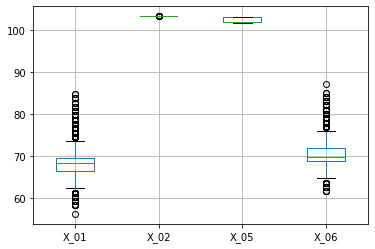

In [ ]:
train[['X_01','X_02','X_05','X_06']].boxplot()
#체결 시 단계별 누름량(step1,2,3,4) 분포
#2,3단계에 많이 누르는 편이다.

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


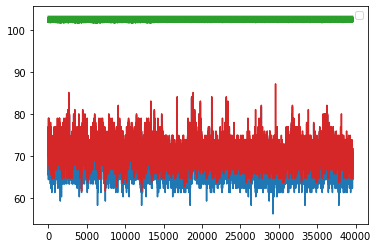

In [ ]:
for i in ['X_01','X_02','X_05','X_06']:
    plt.plot(train[i])
    plt.legend()
#체결 시 단계별 누름량(step1,2,3,4) 시각화 
#누름량 분석 결과 step 2,3일 때 많은 편이다.

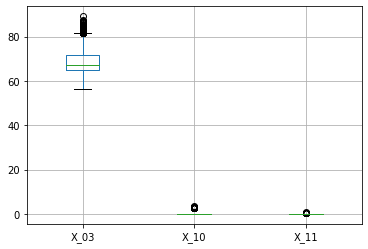

In [ ]:
train[['X_03','X_10','X_11']].boxplot()
#방열재료 1,2,3 무게 분포
#무게는 X_10,X_11에서 0에 수렴하는 편.

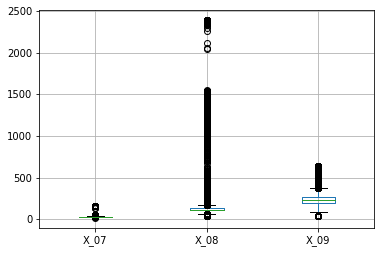

In [ ]:
train[['X_07','X_08','X_09']].boxplot()
#방열재료 1,2,3 면적 분포
#X_08에서 면적이 넓은게 은근히 많다.

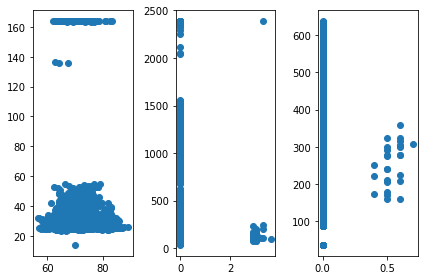

In [ ]:
#두 면적간 상관관계(무게,면적)
plt.subplot(1,3,1)
plt.scatter(train['X_03'],train['X_07'])
plt.subplot(1,3,2)
plt.scatter(train['X_10'],train['X_08'])
plt.subplot(1,3,3)
plt.scatter(train['X_11'],train['X_09'])
plt.tight_layout()
plt.show()
#각 방열재료마다 상관관계 확인한 결과 1번째는 무게와 면적은 상관없다
#2,3번째는 무게가 0이 많다
#1번째 재료는 2,3번째 방열재료에 비해 무거운 편이지만 다른 재료에 비해 면적이 좁다.

### 커넥터

In [ ]:
#커넥터 위치 좌표 
train['X_12'].describe()

count    39607.000000
mean         4.373228
std          0.021806
min          4.270000
25%          4.360000
50%          4.370000
75%          4.390000
max          4.490000
Name: X_12, dtype: float64

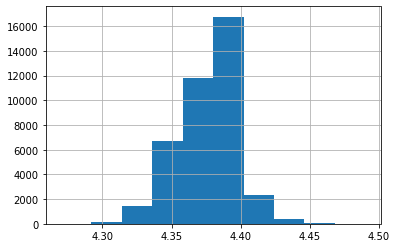

In [ ]:
train['X_12'].hist()
#원점으로부터 거리값이 대체로 4.35~4.4가 많은편

findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.


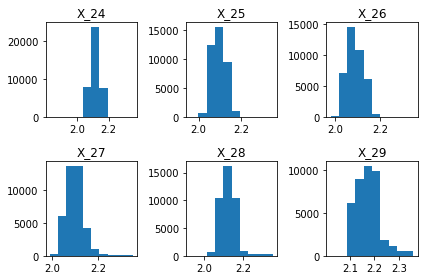

In [ ]:
#X_24~29 커넥터 1,2,3,4,5,6번 핀 치수 분포
count=1
for i in ['X_24','X_25','X_26','X_27','X_28','X_29']:
    plt.subplot(2,3,count)
    plt.hist(train[i])
    plt.title(i)
    count+=1
plt.tight_layout()
plt.show()
#2대에 분포함

### 안테나 패드

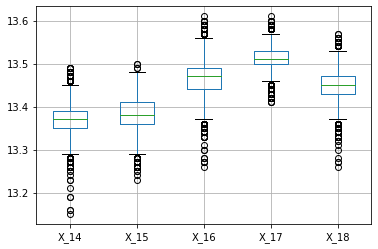

In [ ]:
#X_14~18 1,2,3,4,5번 안테나 패드 위치
train[['X_14','X_15','X_16','X_17','X_18']].boxplot()
#train_x['X_13'].boxplot()
#패드 위치에서는 1,2번/3,5번은 비슷한편 4번이 패드 위치가 좀 높다.
#분산이 심한 부분은 3번이다

In [ ]:
train[['X_14','X_15','X_16','X_17','X_18']].describe(include='all')

,X_14,X_15,X_16,X_17,X_18
count,39607.000000,39607.000000,39607.000000,39607.000000,39607.000000
mean,13.372201,13.381914,13.463860,13.512589,13.449263
std,0.029865,0.029468,0.036741,0.023436,0.029093
min,13.150000,13.230000,13.260000,13.410000,13.260000
25%,13.350000,13.360000,13.440000,13.500000,13.430000
50%,13.370000,13.380000,13.470000,13.510000,13.450000
75%,13.390000,13.410000,13.490000,13.530000,13.470000
max,13.490000,13.500000,13.610000,13.610000,13.570000


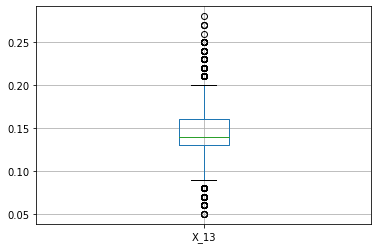

In [ ]:
#X_13 각 안테나 패드 위치(높이) 차이
train_x[['X_13']].boxplot()
#안테나 패드 높이의 차이는 없는 편

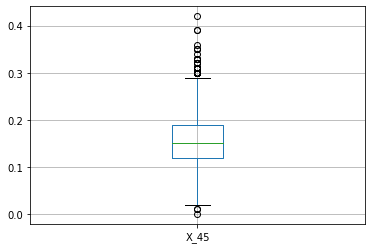

In [ ]:
train[['X_45']].boxplot() #안테나 부분 레이돔 기울기 분포는 0.1~0.2가 대부분

### 각 번호별 스크류 삽입 깊이 분포

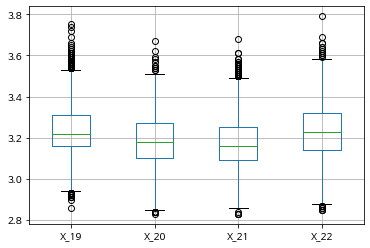

In [ ]:
train[['X_19','X_20','X_21','X_22']].boxplot()
#각 번호별 스크류 삽입 깊이 분포
#넷다 비슷함

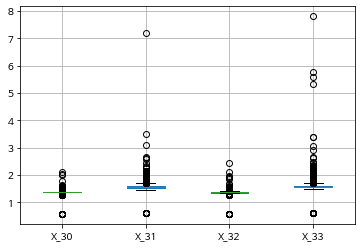

In [ ]:
train[['X_30','X_31','X_32','X_33']].boxplot()
#스크류가 깊어질수록 생기는 변화 분포
#스크류가 깊어질수록 큰 변화는 없다.

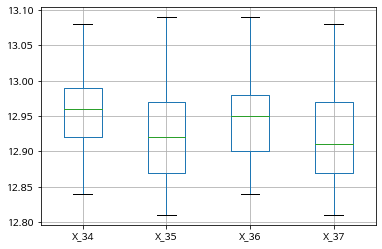

In [ ]:
#스크류 체결 시 분당 회전수
train[['X_34','X_35','X_36','X_37']].boxplot()
#분당 회전수는 회전 수가 2,4일 때와 1,3일 때 분포가 비슷함

In [ ]:
train[['X_34','X_35','X_36','X_37']].describe(include='all') #분산과 평균에 별 차이가 없음

,X_34,X_35,X_36,X_37
count,39607.000000,39607.000000,39607.000000,39607.000000
mean,12.950271,12.920343,12.941728,12.919139
std,0.044030,0.052238,0.047830,0.052292
min,12.840000,12.810000,12.840000,12.810000
25%,12.920000,12.870000,12.900000,12.870000
50%,12.960000,12.920000,12.950000,12.910000
75%,12.990000,12.970000,12.980000,12.970000
max,13.080000,13.090000,13.090000,13.080000


In [ ]:
train[['X_34','X_35','X_36','X_37']].mean()

X_34    12.950271
X_35    12.920343
X_36    12.941728
X_37    12.919139
dtype: float64

In [ ]:
frame=train[['X_34','X_35','X_36','X_37']] #screw 평균을 내는 데이터 프레임 제작

In [ ]:
frame2=test[['X_34','X_35','X_36','X_37']]

In [ ]:
frame['screw_mean'] = frame.mean(axis=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
frame2['screw_mean'] = frame2.mean(axis=1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
frame2['screw_mean']

0        12.9400
1        12.9275
2        12.9650
3        12.9600
4        12.9625
          ...   
39603    12.9475
39604    12.9650
39605    12.9325
39606    12.9650
39607    12.9525
Name: screw_mean, Length: 39608, dtype: float64

In [ ]:
train['screw_mean']=frame['screw_mean']

In [ ]:
test['screw_mean']=frame2['screw_mean']

In [ ]:
train_x.drop(['X_34','X_35','X_36','X_37'],axis=1,inplace=True) #56개의 열->52개의 열
train_x.shape

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


(39607, 52)

In [ ]:
train_x['screw_mean']=frame['screw_mean']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
train_x.head()

,X_01,X_02,X_03,X_04,X_05,X_06,X_07,X_08,X_09,X_10,...,X_48,X_49,X_50,X_51,X_52,X_53,X_54,X_55,X_56,screw_mean
0,70.544,103.320,67.47,1,101.892,74.983,29.45,62.38,245.71,0.0,...,1,9706.03,137.043591,135.359219,147.837968,134.313475,125.605427,136.721425,125.028256,12.9375
1,69.524,103.321,65.17,1,101.944,72.943,28.73,61.23,233.61,0.0,...,1,10423.43,133.736691,135.979817,149.924692,123.630583,127.893337,143.322659,124.877308,12.9025
2,72.583,103.320,64.07,1,103.153,72.943,28.81,105.77,272.20,0.0,...,1,10948.53,132.805112,131.055355,146.814592,128.939070,127.012195,140.395688,122.238232,12.9275
3,71.563,103.320,67.57,1,101.971,77.022,28.92,115.21,255.36,0.0,...,1,15007.03,134.138760,133.239422,139.720132,132.260824,130.723186,147.624829,134.875225,12.9475
4,69.524,103.320,63.57,1,101.981,70.904,29.68,103.38,241.46,0.0,...,1,11051.03,142.728970,136.620022,134.853555,134.760252,125.647793,139.331105,123.272762,12.9200


In [ ]:
train_x['X_46'].describe()
#실란트 도포할 경우 1457~1469.1469가 많다.

count    39607.000000
mean      1468.275305
std          2.121517
min       1457.000000
25%       1469.000000
50%       1469.000000
75%       1469.000000
max       1469.000000
Name: X_46, dtype: float64

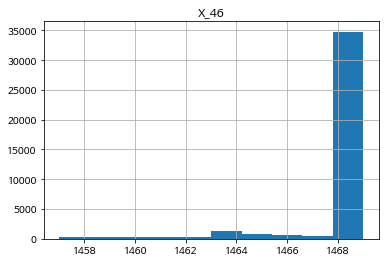

In [ ]:
train_x[['X_46']].hist()
plt.show()

### 하우징 pcb 안착부

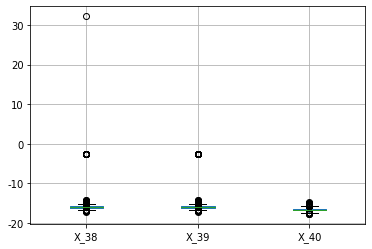

In [ ]:
train[['X_38','X_39','X_40']].boxplot()
#하우징 pcb 안착부 1,2,3치수 =>1치수에 뚜렷한 이상점이 2개 나타남.

In [ ]:
train[['X_38','X_39','X_40']].describe(include='all')

,X_38,X_39,X_40
count,39607.000000,39607.000000,39607.000000
mean,-15.903737,-15.889576,-16.572162
std,0.595420,0.746665,0.344486
min,-17.090000,-17.090000,-17.720000
25%,-16.160000,-16.160000,-16.810000
50%,-15.990000,-15.990000,-16.640000
75%,-15.750000,-15.750000,-16.400000
max,32.230000,-2.650000,-14.800000


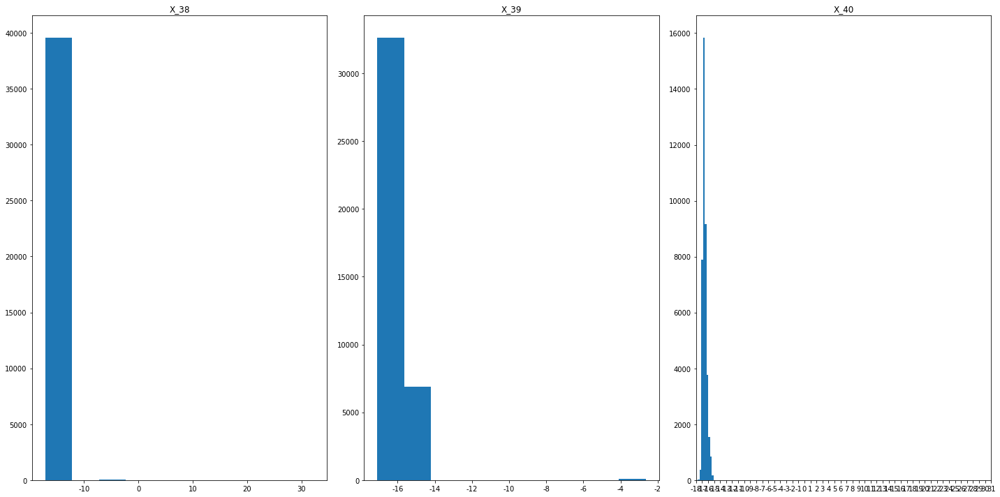

In [ ]:
plt.subplots(figsize=(20,10))
count=1
for i in ['X_38','X_39','X_40']:
    plt.subplot(1,3,count)
    plt.hist(train[i])
    plt.title(i)
    count+=1
plt.xticks(np.arange(-18,32))
plt.tight_layout()
plt.show()
#안착부 치수는 음의 형태로 분포함

### 레이돔

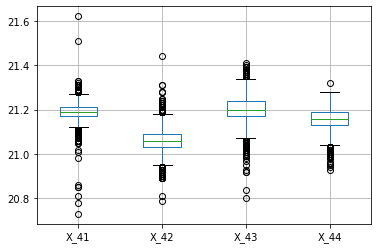

In [ ]:
#레이돔 분포
train[['X_41','X_42','X_43','X_44']].boxplot()
#가장 골고루 분포되는 부분은 안테나 4이 골고루 분포되고 이상값이 가장 많은건 1번이다.

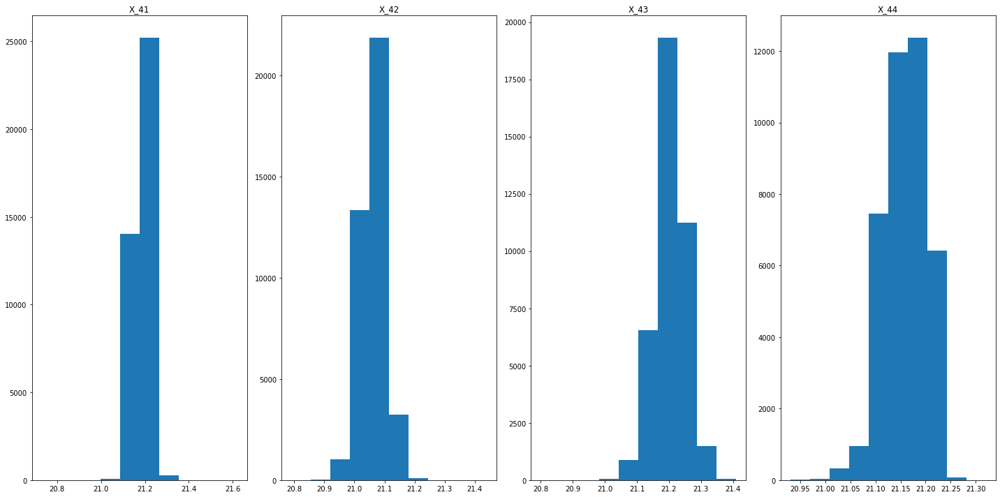

In [ ]:
plt.subplots(figsize=(20,10))
count=1
for i in ['X_41','X_42','X_43','X_44']:
    plt.subplot(1,4,count)
    plt.hist(train[i])
    plt.title(i)
    count+=1
plt.tight_layout()
plt.show()
#안착부 치수는 음의 형태로 분포함

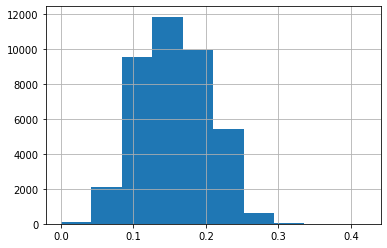

In [ ]:
train['X_45'].hist() #기울기도 대체로 0.1~0.2

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb23b7cfe10>]],
      dtype=object)

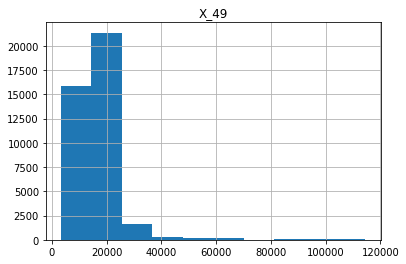

In [ ]:
train[['X_49']].hist()
#Cal 투입 전 대기 시간은 20000 이내에 대부분 분포하는 편

### X_50~56 RF1,RF2,RF3,RF4,RF5,RF6 부분 SMT 납량

In [ ]:
train['X_50'].describe()

count    39607.000000
mean       130.774557
std          5.989845
min         21.800000
25%        126.948571
50%        130.723378
75%        134.538998
max        162.619458
Name: X_50, dtype: float64

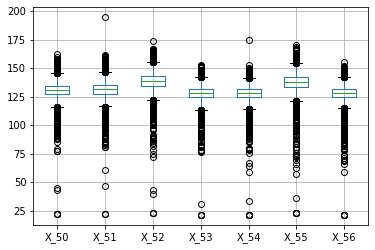

In [ ]:
train[['X_50','X_51','X_52','X_53','X_54','X_55','X_56']].boxplot()
#RF1~RF7부분 smt 냡량에는 별 차이가 없다.

### y변수별 불량분포 확인

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 50504 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 53580 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 45208 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 54217 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44512 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44033 missing from current font.
  font.set_

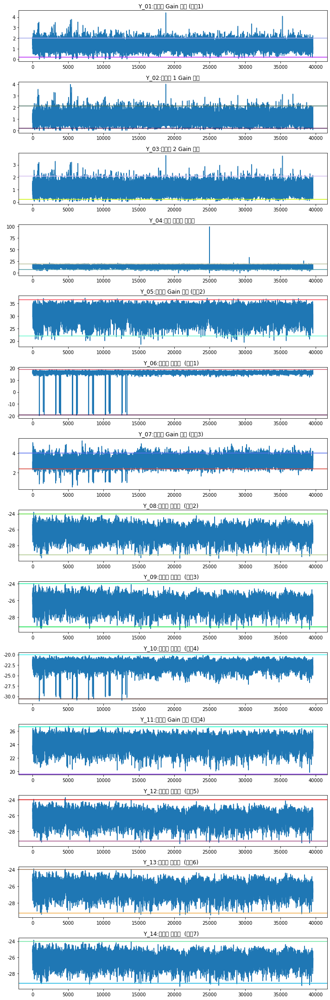

In [ ]:
plt.subplots(figsize=(10,30))
count=1
for col in (train_y.columns):
    plt.subplot(14,1,count)
    #print(train_x[col].name)
    plt.plot(train_y[col])
    plt.axhline(y_spec['최소'][count-1],color=np.random.rand(3,))
    plt.axhline(y_spec['최대'][count-1],color=np.random.rand(3,))
    plt.title("{}:{}".format(col,y_feature['설명'][count-1]))
    count+=1
    plt.tight_layout()
plt.show()

In [ ]:
#정상 판별 확률: 'Y_11'가 가장 높고 'Y_07'이 가장 낮음
for i in range(y_spec.shape[0]):
    print((train_y.loc[(train_y[y_spec['Feature'][i]]>=y_spec['최소'][i]) &
            (train_y[y_spec['Feature'][i]]<=y_spec['최대'][i])].shape[0])/train_y.shape[0])

0.9627338601762315
0.9859115812861363
0.9882848991339914
0.9873759688943874
0.9977024263387785
0.9997475193778878
0.9539980306511475
0.9995202868179868
0.9995202868179868
0.9998737596889439
0.9999242558133663
0.9995960310046204
0.9996212790668316
0.999671775191254


- 정상 판별 낮은 값: y_07의 0.9539980306511475 (안테나 gain 평균: 각도3)
- 정상 판별 높은 값: y_11의 0.9999242558133663 (안테나 gain 평균:각도4)

## y변수당 상관관계 분석

In [ ]:
train_y.shape

(39607, 14)

In [ ]:
train_x.shape

(39607, 56)

In [ ]:
for i in train_x.columns:
    print("{}:{}".format(i,np.corrcoef(train_x[i],train_y['Y_05'])[0,1]))
    #nan은 검사통과여부임.
    #X_13이 높은 상관성을 가짐:0.06

X_01:0.011155463493171688
X_02:-0.008923361051240832
X_03:0.002662225239227306
X_04:nan
X_05:-0.001099645823293562
X_06:0.022089029558406297
X_07:-0.0029056563360213496
X_08:-0.0013794724428881726
X_09:0.022067804883554077
X_10:-0.009099053899977168
X_11:-0.005805821691536818
X_12:0.02235941468664159
X_13:0.06307040166824165
X_14:-0.03475910105127705
X_15:-0.005379684952261904
X_16:-0.004333724151417004
X_17:0.03939360724015483
X_18:-0.02822416966721204
X_19:0.019174713703535948
X_20:0.00867897395018707
X_21:0.015731542622790175
X_22:0.01435640484016786
X_23:nan
X_24:-0.018114060752755394
X_25:-0.019783256915768908
X_26:-0.022602785133824584
X_27:-0.023177967284279514
X_28:-0.023553356248401342
X_29:-0.02636671818491297
X_30:0.0369688276829683
X_31:0.024690054546170046
X_32:0.03827617319438211
X_33:0.02497214833009737
X_34:0.004674574355117151
X_35:0.013750144792679065
X_36:-0.0012885184144813635
X_37:0.012140540768916182
X_38:-0.016004979371761242
X_39:-0.010757098307788185
X_40:-0.01

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


findfont: Font family ['NanumBarunGothic'] not found. Falling back to DejaVu Sans.
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 52404 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44208 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 45800 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44228 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/bac

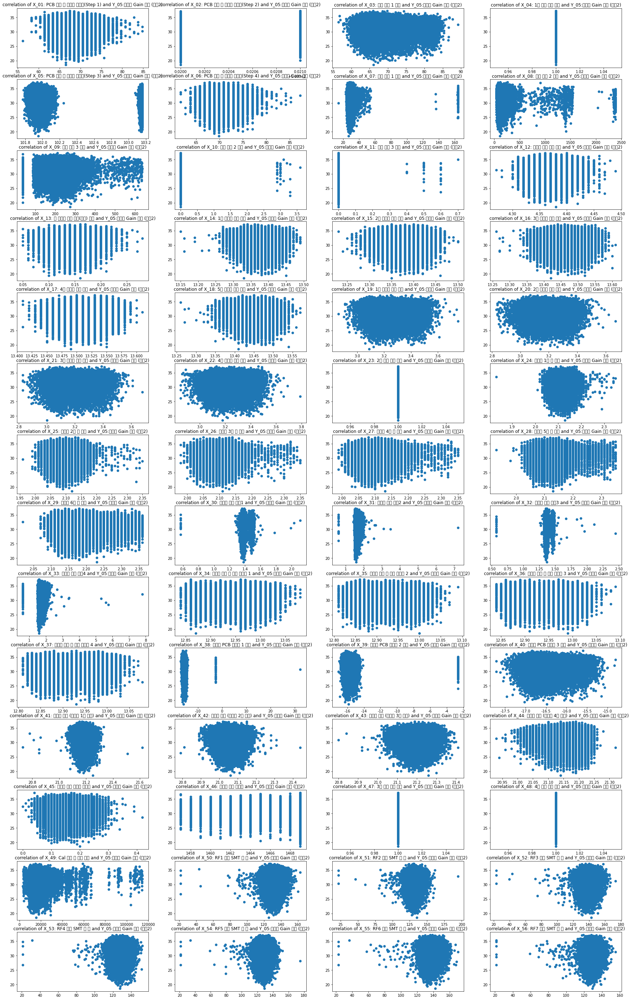

In [ ]:
plt.subplots(figsize=(30,50)) #y05:안테나 gain 평균
count=1
for col in (train_x.columns):
    plt.subplot(14,4,count)
    #print(train_x[col].name)
    plt.scatter(train_x[col],train_y['Y_05'])
    plt.title("correlation of {}: {} and Y_05:{}".format(train_x[col].name,x_feature['설명'][count-1], y_feature['설명'][4]))
    count+=1
    #plt.tight_layout()
plt.show()
#전부 검사 통과한 상태
#PCB 체결 시 단계별 누름량: step2에서 0.2,0.225뿐. step3는 101~102.2 혹은 103.2에 치우침
#방열재료 1 무게를 제외하고는 2,3,은 0일 때 많이 몰린 편. 방열재료 무게가 0?
#방열재료 면적: 면적이 20~40, 100~1500,2500에 분포함
#커넥터 위치 기준 좌표: 4.3~4.45에 몰려있음.
#여기서 높은 상관성을 지닌 안테나 패드 위치 차이를 봤을 때 0.05~0.25까지 대칭을 이루고 있음
#1,2,3,4 안테나 패드 위치: 3번에 많이 밀집되어있는 편
#1번 핀치수에 많이 쏠려있는 편
#투입전 대기시간은 20000~60000대가 많음
#레이돔기울기:0.1~0.3으로 분포

In [ ]:
for i in train_x.columns: #신호대 잡음비
    print("{}:{}".format(i,np.corrcoef(train_x[i],train_y['Y_06'])[0,1]))
    #nan은 검사통과여부임.
    #X_37이 가장 음의 상관계수를 띔(스크류 체결 시 분당 회전 수)
    #X_30이 제일 양의 상관계수를 띔

X_01:-0.007629992585911057
X_02:-0.00515334037060102
X_03:-0.029823228800514228
X_04:nan
X_05:0.016568960148872415
X_06:-0.030357295057181887
X_07:-0.00885388956637111
X_08:0.0008973030459958253
X_09:0.015840321638741932
X_10:-0.00588300662354447
X_11:-0.004467401007684065
X_12:-0.008091767612282719
X_13:0.014002930654941594
X_14:0.014862026690499514
X_15:0.00708142461149323
X_16:0.030847563171461218
X_17:0.03371433949370564
X_18:0.009810888920266042
X_19:-0.0636764937627621
X_20:-0.049515047521291024
X_21:-0.057248265010838184
X_22:-0.048523456591457396
X_23:nan
X_24:-0.012011531989143728
X_25:-0.0006266245966135726
X_26:-0.014670985029026069
X_27:-0.004949880052807178
X_28:-0.005094817669275714
X_29:0.002273480859692552
X_30:0.044699091208711995
X_31:0.03464726855899843
X_32:0.02902025381771382
X_33:0.026505043402466816
X_34:-0.003516373964144097
X_35:-0.00029614310241864243
X_36:-0.005245886047457278
X_37:-4.258608519600211e-05
X_38:-0.02085756973580657
X_39:-0.013149799312521193
X_

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [ ]:
train_x['X_02'].describe(include='all')

count    39607.000000
mean       103.320166
std          0.000372
min        103.320000
25%        103.320000
50%        103.320000
75%        103.320000
max        103.321000
Name: X_02, dtype: float64

In [ ]:
train_x['X_02'].value_counts()

103.320    33020
103.321     6587
Name: X_02, dtype: int64

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 52404 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44208 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 45800 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44228 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_

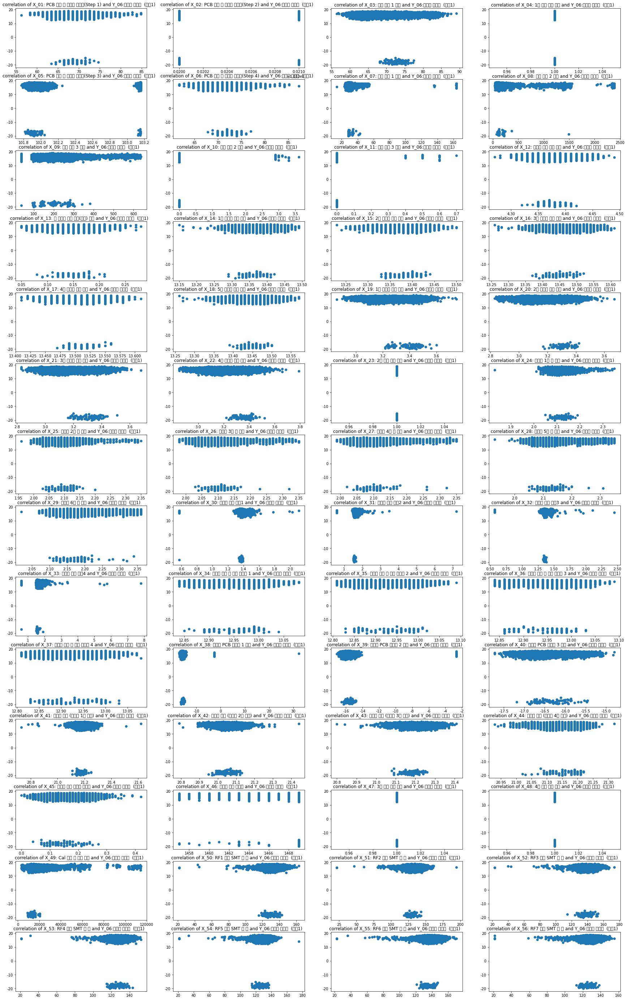

-0.06367649376276209

In [ ]:
plt.subplots(figsize=(30,50))
count=1
for col in (train_x.columns):
    plt.subplot(14,4,count)
    #print(train_x[col].name)
    plt.scatter(train_x[col],train_y['Y_06'])
    plt.title("correlation of {}: {} and Y_06:{} ".format(train_x[col].name,x_feature['설명'][count-1], y_feature['설명'][5]))
    count+=1
    #plt.tight_layout()
plt.show()
#전부 검사 통과한 상태
#PCB 체결 시 단계별 누름량: step2은 103밖에 없음.단계별마다 큰 차이는 없음
#방열재료 1 무게를 제외하고는 2,3,은 0일 때 많이 몰린 편. 방열재료 무게가 0?
#방열재료 면적: 면적이 20~40, 100~1500,2500에 분포함
#커넥터 위치 기준 좌표: 4.3~4.45에 몰려있음.
#여기서 높은 상관성을 지닌 안테나 패드 위치 차이를 봤을 때 잡음은 20에 몰려있는 편
#1,2,3,4 안테나 패드 위치: 잡음은 4번이 덜하고 3번이 심함
#X_37이 가장 음의 상관계수를 띔(스크류 체결 시 분당 회전 수)
-0.06367649376276209
#X_30이 제일 양의 상관계수를 띔
#하우징 pcb 안착수 3번에서 잡음이 많음
#투입전 대기시간은 20000~60000대가 많음
#레이돔기울기:0.1~0.3으로 분포

In [ ]:
train_x['X_02'].value_counts()

103.320    33020
103.321     6587
Name: X_02, dtype: int64

In [ ]:
for i in train_x.columns:
    print("{}:{}".format(i,np.corrcoef(train_x[i],train_y['Y_07'])[0,1]))
    #nan은 검사통과여부임.
    #X_14에서 높은 상관성을 가짐

X_01:-0.03873325070033192
X_02:0.003732432738601478
X_03:-0.02200218206695201
X_04:nan
X_05:-0.01945324324233418
X_06:-0.03152717330007426
X_07:0.003107433732414319
X_08:0.005572120103676547
X_09:0.0032945292908129523
X_10:0.0064377955463660015
X_11:0.0025470867426262388
X_12:-0.004275462055122505
X_13:-0.08662227415751896
X_14:0.05918000925710925
X_15:0.008189477750565425
X_16:0.007989927787045364
X_17:-0.03891881697690238
X_18:0.024975742510582145
X_19:-0.09303190883849051
X_20:-0.061651112116378644
X_21:-0.086303338447219
X_22:-0.08195726587064375
X_23:nan
X_24:0.026424445352473458
X_25:0.04010994967098212
X_26:0.02659898027387267
X_27:0.03425405858957149
X_28:0.028754773228324034
X_29:0.0394543605389195
X_30:-0.02356838345581071
X_31:-0.013021712035657402
X_32:-0.03182345916994341
X_33:-0.006360169002730283
X_34:-0.004170178425286479
X_35:-0.0056807714940142
X_36:0.002510911423657827
X_37:-0.008121061096427577
X_38:-0.005381996076653774
X_39:-0.0012242689566449153
X_40:-0.024686250

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 52404 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44208 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 45800 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44228 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_

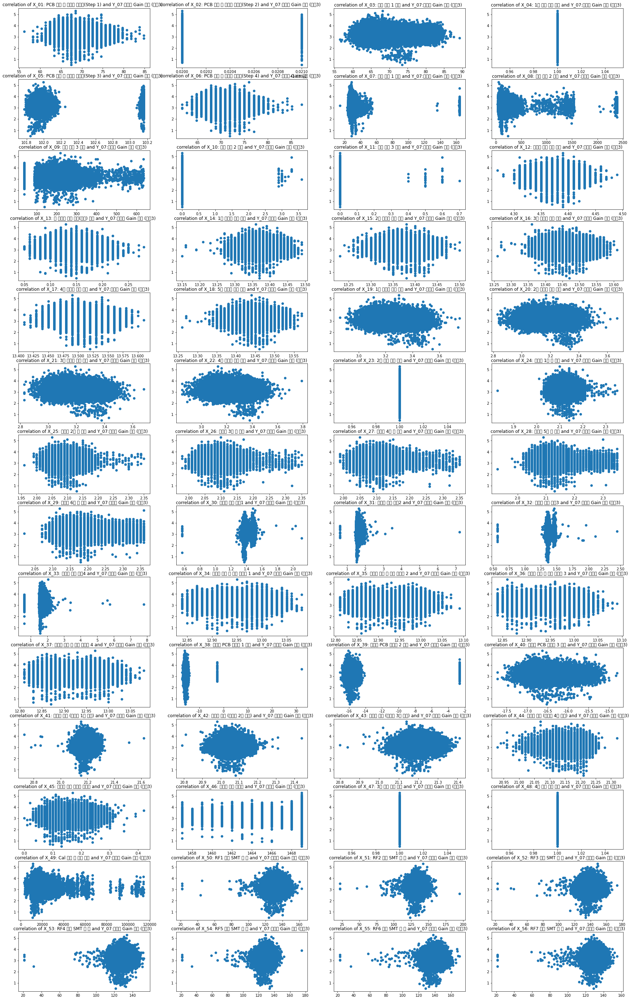

In [ ]:
plt.subplots(figsize=(30,50))#안테나 gain 평균(각도3)
count=1
for col in (train_x.columns):
    plt.subplot(14,4,count)
    #print(train_x[col].name)
    plt.scatter(train_x[col],train_y['Y_07'])
    plt.title("correlation of {}: {} and Y_07:{}".format(train_x[col].name,x_feature['설명'][count-1], y_feature['설명'][6]))
    count+=1
    #plt.tight_layout()
plt.show()
#전부 검사 통과한 상태
#안테나 패드 위치에서 13.25~13.5에 많이 모임.

In [ ]:
for i in train_x.columns:##신호대 잡음비
    print("{}:{}".format(i,np.corrcoef(train_x[i],train_y['Y_08'])[0,1]))
    #nan은 검사통과여부임.
    #X_20에서 높은 상관성을 가짐

X_01:0.07142136364401135
X_02:-0.013776161202117084
X_03:0.12004480455039883
X_04:nan
X_05:0.03586187924153806
X_06:0.07310015297091416
X_07:-0.015634351195537254
X_08:-0.004639938666888681
X_09:0.003953837293499711
X_10:-0.018981868094719797
X_11:-0.01561958382686537
X_12:0.021017526192784294
X_13:0.026795332195206526
X_14:-0.06682028406510582
X_15:0.0015164729890849206
X_16:-0.09181561445058438
X_17:-0.03389721282952542
X_18:-0.06618069663894409
X_19:0.11759106931420103
X_20:0.14840434644482414
X_21:0.12692155841484895
X_22:0.14480695424607476
X_23:nan
X_24:-0.04261373509506858
X_25:-0.06811447655163597
X_26:-0.03887208876737476
X_27:-0.06407433205283708
X_28:-0.04399910963322669
X_29:-0.05501589465388283
X_30:0.07087047596144974
X_31:-0.04154836452701212
X_32:0.061694746314891025
X_33:-0.025899220970577005
X_34:0.016245270026843405
X_35:0.007463279459898807
X_36:-0.002032863557271904
X_37:-0.0009593250407650806
X_38:0.053001204919451025
X_39:0.04456181542384522
X_40:0.09772936341743

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 52404 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44208 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 49884 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 45800 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 44228 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 48324 missing from current font.
  font.set_

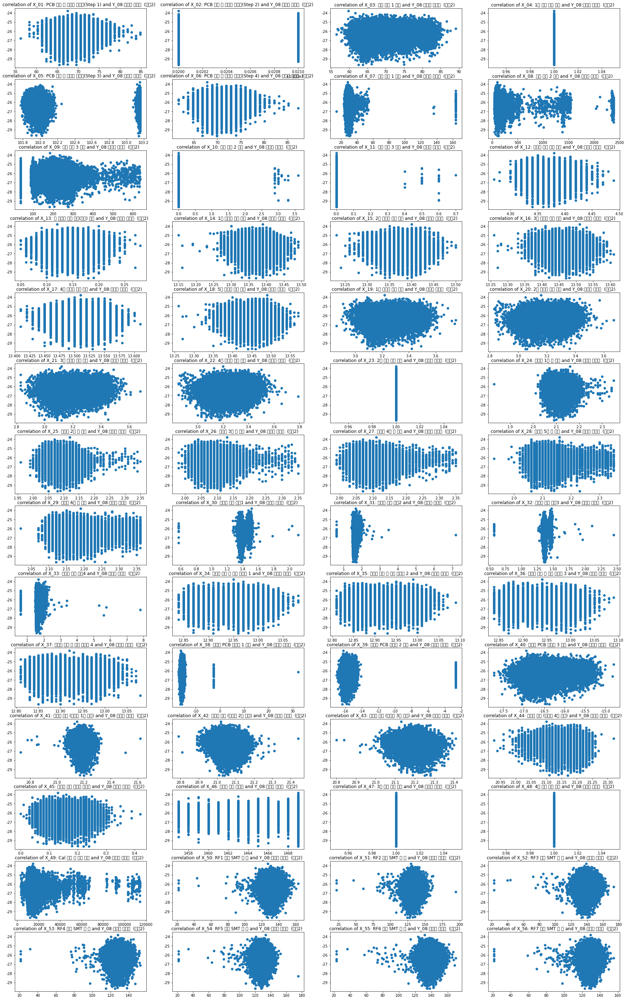

In [ ]:
plt.subplots(figsize=(30,50))#신호대 잡음비
count=1
for col in (train_x.columns):
    plt.subplot(14,4,count)
    #print(train_x[col].name)
    plt.scatter(train_x[col],train_y['Y_08'])
    plt.title("correlation of {}: {} and Y_08:{}".format(train_x[col].name,x_feature['설명'][count-1], y_feature['설명'][7]))
    count+=1
    #plt.tight_layout()
plt.show()
#2번 스크류 삽입 깊이에서 3.0~3.4에 몰리는 편이다.

### 상관관계 수치화

In [ ]:
yf5_corr=[]
for i in train_x.columns:
    yf5_corr.append(np.corrcoef(train_x[i],train_y['Y_05'])[0,1])
    #print(i,np.corrcoef(train_x[i],train_y['Y_05'])[0,1])

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [ ]:
yf6_corr=[]
for i in train_x.columns:
    yf6_corr.append(np.corrcoef(train_x[i],train_y['Y_06'])[0,1])

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [ ]:
yf7_corr=[]
for i in train_x.columns:
    yf7_corr.append(np.corrcoef(train_x[i],train_y['Y_07'])[0,1])

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [ ]:
yf8_corr=[]
for i in train_x.columns:
    yf8_corr.append(np.corrcoef(train_x[i],train_y['Y_08'])[0,1])

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [ ]:
corr=pd.DataFrame([yf5_corr,yf6_corr,yf7_corr,yf8_corr],index=[
    "yf5_corr","yf6_corr","yf7_corr","yf8_corr"],columns=x_feature['설명']).T

In [ ]:
corr['yf8_corr'].max()

0.14840434644482414

In [ ]:
corr.describe(include='all')

,yf5_corr,yf6_corr,yf7_corr,yf8_corr
count,52.000000,52.000000,52.000000,52.000000
mean,0.005267,0.002583,-0.004058,0.008689
std,0.020864,0.024722,0.033475,0.059309
min,-0.034759,-0.063676,-0.093032,-0.091816
25%,-0.008926,-0.007745,-0.014630,-0.035141
50%,0.001412,0.002452,0.000643,0.002401
75%,0.022073,0.021208,0.016996,0.043072
max,0.063070,0.044699,0.059180,0.148404


In [ ]:
corr.sort_values(by=['yf5_corr'],ascending=False)[:10]
#음의 상관관계가 큰 값: 1번 안테나 패드 위치(x_14)
#x_18,x_29,x_28,x_27,x_26,x_25,x_40,x_24,x_38
#양의 상관관계가 큰 값:
#X_13(각 안테나 패드 위치 높이 차이)이 높은 상관성을 가짐:0.06
#x_56,x_17,x_21,x_19,x_50,x_49,x_51,x_33,x_53

,yf5_corr,yf6_corr,yf7_corr,yf8_corr
설명,,,,
각 안테나 패드 위치(높이) 차이,0.063070,0.014003,-0.086622,0.026795
RF7 부분 SMT 납 량,0.040797,0.035044,-0.004474,0.011448
4번 안테나 패드 위치,0.039394,0.033714,-0.038919,-0.033897
스크류 삽입 깊이3,0.038276,0.029020,-0.031823,0.061695
스크류 삽입 깊이1,0.036969,0.044699,-0.023568,0.070870
RF1 부분 SMT 납 량,0.031173,0.027812,-0.012394,0.012981
Cal 투입 전 대기 시간,0.026500,0.021373,-0.012696,0.009624
RF2 부분 SMT 납 량,0.026313,0.021153,-0.002905,0.049606
스크류 삽입 깊이4,0.024972,0.026505,-0.006360,-0.025899


In [ ]:
corr.sort_values(by=['yf6_corr'],ascending=True)[:10]
#음의 상관관계가 큰 값:x_19(스크류 체결 시 분당 회전 수)
#그 외에 x_21,x_20,x_22,x_40,x_06,x_03,x_38,x_39
#X_30이 제일 양의 상관계수를 띔
#x_43,x_56,x_31,x_17,x_16,x_32,x_50,x_33,x_41순

,yf5_corr,yf6_corr,yf7_corr,yf8_corr
설명,,,,
1번 스크류 삽입 깊이,0.019175,-0.063676,-0.093032,0.117591
3번 스크류 삽입 깊이,0.015732,-0.057248,-0.086303,0.126922
2번 스크류 삽입 깊이,0.008679,-0.049515,-0.061651,0.148404
4번 스크류 삽입 깊이,0.014356,-0.048523,-0.081957,0.144807
하우징 PCB 안착부 3 치수,-0.018642,-0.034211,-0.024686,0.097729
PCB 체결 시 단계별 누름량(Step 4),0.022089,-0.030357,-0.031527,0.073100
방열 재료 1 무게,0.002662,-0.029823,-0.022002,0.120045
하우징 PCB 안착부 1 치수,-0.016005,-0.020858,-0.005382,0.053001
커넥터 3번 핀 치수,-0.022603,-0.014671,0.026599,-0.038872


In [ ]:
corr.sort_values(by=['yf7_corr'],ascending=True)[:10]
#x_19(-0.093032)가 가장 음의 상관관계를 띔
#x_13,x_21,x_22,x_17,x_01,x_32,x_06,x_40
#양의 상관계수: x_14에서 가장 높음
#x_25,x_29,x_41,x_55,x_27,x_28,x_54,x_26,x_24

,yf5_corr,yf6_corr,yf7_corr,yf8_corr
설명,,,,
1번 스크류 삽입 깊이,0.019175,-0.063676,-0.093032,0.117591
각 안테나 패드 위치(높이) 차이,0.063070,0.014003,-0.086622,0.026795
3번 스크류 삽입 깊이,0.015732,-0.057248,-0.086303,0.126922
4번 스크류 삽입 깊이,0.014356,-0.048523,-0.081957,0.144807
2번 스크류 삽입 깊이,0.008679,-0.049515,-0.061651,0.148404
4번 안테나 패드 위치,0.039394,0.033714,-0.038919,-0.033897
PCB 체결 시 단계별 누름량(Step 1),0.011155,-0.007630,-0.038733,0.071421
스크류 삽입 깊이3,0.038276,0.029020,-0.031823,0.061695
PCB 체결 시 단계별 누름량(Step 4),0.022089,-0.030357,-0.031527,0.073100


In [ ]:
corr.sort_values(by=['yf8_corr'],ascending=True)[:10]
#양의 상관계수순: x_20,x_22,x_21,x_03,x_19,x_40,x_06,x_01,x_30,x_32

,yf5_corr,yf6_corr,yf7_corr,yf8_corr
설명,,,,
3번 안테나 패드 위치,-0.004334,0.030848,0.007990,-0.091816
레이돔 치수 (안테나 2번 부위),-0.001648,0.002630,0.014922,-0.085555
커넥터 2번 핀 치수,-0.019783,-0.000627,0.040110,-0.068114
1번 안테나 패드 위치,-0.034759,0.014862,0.059180,-0.066820
5번 안테나 패드 위치,-0.028224,0.009811,0.024976,-0.066181
커넥터 4번 핀 치수,-0.023178,-0.004950,0.034254,-0.064074
레이돔 치수 (안테나 4번 부위),0.003923,0.006946,0.006031,-0.058831
커넥터 6번 핀 치수,-0.026367,0.002273,0.039454,-0.055016
레이돔 치수 (안테나 3번 부위),-0.001628,0.036671,0.025305,-0.049196


- yf5: #음의 상관관계가 큰 값: 1번 안테나 패드 위치(x_14)
 - x_18,x_29,x_28,x_27,x_26,x_25,x_40,x_24,x_38
 - 양의 상관관계가 큰 값:
 - X_13(각 안테나 패드 위치 높이 차이)이 높은 상관성을 가짐:0.06
 - x_56,x_17,x_21,x_19,x_50,x_49,x_51,x_33,x_53
- yf6: #음의 상관관계가 큰 값:x_19(스크류 체결 시 분당 회전 수)
 - 그 외에 x_21,x_20,x_22,x_40,x_06,x_03,x_38,x_39
 - X_30이 제일 양의 상관계수를 띔
 - x_43,x_56,x_31,x_17,x_16,x_32,x_50,x_33,x_41순
- yf7: 음의 상관계수 순: x_19,x_13,x_21,x_22,x_17,x_01,x_32,x_06,x_40
 - 양의 상관계수: x_14에서 가장 높음
 - x_25,x_29,x_41,x_55,x_27,x_28,x_54,x_26,x_24
- yf8:음의 상관관계가 큰 순서:x_16,x_42,x_25,x_14,x_18,x_27,x_44,x_29,x_43,x_28
 - 양의 상관계수순: x_20,x_22,x_21,x_03,x_19,x_40,x_06,x_01,x_30,x_32

- 방열재료 2,3은 공정에 사용. 0은 결측치
- 순서가 작을수록 앞에서 일어나는 공정
- X_12(커넥터 위치 기준좌표값): 장비의 원점으로부터 거리값
- X_19~22,X_30~33: 스크류 삽입 깊이를 측정하기 위해 수짐
- 하지만 서로 다른 장비로 측정, 측정 위치가 다름

In [ ]:
train['X_03'].describe(include='all')
#결측값이 없다(방열재료 1번 무게값)

count    39607.000000
mean        68.826354
std          5.151167
min         56.470000
25%         65.070000
50%         67.270000
75%         71.770000
max         89.170000
Name: X_03, dtype: float64

In [ ]:
train['X_10'].value_counts()

0.0    39575
2.9       12
3.0       12
3.3        4
3.1        2
3.6        1
3.2        1
Name: X_10, dtype: int64

In [ ]:
train['X_11'].value_counts()

0.0    39580
0.5       12
0.6       11
0.4        3
0.7        1
Name: X_11, dtype: int64

- Y_01~Y_04에서 크게 영향을 주는 변수: X_16,X_17(3,4번 안테나 패드 위치)
- X_18,X_21,X_40,X_41,X_43,X_14,X_19,X_22,X_3,X_11,X_12,X_15,X_23,X_28,
- X_30,X_42,X_5,X_50
- 랜덤포레스트 경우에는 X_07. 하지만 상관계수 top10엔 없음.
- X_22,X_09,X_03,X_13,X_49,X_20,X_32,X_05,X_26,X_45,X_56,X_06,X_31,X_52

 - Y_09~Y_11에서 크게 영향을 주는 변수: 상관계수의 절댓값이 1에 가까우면 강한 상관관계를 가진다고 볼 수 있는데
 - 절댓값이 가장 큰 상관계수의 값은 X_20의 상관수:0.13906202399842338(Y_09)
 - Y_10: 상관계수의 절댓값이 1에 가까우면 강한 상관관계를 가진다고 볼 수 있는데 절댓값이 가장 큰 상관계수의 값은 X_18의 상관계수:-0.14386053943858237
 - Y_11:상관계수의 절댓값이 1에 가까우면 강한 상관관계를 가진다고 볼 수 있는 절댓값이 가장 큰 상관계수의 값은 X_17의 상관계수:0.06376052338397521
 - 종합 => X_20,X_18,X_17이 결정적 역할
 
- 결론: X_20,X_18,X_17은 모든 변수에 중요한 역할을 한다는 점에서 꼭 필요함

## 모델 설계 1)XGBoost

- 1,2,3,4 검사 통과여부는 모두 통과이므로 모델 설계시 이 요소는 생략
- 뚜렷한 상관관계가 나오지 않음

### y05~y08 분석

In [ ]:
yf5=pd.concat([train_x,train_y['Y_05']],axis=1)
yf5.head()

,X_01,X_02,X_03,X_04,X_05,X_06,X_07,X_08,X_09,X_10,...,X_48,X_49,X_50,X_51,X_52,X_53,X_54,X_55,X_56,Y_05
0,70.544,103.320,67.47,1,101.892,74.983,29.45,62.38,245.71,0.0,...,1,9706.03,137.043591,135.359219,147.837968,134.313475,125.605427,136.721425,125.028256,29.632
1,69.524,103.321,65.17,1,101.944,72.943,28.73,61.23,233.61,0.0,...,1,10423.43,133.736691,135.979817,149.924692,123.630583,127.893337,143.322659,124.877308,33.179
2,72.583,103.320,64.07,1,103.153,72.943,28.81,105.77,272.20,0.0,...,1,10948.53,132.805112,131.055355,146.814592,128.939070,127.012195,140.395688,122.238232,31.801
3,71.563,103.320,67.57,1,101.971,77.022,28.92,115.21,255.36,0.0,...,1,15007.03,134.138760,133.239422,139.720132,132.260824,130.723186,147.624829,134.875225,34.503
4,69.524,103.320,63.57,1,101.981,70.904,29.68,103.38,241.46,0.0,...,1,11051.03,142.728970,136.620022,134.853555,134.760252,125.647793,139.331105,123.272762,32.602


In [ ]:
yf5.drop(['X_04','X_48','X_23','X_47'],axis=1,inplace=True) #검사통과여부 제거

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(yf5[yf5.columns[:-1]], yf5['Y_05'] ,test_size=0.3)
xgb_model = xgb.XGBRegressor()
#xgb_model.fit(X_train,y_train,
#                            eval_set=[(X_train,y_train),(X_test,y_test)],
#                            eval_metric='rmse')
#validation_0-rmse:2.45639	validation_1-rmse:2.49981
xgb_model.fit(X_train,y_train)

[06:47:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

In [ ]:
#fig,ax=plt.subplots(figsize=(10,12))#맨 처음 모델 적용
#xgb.plot_importance(xgb_model,ax=ax)
#y_05:X_49,X_07,X_05,X_03이 눈에 띈다.
#처음에 상관분석할 때 가장 영향을 준 x_13은 8번째

In [ ]:
#x_18,x_29,x_28,x_27,x_26,x_25,x_40,x_24,x_38
#X_13(각 안테나 패드 위치 높이 차이)이 높은 상관성을 가짐:0.06

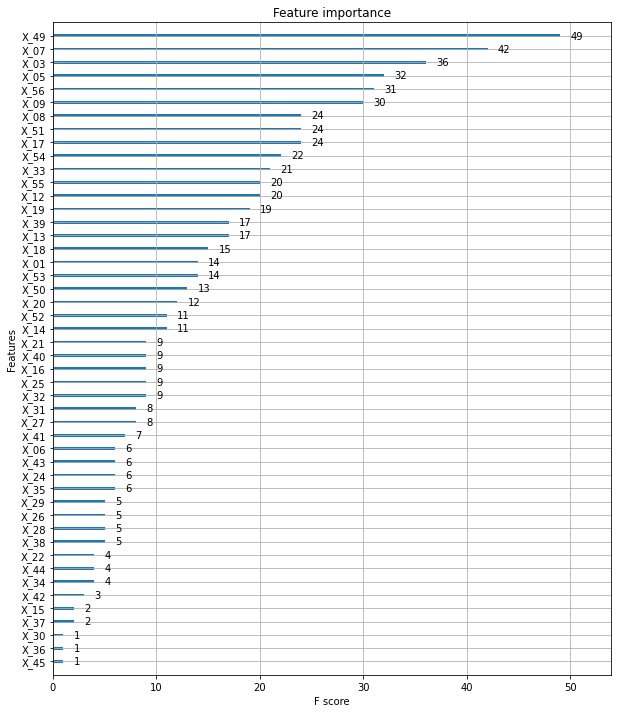

In [ ]:
fig,ax=plt.subplots(figsize=(10,12))#맨 처음 모델 적용하지 않은 부분
xgb.plot_importance(xgb_model,ax=ax)
#y_05:X_49,X_07,X_08,X_03,X_05이 눈에 띈다.
#x_18,x_29,x_28,x_27,x_26,x_25,x_40,x_24,x_38같은 음의상관관계 top10은 중하위권
#처음에 상관분석할 때 가장 영향을 준 x_13은 feature_importance가 19

In [ ]:
pred=xgb_model.predict(X_test)
rmse=np.sqrt(mean_squared_error(y_test,pred))
print("rmse: %f"%(rmse))

rmse: 2.491469


In [ ]:
#y_06
yf6=pd.concat([train_x,train_y['Y_06']],axis=1)
yf6.head()
yf6.shape
yf6.drop(['X_04','X_48','X_23','X_47'],axis=1,inplace=True) #검사통과여부 제거

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(yf6[yf6.columns[:-1]], yf6['Y_06'] ,test_size=0.3)
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train,y_train)

[06:47:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

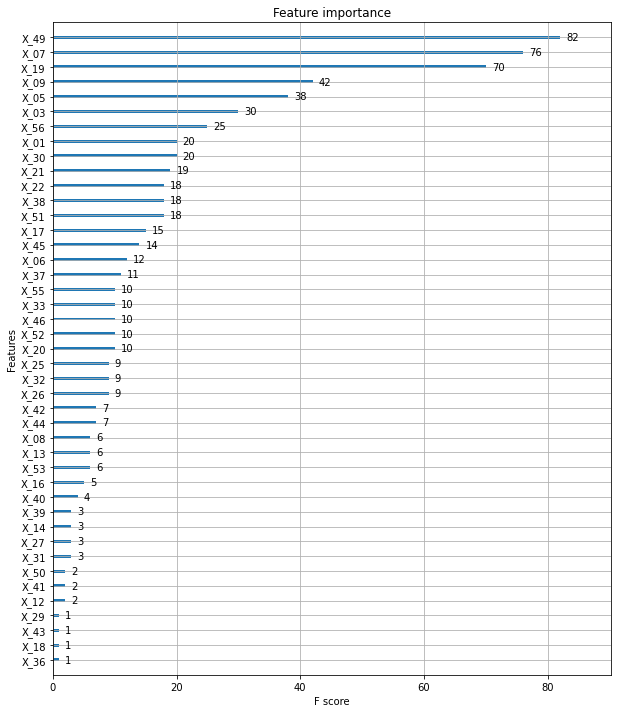

In [ ]:
fig,ax=plt.subplots(figsize=(10,12))
# fig,ax=plt.subplots(figsize=(10,12))#맨 처음 모델 적용
xgb.plot_importance(xgb_model,ax=ax)
#X_07,x_49가 눈에 띔
#X_19이 가장 음의 상관계수를 띄고 3위다.
#X_30이 제일 양의 상관계수를 띄고 여기선 7위

In [ ]:
pred=xgb_model.predict(X_test)
rmse=np.sqrt(mean_squared_error(y_test,pred))
print("rmse: %f"%(rmse))

rmse: 1.976931


In [ ]:
#y_07
yf7=pd.concat([train_x,train_y['Y_07']],axis=1)
yf7.head()
yf7.shape
yf7.drop(['X_04','X_48','X_23','X_47'],axis=1,inplace=True) #검사통과여부 제거

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(yf7[yf7.columns[:-1]], yf7['Y_07'] ,test_size=0.3)
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train,y_train)

[06:47:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor()

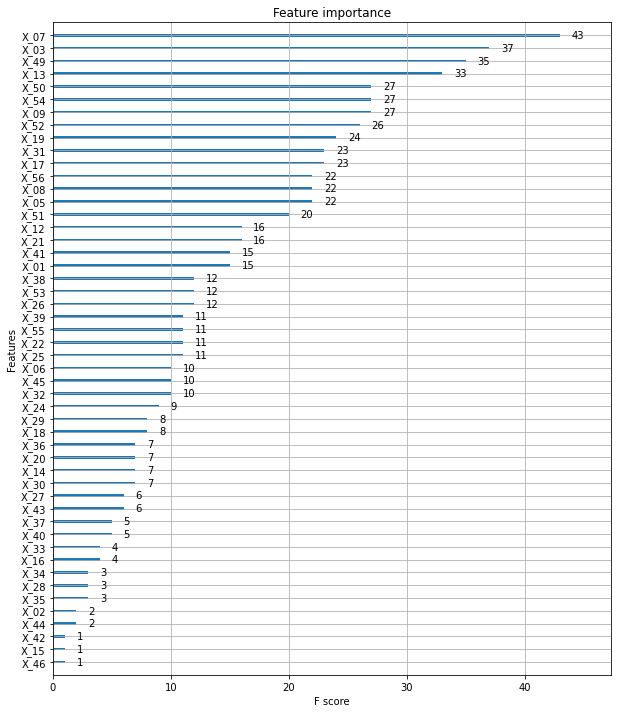

In [ ]:
fig,ax=plt.subplots(figsize=(10,12))
# fig,ax=plt.subplots(figsize=(10,12))#맨 처음 모델 적용
xgb.plot_importance(xgb_model,ax=ax)
#X_14에서 높은 양의 상관성을 가짐->하지만 x_14의 중요도는 7
#x_03,x_07,x_19에서 많이 나오는 편.
#x_19는 가장 높은 음의 상관계수를 띄는데 3위

In [ ]:
pred=xgb_model.predict(X_test)
rmse=np.sqrt(mean_squared_error(y_test,pred))
print("rmse: %f"%(rmse))

rmse: 0.409889


In [ ]:
yf8=pd.concat([train_x,train_y['Y_08']],axis=1)
yf8.head()
yf8.shape
yf8.drop(['X_04','X_48','X_23','X_47'],axis=1,inplace=True) #검사통과여부 제거

[06:47:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


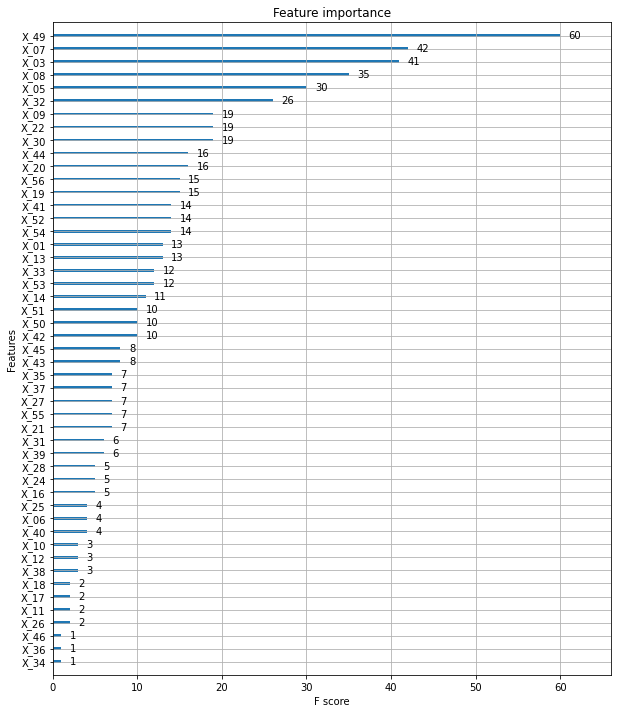

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(yf8[yf8.columns[:-1]], yf8['Y_08'] ,test_size=0.3)
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train,y_train)
fig,ax=plt.subplots(figsize=(10,12))
# fig,ax=plt.subplots(figsize=(10,12))#맨 처음 모델 적용
xgb.plot_importance(xgb_model,ax=ax)
#X_20에서 높은 상관성을 가짐->x_20에서는 중요도가 21
#x_49에서 가장 높은편.

In [ ]:
pred=xgb_model.predict(X_test)
rmse=np.sqrt(mean_squared_error(y_test,pred))
print("rmse: %f"%(rmse))

rmse: 0.634879


### nrmse 계산

In [ ]:
def lg_nrmse(gt, preds):
    # 각 Y Feature별 NRMSE 총합
    # Y_01 ~ Y_08 까지 20% 가중치 부여
    all_nrmse = []
    for idx in range(0,14): # ignore 'ID'
        rmse = mean_squared_error(gt[:,idx], preds[:,idx], squared=False)
        nrmse = rmse/np.mean(np.abs(gt[:,idx]))
        all_nrmse.append(nrmse)
    score = 1.2 * np.sum(all_nrmse[:8]) + 1.0 * np.sum(all_nrmse[8:15])
    return score

In [ ]:
train_x.drop(['X_04','X_48','X_23','X_47'],axis=1,inplace=True)
#검사통과여부 제외

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
train_x.shape

(39607, 49)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
LR = MultiOutputRegressor(xgb.XGBRegressor()).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)

[10:20:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[10:21:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
ytest=y_test.to_numpy()

In [ ]:
ytest[:,0]

array([0.679, 1.309, 1.111, ..., 1.357, 1.379, 1.964])

In [ ]:
type(preds)

numpy.ndarray

In [ ]:
# 각 Y Feature별 NRMSE 총합
# Y_01 ~ Y_08 까지 20% 가중치 부여
all_nrmse = []
for idx in range(0,14): # ignore 'ID'
    rmse = mean_squared_error(ytest[:,idx], preds[:,idx], squared=False)
    nrmse = rmse/np.mean(np.abs(ytest[:,idx]))
    all_nrmse.append(nrmse)
score = 1.2 * np.sum(all_nrmse[:8]) + 1.0 * np.sum(all_nrmse[8:15])

In [ ]:
print(score) #train_test_split 후 xgboost를 사용해 score 계산한 결과

1.963529409093087


- xgboost default값으로 할 경우 score:1.994
- 방열 재료 2~3 무게가 0에 수렴함 => 모델 설계시 제거 고민중.feature_importance 순위권에도 거의 없음. 상관관계에서도 양과 음의 상위권에도 없음.
- X_02도 한쪽으로 치우쳐져 있어서 제거 고민중
- 검사 통과 여부와 3개의 변수를 더 제거한 후 1.965
- 그 이후로 Bayesian 튜닝 후 1.9659654193784164 {'gamma': 5.4881350392732475, 'max_depth': 2, 'subsample': 0.801381688035822}

In [ ]:
train_x['X_11'].describe(include='all')

count    39607.000000
mean         0.000366
std          0.014145
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.700000
Name: X_11, dtype: float64

In [ ]:
train_x['X_10'].describe(include='all')

count    39607.000000
mean         0.002449
std          0.086255
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          3.600000
Name: X_10, dtype: float64

In [ ]:
#3개의 변수를 제거하고 모델 설계
train_x.drop(['X_10','X_11','X_02'],axis=1,inplace=True)

In [ ]:
train_x.shape

(39607, 46)

In [ ]:
train_x.columns

Index(['X_01', 'X_03', 'X_05', 'X_06', 'X_07', 'X_08', 'X_09', 'X_12', 'X_13',
       'X_14', 'X_15', 'X_16', 'X_17', 'X_18', 'X_19', 'X_20', 'X_21', 'X_22',
       'X_24', 'X_25', 'X_26', 'X_27', 'X_28', 'X_29', 'X_30', 'X_31', 'X_32',
       'X_33', 'X_38', 'X_39', 'X_40', 'X_41', 'X_42', 'X_43', 'X_44', 'X_45',
       'X_46', 'X_49', 'X_50', 'X_51', 'X_52', 'X_53', 'X_54', 'X_55', 'X_56',
       'screw_mean'],
      dtype='object')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)

LR = MultiOutputRegressor(xgb.XGBRegressor()).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)
print(score)

[11:20:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:20:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:20:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:20:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:20:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:20:59] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:21:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:21:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
pbounds = {'max_depth': (5, 10),
          'learning_rate': (0.01, 0.3),
          'n_estimators': (50, 1000),
          'gamma': (0.01,1),
          #'min_child_weight': (2, 10),
          #'max_delta_step': (0, 0.5),
          'subsample': (0.0, 0.5),
          'colsample_bytree' :(0.1, 0.5),
          # 'objective':'reg:squarederror'
          }

In [ ]:
#파라미터 조정? max_depth, max_leaves,bagging_freq,colsample_bytree이가 중요
def xgb_bo(gamma,max_depth,subsample,learning_rate,colsample_bytree,n_estimators):
    xgb_params = {
        'n_estimators':int(round(n_estimators)),
        'gamma' : int(round(gamma)),
        'max_depth' : int(round(max_depth)),
        'subsample' : int(round(subsample)),   
        #'max_leaves':int(round(max_leaves)),
        'colsample_bytree':float(round(colsample_bytree)),
        'learning_rate':float(round(learning_rate)),
        'objective':'reg:squarederror'
              }
    X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
    LR = MultiOutputRegressor(xgb.XGBRegressor(**xgb_params)).fit(X_train, y_train)
    print('Done.')
    preds = LR.predict(X_test)
    ytest=y_test.to_numpy()
    score=lg_nrmse(ytest, preds)
    return score

In [ ]:
BO_xgb = BayesianOptimization(f = xgb_bo, pbounds = pbounds,random_state =2022)
BO_xgb.maximize(init_points = 5, n_iter = 5)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | subsample |
-------------------------------------------------------------------------------------------------
Done.
|  1        |  14.19    |  0.1037   |  0.5041   |  0.04288  |  5.25     |  701.1    |  0.2435   |
Done.
|  2        |  14.18    |  0.4591   |  0.651    |  0.2701   |  8.606    |  839.8    |  0.4138   |
Done.
|  3        |  14.19    |  0.4334   |  0.9575   |  0.1167   |  7.474    |  372.5    |  0.3097   |
Done.
|  4        |  14.19    |  0.491    |  0.1055   |  0.2258   |  6.462    |  333.7    |  0.3762   |
Done.
|  5        |  14.2     |  0.1075   |  0.5285   |  0.2607   |  6.944    |  251.6    |  0.2376   |
Done.
|  6        |  14.18    |  0.4946   |  0.4035   |  0.1943   |  7.748    |  167.6    |  0.1066   |
Done.
|  7        |  14.19    |  0.4081   |  0.7593   |  0.1995   |  9.839    |  249.8    |  0.3213   |
Done.
|  8        |  14.19    |  0.1174   |  0.06523  |  0.09597  |  5.26   

In [ ]:
max_params = BO_xgb.max['params']
max_params['max_depth'] = int(max_params['max_depth'])
max_params['n_estimators'] = int(max_params['n_estimators'])
max_params['objective']='reg:squarederror'
print(max_params)

{'colsample_bytree': 0.10746549108203013, 'gamma': 0.5285000616250781, 'learning_rate': 0.260686395688107, 'max_depth': 6, 'n_estimators': 251, 'subsample': 0.2375903521304208, 'objective': 'reg:squarederror'}


In [ ]:
#bayesian 시도 결과
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
LR = MultiOutputRegressor(xgb.XGBRegressor(**max_params)).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)
print(score) 

Done.
2.176288330592343


## 모델 설계2) catBoost->optuna 활용

In [ ]:
a=np.array(list(np.linspace(1e-3, 1.0, num=150, endpoint=False
                ))+list(np.linspace(1.0, 1e+2, num=50, endpoint=True))
         ,dtype=float)

In [ ]:
b=np.array(list(np.linspace(1e-3, 1.0, num=150, endpoint=False))+list(np.linspace(1.0, 1e+2, num=50, endpoint=True)),dtype=float)

In [ ]:
max(b),min(b)

(100.0, 0.001)

In [ ]:
train_x.head()

,X_01,X_03,X_05,X_06,X_07,X_08,X_09,X_12,X_13,X_14,...,X_45,X_46,X_49,X_50,X_51,X_52,X_53,X_54,X_55,X_56
0,70.544,67.47,101.892,74.983,29.45,62.38,245.71,4.34,0.18,13.34,...,0.29,1463,9706.03,137.043591,135.359219,147.837968,134.313475,125.605427,136.721425,125.028256
1,69.524,65.17,101.944,72.943,28.73,61.23,233.61,4.38,0.18,13.33,...,0.13,1463,10423.43,133.736691,135.979817,149.924692,123.630583,127.893337,143.322659,124.877308
2,72.583,64.07,103.153,72.943,28.81,105.77,272.20,4.36,0.15,13.36,...,0.14,1468,10948.53,132.805112,131.055355,146.814592,128.939070,127.012195,140.395688,122.238232
3,71.563,67.57,101.971,77.022,28.92,115.21,255.36,4.33,0.21,13.30,...,0.22,1469,15007.03,134.138760,133.239422,139.720132,132.260824,130.723186,147.624829,134.875225
4,69.524,63.57,101.981,70.904,29.68,103.38,241.46,4.35,0.16,13.35,...,0.22,1469,11051.03,142.728970,136.620022,134.853555,134.760252,125.647793,139.331105,123.272762


In [ ]:
#optuna로 파라미터 조정->
def objective(trial):
    x_train, X_test, y_train, y_test = train_test_split(train_x,train_y, test_size=0.3)
    params={"max_depth": trial.suggest_int("max_depth",4,8),
    "bagging_temperature":trial.suggest_float("bagging_temperature",0,100),
    "learning_rate":5e-3,
    "bootstrap_type":"Bayesian",
    "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
    "random_strength": trial.suggest_float("random_strength",0.01,3.0),
    "reg_lambda":trial.suggest_float("reg_lambda",0,100),
    "min_child_samples": trial.suggest_int("min_child_samples",1, 51)}
    LR = MultiOutputRegressor(CatBoostRegressor(**params)).fit(x_train, y_train)
    preds = LR.predict(X_test)
    ytest=y_test.to_numpy()
    score=lg_nrmse(ytest, preds)
    return score

In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=5, timeout=1200)
#5번의 시도 결과 

[I 2022-08-08 14:29:19,437] A new study created in memory with name: no-name-7dccef3e-15c8-4e6e-bc26-deab8b8f9c76


0:	learn: 0.3550261	total: 11.9ms	remaining: 11.9s
1:	learn: 0.3550261	total: 20.6ms	remaining: 10.3s
2:	learn: 0.3550261	total: 28.7ms	remaining: 9.55s
3:	learn: 0.3550261	total: 36.8ms	remaining: 9.17s
4:	learn: 0.3550261	total: 44.9ms	remaining: 8.93s
5:	learn: 0.3550261	total: 53ms	remaining: 8.78s
6:	learn: 0.3550261	total: 60.7ms	remaining: 8.61s
7:	learn: 0.3550261	total: 68.9ms	remaining: 8.55s
8:	learn: 0.3550261	total: 77ms	remaining: 8.47s
9:	learn: 0.3550261	total: 85ms	remaining: 8.41s
10:	learn: 0.3550261	total: 92.9ms	remaining: 8.35s
11:	learn: 0.3550261	total: 101ms	remaining: 8.34s
12:	learn: 0.3550261	total: 110ms	remaining: 8.39s
13:	learn: 0.3550261	total: 121ms	remaining: 8.5s
14:	learn: 0.3550261	total: 129ms	remaining: 8.45s
15:	learn: 0.3550261	total: 138ms	remaining: 8.47s
16:	learn: 0.3550261	total: 148ms	remaining: 8.55s
17:	learn: 0.3550261	total: 160ms	remaining: 8.73s
18:	learn: 0.3550261	total: 170ms	remaining: 8.78s
19:	learn: 0.3550261	total: 180ms	rem

164:	learn: 0.3550261	total: 1.43s	remaining: 7.24s
165:	learn: 0.3550261	total: 1.44s	remaining: 7.25s
166:	learn: 0.3550261	total: 1.45s	remaining: 7.25s
167:	learn: 0.3550261	total: 1.46s	remaining: 7.24s
168:	learn: 0.3550261	total: 1.47s	remaining: 7.23s
169:	learn: 0.3550261	total: 1.48s	remaining: 7.22s
170:	learn: 0.3550261	total: 1.49s	remaining: 7.21s
171:	learn: 0.3550261	total: 1.5s	remaining: 7.2s
172:	learn: 0.3550261	total: 1.5s	remaining: 7.19s
173:	learn: 0.3550261	total: 1.51s	remaining: 7.18s
174:	learn: 0.3550261	total: 1.52s	remaining: 7.17s
175:	learn: 0.3550261	total: 1.53s	remaining: 7.18s
176:	learn: 0.3550261	total: 1.54s	remaining: 7.18s
177:	learn: 0.3550261	total: 1.55s	remaining: 7.18s
178:	learn: 0.3550261	total: 1.56s	remaining: 7.17s
179:	learn: 0.3550261	total: 1.57s	remaining: 7.16s
180:	learn: 0.3550261	total: 1.58s	remaining: 7.15s
181:	learn: 0.3550261	total: 1.59s	remaining: 7.14s
182:	learn: 0.3550261	total: 1.6s	remaining: 7.13s
183:	learn: 0.35

327:	learn: 0.3550261	total: 2.99s	remaining: 6.13s
328:	learn: 0.3550261	total: 3s	remaining: 6.12s
329:	learn: 0.3550261	total: 3.01s	remaining: 6.12s
330:	learn: 0.3550261	total: 3.02s	remaining: 6.11s
331:	learn: 0.3550261	total: 3.03s	remaining: 6.1s
332:	learn: 0.3550261	total: 3.04s	remaining: 6.09s
333:	learn: 0.3550261	total: 3.05s	remaining: 6.08s
334:	learn: 0.3550261	total: 3.05s	remaining: 6.06s
335:	learn: 0.3550261	total: 3.06s	remaining: 6.05s
336:	learn: 0.3550261	total: 3.07s	remaining: 6.04s
337:	learn: 0.3550261	total: 3.08s	remaining: 6.03s
338:	learn: 0.3550261	total: 3.09s	remaining: 6.02s
339:	learn: 0.3550261	total: 3.09s	remaining: 6.01s
340:	learn: 0.3550261	total: 3.1s	remaining: 5.99s
341:	learn: 0.3550261	total: 3.11s	remaining: 5.98s
342:	learn: 0.3550261	total: 3.12s	remaining: 5.97s
343:	learn: 0.3550261	total: 3.13s	remaining: 5.96s
344:	learn: 0.3550261	total: 3.13s	remaining: 5.95s
345:	learn: 0.3550261	total: 3.14s	remaining: 5.94s
346:	learn: 0.355

504:	learn: 0.3550261	total: 4.56s	remaining: 4.47s
505:	learn: 0.3550261	total: 4.57s	remaining: 4.46s
506:	learn: 0.3550261	total: 4.58s	remaining: 4.45s
507:	learn: 0.3550261	total: 4.59s	remaining: 4.44s
508:	learn: 0.3550261	total: 4.6s	remaining: 4.43s
509:	learn: 0.3550261	total: 4.6s	remaining: 4.42s
510:	learn: 0.3550261	total: 4.61s	remaining: 4.41s
511:	learn: 0.3550261	total: 4.62s	remaining: 4.4s
512:	learn: 0.3550261	total: 4.63s	remaining: 4.39s
513:	learn: 0.3550261	total: 4.64s	remaining: 4.38s
514:	learn: 0.3550261	total: 4.64s	remaining: 4.37s
515:	learn: 0.3550261	total: 4.65s	remaining: 4.36s
516:	learn: 0.3550261	total: 4.66s	remaining: 4.35s
517:	learn: 0.3550261	total: 4.67s	remaining: 4.35s
518:	learn: 0.3550261	total: 4.68s	remaining: 4.34s
519:	learn: 0.3550261	total: 4.69s	remaining: 4.33s
520:	learn: 0.3550261	total: 4.71s	remaining: 4.33s
521:	learn: 0.3550261	total: 4.71s	remaining: 4.32s
522:	learn: 0.3550261	total: 4.72s	remaining: 4.31s
523:	learn: 0.3

670:	learn: 0.3550261	total: 5.98s	remaining: 2.93s
671:	learn: 0.3550261	total: 5.99s	remaining: 2.92s
672:	learn: 0.3550261	total: 6s	remaining: 2.92s
673:	learn: 0.3550261	total: 6.01s	remaining: 2.91s
674:	learn: 0.3550261	total: 6.02s	remaining: 2.9s
675:	learn: 0.3550261	total: 6.02s	remaining: 2.89s
676:	learn: 0.3550261	total: 6.03s	remaining: 2.88s
677:	learn: 0.3550261	total: 6.04s	remaining: 2.87s
678:	learn: 0.3550261	total: 6.05s	remaining: 2.86s
679:	learn: 0.3550261	total: 6.06s	remaining: 2.85s
680:	learn: 0.3550261	total: 6.07s	remaining: 2.84s
681:	learn: 0.3550261	total: 6.07s	remaining: 2.83s
682:	learn: 0.3550261	total: 6.08s	remaining: 2.82s
683:	learn: 0.3550261	total: 6.09s	remaining: 2.81s
684:	learn: 0.3550261	total: 6.1s	remaining: 2.8s
685:	learn: 0.3550261	total: 6.11s	remaining: 2.79s
686:	learn: 0.3550261	total: 6.11s	remaining: 2.79s
687:	learn: 0.3550261	total: 6.12s	remaining: 2.78s
688:	learn: 0.3550261	total: 6.13s	remaining: 2.77s
689:	learn: 0.3550

842:	learn: 0.3550261	total: 7.4s	remaining: 1.38s
843:	learn: 0.3550261	total: 7.41s	remaining: 1.37s
844:	learn: 0.3550261	total: 7.41s	remaining: 1.36s
845:	learn: 0.3550261	total: 7.42s	remaining: 1.35s
846:	learn: 0.3550261	total: 7.43s	remaining: 1.34s
847:	learn: 0.3550261	total: 7.44s	remaining: 1.33s
848:	learn: 0.3550261	total: 7.45s	remaining: 1.32s
849:	learn: 0.3550261	total: 7.45s	remaining: 1.31s
850:	learn: 0.3550261	total: 7.46s	remaining: 1.31s
851:	learn: 0.3550261	total: 7.47s	remaining: 1.3s
852:	learn: 0.3550261	total: 7.48s	remaining: 1.29s
853:	learn: 0.3550261	total: 7.49s	remaining: 1.28s
854:	learn: 0.3550261	total: 7.5s	remaining: 1.27s
855:	learn: 0.3550261	total: 7.5s	remaining: 1.26s
856:	learn: 0.3550261	total: 7.51s	remaining: 1.25s
857:	learn: 0.3550261	total: 7.52s	remaining: 1.24s
858:	learn: 0.3550261	total: 7.53s	remaining: 1.24s
859:	learn: 0.3550261	total: 7.54s	remaining: 1.23s
860:	learn: 0.3550261	total: 7.54s	remaining: 1.22s
861:	learn: 0.35

2:	learn: 0.3857055	total: 28.9ms	remaining: 9.61s
3:	learn: 0.3857055	total: 38.4ms	remaining: 9.55s
4:	learn: 0.3857055	total: 46.6ms	remaining: 9.27s
5:	learn: 0.3857055	total: 54.6ms	remaining: 9.05s
6:	learn: 0.3857055	total: 62.6ms	remaining: 8.89s
7:	learn: 0.3857055	total: 70.6ms	remaining: 8.76s
8:	learn: 0.3857055	total: 84.6ms	remaining: 9.32s
9:	learn: 0.3857055	total: 94.3ms	remaining: 9.33s
10:	learn: 0.3857055	total: 105ms	remaining: 9.48s
11:	learn: 0.3857055	total: 115ms	remaining: 9.43s
12:	learn: 0.3857055	total: 123ms	remaining: 9.32s
13:	learn: 0.3857055	total: 132ms	remaining: 9.27s
14:	learn: 0.3857055	total: 140ms	remaining: 9.16s
15:	learn: 0.3857055	total: 147ms	remaining: 9.05s
16:	learn: 0.3857055	total: 155ms	remaining: 8.95s
17:	learn: 0.3857055	total: 163ms	remaining: 8.87s
18:	learn: 0.3857055	total: 170ms	remaining: 8.79s
19:	learn: 0.3857055	total: 178ms	remaining: 8.72s
20:	learn: 0.3857055	total: 186ms	remaining: 8.66s
21:	learn: 0.3857055	total: 193

170:	learn: 0.3857055	total: 1.45s	remaining: 7.01s
171:	learn: 0.3857055	total: 1.46s	remaining: 7.01s
172:	learn: 0.3857055	total: 1.47s	remaining: 7s
173:	learn: 0.3857055	total: 1.47s	remaining: 6.99s
174:	learn: 0.3857055	total: 1.48s	remaining: 6.98s
175:	learn: 0.3857055	total: 1.49s	remaining: 6.97s
176:	learn: 0.3857055	total: 1.5s	remaining: 6.96s
177:	learn: 0.3857055	total: 1.5s	remaining: 6.95s
178:	learn: 0.3857055	total: 1.51s	remaining: 6.94s
179:	learn: 0.3857055	total: 1.52s	remaining: 6.93s
180:	learn: 0.3857055	total: 1.53s	remaining: 6.92s
181:	learn: 0.3857055	total: 1.54s	remaining: 6.91s
182:	learn: 0.3857055	total: 1.54s	remaining: 6.9s
183:	learn: 0.3857055	total: 1.55s	remaining: 6.89s
184:	learn: 0.3857055	total: 1.56s	remaining: 6.88s
185:	learn: 0.3857055	total: 1.57s	remaining: 6.87s
186:	learn: 0.3857055	total: 1.58s	remaining: 6.86s
187:	learn: 0.3857055	total: 1.59s	remaining: 6.85s
188:	learn: 0.3857055	total: 1.6s	remaining: 6.85s
189:	learn: 0.38570

338:	learn: 0.3857055	total: 2.84s	remaining: 5.54s
339:	learn: 0.3857055	total: 2.85s	remaining: 5.54s
340:	learn: 0.3857055	total: 2.86s	remaining: 5.53s
341:	learn: 0.3857055	total: 2.87s	remaining: 5.52s
342:	learn: 0.3857055	total: 2.88s	remaining: 5.51s
343:	learn: 0.3857055	total: 2.88s	remaining: 5.5s
344:	learn: 0.3857055	total: 2.89s	remaining: 5.49s
345:	learn: 0.3857055	total: 2.9s	remaining: 5.48s
346:	learn: 0.3857055	total: 2.91s	remaining: 5.47s
347:	learn: 0.3857055	total: 2.92s	remaining: 5.47s
348:	learn: 0.3857055	total: 2.93s	remaining: 5.46s
349:	learn: 0.3857055	total: 2.93s	remaining: 5.45s
350:	learn: 0.3857055	total: 2.94s	remaining: 5.44s
351:	learn: 0.3857055	total: 2.95s	remaining: 5.43s
352:	learn: 0.3857055	total: 2.96s	remaining: 5.42s
353:	learn: 0.3857055	total: 2.96s	remaining: 5.41s
354:	learn: 0.3857055	total: 2.97s	remaining: 5.4s
355:	learn: 0.3857055	total: 2.98s	remaining: 5.39s
356:	learn: 0.3857055	total: 2.99s	remaining: 5.38s
357:	learn: 0.3

506:	learn: 0.3857055	total: 4.24s	remaining: 4.12s
507:	learn: 0.3857055	total: 4.25s	remaining: 4.11s
508:	learn: 0.3857055	total: 4.25s	remaining: 4.1s
509:	learn: 0.3857055	total: 4.26s	remaining: 4.09s
510:	learn: 0.3857055	total: 4.27s	remaining: 4.09s
511:	learn: 0.3857055	total: 4.28s	remaining: 4.08s
512:	learn: 0.3857055	total: 4.29s	remaining: 4.07s
513:	learn: 0.3857055	total: 4.29s	remaining: 4.06s
514:	learn: 0.3857055	total: 4.3s	remaining: 4.05s
515:	learn: 0.3857055	total: 4.31s	remaining: 4.04s
516:	learn: 0.3857055	total: 4.32s	remaining: 4.03s
517:	learn: 0.3857055	total: 4.33s	remaining: 4.03s
518:	learn: 0.3857055	total: 4.33s	remaining: 4.02s
519:	learn: 0.3857055	total: 4.34s	remaining: 4.01s
520:	learn: 0.3857055	total: 4.35s	remaining: 4s
521:	learn: 0.3857055	total: 4.36s	remaining: 3.99s
522:	learn: 0.3857055	total: 4.37s	remaining: 3.98s
523:	learn: 0.3857055	total: 4.37s	remaining: 3.97s
524:	learn: 0.3857055	total: 4.38s	remaining: 3.96s
525:	learn: 0.385

675:	learn: 0.3857055	total: 5.66s	remaining: 2.71s
676:	learn: 0.3857055	total: 5.68s	remaining: 2.71s
677:	learn: 0.3857055	total: 5.7s	remaining: 2.71s
678:	learn: 0.3857055	total: 5.71s	remaining: 2.7s
679:	learn: 0.3857055	total: 5.71s	remaining: 2.69s
680:	learn: 0.3857055	total: 5.72s	remaining: 2.68s
681:	learn: 0.3857055	total: 5.73s	remaining: 2.67s
682:	learn: 0.3857055	total: 5.74s	remaining: 2.66s
683:	learn: 0.3857055	total: 5.75s	remaining: 2.65s
684:	learn: 0.3857055	total: 5.75s	remaining: 2.65s
685:	learn: 0.3857055	total: 5.76s	remaining: 2.64s
686:	learn: 0.3857055	total: 5.77s	remaining: 2.63s
687:	learn: 0.3857055	total: 5.78s	remaining: 2.62s
688:	learn: 0.3857055	total: 5.79s	remaining: 2.61s
689:	learn: 0.3857055	total: 5.79s	remaining: 2.6s
690:	learn: 0.3857055	total: 5.8s	remaining: 2.59s
691:	learn: 0.3857055	total: 5.81s	remaining: 2.58s
692:	learn: 0.3857055	total: 5.82s	remaining: 2.58s
693:	learn: 0.3857055	total: 5.82s	remaining: 2.57s
694:	learn: 0.38

843:	learn: 0.3857055	total: 7.08s	remaining: 1.31s
844:	learn: 0.3857055	total: 7.08s	remaining: 1.3s
845:	learn: 0.3857055	total: 7.09s	remaining: 1.29s
846:	learn: 0.3857055	total: 7.1s	remaining: 1.28s
847:	learn: 0.3857055	total: 7.11s	remaining: 1.27s
848:	learn: 0.3857055	total: 7.12s	remaining: 1.26s
849:	learn: 0.3857055	total: 7.13s	remaining: 1.26s
850:	learn: 0.3857055	total: 7.13s	remaining: 1.25s
851:	learn: 0.3857055	total: 7.14s	remaining: 1.24s
852:	learn: 0.3857055	total: 7.15s	remaining: 1.23s
853:	learn: 0.3857055	total: 7.16s	remaining: 1.22s
854:	learn: 0.3857055	total: 7.16s	remaining: 1.21s
855:	learn: 0.3857055	total: 7.17s	remaining: 1.21s
856:	learn: 0.3857055	total: 7.18s	remaining: 1.2s
857:	learn: 0.3857055	total: 7.19s	remaining: 1.19s
858:	learn: 0.3857055	total: 7.2s	remaining: 1.18s
859:	learn: 0.3857055	total: 7.2s	remaining: 1.17s
860:	learn: 0.3857055	total: 7.21s	remaining: 1.16s
861:	learn: 0.3857055	total: 7.22s	remaining: 1.16s
862:	learn: 0.385

1:	learn: 0.3598208	total: 20.1ms	remaining: 10.1s
2:	learn: 0.3598208	total: 29.6ms	remaining: 9.84s
3:	learn: 0.3598208	total: 37.7ms	remaining: 9.39s
4:	learn: 0.3598208	total: 46.3ms	remaining: 9.22s
5:	learn: 0.3598208	total: 54.2ms	remaining: 8.98s
6:	learn: 0.3598208	total: 61.7ms	remaining: 8.75s
7:	learn: 0.3598208	total: 69.8ms	remaining: 8.65s
8:	learn: 0.3598208	total: 78ms	remaining: 8.59s
9:	learn: 0.3598208	total: 86ms	remaining: 8.51s
10:	learn: 0.3598208	total: 93.6ms	remaining: 8.42s
11:	learn: 0.3598208	total: 102ms	remaining: 8.36s
12:	learn: 0.3598208	total: 109ms	remaining: 8.29s
13:	learn: 0.3598208	total: 117ms	remaining: 8.25s
14:	learn: 0.3598208	total: 125ms	remaining: 8.21s
15:	learn: 0.3598208	total: 132ms	remaining: 8.14s
16:	learn: 0.3598208	total: 140ms	remaining: 8.1s
17:	learn: 0.3598208	total: 147ms	remaining: 8.04s
18:	learn: 0.3598208	total: 155ms	remaining: 7.99s
19:	learn: 0.3598208	total: 163ms	remaining: 7.97s
20:	learn: 0.3598208	total: 170ms	r

171:	learn: 0.3598208	total: 1.43s	remaining: 6.87s
172:	learn: 0.3598208	total: 1.44s	remaining: 6.87s
173:	learn: 0.3598208	total: 1.45s	remaining: 6.86s
174:	learn: 0.3598208	total: 1.45s	remaining: 6.85s
175:	learn: 0.3598208	total: 1.46s	remaining: 6.84s
176:	learn: 0.3598208	total: 1.47s	remaining: 6.83s
177:	learn: 0.3598208	total: 1.48s	remaining: 6.82s
178:	learn: 0.3598208	total: 1.49s	remaining: 6.82s
179:	learn: 0.3598208	total: 1.49s	remaining: 6.8s
180:	learn: 0.3598208	total: 1.5s	remaining: 6.79s
181:	learn: 0.3598208	total: 1.51s	remaining: 6.79s
182:	learn: 0.3598208	total: 1.52s	remaining: 6.78s
183:	learn: 0.3598208	total: 1.52s	remaining: 6.77s
184:	learn: 0.3598208	total: 1.53s	remaining: 6.76s
185:	learn: 0.3598208	total: 1.54s	remaining: 6.75s
186:	learn: 0.3598208	total: 1.55s	remaining: 6.74s
187:	learn: 0.3598208	total: 1.56s	remaining: 6.73s
188:	learn: 0.3598208	total: 1.57s	remaining: 6.72s
189:	learn: 0.3598208	total: 1.57s	remaining: 6.71s
190:	learn: 0.

337:	learn: 0.3598208	total: 2.81s	remaining: 5.51s
338:	learn: 0.3598208	total: 2.82s	remaining: 5.5s
339:	learn: 0.3598208	total: 2.83s	remaining: 5.5s
340:	learn: 0.3598208	total: 2.84s	remaining: 5.49s
341:	learn: 0.3598208	total: 2.85s	remaining: 5.48s
342:	learn: 0.3598208	total: 2.85s	remaining: 5.47s
343:	learn: 0.3598208	total: 2.86s	remaining: 5.46s
344:	learn: 0.3598208	total: 2.87s	remaining: 5.45s
345:	learn: 0.3598208	total: 2.88s	remaining: 5.44s
346:	learn: 0.3598208	total: 2.89s	remaining: 5.43s
347:	learn: 0.3598208	total: 2.9s	remaining: 5.42s
348:	learn: 0.3598208	total: 2.9s	remaining: 5.42s
349:	learn: 0.3598208	total: 2.91s	remaining: 5.41s
350:	learn: 0.3598208	total: 2.92s	remaining: 5.4s
351:	learn: 0.3598208	total: 2.93s	remaining: 5.39s
352:	learn: 0.3598208	total: 2.94s	remaining: 5.38s
353:	learn: 0.3598208	total: 2.94s	remaining: 5.37s
354:	learn: 0.3598208	total: 2.95s	remaining: 5.36s
355:	learn: 0.3598208	total: 2.96s	remaining: 5.35s
356:	learn: 0.359

504:	learn: 0.3598208	total: 4.24s	remaining: 4.15s
505:	learn: 0.3598208	total: 4.25s	remaining: 4.14s
506:	learn: 0.3598208	total: 4.25s	remaining: 4.13s
507:	learn: 0.3598208	total: 4.26s	remaining: 4.13s
508:	learn: 0.3598208	total: 4.27s	remaining: 4.12s
509:	learn: 0.3598208	total: 4.28s	remaining: 4.11s
510:	learn: 0.3598208	total: 4.29s	remaining: 4.1s
511:	learn: 0.3598208	total: 4.29s	remaining: 4.09s
512:	learn: 0.3598208	total: 4.3s	remaining: 4.08s
513:	learn: 0.3598208	total: 4.31s	remaining: 4.07s
514:	learn: 0.3598208	total: 4.32s	remaining: 4.07s
515:	learn: 0.3598208	total: 4.33s	remaining: 4.06s
516:	learn: 0.3598208	total: 4.33s	remaining: 4.05s
517:	learn: 0.3598208	total: 4.34s	remaining: 4.04s
518:	learn: 0.3598208	total: 4.35s	remaining: 4.03s
519:	learn: 0.3598208	total: 4.36s	remaining: 4.02s
520:	learn: 0.3598208	total: 4.37s	remaining: 4.01s
521:	learn: 0.3598208	total: 4.37s	remaining: 4s
522:	learn: 0.3598208	total: 4.38s	remaining: 4s
523:	learn: 0.359820

674:	learn: 0.3598208	total: 5.66s	remaining: 2.72s
675:	learn: 0.3598208	total: 5.67s	remaining: 2.71s
676:	learn: 0.3598208	total: 5.67s	remaining: 2.71s
677:	learn: 0.3598208	total: 5.68s	remaining: 2.7s
678:	learn: 0.3598208	total: 5.69s	remaining: 2.69s
679:	learn: 0.3598208	total: 5.7s	remaining: 2.68s
680:	learn: 0.3598208	total: 5.71s	remaining: 2.67s
681:	learn: 0.3598208	total: 5.71s	remaining: 2.66s
682:	learn: 0.3598208	total: 5.72s	remaining: 2.66s
683:	learn: 0.3598208	total: 5.73s	remaining: 2.65s
684:	learn: 0.3598208	total: 5.74s	remaining: 2.64s
685:	learn: 0.3598208	total: 5.75s	remaining: 2.63s
686:	learn: 0.3598208	total: 5.75s	remaining: 2.62s
687:	learn: 0.3598208	total: 5.76s	remaining: 2.61s
688:	learn: 0.3598208	total: 5.77s	remaining: 2.6s
689:	learn: 0.3598208	total: 5.78s	remaining: 2.6s
690:	learn: 0.3598208	total: 5.79s	remaining: 2.59s
691:	learn: 0.3598208	total: 5.79s	remaining: 2.58s
692:	learn: 0.3598208	total: 5.8s	remaining: 2.57s
693:	learn: 0.359

840:	learn: 0.3598208	total: 7.05s	remaining: 1.33s
841:	learn: 0.3598208	total: 7.05s	remaining: 1.32s
842:	learn: 0.3598208	total: 7.06s	remaining: 1.31s
843:	learn: 0.3598208	total: 7.07s	remaining: 1.31s
844:	learn: 0.3598208	total: 7.08s	remaining: 1.3s
845:	learn: 0.3598208	total: 7.09s	remaining: 1.29s
846:	learn: 0.3598208	total: 7.1s	remaining: 1.28s
847:	learn: 0.3598208	total: 7.1s	remaining: 1.27s
848:	learn: 0.3598208	total: 7.11s	remaining: 1.26s
849:	learn: 0.3598208	total: 7.12s	remaining: 1.26s
850:	learn: 0.3598208	total: 7.13s	remaining: 1.25s
851:	learn: 0.3598208	total: 7.14s	remaining: 1.24s
852:	learn: 0.3598208	total: 7.14s	remaining: 1.23s
853:	learn: 0.3598208	total: 7.15s	remaining: 1.22s
854:	learn: 0.3598208	total: 7.16s	remaining: 1.21s
855:	learn: 0.3598208	total: 7.17s	remaining: 1.21s
856:	learn: 0.3598208	total: 7.18s	remaining: 1.2s
857:	learn: 0.3598208	total: 7.19s	remaining: 1.19s
858:	learn: 0.3598208	total: 7.2s	remaining: 1.18s
859:	learn: 0.359

2:	learn: 2.6980204	total: 32.3ms	remaining: 10.7s
3:	learn: 2.6980204	total: 44.4ms	remaining: 11s
4:	learn: 2.6980204	total: 52.4ms	remaining: 10.4s
5:	learn: 2.6980204	total: 61.2ms	remaining: 10.1s
6:	learn: 2.6980204	total: 69.4ms	remaining: 9.85s
7:	learn: 2.6980204	total: 77.5ms	remaining: 9.61s
8:	learn: 2.6980204	total: 85.4ms	remaining: 9.4s
9:	learn: 2.6980204	total: 93.8ms	remaining: 9.28s
10:	learn: 2.6980204	total: 102ms	remaining: 9.13s
11:	learn: 2.6980204	total: 110ms	remaining: 9.02s
12:	learn: 2.6980204	total: 118ms	remaining: 8.93s
13:	learn: 2.6980204	total: 125ms	remaining: 8.82s
14:	learn: 2.6980204	total: 133ms	remaining: 8.76s
15:	learn: 2.6980204	total: 141ms	remaining: 8.67s
16:	learn: 2.6980204	total: 149ms	remaining: 8.61s
17:	learn: 2.6980204	total: 157ms	remaining: 8.54s
18:	learn: 2.6980204	total: 165ms	remaining: 8.49s
19:	learn: 2.6980204	total: 172ms	remaining: 8.45s
20:	learn: 2.6980204	total: 180ms	remaining: 8.39s
21:	learn: 2.6980204	total: 188ms	

173:	learn: 2.6980204	total: 1.45s	remaining: 6.91s
174:	learn: 2.6980204	total: 1.46s	remaining: 6.9s
175:	learn: 2.6980204	total: 1.47s	remaining: 6.89s
176:	learn: 2.6980204	total: 1.48s	remaining: 6.88s
177:	learn: 2.6980204	total: 1.49s	remaining: 6.88s
178:	learn: 2.6980204	total: 1.5s	remaining: 6.86s
179:	learn: 2.6980204	total: 1.5s	remaining: 6.85s
180:	learn: 2.6980204	total: 1.51s	remaining: 6.84s
181:	learn: 2.6980204	total: 1.52s	remaining: 6.84s
182:	learn: 2.6980204	total: 1.53s	remaining: 6.83s
183:	learn: 2.6980204	total: 1.54s	remaining: 6.82s
184:	learn: 2.6980204	total: 1.54s	remaining: 6.81s
185:	learn: 2.6980204	total: 1.55s	remaining: 6.8s
186:	learn: 2.6980204	total: 1.56s	remaining: 6.79s
187:	learn: 2.6980204	total: 1.57s	remaining: 6.78s
188:	learn: 2.6980204	total: 1.58s	remaining: 6.77s
189:	learn: 2.6980204	total: 1.58s	remaining: 6.76s
190:	learn: 2.6980204	total: 1.59s	remaining: 6.75s
191:	learn: 2.6980204	total: 1.6s	remaining: 6.74s
192:	learn: 2.698

336:	learn: 2.6980204	total: 2.86s	remaining: 5.62s
337:	learn: 2.6980204	total: 2.87s	remaining: 5.61s
338:	learn: 2.6980204	total: 2.87s	remaining: 5.6s
339:	learn: 2.6980204	total: 2.88s	remaining: 5.59s
340:	learn: 2.6980204	total: 2.89s	remaining: 5.58s
341:	learn: 2.6980204	total: 2.9s	remaining: 5.58s
342:	learn: 2.6980204	total: 2.91s	remaining: 5.57s
343:	learn: 2.6980204	total: 2.91s	remaining: 5.56s
344:	learn: 2.6980204	total: 2.92s	remaining: 5.55s
345:	learn: 2.6980204	total: 2.93s	remaining: 5.54s
346:	learn: 2.6980204	total: 2.94s	remaining: 5.54s
347:	learn: 2.6980204	total: 2.95s	remaining: 5.53s
348:	learn: 2.6980204	total: 2.96s	remaining: 5.52s
349:	learn: 2.6980204	total: 2.96s	remaining: 5.51s
350:	learn: 2.6980204	total: 2.97s	remaining: 5.5s
351:	learn: 2.6980204	total: 2.98s	remaining: 5.49s
352:	learn: 2.6980204	total: 2.99s	remaining: 5.48s
353:	learn: 2.6980204	total: 3s	remaining: 5.47s
354:	learn: 2.6980204	total: 3.01s	remaining: 5.46s
355:	learn: 2.6980

505:	learn: 2.6980204	total: 4.28s	remaining: 4.18s
506:	learn: 2.6980204	total: 4.29s	remaining: 4.17s
507:	learn: 2.6980204	total: 4.3s	remaining: 4.16s
508:	learn: 2.6980204	total: 4.3s	remaining: 4.15s
509:	learn: 2.6980204	total: 4.31s	remaining: 4.14s
510:	learn: 2.6980204	total: 4.32s	remaining: 4.13s
511:	learn: 2.6980204	total: 4.33s	remaining: 4.13s
512:	learn: 2.6980204	total: 4.34s	remaining: 4.12s
513:	learn: 2.6980204	total: 4.34s	remaining: 4.11s
514:	learn: 2.6980204	total: 4.35s	remaining: 4.1s
515:	learn: 2.6980204	total: 4.36s	remaining: 4.09s
516:	learn: 2.6980204	total: 4.37s	remaining: 4.08s
517:	learn: 2.6980204	total: 4.38s	remaining: 4.07s
518:	learn: 2.6980204	total: 4.38s	remaining: 4.06s
519:	learn: 2.6980204	total: 4.39s	remaining: 4.05s
520:	learn: 2.6980204	total: 4.4s	remaining: 4.05s
521:	learn: 2.6980204	total: 4.41s	remaining: 4.04s
522:	learn: 2.6980204	total: 4.42s	remaining: 4.03s
523:	learn: 2.6980204	total: 4.42s	remaining: 4.02s
524:	learn: 2.69

675:	learn: 2.6980204	total: 5.7s	remaining: 2.73s
676:	learn: 2.6980204	total: 5.71s	remaining: 2.72s
677:	learn: 2.6980204	total: 5.71s	remaining: 2.71s
678:	learn: 2.6980204	total: 5.72s	remaining: 2.71s
679:	learn: 2.6980204	total: 5.73s	remaining: 2.7s
680:	learn: 2.6980204	total: 5.74s	remaining: 2.69s
681:	learn: 2.6980204	total: 5.75s	remaining: 2.68s
682:	learn: 2.6980204	total: 5.76s	remaining: 2.67s
683:	learn: 2.6980204	total: 5.76s	remaining: 2.66s
684:	learn: 2.6980204	total: 5.77s	remaining: 2.65s
685:	learn: 2.6980204	total: 5.78s	remaining: 2.65s
686:	learn: 2.6980204	total: 5.79s	remaining: 2.64s
687:	learn: 2.6980204	total: 5.8s	remaining: 2.63s
688:	learn: 2.6980204	total: 5.8s	remaining: 2.62s
689:	learn: 2.6980204	total: 5.81s	remaining: 2.61s
690:	learn: 2.6980204	total: 5.82s	remaining: 2.6s
691:	learn: 2.6980204	total: 5.83s	remaining: 2.6s
692:	learn: 2.6980204	total: 5.84s	remaining: 2.59s
693:	learn: 2.6980204	total: 5.85s	remaining: 2.58s
694:	learn: 2.6980

846:	learn: 2.6980204	total: 7.11s	remaining: 1.28s
847:	learn: 2.6980204	total: 7.12s	remaining: 1.28s
848:	learn: 2.6980204	total: 7.13s	remaining: 1.27s
849:	learn: 2.6980204	total: 7.13s	remaining: 1.26s
850:	learn: 2.6980204	total: 7.14s	remaining: 1.25s
851:	learn: 2.6980204	total: 7.15s	remaining: 1.24s
852:	learn: 2.6980204	total: 7.16s	remaining: 1.23s
853:	learn: 2.6980204	total: 7.17s	remaining: 1.23s
854:	learn: 2.6980204	total: 7.17s	remaining: 1.22s
855:	learn: 2.6980204	total: 7.18s	remaining: 1.21s
856:	learn: 2.6980204	total: 7.19s	remaining: 1.2s
857:	learn: 2.6980204	total: 7.2s	remaining: 1.19s
858:	learn: 2.6980204	total: 7.21s	remaining: 1.18s
859:	learn: 2.6980204	total: 7.21s	remaining: 1.17s
860:	learn: 2.6980204	total: 7.22s	remaining: 1.17s
861:	learn: 2.6980204	total: 7.23s	remaining: 1.16s
862:	learn: 2.6980204	total: 7.24s	remaining: 1.15s
863:	learn: 2.6980204	total: 7.25s	remaining: 1.14s
864:	learn: 2.6980204	total: 7.25s	remaining: 1.13s
865:	learn: 2.

21:	learn: 2.5353773	total: 192ms	remaining: 8.55s
22:	learn: 2.5353773	total: 204ms	remaining: 8.68s
23:	learn: 2.5353773	total: 213ms	remaining: 8.67s
24:	learn: 2.5353773	total: 221ms	remaining: 8.63s
25:	learn: 2.5353773	total: 230ms	remaining: 8.62s
26:	learn: 2.5353773	total: 238ms	remaining: 8.58s
27:	learn: 2.5353773	total: 246ms	remaining: 8.54s
28:	learn: 2.5353773	total: 254ms	remaining: 8.5s
29:	learn: 2.5353773	total: 262ms	remaining: 8.46s
30:	learn: 2.5353773	total: 270ms	remaining: 8.43s
31:	learn: 2.5353773	total: 277ms	remaining: 8.39s
32:	learn: 2.5353773	total: 286ms	remaining: 8.37s
33:	learn: 2.5353773	total: 294ms	remaining: 8.36s
34:	learn: 2.5353773	total: 302ms	remaining: 8.33s
35:	learn: 2.5353773	total: 310ms	remaining: 8.31s
36:	learn: 2.5353773	total: 318ms	remaining: 8.28s
37:	learn: 2.5353773	total: 326ms	remaining: 8.26s
38:	learn: 2.5353773	total: 334ms	remaining: 8.23s
39:	learn: 2.5353773	total: 342ms	remaining: 8.2s
40:	learn: 2.5353773	total: 350ms

190:	learn: 2.5353773	total: 1.61s	remaining: 6.82s
191:	learn: 2.5353773	total: 1.62s	remaining: 6.83s
192:	learn: 2.5353773	total: 1.63s	remaining: 6.83s
193:	learn: 2.5353773	total: 1.64s	remaining: 6.82s
194:	learn: 2.5353773	total: 1.65s	remaining: 6.82s
195:	learn: 2.5353773	total: 1.66s	remaining: 6.81s
196:	learn: 2.5353773	total: 1.67s	remaining: 6.8s
197:	learn: 2.5353773	total: 1.68s	remaining: 6.8s
198:	learn: 2.5353773	total: 1.69s	remaining: 6.79s
199:	learn: 2.5353773	total: 1.7s	remaining: 6.79s
200:	learn: 2.5353773	total: 1.71s	remaining: 6.78s
201:	learn: 2.5353773	total: 1.71s	remaining: 6.77s
202:	learn: 2.5353773	total: 1.72s	remaining: 6.76s
203:	learn: 2.5353773	total: 1.73s	remaining: 6.75s
204:	learn: 2.5353773	total: 1.74s	remaining: 6.74s
205:	learn: 2.5353773	total: 1.75s	remaining: 6.73s
206:	learn: 2.5353773	total: 1.75s	remaining: 6.72s
207:	learn: 2.5353773	total: 1.76s	remaining: 6.71s
208:	learn: 2.5353773	total: 1.77s	remaining: 6.7s
209:	learn: 2.53

358:	learn: 2.5353773	total: 3.03s	remaining: 5.41s
359:	learn: 2.5353773	total: 3.04s	remaining: 5.4s
360:	learn: 2.5353773	total: 3.05s	remaining: 5.39s
361:	learn: 2.5353773	total: 3.05s	remaining: 5.38s
362:	learn: 2.5353773	total: 3.06s	remaining: 5.37s
363:	learn: 2.5353773	total: 3.07s	remaining: 5.37s
364:	learn: 2.5353773	total: 3.08s	remaining: 5.36s
365:	learn: 2.5353773	total: 3.09s	remaining: 5.35s
366:	learn: 2.5353773	total: 3.09s	remaining: 5.34s
367:	learn: 2.5353773	total: 3.1s	remaining: 5.33s
368:	learn: 2.5353773	total: 3.11s	remaining: 5.32s
369:	learn: 2.5353773	total: 3.12s	remaining: 5.31s
370:	learn: 2.5353773	total: 3.13s	remaining: 5.3s
371:	learn: 2.5353773	total: 3.14s	remaining: 5.3s
372:	learn: 2.5353773	total: 3.15s	remaining: 5.29s
373:	learn: 2.5353773	total: 3.15s	remaining: 5.28s
374:	learn: 2.5353773	total: 3.16s	remaining: 5.27s
375:	learn: 2.5353773	total: 3.17s	remaining: 5.26s
376:	learn: 2.5353773	total: 3.18s	remaining: 5.25s
377:	learn: 2.53

526:	learn: 2.5353773	total: 4.43s	remaining: 3.98s
527:	learn: 2.5353773	total: 4.44s	remaining: 3.97s
528:	learn: 2.5353773	total: 4.45s	remaining: 3.96s
529:	learn: 2.5353773	total: 4.46s	remaining: 3.95s
530:	learn: 2.5353773	total: 4.46s	remaining: 3.94s
531:	learn: 2.5353773	total: 4.47s	remaining: 3.94s
532:	learn: 2.5353773	total: 4.48s	remaining: 3.93s
533:	learn: 2.5353773	total: 4.49s	remaining: 3.92s
534:	learn: 2.5353773	total: 4.5s	remaining: 3.91s
535:	learn: 2.5353773	total: 4.5s	remaining: 3.9s
536:	learn: 2.5353773	total: 4.51s	remaining: 3.89s
537:	learn: 2.5353773	total: 4.52s	remaining: 3.88s
538:	learn: 2.5353773	total: 4.53s	remaining: 3.87s
539:	learn: 2.5353773	total: 4.54s	remaining: 3.87s
540:	learn: 2.5353773	total: 4.55s	remaining: 3.86s
541:	learn: 2.5353773	total: 4.55s	remaining: 3.85s
542:	learn: 2.5353773	total: 4.56s	remaining: 3.84s
543:	learn: 2.5353773	total: 4.57s	remaining: 3.83s
544:	learn: 2.5353773	total: 4.58s	remaining: 3.82s
545:	learn: 2.5

695:	learn: 2.5353773	total: 5.85s	remaining: 2.56s
696:	learn: 2.5353773	total: 5.86s	remaining: 2.55s
697:	learn: 2.5353773	total: 5.87s	remaining: 2.54s
698:	learn: 2.5353773	total: 5.88s	remaining: 2.53s
699:	learn: 2.5353773	total: 5.88s	remaining: 2.52s
700:	learn: 2.5353773	total: 5.89s	remaining: 2.51s
701:	learn: 2.5353773	total: 5.9s	remaining: 2.5s
702:	learn: 2.5353773	total: 5.91s	remaining: 2.5s
703:	learn: 2.5353773	total: 5.92s	remaining: 2.49s
704:	learn: 2.5353773	total: 5.93s	remaining: 2.48s
705:	learn: 2.5353773	total: 5.93s	remaining: 2.47s
706:	learn: 2.5353773	total: 5.94s	remaining: 2.46s
707:	learn: 2.5353773	total: 5.95s	remaining: 2.45s
708:	learn: 2.5353773	total: 5.96s	remaining: 2.45s
709:	learn: 2.5353773	total: 5.97s	remaining: 2.44s
710:	learn: 2.5353773	total: 5.98s	remaining: 2.43s
711:	learn: 2.5353773	total: 5.98s	remaining: 2.42s
712:	learn: 2.5353773	total: 5.99s	remaining: 2.41s
713:	learn: 2.5353773	total: 6s	remaining: 2.4s
714:	learn: 2.53537

866:	learn: 2.5353773	total: 7.27s	remaining: 1.11s
867:	learn: 2.5353773	total: 7.28s	remaining: 1.11s
868:	learn: 2.5353773	total: 7.29s	remaining: 1.1s
869:	learn: 2.5353773	total: 7.29s	remaining: 1.09s
870:	learn: 2.5353773	total: 7.3s	remaining: 1.08s
871:	learn: 2.5353773	total: 7.31s	remaining: 1.07s
872:	learn: 2.5353773	total: 7.32s	remaining: 1.06s
873:	learn: 2.5353773	total: 7.33s	remaining: 1.06s
874:	learn: 2.5353773	total: 7.34s	remaining: 1.05s
875:	learn: 2.5353773	total: 7.34s	remaining: 1.04s
876:	learn: 2.5353773	total: 7.35s	remaining: 1.03s
877:	learn: 2.5353773	total: 7.36s	remaining: 1.02s
878:	learn: 2.5353773	total: 7.37s	remaining: 1.01s
879:	learn: 2.5353773	total: 7.38s	remaining: 1s
880:	learn: 2.5353773	total: 7.38s	remaining: 998ms
881:	learn: 2.5353773	total: 7.39s	remaining: 989ms
882:	learn: 2.5353773	total: 7.4s	remaining: 981ms
883:	learn: 2.5353773	total: 7.41s	remaining: 972ms
884:	learn: 2.5353773	total: 7.42s	remaining: 964ms
885:	learn: 2.5353

41:	learn: 1.9212864	total: 376ms	remaining: 8.58s
42:	learn: 1.9212864	total: 387ms	remaining: 8.62s
43:	learn: 1.9212864	total: 396ms	remaining: 8.61s
44:	learn: 1.9212864	total: 405ms	remaining: 8.59s
45:	learn: 1.9212864	total: 413ms	remaining: 8.57s
46:	learn: 1.9212864	total: 421ms	remaining: 8.54s
47:	learn: 1.9212864	total: 429ms	remaining: 8.51s
48:	learn: 1.9212864	total: 437ms	remaining: 8.48s
49:	learn: 1.9212864	total: 445ms	remaining: 8.46s
50:	learn: 1.9212864	total: 453ms	remaining: 8.43s
51:	learn: 1.9212864	total: 461ms	remaining: 8.41s
52:	learn: 1.9212864	total: 469ms	remaining: 8.38s
53:	learn: 1.9212864	total: 477ms	remaining: 8.35s
54:	learn: 1.9212864	total: 485ms	remaining: 8.33s
55:	learn: 1.9212864	total: 493ms	remaining: 8.3s
56:	learn: 1.9212864	total: 500ms	remaining: 8.28s
57:	learn: 1.9212864	total: 508ms	remaining: 8.25s
58:	learn: 1.9212864	total: 516ms	remaining: 8.23s
59:	learn: 1.9212864	total: 526ms	remaining: 8.24s
60:	learn: 1.9212864	total: 535m

203:	learn: 1.9212864	total: 1.76s	remaining: 6.86s
204:	learn: 1.9212864	total: 1.77s	remaining: 6.86s
205:	learn: 1.9212864	total: 1.78s	remaining: 6.85s
206:	learn: 1.9212864	total: 1.78s	remaining: 6.83s
207:	learn: 1.9212864	total: 1.79s	remaining: 6.83s
208:	learn: 1.9212864	total: 1.8s	remaining: 6.81s
209:	learn: 1.9212864	total: 1.81s	remaining: 6.8s
210:	learn: 1.9212864	total: 1.82s	remaining: 6.79s
211:	learn: 1.9212864	total: 1.82s	remaining: 6.78s
212:	learn: 1.9212864	total: 1.83s	remaining: 6.77s
213:	learn: 1.9212864	total: 1.84s	remaining: 6.76s
214:	learn: 1.9212864	total: 1.85s	remaining: 6.75s
215:	learn: 1.9212864	total: 1.86s	remaining: 6.74s
216:	learn: 1.9212864	total: 1.86s	remaining: 6.73s
217:	learn: 1.9212864	total: 1.87s	remaining: 6.72s
218:	learn: 1.9212864	total: 1.88s	remaining: 6.71s
219:	learn: 1.9212864	total: 1.89s	remaining: 6.7s
220:	learn: 1.9212864	total: 1.9s	remaining: 6.69s
221:	learn: 1.9212864	total: 1.9s	remaining: 6.67s
222:	learn: 1.921

370:	learn: 1.9212864	total: 3.15s	remaining: 5.34s
371:	learn: 1.9212864	total: 3.16s	remaining: 5.34s
372:	learn: 1.9212864	total: 3.17s	remaining: 5.33s
373:	learn: 1.9212864	total: 3.18s	remaining: 5.33s
374:	learn: 1.9212864	total: 3.19s	remaining: 5.32s
375:	learn: 1.9212864	total: 3.2s	remaining: 5.31s
376:	learn: 1.9212864	total: 3.21s	remaining: 5.3s
377:	learn: 1.9212864	total: 3.22s	remaining: 5.29s
378:	learn: 1.9212864	total: 3.23s	remaining: 5.29s
379:	learn: 1.9212864	total: 3.23s	remaining: 5.28s
380:	learn: 1.9212864	total: 3.24s	remaining: 5.27s
381:	learn: 1.9212864	total: 3.25s	remaining: 5.26s
382:	learn: 1.9212864	total: 3.26s	remaining: 5.25s
383:	learn: 1.9212864	total: 3.27s	remaining: 5.24s
384:	learn: 1.9212864	total: 3.27s	remaining: 5.23s
385:	learn: 1.9212864	total: 3.28s	remaining: 5.22s
386:	learn: 1.9212864	total: 3.29s	remaining: 5.21s
387:	learn: 1.9212864	total: 3.3s	remaining: 5.2s
388:	learn: 1.9212864	total: 3.31s	remaining: 5.2s
389:	learn: 1.921

539:	learn: 1.9212864	total: 4.56s	remaining: 3.89s
540:	learn: 1.9212864	total: 4.57s	remaining: 3.88s
541:	learn: 1.9212864	total: 4.58s	remaining: 3.87s
542:	learn: 1.9212864	total: 4.59s	remaining: 3.86s
543:	learn: 1.9212864	total: 4.6s	remaining: 3.85s
544:	learn: 1.9212864	total: 4.6s	remaining: 3.84s
545:	learn: 1.9212864	total: 4.61s	remaining: 3.83s
546:	learn: 1.9212864	total: 4.62s	remaining: 3.83s
547:	learn: 1.9212864	total: 4.63s	remaining: 3.82s
548:	learn: 1.9212864	total: 4.64s	remaining: 3.81s
549:	learn: 1.9212864	total: 4.64s	remaining: 3.8s
550:	learn: 1.9212864	total: 4.65s	remaining: 3.79s
551:	learn: 1.9212864	total: 4.66s	remaining: 3.78s
552:	learn: 1.9212864	total: 4.67s	remaining: 3.77s
553:	learn: 1.9212864	total: 4.68s	remaining: 3.77s
554:	learn: 1.9212864	total: 4.68s	remaining: 3.76s
555:	learn: 1.9212864	total: 4.69s	remaining: 3.75s
556:	learn: 1.9212864	total: 4.7s	remaining: 3.74s
557:	learn: 1.9212864	total: 4.71s	remaining: 3.73s
558:	learn: 1.92

710:	learn: 1.9212864	total: 5.98s	remaining: 2.43s
711:	learn: 1.9212864	total: 5.99s	remaining: 2.42s
712:	learn: 1.9212864	total: 6s	remaining: 2.41s
713:	learn: 1.9212864	total: 6s	remaining: 2.4s
714:	learn: 1.9212864	total: 6.01s	remaining: 2.4s
715:	learn: 1.9212864	total: 6.02s	remaining: 2.39s
716:	learn: 1.9212864	total: 6.03s	remaining: 2.38s
717:	learn: 1.9212864	total: 6.04s	remaining: 2.37s
718:	learn: 1.9212864	total: 6.04s	remaining: 2.36s
719:	learn: 1.9212864	total: 6.05s	remaining: 2.35s
720:	learn: 1.9212864	total: 6.06s	remaining: 2.35s
721:	learn: 1.9212864	total: 6.07s	remaining: 2.34s
722:	learn: 1.9212864	total: 6.08s	remaining: 2.33s
723:	learn: 1.9212864	total: 6.09s	remaining: 2.32s
724:	learn: 1.9212864	total: 6.1s	remaining: 2.31s
725:	learn: 1.9212864	total: 6.11s	remaining: 2.31s
726:	learn: 1.9212864	total: 6.12s	remaining: 2.3s
727:	learn: 1.9212864	total: 6.13s	remaining: 2.29s
728:	learn: 1.9212864	total: 6.14s	remaining: 2.28s
729:	learn: 1.9212864	

878:	learn: 1.9212864	total: 7.38s	remaining: 1.02s
879:	learn: 1.9212864	total: 7.39s	remaining: 1.01s
880:	learn: 1.9212864	total: 7.4s	remaining: 1000ms
881:	learn: 1.9212864	total: 7.41s	remaining: 992ms
882:	learn: 1.9212864	total: 7.42s	remaining: 983ms
883:	learn: 1.9212864	total: 7.43s	remaining: 975ms
884:	learn: 1.9212864	total: 7.43s	remaining: 966ms
885:	learn: 1.9212864	total: 7.44s	remaining: 958ms
886:	learn: 1.9212864	total: 7.45s	remaining: 949ms
887:	learn: 1.9212864	total: 7.46s	remaining: 941ms
888:	learn: 1.9212864	total: 7.47s	remaining: 932ms
889:	learn: 1.9212864	total: 7.47s	remaining: 924ms
890:	learn: 1.9212864	total: 7.48s	remaining: 915ms
891:	learn: 1.9212864	total: 7.49s	remaining: 907ms
892:	learn: 1.9212864	total: 7.5s	remaining: 899ms
893:	learn: 1.9212864	total: 7.51s	remaining: 890ms
894:	learn: 1.9212864	total: 7.51s	remaining: 882ms
895:	learn: 1.9212864	total: 7.52s	remaining: 873ms
896:	learn: 1.9212864	total: 7.53s	remaining: 865ms
897:	learn: 1

44:	learn: 0.4184328	total: 368ms	remaining: 7.82s
45:	learn: 0.4184328	total: 378ms	remaining: 7.85s
46:	learn: 0.4184328	total: 387ms	remaining: 7.84s
47:	learn: 0.4184328	total: 395ms	remaining: 7.83s
48:	learn: 0.4184328	total: 403ms	remaining: 7.82s
49:	learn: 0.4184328	total: 412ms	remaining: 7.82s
50:	learn: 0.4184328	total: 419ms	remaining: 7.8s
51:	learn: 0.4184328	total: 427ms	remaining: 7.79s
52:	learn: 0.4184328	total: 435ms	remaining: 7.78s
53:	learn: 0.4184328	total: 443ms	remaining: 7.77s
54:	learn: 0.4184328	total: 451ms	remaining: 7.75s
55:	learn: 0.4184328	total: 460ms	remaining: 7.75s
56:	learn: 0.4184328	total: 468ms	remaining: 7.74s
57:	learn: 0.4184328	total: 476ms	remaining: 7.72s
58:	learn: 0.4184328	total: 483ms	remaining: 7.7s
59:	learn: 0.4184328	total: 491ms	remaining: 7.69s
60:	learn: 0.4184328	total: 500ms	remaining: 7.7s
61:	learn: 0.4184328	total: 510ms	remaining: 7.71s
62:	learn: 0.4184328	total: 519ms	remaining: 7.72s
63:	learn: 0.4184328	total: 528ms	

209:	learn: 0.4184328	total: 1.78s	remaining: 6.71s
210:	learn: 0.4184328	total: 1.79s	remaining: 6.71s
211:	learn: 0.4184328	total: 1.8s	remaining: 6.7s
212:	learn: 0.4184328	total: 1.81s	remaining: 6.69s
213:	learn: 0.4184328	total: 1.82s	remaining: 6.68s
214:	learn: 0.4184328	total: 1.83s	remaining: 6.67s
215:	learn: 0.4184328	total: 1.83s	remaining: 6.66s
216:	learn: 0.4184328	total: 1.84s	remaining: 6.65s
217:	learn: 0.4184328	total: 1.85s	remaining: 6.64s
218:	learn: 0.4184328	total: 1.86s	remaining: 6.63s
219:	learn: 0.4184328	total: 1.87s	remaining: 6.62s
220:	learn: 0.4184328	total: 1.88s	remaining: 6.61s
221:	learn: 0.4184328	total: 1.88s	remaining: 6.6s
222:	learn: 0.4184328	total: 1.89s	remaining: 6.59s
223:	learn: 0.4184328	total: 1.9s	remaining: 6.58s
224:	learn: 0.4184328	total: 1.91s	remaining: 6.57s
225:	learn: 0.4184328	total: 1.92s	remaining: 6.56s
226:	learn: 0.4184328	total: 1.93s	remaining: 6.55s
227:	learn: 0.4184328	total: 1.93s	remaining: 6.54s
228:	learn: 0.41

381:	learn: 0.4184328	total: 3.21s	remaining: 5.19s
382:	learn: 0.4184328	total: 3.22s	remaining: 5.18s
383:	learn: 0.4184328	total: 3.22s	remaining: 5.17s
384:	learn: 0.4184328	total: 3.23s	remaining: 5.16s
385:	learn: 0.4184328	total: 3.24s	remaining: 5.15s
386:	learn: 0.4184328	total: 3.25s	remaining: 5.14s
387:	learn: 0.4184328	total: 3.26s	remaining: 5.14s
388:	learn: 0.4184328	total: 3.26s	remaining: 5.13s
389:	learn: 0.4184328	total: 3.27s	remaining: 5.12s
390:	learn: 0.4184328	total: 3.28s	remaining: 5.11s
391:	learn: 0.4184328	total: 3.29s	remaining: 5.1s
392:	learn: 0.4184328	total: 3.3s	remaining: 5.09s
393:	learn: 0.4184328	total: 3.31s	remaining: 5.08s
394:	learn: 0.4184328	total: 3.31s	remaining: 5.07s
395:	learn: 0.4184328	total: 3.32s	remaining: 5.07s
396:	learn: 0.4184328	total: 3.33s	remaining: 5.06s
397:	learn: 0.4184328	total: 3.34s	remaining: 5.05s
398:	learn: 0.4184328	total: 3.35s	remaining: 5.04s
399:	learn: 0.4184328	total: 3.35s	remaining: 5.03s
400:	learn: 0.

547:	learn: 0.4184328	total: 4.62s	remaining: 3.81s
548:	learn: 0.4184328	total: 4.63s	remaining: 3.81s
549:	learn: 0.4184328	total: 4.64s	remaining: 3.8s
550:	learn: 0.4184328	total: 4.65s	remaining: 3.79s
551:	learn: 0.4184328	total: 4.66s	remaining: 3.78s
552:	learn: 0.4184328	total: 4.67s	remaining: 3.77s
553:	learn: 0.4184328	total: 4.67s	remaining: 3.76s
554:	learn: 0.4184328	total: 4.68s	remaining: 3.75s
555:	learn: 0.4184328	total: 4.69s	remaining: 3.75s
556:	learn: 0.4184328	total: 4.7s	remaining: 3.74s
557:	learn: 0.4184328	total: 4.71s	remaining: 3.73s
558:	learn: 0.4184328	total: 4.71s	remaining: 3.72s
559:	learn: 0.4184328	total: 4.72s	remaining: 3.71s
560:	learn: 0.4184328	total: 4.73s	remaining: 3.7s
561:	learn: 0.4184328	total: 4.74s	remaining: 3.69s
562:	learn: 0.4184328	total: 4.75s	remaining: 3.68s
563:	learn: 0.4184328	total: 4.75s	remaining: 3.67s
564:	learn: 0.4184328	total: 4.76s	remaining: 3.67s
565:	learn: 0.4184328	total: 4.77s	remaining: 3.66s
566:	learn: 0.4

718:	learn: 0.4184328	total: 6.03s	remaining: 2.36s
719:	learn: 0.4184328	total: 6.04s	remaining: 2.35s
720:	learn: 0.4184328	total: 6.05s	remaining: 2.34s
721:	learn: 0.4184328	total: 6.06s	remaining: 2.33s
722:	learn: 0.4184328	total: 6.07s	remaining: 2.32s
723:	learn: 0.4184328	total: 6.08s	remaining: 2.31s
724:	learn: 0.4184328	total: 6.08s	remaining: 2.31s
725:	learn: 0.4184328	total: 6.09s	remaining: 2.3s
726:	learn: 0.4184328	total: 6.1s	remaining: 2.29s
727:	learn: 0.4184328	total: 6.11s	remaining: 2.28s
728:	learn: 0.4184328	total: 6.11s	remaining: 2.27s
729:	learn: 0.4184328	total: 6.12s	remaining: 2.26s
730:	learn: 0.4184328	total: 6.13s	remaining: 2.26s
731:	learn: 0.4184328	total: 6.14s	remaining: 2.25s
732:	learn: 0.4184328	total: 6.15s	remaining: 2.24s
733:	learn: 0.4184328	total: 6.15s	remaining: 2.23s
734:	learn: 0.4184328	total: 6.16s	remaining: 2.22s
735:	learn: 0.4184328	total: 6.17s	remaining: 2.21s
736:	learn: 0.4184328	total: 6.18s	remaining: 2.2s
737:	learn: 0.4

886:	learn: 0.4184328	total: 7.45s	remaining: 949ms
887:	learn: 0.4184328	total: 7.46s	remaining: 941ms
888:	learn: 0.4184328	total: 7.47s	remaining: 933ms
889:	learn: 0.4184328	total: 7.48s	remaining: 924ms
890:	learn: 0.4184328	total: 7.49s	remaining: 916ms
891:	learn: 0.4184328	total: 7.49s	remaining: 907ms
892:	learn: 0.4184328	total: 7.5s	remaining: 899ms
893:	learn: 0.4184328	total: 7.51s	remaining: 890ms
894:	learn: 0.4184328	total: 7.52s	remaining: 882ms
895:	learn: 0.4184328	total: 7.53s	remaining: 873ms
896:	learn: 0.4184328	total: 7.53s	remaining: 865ms
897:	learn: 0.4184328	total: 7.54s	remaining: 857ms
898:	learn: 0.4184328	total: 7.55s	remaining: 848ms
899:	learn: 0.4184328	total: 7.56s	remaining: 840ms
900:	learn: 0.4184328	total: 7.57s	remaining: 831ms
901:	learn: 0.4184328	total: 7.57s	remaining: 823ms
902:	learn: 0.4184328	total: 7.58s	remaining: 814ms
903:	learn: 0.4184328	total: 7.59s	remaining: 806ms
904:	learn: 0.4184328	total: 7.59s	remaining: 797ms
905:	learn: 0

48:	learn: 0.6584510	total: 415ms	remaining: 8.06s
49:	learn: 0.6584510	total: 425ms	remaining: 8.07s
50:	learn: 0.6584510	total: 433ms	remaining: 8.06s
51:	learn: 0.6584510	total: 441ms	remaining: 8.04s
52:	learn: 0.6584510	total: 449ms	remaining: 8.03s
53:	learn: 0.6584510	total: 457ms	remaining: 8.01s
54:	learn: 0.6584510	total: 465ms	remaining: 8s
55:	learn: 0.6584510	total: 474ms	remaining: 7.98s
56:	learn: 0.6584510	total: 482ms	remaining: 7.97s
57:	learn: 0.6584510	total: 489ms	remaining: 7.94s
58:	learn: 0.6584510	total: 496ms	remaining: 7.92s
59:	learn: 0.6584510	total: 504ms	remaining: 7.9s
60:	learn: 0.6584510	total: 512ms	remaining: 7.88s
61:	learn: 0.6584510	total: 520ms	remaining: 7.86s
62:	learn: 0.6584510	total: 528ms	remaining: 7.85s
63:	learn: 0.6584510	total: 536ms	remaining: 7.83s
64:	learn: 0.6584510	total: 544ms	remaining: 7.82s
65:	learn: 0.6584510	total: 551ms	remaining: 7.8s
66:	learn: 0.6584510	total: 560ms	remaining: 7.79s
67:	learn: 0.6584510	total: 568ms	re

215:	learn: 0.6584510	total: 1.84s	remaining: 6.68s
216:	learn: 0.6584510	total: 1.85s	remaining: 6.68s
217:	learn: 0.6584510	total: 1.86s	remaining: 6.67s
218:	learn: 0.6584510	total: 1.87s	remaining: 6.66s
219:	learn: 0.6584510	total: 1.88s	remaining: 6.65s
220:	learn: 0.6584510	total: 1.88s	remaining: 6.64s
221:	learn: 0.6584510	total: 1.89s	remaining: 6.63s
222:	learn: 0.6584510	total: 1.9s	remaining: 6.62s
223:	learn: 0.6584510	total: 1.91s	remaining: 6.61s
224:	learn: 0.6584510	total: 1.91s	remaining: 6.59s
225:	learn: 0.6584510	total: 1.92s	remaining: 6.58s
226:	learn: 0.6584510	total: 1.93s	remaining: 6.57s
227:	learn: 0.6584510	total: 1.94s	remaining: 6.56s
228:	learn: 0.6584510	total: 1.95s	remaining: 6.55s
229:	learn: 0.6584510	total: 1.95s	remaining: 6.54s
230:	learn: 0.6584510	total: 1.96s	remaining: 6.53s
231:	learn: 0.6584510	total: 1.97s	remaining: 6.52s
232:	learn: 0.6584510	total: 1.98s	remaining: 6.51s
233:	learn: 0.6584510	total: 1.99s	remaining: 6.5s
234:	learn: 0.

383:	learn: 0.6584510	total: 3.26s	remaining: 5.23s
384:	learn: 0.6584510	total: 3.27s	remaining: 5.22s
385:	learn: 0.6584510	total: 3.28s	remaining: 5.21s
386:	learn: 0.6584510	total: 3.29s	remaining: 5.21s
387:	learn: 0.6584510	total: 3.29s	remaining: 5.2s
388:	learn: 0.6584510	total: 3.3s	remaining: 5.19s
389:	learn: 0.6584510	total: 3.31s	remaining: 5.18s
390:	learn: 0.6584510	total: 3.32s	remaining: 5.17s
391:	learn: 0.6584510	total: 3.33s	remaining: 5.16s
392:	learn: 0.6584510	total: 3.34s	remaining: 5.15s
393:	learn: 0.6584510	total: 3.34s	remaining: 5.14s
394:	learn: 0.6584510	total: 3.35s	remaining: 5.13s
395:	learn: 0.6584510	total: 3.36s	remaining: 5.12s
396:	learn: 0.6584510	total: 3.37s	remaining: 5.12s
397:	learn: 0.6584510	total: 3.38s	remaining: 5.11s
398:	learn: 0.6584510	total: 3.38s	remaining: 5.1s
399:	learn: 0.6584510	total: 3.39s	remaining: 5.09s
400:	learn: 0.6584510	total: 3.4s	remaining: 5.08s
401:	learn: 0.6584510	total: 3.41s	remaining: 5.07s
402:	learn: 0.65

552:	learn: 0.6584510	total: 4.7s	remaining: 3.79s
553:	learn: 0.6584510	total: 4.71s	remaining: 3.79s
554:	learn: 0.6584510	total: 4.71s	remaining: 3.78s
555:	learn: 0.6584510	total: 4.72s	remaining: 3.77s
556:	learn: 0.6584510	total: 4.73s	remaining: 3.76s
557:	learn: 0.6584510	total: 4.74s	remaining: 3.75s
558:	learn: 0.6584510	total: 4.75s	remaining: 3.75s
559:	learn: 0.6584510	total: 4.75s	remaining: 3.74s
560:	learn: 0.6584510	total: 4.76s	remaining: 3.73s
561:	learn: 0.6584510	total: 4.77s	remaining: 3.72s
562:	learn: 0.6584510	total: 4.78s	remaining: 3.71s
563:	learn: 0.6584510	total: 4.79s	remaining: 3.7s
564:	learn: 0.6584510	total: 4.79s	remaining: 3.69s
565:	learn: 0.6584510	total: 4.8s	remaining: 3.68s
566:	learn: 0.6584510	total: 4.81s	remaining: 3.67s
567:	learn: 0.6584510	total: 4.82s	remaining: 3.67s
568:	learn: 0.6584510	total: 4.83s	remaining: 3.66s
569:	learn: 0.6584510	total: 4.83s	remaining: 3.65s
570:	learn: 0.6584510	total: 4.84s	remaining: 3.64s
571:	learn: 0.6

723:	learn: 0.6584510	total: 6.11s	remaining: 2.33s
724:	learn: 0.6584510	total: 6.12s	remaining: 2.32s
725:	learn: 0.6584510	total: 6.13s	remaining: 2.31s
726:	learn: 0.6584510	total: 6.14s	remaining: 2.3s
727:	learn: 0.6584510	total: 6.14s	remaining: 2.29s
728:	learn: 0.6584510	total: 6.15s	remaining: 2.29s
729:	learn: 0.6584510	total: 6.16s	remaining: 2.28s
730:	learn: 0.6584510	total: 6.17s	remaining: 2.27s
731:	learn: 0.6584510	total: 6.18s	remaining: 2.26s
732:	learn: 0.6584510	total: 6.18s	remaining: 2.25s
733:	learn: 0.6584510	total: 6.19s	remaining: 2.24s
734:	learn: 0.6584510	total: 6.2s	remaining: 2.23s
735:	learn: 0.6584510	total: 6.21s	remaining: 2.23s
736:	learn: 0.6584510	total: 6.22s	remaining: 2.22s
737:	learn: 0.6584510	total: 6.22s	remaining: 2.21s
738:	learn: 0.6584510	total: 6.23s	remaining: 2.2s
739:	learn: 0.6584510	total: 6.24s	remaining: 2.19s
740:	learn: 0.6584510	total: 6.25s	remaining: 2.18s
741:	learn: 0.6584510	total: 6.26s	remaining: 2.17s
742:	learn: 0.6

892:	learn: 0.6584510	total: 7.53s	remaining: 903ms
893:	learn: 0.6584510	total: 7.54s	remaining: 895ms
894:	learn: 0.6584510	total: 7.55s	remaining: 886ms
895:	learn: 0.6584510	total: 7.56s	remaining: 878ms
896:	learn: 0.6584510	total: 7.57s	remaining: 869ms
897:	learn: 0.6584510	total: 7.58s	remaining: 861ms
898:	learn: 0.6584510	total: 7.59s	remaining: 852ms
899:	learn: 0.6584510	total: 7.59s	remaining: 844ms
900:	learn: 0.6584510	total: 7.6s	remaining: 835ms
901:	learn: 0.6584510	total: 7.61s	remaining: 827ms
902:	learn: 0.6584510	total: 7.62s	remaining: 818ms
903:	learn: 0.6584510	total: 7.63s	remaining: 810ms
904:	learn: 0.6584510	total: 7.63s	remaining: 801ms
905:	learn: 0.6584510	total: 7.64s	remaining: 793ms
906:	learn: 0.6584510	total: 7.65s	remaining: 784ms
907:	learn: 0.6584510	total: 7.66s	remaining: 776ms
908:	learn: 0.6584510	total: 7.67s	remaining: 768ms
909:	learn: 0.6584510	total: 7.67s	remaining: 759ms
910:	learn: 0.6584510	total: 7.68s	remaining: 751ms
911:	learn: 0

54:	learn: 0.6517989	total: 465ms	remaining: 8s
55:	learn: 0.6517989	total: 475ms	remaining: 8.01s
56:	learn: 0.6517989	total: 484ms	remaining: 8s
57:	learn: 0.6517989	total: 492ms	remaining: 7.98s
58:	learn: 0.6517989	total: 499ms	remaining: 7.96s
59:	learn: 0.6517989	total: 508ms	remaining: 7.95s
60:	learn: 0.6517989	total: 516ms	remaining: 7.94s
61:	learn: 0.6517989	total: 524ms	remaining: 7.93s
62:	learn: 0.6517989	total: 532ms	remaining: 7.91s
63:	learn: 0.6517989	total: 540ms	remaining: 7.89s
64:	learn: 0.6517989	total: 548ms	remaining: 7.88s
65:	learn: 0.6517989	total: 555ms	remaining: 7.86s
66:	learn: 0.6517989	total: 563ms	remaining: 7.84s
67:	learn: 0.6517989	total: 571ms	remaining: 7.83s
68:	learn: 0.6517989	total: 579ms	remaining: 7.81s
69:	learn: 0.6517989	total: 587ms	remaining: 7.8s
70:	learn: 0.6517989	total: 596ms	remaining: 7.79s
71:	learn: 0.6517989	total: 604ms	remaining: 7.79s
72:	learn: 0.6517989	total: 612ms	remaining: 7.77s
73:	learn: 0.6517989	total: 620ms	rema

215:	learn: 0.6517989	total: 1.87s	remaining: 6.78s
216:	learn: 0.6517989	total: 1.88s	remaining: 6.78s
217:	learn: 0.6517989	total: 1.89s	remaining: 6.76s
218:	learn: 0.6517989	total: 1.89s	remaining: 6.75s
219:	learn: 0.6517989	total: 1.9s	remaining: 6.74s
220:	learn: 0.6517989	total: 1.91s	remaining: 6.74s
221:	learn: 0.6517989	total: 1.92s	remaining: 6.73s
222:	learn: 0.6517989	total: 1.93s	remaining: 6.72s
223:	learn: 0.6517989	total: 1.94s	remaining: 6.71s
224:	learn: 0.6517989	total: 1.94s	remaining: 6.7s
225:	learn: 0.6517989	total: 1.95s	remaining: 6.69s
226:	learn: 0.6517989	total: 1.96s	remaining: 6.68s
227:	learn: 0.6517989	total: 1.97s	remaining: 6.67s
228:	learn: 0.6517989	total: 1.98s	remaining: 6.65s
229:	learn: 0.6517989	total: 1.98s	remaining: 6.64s
230:	learn: 0.6517989	total: 1.99s	remaining: 6.63s
231:	learn: 0.6517989	total: 2s	remaining: 6.62s
232:	learn: 0.6517989	total: 2.01s	remaining: 6.61s
233:	learn: 0.6517989	total: 2.02s	remaining: 6.6s
234:	learn: 0.6517

386:	learn: 0.6517989	total: 3.29s	remaining: 5.21s
387:	learn: 0.6517989	total: 3.3s	remaining: 5.2s
388:	learn: 0.6517989	total: 3.3s	remaining: 5.19s
389:	learn: 0.6517989	total: 3.31s	remaining: 5.18s
390:	learn: 0.6517989	total: 3.32s	remaining: 5.17s
391:	learn: 0.6517989	total: 3.33s	remaining: 5.16s
392:	learn: 0.6517989	total: 3.34s	remaining: 5.15s
393:	learn: 0.6517989	total: 3.35s	remaining: 5.14s
394:	learn: 0.6517989	total: 3.35s	remaining: 5.13s
395:	learn: 0.6517989	total: 3.36s	remaining: 5.13s
396:	learn: 0.6517989	total: 3.37s	remaining: 5.12s
397:	learn: 0.6517989	total: 3.38s	remaining: 5.11s
398:	learn: 0.6517989	total: 3.38s	remaining: 5.1s
399:	learn: 0.6517989	total: 3.39s	remaining: 5.09s
400:	learn: 0.6517989	total: 3.4s	remaining: 5.08s
401:	learn: 0.6517989	total: 3.41s	remaining: 5.07s
402:	learn: 0.6517989	total: 3.42s	remaining: 5.06s
403:	learn: 0.6517989	total: 3.42s	remaining: 5.05s
404:	learn: 0.6517989	total: 3.43s	remaining: 5.04s
405:	learn: 0.651

551:	learn: 0.6517989	total: 4.68s	remaining: 3.8s
552:	learn: 0.6517989	total: 4.69s	remaining: 3.79s
553:	learn: 0.6517989	total: 4.7s	remaining: 3.78s
554:	learn: 0.6517989	total: 4.71s	remaining: 3.77s
555:	learn: 0.6517989	total: 4.72s	remaining: 3.77s
556:	learn: 0.6517989	total: 4.72s	remaining: 3.76s
557:	learn: 0.6517989	total: 4.73s	remaining: 3.75s
558:	learn: 0.6517989	total: 4.74s	remaining: 3.74s
559:	learn: 0.6517989	total: 4.75s	remaining: 3.73s
560:	learn: 0.6517989	total: 4.76s	remaining: 3.72s
561:	learn: 0.6517989	total: 4.77s	remaining: 3.71s
562:	learn: 0.6517989	total: 4.78s	remaining: 3.71s
563:	learn: 0.6517989	total: 4.78s	remaining: 3.7s
564:	learn: 0.6517989	total: 4.79s	remaining: 3.69s
565:	learn: 0.6517989	total: 4.8s	remaining: 3.68s
566:	learn: 0.6517989	total: 4.81s	remaining: 3.67s
567:	learn: 0.6517989	total: 4.82s	remaining: 3.66s
568:	learn: 0.6517989	total: 4.82s	remaining: 3.65s
569:	learn: 0.6517989	total: 4.83s	remaining: 3.65s
570:	learn: 0.65

722:	learn: 0.6517989	total: 6.1s	remaining: 2.34s
723:	learn: 0.6517989	total: 6.11s	remaining: 2.33s
724:	learn: 0.6517989	total: 6.12s	remaining: 2.32s
725:	learn: 0.6517989	total: 6.12s	remaining: 2.31s
726:	learn: 0.6517989	total: 6.13s	remaining: 2.3s
727:	learn: 0.6517989	total: 6.14s	remaining: 2.29s
728:	learn: 0.6517989	total: 6.15s	remaining: 2.29s
729:	learn: 0.6517989	total: 6.16s	remaining: 2.28s
730:	learn: 0.6517989	total: 6.17s	remaining: 2.27s
731:	learn: 0.6517989	total: 6.17s	remaining: 2.26s
732:	learn: 0.6517989	total: 6.18s	remaining: 2.25s
733:	learn: 0.6517989	total: 6.19s	remaining: 2.24s
734:	learn: 0.6517989	total: 6.2s	remaining: 2.23s
735:	learn: 0.6517989	total: 6.21s	remaining: 2.23s
736:	learn: 0.6517989	total: 6.21s	remaining: 2.22s
737:	learn: 0.6517989	total: 6.22s	remaining: 2.21s
738:	learn: 0.6517989	total: 6.23s	remaining: 2.2s
739:	learn: 0.6517989	total: 6.24s	remaining: 2.19s
740:	learn: 0.6517989	total: 6.25s	remaining: 2.18s
741:	learn: 0.65

886:	learn: 0.6517989	total: 7.48s	remaining: 953ms
887:	learn: 0.6517989	total: 7.49s	remaining: 945ms
888:	learn: 0.6517989	total: 7.5s	remaining: 937ms
889:	learn: 0.6517989	total: 7.51s	remaining: 928ms
890:	learn: 0.6517989	total: 7.52s	remaining: 920ms
891:	learn: 0.6517989	total: 7.53s	remaining: 911ms
892:	learn: 0.6517989	total: 7.54s	remaining: 903ms
893:	learn: 0.6517989	total: 7.54s	remaining: 894ms
894:	learn: 0.6517989	total: 7.55s	remaining: 886ms
895:	learn: 0.6517989	total: 7.56s	remaining: 877ms
896:	learn: 0.6517989	total: 7.57s	remaining: 869ms
897:	learn: 0.6517989	total: 7.58s	remaining: 860ms
898:	learn: 0.6517989	total: 7.58s	remaining: 852ms
899:	learn: 0.6517989	total: 7.59s	remaining: 843ms
900:	learn: 0.6517989	total: 7.6s	remaining: 835ms
901:	learn: 0.6517989	total: 7.61s	remaining: 826ms
902:	learn: 0.6517989	total: 7.61s	remaining: 818ms
903:	learn: 0.6517989	total: 7.62s	remaining: 810ms
904:	learn: 0.6517989	total: 7.63s	remaining: 801ms
905:	learn: 0.

48:	learn: 0.9230750	total: 413ms	remaining: 8.02s
49:	learn: 0.9230750	total: 423ms	remaining: 8.03s
50:	learn: 0.9230750	total: 430ms	remaining: 8.01s
51:	learn: 0.9230750	total: 439ms	remaining: 8s
52:	learn: 0.9230750	total: 447ms	remaining: 7.99s
53:	learn: 0.9230750	total: 456ms	remaining: 7.98s
54:	learn: 0.9230750	total: 464ms	remaining: 7.96s
55:	learn: 0.9230750	total: 472ms	remaining: 7.95s
56:	learn: 0.9230750	total: 480ms	remaining: 7.93s
57:	learn: 0.9230750	total: 487ms	remaining: 7.91s
58:	learn: 0.9230750	total: 495ms	remaining: 7.9s
59:	learn: 0.9230750	total: 503ms	remaining: 7.89s
60:	learn: 0.9230750	total: 511ms	remaining: 7.87s
61:	learn: 0.9230750	total: 519ms	remaining: 7.86s
62:	learn: 0.9230750	total: 527ms	remaining: 7.84s
63:	learn: 0.9230750	total: 535ms	remaining: 7.82s
64:	learn: 0.9230750	total: 543ms	remaining: 7.81s
65:	learn: 0.9230750	total: 551ms	remaining: 7.79s
66:	learn: 0.9230750	total: 559ms	remaining: 7.78s
67:	learn: 0.9230750	total: 567ms	r

216:	learn: 0.9230750	total: 1.83s	remaining: 6.62s
217:	learn: 0.9230750	total: 1.84s	remaining: 6.62s
218:	learn: 0.9230750	total: 1.85s	remaining: 6.6s
219:	learn: 0.9230750	total: 1.86s	remaining: 6.6s
220:	learn: 0.9230750	total: 1.87s	remaining: 6.59s
221:	learn: 0.9230750	total: 1.88s	remaining: 6.58s
222:	learn: 0.9230750	total: 1.88s	remaining: 6.57s
223:	learn: 0.9230750	total: 1.89s	remaining: 6.56s
224:	learn: 0.9230750	total: 1.9s	remaining: 6.55s
225:	learn: 0.9230750	total: 1.91s	remaining: 6.54s
226:	learn: 0.9230750	total: 1.92s	remaining: 6.53s
227:	learn: 0.9230750	total: 1.93s	remaining: 6.52s
228:	learn: 0.9230750	total: 1.93s	remaining: 6.51s
229:	learn: 0.9230750	total: 1.94s	remaining: 6.5s
230:	learn: 0.9230750	total: 1.95s	remaining: 6.49s
231:	learn: 0.9230750	total: 1.96s	remaining: 6.48s
232:	learn: 0.9230750	total: 1.96s	remaining: 6.47s
233:	learn: 0.9230750	total: 1.97s	remaining: 6.46s
234:	learn: 0.9230750	total: 1.98s	remaining: 6.45s
235:	learn: 0.92

390:	learn: 0.9230750	total: 3.44s	remaining: 5.36s
391:	learn: 0.9230750	total: 3.45s	remaining: 5.35s
392:	learn: 0.9230750	total: 3.46s	remaining: 5.34s
393:	learn: 0.9230750	total: 3.47s	remaining: 5.33s
394:	learn: 0.9230750	total: 3.47s	remaining: 5.32s
395:	learn: 0.9230750	total: 3.48s	remaining: 5.31s
396:	learn: 0.9230750	total: 3.49s	remaining: 5.3s
397:	learn: 0.9230750	total: 3.5s	remaining: 5.29s
398:	learn: 0.9230750	total: 3.51s	remaining: 5.28s
399:	learn: 0.9230750	total: 3.52s	remaining: 5.27s
400:	learn: 0.9230750	total: 3.52s	remaining: 5.26s
401:	learn: 0.9230750	total: 3.53s	remaining: 5.25s
402:	learn: 0.9230750	total: 3.54s	remaining: 5.25s
403:	learn: 0.9230750	total: 3.55s	remaining: 5.24s
404:	learn: 0.9230750	total: 3.56s	remaining: 5.22s
405:	learn: 0.9230750	total: 3.56s	remaining: 5.21s
406:	learn: 0.9230750	total: 3.57s	remaining: 5.21s
407:	learn: 0.9230750	total: 3.58s	remaining: 5.2s
408:	learn: 0.9230750	total: 3.59s	remaining: 5.18s
409:	learn: 0.9

558:	learn: 0.9230750	total: 4.86s	remaining: 3.83s
559:	learn: 0.9230750	total: 4.87s	remaining: 3.82s
560:	learn: 0.9230750	total: 4.88s	remaining: 3.81s
561:	learn: 0.9230750	total: 4.88s	remaining: 3.81s
562:	learn: 0.9230750	total: 4.89s	remaining: 3.8s
563:	learn: 0.9230750	total: 4.9s	remaining: 3.79s
564:	learn: 0.9230750	total: 4.91s	remaining: 3.78s
565:	learn: 0.9230750	total: 4.92s	remaining: 3.77s
566:	learn: 0.9230750	total: 4.92s	remaining: 3.76s
567:	learn: 0.9230750	total: 4.93s	remaining: 3.75s
568:	learn: 0.9230750	total: 4.94s	remaining: 3.74s
569:	learn: 0.9230750	total: 4.95s	remaining: 3.73s
570:	learn: 0.9230750	total: 4.96s	remaining: 3.72s
571:	learn: 0.9230750	total: 4.96s	remaining: 3.71s
572:	learn: 0.9230750	total: 4.97s	remaining: 3.71s
573:	learn: 0.9230750	total: 4.98s	remaining: 3.7s
574:	learn: 0.9230750	total: 4.99s	remaining: 3.69s
575:	learn: 0.9230750	total: 5s	remaining: 3.68s
576:	learn: 0.9230750	total: 5.01s	remaining: 3.67s
577:	learn: 0.9230

727:	learn: 0.9230750	total: 6.28s	remaining: 2.35s
728:	learn: 0.9230750	total: 6.29s	remaining: 2.34s
729:	learn: 0.9230750	total: 6.3s	remaining: 2.33s
730:	learn: 0.9230750	total: 6.3s	remaining: 2.32s
731:	learn: 0.9230750	total: 6.31s	remaining: 2.31s
732:	learn: 0.9230750	total: 6.32s	remaining: 2.3s
733:	learn: 0.9230750	total: 6.33s	remaining: 2.29s
734:	learn: 0.9230750	total: 6.34s	remaining: 2.29s
735:	learn: 0.9230750	total: 6.35s	remaining: 2.28s
736:	learn: 0.9230750	total: 6.36s	remaining: 2.27s
737:	learn: 0.9230750	total: 6.37s	remaining: 2.26s
738:	learn: 0.9230750	total: 6.37s	remaining: 2.25s
739:	learn: 0.9230750	total: 6.38s	remaining: 2.24s
740:	learn: 0.9230750	total: 6.39s	remaining: 2.23s
741:	learn: 0.9230750	total: 6.4s	remaining: 2.22s
742:	learn: 0.9230750	total: 6.41s	remaining: 2.22s
743:	learn: 0.9230750	total: 6.41s	remaining: 2.21s
744:	learn: 0.9230750	total: 6.42s	remaining: 2.2s
745:	learn: 0.9230750	total: 6.43s	remaining: 2.19s
746:	learn: 0.923

896:	learn: 0.9230750	total: 7.7s	remaining: 884ms
897:	learn: 0.9230750	total: 7.71s	remaining: 875ms
898:	learn: 0.9230750	total: 7.72s	remaining: 867ms
899:	learn: 0.9230750	total: 7.72s	remaining: 858ms
900:	learn: 0.9230750	total: 7.73s	remaining: 850ms
901:	learn: 0.9230750	total: 7.74s	remaining: 841ms
902:	learn: 0.9230750	total: 7.75s	remaining: 832ms
903:	learn: 0.9230750	total: 7.75s	remaining: 824ms
904:	learn: 0.9230750	total: 7.76s	remaining: 815ms
905:	learn: 0.9230750	total: 7.77s	remaining: 806ms
906:	learn: 0.9230750	total: 7.78s	remaining: 798ms
907:	learn: 0.9230750	total: 7.79s	remaining: 789ms
908:	learn: 0.9230750	total: 7.79s	remaining: 780ms
909:	learn: 0.9230750	total: 7.8s	remaining: 772ms
910:	learn: 0.9230750	total: 7.81s	remaining: 763ms
911:	learn: 0.9230750	total: 7.82s	remaining: 755ms
912:	learn: 0.9230750	total: 7.83s	remaining: 746ms
913:	learn: 0.9230750	total: 7.84s	remaining: 737ms
914:	learn: 0.9230750	total: 7.84s	remaining: 729ms
915:	learn: 0.

63:	learn: 0.8290919	total: 562ms	remaining: 8.22s
64:	learn: 0.8290919	total: 572ms	remaining: 8.23s
65:	learn: 0.8290919	total: 580ms	remaining: 8.21s
66:	learn: 0.8290919	total: 588ms	remaining: 8.19s
67:	learn: 0.8290919	total: 596ms	remaining: 8.17s
68:	learn: 0.8290919	total: 605ms	remaining: 8.16s
69:	learn: 0.8290919	total: 613ms	remaining: 8.14s
70:	learn: 0.8290919	total: 621ms	remaining: 8.13s
71:	learn: 0.8290919	total: 630ms	remaining: 8.12s
72:	learn: 0.8290919	total: 639ms	remaining: 8.11s
73:	learn: 0.8290919	total: 648ms	remaining: 8.11s
74:	learn: 0.8290919	total: 657ms	remaining: 8.1s
75:	learn: 0.8290919	total: 665ms	remaining: 8.08s
76:	learn: 0.8290919	total: 673ms	remaining: 8.06s
77:	learn: 0.8290919	total: 681ms	remaining: 8.05s
78:	learn: 0.8290919	total: 689ms	remaining: 8.03s
79:	learn: 0.8290919	total: 698ms	remaining: 8.03s
80:	learn: 0.8290919	total: 706ms	remaining: 8.01s
81:	learn: 0.8290919	total: 716ms	remaining: 8.01s
82:	learn: 0.8290919	total: 725m

224:	learn: 0.8290919	total: 1.98s	remaining: 6.82s
225:	learn: 0.8290919	total: 1.99s	remaining: 6.82s
226:	learn: 0.8290919	total: 2s	remaining: 6.8s
227:	learn: 0.8290919	total: 2.01s	remaining: 6.79s
228:	learn: 0.8290919	total: 2.01s	remaining: 6.78s
229:	learn: 0.8290919	total: 2.02s	remaining: 6.77s
230:	learn: 0.8290919	total: 2.03s	remaining: 6.76s
231:	learn: 0.8290919	total: 2.04s	remaining: 6.75s
232:	learn: 0.8290919	total: 2.04s	remaining: 6.73s
233:	learn: 0.8290919	total: 2.05s	remaining: 6.72s
234:	learn: 0.8290919	total: 2.06s	remaining: 6.71s
235:	learn: 0.8290919	total: 2.07s	remaining: 6.7s
236:	learn: 0.8290919	total: 2.08s	remaining: 6.69s
237:	learn: 0.8290919	total: 2.09s	remaining: 6.68s
238:	learn: 0.8290919	total: 2.09s	remaining: 6.67s
239:	learn: 0.8290919	total: 2.1s	remaining: 6.66s
240:	learn: 0.8290919	total: 2.11s	remaining: 6.65s
241:	learn: 0.8290919	total: 2.12s	remaining: 6.64s
242:	learn: 0.8290919	total: 2.13s	remaining: 6.63s
243:	learn: 0.8290

392:	learn: 0.8290919	total: 3.4s	remaining: 5.25s
393:	learn: 0.8290919	total: 3.41s	remaining: 5.25s
394:	learn: 0.8290919	total: 3.42s	remaining: 5.24s
395:	learn: 0.8290919	total: 3.43s	remaining: 5.23s
396:	learn: 0.8290919	total: 3.43s	remaining: 5.22s
397:	learn: 0.8290919	total: 3.44s	remaining: 5.21s
398:	learn: 0.8290919	total: 3.45s	remaining: 5.2s
399:	learn: 0.8290919	total: 3.46s	remaining: 5.19s
400:	learn: 0.8290919	total: 3.47s	remaining: 5.18s
401:	learn: 0.8290919	total: 3.47s	remaining: 5.17s
402:	learn: 0.8290919	total: 3.48s	remaining: 5.16s
403:	learn: 0.8290919	total: 3.49s	remaining: 5.15s
404:	learn: 0.8290919	total: 3.5s	remaining: 5.14s
405:	learn: 0.8290919	total: 3.51s	remaining: 5.13s
406:	learn: 0.8290919	total: 3.51s	remaining: 5.12s
407:	learn: 0.8290919	total: 3.52s	remaining: 5.11s
408:	learn: 0.8290919	total: 3.53s	remaining: 5.1s
409:	learn: 0.8290919	total: 3.54s	remaining: 5.09s
410:	learn: 0.8290919	total: 3.54s	remaining: 5.08s
411:	learn: 0.82

562:	learn: 0.8290919	total: 4.82s	remaining: 3.74s
563:	learn: 0.8290919	total: 4.83s	remaining: 3.74s
564:	learn: 0.8290919	total: 4.84s	remaining: 3.73s
565:	learn: 0.8290919	total: 4.85s	remaining: 3.72s
566:	learn: 0.8290919	total: 4.86s	remaining: 3.71s
567:	learn: 0.8290919	total: 4.87s	remaining: 3.7s
568:	learn: 0.8290919	total: 4.87s	remaining: 3.69s
569:	learn: 0.8290919	total: 4.88s	remaining: 3.68s
570:	learn: 0.8290919	total: 4.89s	remaining: 3.67s
571:	learn: 0.8290919	total: 4.9s	remaining: 3.66s
572:	learn: 0.8290919	total: 4.91s	remaining: 3.65s
573:	learn: 0.8290919	total: 4.91s	remaining: 3.65s
574:	learn: 0.8290919	total: 4.92s	remaining: 3.64s
575:	learn: 0.8290919	total: 4.93s	remaining: 3.63s
576:	learn: 0.8290919	total: 4.94s	remaining: 3.62s
577:	learn: 0.8290919	total: 4.95s	remaining: 3.61s
578:	learn: 0.8290919	total: 4.95s	remaining: 3.6s
579:	learn: 0.8290919	total: 4.96s	remaining: 3.59s
580:	learn: 0.8290919	total: 4.97s	remaining: 3.58s
581:	learn: 0.8

733:	learn: 0.8290919	total: 6.24s	remaining: 2.26s
734:	learn: 0.8290919	total: 6.25s	remaining: 2.25s
735:	learn: 0.8290919	total: 6.26s	remaining: 2.25s
736:	learn: 0.8290919	total: 6.27s	remaining: 2.24s
737:	learn: 0.8290919	total: 6.28s	remaining: 2.23s
738:	learn: 0.8290919	total: 6.29s	remaining: 2.22s
739:	learn: 0.8290919	total: 6.29s	remaining: 2.21s
740:	learn: 0.8290919	total: 6.3s	remaining: 2.2s
741:	learn: 0.8290919	total: 6.31s	remaining: 2.19s
742:	learn: 0.8290919	total: 6.32s	remaining: 2.19s
743:	learn: 0.8290919	total: 6.33s	remaining: 2.18s
744:	learn: 0.8290919	total: 6.33s	remaining: 2.17s
745:	learn: 0.8290919	total: 6.34s	remaining: 2.16s
746:	learn: 0.8290919	total: 6.35s	remaining: 2.15s
747:	learn: 0.8290919	total: 6.36s	remaining: 2.14s
748:	learn: 0.8290919	total: 6.37s	remaining: 2.13s
749:	learn: 0.8290919	total: 6.38s	remaining: 2.13s
750:	learn: 0.8290919	total: 6.38s	remaining: 2.12s
751:	learn: 0.8290919	total: 6.39s	remaining: 2.11s
752:	learn: 0.

902:	learn: 0.8290919	total: 7.65s	remaining: 822ms
903:	learn: 0.8290919	total: 7.66s	remaining: 814ms
904:	learn: 0.8290919	total: 7.67s	remaining: 806ms
905:	learn: 0.8290919	total: 7.68s	remaining: 797ms
906:	learn: 0.8290919	total: 7.69s	remaining: 789ms
907:	learn: 0.8290919	total: 7.7s	remaining: 780ms
908:	learn: 0.8290919	total: 7.71s	remaining: 772ms
909:	learn: 0.8290919	total: 7.72s	remaining: 764ms
910:	learn: 0.8290919	total: 7.73s	remaining: 755ms
911:	learn: 0.8290919	total: 7.74s	remaining: 747ms
912:	learn: 0.8290919	total: 7.75s	remaining: 739ms
913:	learn: 0.8290919	total: 7.76s	remaining: 730ms
914:	learn: 0.8290919	total: 7.77s	remaining: 722ms
915:	learn: 0.8290919	total: 7.78s	remaining: 713ms
916:	learn: 0.8290919	total: 7.79s	remaining: 705ms
917:	learn: 0.8290919	total: 7.79s	remaining: 696ms
918:	learn: 0.8290919	total: 7.8s	remaining: 688ms
919:	learn: 0.8290919	total: 7.81s	remaining: 679ms
920:	learn: 0.8290919	total: 7.82s	remaining: 671ms
921:	learn: 0.

64:	learn: 0.6550785	total: 558ms	remaining: 8.02s
65:	learn: 0.6550785	total: 567ms	remaining: 8.02s
66:	learn: 0.6550785	total: 575ms	remaining: 8.01s
67:	learn: 0.6550785	total: 584ms	remaining: 8s
68:	learn: 0.6550785	total: 593ms	remaining: 7.99s
69:	learn: 0.6550785	total: 601ms	remaining: 7.98s
70:	learn: 0.6550785	total: 609ms	remaining: 7.96s
71:	learn: 0.6550785	total: 617ms	remaining: 7.95s
72:	learn: 0.6550785	total: 625ms	remaining: 7.94s
73:	learn: 0.6550785	total: 633ms	remaining: 7.92s
74:	learn: 0.6550785	total: 641ms	remaining: 7.91s
75:	learn: 0.6550785	total: 650ms	remaining: 7.9s
76:	learn: 0.6550785	total: 658ms	remaining: 7.88s
77:	learn: 0.6550785	total: 666ms	remaining: 7.87s
78:	learn: 0.6550785	total: 674ms	remaining: 7.85s
79:	learn: 0.6550785	total: 682ms	remaining: 7.84s
80:	learn: 0.6550785	total: 690ms	remaining: 7.83s
81:	learn: 0.6550785	total: 698ms	remaining: 7.82s
82:	learn: 0.6550785	total: 706ms	remaining: 7.8s
83:	learn: 0.6550785	total: 714ms	re

232:	learn: 0.6550785	total: 1.98s	remaining: 6.51s
233:	learn: 0.6550785	total: 1.99s	remaining: 6.51s
234:	learn: 0.6550785	total: 2s	remaining: 6.5s
235:	learn: 0.6550785	total: 2s	remaining: 6.49s
236:	learn: 0.6550785	total: 2.01s	remaining: 6.48s
237:	learn: 0.6550785	total: 2.02s	remaining: 6.47s
238:	learn: 0.6550785	total: 2.03s	remaining: 6.46s
239:	learn: 0.6550785	total: 2.04s	remaining: 6.45s
240:	learn: 0.6550785	total: 2.04s	remaining: 6.44s
241:	learn: 0.6550785	total: 2.05s	remaining: 6.43s
242:	learn: 0.6550785	total: 2.06s	remaining: 6.42s
243:	learn: 0.6550785	total: 2.07s	remaining: 6.41s
244:	learn: 0.6550785	total: 2.08s	remaining: 6.41s
245:	learn: 0.6550785	total: 2.09s	remaining: 6.4s
246:	learn: 0.6550785	total: 2.1s	remaining: 6.4s
247:	learn: 0.6550785	total: 2.11s	remaining: 6.39s
248:	learn: 0.6550785	total: 2.12s	remaining: 6.39s
249:	learn: 0.6550785	total: 2.13s	remaining: 6.38s
250:	learn: 0.6550785	total: 2.14s	remaining: 6.37s
251:	learn: 0.6550785	

400:	learn: 0.6550785	total: 3.39s	remaining: 5.07s
401:	learn: 0.6550785	total: 3.4s	remaining: 5.06s
402:	learn: 0.6550785	total: 3.41s	remaining: 5.05s
403:	learn: 0.6550785	total: 3.42s	remaining: 5.05s
404:	learn: 0.6550785	total: 3.43s	remaining: 5.04s
405:	learn: 0.6550785	total: 3.44s	remaining: 5.03s
406:	learn: 0.6550785	total: 3.44s	remaining: 5.02s
407:	learn: 0.6550785	total: 3.45s	remaining: 5.01s
408:	learn: 0.6550785	total: 3.46s	remaining: 5s
409:	learn: 0.6550785	total: 3.47s	remaining: 4.99s
410:	learn: 0.6550785	total: 3.48s	remaining: 4.98s
411:	learn: 0.6550785	total: 3.48s	remaining: 4.97s
412:	learn: 0.6550785	total: 3.49s	remaining: 4.96s
413:	learn: 0.6550785	total: 3.5s	remaining: 4.95s
414:	learn: 0.6550785	total: 3.51s	remaining: 4.95s
415:	learn: 0.6550785	total: 3.52s	remaining: 4.94s
416:	learn: 0.6550785	total: 3.52s	remaining: 4.93s
417:	learn: 0.6550785	total: 3.53s	remaining: 4.92s
418:	learn: 0.6550785	total: 3.54s	remaining: 4.91s
419:	learn: 0.655

570:	learn: 0.6550785	total: 4.81s	remaining: 3.62s
571:	learn: 0.6550785	total: 4.82s	remaining: 3.61s
572:	learn: 0.6550785	total: 4.83s	remaining: 3.6s
573:	learn: 0.6550785	total: 4.84s	remaining: 3.59s
574:	learn: 0.6550785	total: 4.85s	remaining: 3.58s
575:	learn: 0.6550785	total: 4.86s	remaining: 3.57s
576:	learn: 0.6550785	total: 4.86s	remaining: 3.56s
577:	learn: 0.6550785	total: 4.87s	remaining: 3.56s
578:	learn: 0.6550785	total: 4.88s	remaining: 3.55s
579:	learn: 0.6550785	total: 4.89s	remaining: 3.54s
580:	learn: 0.6550785	total: 4.89s	remaining: 3.53s
581:	learn: 0.6550785	total: 4.9s	remaining: 3.52s
582:	learn: 0.6550785	total: 4.91s	remaining: 3.51s
583:	learn: 0.6550785	total: 4.92s	remaining: 3.5s
584:	learn: 0.6550785	total: 4.93s	remaining: 3.5s
585:	learn: 0.6550785	total: 4.94s	remaining: 3.49s
586:	learn: 0.6550785	total: 4.94s	remaining: 3.48s
587:	learn: 0.6550785	total: 4.95s	remaining: 3.47s
588:	learn: 0.6550785	total: 4.96s	remaining: 3.46s
589:	learn: 0.65

737:	learn: 0.6550785	total: 6.22s	remaining: 2.21s
738:	learn: 0.6550785	total: 6.23s	remaining: 2.2s
739:	learn: 0.6550785	total: 6.24s	remaining: 2.19s
740:	learn: 0.6550785	total: 6.24s	remaining: 2.18s
741:	learn: 0.6550785	total: 6.25s	remaining: 2.17s
742:	learn: 0.6550785	total: 6.26s	remaining: 2.17s
743:	learn: 0.6550785	total: 6.27s	remaining: 2.16s
744:	learn: 0.6550785	total: 6.28s	remaining: 2.15s
745:	learn: 0.6550785	total: 6.28s	remaining: 2.14s
746:	learn: 0.6550785	total: 6.29s	remaining: 2.13s
747:	learn: 0.6550785	total: 6.3s	remaining: 2.12s
748:	learn: 0.6550785	total: 6.31s	remaining: 2.11s
749:	learn: 0.6550785	total: 6.32s	remaining: 2.1s
750:	learn: 0.6550785	total: 6.32s	remaining: 2.1s
751:	learn: 0.6550785	total: 6.33s	remaining: 2.09s
752:	learn: 0.6550785	total: 6.34s	remaining: 2.08s
753:	learn: 0.6550785	total: 6.35s	remaining: 2.07s
754:	learn: 0.6550785	total: 6.36s	remaining: 2.06s
755:	learn: 0.6550785	total: 6.37s	remaining: 2.06s
756:	learn: 0.65

911:	learn: 0.6550785	total: 7.8s	remaining: 753ms
912:	learn: 0.6550785	total: 7.81s	remaining: 744ms
913:	learn: 0.6550785	total: 7.82s	remaining: 736ms
914:	learn: 0.6550785	total: 7.83s	remaining: 727ms
915:	learn: 0.6550785	total: 7.84s	remaining: 719ms
916:	learn: 0.6550785	total: 7.85s	remaining: 710ms
917:	learn: 0.6550785	total: 7.86s	remaining: 702ms
918:	learn: 0.6550785	total: 7.87s	remaining: 693ms
919:	learn: 0.6550785	total: 7.88s	remaining: 685ms
920:	learn: 0.6550785	total: 7.88s	remaining: 676ms
921:	learn: 0.6550785	total: 7.89s	remaining: 668ms
922:	learn: 0.6550785	total: 7.9s	remaining: 659ms
923:	learn: 0.6550785	total: 7.91s	remaining: 651ms
924:	learn: 0.6550785	total: 7.92s	remaining: 642ms
925:	learn: 0.6550785	total: 7.93s	remaining: 634ms
926:	learn: 0.6550785	total: 7.94s	remaining: 625ms
927:	learn: 0.6550785	total: 7.95s	remaining: 617ms
928:	learn: 0.6550785	total: 7.96s	remaining: 608ms
929:	learn: 0.6550785	total: 7.97s	remaining: 600ms
930:	learn: 0.

86:	learn: 0.6538615	total: 724ms	remaining: 7.59s
87:	learn: 0.6538615	total: 734ms	remaining: 7.6s
88:	learn: 0.6538615	total: 742ms	remaining: 7.59s
89:	learn: 0.6538615	total: 750ms	remaining: 7.58s
90:	learn: 0.6538615	total: 758ms	remaining: 7.57s
91:	learn: 0.6538615	total: 766ms	remaining: 7.56s
92:	learn: 0.6538615	total: 774ms	remaining: 7.55s
93:	learn: 0.6538615	total: 782ms	remaining: 7.54s
94:	learn: 0.6538615	total: 790ms	remaining: 7.53s
95:	learn: 0.6538615	total: 798ms	remaining: 7.52s
96:	learn: 0.6538615	total: 806ms	remaining: 7.5s
97:	learn: 0.6538615	total: 814ms	remaining: 7.49s
98:	learn: 0.6538615	total: 821ms	remaining: 7.48s
99:	learn: 0.6538615	total: 830ms	remaining: 7.47s
100:	learn: 0.6538615	total: 838ms	remaining: 7.46s
101:	learn: 0.6538615	total: 846ms	remaining: 7.45s
102:	learn: 0.6538615	total: 854ms	remaining: 7.44s
103:	learn: 0.6538615	total: 865ms	remaining: 7.45s
104:	learn: 0.6538615	total: 876ms	remaining: 7.46s
105:	learn: 0.6538615	total:

251:	learn: 0.6538615	total: 2.12s	remaining: 6.29s
252:	learn: 0.6538615	total: 2.13s	remaining: 6.28s
253:	learn: 0.6538615	total: 2.14s	remaining: 6.27s
254:	learn: 0.6538615	total: 2.15s	remaining: 6.27s
255:	learn: 0.6538615	total: 2.16s	remaining: 6.27s
256:	learn: 0.6538615	total: 2.17s	remaining: 6.26s
257:	learn: 0.6538615	total: 2.17s	remaining: 6.25s
258:	learn: 0.6538615	total: 2.19s	remaining: 6.26s
259:	learn: 0.6538615	total: 2.2s	remaining: 6.25s
260:	learn: 0.6538615	total: 2.21s	remaining: 6.25s
261:	learn: 0.6538615	total: 2.21s	remaining: 6.24s
262:	learn: 0.6538615	total: 2.22s	remaining: 6.23s
263:	learn: 0.6538615	total: 2.23s	remaining: 6.23s
264:	learn: 0.6538615	total: 2.24s	remaining: 6.22s
265:	learn: 0.6538615	total: 2.25s	remaining: 6.21s
266:	learn: 0.6538615	total: 2.26s	remaining: 6.21s
267:	learn: 0.6538615	total: 2.27s	remaining: 6.2s
268:	learn: 0.6538615	total: 2.28s	remaining: 6.18s
269:	learn: 0.6538615	total: 2.28s	remaining: 6.18s
270:	learn: 0.

415:	learn: 0.6538615	total: 3.51s	remaining: 4.93s
416:	learn: 0.6538615	total: 3.52s	remaining: 4.92s
417:	learn: 0.6538615	total: 3.53s	remaining: 4.91s
418:	learn: 0.6538615	total: 3.54s	remaining: 4.9s
419:	learn: 0.6538615	total: 3.54s	remaining: 4.9s
420:	learn: 0.6538615	total: 3.55s	remaining: 4.89s
421:	learn: 0.6538615	total: 3.56s	remaining: 4.88s
422:	learn: 0.6538615	total: 3.57s	remaining: 4.87s
423:	learn: 0.6538615	total: 3.58s	remaining: 4.86s
424:	learn: 0.6538615	total: 3.59s	remaining: 4.85s
425:	learn: 0.6538615	total: 3.59s	remaining: 4.84s
426:	learn: 0.6538615	total: 3.6s	remaining: 4.83s
427:	learn: 0.6538615	total: 3.61s	remaining: 4.83s
428:	learn: 0.6538615	total: 3.62s	remaining: 4.82s
429:	learn: 0.6538615	total: 3.63s	remaining: 4.81s
430:	learn: 0.6538615	total: 3.63s	remaining: 4.8s
431:	learn: 0.6538615	total: 3.64s	remaining: 4.79s
432:	learn: 0.6538615	total: 3.65s	remaining: 4.78s
433:	learn: 0.6538615	total: 3.66s	remaining: 4.77s
434:	learn: 0.65

586:	learn: 0.6538615	total: 4.94s	remaining: 3.47s
587:	learn: 0.6538615	total: 4.95s	remaining: 3.46s
588:	learn: 0.6538615	total: 4.96s	remaining: 3.46s
589:	learn: 0.6538615	total: 4.96s	remaining: 3.45s
590:	learn: 0.6538615	total: 4.97s	remaining: 3.44s
591:	learn: 0.6538615	total: 4.98s	remaining: 3.43s
592:	learn: 0.6538615	total: 4.99s	remaining: 3.42s
593:	learn: 0.6538615	total: 5s	remaining: 3.42s
594:	learn: 0.6538615	total: 5s	remaining: 3.41s
595:	learn: 0.6538615	total: 5.01s	remaining: 3.4s
596:	learn: 0.6538615	total: 5.02s	remaining: 3.39s
597:	learn: 0.6538615	total: 5.03s	remaining: 3.38s
598:	learn: 0.6538615	total: 5.04s	remaining: 3.37s
599:	learn: 0.6538615	total: 5.05s	remaining: 3.36s
600:	learn: 0.6538615	total: 5.05s	remaining: 3.35s
601:	learn: 0.6538615	total: 5.06s	remaining: 3.35s
602:	learn: 0.6538615	total: 5.07s	remaining: 3.34s
603:	learn: 0.6538615	total: 5.08s	remaining: 3.33s
604:	learn: 0.6538615	total: 5.09s	remaining: 3.32s
605:	learn: 0.65386

755:	learn: 0.6538615	total: 6.35s	remaining: 2.05s
756:	learn: 0.6538615	total: 6.36s	remaining: 2.04s
757:	learn: 0.6538615	total: 6.37s	remaining: 2.03s
758:	learn: 0.6538615	total: 6.38s	remaining: 2.02s
759:	learn: 0.6538615	total: 6.38s	remaining: 2.02s
760:	learn: 0.6538615	total: 6.39s	remaining: 2.01s
761:	learn: 0.6538615	total: 6.4s	remaining: 2s
762:	learn: 0.6538615	total: 6.41s	remaining: 1.99s
763:	learn: 0.6538615	total: 6.42s	remaining: 1.98s
764:	learn: 0.6538615	total: 6.43s	remaining: 1.97s
765:	learn: 0.6538615	total: 6.43s	remaining: 1.97s
766:	learn: 0.6538615	total: 6.44s	remaining: 1.96s
767:	learn: 0.6538615	total: 6.45s	remaining: 1.95s
768:	learn: 0.6538615	total: 6.46s	remaining: 1.94s
769:	learn: 0.6538615	total: 6.47s	remaining: 1.93s
770:	learn: 0.6538615	total: 6.47s	remaining: 1.92s
771:	learn: 0.6538615	total: 6.48s	remaining: 1.91s
772:	learn: 0.6538615	total: 6.49s	remaining: 1.91s
773:	learn: 0.6538615	total: 6.5s	remaining: 1.9s
774:	learn: 0.6538

925:	learn: 0.6538615	total: 7.77s	remaining: 621ms
926:	learn: 0.6538615	total: 7.78s	remaining: 613ms
927:	learn: 0.6538615	total: 7.79s	remaining: 604ms
928:	learn: 0.6538615	total: 7.8s	remaining: 596ms
929:	learn: 0.6538615	total: 7.81s	remaining: 588ms
930:	learn: 0.6538615	total: 7.82s	remaining: 579ms
931:	learn: 0.6538615	total: 7.82s	remaining: 571ms
932:	learn: 0.6538615	total: 7.83s	remaining: 562ms
933:	learn: 0.6538615	total: 7.84s	remaining: 554ms
934:	learn: 0.6538615	total: 7.85s	remaining: 546ms
935:	learn: 0.6538615	total: 7.86s	remaining: 537ms
936:	learn: 0.6538615	total: 7.86s	remaining: 529ms
937:	learn: 0.6538615	total: 7.87s	remaining: 520ms
938:	learn: 0.6538615	total: 7.88s	remaining: 512ms
939:	learn: 0.6538615	total: 7.89s	remaining: 504ms
940:	learn: 0.6538615	total: 7.9s	remaining: 495ms
941:	learn: 0.6538615	total: 7.91s	remaining: 487ms
942:	learn: 0.6538615	total: 7.91s	remaining: 478ms
943:	learn: 0.6538615	total: 7.92s	remaining: 470ms
944:	learn: 0.

85:	learn: 0.6542735	total: 732ms	remaining: 7.78s
86:	learn: 0.6542735	total: 742ms	remaining: 7.79s
87:	learn: 0.6542735	total: 751ms	remaining: 7.78s
88:	learn: 0.6542735	total: 759ms	remaining: 7.77s
89:	learn: 0.6542735	total: 767ms	remaining: 7.76s
90:	learn: 0.6542735	total: 775ms	remaining: 7.74s
91:	learn: 0.6542735	total: 783ms	remaining: 7.73s
92:	learn: 0.6542735	total: 791ms	remaining: 7.72s
93:	learn: 0.6542735	total: 800ms	remaining: 7.71s
94:	learn: 0.6542735	total: 808ms	remaining: 7.7s
95:	learn: 0.6542735	total: 816ms	remaining: 7.68s
96:	learn: 0.6542735	total: 824ms	remaining: 7.67s
97:	learn: 0.6542735	total: 832ms	remaining: 7.66s
98:	learn: 0.6542735	total: 840ms	remaining: 7.64s
99:	learn: 0.6542735	total: 848ms	remaining: 7.63s
100:	learn: 0.6542735	total: 856ms	remaining: 7.62s
101:	learn: 0.6542735	total: 864ms	remaining: 7.61s
102:	learn: 0.6542735	total: 872ms	remaining: 7.6s
103:	learn: 0.6542735	total: 880ms	remaining: 7.58s
104:	learn: 0.6542735	total: 

248:	learn: 0.6542735	total: 2.11s	remaining: 6.37s
249:	learn: 0.6542735	total: 2.12s	remaining: 6.37s
250:	learn: 0.6542735	total: 2.13s	remaining: 6.36s
251:	learn: 0.6542735	total: 2.14s	remaining: 6.35s
252:	learn: 0.6542735	total: 2.15s	remaining: 6.34s
253:	learn: 0.6542735	total: 2.15s	remaining: 6.33s
254:	learn: 0.6542735	total: 2.16s	remaining: 6.32s
255:	learn: 0.6542735	total: 2.17s	remaining: 6.31s
256:	learn: 0.6542735	total: 2.18s	remaining: 6.3s
257:	learn: 0.6542735	total: 2.19s	remaining: 6.29s
258:	learn: 0.6542735	total: 2.19s	remaining: 6.28s
259:	learn: 0.6542735	total: 2.2s	remaining: 6.27s
260:	learn: 0.6542735	total: 2.21s	remaining: 6.26s
261:	learn: 0.6542735	total: 2.22s	remaining: 6.25s
262:	learn: 0.6542735	total: 2.23s	remaining: 6.24s
263:	learn: 0.6542735	total: 2.23s	remaining: 6.23s
264:	learn: 0.6542735	total: 2.24s	remaining: 6.22s
265:	learn: 0.6542735	total: 2.25s	remaining: 6.21s
266:	learn: 0.6542735	total: 2.26s	remaining: 6.2s
267:	learn: 0.6

410:	learn: 0.6542735	total: 3.52s	remaining: 5.04s
411:	learn: 0.6542735	total: 3.52s	remaining: 5.03s
412:	learn: 0.6542735	total: 3.53s	remaining: 5.02s
413:	learn: 0.6542735	total: 3.54s	remaining: 5.01s
414:	learn: 0.6542735	total: 3.55s	remaining: 5s
415:	learn: 0.6542735	total: 3.56s	remaining: 5s
416:	learn: 0.6542735	total: 3.57s	remaining: 4.99s
417:	learn: 0.6542735	total: 3.58s	remaining: 4.98s
418:	learn: 0.6542735	total: 3.58s	remaining: 4.97s
419:	learn: 0.6542735	total: 3.59s	remaining: 4.96s
420:	learn: 0.6542735	total: 3.6s	remaining: 4.95s
421:	learn: 0.6542735	total: 3.61s	remaining: 4.94s
422:	learn: 0.6542735	total: 3.62s	remaining: 4.93s
423:	learn: 0.6542735	total: 3.63s	remaining: 4.92s
424:	learn: 0.6542735	total: 3.63s	remaining: 4.92s
425:	learn: 0.6542735	total: 3.64s	remaining: 4.91s
426:	learn: 0.6542735	total: 3.65s	remaining: 4.9s
427:	learn: 0.6542735	total: 3.66s	remaining: 4.89s
428:	learn: 0.6542735	total: 3.67s	remaining: 4.88s
429:	learn: 0.654273

573:	learn: 0.6542735	total: 4.92s	remaining: 3.65s
574:	learn: 0.6542735	total: 4.93s	remaining: 3.64s
575:	learn: 0.6542735	total: 4.94s	remaining: 3.63s
576:	learn: 0.6542735	total: 4.94s	remaining: 3.63s
577:	learn: 0.6542735	total: 4.96s	remaining: 3.62s
578:	learn: 0.6542735	total: 4.97s	remaining: 3.61s
579:	learn: 0.6542735	total: 4.98s	remaining: 3.61s
580:	learn: 0.6542735	total: 4.99s	remaining: 3.6s
581:	learn: 0.6542735	total: 5s	remaining: 3.59s
582:	learn: 0.6542735	total: 5s	remaining: 3.58s
583:	learn: 0.6542735	total: 5.01s	remaining: 3.57s
584:	learn: 0.6542735	total: 5.02s	remaining: 3.56s
585:	learn: 0.6542735	total: 5.03s	remaining: 3.55s
586:	learn: 0.6542735	total: 5.04s	remaining: 3.54s
587:	learn: 0.6542735	total: 5.04s	remaining: 3.54s
588:	learn: 0.6542735	total: 5.05s	remaining: 3.53s
589:	learn: 0.6542735	total: 5.06s	remaining: 3.52s
590:	learn: 0.6542735	total: 5.07s	remaining: 3.51s
591:	learn: 0.6542735	total: 5.08s	remaining: 3.5s
592:	learn: 0.654273

744:	learn: 0.6542735	total: 6.52s	remaining: 2.23s
745:	learn: 0.6542735	total: 6.53s	remaining: 2.22s
746:	learn: 0.6542735	total: 6.54s	remaining: 2.21s
747:	learn: 0.6542735	total: 6.55s	remaining: 2.21s
748:	learn: 0.6542735	total: 6.56s	remaining: 2.2s
749:	learn: 0.6542735	total: 6.57s	remaining: 2.19s
750:	learn: 0.6542735	total: 6.58s	remaining: 2.18s
751:	learn: 0.6542735	total: 6.59s	remaining: 2.17s
752:	learn: 0.6542735	total: 6.6s	remaining: 2.17s
753:	learn: 0.6542735	total: 6.61s	remaining: 2.16s
754:	learn: 0.6542735	total: 6.63s	remaining: 2.15s
755:	learn: 0.6542735	total: 6.63s	remaining: 2.14s
756:	learn: 0.6542735	total: 6.65s	remaining: 2.13s
757:	learn: 0.6542735	total: 6.66s	remaining: 2.13s
758:	learn: 0.6542735	total: 6.67s	remaining: 2.12s
759:	learn: 0.6542735	total: 6.68s	remaining: 2.11s
760:	learn: 0.6542735	total: 6.69s	remaining: 2.1s
761:	learn: 0.6542735	total: 6.7s	remaining: 2.09s
762:	learn: 0.6542735	total: 6.71s	remaining: 2.08s
763:	learn: 0.65

906:	learn: 0.6542735	total: 8.12s	remaining: 832ms
907:	learn: 0.6542735	total: 8.13s	remaining: 824ms
908:	learn: 0.6542735	total: 8.14s	remaining: 815ms
909:	learn: 0.6542735	total: 8.15s	remaining: 806ms
910:	learn: 0.6542735	total: 8.16s	remaining: 797ms
911:	learn: 0.6542735	total: 8.16s	remaining: 788ms
912:	learn: 0.6542735	total: 8.17s	remaining: 779ms
913:	learn: 0.6542735	total: 8.18s	remaining: 770ms
914:	learn: 0.6542735	total: 8.19s	remaining: 761ms
915:	learn: 0.6542735	total: 8.2s	remaining: 752ms
916:	learn: 0.6542735	total: 8.21s	remaining: 743ms
917:	learn: 0.6542735	total: 8.21s	remaining: 734ms
918:	learn: 0.6542735	total: 8.22s	remaining: 725ms
919:	learn: 0.6542735	total: 8.23s	remaining: 716ms
920:	learn: 0.6542735	total: 8.24s	remaining: 707ms
921:	learn: 0.6542735	total: 8.25s	remaining: 698ms
922:	learn: 0.6542735	total: 8.25s	remaining: 689ms
923:	learn: 0.6542735	total: 8.26s	remaining: 680ms
924:	learn: 0.6542735	total: 8.27s	remaining: 671ms
925:	learn: 0

[I 2022-08-08 14:31:27,059] Trial 0 finished with value: 2.0165357312024654 and parameters: {'max_depth': 5, 'bagging_temperature': 56.590493949654544, 'boosting_type': 'Ordered', 'random_strength': 2.9838958110436558, 'reg_lambda': 26.030276544830766, 'min_child_samples': 9}. Best is trial 0 with value: 2.0165357312024654.


0:	learn: 0.3553057	total: 16.4ms	remaining: 16.4s
1:	learn: 0.3552825	total: 31.1ms	remaining: 15.5s
2:	learn: 0.3552613	total: 45ms	remaining: 15s
3:	learn: 0.3552249	total: 59ms	remaining: 14.7s
4:	learn: 0.3552052	total: 73.2ms	remaining: 14.6s
5:	learn: 0.3552003	total: 86.6ms	remaining: 14.3s
6:	learn: 0.3551849	total: 101ms	remaining: 14.3s
7:	learn: 0.3551770	total: 114ms	remaining: 14.2s
8:	learn: 0.3551661	total: 127ms	remaining: 14s
9:	learn: 0.3551469	total: 141ms	remaining: 13.9s
10:	learn: 0.3551130	total: 155ms	remaining: 14s
11:	learn: 0.3550982	total: 169ms	remaining: 13.9s
12:	learn: 0.3550867	total: 184ms	remaining: 13.9s
13:	learn: 0.3550712	total: 197ms	remaining: 13.9s
14:	learn: 0.3550600	total: 218ms	remaining: 14.3s
15:	learn: 0.3550385	total: 233ms	remaining: 14.3s
16:	learn: 0.3550164	total: 247ms	remaining: 14.3s
17:	learn: 0.3549901	total: 261ms	remaining: 14.3s
18:	learn: 0.3549786	total: 276ms	remaining: 14.2s
19:	learn: 0.3549670	total: 317ms	remaining: 

171:	learn: 0.3527746	total: 2.74s	remaining: 13.2s
172:	learn: 0.3527676	total: 2.76s	remaining: 13.2s
173:	learn: 0.3527516	total: 2.77s	remaining: 13.2s
174:	learn: 0.3527368	total: 2.79s	remaining: 13.2s
175:	learn: 0.3527218	total: 2.81s	remaining: 13.1s
176:	learn: 0.3527124	total: 2.82s	remaining: 13.1s
177:	learn: 0.3527052	total: 2.84s	remaining: 13.1s
178:	learn: 0.3526885	total: 2.85s	remaining: 13.1s
179:	learn: 0.3526745	total: 2.87s	remaining: 13.1s
180:	learn: 0.3526679	total: 2.88s	remaining: 13.1s
181:	learn: 0.3526529	total: 2.9s	remaining: 13s
182:	learn: 0.3526326	total: 2.91s	remaining: 13s
183:	learn: 0.3526114	total: 2.93s	remaining: 13s
184:	learn: 0.3525942	total: 2.95s	remaining: 13s
185:	learn: 0.3525775	total: 2.97s	remaining: 13s
186:	learn: 0.3525717	total: 2.99s	remaining: 13s
187:	learn: 0.3525624	total: 3.01s	remaining: 13s
188:	learn: 0.3525557	total: 3.02s	remaining: 13s
189:	learn: 0.3525473	total: 3.04s	remaining: 13s
190:	learn: 0.3525374	total: 3.

338:	learn: 0.3509200	total: 5.47s	remaining: 10.7s
339:	learn: 0.3509114	total: 5.49s	remaining: 10.7s
340:	learn: 0.3508962	total: 5.5s	remaining: 10.6s
341:	learn: 0.3508807	total: 5.52s	remaining: 10.6s
342:	learn: 0.3508713	total: 5.53s	remaining: 10.6s
343:	learn: 0.3508518	total: 5.55s	remaining: 10.6s
344:	learn: 0.3508439	total: 5.56s	remaining: 10.6s
345:	learn: 0.3508345	total: 5.58s	remaining: 10.5s
346:	learn: 0.3508177	total: 5.59s	remaining: 10.5s
347:	learn: 0.3508105	total: 5.61s	remaining: 10.5s
348:	learn: 0.3508044	total: 5.63s	remaining: 10.5s
349:	learn: 0.3507950	total: 5.65s	remaining: 10.5s
350:	learn: 0.3507857	total: 5.66s	remaining: 10.5s
351:	learn: 0.3507738	total: 5.68s	remaining: 10.5s
352:	learn: 0.3507630	total: 5.69s	remaining: 10.4s
353:	learn: 0.3507513	total: 5.71s	remaining: 10.4s
354:	learn: 0.3507446	total: 5.72s	remaining: 10.4s
355:	learn: 0.3507266	total: 5.74s	remaining: 10.4s
356:	learn: 0.3507171	total: 5.75s	remaining: 10.4s
357:	learn: 0

504:	learn: 0.3493851	total: 8.45s	remaining: 8.28s
505:	learn: 0.3493774	total: 8.47s	remaining: 8.27s
506:	learn: 0.3493631	total: 8.49s	remaining: 8.25s
507:	learn: 0.3493576	total: 8.5s	remaining: 8.24s
508:	learn: 0.3493469	total: 8.52s	remaining: 8.22s
509:	learn: 0.3493383	total: 8.54s	remaining: 8.21s
510:	learn: 0.3493297	total: 8.56s	remaining: 8.19s
511:	learn: 0.3493223	total: 8.58s	remaining: 8.18s
512:	learn: 0.3493170	total: 8.6s	remaining: 8.16s
513:	learn: 0.3493099	total: 8.62s	remaining: 8.15s
514:	learn: 0.3493001	total: 8.64s	remaining: 8.14s
515:	learn: 0.3492894	total: 8.66s	remaining: 8.13s
516:	learn: 0.3492823	total: 8.69s	remaining: 8.12s
517:	learn: 0.3492767	total: 8.71s	remaining: 8.11s
518:	learn: 0.3492698	total: 8.73s	remaining: 8.09s
519:	learn: 0.3492606	total: 8.75s	remaining: 8.08s
520:	learn: 0.3492551	total: 8.77s	remaining: 8.06s
521:	learn: 0.3492432	total: 8.79s	remaining: 8.05s
522:	learn: 0.3492381	total: 8.8s	remaining: 8.03s
523:	learn: 0.3

667:	learn: 0.3480970	total: 11.4s	remaining: 5.68s
668:	learn: 0.3480867	total: 11.4s	remaining: 5.66s
669:	learn: 0.3480761	total: 11.5s	remaining: 5.64s
670:	learn: 0.3480646	total: 11.5s	remaining: 5.63s
671:	learn: 0.3480582	total: 11.5s	remaining: 5.61s
672:	learn: 0.3480484	total: 11.5s	remaining: 5.59s
673:	learn: 0.3480417	total: 11.5s	remaining: 5.58s
674:	learn: 0.3480348	total: 11.6s	remaining: 5.56s
675:	learn: 0.3480269	total: 11.6s	remaining: 5.54s
676:	learn: 0.3480240	total: 11.6s	remaining: 5.53s
677:	learn: 0.3480183	total: 11.6s	remaining: 5.51s
678:	learn: 0.3480103	total: 11.6s	remaining: 5.5s
679:	learn: 0.3479963	total: 11.6s	remaining: 5.48s
680:	learn: 0.3479863	total: 11.7s	remaining: 5.46s
681:	learn: 0.3479779	total: 11.7s	remaining: 5.44s
682:	learn: 0.3479708	total: 11.7s	remaining: 5.43s
683:	learn: 0.3479670	total: 11.7s	remaining: 5.41s
684:	learn: 0.3479597	total: 11.7s	remaining: 5.39s
685:	learn: 0.3479533	total: 11.7s	remaining: 5.37s
686:	learn: 0

828:	learn: 0.3469142	total: 13.9s	remaining: 2.87s
829:	learn: 0.3469100	total: 13.9s	remaining: 2.86s
830:	learn: 0.3469044	total: 14s	remaining: 2.84s
831:	learn: 0.3468966	total: 14s	remaining: 2.82s
832:	learn: 0.3468887	total: 14s	remaining: 2.81s
833:	learn: 0.3468800	total: 14s	remaining: 2.79s
834:	learn: 0.3468702	total: 14s	remaining: 2.77s
835:	learn: 0.3468639	total: 14s	remaining: 2.75s
836:	learn: 0.3468545	total: 14.1s	remaining: 2.74s
837:	learn: 0.3468507	total: 14.1s	remaining: 2.72s
838:	learn: 0.3468449	total: 14.1s	remaining: 2.71s
839:	learn: 0.3468369	total: 14.1s	remaining: 2.69s
840:	learn: 0.3468336	total: 14.1s	remaining: 2.67s
841:	learn: 0.3468249	total: 14.2s	remaining: 2.66s
842:	learn: 0.3468209	total: 14.2s	remaining: 2.64s
843:	learn: 0.3468141	total: 14.2s	remaining: 2.62s
844:	learn: 0.3468068	total: 14.2s	remaining: 2.6s
845:	learn: 0.3468015	total: 14.2s	remaining: 2.59s
846:	learn: 0.3467953	total: 14.2s	remaining: 2.57s
847:	learn: 0.3467932	tot

996:	learn: 0.3458466	total: 16.5s	remaining: 49.6ms
997:	learn: 0.3458421	total: 16.5s	remaining: 33.1ms
998:	learn: 0.3458362	total: 16.5s	remaining: 16.6ms
999:	learn: 0.3458288	total: 16.6s	remaining: 0us
0:	learn: 0.3846605	total: 19.4ms	remaining: 19.4s
1:	learn: 0.3846399	total: 34.1ms	remaining: 17s
2:	learn: 0.3846234	total: 48.1ms	remaining: 16s
3:	learn: 0.3845869	total: 63.8ms	remaining: 15.9s
4:	learn: 0.3845552	total: 78.3ms	remaining: 15.6s
5:	learn: 0.3845425	total: 92ms	remaining: 15.2s
6:	learn: 0.3845267	total: 107ms	remaining: 15.2s
7:	learn: 0.3845157	total: 121ms	remaining: 15s
8:	learn: 0.3845054	total: 135ms	remaining: 14.9s
9:	learn: 0.3844966	total: 148ms	remaining: 14.7s
10:	learn: 0.3844862	total: 162ms	remaining: 14.6s
11:	learn: 0.3844626	total: 177ms	remaining: 14.5s
12:	learn: 0.3844270	total: 190ms	remaining: 14.4s
13:	learn: 0.3843959	total: 204ms	remaining: 14.4s
14:	learn: 0.3843780	total: 222ms	remaining: 14.5s
15:	learn: 0.3843572	total: 236ms	rema

159:	learn: 0.3819244	total: 2.58s	remaining: 13.6s
160:	learn: 0.3819160	total: 2.6s	remaining: 13.5s
161:	learn: 0.3819044	total: 2.61s	remaining: 13.5s
162:	learn: 0.3818873	total: 2.63s	remaining: 13.5s
163:	learn: 0.3818786	total: 2.65s	remaining: 13.5s
164:	learn: 0.3818666	total: 2.67s	remaining: 13.5s
165:	learn: 0.3818504	total: 2.69s	remaining: 13.5s
166:	learn: 0.3818290	total: 2.71s	remaining: 13.5s
167:	learn: 0.3818174	total: 2.72s	remaining: 13.5s
168:	learn: 0.3818071	total: 2.73s	remaining: 13.4s
169:	learn: 0.3817985	total: 2.75s	remaining: 13.4s
170:	learn: 0.3817877	total: 2.77s	remaining: 13.4s
171:	learn: 0.3817774	total: 2.78s	remaining: 13.4s
172:	learn: 0.3817599	total: 2.79s	remaining: 13.4s
173:	learn: 0.3817450	total: 2.81s	remaining: 13.3s
174:	learn: 0.3817264	total: 2.83s	remaining: 13.3s
175:	learn: 0.3817078	total: 2.84s	remaining: 13.3s
176:	learn: 0.3816970	total: 2.86s	remaining: 13.3s
177:	learn: 0.3816843	total: 2.87s	remaining: 13.3s
178:	learn: 0

320:	learn: 0.3799231	total: 5.31s	remaining: 11.2s
321:	learn: 0.3799122	total: 5.33s	remaining: 11.2s
322:	learn: 0.3799065	total: 5.34s	remaining: 11.2s
323:	learn: 0.3798866	total: 5.36s	remaining: 11.2s
324:	learn: 0.3798710	total: 5.37s	remaining: 11.2s
325:	learn: 0.3798620	total: 5.39s	remaining: 11.1s
326:	learn: 0.3798472	total: 5.4s	remaining: 11.1s
327:	learn: 0.3798374	total: 5.43s	remaining: 11.1s
328:	learn: 0.3798261	total: 5.45s	remaining: 11.1s
329:	learn: 0.3798166	total: 5.46s	remaining: 11.1s
330:	learn: 0.3798098	total: 5.47s	remaining: 11.1s
331:	learn: 0.3798000	total: 5.49s	remaining: 11.1s
332:	learn: 0.3797882	total: 5.51s	remaining: 11s
333:	learn: 0.3797784	total: 5.53s	remaining: 11s
334:	learn: 0.3797581	total: 5.54s	remaining: 11s
335:	learn: 0.3797429	total: 5.56s	remaining: 11s
336:	learn: 0.3797305	total: 5.57s	remaining: 11s
337:	learn: 0.3797178	total: 5.59s	remaining: 10.9s
338:	learn: 0.3797118	total: 5.61s	remaining: 10.9s
339:	learn: 0.3797046	t

483:	learn: 0.3782861	total: 7.85s	remaining: 8.37s
484:	learn: 0.3782809	total: 7.87s	remaining: 8.36s
485:	learn: 0.3782716	total: 7.89s	remaining: 8.34s
486:	learn: 0.3782651	total: 7.9s	remaining: 8.32s
487:	learn: 0.3782603	total: 7.91s	remaining: 8.3s
488:	learn: 0.3782557	total: 7.92s	remaining: 8.28s
489:	learn: 0.3782457	total: 7.94s	remaining: 8.27s
490:	learn: 0.3782366	total: 7.96s	remaining: 8.25s
491:	learn: 0.3782287	total: 7.97s	remaining: 8.23s
492:	learn: 0.3782173	total: 7.98s	remaining: 8.21s
493:	learn: 0.3782111	total: 8s	remaining: 8.2s
494:	learn: 0.3781999	total: 8.02s	remaining: 8.18s
495:	learn: 0.3781842	total: 8.04s	remaining: 8.17s
496:	learn: 0.3781736	total: 8.05s	remaining: 8.15s
497:	learn: 0.3781683	total: 8.07s	remaining: 8.13s
498:	learn: 0.3781598	total: 8.08s	remaining: 8.11s
499:	learn: 0.3781541	total: 8.1s	remaining: 8.1s
500:	learn: 0.3781467	total: 8.11s	remaining: 8.08s
501:	learn: 0.3781351	total: 8.12s	remaining: 8.06s
502:	learn: 0.378124

647:	learn: 0.3768954	total: 10.6s	remaining: 5.75s
648:	learn: 0.3768922	total: 10.6s	remaining: 5.73s
649:	learn: 0.3768848	total: 10.6s	remaining: 5.72s
650:	learn: 0.3768730	total: 10.6s	remaining: 5.7s
651:	learn: 0.3768668	total: 10.7s	remaining: 5.69s
652:	learn: 0.3768601	total: 10.7s	remaining: 5.67s
653:	learn: 0.3768504	total: 10.7s	remaining: 5.66s
654:	learn: 0.3768357	total: 10.7s	remaining: 5.64s
655:	learn: 0.3768311	total: 10.7s	remaining: 5.63s
656:	learn: 0.3768242	total: 10.8s	remaining: 5.61s
657:	learn: 0.3768146	total: 10.8s	remaining: 5.6s
658:	learn: 0.3768044	total: 10.8s	remaining: 5.58s
659:	learn: 0.3767947	total: 10.8s	remaining: 5.57s
660:	learn: 0.3767854	total: 10.8s	remaining: 5.56s
661:	learn: 0.3767786	total: 10.9s	remaining: 5.54s
662:	learn: 0.3767720	total: 10.9s	remaining: 5.53s
663:	learn: 0.3767624	total: 10.9s	remaining: 5.51s
664:	learn: 0.3767517	total: 10.9s	remaining: 5.5s
665:	learn: 0.3767351	total: 10.9s	remaining: 5.48s
666:	learn: 0.3

811:	learn: 0.3756777	total: 13.3s	remaining: 3.08s
812:	learn: 0.3756661	total: 13.3s	remaining: 3.06s
813:	learn: 0.3756599	total: 13.3s	remaining: 3.05s
814:	learn: 0.3756503	total: 13.4s	remaining: 3.03s
815:	learn: 0.3756440	total: 13.4s	remaining: 3.01s
816:	learn: 0.3756376	total: 13.4s	remaining: 3s
817:	learn: 0.3756340	total: 13.4s	remaining: 2.98s
818:	learn: 0.3756265	total: 13.4s	remaining: 2.96s
819:	learn: 0.3756204	total: 13.4s	remaining: 2.95s
820:	learn: 0.3756151	total: 13.4s	remaining: 2.93s
821:	learn: 0.3756078	total: 13.5s	remaining: 2.91s
822:	learn: 0.3756030	total: 13.5s	remaining: 2.9s
823:	learn: 0.3755982	total: 13.5s	remaining: 2.88s
824:	learn: 0.3755922	total: 13.5s	remaining: 2.86s
825:	learn: 0.3755879	total: 13.5s	remaining: 2.85s
826:	learn: 0.3755829	total: 13.5s	remaining: 2.83s
827:	learn: 0.3755725	total: 13.5s	remaining: 2.81s
828:	learn: 0.3755654	total: 13.6s	remaining: 2.8s
829:	learn: 0.3755586	total: 13.6s	remaining: 2.78s
830:	learn: 0.375

979:	learn: 0.3745965	total: 15.9s	remaining: 324ms
980:	learn: 0.3745912	total: 15.9s	remaining: 308ms
981:	learn: 0.3745863	total: 15.9s	remaining: 292ms
982:	learn: 0.3745767	total: 15.9s	remaining: 276ms
983:	learn: 0.3745717	total: 15.9s	remaining: 259ms
984:	learn: 0.3745624	total: 16s	remaining: 243ms
985:	learn: 0.3745594	total: 16s	remaining: 227ms
986:	learn: 0.3745547	total: 16s	remaining: 211ms
987:	learn: 0.3745488	total: 16s	remaining: 194ms
988:	learn: 0.3745418	total: 16s	remaining: 178ms
989:	learn: 0.3745387	total: 16s	remaining: 162ms
990:	learn: 0.3745349	total: 16s	remaining: 146ms
991:	learn: 0.3745297	total: 16.1s	remaining: 130ms
992:	learn: 0.3745227	total: 16.1s	remaining: 113ms
993:	learn: 0.3745167	total: 16.1s	remaining: 97.2ms
994:	learn: 0.3745075	total: 16.1s	remaining: 81ms
995:	learn: 0.3745000	total: 16.1s	remaining: 64.8ms
996:	learn: 0.3744924	total: 16.1s	remaining: 48.6ms
997:	learn: 0.3744858	total: 16.2s	remaining: 32.4ms
998:	learn: 0.3744830	t

148:	learn: 0.3588086	total: 2.4s	remaining: 13.7s
149:	learn: 0.3588006	total: 2.41s	remaining: 13.7s
150:	learn: 0.3587868	total: 2.42s	remaining: 13.6s
151:	learn: 0.3587786	total: 2.44s	remaining: 13.6s
152:	learn: 0.3587691	total: 2.45s	remaining: 13.6s
153:	learn: 0.3587558	total: 2.47s	remaining: 13.6s
154:	learn: 0.3587458	total: 2.48s	remaining: 13.5s
155:	learn: 0.3587329	total: 2.5s	remaining: 13.5s
156:	learn: 0.3587256	total: 2.51s	remaining: 13.5s
157:	learn: 0.3587136	total: 2.52s	remaining: 13.4s
158:	learn: 0.3587058	total: 2.54s	remaining: 13.4s
159:	learn: 0.3586993	total: 2.55s	remaining: 13.4s
160:	learn: 0.3586871	total: 2.57s	remaining: 13.4s
161:	learn: 0.3586795	total: 2.58s	remaining: 13.4s
162:	learn: 0.3586698	total: 2.6s	remaining: 13.4s
163:	learn: 0.3586604	total: 2.62s	remaining: 13.4s
164:	learn: 0.3586574	total: 2.64s	remaining: 13.3s
165:	learn: 0.3586495	total: 2.65s	remaining: 13.3s
166:	learn: 0.3586410	total: 2.67s	remaining: 13.3s
167:	learn: 0.3

311:	learn: 0.3573342	total: 4.94s	remaining: 10.9s
312:	learn: 0.3573267	total: 4.96s	remaining: 10.9s
313:	learn: 0.3573188	total: 4.97s	remaining: 10.9s
314:	learn: 0.3573106	total: 4.99s	remaining: 10.8s
315:	learn: 0.3573064	total: 5s	remaining: 10.8s
316:	learn: 0.3572973	total: 5.01s	remaining: 10.8s
317:	learn: 0.3572864	total: 5.03s	remaining: 10.8s
318:	learn: 0.3572803	total: 5.04s	remaining: 10.8s
319:	learn: 0.3572746	total: 5.05s	remaining: 10.7s
320:	learn: 0.3572694	total: 5.07s	remaining: 10.7s
321:	learn: 0.3572576	total: 5.09s	remaining: 10.7s
322:	learn: 0.3572511	total: 5.11s	remaining: 10.7s
323:	learn: 0.3572404	total: 5.13s	remaining: 10.7s
324:	learn: 0.3572296	total: 5.15s	remaining: 10.7s
325:	learn: 0.3572230	total: 5.17s	remaining: 10.7s
326:	learn: 0.3572143	total: 5.19s	remaining: 10.7s
327:	learn: 0.3572082	total: 5.2s	remaining: 10.7s
328:	learn: 0.3571981	total: 5.22s	remaining: 10.6s
329:	learn: 0.3571901	total: 5.23s	remaining: 10.6s
330:	learn: 0.35

480:	learn: 0.3559618	total: 7.48s	remaining: 8.07s
481:	learn: 0.3559572	total: 7.49s	remaining: 8.05s
482:	learn: 0.3559477	total: 7.51s	remaining: 8.04s
483:	learn: 0.3559367	total: 7.52s	remaining: 8.02s
484:	learn: 0.3559275	total: 7.54s	remaining: 8s
485:	learn: 0.3559221	total: 7.55s	remaining: 7.99s
486:	learn: 0.3559193	total: 7.57s	remaining: 7.97s
487:	learn: 0.3559125	total: 7.58s	remaining: 7.95s
488:	learn: 0.3559036	total: 7.59s	remaining: 7.94s
489:	learn: 0.3558952	total: 7.61s	remaining: 7.92s
490:	learn: 0.3558906	total: 7.62s	remaining: 7.9s
491:	learn: 0.3558855	total: 7.63s	remaining: 7.88s
492:	learn: 0.3558801	total: 7.65s	remaining: 7.87s
493:	learn: 0.3558736	total: 7.67s	remaining: 7.85s
494:	learn: 0.3558653	total: 7.68s	remaining: 7.84s
495:	learn: 0.3558588	total: 7.7s	remaining: 7.82s
496:	learn: 0.3558531	total: 7.71s	remaining: 7.8s
497:	learn: 0.3558459	total: 7.73s	remaining: 7.79s
498:	learn: 0.3558343	total: 7.74s	remaining: 7.77s
499:	learn: 0.3558

646:	learn: 0.3547911	total: 10s	remaining: 5.47s
647:	learn: 0.3547854	total: 10s	remaining: 5.45s
648:	learn: 0.3547805	total: 10.1s	remaining: 5.44s
649:	learn: 0.3547750	total: 10.1s	remaining: 5.42s
650:	learn: 0.3547716	total: 10.1s	remaining: 5.41s
651:	learn: 0.3547636	total: 10.1s	remaining: 5.39s
652:	learn: 0.3547612	total: 10.1s	remaining: 5.37s
653:	learn: 0.3547524	total: 10.1s	remaining: 5.36s
654:	learn: 0.3547437	total: 10.1s	remaining: 5.34s
655:	learn: 0.3547399	total: 10.2s	remaining: 5.33s
656:	learn: 0.3547294	total: 10.2s	remaining: 5.31s
657:	learn: 0.3547247	total: 10.2s	remaining: 5.3s
658:	learn: 0.3547207	total: 10.2s	remaining: 5.28s
659:	learn: 0.3547131	total: 10.2s	remaining: 5.27s
660:	learn: 0.3547062	total: 10.2s	remaining: 5.25s
661:	learn: 0.3547013	total: 10.3s	remaining: 5.23s
662:	learn: 0.3546985	total: 10.3s	remaining: 5.22s
663:	learn: 0.3546907	total: 10.3s	remaining: 5.2s
664:	learn: 0.3546846	total: 10.3s	remaining: 5.18s
665:	learn: 0.3546

817:	learn: 0.3537148	total: 12.8s	remaining: 2.84s
818:	learn: 0.3537120	total: 12.8s	remaining: 2.82s
819:	learn: 0.3537062	total: 12.8s	remaining: 2.81s
820:	learn: 0.3536987	total: 12.8s	remaining: 2.79s
821:	learn: 0.3536932	total: 12.8s	remaining: 2.77s
822:	learn: 0.3536893	total: 12.8s	remaining: 2.76s
823:	learn: 0.3536844	total: 12.8s	remaining: 2.74s
824:	learn: 0.3536768	total: 12.9s	remaining: 2.73s
825:	learn: 0.3536739	total: 12.9s	remaining: 2.71s
826:	learn: 0.3536670	total: 12.9s	remaining: 2.7s
827:	learn: 0.3536633	total: 12.9s	remaining: 2.68s
828:	learn: 0.3536574	total: 12.9s	remaining: 2.66s
829:	learn: 0.3536509	total: 12.9s	remaining: 2.65s
830:	learn: 0.3536453	total: 12.9s	remaining: 2.63s
831:	learn: 0.3536427	total: 13s	remaining: 2.62s
832:	learn: 0.3536362	total: 13s	remaining: 2.6s
833:	learn: 0.3536303	total: 13s	remaining: 2.58s
834:	learn: 0.3536262	total: 13s	remaining: 2.57s
835:	learn: 0.3536227	total: 13s	remaining: 2.55s
836:	learn: 0.3536164	to

985:	learn: 0.3527384	total: 15.5s	remaining: 220ms
986:	learn: 0.3527341	total: 15.5s	remaining: 205ms
987:	learn: 0.3527286	total: 15.6s	remaining: 189ms
988:	learn: 0.3527215	total: 15.6s	remaining: 173ms
989:	learn: 0.3527150	total: 15.6s	remaining: 157ms
990:	learn: 0.3527073	total: 15.6s	remaining: 142ms
991:	learn: 0.3527019	total: 15.6s	remaining: 126ms
992:	learn: 0.3526951	total: 15.6s	remaining: 110ms
993:	learn: 0.3526896	total: 15.6s	remaining: 94.4ms
994:	learn: 0.3526839	total: 15.7s	remaining: 78.6ms
995:	learn: 0.3526794	total: 15.7s	remaining: 62.9ms
996:	learn: 0.3526724	total: 15.7s	remaining: 47.2ms
997:	learn: 0.3526677	total: 15.7s	remaining: 31.4ms
998:	learn: 0.3526624	total: 15.7s	remaining: 15.7ms
999:	learn: 0.3526571	total: 15.7s	remaining: 0us
0:	learn: 2.7079711	total: 21.3ms	remaining: 21.3s
1:	learn: 2.7078999	total: 41.8ms	remaining: 20.9s
2:	learn: 2.7078461	total: 64.1ms	remaining: 21.3s
3:	learn: 2.7077870	total: 84ms	remaining: 20.9s
4:	learn: 2.70

151:	learn: 2.6953400	total: 2.58s	remaining: 14.4s
152:	learn: 2.6952485	total: 2.59s	remaining: 14.3s
153:	learn: 2.6951366	total: 2.6s	remaining: 14.3s
154:	learn: 2.6950483	total: 2.62s	remaining: 14.3s
155:	learn: 2.6949831	total: 2.63s	remaining: 14.3s
156:	learn: 2.6949006	total: 2.65s	remaining: 14.2s
157:	learn: 2.6948044	total: 2.67s	remaining: 14.2s
158:	learn: 2.6947461	total: 2.68s	remaining: 14.2s
159:	learn: 2.6946598	total: 2.69s	remaining: 14.1s
160:	learn: 2.6946100	total: 2.71s	remaining: 14.1s
161:	learn: 2.6945586	total: 2.73s	remaining: 14.1s
162:	learn: 2.6945091	total: 2.74s	remaining: 14.1s
163:	learn: 2.6944271	total: 2.76s	remaining: 14.1s
164:	learn: 2.6943672	total: 2.77s	remaining: 14s
165:	learn: 2.6943432	total: 2.79s	remaining: 14s
166:	learn: 2.6942756	total: 2.8s	remaining: 14s
167:	learn: 2.6942091	total: 2.82s	remaining: 14s
168:	learn: 2.6941189	total: 2.83s	remaining: 13.9s
169:	learn: 2.6939970	total: 2.85s	remaining: 13.9s
170:	learn: 2.6939452	

310:	learn: 2.6844451	total: 5.13s	remaining: 11.4s
311:	learn: 2.6843895	total: 5.14s	remaining: 11.3s
312:	learn: 2.6843362	total: 5.16s	remaining: 11.3s
313:	learn: 2.6842835	total: 5.18s	remaining: 11.3s
314:	learn: 2.6841759	total: 5.19s	remaining: 11.3s
315:	learn: 2.6841207	total: 5.2s	remaining: 11.3s
316:	learn: 2.6840676	total: 5.22s	remaining: 11.2s
317:	learn: 2.6839730	total: 5.23s	remaining: 11.2s
318:	learn: 2.6839176	total: 5.25s	remaining: 11.2s
319:	learn: 2.6838606	total: 5.26s	remaining: 11.2s
320:	learn: 2.6838085	total: 5.28s	remaining: 11.2s
321:	learn: 2.6837442	total: 5.29s	remaining: 11.1s
322:	learn: 2.6836971	total: 5.31s	remaining: 11.1s
323:	learn: 2.6836298	total: 5.33s	remaining: 11.1s
324:	learn: 2.6835691	total: 5.34s	remaining: 11.1s
325:	learn: 2.6835341	total: 5.35s	remaining: 11.1s
326:	learn: 2.6834947	total: 5.37s	remaining: 11s
327:	learn: 2.6834331	total: 5.38s	remaining: 11s
328:	learn: 2.6833750	total: 5.4s	remaining: 11s
329:	learn: 2.683312

477:	learn: 2.6738694	total: 7.68s	remaining: 8.38s
478:	learn: 2.6738203	total: 7.69s	remaining: 8.37s
479:	learn: 2.6737445	total: 7.71s	remaining: 8.35s
480:	learn: 2.6737098	total: 7.72s	remaining: 8.33s
481:	learn: 2.6736500	total: 7.74s	remaining: 8.31s
482:	learn: 2.6735724	total: 7.75s	remaining: 8.3s
483:	learn: 2.6735455	total: 7.76s	remaining: 8.28s
484:	learn: 2.6734892	total: 7.78s	remaining: 8.26s
485:	learn: 2.6734415	total: 7.79s	remaining: 8.24s
486:	learn: 2.6733818	total: 7.81s	remaining: 8.22s
487:	learn: 2.6733041	total: 7.82s	remaining: 8.21s
488:	learn: 2.6732549	total: 7.83s	remaining: 8.19s
489:	learn: 2.6731747	total: 7.85s	remaining: 8.18s
490:	learn: 2.6731353	total: 7.87s	remaining: 8.16s
491:	learn: 2.6731018	total: 7.88s	remaining: 8.14s
492:	learn: 2.6730158	total: 7.9s	remaining: 8.12s
493:	learn: 2.6729204	total: 7.91s	remaining: 8.11s
494:	learn: 2.6728475	total: 7.93s	remaining: 8.09s
495:	learn: 2.6728024	total: 7.94s	remaining: 8.07s
496:	learn: 2.

642:	learn: 2.6642356	total: 10.2s	remaining: 5.67s
643:	learn: 2.6642000	total: 10.2s	remaining: 5.65s
644:	learn: 2.6641307	total: 10.3s	remaining: 5.64s
645:	learn: 2.6640972	total: 10.3s	remaining: 5.64s
646:	learn: 2.6640601	total: 10.3s	remaining: 5.63s
647:	learn: 2.6640142	total: 10.3s	remaining: 5.61s
648:	learn: 2.6639714	total: 10.4s	remaining: 5.6s
649:	learn: 2.6639186	total: 10.4s	remaining: 5.59s
650:	learn: 2.6638641	total: 10.4s	remaining: 5.58s
651:	learn: 2.6638318	total: 10.4s	remaining: 5.57s
652:	learn: 2.6637803	total: 10.4s	remaining: 5.55s
653:	learn: 2.6636854	total: 10.5s	remaining: 5.54s
654:	learn: 2.6635964	total: 10.5s	remaining: 5.52s
655:	learn: 2.6635534	total: 10.5s	remaining: 5.51s
656:	learn: 2.6634852	total: 10.5s	remaining: 5.5s
657:	learn: 2.6634434	total: 10.5s	remaining: 5.48s
658:	learn: 2.6633919	total: 10.6s	remaining: 5.47s
659:	learn: 2.6633143	total: 10.6s	remaining: 5.45s
660:	learn: 2.6632598	total: 10.6s	remaining: 5.44s
661:	learn: 2.

811:	learn: 2.6552797	total: 13.2s	remaining: 3.05s
812:	learn: 2.6552449	total: 13.2s	remaining: 3.04s
813:	learn: 2.6552090	total: 13.2s	remaining: 3.02s
814:	learn: 2.6551524	total: 13.3s	remaining: 3.01s
815:	learn: 2.6551021	total: 13.3s	remaining: 2.99s
816:	learn: 2.6550588	total: 13.3s	remaining: 2.98s
817:	learn: 2.6550209	total: 13.3s	remaining: 2.96s
818:	learn: 2.6549643	total: 13.3s	remaining: 2.94s
819:	learn: 2.6549317	total: 13.3s	remaining: 2.93s
820:	learn: 2.6548485	total: 13.4s	remaining: 2.91s
821:	learn: 2.6548136	total: 13.4s	remaining: 2.9s
822:	learn: 2.6547744	total: 13.4s	remaining: 2.88s
823:	learn: 2.6547047	total: 13.4s	remaining: 2.86s
824:	learn: 2.6546501	total: 13.4s	remaining: 2.85s
825:	learn: 2.6545860	total: 13.4s	remaining: 2.83s
826:	learn: 2.6545353	total: 13.5s	remaining: 2.81s
827:	learn: 2.6544925	total: 13.5s	remaining: 2.8s
828:	learn: 2.6544599	total: 13.5s	remaining: 2.78s
829:	learn: 2.6544185	total: 13.5s	remaining: 2.77s
830:	learn: 2.

971:	learn: 2.6474037	total: 15.7s	remaining: 453ms
972:	learn: 2.6473513	total: 15.7s	remaining: 437ms
973:	learn: 2.6473174	total: 15.7s	remaining: 420ms
974:	learn: 2.6472768	total: 15.8s	remaining: 404ms
975:	learn: 2.6472351	total: 15.8s	remaining: 388ms
976:	learn: 2.6471832	total: 15.8s	remaining: 372ms
977:	learn: 2.6471373	total: 15.8s	remaining: 356ms
978:	learn: 2.6470644	total: 15.8s	remaining: 339ms
979:	learn: 2.6470252	total: 15.8s	remaining: 323ms
980:	learn: 2.6470008	total: 15.8s	remaining: 307ms
981:	learn: 2.6469154	total: 15.9s	remaining: 291ms
982:	learn: 2.6468807	total: 15.9s	remaining: 275ms
983:	learn: 2.6468361	total: 15.9s	remaining: 258ms
984:	learn: 2.6467576	total: 15.9s	remaining: 242ms
985:	learn: 2.6466971	total: 15.9s	remaining: 226ms
986:	learn: 2.6466421	total: 15.9s	remaining: 210ms
987:	learn: 2.6465887	total: 15.9s	remaining: 194ms
988:	learn: 2.6465359	total: 16s	remaining: 178ms
989:	learn: 2.6465106	total: 16s	remaining: 161ms
990:	learn: 2.64

135:	learn: 2.5479307	total: 2.25s	remaining: 14.3s
136:	learn: 2.5478795	total: 2.27s	remaining: 14.3s
137:	learn: 2.5478158	total: 2.28s	remaining: 14.3s
138:	learn: 2.5477562	total: 2.3s	remaining: 14.2s
139:	learn: 2.5476797	total: 2.31s	remaining: 14.2s
140:	learn: 2.5476123	total: 2.33s	remaining: 14.2s
141:	learn: 2.5475932	total: 2.34s	remaining: 14.1s
142:	learn: 2.5475371	total: 2.35s	remaining: 14.1s
143:	learn: 2.5475028	total: 2.37s	remaining: 14.1s
144:	learn: 2.5474459	total: 2.38s	remaining: 14s
145:	learn: 2.5473892	total: 2.39s	remaining: 14s
146:	learn: 2.5473445	total: 2.41s	remaining: 14s
147:	learn: 2.5472992	total: 2.42s	remaining: 13.9s
148:	learn: 2.5472480	total: 2.44s	remaining: 13.9s
149:	learn: 2.5471788	total: 2.45s	remaining: 13.9s
150:	learn: 2.5471214	total: 2.47s	remaining: 13.9s
151:	learn: 2.5470666	total: 2.48s	remaining: 13.9s
152:	learn: 2.5470085	total: 2.5s	remaining: 13.8s
153:	learn: 2.5469603	total: 2.51s	remaining: 13.8s
154:	learn: 2.546904

304:	learn: 2.5394822	total: 4.79s	remaining: 10.9s
305:	learn: 2.5394177	total: 4.8s	remaining: 10.9s
306:	learn: 2.5393656	total: 4.81s	remaining: 10.9s
307:	learn: 2.5393238	total: 4.83s	remaining: 10.8s
308:	learn: 2.5392792	total: 4.84s	remaining: 10.8s
309:	learn: 2.5392550	total: 4.86s	remaining: 10.8s
310:	learn: 2.5392213	total: 4.87s	remaining: 10.8s
311:	learn: 2.5391702	total: 4.88s	remaining: 10.8s
312:	learn: 2.5391219	total: 4.9s	remaining: 10.7s
313:	learn: 2.5390545	total: 4.91s	remaining: 10.7s
314:	learn: 2.5389639	total: 4.92s	remaining: 10.7s
315:	learn: 2.5389116	total: 4.94s	remaining: 10.7s
316:	learn: 2.5388726	total: 4.96s	remaining: 10.7s
317:	learn: 2.5388226	total: 4.97s	remaining: 10.7s
318:	learn: 2.5387722	total: 4.99s	remaining: 10.7s
319:	learn: 2.5387246	total: 5s	remaining: 10.6s
320:	learn: 2.5386809	total: 5.02s	remaining: 10.6s
321:	learn: 2.5386339	total: 5.03s	remaining: 10.6s
322:	learn: 2.5385929	total: 5.05s	remaining: 10.6s
323:	learn: 2.538

465:	learn: 2.5318202	total: 7.37s	remaining: 8.44s
466:	learn: 2.5317913	total: 7.39s	remaining: 8.43s
467:	learn: 2.5317476	total: 7.4s	remaining: 8.41s
468:	learn: 2.5317119	total: 7.42s	remaining: 8.4s
469:	learn: 2.5316720	total: 7.43s	remaining: 8.38s
470:	learn: 2.5316361	total: 7.45s	remaining: 8.37s
471:	learn: 2.5315942	total: 7.47s	remaining: 8.35s
472:	learn: 2.5315493	total: 7.49s	remaining: 8.34s
473:	learn: 2.5315105	total: 7.51s	remaining: 8.33s
474:	learn: 2.5314572	total: 7.53s	remaining: 8.33s
475:	learn: 2.5314175	total: 7.56s	remaining: 8.32s
476:	learn: 2.5313578	total: 7.58s	remaining: 8.31s
477:	learn: 2.5313230	total: 7.6s	remaining: 8.3s
478:	learn: 2.5312849	total: 7.62s	remaining: 8.29s
479:	learn: 2.5312172	total: 7.64s	remaining: 8.27s
480:	learn: 2.5311597	total: 7.66s	remaining: 8.26s
481:	learn: 2.5311221	total: 7.68s	remaining: 8.25s
482:	learn: 2.5310875	total: 7.7s	remaining: 8.24s
483:	learn: 2.5310535	total: 7.71s	remaining: 8.22s
484:	learn: 2.531

634:	learn: 2.5244507	total: 10.3s	remaining: 5.91s
635:	learn: 2.5244032	total: 10.3s	remaining: 5.9s
636:	learn: 2.5243490	total: 10.3s	remaining: 5.88s
637:	learn: 2.5242973	total: 10.4s	remaining: 5.88s
638:	learn: 2.5242678	total: 10.4s	remaining: 5.86s
639:	learn: 2.5242250	total: 10.4s	remaining: 5.85s
640:	learn: 2.5241660	total: 10.4s	remaining: 5.83s
641:	learn: 2.5241230	total: 10.4s	remaining: 5.81s
642:	learn: 2.5240909	total: 10.4s	remaining: 5.79s
643:	learn: 2.5240480	total: 10.4s	remaining: 5.78s
644:	learn: 2.5240107	total: 10.5s	remaining: 5.76s
645:	learn: 2.5239746	total: 10.5s	remaining: 5.75s
646:	learn: 2.5239459	total: 10.5s	remaining: 5.73s
647:	learn: 2.5239212	total: 10.5s	remaining: 5.71s
648:	learn: 2.5238746	total: 10.5s	remaining: 5.7s
649:	learn: 2.5238264	total: 10.6s	remaining: 5.68s
650:	learn: 2.5237921	total: 10.6s	remaining: 5.67s
651:	learn: 2.5237654	total: 10.6s	remaining: 5.65s
652:	learn: 2.5237161	total: 10.6s	remaining: 5.64s
653:	learn: 2.

800:	learn: 2.5178626	total: 13s	remaining: 3.24s
801:	learn: 2.5178255	total: 13.1s	remaining: 3.22s
802:	learn: 2.5177778	total: 13.1s	remaining: 3.21s
803:	learn: 2.5177578	total: 13.1s	remaining: 3.19s
804:	learn: 2.5177345	total: 13.1s	remaining: 3.17s
805:	learn: 2.5176969	total: 13.1s	remaining: 3.15s
806:	learn: 2.5176483	total: 13.1s	remaining: 3.14s
807:	learn: 2.5175986	total: 13.1s	remaining: 3.12s
808:	learn: 2.5175494	total: 13.1s	remaining: 3.1s
809:	learn: 2.5175089	total: 13.2s	remaining: 3.09s
810:	learn: 2.5174581	total: 13.2s	remaining: 3.07s
811:	learn: 2.5174254	total: 13.2s	remaining: 3.05s
812:	learn: 2.5173915	total: 13.2s	remaining: 3.04s
813:	learn: 2.5173563	total: 13.2s	remaining: 3.02s
814:	learn: 2.5172955	total: 13.2s	remaining: 3s
815:	learn: 2.5172667	total: 13.3s	remaining: 2.99s
816:	learn: 2.5172232	total: 13.3s	remaining: 2.97s
817:	learn: 2.5171841	total: 13.3s	remaining: 2.95s
818:	learn: 2.5171469	total: 13.3s	remaining: 2.94s
819:	learn: 2.5171

962:	learn: 2.5112848	total: 15.8s	remaining: 607ms
963:	learn: 2.5112523	total: 15.8s	remaining: 590ms
964:	learn: 2.5112154	total: 15.8s	remaining: 574ms
965:	learn: 2.5111803	total: 15.8s	remaining: 558ms
966:	learn: 2.5111457	total: 15.9s	remaining: 541ms
967:	learn: 2.5110978	total: 15.9s	remaining: 525ms
968:	learn: 2.5110530	total: 15.9s	remaining: 509ms
969:	learn: 2.5110087	total: 15.9s	remaining: 492ms
970:	learn: 2.5109550	total: 15.9s	remaining: 476ms
971:	learn: 2.5109099	total: 15.9s	remaining: 459ms
972:	learn: 2.5108649	total: 16s	remaining: 443ms
973:	learn: 2.5108151	total: 16s	remaining: 427ms
974:	learn: 2.5107586	total: 16s	remaining: 410ms
975:	learn: 2.5106989	total: 16s	remaining: 394ms
976:	learn: 2.5106638	total: 16s	remaining: 377ms
977:	learn: 2.5106253	total: 16s	remaining: 361ms
978:	learn: 2.5105797	total: 16.1s	remaining: 344ms
979:	learn: 2.5105541	total: 16.1s	remaining: 328ms
980:	learn: 2.5105121	total: 16.1s	remaining: 312ms
981:	learn: 2.5104769	to

127:	learn: 1.7933685	total: 2.27s	remaining: 15.4s
128:	learn: 1.7932951	total: 2.29s	remaining: 15.5s
129:	learn: 1.7932577	total: 2.31s	remaining: 15.4s
130:	learn: 1.7931934	total: 2.33s	remaining: 15.4s
131:	learn: 1.7931635	total: 2.35s	remaining: 15.4s
132:	learn: 1.7930708	total: 2.36s	remaining: 15.4s
133:	learn: 1.7930395	total: 2.38s	remaining: 15.4s
134:	learn: 1.7930255	total: 2.39s	remaining: 15.3s
135:	learn: 1.7929861	total: 2.41s	remaining: 15.3s
136:	learn: 1.7929649	total: 2.42s	remaining: 15.2s
137:	learn: 1.7929370	total: 2.44s	remaining: 15.2s
138:	learn: 1.7928948	total: 2.45s	remaining: 15.2s
139:	learn: 1.7928338	total: 2.47s	remaining: 15.2s
140:	learn: 1.7927768	total: 2.48s	remaining: 15.1s
141:	learn: 1.7927382	total: 2.5s	remaining: 15.1s
142:	learn: 1.7927080	total: 2.51s	remaining: 15.1s
143:	learn: 1.7926294	total: 2.53s	remaining: 15s
144:	learn: 1.7925492	total: 2.54s	remaining: 15s
145:	learn: 1.7925209	total: 2.56s	remaining: 15s
146:	learn: 1.79245

286:	learn: 1.7870726	total: 4.81s	remaining: 12s
287:	learn: 1.7870535	total: 4.83s	remaining: 11.9s
288:	learn: 1.7869969	total: 4.84s	remaining: 11.9s
289:	learn: 1.7869598	total: 4.86s	remaining: 11.9s
290:	learn: 1.7869112	total: 4.87s	remaining: 11.9s
291:	learn: 1.7868657	total: 4.88s	remaining: 11.8s
292:	learn: 1.7868004	total: 4.9s	remaining: 11.8s
293:	learn: 1.7867548	total: 4.91s	remaining: 11.8s
294:	learn: 1.7867070	total: 4.93s	remaining: 11.8s
295:	learn: 1.7866739	total: 4.94s	remaining: 11.8s
296:	learn: 1.7866385	total: 4.96s	remaining: 11.7s
297:	learn: 1.7866190	total: 4.97s	remaining: 11.7s
298:	learn: 1.7865806	total: 4.99s	remaining: 11.7s
299:	learn: 1.7865596	total: 5s	remaining: 11.7s
300:	learn: 1.7865401	total: 5.02s	remaining: 11.7s
301:	learn: 1.7865151	total: 5.03s	remaining: 11.6s
302:	learn: 1.7864891	total: 5.05s	remaining: 11.6s
303:	learn: 1.7864507	total: 5.06s	remaining: 11.6s
304:	learn: 1.7863947	total: 5.08s	remaining: 11.6s
305:	learn: 1.7863

456:	learn: 1.7816036	total: 7.33s	remaining: 8.71s
457:	learn: 1.7815807	total: 7.35s	remaining: 8.7s
458:	learn: 1.7815587	total: 7.37s	remaining: 8.69s
459:	learn: 1.7815187	total: 7.39s	remaining: 8.67s
460:	learn: 1.7814898	total: 7.4s	remaining: 8.65s
461:	learn: 1.7814676	total: 7.42s	remaining: 8.63s
462:	learn: 1.7813576	total: 7.43s	remaining: 8.62s
463:	learn: 1.7813123	total: 7.44s	remaining: 8.6s
464:	learn: 1.7812768	total: 7.46s	remaining: 8.58s
465:	learn: 1.7812520	total: 7.48s	remaining: 8.57s
466:	learn: 1.7812383	total: 7.5s	remaining: 8.56s
467:	learn: 1.7811973	total: 7.52s	remaining: 8.55s
468:	learn: 1.7811545	total: 7.54s	remaining: 8.54s
469:	learn: 1.7811151	total: 7.56s	remaining: 8.53s
470:	learn: 1.7810760	total: 7.58s	remaining: 8.51s
471:	learn: 1.7810563	total: 7.59s	remaining: 8.49s
472:	learn: 1.7810212	total: 7.6s	remaining: 8.47s
473:	learn: 1.7809855	total: 7.62s	remaining: 8.46s
474:	learn: 1.7809703	total: 7.64s	remaining: 8.44s
475:	learn: 1.780

618:	learn: 1.7765855	total: 9.89s	remaining: 6.08s
619:	learn: 1.7765452	total: 9.9s	remaining: 6.07s
620:	learn: 1.7765234	total: 9.92s	remaining: 6.05s
621:	learn: 1.7765142	total: 9.93s	remaining: 6.04s
622:	learn: 1.7764296	total: 9.95s	remaining: 6.02s
623:	learn: 1.7764089	total: 9.96s	remaining: 6s
624:	learn: 1.7763954	total: 9.98s	remaining: 5.99s
625:	learn: 1.7763835	total: 9.99s	remaining: 5.97s
626:	learn: 1.7763621	total: 10s	remaining: 5.95s
627:	learn: 1.7763428	total: 10s	remaining: 5.93s
628:	learn: 1.7763083	total: 10s	remaining: 5.92s
629:	learn: 1.7762881	total: 10s	remaining: 5.9s
630:	learn: 1.7762519	total: 10.1s	remaining: 5.89s
631:	learn: 1.7762041	total: 10.1s	remaining: 5.87s
632:	learn: 1.7761614	total: 10.1s	remaining: 5.85s
633:	learn: 1.7761478	total: 10.1s	remaining: 5.83s
634:	learn: 1.7761126	total: 10.1s	remaining: 5.82s
635:	learn: 1.7760581	total: 10.1s	remaining: 5.8s
636:	learn: 1.7760412	total: 10.2s	remaining: 5.79s
637:	learn: 1.7760087	tota

779:	learn: 1.7718859	total: 12.2s	remaining: 3.45s
780:	learn: 1.7718551	total: 12.3s	remaining: 3.44s
781:	learn: 1.7718211	total: 12.3s	remaining: 3.42s
782:	learn: 1.7717970	total: 12.3s	remaining: 3.4s
783:	learn: 1.7717771	total: 12.3s	remaining: 3.39s
784:	learn: 1.7717485	total: 12.3s	remaining: 3.37s
785:	learn: 1.7717354	total: 12.3s	remaining: 3.35s
786:	learn: 1.7716859	total: 12.3s	remaining: 3.34s
787:	learn: 1.7716696	total: 12.3s	remaining: 3.32s
788:	learn: 1.7716389	total: 12.4s	remaining: 3.31s
789:	learn: 1.7716241	total: 12.4s	remaining: 3.29s
790:	learn: 1.7715948	total: 12.4s	remaining: 3.27s
791:	learn: 1.7715784	total: 12.4s	remaining: 3.26s
792:	learn: 1.7715592	total: 12.4s	remaining: 3.24s
793:	learn: 1.7715409	total: 12.4s	remaining: 3.23s
794:	learn: 1.7715213	total: 12.5s	remaining: 3.21s
795:	learn: 1.7714847	total: 12.5s	remaining: 3.19s
796:	learn: 1.7714612	total: 12.5s	remaining: 3.18s
797:	learn: 1.7714367	total: 12.5s	remaining: 3.16s
798:	learn: 1

945:	learn: 1.7678462	total: 14.8s	remaining: 847ms
946:	learn: 1.7678212	total: 14.8s	remaining: 831ms
947:	learn: 1.7677909	total: 14.9s	remaining: 815ms
948:	learn: 1.7677835	total: 14.9s	remaining: 800ms
949:	learn: 1.7677738	total: 14.9s	remaining: 784ms
950:	learn: 1.7677619	total: 14.9s	remaining: 768ms
951:	learn: 1.7676947	total: 14.9s	remaining: 752ms
952:	learn: 1.7676700	total: 14.9s	remaining: 737ms
953:	learn: 1.7676195	total: 14.9s	remaining: 721ms
954:	learn: 1.7675993	total: 15s	remaining: 705ms
955:	learn: 1.7675820	total: 15s	remaining: 689ms
956:	learn: 1.7675689	total: 15s	remaining: 674ms
957:	learn: 1.7675213	total: 15s	remaining: 660ms
958:	learn: 1.7674063	total: 15.1s	remaining: 644ms
959:	learn: 1.7673954	total: 15.1s	remaining: 628ms
960:	learn: 1.7673659	total: 15.1s	remaining: 613ms
961:	learn: 1.7673461	total: 15.1s	remaining: 597ms
962:	learn: 1.7673216	total: 15.1s	remaining: 581ms
963:	learn: 1.7672969	total: 15.1s	remaining: 565ms
964:	learn: 1.767280

109:	learn: 0.4168586	total: 2.1s	remaining: 17s
110:	learn: 0.4168508	total: 2.12s	remaining: 17s
111:	learn: 0.4168381	total: 2.15s	remaining: 17s
112:	learn: 0.4168319	total: 2.17s	remaining: 17s
113:	learn: 0.4168240	total: 2.18s	remaining: 17s
114:	learn: 0.4168202	total: 2.2s	remaining: 16.9s
115:	learn: 0.4168140	total: 2.22s	remaining: 16.9s
116:	learn: 0.4168092	total: 2.23s	remaining: 16.8s
117:	learn: 0.4167980	total: 2.25s	remaining: 16.8s
118:	learn: 0.4167894	total: 2.27s	remaining: 16.8s
119:	learn: 0.4167819	total: 2.28s	remaining: 16.7s
120:	learn: 0.4167755	total: 2.3s	remaining: 16.7s
121:	learn: 0.4167677	total: 2.32s	remaining: 16.7s
122:	learn: 0.4167572	total: 2.33s	remaining: 16.6s
123:	learn: 0.4167480	total: 2.4s	remaining: 17s
124:	learn: 0.4167387	total: 2.44s	remaining: 17.1s
125:	learn: 0.4167312	total: 2.47s	remaining: 17.2s
126:	learn: 0.4167225	total: 2.51s	remaining: 17.2s
127:	learn: 0.4167075	total: 2.53s	remaining: 17.2s
128:	learn: 0.4166964	total:

275:	learn: 0.4152470	total: 4.98s	remaining: 13.1s
276:	learn: 0.4152379	total: 4.99s	remaining: 13s
277:	learn: 0.4152291	total: 5.01s	remaining: 13s
278:	learn: 0.4152178	total: 5.02s	remaining: 13s
279:	learn: 0.4152098	total: 5.04s	remaining: 13s
280:	learn: 0.4152001	total: 5.06s	remaining: 12.9s
281:	learn: 0.4151873	total: 5.07s	remaining: 12.9s
282:	learn: 0.4151740	total: 5.09s	remaining: 12.9s
283:	learn: 0.4151693	total: 5.1s	remaining: 12.9s
284:	learn: 0.4151514	total: 5.12s	remaining: 12.8s
285:	learn: 0.4151444	total: 5.13s	remaining: 12.8s
286:	learn: 0.4151352	total: 5.15s	remaining: 12.8s
287:	learn: 0.4151218	total: 5.17s	remaining: 12.8s
288:	learn: 0.4151143	total: 5.19s	remaining: 12.8s
289:	learn: 0.4151056	total: 5.2s	remaining: 12.7s
290:	learn: 0.4150972	total: 5.22s	remaining: 12.7s
291:	learn: 0.4150882	total: 5.25s	remaining: 12.7s
292:	learn: 0.4150798	total: 5.26s	remaining: 12.7s
293:	learn: 0.4150737	total: 5.28s	remaining: 12.7s
294:	learn: 0.4150666	

438:	learn: 0.4137835	total: 7.97s	remaining: 10.2s
439:	learn: 0.4137719	total: 7.99s	remaining: 10.2s
440:	learn: 0.4137639	total: 8s	remaining: 10.1s
441:	learn: 0.4137578	total: 8.02s	remaining: 10.1s
442:	learn: 0.4137527	total: 8.03s	remaining: 10.1s
443:	learn: 0.4137431	total: 8.05s	remaining: 10.1s
444:	learn: 0.4137371	total: 8.07s	remaining: 10.1s
445:	learn: 0.4137268	total: 8.08s	remaining: 10s
446:	learn: 0.4137212	total: 8.1s	remaining: 10s
447:	learn: 0.4137162	total: 8.11s	remaining: 9.99s
448:	learn: 0.4137107	total: 8.13s	remaining: 9.97s
449:	learn: 0.4137052	total: 8.15s	remaining: 9.96s
450:	learn: 0.4136975	total: 8.18s	remaining: 9.96s
451:	learn: 0.4136902	total: 8.23s	remaining: 9.98s
452:	learn: 0.4136838	total: 8.24s	remaining: 9.96s
453:	learn: 0.4136779	total: 8.26s	remaining: 9.93s
454:	learn: 0.4136670	total: 8.32s	remaining: 9.97s
455:	learn: 0.4136602	total: 8.37s	remaining: 9.98s
456:	learn: 0.4136538	total: 8.39s	remaining: 9.97s
457:	learn: 0.413645

601:	learn: 0.4125273	total: 11s	remaining: 7.25s
602:	learn: 0.4125211	total: 11s	remaining: 7.23s
603:	learn: 0.4125147	total: 11s	remaining: 7.21s
604:	learn: 0.4125097	total: 11s	remaining: 7.2s
605:	learn: 0.4125047	total: 11s	remaining: 7.17s
606:	learn: 0.4124961	total: 11.1s	remaining: 7.16s
607:	learn: 0.4124886	total: 11.1s	remaining: 7.13s
608:	learn: 0.4124789	total: 11.1s	remaining: 7.12s
609:	learn: 0.4124661	total: 11.1s	remaining: 7.1s
610:	learn: 0.4124587	total: 11.1s	remaining: 7.08s
611:	learn: 0.4124485	total: 11.1s	remaining: 7.06s
612:	learn: 0.4124385	total: 11.2s	remaining: 7.04s
613:	learn: 0.4124286	total: 11.2s	remaining: 7.02s
614:	learn: 0.4124221	total: 11.2s	remaining: 7s
615:	learn: 0.4124152	total: 11.2s	remaining: 6.98s
616:	learn: 0.4124088	total: 11.2s	remaining: 6.96s
617:	learn: 0.4123954	total: 11.2s	remaining: 6.94s
618:	learn: 0.4123895	total: 11.2s	remaining: 6.92s
619:	learn: 0.4123811	total: 11.3s	remaining: 6.9s
620:	learn: 0.4123748	total:

770:	learn: 0.4113388	total: 13.5s	remaining: 4.02s
771:	learn: 0.4113327	total: 13.6s	remaining: 4s
772:	learn: 0.4113244	total: 13.6s	remaining: 3.98s
773:	learn: 0.4113170	total: 13.6s	remaining: 3.97s
774:	learn: 0.4113065	total: 13.6s	remaining: 3.95s
775:	learn: 0.4112998	total: 13.6s	remaining: 3.93s
776:	learn: 0.4112906	total: 13.6s	remaining: 3.91s
777:	learn: 0.4112794	total: 13.6s	remaining: 3.89s
778:	learn: 0.4112690	total: 13.7s	remaining: 3.87s
779:	learn: 0.4112635	total: 13.7s	remaining: 3.85s
780:	learn: 0.4112564	total: 13.7s	remaining: 3.84s
781:	learn: 0.4112452	total: 13.7s	remaining: 3.82s
782:	learn: 0.4112359	total: 13.7s	remaining: 3.8s
783:	learn: 0.4112293	total: 13.7s	remaining: 3.78s
784:	learn: 0.4112209	total: 13.7s	remaining: 3.76s
785:	learn: 0.4112110	total: 13.8s	remaining: 3.75s
786:	learn: 0.4112010	total: 13.8s	remaining: 3.73s
787:	learn: 0.4111949	total: 13.8s	remaining: 3.71s
788:	learn: 0.4111901	total: 13.8s	remaining: 3.69s
789:	learn: 0.41

937:	learn: 0.4102009	total: 16.1s	remaining: 1.06s
938:	learn: 0.4101941	total: 16.1s	remaining: 1.05s
939:	learn: 0.4101870	total: 16.1s	remaining: 1.03s
940:	learn: 0.4101822	total: 16.1s	remaining: 1.01s
941:	learn: 0.4101740	total: 16.2s	remaining: 995ms
942:	learn: 0.4101667	total: 16.2s	remaining: 978ms
943:	learn: 0.4101630	total: 16.2s	remaining: 960ms
944:	learn: 0.4101595	total: 16.2s	remaining: 943ms
945:	learn: 0.4101540	total: 16.2s	remaining: 926ms
946:	learn: 0.4101469	total: 16.2s	remaining: 909ms
947:	learn: 0.4101366	total: 16.2s	remaining: 891ms
948:	learn: 0.4101330	total: 16.3s	remaining: 874ms
949:	learn: 0.4101277	total: 16.3s	remaining: 857ms
950:	learn: 0.4101238	total: 16.3s	remaining: 840ms
951:	learn: 0.4101177	total: 16.3s	remaining: 822ms
952:	learn: 0.4101128	total: 16.3s	remaining: 805ms
953:	learn: 0.4101051	total: 16.3s	remaining: 788ms
954:	learn: 0.4100983	total: 16.3s	remaining: 770ms
955:	learn: 0.4100929	total: 16.4s	remaining: 753ms
956:	learn: 

101:	learn: 0.6556095	total: 1.68s	remaining: 14.8s
102:	learn: 0.6555504	total: 1.69s	remaining: 14.7s
103:	learn: 0.6555295	total: 1.71s	remaining: 14.7s
104:	learn: 0.6554759	total: 1.73s	remaining: 14.7s
105:	learn: 0.6554493	total: 1.74s	remaining: 14.7s
106:	learn: 0.6554195	total: 1.75s	remaining: 14.6s
107:	learn: 0.6553594	total: 1.77s	remaining: 14.6s
108:	learn: 0.6553252	total: 1.78s	remaining: 14.6s
109:	learn: 0.6553059	total: 1.8s	remaining: 14.5s
110:	learn: 0.6552866	total: 1.81s	remaining: 14.5s
111:	learn: 0.6552760	total: 1.83s	remaining: 14.5s
112:	learn: 0.6552263	total: 1.84s	remaining: 14.5s
113:	learn: 0.6551669	total: 1.86s	remaining: 14.5s
114:	learn: 0.6551076	total: 1.88s	remaining: 14.5s
115:	learn: 0.6550653	total: 1.9s	remaining: 14.5s
116:	learn: 0.6550398	total: 1.91s	remaining: 14.4s
117:	learn: 0.6549902	total: 1.93s	remaining: 14.4s
118:	learn: 0.6549521	total: 1.94s	remaining: 14.4s
119:	learn: 0.6549138	total: 1.96s	remaining: 14.4s
120:	learn: 0.

265:	learn: 0.6491654	total: 4.42s	remaining: 12.2s
266:	learn: 0.6491497	total: 4.43s	remaining: 12.2s
267:	learn: 0.6491453	total: 4.45s	remaining: 12.1s
268:	learn: 0.6490925	total: 4.46s	remaining: 12.1s
269:	learn: 0.6490537	total: 4.47s	remaining: 12.1s
270:	learn: 0.6490125	total: 4.49s	remaining: 12.1s
271:	learn: 0.6489650	total: 4.5s	remaining: 12.1s
272:	learn: 0.6489475	total: 4.52s	remaining: 12s
273:	learn: 0.6489122	total: 4.53s	remaining: 12s
274:	learn: 0.6488905	total: 4.55s	remaining: 12s
275:	learn: 0.6488492	total: 4.56s	remaining: 12s
276:	learn: 0.6488239	total: 4.58s	remaining: 11.9s
277:	learn: 0.6487923	total: 4.59s	remaining: 11.9s
278:	learn: 0.6487389	total: 4.61s	remaining: 11.9s
279:	learn: 0.6487124	total: 4.62s	remaining: 11.9s
280:	learn: 0.6487033	total: 4.63s	remaining: 11.9s
281:	learn: 0.6486746	total: 4.65s	remaining: 11.8s
282:	learn: 0.6486516	total: 4.66s	remaining: 11.8s
283:	learn: 0.6486268	total: 4.68s	remaining: 11.8s
284:	learn: 0.6485870

435:	learn: 0.6442815	total: 7.15s	remaining: 9.25s
436:	learn: 0.6442663	total: 7.16s	remaining: 9.23s
437:	learn: 0.6442549	total: 7.18s	remaining: 9.21s
438:	learn: 0.6442353	total: 7.19s	remaining: 9.19s
439:	learn: 0.6442044	total: 7.21s	remaining: 9.17s
440:	learn: 0.6441932	total: 7.22s	remaining: 9.16s
441:	learn: 0.6441565	total: 7.24s	remaining: 9.14s
442:	learn: 0.6441356	total: 7.25s	remaining: 9.12s
443:	learn: 0.6441015	total: 7.27s	remaining: 9.1s
444:	learn: 0.6440881	total: 7.28s	remaining: 9.08s
445:	learn: 0.6440626	total: 7.29s	remaining: 9.06s
446:	learn: 0.6440436	total: 7.31s	remaining: 9.05s
447:	learn: 0.6440121	total: 7.33s	remaining: 9.03s
448:	learn: 0.6439863	total: 7.35s	remaining: 9.02s
449:	learn: 0.6439588	total: 7.37s	remaining: 9.01s
450:	learn: 0.6439391	total: 7.39s	remaining: 8.99s
451:	learn: 0.6439332	total: 7.4s	remaining: 8.97s
452:	learn: 0.6439017	total: 7.42s	remaining: 8.96s
453:	learn: 0.6438695	total: 7.43s	remaining: 8.94s
454:	learn: 0.

600:	learn: 0.6408132	total: 9.68s	remaining: 6.42s
601:	learn: 0.6408012	total: 9.69s	remaining: 6.41s
602:	learn: 0.6407883	total: 9.71s	remaining: 6.39s
603:	learn: 0.6407698	total: 9.72s	remaining: 6.37s
604:	learn: 0.6407543	total: 9.73s	remaining: 6.35s
605:	learn: 0.6407438	total: 9.75s	remaining: 6.34s
606:	learn: 0.6407215	total: 9.76s	remaining: 6.32s
607:	learn: 0.6406995	total: 9.77s	remaining: 6.3s
608:	learn: 0.6406857	total: 9.79s	remaining: 6.28s
609:	learn: 0.6406582	total: 9.8s	remaining: 6.27s
610:	learn: 0.6406399	total: 9.82s	remaining: 6.25s
611:	learn: 0.6406187	total: 9.84s	remaining: 6.24s
612:	learn: 0.6406031	total: 9.86s	remaining: 6.22s
613:	learn: 0.6405842	total: 9.87s	remaining: 6.21s
614:	learn: 0.6405718	total: 9.88s	remaining: 6.19s
615:	learn: 0.6405630	total: 9.9s	remaining: 6.17s
616:	learn: 0.6405350	total: 9.91s	remaining: 6.15s
617:	learn: 0.6405183	total: 9.93s	remaining: 6.13s
618:	learn: 0.6405052	total: 9.94s	remaining: 6.12s
619:	learn: 0.6

766:	learn: 0.6379934	total: 12.2s	remaining: 3.7s
767:	learn: 0.6379709	total: 12.2s	remaining: 3.68s
768:	learn: 0.6379521	total: 12.2s	remaining: 3.67s
769:	learn: 0.6379415	total: 12.2s	remaining: 3.65s
770:	learn: 0.6379324	total: 12.2s	remaining: 3.64s
771:	learn: 0.6379193	total: 12.3s	remaining: 3.62s
772:	learn: 0.6379067	total: 12.3s	remaining: 3.6s
773:	learn: 0.6378909	total: 12.3s	remaining: 3.59s
774:	learn: 0.6378774	total: 12.3s	remaining: 3.57s
775:	learn: 0.6378659	total: 12.3s	remaining: 3.55s
776:	learn: 0.6378465	total: 12.3s	remaining: 3.54s
777:	learn: 0.6378335	total: 12.3s	remaining: 3.52s
778:	learn: 0.6378275	total: 12.4s	remaining: 3.5s
779:	learn: 0.6378179	total: 12.4s	remaining: 3.49s
780:	learn: 0.6378088	total: 12.4s	remaining: 3.47s
781:	learn: 0.6377973	total: 12.4s	remaining: 3.46s
782:	learn: 0.6377853	total: 12.4s	remaining: 3.44s
783:	learn: 0.6377568	total: 12.4s	remaining: 3.42s
784:	learn: 0.6377476	total: 12.4s	remaining: 3.41s
785:	learn: 0.6

927:	learn: 0.6357601	total: 14.7s	remaining: 1.14s
928:	learn: 0.6357468	total: 14.7s	remaining: 1.13s
929:	learn: 0.6357383	total: 14.8s	remaining: 1.11s
930:	learn: 0.6357225	total: 14.8s	remaining: 1.09s
931:	learn: 0.6357124	total: 14.8s	remaining: 1.08s
932:	learn: 0.6356980	total: 14.8s	remaining: 1.06s
933:	learn: 0.6356804	total: 14.8s	remaining: 1.05s
934:	learn: 0.6356705	total: 14.8s	remaining: 1.03s
935:	learn: 0.6356583	total: 14.8s	remaining: 1.01s
936:	learn: 0.6356485	total: 14.9s	remaining: 999ms
937:	learn: 0.6356367	total: 14.9s	remaining: 984ms
938:	learn: 0.6356272	total: 14.9s	remaining: 968ms
939:	learn: 0.6356214	total: 14.9s	remaining: 952ms
940:	learn: 0.6356006	total: 14.9s	remaining: 936ms
941:	learn: 0.6355743	total: 14.9s	remaining: 920ms
942:	learn: 0.6355623	total: 15s	remaining: 904ms
943:	learn: 0.6355537	total: 15s	remaining: 888ms
944:	learn: 0.6355405	total: 15s	remaining: 872ms
945:	learn: 0.6355363	total: 15s	remaining: 856ms
946:	learn: 0.635522

91:	learn: 0.6494087	total: 1.5s	remaining: 14.8s
92:	learn: 0.6493643	total: 1.51s	remaining: 14.7s
93:	learn: 0.6493175	total: 1.53s	remaining: 14.7s
94:	learn: 0.6492656	total: 1.54s	remaining: 14.7s
95:	learn: 0.6492224	total: 1.56s	remaining: 14.7s
96:	learn: 0.6492010	total: 1.57s	remaining: 14.6s
97:	learn: 0.6491586	total: 1.59s	remaining: 14.6s
98:	learn: 0.6491068	total: 1.6s	remaining: 14.6s
99:	learn: 0.6490737	total: 1.62s	remaining: 14.5s
100:	learn: 0.6490501	total: 1.63s	remaining: 14.5s
101:	learn: 0.6489997	total: 1.65s	remaining: 14.5s
102:	learn: 0.6489420	total: 1.67s	remaining: 14.6s
103:	learn: 0.6488898	total: 1.69s	remaining: 14.6s
104:	learn: 0.6488610	total: 1.7s	remaining: 14.5s
105:	learn: 0.6488512	total: 1.72s	remaining: 14.5s
106:	learn: 0.6488011	total: 1.73s	remaining: 14.5s
107:	learn: 0.6487660	total: 1.75s	remaining: 14.5s
108:	learn: 0.6487228	total: 1.76s	remaining: 14.4s
109:	learn: 0.6486797	total: 1.78s	remaining: 14.4s
110:	learn: 0.6486461	to

258:	learn: 0.6433740	total: 4.01s	remaining: 11.5s
259:	learn: 0.6433599	total: 4.02s	remaining: 11.4s
260:	learn: 0.6433387	total: 4.04s	remaining: 11.4s
261:	learn: 0.6432935	total: 4.05s	remaining: 11.4s
262:	learn: 0.6432664	total: 4.06s	remaining: 11.4s
263:	learn: 0.6432363	total: 4.08s	remaining: 11.4s
264:	learn: 0.6432124	total: 4.09s	remaining: 11.3s
265:	learn: 0.6431762	total: 4.11s	remaining: 11.3s
266:	learn: 0.6431584	total: 4.12s	remaining: 11.3s
267:	learn: 0.6431467	total: 4.13s	remaining: 11.3s
268:	learn: 0.6430982	total: 4.14s	remaining: 11.3s
269:	learn: 0.6430561	total: 4.16s	remaining: 11.2s
270:	learn: 0.6430202	total: 4.17s	remaining: 11.2s
271:	learn: 0.6429896	total: 4.19s	remaining: 11.2s
272:	learn: 0.6429601	total: 4.2s	remaining: 11.2s
273:	learn: 0.6429396	total: 4.22s	remaining: 11.2s
274:	learn: 0.6428986	total: 4.23s	remaining: 11.2s
275:	learn: 0.6428742	total: 4.25s	remaining: 11.1s
276:	learn: 0.6428576	total: 4.26s	remaining: 11.1s
277:	learn: 0

420:	learn: 0.6391711	total: 6.54s	remaining: 8.99s
421:	learn: 0.6391456	total: 6.56s	remaining: 8.99s
422:	learn: 0.6391088	total: 6.58s	remaining: 8.97s
423:	learn: 0.6390955	total: 6.59s	remaining: 8.96s
424:	learn: 0.6390743	total: 6.61s	remaining: 8.94s
425:	learn: 0.6390553	total: 6.62s	remaining: 8.93s
426:	learn: 0.6390219	total: 6.64s	remaining: 8.91s
427:	learn: 0.6390055	total: 6.66s	remaining: 8.89s
428:	learn: 0.6389799	total: 6.67s	remaining: 8.88s
429:	learn: 0.6389511	total: 6.69s	remaining: 8.86s
430:	learn: 0.6389213	total: 6.7s	remaining: 8.85s
431:	learn: 0.6388975	total: 6.72s	remaining: 8.84s
432:	learn: 0.6388769	total: 6.74s	remaining: 8.82s
433:	learn: 0.6388652	total: 6.75s	remaining: 8.81s
434:	learn: 0.6388543	total: 6.77s	remaining: 8.79s
435:	learn: 0.6388240	total: 6.79s	remaining: 8.78s
436:	learn: 0.6388008	total: 6.8s	remaining: 8.76s
437:	learn: 0.6387886	total: 6.82s	remaining: 8.75s
438:	learn: 0.6387692	total: 6.84s	remaining: 8.74s
439:	learn: 0.

586:	learn: 0.6358880	total: 9.07s	remaining: 6.38s
587:	learn: 0.6358702	total: 9.09s	remaining: 6.37s
588:	learn: 0.6358407	total: 9.1s	remaining: 6.35s
589:	learn: 0.6358170	total: 9.12s	remaining: 6.33s
590:	learn: 0.6357936	total: 9.13s	remaining: 6.32s
591:	learn: 0.6357758	total: 9.15s	remaining: 6.3s
592:	learn: 0.6357524	total: 9.16s	remaining: 6.29s
593:	learn: 0.6357364	total: 9.17s	remaining: 6.27s
594:	learn: 0.6357159	total: 9.19s	remaining: 6.25s
595:	learn: 0.6357022	total: 9.2s	remaining: 6.24s
596:	learn: 0.6356803	total: 9.21s	remaining: 6.22s
597:	learn: 0.6356654	total: 9.23s	remaining: 6.21s
598:	learn: 0.6356415	total: 9.26s	remaining: 6.2s
599:	learn: 0.6356288	total: 9.27s	remaining: 6.18s
600:	learn: 0.6356088	total: 9.29s	remaining: 6.17s
601:	learn: 0.6355889	total: 9.31s	remaining: 6.15s
602:	learn: 0.6355764	total: 9.32s	remaining: 6.14s
603:	learn: 0.6355562	total: 9.34s	remaining: 6.12s
604:	learn: 0.6355415	total: 9.35s	remaining: 6.1s
605:	learn: 0.635

757:	learn: 0.6331208	total: 11.6s	remaining: 3.69s
758:	learn: 0.6331067	total: 11.6s	remaining: 3.68s
759:	learn: 0.6330966	total: 11.6s	remaining: 3.66s
760:	learn: 0.6330883	total: 11.6s	remaining: 3.65s
761:	learn: 0.6330724	total: 11.6s	remaining: 3.63s
762:	learn: 0.6330507	total: 11.6s	remaining: 3.62s
763:	learn: 0.6330439	total: 11.7s	remaining: 3.6s
764:	learn: 0.6330359	total: 11.7s	remaining: 3.59s
765:	learn: 0.6330248	total: 11.7s	remaining: 3.57s
766:	learn: 0.6330156	total: 11.7s	remaining: 3.55s
767:	learn: 0.6329881	total: 11.7s	remaining: 3.54s
768:	learn: 0.6329769	total: 11.7s	remaining: 3.52s
769:	learn: 0.6329589	total: 11.7s	remaining: 3.51s
770:	learn: 0.6329465	total: 11.8s	remaining: 3.49s
771:	learn: 0.6329286	total: 11.8s	remaining: 3.48s
772:	learn: 0.6329130	total: 11.8s	remaining: 3.46s
773:	learn: 0.6328953	total: 11.8s	remaining: 3.45s
774:	learn: 0.6328819	total: 11.8s	remaining: 3.43s
775:	learn: 0.6328591	total: 11.8s	remaining: 3.42s
776:	learn: 0

928:	learn: 0.6306923	total: 14.1s	remaining: 1.07s
929:	learn: 0.6306819	total: 14.1s	remaining: 1.06s
930:	learn: 0.6306647	total: 14.1s	remaining: 1.04s
931:	learn: 0.6306522	total: 14.1s	remaining: 1.03s
932:	learn: 0.6306487	total: 14.1s	remaining: 1.01s
933:	learn: 0.6306323	total: 14.1s	remaining: 1000ms
934:	learn: 0.6306188	total: 14.2s	remaining: 985ms
935:	learn: 0.6306108	total: 14.2s	remaining: 969ms
936:	learn: 0.6306008	total: 14.2s	remaining: 954ms
937:	learn: 0.6305828	total: 14.2s	remaining: 939ms
938:	learn: 0.6305740	total: 14.2s	remaining: 924ms
939:	learn: 0.6305670	total: 14.2s	remaining: 908ms
940:	learn: 0.6305577	total: 14.2s	remaining: 893ms
941:	learn: 0.6305511	total: 14.3s	remaining: 878ms
942:	learn: 0.6305318	total: 14.3s	remaining: 863ms
943:	learn: 0.6305186	total: 14.3s	remaining: 848ms
944:	learn: 0.6305062	total: 14.3s	remaining: 833ms
945:	learn: 0.6304908	total: 14.3s	remaining: 817ms
946:	learn: 0.6304808	total: 14.3s	remaining: 802ms
947:	learn:

88:	learn: 0.9044071	total: 1.3s	remaining: 13.3s
89:	learn: 0.9043443	total: 1.31s	remaining: 13.3s
90:	learn: 0.9042512	total: 1.32s	remaining: 13.2s
91:	learn: 0.9041355	total: 1.34s	remaining: 13.2s
92:	learn: 0.9040343	total: 1.35s	remaining: 13.2s
93:	learn: 0.9039901	total: 1.37s	remaining: 13.2s
94:	learn: 0.9039130	total: 1.38s	remaining: 13.1s
95:	learn: 0.9038051	total: 1.39s	remaining: 13.1s
96:	learn: 0.9037397	total: 1.41s	remaining: 13.1s
97:	learn: 0.9036874	total: 1.42s	remaining: 13.1s
98:	learn: 0.9036005	total: 1.43s	remaining: 13.1s
99:	learn: 0.9035223	total: 1.45s	remaining: 13s
100:	learn: 0.9034512	total: 1.48s	remaining: 13.1s
101:	learn: 0.9033006	total: 1.49s	remaining: 13.1s
102:	learn: 0.9032182	total: 1.5s	remaining: 13.1s
103:	learn: 0.9031454	total: 1.52s	remaining: 13.1s
104:	learn: 0.9030871	total: 1.53s	remaining: 13.1s
105:	learn: 0.9030107	total: 1.55s	remaining: 13.1s
106:	learn: 0.9029249	total: 1.56s	remaining: 13s
107:	learn: 0.9028740	total: 1

252:	learn: 0.8931219	total: 3.66s	remaining: 10.8s
253:	learn: 0.8930584	total: 3.67s	remaining: 10.8s
254:	learn: 0.8930194	total: 3.69s	remaining: 10.8s
255:	learn: 0.8929475	total: 3.7s	remaining: 10.8s
256:	learn: 0.8928650	total: 3.72s	remaining: 10.7s
257:	learn: 0.8927980	total: 3.73s	remaining: 10.7s
258:	learn: 0.8926875	total: 3.74s	remaining: 10.7s
259:	learn: 0.8926536	total: 3.76s	remaining: 10.7s
260:	learn: 0.8925885	total: 3.77s	remaining: 10.7s
261:	learn: 0.8924883	total: 3.78s	remaining: 10.7s
262:	learn: 0.8924495	total: 3.8s	remaining: 10.6s
263:	learn: 0.8924097	total: 3.81s	remaining: 10.6s
264:	learn: 0.8923422	total: 3.82s	remaining: 10.6s
265:	learn: 0.8922914	total: 3.84s	remaining: 10.6s
266:	learn: 0.8922633	total: 3.85s	remaining: 10.6s
267:	learn: 0.8922429	total: 3.87s	remaining: 10.6s
268:	learn: 0.8921620	total: 3.88s	remaining: 10.5s
269:	learn: 0.8921373	total: 3.9s	remaining: 10.5s
270:	learn: 0.8920838	total: 3.91s	remaining: 10.5s
271:	learn: 0.8

418:	learn: 0.8849982	total: 6.22s	remaining: 8.63s
419:	learn: 0.8849635	total: 6.23s	remaining: 8.61s
420:	learn: 0.8849270	total: 6.25s	remaining: 8.59s
421:	learn: 0.8848715	total: 6.26s	remaining: 8.58s
422:	learn: 0.8848296	total: 6.28s	remaining: 8.56s
423:	learn: 0.8848038	total: 6.29s	remaining: 8.54s
424:	learn: 0.8847625	total: 6.3s	remaining: 8.53s
425:	learn: 0.8847273	total: 6.32s	remaining: 8.51s
426:	learn: 0.8846828	total: 6.33s	remaining: 8.5s
427:	learn: 0.8846508	total: 6.34s	remaining: 8.48s
428:	learn: 0.8846228	total: 6.36s	remaining: 8.46s
429:	learn: 0.8845969	total: 6.37s	remaining: 8.45s
430:	learn: 0.8845433	total: 6.39s	remaining: 8.44s
431:	learn: 0.8845011	total: 6.41s	remaining: 8.43s
432:	learn: 0.8844614	total: 6.42s	remaining: 8.41s
433:	learn: 0.8844257	total: 6.44s	remaining: 8.39s
434:	learn: 0.8843736	total: 6.45s	remaining: 8.38s
435:	learn: 0.8842955	total: 6.46s	remaining: 8.36s
436:	learn: 0.8842747	total: 6.48s	remaining: 8.35s
437:	learn: 0.

583:	learn: 0.8792602	total: 8.6s	remaining: 6.13s
584:	learn: 0.8792303	total: 8.62s	remaining: 6.11s
585:	learn: 0.8792145	total: 8.63s	remaining: 6.1s
586:	learn: 0.8792050	total: 8.64s	remaining: 6.08s
587:	learn: 0.8791888	total: 8.66s	remaining: 6.07s
588:	learn: 0.8791618	total: 8.67s	remaining: 6.05s
589:	learn: 0.8791223	total: 8.69s	remaining: 6.04s
590:	learn: 0.8790755	total: 8.7s	remaining: 6.02s
591:	learn: 0.8790335	total: 8.71s	remaining: 6.01s
592:	learn: 0.8790065	total: 8.73s	remaining: 5.99s
593:	learn: 0.8789801	total: 8.74s	remaining: 5.98s
594:	learn: 0.8789629	total: 8.76s	remaining: 5.96s
595:	learn: 0.8789340	total: 8.77s	remaining: 5.95s
596:	learn: 0.8788948	total: 8.79s	remaining: 5.93s
597:	learn: 0.8788292	total: 8.8s	remaining: 5.92s
598:	learn: 0.8787934	total: 8.82s	remaining: 5.9s
599:	learn: 0.8787621	total: 8.83s	remaining: 5.89s
600:	learn: 0.8787470	total: 8.84s	remaining: 5.87s
601:	learn: 0.8787280	total: 8.86s	remaining: 5.86s
602:	learn: 0.878

746:	learn: 0.8747549	total: 11s	remaining: 3.71s
747:	learn: 0.8747427	total: 11s	remaining: 3.7s
748:	learn: 0.8747225	total: 11s	remaining: 3.68s
749:	learn: 0.8747063	total: 11s	remaining: 3.67s
750:	learn: 0.8746978	total: 11s	remaining: 3.65s
751:	learn: 0.8746743	total: 11s	remaining: 3.64s
752:	learn: 0.8746547	total: 11s	remaining: 3.62s
753:	learn: 0.8746460	total: 11.1s	remaining: 3.61s
754:	learn: 0.8746276	total: 11.1s	remaining: 3.59s
755:	learn: 0.8746005	total: 11.1s	remaining: 3.58s
756:	learn: 0.8745577	total: 11.1s	remaining: 3.56s
757:	learn: 0.8745482	total: 11.1s	remaining: 3.55s
758:	learn: 0.8745132	total: 11.1s	remaining: 3.53s
759:	learn: 0.8744757	total: 11.1s	remaining: 3.52s
760:	learn: 0.8744587	total: 11.2s	remaining: 3.5s
761:	learn: 0.8743994	total: 11.2s	remaining: 3.49s
762:	learn: 0.8743679	total: 11.2s	remaining: 3.48s
763:	learn: 0.8743254	total: 11.2s	remaining: 3.46s
764:	learn: 0.8743077	total: 11.2s	remaining: 3.44s
765:	learn: 0.8742975	total:

906:	learn: 0.8708498	total: 13.3s	remaining: 1.36s
907:	learn: 0.8708324	total: 13.3s	remaining: 1.35s
908:	learn: 0.8708222	total: 13.3s	remaining: 1.34s
909:	learn: 0.8708092	total: 13.4s	remaining: 1.32s
910:	learn: 0.8707899	total: 13.4s	remaining: 1.31s
911:	learn: 0.8707621	total: 13.4s	remaining: 1.29s
912:	learn: 0.8707376	total: 13.4s	remaining: 1.28s
913:	learn: 0.8707105	total: 13.4s	remaining: 1.26s
914:	learn: 0.8706999	total: 13.4s	remaining: 1.25s
915:	learn: 0.8706891	total: 13.5s	remaining: 1.24s
916:	learn: 0.8706635	total: 13.5s	remaining: 1.22s
917:	learn: 0.8706395	total: 13.5s	remaining: 1.21s
918:	learn: 0.8706143	total: 13.5s	remaining: 1.19s
919:	learn: 0.8705964	total: 13.5s	remaining: 1.18s
920:	learn: 0.8705782	total: 13.5s	remaining: 1.16s
921:	learn: 0.8705493	total: 13.6s	remaining: 1.15s
922:	learn: 0.8705336	total: 13.6s	remaining: 1.13s
923:	learn: 0.8705097	total: 13.6s	remaining: 1.12s
924:	learn: 0.8704977	total: 13.6s	remaining: 1.1s
925:	learn: 0

72:	learn: 0.8312457	total: 1.1s	remaining: 14s
73:	learn: 0.8312067	total: 1.12s	remaining: 14s
74:	learn: 0.8311918	total: 1.13s	remaining: 14s
75:	learn: 0.8311806	total: 1.15s	remaining: 13.9s
76:	learn: 0.8311663	total: 1.16s	remaining: 13.9s
77:	learn: 0.8311539	total: 1.17s	remaining: 13.9s
78:	learn: 0.8311397	total: 1.19s	remaining: 13.8s
79:	learn: 0.8311096	total: 1.2s	remaining: 13.8s
80:	learn: 0.8310883	total: 1.21s	remaining: 13.8s
81:	learn: 0.8310602	total: 1.23s	remaining: 13.8s
82:	learn: 0.8310291	total: 1.24s	remaining: 13.7s
83:	learn: 0.8310062	total: 1.25s	remaining: 13.7s
84:	learn: 0.8309883	total: 1.27s	remaining: 13.7s
85:	learn: 0.8309742	total: 1.29s	remaining: 13.7s
86:	learn: 0.8309557	total: 1.3s	remaining: 13.6s
87:	learn: 0.8309348	total: 1.31s	remaining: 13.6s
88:	learn: 0.8309103	total: 1.33s	remaining: 13.6s
89:	learn: 0.8308856	total: 1.34s	remaining: 13.6s
90:	learn: 0.8308622	total: 1.36s	remaining: 13.5s
91:	learn: 0.8308389	total: 1.37s	remain

235:	learn: 0.8282428	total: 3.46s	remaining: 11.2s
236:	learn: 0.8282184	total: 3.47s	remaining: 11.2s
237:	learn: 0.8282036	total: 3.49s	remaining: 11.2s
238:	learn: 0.8281851	total: 3.5s	remaining: 11.2s
239:	learn: 0.8281748	total: 3.52s	remaining: 11.1s
240:	learn: 0.8281540	total: 3.53s	remaining: 11.1s
241:	learn: 0.8281445	total: 3.54s	remaining: 11.1s
242:	learn: 0.8281245	total: 3.56s	remaining: 11.1s
243:	learn: 0.8281112	total: 3.57s	remaining: 11.1s
244:	learn: 0.8280971	total: 3.58s	remaining: 11s
245:	learn: 0.8280676	total: 3.6s	remaining: 11s
246:	learn: 0.8280474	total: 3.61s	remaining: 11s
247:	learn: 0.8280349	total: 3.63s	remaining: 11s
248:	learn: 0.8280162	total: 3.64s	remaining: 11s
249:	learn: 0.8280070	total: 3.66s	remaining: 11s
250:	learn: 0.8279858	total: 3.67s	remaining: 11s
251:	learn: 0.8279678	total: 3.69s	remaining: 10.9s
252:	learn: 0.8279509	total: 3.7s	remaining: 10.9s
253:	learn: 0.8279204	total: 3.71s	remaining: 10.9s
254:	learn: 0.8278980	total: 

397:	learn: 0.8255114	total: 5.82s	remaining: 8.8s
398:	learn: 0.8254934	total: 5.83s	remaining: 8.78s
399:	learn: 0.8254787	total: 5.84s	remaining: 8.77s
400:	learn: 0.8254615	total: 5.86s	remaining: 8.75s
401:	learn: 0.8254482	total: 5.87s	remaining: 8.73s
402:	learn: 0.8254394	total: 5.88s	remaining: 8.72s
403:	learn: 0.8254175	total: 5.9s	remaining: 8.7s
404:	learn: 0.8253961	total: 5.91s	remaining: 8.69s
405:	learn: 0.8253763	total: 5.93s	remaining: 8.67s
406:	learn: 0.8253668	total: 5.94s	remaining: 8.66s
407:	learn: 0.8253552	total: 5.96s	remaining: 8.64s
408:	learn: 0.8253387	total: 5.97s	remaining: 8.63s
409:	learn: 0.8253244	total: 5.99s	remaining: 8.62s
410:	learn: 0.8253155	total: 6s	remaining: 8.6s
411:	learn: 0.8252935	total: 6.02s	remaining: 8.59s
412:	learn: 0.8252798	total: 6.03s	remaining: 8.57s
413:	learn: 0.8252632	total: 6.05s	remaining: 8.56s
414:	learn: 0.8252528	total: 6.07s	remaining: 8.55s
415:	learn: 0.8252328	total: 6.08s	remaining: 8.54s
416:	learn: 0.82521

558:	learn: 0.8229895	total: 8.16s	remaining: 6.44s
559:	learn: 0.8229789	total: 8.18s	remaining: 6.42s
560:	learn: 0.8229721	total: 8.19s	remaining: 6.41s
561:	learn: 0.8229543	total: 8.21s	remaining: 6.39s
562:	learn: 0.8229422	total: 8.22s	remaining: 6.38s
563:	learn: 0.8229295	total: 8.23s	remaining: 6.36s
564:	learn: 0.8229133	total: 8.24s	remaining: 6.35s
565:	learn: 0.8228979	total: 8.26s	remaining: 6.33s
566:	learn: 0.8228883	total: 8.28s	remaining: 6.32s
567:	learn: 0.8228703	total: 8.29s	remaining: 6.3s
568:	learn: 0.8228513	total: 8.3s	remaining: 6.29s
569:	learn: 0.8228395	total: 8.32s	remaining: 6.27s
570:	learn: 0.8228263	total: 8.33s	remaining: 6.26s
571:	learn: 0.8228069	total: 8.35s	remaining: 6.25s
572:	learn: 0.8227899	total: 8.36s	remaining: 6.23s
573:	learn: 0.8227787	total: 8.38s	remaining: 6.22s
574:	learn: 0.8227612	total: 8.39s	remaining: 6.2s
575:	learn: 0.8227456	total: 8.4s	remaining: 6.19s
576:	learn: 0.8227325	total: 8.42s	remaining: 6.17s
577:	learn: 0.82

721:	learn: 0.8206684	total: 10.6s	remaining: 4.06s
722:	learn: 0.8206400	total: 10.6s	remaining: 4.05s
723:	learn: 0.8206268	total: 10.6s	remaining: 4.03s
724:	learn: 0.8206126	total: 10.6s	remaining: 4.02s
725:	learn: 0.8206000	total: 10.6s	remaining: 4s
726:	learn: 0.8205888	total: 10.6s	remaining: 3.99s
727:	learn: 0.8205776	total: 10.6s	remaining: 3.97s
728:	learn: 0.8205709	total: 10.7s	remaining: 3.96s
729:	learn: 0.8205537	total: 10.7s	remaining: 3.94s
730:	learn: 0.8205374	total: 10.7s	remaining: 3.93s
731:	learn: 0.8205230	total: 10.7s	remaining: 3.91s
732:	learn: 0.8205069	total: 10.7s	remaining: 3.9s
733:	learn: 0.8204934	total: 10.7s	remaining: 3.88s
734:	learn: 0.8204792	total: 10.7s	remaining: 3.87s
735:	learn: 0.8204607	total: 10.8s	remaining: 3.86s
736:	learn: 0.8204455	total: 10.8s	remaining: 3.84s
737:	learn: 0.8204329	total: 10.8s	remaining: 3.83s
738:	learn: 0.8204248	total: 10.8s	remaining: 3.81s
739:	learn: 0.8204131	total: 10.8s	remaining: 3.8s
740:	learn: 0.820

883:	learn: 0.8184552	total: 12.9s	remaining: 1.69s
884:	learn: 0.8184436	total: 12.9s	remaining: 1.68s
885:	learn: 0.8184334	total: 12.9s	remaining: 1.66s
886:	learn: 0.8184212	total: 12.9s	remaining: 1.65s
887:	learn: 0.8184073	total: 13s	remaining: 1.63s
888:	learn: 0.8183871	total: 13s	remaining: 1.62s
889:	learn: 0.8183753	total: 13s	remaining: 1.6s
890:	learn: 0.8183652	total: 13s	remaining: 1.59s
891:	learn: 0.8183604	total: 13s	remaining: 1.57s
892:	learn: 0.8183486	total: 13s	remaining: 1.56s
893:	learn: 0.8183373	total: 13s	remaining: 1.55s
894:	learn: 0.8183260	total: 13.1s	remaining: 1.53s
895:	learn: 0.8183107	total: 13.1s	remaining: 1.52s
896:	learn: 0.8182949	total: 13.1s	remaining: 1.5s
897:	learn: 0.8182742	total: 13.1s	remaining: 1.49s
898:	learn: 0.8182639	total: 13.1s	remaining: 1.47s
899:	learn: 0.8182526	total: 13.1s	remaining: 1.46s
900:	learn: 0.8182321	total: 13.1s	remaining: 1.44s
901:	learn: 0.8182230	total: 13.2s	remaining: 1.43s
902:	learn: 0.8182143	total:

48:	learn: 0.6545482	total: 782ms	remaining: 15.2s
49:	learn: 0.6544945	total: 796ms	remaining: 15.1s
50:	learn: 0.6544540	total: 811ms	remaining: 15.1s
51:	learn: 0.6543792	total: 826ms	remaining: 15.1s
52:	learn: 0.6543496	total: 839ms	remaining: 15s
53:	learn: 0.6542618	total: 852ms	remaining: 14.9s
54:	learn: 0.6541961	total: 866ms	remaining: 14.9s
55:	learn: 0.6541518	total: 881ms	remaining: 14.8s
56:	learn: 0.6541266	total: 898ms	remaining: 14.9s
57:	learn: 0.6541047	total: 916ms	remaining: 14.9s
58:	learn: 0.6540489	total: 932ms	remaining: 14.9s
59:	learn: 0.6539982	total: 946ms	remaining: 14.8s
60:	learn: 0.6539347	total: 967ms	remaining: 14.9s
61:	learn: 0.6538664	total: 982ms	remaining: 14.9s
62:	learn: 0.6538193	total: 996ms	remaining: 14.8s
63:	learn: 0.6537449	total: 1.01s	remaining: 14.8s
64:	learn: 0.6537320	total: 1.02s	remaining: 14.7s
65:	learn: 0.6537041	total: 1.04s	remaining: 14.7s
66:	learn: 0.6536597	total: 1.05s	remaining: 14.6s
67:	learn: 0.6535701	total: 1.06s

214:	learn: 0.6477329	total: 3.53s	remaining: 12.9s
215:	learn: 0.6476813	total: 3.54s	remaining: 12.9s
216:	learn: 0.6476512	total: 3.56s	remaining: 12.8s
217:	learn: 0.6476049	total: 3.57s	remaining: 12.8s
218:	learn: 0.6475814	total: 3.59s	remaining: 12.8s
219:	learn: 0.6475424	total: 3.6s	remaining: 12.8s
220:	learn: 0.6475165	total: 3.62s	remaining: 12.8s
221:	learn: 0.6474898	total: 3.64s	remaining: 12.8s
222:	learn: 0.6474275	total: 3.66s	remaining: 12.8s
223:	learn: 0.6474048	total: 3.68s	remaining: 12.8s
224:	learn: 0.6473820	total: 3.7s	remaining: 12.7s
225:	learn: 0.6473626	total: 3.72s	remaining: 12.7s
226:	learn: 0.6473356	total: 3.74s	remaining: 12.7s
227:	learn: 0.6473028	total: 3.75s	remaining: 12.7s
228:	learn: 0.6472666	total: 3.77s	remaining: 12.7s
229:	learn: 0.6472367	total: 3.79s	remaining: 12.7s
230:	learn: 0.6471720	total: 3.81s	remaining: 12.7s
231:	learn: 0.6471392	total: 3.83s	remaining: 12.7s
232:	learn: 0.6471222	total: 3.84s	remaining: 12.6s
233:	learn: 0.

377:	learn: 0.6430428	total: 6.29s	remaining: 10.4s
378:	learn: 0.6430045	total: 6.33s	remaining: 10.4s
379:	learn: 0.6429894	total: 6.35s	remaining: 10.4s
380:	learn: 0.6429643	total: 6.37s	remaining: 10.3s
381:	learn: 0.6429465	total: 6.39s	remaining: 10.3s
382:	learn: 0.6429175	total: 6.4s	remaining: 10.3s
383:	learn: 0.6428699	total: 6.42s	remaining: 10.3s
384:	learn: 0.6428317	total: 6.44s	remaining: 10.3s
385:	learn: 0.6428056	total: 6.45s	remaining: 10.3s
386:	learn: 0.6427908	total: 6.47s	remaining: 10.2s
387:	learn: 0.6427599	total: 6.49s	remaining: 10.2s
388:	learn: 0.6427282	total: 6.5s	remaining: 10.2s
389:	learn: 0.6427008	total: 6.52s	remaining: 10.2s
390:	learn: 0.6426823	total: 6.53s	remaining: 10.2s
391:	learn: 0.6426511	total: 6.55s	remaining: 10.2s
392:	learn: 0.6426354	total: 6.56s	remaining: 10.1s
393:	learn: 0.6426125	total: 6.58s	remaining: 10.1s
394:	learn: 0.6425798	total: 6.59s	remaining: 10.1s
395:	learn: 0.6425507	total: 6.61s	remaining: 10.1s
396:	learn: 0.

544:	learn: 0.6392091	total: 9.03s	remaining: 7.54s
545:	learn: 0.6391817	total: 9.05s	remaining: 7.52s
546:	learn: 0.6391529	total: 9.06s	remaining: 7.5s
547:	learn: 0.6391424	total: 9.08s	remaining: 7.49s
548:	learn: 0.6391229	total: 9.09s	remaining: 7.47s
549:	learn: 0.6390959	total: 9.11s	remaining: 7.45s
550:	learn: 0.6390687	total: 9.12s	remaining: 7.43s
551:	learn: 0.6390541	total: 9.13s	remaining: 7.41s
552:	learn: 0.6390315	total: 9.15s	remaining: 7.39s
553:	learn: 0.6390154	total: 9.16s	remaining: 7.38s
554:	learn: 0.6390021	total: 9.17s	remaining: 7.36s
555:	learn: 0.6389850	total: 9.19s	remaining: 7.34s
556:	learn: 0.6389706	total: 9.21s	remaining: 7.32s
557:	learn: 0.6389540	total: 9.22s	remaining: 7.3s
558:	learn: 0.6389359	total: 9.23s	remaining: 7.29s
559:	learn: 0.6389217	total: 9.26s	remaining: 7.27s
560:	learn: 0.6389147	total: 9.29s	remaining: 7.27s
561:	learn: 0.6388984	total: 9.32s	remaining: 7.26s
562:	learn: 0.6388750	total: 9.34s	remaining: 7.25s
563:	learn: 0.

708:	learn: 0.6364229	total: 11.8s	remaining: 4.84s
709:	learn: 0.6364048	total: 11.8s	remaining: 4.82s
710:	learn: 0.6363956	total: 11.8s	remaining: 4.81s
711:	learn: 0.6363767	total: 11.8s	remaining: 4.79s
712:	learn: 0.6363550	total: 11.9s	remaining: 4.78s
713:	learn: 0.6363380	total: 11.9s	remaining: 4.76s
714:	learn: 0.6363183	total: 11.9s	remaining: 4.74s
715:	learn: 0.6363084	total: 11.9s	remaining: 4.73s
716:	learn: 0.6362818	total: 11.9s	remaining: 4.71s
717:	learn: 0.6362634	total: 11.9s	remaining: 4.69s
718:	learn: 0.6362415	total: 12s	remaining: 4.68s
719:	learn: 0.6362288	total: 12s	remaining: 4.66s
720:	learn: 0.6362132	total: 12s	remaining: 4.64s
721:	learn: 0.6362002	total: 12s	remaining: 4.63s
722:	learn: 0.6361904	total: 12s	remaining: 4.61s
723:	learn: 0.6361755	total: 12.1s	remaining: 4.59s
724:	learn: 0.6361438	total: 12.1s	remaining: 4.58s
725:	learn: 0.6361300	total: 12.1s	remaining: 4.56s
726:	learn: 0.6361135	total: 12.1s	remaining: 4.54s
727:	learn: 0.6360767	

869:	learn: 0.6339619	total: 14.3s	remaining: 2.14s
870:	learn: 0.6339533	total: 14.3s	remaining: 2.12s
871:	learn: 0.6339407	total: 14.4s	remaining: 2.11s
872:	learn: 0.6339282	total: 14.4s	remaining: 2.09s
873:	learn: 0.6339144	total: 14.4s	remaining: 2.07s
874:	learn: 0.6338824	total: 14.4s	remaining: 2.06s
875:	learn: 0.6338719	total: 14.4s	remaining: 2.04s
876:	learn: 0.6338538	total: 14.4s	remaining: 2.02s
877:	learn: 0.6338434	total: 14.4s	remaining: 2.01s
878:	learn: 0.6338269	total: 14.5s	remaining: 1.99s
879:	learn: 0.6338130	total: 14.5s	remaining: 1.97s
880:	learn: 0.6337990	total: 14.5s	remaining: 1.96s
881:	learn: 0.6337881	total: 14.5s	remaining: 1.94s
882:	learn: 0.6337770	total: 14.5s	remaining: 1.92s
883:	learn: 0.6337589	total: 14.5s	remaining: 1.91s
884:	learn: 0.6337403	total: 14.6s	remaining: 1.89s
885:	learn: 0.6337226	total: 14.6s	remaining: 1.87s
886:	learn: 0.6337150	total: 14.6s	remaining: 1.86s
887:	learn: 0.6337049	total: 14.6s	remaining: 1.84s
888:	learn: 

38:	learn: 0.6539919	total: 589ms	remaining: 14.5s
39:	learn: 0.6539017	total: 606ms	remaining: 14.5s
40:	learn: 0.6538417	total: 620ms	remaining: 14.5s
41:	learn: 0.6537978	total: 633ms	remaining: 14.4s
42:	learn: 0.6537641	total: 647ms	remaining: 14.4s
43:	learn: 0.6537419	total: 661ms	remaining: 14.4s
44:	learn: 0.6536647	total: 674ms	remaining: 14.3s
45:	learn: 0.6536375	total: 688ms	remaining: 14.3s
46:	learn: 0.6535623	total: 713ms	remaining: 14.5s
47:	learn: 0.6535138	total: 728ms	remaining: 14.4s
48:	learn: 0.6534884	total: 742ms	remaining: 14.4s
49:	learn: 0.6534527	total: 758ms	remaining: 14.4s
50:	learn: 0.6534006	total: 775ms	remaining: 14.4s
51:	learn: 0.6533289	total: 790ms	remaining: 14.4s
52:	learn: 0.6532424	total: 805ms	remaining: 14.4s
53:	learn: 0.6531687	total: 824ms	remaining: 14.4s
54:	learn: 0.6531043	total: 847ms	remaining: 14.6s
55:	learn: 0.6530764	total: 865ms	remaining: 14.6s
56:	learn: 0.6530194	total: 882ms	remaining: 14.6s
57:	learn: 0.6529720	total: 901

206:	learn: 0.6466704	total: 3.43s	remaining: 13.1s
207:	learn: 0.6466435	total: 3.45s	remaining: 13.1s
208:	learn: 0.6466270	total: 3.47s	remaining: 13.1s
209:	learn: 0.6465965	total: 3.48s	remaining: 13.1s
210:	learn: 0.6465546	total: 3.5s	remaining: 13.1s
211:	learn: 0.6465242	total: 3.51s	remaining: 13.1s
212:	learn: 0.6464902	total: 3.53s	remaining: 13s
213:	learn: 0.6464474	total: 3.55s	remaining: 13s
214:	learn: 0.6464190	total: 3.57s	remaining: 13s
215:	learn: 0.6463850	total: 3.58s	remaining: 13s
216:	learn: 0.6463471	total: 3.6s	remaining: 13s
217:	learn: 0.6463293	total: 3.62s	remaining: 13s
218:	learn: 0.6462857	total: 3.64s	remaining: 13s
219:	learn: 0.6462341	total: 3.66s	remaining: 13s
220:	learn: 0.6462112	total: 3.68s	remaining: 13s
221:	learn: 0.6461708	total: 3.7s	remaining: 13s
222:	learn: 0.6461181	total: 3.73s	remaining: 13s
223:	learn: 0.6460949	total: 3.75s	remaining: 13s
224:	learn: 0.6460607	total: 3.77s	remaining: 13s
225:	learn: 0.6460429	total: 3.79s	remain

368:	learn: 0.6419822	total: 5.97s	remaining: 10.2s
369:	learn: 0.6419502	total: 5.99s	remaining: 10.2s
370:	learn: 0.6419231	total: 6s	remaining: 10.2s
371:	learn: 0.6418934	total: 6.02s	remaining: 10.2s
372:	learn: 0.6418797	total: 6.04s	remaining: 10.1s
373:	learn: 0.6418409	total: 6.05s	remaining: 10.1s
374:	learn: 0.6418056	total: 6.06s	remaining: 10.1s
375:	learn: 0.6417658	total: 6.08s	remaining: 10.1s
376:	learn: 0.6417170	total: 6.09s	remaining: 10.1s
377:	learn: 0.6416988	total: 6.11s	remaining: 10s
378:	learn: 0.6416722	total: 6.12s	remaining: 10s
379:	learn: 0.6416422	total: 6.13s	remaining: 10s
380:	learn: 0.6416219	total: 6.15s	remaining: 9.99s
381:	learn: 0.6415955	total: 6.17s	remaining: 9.98s
382:	learn: 0.6415592	total: 6.18s	remaining: 9.96s
383:	learn: 0.6415267	total: 6.2s	remaining: 9.95s
384:	learn: 0.6414884	total: 6.21s	remaining: 9.93s
385:	learn: 0.6414657	total: 6.23s	remaining: 9.91s
386:	learn: 0.6414389	total: 6.25s	remaining: 9.9s
387:	learn: 0.6414158	t

534:	learn: 0.6382590	total: 8.5s	remaining: 7.38s
535:	learn: 0.6382396	total: 8.51s	remaining: 7.37s
536:	learn: 0.6382124	total: 8.53s	remaining: 7.35s
537:	learn: 0.6381962	total: 8.54s	remaining: 7.33s
538:	learn: 0.6381743	total: 8.56s	remaining: 7.32s
539:	learn: 0.6381382	total: 8.57s	remaining: 7.3s
540:	learn: 0.6381193	total: 8.59s	remaining: 7.29s
541:	learn: 0.6380954	total: 8.6s	remaining: 7.27s
542:	learn: 0.6380786	total: 8.62s	remaining: 7.25s
543:	learn: 0.6380673	total: 8.63s	remaining: 7.23s
544:	learn: 0.6380442	total: 8.64s	remaining: 7.22s
545:	learn: 0.6380281	total: 8.66s	remaining: 7.2s
546:	learn: 0.6380056	total: 8.68s	remaining: 7.19s
547:	learn: 0.6379932	total: 8.7s	remaining: 7.17s
548:	learn: 0.6379782	total: 8.71s	remaining: 7.16s
549:	learn: 0.6379499	total: 8.73s	remaining: 7.14s
550:	learn: 0.6379313	total: 8.74s	remaining: 7.13s
551:	learn: 0.6379142	total: 8.76s	remaining: 7.11s
552:	learn: 0.6378938	total: 8.77s	remaining: 7.09s
553:	learn: 0.637

699:	learn: 0.6353411	total: 11.6s	remaining: 4.96s
700:	learn: 0.6353310	total: 11.6s	remaining: 4.95s
701:	learn: 0.6353145	total: 11.6s	remaining: 4.93s
702:	learn: 0.6352915	total: 11.6s	remaining: 4.92s
703:	learn: 0.6352747	total: 11.7s	remaining: 4.9s
704:	learn: 0.6352538	total: 11.7s	remaining: 4.89s
705:	learn: 0.6352359	total: 11.7s	remaining: 4.87s
706:	learn: 0.6352198	total: 11.7s	remaining: 4.86s
707:	learn: 0.6352089	total: 11.7s	remaining: 4.84s
708:	learn: 0.6351880	total: 11.8s	remaining: 4.84s
709:	learn: 0.6351747	total: 11.8s	remaining: 4.82s
710:	learn: 0.6351549	total: 11.8s	remaining: 4.81s
711:	learn: 0.6351449	total: 11.8s	remaining: 4.79s
712:	learn: 0.6351368	total: 11.9s	remaining: 4.78s
713:	learn: 0.6351162	total: 11.9s	remaining: 4.76s
714:	learn: 0.6350955	total: 11.9s	remaining: 4.74s
715:	learn: 0.6350803	total: 11.9s	remaining: 4.73s
716:	learn: 0.6350685	total: 11.9s	remaining: 4.71s
717:	learn: 0.6350484	total: 12s	remaining: 4.7s
718:	learn: 0.63

861:	learn: 0.6329610	total: 14.5s	remaining: 2.33s
862:	learn: 0.6329536	total: 14.6s	remaining: 2.31s
863:	learn: 0.6329399	total: 14.6s	remaining: 2.29s
864:	learn: 0.6329299	total: 14.6s	remaining: 2.28s
865:	learn: 0.6329038	total: 14.6s	remaining: 2.26s
866:	learn: 0.6328769	total: 14.6s	remaining: 2.24s
867:	learn: 0.6328625	total: 14.6s	remaining: 2.23s
868:	learn: 0.6328523	total: 14.7s	remaining: 2.21s
869:	learn: 0.6328403	total: 14.7s	remaining: 2.19s
870:	learn: 0.6328255	total: 14.7s	remaining: 2.18s
871:	learn: 0.6328124	total: 14.7s	remaining: 2.16s
872:	learn: 0.6328031	total: 14.8s	remaining: 2.15s
873:	learn: 0.6327921	total: 14.8s	remaining: 2.13s
874:	learn: 0.6327756	total: 14.8s	remaining: 2.11s
875:	learn: 0.6327592	total: 14.8s	remaining: 2.1s
876:	learn: 0.6327463	total: 14.8s	remaining: 2.08s
877:	learn: 0.6327316	total: 14.8s	remaining: 2.06s
878:	learn: 0.6327181	total: 14.9s	remaining: 2.05s
879:	learn: 0.6327065	total: 14.9s	remaining: 2.03s
880:	learn: 0

24:	learn: 0.6549135	total: 399ms	remaining: 15.6s
25:	learn: 0.6548554	total: 413ms	remaining: 15.5s
26:	learn: 0.6547659	total: 428ms	remaining: 15.4s
27:	learn: 0.6547068	total: 443ms	remaining: 15.4s
28:	learn: 0.6546397	total: 462ms	remaining: 15.5s
29:	learn: 0.6546152	total: 505ms	remaining: 16.3s
30:	learn: 0.6545633	total: 542ms	remaining: 16.9s
31:	learn: 0.6545278	total: 579ms	remaining: 17.5s
32:	learn: 0.6545066	total: 621ms	remaining: 18.2s
33:	learn: 0.6544155	total: 646ms	remaining: 18.4s
34:	learn: 0.6543784	total: 672ms	remaining: 18.5s
35:	learn: 0.6542940	total: 688ms	remaining: 18.4s
36:	learn: 0.6542191	total: 720ms	remaining: 18.7s
37:	learn: 0.6541764	total: 746ms	remaining: 18.9s
38:	learn: 0.6541282	total: 762ms	remaining: 18.8s
39:	learn: 0.6540795	total: 781ms	remaining: 18.8s
40:	learn: 0.6540251	total: 795ms	remaining: 18.6s
41:	learn: 0.6539699	total: 809ms	remaining: 18.5s
42:	learn: 0.6539092	total: 824ms	remaining: 18.3s
43:	learn: 0.6538438	total: 841

190:	learn: 0.6477184	total: 3.98s	remaining: 16.8s
191:	learn: 0.6476960	total: 3.99s	remaining: 16.8s
192:	learn: 0.6476435	total: 4.01s	remaining: 16.8s
193:	learn: 0.6476018	total: 4.03s	remaining: 16.7s
194:	learn: 0.6475655	total: 4.04s	remaining: 16.7s
195:	learn: 0.6475276	total: 4.06s	remaining: 16.6s
196:	learn: 0.6474783	total: 4.07s	remaining: 16.6s
197:	learn: 0.6474296	total: 4.09s	remaining: 16.6s
198:	learn: 0.6473976	total: 4.1s	remaining: 16.5s
199:	learn: 0.6473795	total: 4.12s	remaining: 16.5s
200:	learn: 0.6473244	total: 4.13s	remaining: 16.4s
201:	learn: 0.6472913	total: 4.15s	remaining: 16.4s
202:	learn: 0.6472572	total: 4.17s	remaining: 16.4s
203:	learn: 0.6472358	total: 4.18s	remaining: 16.3s
204:	learn: 0.6472149	total: 4.21s	remaining: 16.3s
205:	learn: 0.6471645	total: 4.23s	remaining: 16.3s
206:	learn: 0.6471390	total: 4.25s	remaining: 16.3s
207:	learn: 0.6471301	total: 4.27s	remaining: 16.3s
208:	learn: 0.6470817	total: 4.29s	remaining: 16.2s
209:	learn: 0

357:	learn: 0.6427445	total: 6.72s	remaining: 12.1s
358:	learn: 0.6427277	total: 6.74s	remaining: 12s
359:	learn: 0.6427053	total: 6.76s	remaining: 12s
360:	learn: 0.6426787	total: 6.78s	remaining: 12s
361:	learn: 0.6426719	total: 6.79s	remaining: 12s
362:	learn: 0.6426632	total: 6.8s	remaining: 11.9s
363:	learn: 0.6426168	total: 6.82s	remaining: 11.9s
364:	learn: 0.6425958	total: 6.83s	remaining: 11.9s
365:	learn: 0.6425599	total: 6.85s	remaining: 11.9s
366:	learn: 0.6425237	total: 6.86s	remaining: 11.8s
367:	learn: 0.6424833	total: 6.88s	remaining: 11.8s
368:	learn: 0.6424521	total: 6.89s	remaining: 11.8s
369:	learn: 0.6424039	total: 6.91s	remaining: 11.8s
370:	learn: 0.6423737	total: 6.92s	remaining: 11.7s
371:	learn: 0.6423411	total: 6.94s	remaining: 11.7s
372:	learn: 0.6423188	total: 6.95s	remaining: 11.7s
373:	learn: 0.6422905	total: 6.97s	remaining: 11.7s
374:	learn: 0.6422524	total: 6.99s	remaining: 11.6s
375:	learn: 0.6422343	total: 7s	remaining: 11.6s
376:	learn: 0.6422139	to

520:	learn: 0.6391016	total: 9.87s	remaining: 9.07s
521:	learn: 0.6390830	total: 9.88s	remaining: 9.05s
522:	learn: 0.6390733	total: 9.9s	remaining: 9.03s
523:	learn: 0.6390545	total: 9.91s	remaining: 9s
524:	learn: 0.6390272	total: 9.92s	remaining: 8.98s
525:	learn: 0.6390120	total: 9.94s	remaining: 8.96s
526:	learn: 0.6389983	total: 9.95s	remaining: 8.93s
527:	learn: 0.6389672	total: 9.96s	remaining: 8.91s
528:	learn: 0.6389279	total: 9.98s	remaining: 8.88s
529:	learn: 0.6389117	total: 9.99s	remaining: 8.86s
530:	learn: 0.6388886	total: 10s	remaining: 8.84s
531:	learn: 0.6388688	total: 10s	remaining: 8.81s
532:	learn: 0.6388486	total: 10s	remaining: 8.79s
533:	learn: 0.6388311	total: 10.1s	remaining: 8.77s
534:	learn: 0.6388094	total: 10.1s	remaining: 8.75s
535:	learn: 0.6387942	total: 10.1s	remaining: 8.72s
536:	learn: 0.6387721	total: 10.1s	remaining: 8.7s
537:	learn: 0.6387649	total: 10.1s	remaining: 8.68s
538:	learn: 0.6387506	total: 10.1s	remaining: 8.65s
539:	learn: 0.6387214	t

682:	learn: 0.6362722	total: 13.1s	remaining: 6.06s
683:	learn: 0.6362643	total: 13.1s	remaining: 6.04s
684:	learn: 0.6362496	total: 13.1s	remaining: 6.02s
685:	learn: 0.6362365	total: 13.1s	remaining: 6.01s
686:	learn: 0.6362253	total: 13.2s	remaining: 6s
687:	learn: 0.6362142	total: 13.2s	remaining: 5.98s
688:	learn: 0.6361981	total: 13.2s	remaining: 5.96s
689:	learn: 0.6361763	total: 13.3s	remaining: 5.95s
690:	learn: 0.6361668	total: 13.3s	remaining: 5.93s
691:	learn: 0.6361441	total: 13.3s	remaining: 5.92s
692:	learn: 0.6361267	total: 13.3s	remaining: 5.91s
693:	learn: 0.6361188	total: 13.4s	remaining: 5.89s
694:	learn: 0.6361049	total: 13.4s	remaining: 5.88s
695:	learn: 0.6360929	total: 13.4s	remaining: 5.87s
696:	learn: 0.6360837	total: 13.5s	remaining: 5.85s
697:	learn: 0.6360705	total: 13.5s	remaining: 5.83s
698:	learn: 0.6360634	total: 13.5s	remaining: 5.82s
699:	learn: 0.6360478	total: 13.5s	remaining: 5.8s
700:	learn: 0.6360404	total: 13.5s	remaining: 5.78s
701:	learn: 0.63

847:	learn: 0.6337795	total: 17s	remaining: 3.05s
848:	learn: 0.6337622	total: 17s	remaining: 3.03s
849:	learn: 0.6337505	total: 17.1s	remaining: 3.01s
850:	learn: 0.6337396	total: 17.1s	remaining: 2.99s
851:	learn: 0.6337255	total: 17.1s	remaining: 2.97s
852:	learn: 0.6337096	total: 17.1s	remaining: 2.95s
853:	learn: 0.6336974	total: 17.1s	remaining: 2.93s
854:	learn: 0.6336786	total: 17.2s	remaining: 2.91s
855:	learn: 0.6336614	total: 17.2s	remaining: 2.89s
856:	learn: 0.6336454	total: 17.2s	remaining: 2.87s
857:	learn: 0.6336353	total: 17.2s	remaining: 2.85s
858:	learn: 0.6336075	total: 17.2s	remaining: 2.83s
859:	learn: 0.6335923	total: 17.3s	remaining: 2.81s
860:	learn: 0.6335821	total: 17.3s	remaining: 2.79s
861:	learn: 0.6335652	total: 17.3s	remaining: 2.77s
862:	learn: 0.6335483	total: 17.3s	remaining: 2.75s
863:	learn: 0.6335305	total: 17.3s	remaining: 2.73s
864:	learn: 0.6335179	total: 17.4s	remaining: 2.71s
865:	learn: 0.6335100	total: 17.4s	remaining: 2.69s
866:	learn: 0.63

[I 2022-08-08 14:35:24,406] Trial 1 finished with value: 2.0059327087074585 and parameters: {'max_depth': 7, 'bagging_temperature': 18.04475544172289, 'boosting_type': 'Plain', 'random_strength': 1.902989513257606, 'reg_lambda': 99.64945165938452, 'min_child_samples': 39}. Best is trial 0 with value: 2.0165357312024654.


0:	learn: 0.3538510	total: 14.5ms	remaining: 14.4s
1:	learn: 0.3538510	total: 28.1ms	remaining: 14s
2:	learn: 0.3538510	total: 38.8ms	remaining: 12.9s
3:	learn: 0.3538510	total: 51.1ms	remaining: 12.7s
4:	learn: 0.3538510	total: 63ms	remaining: 12.5s
5:	learn: 0.3538510	total: 81.7ms	remaining: 13.5s
6:	learn: 0.3538510	total: 97.4ms	remaining: 13.8s
7:	learn: 0.3538510	total: 110ms	remaining: 13.6s
8:	learn: 0.3538510	total: 120ms	remaining: 13.3s
9:	learn: 0.3538510	total: 133ms	remaining: 13.1s
10:	learn: 0.3538510	total: 145ms	remaining: 13s
11:	learn: 0.3538510	total: 154ms	remaining: 12.7s
12:	learn: 0.3538510	total: 162ms	remaining: 12.3s
13:	learn: 0.3538510	total: 172ms	remaining: 12.1s
14:	learn: 0.3538510	total: 181ms	remaining: 11.9s
15:	learn: 0.3538510	total: 197ms	remaining: 12.1s
16:	learn: 0.3538510	total: 208ms	remaining: 12.1s
17:	learn: 0.3538510	total: 217ms	remaining: 11.8s
18:	learn: 0.3538510	total: 228ms	remaining: 11.8s
19:	learn: 0.3538510	total: 239ms	remain

163:	learn: 0.3538510	total: 1.62s	remaining: 8.28s
164:	learn: 0.3538510	total: 1.63s	remaining: 8.27s
165:	learn: 0.3538510	total: 1.64s	remaining: 8.26s
166:	learn: 0.3538510	total: 1.65s	remaining: 8.25s
167:	learn: 0.3538510	total: 1.66s	remaining: 8.23s
168:	learn: 0.3538510	total: 1.67s	remaining: 8.22s
169:	learn: 0.3538510	total: 1.68s	remaining: 8.2s
170:	learn: 0.3538510	total: 1.69s	remaining: 8.19s
171:	learn: 0.3538510	total: 1.7s	remaining: 8.17s
172:	learn: 0.3538510	total: 1.71s	remaining: 8.15s
173:	learn: 0.3538510	total: 1.71s	remaining: 8.14s
174:	learn: 0.3538510	total: 1.72s	remaining: 8.12s
175:	learn: 0.3538510	total: 1.73s	remaining: 8.11s
176:	learn: 0.3538510	total: 1.74s	remaining: 8.1s
177:	learn: 0.3538510	total: 1.75s	remaining: 8.08s
178:	learn: 0.3538510	total: 1.76s	remaining: 8.07s
179:	learn: 0.3538510	total: 1.77s	remaining: 8.05s
180:	learn: 0.3538510	total: 1.78s	remaining: 8.04s
181:	learn: 0.3538510	total: 1.78s	remaining: 8.03s
182:	learn: 0.3

338:	learn: 0.3538510	total: 3.22s	remaining: 6.28s
339:	learn: 0.3538510	total: 3.25s	remaining: 6.3s
340:	learn: 0.3538510	total: 3.26s	remaining: 6.29s
341:	learn: 0.3538510	total: 3.27s	remaining: 6.29s
342:	learn: 0.3538510	total: 3.28s	remaining: 6.28s
343:	learn: 0.3538510	total: 3.29s	remaining: 6.27s
344:	learn: 0.3538510	total: 3.3s	remaining: 6.26s
345:	learn: 0.3538510	total: 3.32s	remaining: 6.27s
346:	learn: 0.3538510	total: 3.33s	remaining: 6.27s
347:	learn: 0.3538510	total: 3.34s	remaining: 6.26s
348:	learn: 0.3538510	total: 3.35s	remaining: 6.25s
349:	learn: 0.3538510	total: 3.36s	remaining: 6.24s
350:	learn: 0.3538510	total: 3.37s	remaining: 6.23s
351:	learn: 0.3538510	total: 3.38s	remaining: 6.22s
352:	learn: 0.3538510	total: 3.39s	remaining: 6.21s
353:	learn: 0.3538510	total: 3.4s	remaining: 6.21s
354:	learn: 0.3538510	total: 3.41s	remaining: 6.2s
355:	learn: 0.3538510	total: 3.42s	remaining: 6.19s
356:	learn: 0.3538510	total: 3.43s	remaining: 6.18s
357:	learn: 0.35

499:	learn: 0.3538510	total: 4.84s	remaining: 4.84s
500:	learn: 0.3538510	total: 4.85s	remaining: 4.83s
501:	learn: 0.3538510	total: 4.86s	remaining: 4.82s
502:	learn: 0.3538510	total: 4.87s	remaining: 4.81s
503:	learn: 0.3538510	total: 4.88s	remaining: 4.8s
504:	learn: 0.3538510	total: 4.88s	remaining: 4.79s
505:	learn: 0.3538510	total: 4.89s	remaining: 4.78s
506:	learn: 0.3538510	total: 4.9s	remaining: 4.77s
507:	learn: 0.3538510	total: 4.91s	remaining: 4.76s
508:	learn: 0.3538510	total: 4.92s	remaining: 4.75s
509:	learn: 0.3538510	total: 4.93s	remaining: 4.74s
510:	learn: 0.3538510	total: 4.94s	remaining: 4.72s
511:	learn: 0.3538510	total: 4.94s	remaining: 4.71s
512:	learn: 0.3538510	total: 4.95s	remaining: 4.7s
513:	learn: 0.3538510	total: 4.96s	remaining: 4.69s
514:	learn: 0.3538510	total: 4.97s	remaining: 4.68s
515:	learn: 0.3538510	total: 4.98s	remaining: 4.67s
516:	learn: 0.3538510	total: 4.98s	remaining: 4.66s
517:	learn: 0.3538510	total: 4.99s	remaining: 4.64s
518:	learn: 0.3

666:	learn: 0.3538510	total: 6.44s	remaining: 3.21s
667:	learn: 0.3538510	total: 6.45s	remaining: 3.21s
668:	learn: 0.3538510	total: 6.46s	remaining: 3.19s
669:	learn: 0.3538510	total: 6.47s	remaining: 3.18s
670:	learn: 0.3538510	total: 6.47s	remaining: 3.17s
671:	learn: 0.3538510	total: 6.48s	remaining: 3.16s
672:	learn: 0.3538510	total: 6.49s	remaining: 3.15s
673:	learn: 0.3538510	total: 6.5s	remaining: 3.15s
674:	learn: 0.3538510	total: 6.51s	remaining: 3.13s
675:	learn: 0.3538510	total: 6.52s	remaining: 3.13s
676:	learn: 0.3538510	total: 6.53s	remaining: 3.12s
677:	learn: 0.3538510	total: 6.54s	remaining: 3.11s
678:	learn: 0.3538510	total: 6.55s	remaining: 3.1s
679:	learn: 0.3538510	total: 6.56s	remaining: 3.09s
680:	learn: 0.3538510	total: 6.57s	remaining: 3.08s
681:	learn: 0.3538510	total: 6.58s	remaining: 3.07s
682:	learn: 0.3538510	total: 6.59s	remaining: 3.06s
683:	learn: 0.3538510	total: 6.6s	remaining: 3.05s
684:	learn: 0.3538510	total: 6.61s	remaining: 3.04s
685:	learn: 0.3

841:	learn: 0.3538510	total: 8.04s	remaining: 1.51s
842:	learn: 0.3538510	total: 8.04s	remaining: 1.5s
843:	learn: 0.3538510	total: 8.05s	remaining: 1.49s
844:	learn: 0.3538510	total: 8.06s	remaining: 1.48s
845:	learn: 0.3538510	total: 8.07s	remaining: 1.47s
846:	learn: 0.3538510	total: 8.08s	remaining: 1.46s
847:	learn: 0.3538510	total: 8.09s	remaining: 1.45s
848:	learn: 0.3538510	total: 8.09s	remaining: 1.44s
849:	learn: 0.3538510	total: 8.1s	remaining: 1.43s
850:	learn: 0.3538510	total: 8.11s	remaining: 1.42s
851:	learn: 0.3538510	total: 8.12s	remaining: 1.41s
852:	learn: 0.3538510	total: 8.13s	remaining: 1.4s
853:	learn: 0.3538510	total: 8.13s	remaining: 1.39s
854:	learn: 0.3538510	total: 8.14s	remaining: 1.38s
855:	learn: 0.3538510	total: 8.15s	remaining: 1.37s
856:	learn: 0.3538510	total: 8.16s	remaining: 1.36s
857:	learn: 0.3538510	total: 8.17s	remaining: 1.35s
858:	learn: 0.3538510	total: 8.18s	remaining: 1.34s
859:	learn: 0.3538510	total: 8.18s	remaining: 1.33s
860:	learn: 0.3

6:	learn: 0.3844375	total: 77.7ms	remaining: 11s
7:	learn: 0.3844375	total: 87.8ms	remaining: 10.9s
8:	learn: 0.3844375	total: 95.9ms	remaining: 10.6s
9:	learn: 0.3844375	total: 104ms	remaining: 10.3s
10:	learn: 0.3844375	total: 113ms	remaining: 10.1s
11:	learn: 0.3844375	total: 122ms	remaining: 10.1s
12:	learn: 0.3844375	total: 132ms	remaining: 10s
13:	learn: 0.3844375	total: 141ms	remaining: 9.96s
14:	learn: 0.3844375	total: 151ms	remaining: 9.92s
15:	learn: 0.3844375	total: 161ms	remaining: 9.87s
16:	learn: 0.3844375	total: 170ms	remaining: 9.81s
17:	learn: 0.3844375	total: 180ms	remaining: 9.79s
18:	learn: 0.3844375	total: 189ms	remaining: 9.78s
19:	learn: 0.3844375	total: 201ms	remaining: 9.83s
20:	learn: 0.3844375	total: 210ms	remaining: 9.81s
21:	learn: 0.3844375	total: 218ms	remaining: 9.71s
22:	learn: 0.3844375	total: 227ms	remaining: 9.63s
23:	learn: 0.3844375	total: 235ms	remaining: 9.55s
24:	learn: 0.3844375	total: 243ms	remaining: 9.48s
25:	learn: 0.3844375	total: 252ms	re

179:	learn: 0.3844375	total: 1.68s	remaining: 7.64s
180:	learn: 0.3844375	total: 1.69s	remaining: 7.63s
181:	learn: 0.3844375	total: 1.7s	remaining: 7.63s
182:	learn: 0.3844375	total: 1.71s	remaining: 7.62s
183:	learn: 0.3844375	total: 1.72s	remaining: 7.61s
184:	learn: 0.3844375	total: 1.73s	remaining: 7.61s
185:	learn: 0.3844375	total: 1.74s	remaining: 7.61s
186:	learn: 0.3844375	total: 1.75s	remaining: 7.61s
187:	learn: 0.3844375	total: 1.76s	remaining: 7.6s
188:	learn: 0.3844375	total: 1.77s	remaining: 7.58s
189:	learn: 0.3844375	total: 1.77s	remaining: 7.57s
190:	learn: 0.3844375	total: 1.78s	remaining: 7.55s
191:	learn: 0.3844375	total: 1.79s	remaining: 7.54s
192:	learn: 0.3844375	total: 1.8s	remaining: 7.53s
193:	learn: 0.3844375	total: 1.81s	remaining: 7.51s
194:	learn: 0.3844375	total: 1.82s	remaining: 7.5s
195:	learn: 0.3844375	total: 1.82s	remaining: 7.49s
196:	learn: 0.3844375	total: 1.83s	remaining: 7.47s
197:	learn: 0.3844375	total: 1.84s	remaining: 7.46s
198:	learn: 0.38

347:	learn: 0.3844375	total: 3.29s	remaining: 6.17s
348:	learn: 0.3844375	total: 3.3s	remaining: 6.16s
349:	learn: 0.3844375	total: 3.31s	remaining: 6.15s
350:	learn: 0.3844375	total: 3.32s	remaining: 6.14s
351:	learn: 0.3844375	total: 3.33s	remaining: 6.13s
352:	learn: 0.3844375	total: 3.34s	remaining: 6.12s
353:	learn: 0.3844375	total: 3.35s	remaining: 6.11s
354:	learn: 0.3844375	total: 3.36s	remaining: 6.1s
355:	learn: 0.3844375	total: 3.37s	remaining: 6.09s
356:	learn: 0.3844375	total: 3.38s	remaining: 6.09s
357:	learn: 0.3844375	total: 3.39s	remaining: 6.08s
358:	learn: 0.3844375	total: 3.4s	remaining: 6.08s
359:	learn: 0.3844375	total: 3.41s	remaining: 6.07s
360:	learn: 0.3844375	total: 3.42s	remaining: 6.06s
361:	learn: 0.3844375	total: 3.43s	remaining: 6.05s
362:	learn: 0.3844375	total: 3.44s	remaining: 6.04s
363:	learn: 0.3844375	total: 3.45s	remaining: 6.04s
364:	learn: 0.3844375	total: 3.47s	remaining: 6.03s
365:	learn: 0.3844375	total: 3.48s	remaining: 6.02s
366:	learn: 0.3

514:	learn: 0.3844375	total: 4.88s	remaining: 4.6s
515:	learn: 0.3844375	total: 4.89s	remaining: 4.59s
516:	learn: 0.3844375	total: 4.9s	remaining: 4.58s
517:	learn: 0.3844375	total: 4.91s	remaining: 4.57s
518:	learn: 0.3844375	total: 4.92s	remaining: 4.56s
519:	learn: 0.3844375	total: 4.93s	remaining: 4.55s
520:	learn: 0.3844375	total: 4.94s	remaining: 4.54s
521:	learn: 0.3844375	total: 4.95s	remaining: 4.53s
522:	learn: 0.3844375	total: 4.96s	remaining: 4.52s
523:	learn: 0.3844375	total: 4.96s	remaining: 4.51s
524:	learn: 0.3844375	total: 4.97s	remaining: 4.5s
525:	learn: 0.3844375	total: 4.98s	remaining: 4.49s
526:	learn: 0.3844375	total: 4.99s	remaining: 4.48s
527:	learn: 0.3844375	total: 5s	remaining: 4.47s
528:	learn: 0.3844375	total: 5.01s	remaining: 4.46s
529:	learn: 0.3844375	total: 5.01s	remaining: 4.45s
530:	learn: 0.3844375	total: 5.03s	remaining: 4.44s
531:	learn: 0.3844375	total: 5.04s	remaining: 4.43s
532:	learn: 0.3844375	total: 5.05s	remaining: 4.42s
533:	learn: 0.3844

673:	learn: 0.3844375	total: 6.47s	remaining: 3.13s
674:	learn: 0.3844375	total: 6.48s	remaining: 3.12s
675:	learn: 0.3844375	total: 6.49s	remaining: 3.11s
676:	learn: 0.3844375	total: 6.5s	remaining: 3.1s
677:	learn: 0.3844375	total: 6.51s	remaining: 3.09s
678:	learn: 0.3844375	total: 6.52s	remaining: 3.08s
679:	learn: 0.3844375	total: 6.53s	remaining: 3.07s
680:	learn: 0.3844375	total: 6.54s	remaining: 3.06s
681:	learn: 0.3844375	total: 6.55s	remaining: 3.05s
682:	learn: 0.3844375	total: 6.56s	remaining: 3.04s
683:	learn: 0.3844375	total: 6.57s	remaining: 3.03s
684:	learn: 0.3844375	total: 6.58s	remaining: 3.02s
685:	learn: 0.3844375	total: 6.59s	remaining: 3.01s
686:	learn: 0.3844375	total: 6.59s	remaining: 3s
687:	learn: 0.3844375	total: 6.6s	remaining: 2.99s
688:	learn: 0.3844375	total: 6.61s	remaining: 2.98s
689:	learn: 0.3844375	total: 6.62s	remaining: 2.98s
690:	learn: 0.3844375	total: 6.63s	remaining: 2.97s
691:	learn: 0.3844375	total: 6.64s	remaining: 2.96s
692:	learn: 0.3844

845:	learn: 0.3844375	total: 8.45s	remaining: 1.54s
846:	learn: 0.3844375	total: 8.46s	remaining: 1.53s
847:	learn: 0.3844375	total: 8.47s	remaining: 1.52s
848:	learn: 0.3844375	total: 8.48s	remaining: 1.51s
849:	learn: 0.3844375	total: 8.49s	remaining: 1.5s
850:	learn: 0.3844375	total: 8.49s	remaining: 1.49s
851:	learn: 0.3844375	total: 8.5s	remaining: 1.48s
852:	learn: 0.3844375	total: 8.51s	remaining: 1.47s
853:	learn: 0.3844375	total: 8.52s	remaining: 1.46s
854:	learn: 0.3844375	total: 8.53s	remaining: 1.45s
855:	learn: 0.3844375	total: 8.54s	remaining: 1.44s
856:	learn: 0.3844375	total: 8.54s	remaining: 1.43s
857:	learn: 0.3844375	total: 8.55s	remaining: 1.42s
858:	learn: 0.3844375	total: 8.57s	remaining: 1.41s
859:	learn: 0.3844375	total: 8.57s	remaining: 1.4s
860:	learn: 0.3844375	total: 8.59s	remaining: 1.39s
861:	learn: 0.3844375	total: 8.59s	remaining: 1.38s
862:	learn: 0.3844375	total: 8.6s	remaining: 1.36s
863:	learn: 0.3844375	total: 8.62s	remaining: 1.36s
864:	learn: 0.38

20:	learn: 0.3601865	total: 202ms	remaining: 9.39s
21:	learn: 0.3601865	total: 211ms	remaining: 9.39s
22:	learn: 0.3601865	total: 221ms	remaining: 9.39s
23:	learn: 0.3601865	total: 231ms	remaining: 9.4s
24:	learn: 0.3601865	total: 241ms	remaining: 9.4s
25:	learn: 0.3601865	total: 250ms	remaining: 9.36s
26:	learn: 0.3601865	total: 258ms	remaining: 9.3s
27:	learn: 0.3601865	total: 267ms	remaining: 9.27s
28:	learn: 0.3601865	total: 275ms	remaining: 9.21s
29:	learn: 0.3601865	total: 283ms	remaining: 9.16s
30:	learn: 0.3601865	total: 292ms	remaining: 9.11s
31:	learn: 0.3601865	total: 299ms	remaining: 9.06s
32:	learn: 0.3601865	total: 308ms	remaining: 9.03s
33:	learn: 0.3601865	total: 316ms	remaining: 8.97s
34:	learn: 0.3601865	total: 324ms	remaining: 8.94s
35:	learn: 0.3601865	total: 332ms	remaining: 8.9s
36:	learn: 0.3601865	total: 341ms	remaining: 8.87s
37:	learn: 0.3601865	total: 349ms	remaining: 8.84s
38:	learn: 0.3601865	total: 358ms	remaining: 8.81s
39:	learn: 0.3601865	total: 366ms	r

199:	learn: 0.3601865	total: 1.8s	remaining: 7.21s
200:	learn: 0.3601865	total: 1.81s	remaining: 7.21s
201:	learn: 0.3601865	total: 1.82s	remaining: 7.21s
202:	learn: 0.3601865	total: 1.83s	remaining: 7.2s
203:	learn: 0.3601865	total: 1.84s	remaining: 7.2s
204:	learn: 0.3601865	total: 1.86s	remaining: 7.21s
205:	learn: 0.3601865	total: 1.87s	remaining: 7.21s
206:	learn: 0.3601865	total: 1.88s	remaining: 7.21s
207:	learn: 0.3601865	total: 1.89s	remaining: 7.2s
208:	learn: 0.3601865	total: 1.9s	remaining: 7.19s
209:	learn: 0.3601865	total: 1.91s	remaining: 7.19s
210:	learn: 0.3601865	total: 1.92s	remaining: 7.18s
211:	learn: 0.3601865	total: 1.93s	remaining: 7.17s
212:	learn: 0.3601865	total: 1.94s	remaining: 7.18s
213:	learn: 0.3601865	total: 1.95s	remaining: 7.17s
214:	learn: 0.3601865	total: 1.96s	remaining: 7.16s
215:	learn: 0.3601865	total: 1.97s	remaining: 7.15s
216:	learn: 0.3601865	total: 1.98s	remaining: 7.15s
217:	learn: 0.3601865	total: 1.99s	remaining: 7.14s
218:	learn: 0.360

368:	learn: 0.3601865	total: 4.18s	remaining: 7.15s
369:	learn: 0.3601865	total: 4.21s	remaining: 7.16s
370:	learn: 0.3601865	total: 4.22s	remaining: 7.15s
371:	learn: 0.3601865	total: 4.23s	remaining: 7.14s
372:	learn: 0.3601865	total: 4.24s	remaining: 7.13s
373:	learn: 0.3601865	total: 4.25s	remaining: 7.12s
374:	learn: 0.3601865	total: 4.26s	remaining: 7.1s
375:	learn: 0.3601865	total: 4.27s	remaining: 7.09s
376:	learn: 0.3601865	total: 4.28s	remaining: 7.07s
377:	learn: 0.3601865	total: 4.29s	remaining: 7.06s
378:	learn: 0.3601865	total: 4.3s	remaining: 7.04s
379:	learn: 0.3601865	total: 4.31s	remaining: 7.03s
380:	learn: 0.3601865	total: 4.32s	remaining: 7.01s
381:	learn: 0.3601865	total: 4.33s	remaining: 7s
382:	learn: 0.3601865	total: 4.34s	remaining: 6.99s
383:	learn: 0.3601865	total: 4.35s	remaining: 6.98s
384:	learn: 0.3601865	total: 4.37s	remaining: 6.97s
385:	learn: 0.3601865	total: 4.39s	remaining: 6.98s
386:	learn: 0.3601865	total: 4.41s	remaining: 6.98s
387:	learn: 0.360

538:	learn: 0.3601865	total: 6.37s	remaining: 5.44s
539:	learn: 0.3601865	total: 6.38s	remaining: 5.43s
540:	learn: 0.3601865	total: 6.39s	remaining: 5.42s
541:	learn: 0.3601865	total: 6.4s	remaining: 5.41s
542:	learn: 0.3601865	total: 6.42s	remaining: 5.4s
543:	learn: 0.3601865	total: 6.44s	remaining: 5.4s
544:	learn: 0.3601865	total: 6.45s	remaining: 5.38s
545:	learn: 0.3601865	total: 6.46s	remaining: 5.37s
546:	learn: 0.3601865	total: 6.47s	remaining: 5.36s
547:	learn: 0.3601865	total: 6.48s	remaining: 5.34s
548:	learn: 0.3601865	total: 6.49s	remaining: 5.33s
549:	learn: 0.3601865	total: 6.5s	remaining: 5.32s
550:	learn: 0.3601865	total: 6.51s	remaining: 5.3s
551:	learn: 0.3601865	total: 6.52s	remaining: 5.29s
552:	learn: 0.3601865	total: 6.53s	remaining: 5.28s
553:	learn: 0.3601865	total: 6.54s	remaining: 5.26s
554:	learn: 0.3601865	total: 6.55s	remaining: 5.25s
555:	learn: 0.3601865	total: 6.56s	remaining: 5.24s
556:	learn: 0.3601865	total: 6.57s	remaining: 5.22s
557:	learn: 0.360

697:	learn: 0.3601865	total: 7.97s	remaining: 3.45s
698:	learn: 0.3601865	total: 7.98s	remaining: 3.44s
699:	learn: 0.3601865	total: 7.99s	remaining: 3.42s
700:	learn: 0.3601865	total: 8s	remaining: 3.41s
701:	learn: 0.3601865	total: 8.01s	remaining: 3.4s
702:	learn: 0.3601865	total: 8.02s	remaining: 3.39s
703:	learn: 0.3601865	total: 8.02s	remaining: 3.37s
704:	learn: 0.3601865	total: 8.03s	remaining: 3.36s
705:	learn: 0.3601865	total: 8.04s	remaining: 3.35s
706:	learn: 0.3601865	total: 8.05s	remaining: 3.34s
707:	learn: 0.3601865	total: 8.06s	remaining: 3.32s
708:	learn: 0.3601865	total: 8.07s	remaining: 3.31s
709:	learn: 0.3601865	total: 8.08s	remaining: 3.3s
710:	learn: 0.3601865	total: 8.09s	remaining: 3.29s
711:	learn: 0.3601865	total: 8.09s	remaining: 3.27s
712:	learn: 0.3601865	total: 8.1s	remaining: 3.26s
713:	learn: 0.3601865	total: 8.11s	remaining: 3.25s
714:	learn: 0.3601865	total: 8.12s	remaining: 3.24s
715:	learn: 0.3601865	total: 8.13s	remaining: 3.22s
716:	learn: 0.3601

860:	learn: 0.3601865	total: 9.39s	remaining: 1.52s
861:	learn: 0.3601865	total: 9.4s	remaining: 1.5s
862:	learn: 0.3601865	total: 9.41s	remaining: 1.49s
863:	learn: 0.3601865	total: 9.42s	remaining: 1.48s
864:	learn: 0.3601865	total: 9.43s	remaining: 1.47s
865:	learn: 0.3601865	total: 9.44s	remaining: 1.46s
866:	learn: 0.3601865	total: 9.44s	remaining: 1.45s
867:	learn: 0.3601865	total: 9.45s	remaining: 1.44s
868:	learn: 0.3601865	total: 9.46s	remaining: 1.43s
869:	learn: 0.3601865	total: 9.47s	remaining: 1.42s
870:	learn: 0.3601865	total: 9.48s	remaining: 1.4s
871:	learn: 0.3601865	total: 9.49s	remaining: 1.39s
872:	learn: 0.3601865	total: 9.49s	remaining: 1.38s
873:	learn: 0.3601865	total: 9.5s	remaining: 1.37s
874:	learn: 0.3601865	total: 9.51s	remaining: 1.36s
875:	learn: 0.3601865	total: 9.52s	remaining: 1.35s
876:	learn: 0.3601865	total: 9.53s	remaining: 1.34s
877:	learn: 0.3601865	total: 9.54s	remaining: 1.32s
878:	learn: 0.3601865	total: 9.54s	remaining: 1.31s
879:	learn: 0.36

21:	learn: 2.6463156	total: 204ms	remaining: 9.05s
22:	learn: 2.6463156	total: 216ms	remaining: 9.19s
23:	learn: 2.6463156	total: 227ms	remaining: 9.22s
24:	learn: 2.6463156	total: 238ms	remaining: 9.26s
25:	learn: 2.6463156	total: 248ms	remaining: 9.29s
26:	learn: 2.6463156	total: 259ms	remaining: 9.32s
27:	learn: 2.6463156	total: 270ms	remaining: 9.36s
28:	learn: 2.6463156	total: 278ms	remaining: 9.31s
29:	learn: 2.6463156	total: 286ms	remaining: 9.25s
30:	learn: 2.6463156	total: 294ms	remaining: 9.2s
31:	learn: 2.6463156	total: 303ms	remaining: 9.16s
32:	learn: 2.6463156	total: 311ms	remaining: 9.11s
33:	learn: 2.6463156	total: 319ms	remaining: 9.05s
34:	learn: 2.6463156	total: 326ms	remaining: 9s
35:	learn: 2.6463156	total: 336ms	remaining: 8.99s
36:	learn: 2.6463156	total: 344ms	remaining: 8.96s
37:	learn: 2.6463156	total: 353ms	remaining: 8.94s
38:	learn: 2.6463156	total: 361ms	remaining: 8.91s
39:	learn: 2.6463156	total: 370ms	remaining: 8.87s
40:	learn: 2.6463156	total: 382ms	r

199:	learn: 2.6463156	total: 1.81s	remaining: 7.22s
200:	learn: 2.6463156	total: 1.82s	remaining: 7.22s
201:	learn: 2.6463156	total: 1.82s	remaining: 7.21s
202:	learn: 2.6463156	total: 1.83s	remaining: 7.2s
203:	learn: 2.6463156	total: 1.84s	remaining: 7.19s
204:	learn: 2.6463156	total: 1.85s	remaining: 7.19s
205:	learn: 2.6463156	total: 1.86s	remaining: 7.17s
206:	learn: 2.6463156	total: 1.87s	remaining: 7.16s
207:	learn: 2.6463156	total: 1.88s	remaining: 7.16s
208:	learn: 2.6463156	total: 1.89s	remaining: 7.14s
209:	learn: 2.6463156	total: 1.9s	remaining: 7.13s
210:	learn: 2.6463156	total: 1.9s	remaining: 7.12s
211:	learn: 2.6463156	total: 1.91s	remaining: 7.11s
212:	learn: 2.6463156	total: 1.92s	remaining: 7.09s
213:	learn: 2.6463156	total: 1.93s	remaining: 7.08s
214:	learn: 2.6463156	total: 1.94s	remaining: 7.07s
215:	learn: 2.6463156	total: 1.94s	remaining: 7.06s
216:	learn: 2.6463156	total: 1.95s	remaining: 7.05s
217:	learn: 2.6463156	total: 1.96s	remaining: 7.03s
218:	learn: 2.6

360:	learn: 2.6463156	total: 3.23s	remaining: 5.71s
361:	learn: 2.6463156	total: 3.23s	remaining: 5.7s
362:	learn: 2.6463156	total: 3.24s	remaining: 5.69s
363:	learn: 2.6463156	total: 3.25s	remaining: 5.68s
364:	learn: 2.6463156	total: 3.26s	remaining: 5.67s
365:	learn: 2.6463156	total: 3.27s	remaining: 5.66s
366:	learn: 2.6463156	total: 3.28s	remaining: 5.65s
367:	learn: 2.6463156	total: 3.29s	remaining: 5.64s
368:	learn: 2.6463156	total: 3.29s	remaining: 5.63s
369:	learn: 2.6463156	total: 3.3s	remaining: 5.62s
370:	learn: 2.6463156	total: 3.31s	remaining: 5.61s
371:	learn: 2.6463156	total: 3.32s	remaining: 5.6s
372:	learn: 2.6463156	total: 3.33s	remaining: 5.59s
373:	learn: 2.6463156	total: 3.33s	remaining: 5.58s
374:	learn: 2.6463156	total: 3.34s	remaining: 5.57s
375:	learn: 2.6463156	total: 3.35s	remaining: 5.56s
376:	learn: 2.6463156	total: 3.36s	remaining: 5.55s
377:	learn: 2.6463156	total: 3.37s	remaining: 5.54s
378:	learn: 2.6463156	total: 3.38s	remaining: 5.53s
379:	learn: 2.6

520:	learn: 2.6463156	total: 4.65s	remaining: 4.28s
521:	learn: 2.6463156	total: 4.66s	remaining: 4.27s
522:	learn: 2.6463156	total: 4.67s	remaining: 4.26s
523:	learn: 2.6463156	total: 4.68s	remaining: 4.25s
524:	learn: 2.6463156	total: 4.7s	remaining: 4.25s
525:	learn: 2.6463156	total: 4.7s	remaining: 4.24s
526:	learn: 2.6463156	total: 4.71s	remaining: 4.23s
527:	learn: 2.6463156	total: 4.72s	remaining: 4.22s
528:	learn: 2.6463156	total: 4.73s	remaining: 4.21s
529:	learn: 2.6463156	total: 4.74s	remaining: 4.21s
530:	learn: 2.6463156	total: 4.75s	remaining: 4.2s
531:	learn: 2.6463156	total: 4.76s	remaining: 4.19s
532:	learn: 2.6463156	total: 4.77s	remaining: 4.18s
533:	learn: 2.6463156	total: 4.78s	remaining: 4.17s
534:	learn: 2.6463156	total: 4.8s	remaining: 4.17s
535:	learn: 2.6463156	total: 4.82s	remaining: 4.17s
536:	learn: 2.6463156	total: 4.83s	remaining: 4.16s
537:	learn: 2.6463156	total: 4.84s	remaining: 4.16s
538:	learn: 2.6463156	total: 4.85s	remaining: 4.15s
539:	learn: 2.64

689:	learn: 2.6463156	total: 6.43s	remaining: 2.89s
690:	learn: 2.6463156	total: 6.44s	remaining: 2.88s
691:	learn: 2.6463156	total: 6.45s	remaining: 2.87s
692:	learn: 2.6463156	total: 6.46s	remaining: 2.86s
693:	learn: 2.6463156	total: 6.47s	remaining: 2.85s
694:	learn: 2.6463156	total: 6.48s	remaining: 2.84s
695:	learn: 2.6463156	total: 6.49s	remaining: 2.83s
696:	learn: 2.6463156	total: 6.5s	remaining: 2.83s
697:	learn: 2.6463156	total: 6.51s	remaining: 2.81s
698:	learn: 2.6463156	total: 6.52s	remaining: 2.81s
699:	learn: 2.6463156	total: 6.53s	remaining: 2.8s
700:	learn: 2.6463156	total: 6.54s	remaining: 2.79s
701:	learn: 2.6463156	total: 6.54s	remaining: 2.78s
702:	learn: 2.6463156	total: 6.55s	remaining: 2.77s
703:	learn: 2.6463156	total: 6.56s	remaining: 2.76s
704:	learn: 2.6463156	total: 6.57s	remaining: 2.75s
705:	learn: 2.6463156	total: 6.58s	remaining: 2.74s
706:	learn: 2.6463156	total: 6.59s	remaining: 2.73s
707:	learn: 2.6463156	total: 6.61s	remaining: 2.72s
708:	learn: 2.

862:	learn: 2.6463156	total: 8.18s	remaining: 1.3s
863:	learn: 2.6463156	total: 8.19s	remaining: 1.29s
864:	learn: 2.6463156	total: 8.2s	remaining: 1.28s
865:	learn: 2.6463156	total: 8.21s	remaining: 1.27s
866:	learn: 2.6463156	total: 8.22s	remaining: 1.26s
867:	learn: 2.6463156	total: 8.23s	remaining: 1.25s
868:	learn: 2.6463156	total: 8.24s	remaining: 1.24s
869:	learn: 2.6463156	total: 8.25s	remaining: 1.23s
870:	learn: 2.6463156	total: 8.26s	remaining: 1.22s
871:	learn: 2.6463156	total: 8.27s	remaining: 1.21s
872:	learn: 2.6463156	total: 8.28s	remaining: 1.2s
873:	learn: 2.6463156	total: 8.29s	remaining: 1.2s
874:	learn: 2.6463156	total: 8.3s	remaining: 1.19s
875:	learn: 2.6463156	total: 8.31s	remaining: 1.18s
876:	learn: 2.6463156	total: 8.32s	remaining: 1.17s
877:	learn: 2.6463156	total: 8.33s	remaining: 1.16s
878:	learn: 2.6463156	total: 8.34s	remaining: 1.15s
879:	learn: 2.6463156	total: 8.35s	remaining: 1.14s
880:	learn: 2.6463156	total: 8.37s	remaining: 1.13s
881:	learn: 2.646

24:	learn: 2.5456463	total: 258ms	remaining: 10.1s
25:	learn: 2.5456463	total: 270ms	remaining: 10.1s
26:	learn: 2.5456463	total: 279ms	remaining: 10.1s
27:	learn: 2.5456463	total: 289ms	remaining: 10s
28:	learn: 2.5456463	total: 298ms	remaining: 9.97s
29:	learn: 2.5456463	total: 307ms	remaining: 9.92s
30:	learn: 2.5456463	total: 316ms	remaining: 9.88s
31:	learn: 2.5456463	total: 325ms	remaining: 9.84s
32:	learn: 2.5456463	total: 334ms	remaining: 9.8s
33:	learn: 2.5456463	total: 343ms	remaining: 9.76s
34:	learn: 2.5456463	total: 352ms	remaining: 9.72s
35:	learn: 2.5456463	total: 362ms	remaining: 9.68s
36:	learn: 2.5456463	total: 371ms	remaining: 9.65s
37:	learn: 2.5456463	total: 380ms	remaining: 9.62s
38:	learn: 2.5456463	total: 389ms	remaining: 9.59s
39:	learn: 2.5456463	total: 398ms	remaining: 9.56s
40:	learn: 2.5456463	total: 408ms	remaining: 9.54s
41:	learn: 2.5456463	total: 417ms	remaining: 9.51s
42:	learn: 2.5456463	total: 429ms	remaining: 9.54s
43:	learn: 2.5456463	total: 440ms	

200:	learn: 2.5456463	total: 2.03s	remaining: 8.08s
201:	learn: 2.5456463	total: 2.05s	remaining: 8.08s
202:	learn: 2.5456463	total: 2.06s	remaining: 8.07s
203:	learn: 2.5456463	total: 2.06s	remaining: 8.06s
204:	learn: 2.5456463	total: 2.08s	remaining: 8.05s
205:	learn: 2.5456463	total: 2.08s	remaining: 8.03s
206:	learn: 2.5456463	total: 2.09s	remaining: 8.02s
207:	learn: 2.5456463	total: 2.1s	remaining: 8.01s
208:	learn: 2.5456463	total: 2.11s	remaining: 8s
209:	learn: 2.5456463	total: 2.12s	remaining: 7.99s
210:	learn: 2.5456463	total: 2.13s	remaining: 7.97s
211:	learn: 2.5456463	total: 2.14s	remaining: 7.96s
212:	learn: 2.5456463	total: 2.15s	remaining: 7.95s
213:	learn: 2.5456463	total: 2.16s	remaining: 7.93s
214:	learn: 2.5456463	total: 2.17s	remaining: 7.92s
215:	learn: 2.5456463	total: 2.18s	remaining: 7.91s
216:	learn: 2.5456463	total: 2.19s	remaining: 7.9s
217:	learn: 2.5456463	total: 2.2s	remaining: 7.89s
218:	learn: 2.5456463	total: 2.21s	remaining: 7.88s
219:	learn: 2.5456

375:	learn: 2.5456463	total: 3.81s	remaining: 6.32s
376:	learn: 2.5456463	total: 3.82s	remaining: 6.32s
377:	learn: 2.5456463	total: 3.83s	remaining: 6.3s
378:	learn: 2.5456463	total: 3.84s	remaining: 6.29s
379:	learn: 2.5456463	total: 3.85s	remaining: 6.29s
380:	learn: 2.5456463	total: 3.86s	remaining: 6.27s
381:	learn: 2.5456463	total: 3.87s	remaining: 6.26s
382:	learn: 2.5456463	total: 3.88s	remaining: 6.25s
383:	learn: 2.5456463	total: 3.89s	remaining: 6.24s
384:	learn: 2.5456463	total: 3.9s	remaining: 6.23s
385:	learn: 2.5456463	total: 3.91s	remaining: 6.22s
386:	learn: 2.5456463	total: 3.92s	remaining: 6.21s
387:	learn: 2.5456463	total: 3.93s	remaining: 6.2s
388:	learn: 2.5456463	total: 3.94s	remaining: 6.18s
389:	learn: 2.5456463	total: 3.95s	remaining: 6.17s
390:	learn: 2.5456463	total: 3.96s	remaining: 6.16s
391:	learn: 2.5456463	total: 3.97s	remaining: 6.15s
392:	learn: 2.5456463	total: 3.98s	remaining: 6.14s
393:	learn: 2.5456463	total: 3.99s	remaining: 6.13s
394:	learn: 2.5

538:	learn: 2.5456463	total: 5.43s	remaining: 4.64s
539:	learn: 2.5456463	total: 5.44s	remaining: 4.63s
540:	learn: 2.5456463	total: 5.45s	remaining: 4.62s
541:	learn: 2.5456463	total: 5.46s	remaining: 4.61s
542:	learn: 2.5456463	total: 5.47s	remaining: 4.6s
543:	learn: 2.5456463	total: 5.48s	remaining: 4.59s
544:	learn: 2.5456463	total: 5.49s	remaining: 4.58s
545:	learn: 2.5456463	total: 5.5s	remaining: 4.57s
546:	learn: 2.5456463	total: 5.51s	remaining: 4.56s
547:	learn: 2.5456463	total: 5.52s	remaining: 4.55s
548:	learn: 2.5456463	total: 5.53s	remaining: 4.54s
549:	learn: 2.5456463	total: 5.54s	remaining: 4.53s
550:	learn: 2.5456463	total: 5.55s	remaining: 4.52s
551:	learn: 2.5456463	total: 5.56s	remaining: 4.51s
552:	learn: 2.5456463	total: 5.57s	remaining: 4.5s
553:	learn: 2.5456463	total: 5.58s	remaining: 4.49s
554:	learn: 2.5456463	total: 5.59s	remaining: 4.49s
555:	learn: 2.5456463	total: 5.61s	remaining: 4.48s
556:	learn: 2.5456463	total: 5.61s	remaining: 4.46s
557:	learn: 2.5

698:	learn: 2.5456463	total: 7.01s	remaining: 3.02s
699:	learn: 2.5456463	total: 7.03s	remaining: 3.01s
700:	learn: 2.5456463	total: 7.04s	remaining: 3s
701:	learn: 2.5456463	total: 7.05s	remaining: 2.99s
702:	learn: 2.5456463	total: 7.06s	remaining: 2.98s
703:	learn: 2.5456463	total: 7.07s	remaining: 2.97s
704:	learn: 2.5456463	total: 7.08s	remaining: 2.96s
705:	learn: 2.5456463	total: 7.08s	remaining: 2.95s
706:	learn: 2.5456463	total: 7.09s	remaining: 2.94s
707:	learn: 2.5456463	total: 7.1s	remaining: 2.93s
708:	learn: 2.5456463	total: 7.11s	remaining: 2.92s
709:	learn: 2.5456463	total: 7.12s	remaining: 2.91s
710:	learn: 2.5456463	total: 7.13s	remaining: 2.9s
711:	learn: 2.5456463	total: 7.14s	remaining: 2.89s
712:	learn: 2.5456463	total: 7.15s	remaining: 2.88s
713:	learn: 2.5456463	total: 7.16s	remaining: 2.87s
714:	learn: 2.5456463	total: 7.17s	remaining: 2.86s
715:	learn: 2.5456463	total: 7.18s	remaining: 2.85s
716:	learn: 2.5456463	total: 7.19s	remaining: 2.84s
717:	learn: 2.545

858:	learn: 2.5456463	total: 8.61s	remaining: 1.41s
859:	learn: 2.5456463	total: 8.62s	remaining: 1.4s
860:	learn: 2.5456463	total: 8.63s	remaining: 1.39s
861:	learn: 2.5456463	total: 8.64s	remaining: 1.38s
862:	learn: 2.5456463	total: 8.65s	remaining: 1.37s
863:	learn: 2.5456463	total: 8.65s	remaining: 1.36s
864:	learn: 2.5456463	total: 8.66s	remaining: 1.35s
865:	learn: 2.5456463	total: 8.67s	remaining: 1.34s
866:	learn: 2.5456463	total: 8.68s	remaining: 1.33s
867:	learn: 2.5456463	total: 8.69s	remaining: 1.32s
868:	learn: 2.5456463	total: 8.7s	remaining: 1.31s
869:	learn: 2.5456463	total: 8.71s	remaining: 1.3s
870:	learn: 2.5456463	total: 8.72s	remaining: 1.29s
871:	learn: 2.5456463	total: 8.73s	remaining: 1.28s
872:	learn: 2.5456463	total: 8.74s	remaining: 1.27s
873:	learn: 2.5456463	total: 8.75s	remaining: 1.26s
874:	learn: 2.5456463	total: 8.76s	remaining: 1.25s
875:	learn: 2.5456463	total: 8.77s	remaining: 1.24s
876:	learn: 2.5456463	total: 8.78s	remaining: 1.23s
877:	learn: 2.5

24:	learn: 1.8526880	total: 262ms	remaining: 10.2s
25:	learn: 1.8526880	total: 274ms	remaining: 10.3s
26:	learn: 1.8526880	total: 284ms	remaining: 10.2s
27:	learn: 1.8526880	total: 294ms	remaining: 10.2s
28:	learn: 1.8526880	total: 304ms	remaining: 10.2s
29:	learn: 1.8526880	total: 312ms	remaining: 10.1s
30:	learn: 1.8526880	total: 322ms	remaining: 10.1s
31:	learn: 1.8526880	total: 331ms	remaining: 10s
32:	learn: 1.8526880	total: 342ms	remaining: 10s
33:	learn: 1.8526880	total: 351ms	remaining: 9.98s
34:	learn: 1.8526880	total: 361ms	remaining: 9.94s
35:	learn: 1.8526880	total: 370ms	remaining: 9.91s
36:	learn: 1.8526880	total: 380ms	remaining: 9.88s
37:	learn: 1.8526880	total: 390ms	remaining: 9.87s
38:	learn: 1.8526880	total: 400ms	remaining: 9.85s
39:	learn: 1.8526880	total: 410ms	remaining: 9.85s
40:	learn: 1.8526880	total: 422ms	remaining: 9.86s
41:	learn: 1.8526880	total: 436ms	remaining: 9.94s
42:	learn: 1.8526880	total: 450ms	remaining: 10s
43:	learn: 1.8526880	total: 460ms	rem

192:	learn: 1.8526880	total: 2.04s	remaining: 8.52s
193:	learn: 1.8526880	total: 2.05s	remaining: 8.52s
194:	learn: 1.8526880	total: 2.06s	remaining: 8.5s
195:	learn: 1.8526880	total: 2.07s	remaining: 8.49s
196:	learn: 1.8526880	total: 2.08s	remaining: 8.48s
197:	learn: 1.8526880	total: 2.09s	remaining: 8.46s
198:	learn: 1.8526880	total: 2.1s	remaining: 8.45s
199:	learn: 1.8526880	total: 2.11s	remaining: 8.44s
200:	learn: 1.8526880	total: 2.12s	remaining: 8.43s
201:	learn: 1.8526880	total: 2.13s	remaining: 8.41s
202:	learn: 1.8526880	total: 2.14s	remaining: 8.39s
203:	learn: 1.8526880	total: 2.15s	remaining: 8.38s
204:	learn: 1.8526880	total: 2.16s	remaining: 8.37s
205:	learn: 1.8526880	total: 2.17s	remaining: 8.35s
206:	learn: 1.8526880	total: 2.18s	remaining: 8.34s
207:	learn: 1.8526880	total: 2.19s	remaining: 8.32s
208:	learn: 1.8526880	total: 2.2s	remaining: 8.31s
209:	learn: 1.8526880	total: 2.21s	remaining: 8.3s
210:	learn: 1.8526880	total: 2.22s	remaining: 8.3s
211:	learn: 1.852

352:	learn: 1.8526880	total: 3.61s	remaining: 6.62s
353:	learn: 1.8526880	total: 3.62s	remaining: 6.61s
354:	learn: 1.8526880	total: 3.63s	remaining: 6.6s
355:	learn: 1.8526880	total: 3.65s	remaining: 6.59s
356:	learn: 1.8526880	total: 3.65s	remaining: 6.58s
357:	learn: 1.8526880	total: 3.67s	remaining: 6.57s
358:	learn: 1.8526880	total: 3.67s	remaining: 6.56s
359:	learn: 1.8526880	total: 3.68s	remaining: 6.55s
360:	learn: 1.8526880	total: 3.69s	remaining: 6.54s
361:	learn: 1.8526880	total: 3.7s	remaining: 6.53s
362:	learn: 1.8526880	total: 3.71s	remaining: 6.52s
363:	learn: 1.8526880	total: 3.72s	remaining: 6.51s
364:	learn: 1.8526880	total: 3.73s	remaining: 6.5s
365:	learn: 1.8526880	total: 3.74s	remaining: 6.49s
366:	learn: 1.8526880	total: 3.75s	remaining: 6.48s
367:	learn: 1.8526880	total: 3.76s	remaining: 6.46s
368:	learn: 1.8526880	total: 3.77s	remaining: 6.45s
369:	learn: 1.8526880	total: 3.78s	remaining: 6.44s
370:	learn: 1.8526880	total: 3.8s	remaining: 6.44s
371:	learn: 1.85

523:	learn: 1.8526880	total: 5.41s	remaining: 4.92s
524:	learn: 1.8526880	total: 5.43s	remaining: 4.91s
525:	learn: 1.8526880	total: 5.43s	remaining: 4.9s
526:	learn: 1.8526880	total: 5.45s	remaining: 4.89s
527:	learn: 1.8526880	total: 5.46s	remaining: 4.88s
528:	learn: 1.8526880	total: 5.46s	remaining: 4.87s
529:	learn: 1.8526880	total: 5.47s	remaining: 4.85s
530:	learn: 1.8526880	total: 5.48s	remaining: 4.84s
531:	learn: 1.8526880	total: 5.49s	remaining: 4.83s
532:	learn: 1.8526880	total: 5.5s	remaining: 4.82s
533:	learn: 1.8526880	total: 5.51s	remaining: 4.81s
534:	learn: 1.8526880	total: 5.52s	remaining: 4.8s
535:	learn: 1.8526880	total: 5.53s	remaining: 4.79s
536:	learn: 1.8526880	total: 5.54s	remaining: 4.78s
537:	learn: 1.8526880	total: 5.55s	remaining: 4.76s
538:	learn: 1.8526880	total: 5.56s	remaining: 4.75s
539:	learn: 1.8526880	total: 5.57s	remaining: 4.74s
540:	learn: 1.8526880	total: 5.58s	remaining: 4.73s
541:	learn: 1.8526880	total: 5.59s	remaining: 4.72s
542:	learn: 1.8

682:	learn: 1.8526880	total: 7.01s	remaining: 3.26s
683:	learn: 1.8526880	total: 7.03s	remaining: 3.25s
684:	learn: 1.8526880	total: 7.04s	remaining: 3.24s
685:	learn: 1.8526880	total: 7.05s	remaining: 3.23s
686:	learn: 1.8526880	total: 7.06s	remaining: 3.21s
687:	learn: 1.8526880	total: 7.07s	remaining: 3.2s
688:	learn: 1.8526880	total: 7.08s	remaining: 3.19s
689:	learn: 1.8526880	total: 7.09s	remaining: 3.18s
690:	learn: 1.8526880	total: 7.1s	remaining: 3.18s
691:	learn: 1.8526880	total: 7.12s	remaining: 3.17s
692:	learn: 1.8526880	total: 7.13s	remaining: 3.16s
693:	learn: 1.8526880	total: 7.14s	remaining: 3.15s
694:	learn: 1.8526880	total: 7.16s	remaining: 3.14s
695:	learn: 1.8526880	total: 7.17s	remaining: 3.13s
696:	learn: 1.8526880	total: 7.18s	remaining: 3.12s
697:	learn: 1.8526880	total: 7.19s	remaining: 3.11s
698:	learn: 1.8526880	total: 7.21s	remaining: 3.1s
699:	learn: 1.8526880	total: 7.22s	remaining: 3.09s
700:	learn: 1.8526880	total: 7.23s	remaining: 3.08s
701:	learn: 1.8

853:	learn: 1.8526880	total: 8.78s	remaining: 1.5s
854:	learn: 1.8526880	total: 8.79s	remaining: 1.49s
855:	learn: 1.8526880	total: 8.8s	remaining: 1.48s
856:	learn: 1.8526880	total: 8.81s	remaining: 1.47s
857:	learn: 1.8526880	total: 8.82s	remaining: 1.46s
858:	learn: 1.8526880	total: 8.83s	remaining: 1.45s
859:	learn: 1.8526880	total: 8.84s	remaining: 1.44s
860:	learn: 1.8526880	total: 8.85s	remaining: 1.43s
861:	learn: 1.8526880	total: 8.86s	remaining: 1.42s
862:	learn: 1.8526880	total: 8.87s	remaining: 1.41s
863:	learn: 1.8526880	total: 8.88s	remaining: 1.4s
864:	learn: 1.8526880	total: 8.89s	remaining: 1.39s
865:	learn: 1.8526880	total: 8.9s	remaining: 1.38s
866:	learn: 1.8526880	total: 8.91s	remaining: 1.37s
867:	learn: 1.8526880	total: 8.91s	remaining: 1.35s
868:	learn: 1.8526880	total: 8.92s	remaining: 1.34s
869:	learn: 1.8526880	total: 8.93s	remaining: 1.33s
870:	learn: 1.8526880	total: 8.94s	remaining: 1.32s
871:	learn: 1.8526880	total: 8.96s	remaining: 1.31s
872:	learn: 1.85

19:	learn: 0.4195217	total: 208ms	remaining: 10.2s
20:	learn: 0.4195217	total: 219ms	remaining: 10.2s
21:	learn: 0.4195217	total: 229ms	remaining: 10.2s
22:	learn: 0.4195217	total: 238ms	remaining: 10.1s
23:	learn: 0.4195217	total: 247ms	remaining: 10.1s
24:	learn: 0.4195217	total: 257ms	remaining: 10s
25:	learn: 0.4195217	total: 266ms	remaining: 9.98s
26:	learn: 0.4195217	total: 276ms	remaining: 9.96s
27:	learn: 0.4195217	total: 286ms	remaining: 9.91s
28:	learn: 0.4195217	total: 295ms	remaining: 9.88s
29:	learn: 0.4195217	total: 304ms	remaining: 9.84s
30:	learn: 0.4195217	total: 314ms	remaining: 9.81s
31:	learn: 0.4195217	total: 324ms	remaining: 9.79s
32:	learn: 0.4195217	total: 333ms	remaining: 9.76s
33:	learn: 0.4195217	total: 343ms	remaining: 9.76s
34:	learn: 0.4195217	total: 355ms	remaining: 9.77s
35:	learn: 0.4195217	total: 365ms	remaining: 9.78s
36:	learn: 0.4195217	total: 375ms	remaining: 9.77s
37:	learn: 0.4195217	total: 389ms	remaining: 9.84s
38:	learn: 0.4195217	total: 402ms

192:	learn: 0.4195217	total: 1.99s	remaining: 8.3s
193:	learn: 0.4195217	total: 2s	remaining: 8.3s
194:	learn: 0.4195217	total: 2.01s	remaining: 8.29s
195:	learn: 0.4195217	total: 2.02s	remaining: 8.28s
196:	learn: 0.4195217	total: 2.03s	remaining: 8.26s
197:	learn: 0.4195217	total: 2.04s	remaining: 8.26s
198:	learn: 0.4195217	total: 2.05s	remaining: 8.25s
199:	learn: 0.4195217	total: 2.06s	remaining: 8.23s
200:	learn: 0.4195217	total: 2.07s	remaining: 8.22s
201:	learn: 0.4195217	total: 2.08s	remaining: 8.2s
202:	learn: 0.4195217	total: 2.08s	remaining: 8.19s
203:	learn: 0.4195217	total: 2.1s	remaining: 8.18s
204:	learn: 0.4195217	total: 2.1s	remaining: 8.16s
205:	learn: 0.4195217	total: 2.11s	remaining: 8.15s
206:	learn: 0.4195217	total: 2.12s	remaining: 8.14s
207:	learn: 0.4195217	total: 2.13s	remaining: 8.12s
208:	learn: 0.4195217	total: 2.14s	remaining: 8.11s
209:	learn: 0.4195217	total: 2.15s	remaining: 8.09s
210:	learn: 0.4195217	total: 2.16s	remaining: 8.09s
211:	learn: 0.419521

351:	learn: 0.4195217	total: 3.57s	remaining: 6.58s
352:	learn: 0.4195217	total: 3.58s	remaining: 6.57s
353:	learn: 0.4195217	total: 3.6s	remaining: 6.56s
354:	learn: 0.4195217	total: 3.61s	remaining: 6.55s
355:	learn: 0.4195217	total: 3.62s	remaining: 6.54s
356:	learn: 0.4195217	total: 3.63s	remaining: 6.53s
357:	learn: 0.4195217	total: 3.63s	remaining: 6.52s
358:	learn: 0.4195217	total: 3.65s	remaining: 6.51s
359:	learn: 0.4195217	total: 3.65s	remaining: 6.5s
360:	learn: 0.4195217	total: 3.66s	remaining: 6.49s
361:	learn: 0.4195217	total: 3.67s	remaining: 6.48s
362:	learn: 0.4195217	total: 3.68s	remaining: 6.46s
363:	learn: 0.4195217	total: 3.69s	remaining: 6.46s
364:	learn: 0.4195217	total: 3.71s	remaining: 6.45s
365:	learn: 0.4195217	total: 3.72s	remaining: 6.44s
366:	learn: 0.4195217	total: 3.73s	remaining: 6.43s
367:	learn: 0.4195217	total: 3.74s	remaining: 6.42s
368:	learn: 0.4195217	total: 3.75s	remaining: 6.41s
369:	learn: 0.4195217	total: 3.76s	remaining: 6.41s
370:	learn: 0.

511:	learn: 0.4195217	total: 5.16s	remaining: 4.92s
512:	learn: 0.4195217	total: 5.18s	remaining: 4.92s
513:	learn: 0.4195217	total: 5.19s	remaining: 4.91s
514:	learn: 0.4195217	total: 5.2s	remaining: 4.89s
515:	learn: 0.4195217	total: 5.21s	remaining: 4.88s
516:	learn: 0.4195217	total: 5.21s	remaining: 4.87s
517:	learn: 0.4195217	total: 5.22s	remaining: 4.86s
518:	learn: 0.4195217	total: 5.24s	remaining: 4.85s
519:	learn: 0.4195217	total: 5.24s	remaining: 4.84s
520:	learn: 0.4195217	total: 5.25s	remaining: 4.83s
521:	learn: 0.4195217	total: 5.26s	remaining: 4.82s
522:	learn: 0.4195217	total: 5.27s	remaining: 4.81s
523:	learn: 0.4195217	total: 5.28s	remaining: 4.8s
524:	learn: 0.4195217	total: 5.29s	remaining: 4.79s
525:	learn: 0.4195217	total: 5.3s	remaining: 4.78s
526:	learn: 0.4195217	total: 5.31s	remaining: 4.77s
527:	learn: 0.4195217	total: 5.32s	remaining: 4.75s
528:	learn: 0.4195217	total: 5.33s	remaining: 4.74s
529:	learn: 0.4195217	total: 5.34s	remaining: 4.74s
530:	learn: 0.4

671:	learn: 0.4195217	total: 6.76s	remaining: 3.3s
672:	learn: 0.4195217	total: 6.77s	remaining: 3.29s
673:	learn: 0.4195217	total: 6.78s	remaining: 3.28s
674:	learn: 0.4195217	total: 6.79s	remaining: 3.27s
675:	learn: 0.4195217	total: 6.8s	remaining: 3.26s
676:	learn: 0.4195217	total: 6.81s	remaining: 3.25s
677:	learn: 0.4195217	total: 6.82s	remaining: 3.24s
678:	learn: 0.4195217	total: 6.83s	remaining: 3.23s
679:	learn: 0.4195217	total: 6.85s	remaining: 3.22s
680:	learn: 0.4195217	total: 6.86s	remaining: 3.21s
681:	learn: 0.4195217	total: 6.87s	remaining: 3.2s
682:	learn: 0.4195217	total: 6.88s	remaining: 3.19s
683:	learn: 0.4195217	total: 6.89s	remaining: 3.18s
684:	learn: 0.4195217	total: 6.89s	remaining: 3.17s
685:	learn: 0.4195217	total: 6.91s	remaining: 3.16s
686:	learn: 0.4195217	total: 6.92s	remaining: 3.15s
687:	learn: 0.4195217	total: 6.93s	remaining: 3.14s
688:	learn: 0.4195217	total: 6.94s	remaining: 3.13s
689:	learn: 0.4195217	total: 6.95s	remaining: 3.12s
690:	learn: 0.4

837:	learn: 0.4195217	total: 8.52s	remaining: 1.65s
838:	learn: 0.4195217	total: 8.53s	remaining: 1.64s
839:	learn: 0.4195217	total: 8.54s	remaining: 1.63s
840:	learn: 0.4195217	total: 8.55s	remaining: 1.62s
841:	learn: 0.4195217	total: 8.56s	remaining: 1.61s
842:	learn: 0.4195217	total: 8.57s	remaining: 1.6s
843:	learn: 0.4195217	total: 8.58s	remaining: 1.59s
844:	learn: 0.4195217	total: 8.59s	remaining: 1.58s
845:	learn: 0.4195217	total: 8.61s	remaining: 1.57s
846:	learn: 0.4195217	total: 8.62s	remaining: 1.56s
847:	learn: 0.4195217	total: 8.63s	remaining: 1.55s
848:	learn: 0.4195217	total: 8.64s	remaining: 1.54s
849:	learn: 0.4195217	total: 8.66s	remaining: 1.53s
850:	learn: 0.4195217	total: 8.67s	remaining: 1.52s
851:	learn: 0.4195217	total: 8.68s	remaining: 1.51s
852:	learn: 0.4195217	total: 8.69s	remaining: 1.5s
853:	learn: 0.4195217	total: 8.71s	remaining: 1.49s
854:	learn: 0.4195217	total: 8.72s	remaining: 1.48s
855:	learn: 0.4195217	total: 8.73s	remaining: 1.47s
856:	learn: 0.

1:	learn: 0.6570250	total: 23.9ms	remaining: 11.9s
2:	learn: 0.6570250	total: 37.6ms	remaining: 12.5s
3:	learn: 0.6570250	total: 48.1ms	remaining: 12s
4:	learn: 0.6570250	total: 60.3ms	remaining: 12s
5:	learn: 0.6570250	total: 70.4ms	remaining: 11.7s
6:	learn: 0.6570250	total: 79.4ms	remaining: 11.3s
7:	learn: 0.6570250	total: 90.3ms	remaining: 11.2s
8:	learn: 0.6570250	total: 100ms	remaining: 11.1s
9:	learn: 0.6570250	total: 111ms	remaining: 11s
10:	learn: 0.6570250	total: 120ms	remaining: 10.8s
11:	learn: 0.6570250	total: 131ms	remaining: 10.8s
12:	learn: 0.6570250	total: 140ms	remaining: 10.6s
13:	learn: 0.6570250	total: 150ms	remaining: 10.5s
14:	learn: 0.6570250	total: 160ms	remaining: 10.5s
15:	learn: 0.6570250	total: 169ms	remaining: 10.4s
16:	learn: 0.6570250	total: 179ms	remaining: 10.3s
17:	learn: 0.6570250	total: 188ms	remaining: 10.3s
18:	learn: 0.6570250	total: 200ms	remaining: 10.3s
19:	learn: 0.6570250	total: 212ms	remaining: 10.4s
20:	learn: 0.6570250	total: 222ms	remai

177:	learn: 0.6570250	total: 1.8s	remaining: 8.31s
178:	learn: 0.6570250	total: 1.81s	remaining: 8.31s
179:	learn: 0.6570250	total: 1.82s	remaining: 8.3s
180:	learn: 0.6570250	total: 1.83s	remaining: 8.28s
181:	learn: 0.6570250	total: 1.84s	remaining: 8.27s
182:	learn: 0.6570250	total: 1.85s	remaining: 8.26s
183:	learn: 0.6570250	total: 1.86s	remaining: 8.25s
184:	learn: 0.6570250	total: 1.87s	remaining: 8.23s
185:	learn: 0.6570250	total: 1.88s	remaining: 8.22s
186:	learn: 0.6570250	total: 1.89s	remaining: 8.21s
187:	learn: 0.6570250	total: 1.9s	remaining: 8.2s
188:	learn: 0.6570250	total: 1.91s	remaining: 8.18s
189:	learn: 0.6570250	total: 1.92s	remaining: 8.17s
190:	learn: 0.6570250	total: 1.93s	remaining: 8.16s
191:	learn: 0.6570250	total: 1.94s	remaining: 8.15s
192:	learn: 0.6570250	total: 1.95s	remaining: 8.14s
193:	learn: 0.6570250	total: 1.96s	remaining: 8.12s
194:	learn: 0.6570250	total: 1.96s	remaining: 8.11s
195:	learn: 0.6570250	total: 1.98s	remaining: 8.11s
196:	learn: 0.65

351:	learn: 0.6570250	total: 3.53s	remaining: 6.5s
352:	learn: 0.6570250	total: 3.54s	remaining: 6.5s
353:	learn: 0.6570250	total: 3.55s	remaining: 6.49s
354:	learn: 0.6570250	total: 3.56s	remaining: 6.47s
355:	learn: 0.6570250	total: 3.57s	remaining: 6.46s
356:	learn: 0.6570250	total: 3.58s	remaining: 6.45s
357:	learn: 0.6570250	total: 3.59s	remaining: 6.44s
358:	learn: 0.6570250	total: 3.6s	remaining: 6.43s
359:	learn: 0.6570250	total: 3.61s	remaining: 6.42s
360:	learn: 0.6570250	total: 3.62s	remaining: 6.41s
361:	learn: 0.6570250	total: 3.63s	remaining: 6.4s
362:	learn: 0.6570250	total: 3.64s	remaining: 6.39s
363:	learn: 0.6570250	total: 3.65s	remaining: 6.37s
364:	learn: 0.6570250	total: 3.66s	remaining: 6.36s
365:	learn: 0.6570250	total: 3.67s	remaining: 6.35s
366:	learn: 0.6570250	total: 3.68s	remaining: 6.34s
367:	learn: 0.6570250	total: 3.69s	remaining: 6.33s
368:	learn: 0.6570250	total: 3.69s	remaining: 6.32s
369:	learn: 0.6570250	total: 3.71s	remaining: 6.31s
370:	learn: 0.65

512:	learn: 0.6570250	total: 5.13s	remaining: 4.87s
513:	learn: 0.6570250	total: 5.15s	remaining: 4.87s
514:	learn: 0.6570250	total: 5.16s	remaining: 4.86s
515:	learn: 0.6570250	total: 5.17s	remaining: 4.84s
516:	learn: 0.6570250	total: 5.18s	remaining: 4.84s
517:	learn: 0.6570250	total: 5.19s	remaining: 4.83s
518:	learn: 0.6570250	total: 5.2s	remaining: 4.82s
519:	learn: 0.6570250	total: 5.21s	remaining: 4.8s
520:	learn: 0.6570250	total: 5.21s	remaining: 4.79s
521:	learn: 0.6570250	total: 5.22s	remaining: 4.78s
522:	learn: 0.6570250	total: 5.23s	remaining: 4.77s
523:	learn: 0.6570250	total: 5.24s	remaining: 4.76s
524:	learn: 0.6570250	total: 5.25s	remaining: 4.75s
525:	learn: 0.6570250	total: 5.26s	remaining: 4.74s
526:	learn: 0.6570250	total: 5.27s	remaining: 4.73s
527:	learn: 0.6570250	total: 5.28s	remaining: 4.72s
528:	learn: 0.6570250	total: 5.29s	remaining: 4.71s
529:	learn: 0.6570250	total: 5.3s	remaining: 4.7s
530:	learn: 0.6570250	total: 5.31s	remaining: 4.69s
531:	learn: 0.65

671:	learn: 0.6570250	total: 6.73s	remaining: 3.28s
672:	learn: 0.6570250	total: 6.74s	remaining: 3.27s
673:	learn: 0.6570250	total: 6.75s	remaining: 3.26s
674:	learn: 0.6570250	total: 6.76s	remaining: 3.25s
675:	learn: 0.6570250	total: 6.77s	remaining: 3.24s
676:	learn: 0.6570250	total: 6.78s	remaining: 3.23s
677:	learn: 0.6570250	total: 6.79s	remaining: 3.22s
678:	learn: 0.6570250	total: 6.79s	remaining: 3.21s
679:	learn: 0.6570250	total: 6.8s	remaining: 3.2s
680:	learn: 0.6570250	total: 6.81s	remaining: 3.19s
681:	learn: 0.6570250	total: 6.82s	remaining: 3.18s
682:	learn: 0.6570250	total: 6.83s	remaining: 3.17s
683:	learn: 0.6570250	total: 6.84s	remaining: 3.16s
684:	learn: 0.6570250	total: 6.85s	remaining: 3.15s
685:	learn: 0.6570250	total: 6.86s	remaining: 3.14s
686:	learn: 0.6570250	total: 6.86s	remaining: 3.13s
687:	learn: 0.6570250	total: 6.87s	remaining: 3.12s
688:	learn: 0.6570250	total: 6.88s	remaining: 3.1s
689:	learn: 0.6570250	total: 6.89s	remaining: 3.1s
690:	learn: 0.65

839:	learn: 0.6570250	total: 8.28s	remaining: 1.58s
840:	learn: 0.6570250	total: 8.29s	remaining: 1.57s
841:	learn: 0.6570250	total: 8.29s	remaining: 1.56s
842:	learn: 0.6570250	total: 8.3s	remaining: 1.55s
843:	learn: 0.6570250	total: 8.31s	remaining: 1.54s
844:	learn: 0.6570250	total: 8.32s	remaining: 1.53s
845:	learn: 0.6570250	total: 8.33s	remaining: 1.52s
846:	learn: 0.6570250	total: 8.34s	remaining: 1.5s
847:	learn: 0.6570250	total: 8.35s	remaining: 1.5s
848:	learn: 0.6570250	total: 8.35s	remaining: 1.49s
849:	learn: 0.6570250	total: 8.36s	remaining: 1.48s
850:	learn: 0.6570250	total: 8.37s	remaining: 1.47s
851:	learn: 0.6570250	total: 8.38s	remaining: 1.46s
852:	learn: 0.6570250	total: 8.39s	remaining: 1.45s
853:	learn: 0.6570250	total: 8.39s	remaining: 1.44s
854:	learn: 0.6570250	total: 8.4s	remaining: 1.42s
855:	learn: 0.6570250	total: 8.41s	remaining: 1.41s
856:	learn: 0.6570250	total: 8.42s	remaining: 1.4s
857:	learn: 0.6570250	total: 8.43s	remaining: 1.39s
858:	learn: 0.657

0:	learn: 0.6507847	total: 10ms	remaining: 10s
1:	learn: 0.6507847	total: 18.4ms	remaining: 9.18s
2:	learn: 0.6507847	total: 27ms	remaining: 8.98s
3:	learn: 0.6507847	total: 35.3ms	remaining: 8.8s
4:	learn: 0.6507847	total: 43.3ms	remaining: 8.62s
5:	learn: 0.6507847	total: 51.5ms	remaining: 8.53s
6:	learn: 0.6507847	total: 59.3ms	remaining: 8.41s
7:	learn: 0.6507847	total: 67.5ms	remaining: 8.37s
8:	learn: 0.6507847	total: 75.9ms	remaining: 8.35s
9:	learn: 0.6507847	total: 84ms	remaining: 8.31s
10:	learn: 0.6507847	total: 91.9ms	remaining: 8.27s
11:	learn: 0.6507847	total: 101ms	remaining: 8.29s
12:	learn: 0.6507847	total: 109ms	remaining: 8.3s
13:	learn: 0.6507847	total: 118ms	remaining: 8.29s
14:	learn: 0.6507847	total: 126ms	remaining: 8.26s
15:	learn: 0.6507847	total: 134ms	remaining: 8.22s
16:	learn: 0.6507847	total: 142ms	remaining: 8.19s
17:	learn: 0.6507847	total: 150ms	remaining: 8.16s
18:	learn: 0.6507847	total: 158ms	remaining: 8.14s
19:	learn: 0.6507847	total: 167ms	remain

176:	learn: 0.6507847	total: 1.62s	remaining: 7.52s
177:	learn: 0.6507847	total: 1.63s	remaining: 7.51s
178:	learn: 0.6507847	total: 1.64s	remaining: 7.52s
179:	learn: 0.6507847	total: 1.65s	remaining: 7.51s
180:	learn: 0.6507847	total: 1.66s	remaining: 7.5s
181:	learn: 0.6507847	total: 1.67s	remaining: 7.49s
182:	learn: 0.6507847	total: 1.68s	remaining: 7.48s
183:	learn: 0.6507847	total: 1.69s	remaining: 7.48s
184:	learn: 0.6507847	total: 1.7s	remaining: 7.47s
185:	learn: 0.6507847	total: 1.7s	remaining: 7.46s
186:	learn: 0.6507847	total: 1.71s	remaining: 7.45s
187:	learn: 0.6507847	total: 1.72s	remaining: 7.44s
188:	learn: 0.6507847	total: 1.73s	remaining: 7.44s
189:	learn: 0.6507847	total: 1.75s	remaining: 7.44s
190:	learn: 0.6507847	total: 1.75s	remaining: 7.43s
191:	learn: 0.6507847	total: 1.76s	remaining: 7.42s
192:	learn: 0.6507847	total: 1.77s	remaining: 7.42s
193:	learn: 0.6507847	total: 1.78s	remaining: 7.41s
194:	learn: 0.6507847	total: 1.79s	remaining: 7.4s
195:	learn: 0.65

348:	learn: 0.6507847	total: 3.21s	remaining: 6s
349:	learn: 0.6507847	total: 3.23s	remaining: 5.99s
350:	learn: 0.6507847	total: 3.24s	remaining: 5.98s
351:	learn: 0.6507847	total: 3.25s	remaining: 5.98s
352:	learn: 0.6507847	total: 3.25s	remaining: 5.96s
353:	learn: 0.6507847	total: 3.26s	remaining: 5.95s
354:	learn: 0.6507847	total: 3.27s	remaining: 5.94s
355:	learn: 0.6507847	total: 3.28s	remaining: 5.93s
356:	learn: 0.6507847	total: 3.29s	remaining: 5.92s
357:	learn: 0.6507847	total: 3.3s	remaining: 5.91s
358:	learn: 0.6507847	total: 3.3s	remaining: 5.9s
359:	learn: 0.6507847	total: 3.31s	remaining: 5.89s
360:	learn: 0.6507847	total: 3.32s	remaining: 5.88s
361:	learn: 0.6507847	total: 3.33s	remaining: 5.86s
362:	learn: 0.6507847	total: 3.34s	remaining: 5.85s
363:	learn: 0.6507847	total: 3.35s	remaining: 5.85s
364:	learn: 0.6507847	total: 3.35s	remaining: 5.84s
365:	learn: 0.6507847	total: 3.37s	remaining: 5.83s
366:	learn: 0.6507847	total: 3.37s	remaining: 5.82s
367:	learn: 0.6507

516:	learn: 0.6507847	total: 4.81s	remaining: 4.49s
517:	learn: 0.6507847	total: 4.82s	remaining: 4.49s
518:	learn: 0.6507847	total: 4.83s	remaining: 4.48s
519:	learn: 0.6507847	total: 4.84s	remaining: 4.47s
520:	learn: 0.6507847	total: 4.85s	remaining: 4.46s
521:	learn: 0.6507847	total: 4.86s	remaining: 4.45s
522:	learn: 0.6507847	total: 4.86s	remaining: 4.44s
523:	learn: 0.6507847	total: 4.87s	remaining: 4.42s
524:	learn: 0.6507847	total: 4.88s	remaining: 4.42s
525:	learn: 0.6507847	total: 4.89s	remaining: 4.41s
526:	learn: 0.6507847	total: 4.9s	remaining: 4.39s
527:	learn: 0.6507847	total: 4.91s	remaining: 4.38s
528:	learn: 0.6507847	total: 4.91s	remaining: 4.38s
529:	learn: 0.6507847	total: 4.92s	remaining: 4.37s
530:	learn: 0.6507847	total: 4.93s	remaining: 4.36s
531:	learn: 0.6507847	total: 4.94s	remaining: 4.35s
532:	learn: 0.6507847	total: 4.95s	remaining: 4.34s
533:	learn: 0.6507847	total: 4.96s	remaining: 4.33s
534:	learn: 0.6507847	total: 4.97s	remaining: 4.32s
535:	learn: 0

686:	learn: 0.6507847	total: 6.39s	remaining: 2.91s
687:	learn: 0.6507847	total: 6.41s	remaining: 2.91s
688:	learn: 0.6507847	total: 6.42s	remaining: 2.9s
689:	learn: 0.6507847	total: 6.43s	remaining: 2.89s
690:	learn: 0.6507847	total: 6.44s	remaining: 2.88s
691:	learn: 0.6507847	total: 6.45s	remaining: 2.87s
692:	learn: 0.6507847	total: 6.46s	remaining: 2.86s
693:	learn: 0.6507847	total: 6.47s	remaining: 2.85s
694:	learn: 0.6507847	total: 6.48s	remaining: 2.84s
695:	learn: 0.6507847	total: 6.49s	remaining: 2.83s
696:	learn: 0.6507847	total: 6.5s	remaining: 2.82s
697:	learn: 0.6507847	total: 6.51s	remaining: 2.82s
698:	learn: 0.6507847	total: 6.52s	remaining: 2.81s
699:	learn: 0.6507847	total: 6.53s	remaining: 2.8s
700:	learn: 0.6507847	total: 6.54s	remaining: 2.79s
701:	learn: 0.6507847	total: 6.54s	remaining: 2.78s
702:	learn: 0.6507847	total: 6.55s	remaining: 2.77s
703:	learn: 0.6507847	total: 6.57s	remaining: 2.76s
704:	learn: 0.6507847	total: 6.58s	remaining: 2.75s
705:	learn: 0.6

864:	learn: 0.6507847	total: 7.97s	remaining: 1.24s
865:	learn: 0.6507847	total: 7.98s	remaining: 1.24s
866:	learn: 0.6507847	total: 7.99s	remaining: 1.23s
867:	learn: 0.6507847	total: 8s	remaining: 1.22s
868:	learn: 0.6507847	total: 8.01s	remaining: 1.21s
869:	learn: 0.6507847	total: 8.02s	remaining: 1.2s
870:	learn: 0.6507847	total: 8.03s	remaining: 1.19s
871:	learn: 0.6507847	total: 8.03s	remaining: 1.18s
872:	learn: 0.6507847	total: 8.04s	remaining: 1.17s
873:	learn: 0.6507847	total: 8.05s	remaining: 1.16s
874:	learn: 0.6507847	total: 8.06s	remaining: 1.15s
875:	learn: 0.6507847	total: 8.07s	remaining: 1.14s
876:	learn: 0.6507847	total: 8.07s	remaining: 1.13s
877:	learn: 0.6507847	total: 8.08s	remaining: 1.12s
878:	learn: 0.6507847	total: 8.09s	remaining: 1.11s
879:	learn: 0.6507847	total: 8.1s	remaining: 1.1s
880:	learn: 0.6507847	total: 8.11s	remaining: 1.09s
881:	learn: 0.6507847	total: 8.11s	remaining: 1.08s
882:	learn: 0.6507847	total: 8.12s	remaining: 1.08s
883:	learn: 0.6507

40:	learn: 0.9131820	total: 386ms	remaining: 9.02s
41:	learn: 0.9131820	total: 395ms	remaining: 9.01s
42:	learn: 0.9131820	total: 404ms	remaining: 8.99s
43:	learn: 0.9131820	total: 413ms	remaining: 8.97s
44:	learn: 0.9131820	total: 421ms	remaining: 8.94s
45:	learn: 0.9131820	total: 429ms	remaining: 8.91s
46:	learn: 0.9131820	total: 437ms	remaining: 8.87s
47:	learn: 0.9131820	total: 446ms	remaining: 8.84s
48:	learn: 0.9131820	total: 454ms	remaining: 8.81s
49:	learn: 0.9131820	total: 462ms	remaining: 8.79s
50:	learn: 0.9131820	total: 470ms	remaining: 8.75s
51:	learn: 0.9131820	total: 478ms	remaining: 8.72s
52:	learn: 0.9131820	total: 486ms	remaining: 8.69s
53:	learn: 0.9131820	total: 495ms	remaining: 8.66s
54:	learn: 0.9131820	total: 502ms	remaining: 8.63s
55:	learn: 0.9131820	total: 511ms	remaining: 8.61s
56:	learn: 0.9131820	total: 519ms	remaining: 8.58s
57:	learn: 0.9131820	total: 527ms	remaining: 8.56s
58:	learn: 0.9131820	total: 535ms	remaining: 8.54s
59:	learn: 0.9131820	total: 543

205:	learn: 0.9131820	total: 1.8s	remaining: 6.93s
206:	learn: 0.9131820	total: 1.81s	remaining: 6.93s
207:	learn: 0.9131820	total: 1.82s	remaining: 6.92s
208:	learn: 0.9131820	total: 1.82s	remaining: 6.91s
209:	learn: 0.9131820	total: 1.83s	remaining: 6.9s
210:	learn: 0.9131820	total: 1.84s	remaining: 6.89s
211:	learn: 0.9131820	total: 1.85s	remaining: 6.88s
212:	learn: 0.9131820	total: 1.86s	remaining: 6.87s
213:	learn: 0.9131820	total: 1.87s	remaining: 6.86s
214:	learn: 0.9131820	total: 1.88s	remaining: 6.85s
215:	learn: 0.9131820	total: 1.88s	remaining: 6.84s
216:	learn: 0.9131820	total: 1.89s	remaining: 6.83s
217:	learn: 0.9131820	total: 1.9s	remaining: 6.82s
218:	learn: 0.9131820	total: 1.91s	remaining: 6.81s
219:	learn: 0.9131820	total: 1.92s	remaining: 6.8s
220:	learn: 0.9131820	total: 1.93s	remaining: 6.8s
221:	learn: 0.9131820	total: 1.94s	remaining: 6.79s
222:	learn: 0.9131820	total: 1.94s	remaining: 6.78s
223:	learn: 0.9131820	total: 1.95s	remaining: 6.76s
224:	learn: 0.913

371:	learn: 0.9131820	total: 3.23s	remaining: 5.45s
372:	learn: 0.9131820	total: 3.23s	remaining: 5.44s
373:	learn: 0.9131820	total: 3.24s	remaining: 5.43s
374:	learn: 0.9131820	total: 3.25s	remaining: 5.42s
375:	learn: 0.9131820	total: 3.26s	remaining: 5.41s
376:	learn: 0.9131820	total: 3.27s	remaining: 5.4s
377:	learn: 0.9131820	total: 3.28s	remaining: 5.39s
378:	learn: 0.9131820	total: 3.29s	remaining: 5.38s
379:	learn: 0.9131820	total: 3.29s	remaining: 5.37s
380:	learn: 0.9131820	total: 3.3s	remaining: 5.37s
381:	learn: 0.9131820	total: 3.31s	remaining: 5.36s
382:	learn: 0.9131820	total: 3.32s	remaining: 5.35s
383:	learn: 0.9131820	total: 3.33s	remaining: 5.34s
384:	learn: 0.9131820	total: 3.33s	remaining: 5.33s
385:	learn: 0.9131820	total: 3.34s	remaining: 5.32s
386:	learn: 0.9131820	total: 3.35s	remaining: 5.31s
387:	learn: 0.9131820	total: 3.36s	remaining: 5.3s
388:	learn: 0.9131820	total: 3.37s	remaining: 5.29s
389:	learn: 0.9131820	total: 3.38s	remaining: 5.28s
390:	learn: 0.9

535:	learn: 0.9131820	total: 4.63s	remaining: 4.01s
536:	learn: 0.9131820	total: 4.64s	remaining: 4s
537:	learn: 0.9131820	total: 4.65s	remaining: 3.99s
538:	learn: 0.9131820	total: 4.66s	remaining: 3.98s
539:	learn: 0.9131820	total: 4.67s	remaining: 3.98s
540:	learn: 0.9131820	total: 4.68s	remaining: 3.97s
541:	learn: 0.9131820	total: 4.69s	remaining: 3.96s
542:	learn: 0.9131820	total: 4.69s	remaining: 3.95s
543:	learn: 0.9131820	total: 4.7s	remaining: 3.94s
544:	learn: 0.9131820	total: 4.71s	remaining: 3.93s
545:	learn: 0.9131820	total: 4.72s	remaining: 3.92s
546:	learn: 0.9131820	total: 4.73s	remaining: 3.92s
547:	learn: 0.9131820	total: 4.74s	remaining: 3.91s
548:	learn: 0.9131820	total: 4.75s	remaining: 3.9s
549:	learn: 0.9131820	total: 4.75s	remaining: 3.89s
550:	learn: 0.9131820	total: 4.76s	remaining: 3.88s
551:	learn: 0.9131820	total: 4.77s	remaining: 3.87s
552:	learn: 0.9131820	total: 4.78s	remaining: 3.86s
553:	learn: 0.9131820	total: 4.79s	remaining: 3.85s
554:	learn: 0.913

696:	learn: 0.9131820	total: 6.03s	remaining: 2.62s
697:	learn: 0.9131820	total: 6.04s	remaining: 2.61s
698:	learn: 0.9131820	total: 6.04s	remaining: 2.6s
699:	learn: 0.9131820	total: 6.05s	remaining: 2.59s
700:	learn: 0.9131820	total: 6.06s	remaining: 2.58s
701:	learn: 0.9131820	total: 6.07s	remaining: 2.58s
702:	learn: 0.9131820	total: 6.08s	remaining: 2.57s
703:	learn: 0.9131820	total: 6.09s	remaining: 2.56s
704:	learn: 0.9131820	total: 6.09s	remaining: 2.55s
705:	learn: 0.9131820	total: 6.1s	remaining: 2.54s
706:	learn: 0.9131820	total: 6.11s	remaining: 2.53s
707:	learn: 0.9131820	total: 6.12s	remaining: 2.52s
708:	learn: 0.9131820	total: 6.13s	remaining: 2.51s
709:	learn: 0.9131820	total: 6.13s	remaining: 2.5s
710:	learn: 0.9131820	total: 6.14s	remaining: 2.5s
711:	learn: 0.9131820	total: 6.15s	remaining: 2.49s
712:	learn: 0.9131820	total: 6.16s	remaining: 2.48s
713:	learn: 0.9131820	total: 6.17s	remaining: 2.47s
714:	learn: 0.9131820	total: 6.17s	remaining: 2.46s
715:	learn: 0.91

872:	learn: 0.9131820	total: 7.57s	remaining: 1.1s
873:	learn: 0.9131820	total: 7.58s	remaining: 1.09s
874:	learn: 0.9131820	total: 7.59s	remaining: 1.08s
875:	learn: 0.9131820	total: 7.6s	remaining: 1.07s
876:	learn: 0.9131820	total: 7.61s	remaining: 1.07s
877:	learn: 0.9131820	total: 7.62s	remaining: 1.06s
878:	learn: 0.9131820	total: 7.62s	remaining: 1.05s
879:	learn: 0.9131820	total: 7.63s	remaining: 1.04s
880:	learn: 0.9131820	total: 7.64s	remaining: 1.03s
881:	learn: 0.9131820	total: 7.65s	remaining: 1.02s
882:	learn: 0.9131820	total: 7.66s	remaining: 1.01s
883:	learn: 0.9131820	total: 7.66s	remaining: 1s
884:	learn: 0.9131820	total: 7.67s	remaining: 997ms
885:	learn: 0.9131820	total: 7.68s	remaining: 988ms
886:	learn: 0.9131820	total: 7.69s	remaining: 980ms
887:	learn: 0.9131820	total: 7.7s	remaining: 971ms
888:	learn: 0.9131820	total: 7.71s	remaining: 962ms
889:	learn: 0.9131820	total: 7.72s	remaining: 954ms
890:	learn: 0.9131820	total: 7.72s	remaining: 945ms
891:	learn: 0.9131

45:	learn: 0.8269180	total: 420ms	remaining: 8.72s
46:	learn: 0.8269180	total: 433ms	remaining: 8.78s
47:	learn: 0.8269180	total: 445ms	remaining: 8.82s
48:	learn: 0.8269180	total: 454ms	remaining: 8.81s
49:	learn: 0.8269180	total: 464ms	remaining: 8.81s
50:	learn: 0.8269180	total: 474ms	remaining: 8.82s
51:	learn: 0.8269180	total: 485ms	remaining: 8.84s
52:	learn: 0.8269180	total: 496ms	remaining: 8.86s
53:	learn: 0.8269180	total: 508ms	remaining: 8.9s
54:	learn: 0.8269180	total: 519ms	remaining: 8.92s
55:	learn: 0.8269180	total: 527ms	remaining: 8.89s
56:	learn: 0.8269180	total: 537ms	remaining: 8.88s
57:	learn: 0.8269180	total: 553ms	remaining: 8.98s
58:	learn: 0.8269180	total: 561ms	remaining: 8.95s
59:	learn: 0.8269180	total: 571ms	remaining: 8.95s
60:	learn: 0.8269180	total: 581ms	remaining: 8.94s
61:	learn: 0.8269180	total: 589ms	remaining: 8.91s
62:	learn: 0.8269180	total: 600ms	remaining: 8.92s
63:	learn: 0.8269180	total: 611ms	remaining: 8.94s
64:	learn: 0.8269180	total: 620m

213:	learn: 0.8269180	total: 2.03s	remaining: 7.46s
214:	learn: 0.8269180	total: 2.04s	remaining: 7.45s
215:	learn: 0.8269180	total: 2.05s	remaining: 7.44s
216:	learn: 0.8269180	total: 2.06s	remaining: 7.43s
217:	learn: 0.8269180	total: 2.07s	remaining: 7.41s
218:	learn: 0.8269180	total: 2.07s	remaining: 7.4s
219:	learn: 0.8269180	total: 2.08s	remaining: 7.38s
220:	learn: 0.8269180	total: 2.09s	remaining: 7.37s
221:	learn: 0.8269180	total: 2.1s	remaining: 7.36s
222:	learn: 0.8269180	total: 2.11s	remaining: 7.34s
223:	learn: 0.8269180	total: 2.12s	remaining: 7.33s
224:	learn: 0.8269180	total: 2.12s	remaining: 7.32s
225:	learn: 0.8269180	total: 2.13s	remaining: 7.3s
226:	learn: 0.8269180	total: 2.14s	remaining: 7.29s
227:	learn: 0.8269180	total: 2.15s	remaining: 7.28s
228:	learn: 0.8269180	total: 2.16s	remaining: 7.27s
229:	learn: 0.8269180	total: 2.17s	remaining: 7.25s
230:	learn: 0.8269180	total: 2.17s	remaining: 7.24s
231:	learn: 0.8269180	total: 2.18s	remaining: 7.23s
232:	learn: 0.8

374:	learn: 0.8269180	total: 3.42s	remaining: 5.7s
375:	learn: 0.8269180	total: 3.43s	remaining: 5.69s
376:	learn: 0.8269180	total: 3.44s	remaining: 5.68s
377:	learn: 0.8269180	total: 3.45s	remaining: 5.67s
378:	learn: 0.8269180	total: 3.46s	remaining: 5.66s
379:	learn: 0.8269180	total: 3.46s	remaining: 5.65s
380:	learn: 0.8269180	total: 3.47s	remaining: 5.64s
381:	learn: 0.8269180	total: 3.48s	remaining: 5.63s
382:	learn: 0.8269180	total: 3.49s	remaining: 5.62s
383:	learn: 0.8269180	total: 3.5s	remaining: 5.61s
384:	learn: 0.8269180	total: 3.5s	remaining: 5.6s
385:	learn: 0.8269180	total: 3.51s	remaining: 5.59s
386:	learn: 0.8269180	total: 3.52s	remaining: 5.58s
387:	learn: 0.8269180	total: 3.53s	remaining: 5.57s
388:	learn: 0.8269180	total: 3.54s	remaining: 5.56s
389:	learn: 0.8269180	total: 3.54s	remaining: 5.55s
390:	learn: 0.8269180	total: 3.55s	remaining: 5.54s
391:	learn: 0.8269180	total: 3.56s	remaining: 5.52s
392:	learn: 0.8269180	total: 3.57s	remaining: 5.52s
393:	learn: 0.82

533:	learn: 0.8269180	total: 4.84s	remaining: 4.22s
534:	learn: 0.8269180	total: 4.85s	remaining: 4.22s
535:	learn: 0.8269180	total: 4.86s	remaining: 4.21s
536:	learn: 0.8269180	total: 4.87s	remaining: 4.2s
537:	learn: 0.8269180	total: 4.88s	remaining: 4.19s
538:	learn: 0.8269180	total: 4.88s	remaining: 4.18s
539:	learn: 0.8269180	total: 4.89s	remaining: 4.17s
540:	learn: 0.8269180	total: 4.9s	remaining: 4.16s
541:	learn: 0.8269180	total: 4.91s	remaining: 4.15s
542:	learn: 0.8269180	total: 4.92s	remaining: 4.14s
543:	learn: 0.8269180	total: 4.92s	remaining: 4.13s
544:	learn: 0.8269180	total: 4.93s	remaining: 4.12s
545:	learn: 0.8269180	total: 4.94s	remaining: 4.11s
546:	learn: 0.8269180	total: 4.95s	remaining: 4.1s
547:	learn: 0.8269180	total: 4.96s	remaining: 4.09s
548:	learn: 0.8269180	total: 4.96s	remaining: 4.08s
549:	learn: 0.8269180	total: 4.97s	remaining: 4.07s
550:	learn: 0.8269180	total: 4.98s	remaining: 4.06s
551:	learn: 0.8269180	total: 4.99s	remaining: 4.05s
552:	learn: 0.8

700:	learn: 0.8269180	total: 6.26s	remaining: 2.67s
701:	learn: 0.8269180	total: 6.27s	remaining: 2.66s
702:	learn: 0.8269180	total: 6.28s	remaining: 2.65s
703:	learn: 0.8269180	total: 6.29s	remaining: 2.64s
704:	learn: 0.8269180	total: 6.3s	remaining: 2.63s
705:	learn: 0.8269180	total: 6.3s	remaining: 2.63s
706:	learn: 0.8269180	total: 6.31s	remaining: 2.62s
707:	learn: 0.8269180	total: 6.32s	remaining: 2.61s
708:	learn: 0.8269180	total: 6.33s	remaining: 2.6s
709:	learn: 0.8269180	total: 6.34s	remaining: 2.59s
710:	learn: 0.8269180	total: 6.34s	remaining: 2.58s
711:	learn: 0.8269180	total: 6.35s	remaining: 2.57s
712:	learn: 0.8269180	total: 6.36s	remaining: 2.56s
713:	learn: 0.8269180	total: 6.37s	remaining: 2.55s
714:	learn: 0.8269180	total: 6.38s	remaining: 2.54s
715:	learn: 0.8269180	total: 6.39s	remaining: 2.53s
716:	learn: 0.8269180	total: 6.39s	remaining: 2.52s
717:	learn: 0.8269180	total: 6.4s	remaining: 2.51s
718:	learn: 0.8269180	total: 6.41s	remaining: 2.5s
719:	learn: 0.826

868:	learn: 0.8269180	total: 7.86s	remaining: 1.19s
869:	learn: 0.8269180	total: 7.87s	remaining: 1.18s
870:	learn: 0.8269180	total: 7.88s	remaining: 1.17s
871:	learn: 0.8269180	total: 7.89s	remaining: 1.16s
872:	learn: 0.8269180	total: 7.9s	remaining: 1.15s
873:	learn: 0.8269180	total: 7.91s	remaining: 1.14s
874:	learn: 0.8269180	total: 7.92s	remaining: 1.13s
875:	learn: 0.8269180	total: 7.93s	remaining: 1.12s
876:	learn: 0.8269180	total: 7.93s	remaining: 1.11s
877:	learn: 0.8269180	total: 7.94s	remaining: 1.1s
878:	learn: 0.8269180	total: 7.96s	remaining: 1.09s
879:	learn: 0.8269180	total: 7.96s	remaining: 1.08s
880:	learn: 0.8269180	total: 7.97s	remaining: 1.08s
881:	learn: 0.8269180	total: 7.98s	remaining: 1.07s
882:	learn: 0.8269180	total: 7.99s	remaining: 1.06s
883:	learn: 0.8269180	total: 8s	remaining: 1.05s
884:	learn: 0.8269180	total: 8.02s	remaining: 1.04s
885:	learn: 0.8269180	total: 8.03s	remaining: 1.03s
886:	learn: 0.8269180	total: 8.04s	remaining: 1.02s
887:	learn: 0.826

35:	learn: 0.6532730	total: 380ms	remaining: 10.2s
36:	learn: 0.6532730	total: 393ms	remaining: 10.2s
37:	learn: 0.6532730	total: 402ms	remaining: 10.2s
38:	learn: 0.6532730	total: 411ms	remaining: 10.1s
39:	learn: 0.6532730	total: 421ms	remaining: 10.1s
40:	learn: 0.6532730	total: 429ms	remaining: 10s
41:	learn: 0.6532730	total: 438ms	remaining: 10s
42:	learn: 0.6532730	total: 446ms	remaining: 9.94s
43:	learn: 0.6532730	total: 456ms	remaining: 9.91s
44:	learn: 0.6532730	total: 465ms	remaining: 9.88s
45:	learn: 0.6532730	total: 474ms	remaining: 9.83s
46:	learn: 0.6532730	total: 483ms	remaining: 9.79s
47:	learn: 0.6532730	total: 491ms	remaining: 9.74s
48:	learn: 0.6532730	total: 501ms	remaining: 9.71s
49:	learn: 0.6532730	total: 509ms	remaining: 9.67s
50:	learn: 0.6532730	total: 519ms	remaining: 9.65s
51:	learn: 0.6532730	total: 529ms	remaining: 9.64s
52:	learn: 0.6532730	total: 539ms	remaining: 9.62s
53:	learn: 0.6532730	total: 550ms	remaining: 9.63s
54:	learn: 0.6532730	total: 564ms	r

213:	learn: 0.6532730	total: 1.98s	remaining: 7.27s
214:	learn: 0.6532730	total: 1.99s	remaining: 7.26s
215:	learn: 0.6532730	total: 2s	remaining: 7.26s
216:	learn: 0.6532730	total: 2.01s	remaining: 7.25s
217:	learn: 0.6532730	total: 2.02s	remaining: 7.24s
218:	learn: 0.6532730	total: 2.03s	remaining: 7.23s
219:	learn: 0.6532730	total: 2.04s	remaining: 7.22s
220:	learn: 0.6532730	total: 2.04s	remaining: 7.21s
221:	learn: 0.6532730	total: 2.05s	remaining: 7.2s
222:	learn: 0.6532730	total: 2.06s	remaining: 7.19s
223:	learn: 0.6532730	total: 2.07s	remaining: 7.18s
224:	learn: 0.6532730	total: 2.08s	remaining: 7.17s
225:	learn: 0.6532730	total: 2.09s	remaining: 7.16s
226:	learn: 0.6532730	total: 2.1s	remaining: 7.16s
227:	learn: 0.6532730	total: 2.11s	remaining: 7.15s
228:	learn: 0.6532730	total: 2.12s	remaining: 7.14s
229:	learn: 0.6532730	total: 2.13s	remaining: 7.13s
230:	learn: 0.6532730	total: 2.14s	remaining: 7.12s
231:	learn: 0.6532730	total: 2.15s	remaining: 7.14s
232:	learn: 0.653

374:	learn: 0.6532730	total: 3.4s	remaining: 5.66s
375:	learn: 0.6532730	total: 3.41s	remaining: 5.65s
376:	learn: 0.6532730	total: 3.42s	remaining: 5.64s
377:	learn: 0.6532730	total: 3.42s	remaining: 5.63s
378:	learn: 0.6532730	total: 3.43s	remaining: 5.63s
379:	learn: 0.6532730	total: 3.44s	remaining: 5.62s
380:	learn: 0.6532730	total: 3.45s	remaining: 5.61s
381:	learn: 0.6532730	total: 3.46s	remaining: 5.6s
382:	learn: 0.6532730	total: 3.47s	remaining: 5.59s
383:	learn: 0.6532730	total: 3.48s	remaining: 5.58s
384:	learn: 0.6532730	total: 3.48s	remaining: 5.57s
385:	learn: 0.6532730	total: 3.49s	remaining: 5.55s
386:	learn: 0.6532730	total: 3.5s	remaining: 5.54s
387:	learn: 0.6532730	total: 3.51s	remaining: 5.53s
388:	learn: 0.6532730	total: 3.52s	remaining: 5.52s
389:	learn: 0.6532730	total: 3.52s	remaining: 5.51s
390:	learn: 0.6532730	total: 3.53s	remaining: 5.5s
391:	learn: 0.6532730	total: 3.54s	remaining: 5.49s
392:	learn: 0.6532730	total: 3.55s	remaining: 5.48s
393:	learn: 0.65

534:	learn: 0.6532730	total: 5.01s	remaining: 4.36s
535:	learn: 0.6532730	total: 5.03s	remaining: 4.35s
536:	learn: 0.6532730	total: 5.04s	remaining: 4.34s
537:	learn: 0.6532730	total: 5.05s	remaining: 4.34s
538:	learn: 0.6532730	total: 5.07s	remaining: 4.33s
539:	learn: 0.6532730	total: 5.08s	remaining: 4.33s
540:	learn: 0.6532730	total: 5.09s	remaining: 4.32s
541:	learn: 0.6532730	total: 5.11s	remaining: 4.31s
542:	learn: 0.6532730	total: 5.12s	remaining: 4.31s
543:	learn: 0.6532730	total: 5.13s	remaining: 4.3s
544:	learn: 0.6532730	total: 5.14s	remaining: 4.29s
545:	learn: 0.6532730	total: 5.15s	remaining: 4.28s
546:	learn: 0.6532730	total: 5.16s	remaining: 4.28s
547:	learn: 0.6532730	total: 5.17s	remaining: 4.27s
548:	learn: 0.6532730	total: 5.19s	remaining: 4.26s
549:	learn: 0.6532730	total: 5.2s	remaining: 4.26s
550:	learn: 0.6532730	total: 5.22s	remaining: 4.25s
551:	learn: 0.6532730	total: 5.23s	remaining: 4.25s
552:	learn: 0.6532730	total: 5.25s	remaining: 4.24s
553:	learn: 0.

702:	learn: 0.6532730	total: 6.62s	remaining: 2.8s
703:	learn: 0.6532730	total: 6.63s	remaining: 2.79s
704:	learn: 0.6532730	total: 6.64s	remaining: 2.78s
705:	learn: 0.6532730	total: 6.65s	remaining: 2.77s
706:	learn: 0.6532730	total: 6.66s	remaining: 2.76s
707:	learn: 0.6532730	total: 6.68s	remaining: 2.76s
708:	learn: 0.6532730	total: 6.69s	remaining: 2.75s
709:	learn: 0.6532730	total: 6.75s	remaining: 2.75s
710:	learn: 0.6532730	total: 6.78s	remaining: 2.75s
711:	learn: 0.6532730	total: 6.78s	remaining: 2.74s
712:	learn: 0.6532730	total: 6.79s	remaining: 2.73s
713:	learn: 0.6532730	total: 6.81s	remaining: 2.73s
714:	learn: 0.6532730	total: 6.82s	remaining: 2.72s
715:	learn: 0.6532730	total: 6.83s	remaining: 2.71s
716:	learn: 0.6532730	total: 6.83s	remaining: 2.7s
717:	learn: 0.6532730	total: 6.84s	remaining: 2.69s
718:	learn: 0.6532730	total: 6.86s	remaining: 2.68s
719:	learn: 0.6532730	total: 6.86s	remaining: 2.67s
720:	learn: 0.6532730	total: 6.87s	remaining: 2.66s
721:	learn: 0.

866:	learn: 0.6532730	total: 8.41s	remaining: 1.29s
867:	learn: 0.6532730	total: 8.43s	remaining: 1.28s
868:	learn: 0.6532730	total: 8.44s	remaining: 1.27s
869:	learn: 0.6532730	total: 8.46s	remaining: 1.26s
870:	learn: 0.6532730	total: 8.47s	remaining: 1.25s
871:	learn: 0.6532730	total: 8.48s	remaining: 1.25s
872:	learn: 0.6532730	total: 8.49s	remaining: 1.24s
873:	learn: 0.6532730	total: 8.5s	remaining: 1.23s
874:	learn: 0.6532730	total: 8.52s	remaining: 1.22s
875:	learn: 0.6532730	total: 8.53s	remaining: 1.21s
876:	learn: 0.6532730	total: 8.54s	remaining: 1.2s
877:	learn: 0.6532730	total: 8.55s	remaining: 1.19s
878:	learn: 0.6532730	total: 8.56s	remaining: 1.18s
879:	learn: 0.6532730	total: 8.57s	remaining: 1.17s
880:	learn: 0.6532730	total: 8.58s	remaining: 1.16s
881:	learn: 0.6532730	total: 8.59s	remaining: 1.15s
882:	learn: 0.6532730	total: 8.6s	remaining: 1.14s
883:	learn: 0.6532730	total: 8.6s	remaining: 1.13s
884:	learn: 0.6532730	total: 8.61s	remaining: 1.12s
885:	learn: 0.65

41:	learn: 0.6524424	total: 386ms	remaining: 8.81s
42:	learn: 0.6524424	total: 397ms	remaining: 8.84s
43:	learn: 0.6524424	total: 405ms	remaining: 8.81s
44:	learn: 0.6524424	total: 414ms	remaining: 8.79s
45:	learn: 0.6524424	total: 422ms	remaining: 8.75s
46:	learn: 0.6524424	total: 430ms	remaining: 8.72s
47:	learn: 0.6524424	total: 438ms	remaining: 8.69s
48:	learn: 0.6524424	total: 446ms	remaining: 8.66s
49:	learn: 0.6524424	total: 455ms	remaining: 8.64s
50:	learn: 0.6524424	total: 463ms	remaining: 8.61s
51:	learn: 0.6524424	total: 472ms	remaining: 8.61s
52:	learn: 0.6524424	total: 480ms	remaining: 8.58s
53:	learn: 0.6524424	total: 490ms	remaining: 8.59s
54:	learn: 0.6524424	total: 499ms	remaining: 8.57s
55:	learn: 0.6524424	total: 508ms	remaining: 8.57s
56:	learn: 0.6524424	total: 516ms	remaining: 8.54s
57:	learn: 0.6524424	total: 525ms	remaining: 8.53s
58:	learn: 0.6524424	total: 533ms	remaining: 8.5s
59:	learn: 0.6524424	total: 541ms	remaining: 8.48s
60:	learn: 0.6524424	total: 550m

206:	learn: 0.6524424	total: 2.2s	remaining: 8.41s
207:	learn: 0.6524424	total: 2.21s	remaining: 8.42s
208:	learn: 0.6524424	total: 2.22s	remaining: 8.4s
209:	learn: 0.6524424	total: 2.23s	remaining: 8.4s
210:	learn: 0.6524424	total: 2.24s	remaining: 8.39s
211:	learn: 0.6524424	total: 2.25s	remaining: 8.37s
212:	learn: 0.6524424	total: 2.26s	remaining: 8.37s
213:	learn: 0.6524424	total: 2.27s	remaining: 8.35s
214:	learn: 0.6524424	total: 2.28s	remaining: 8.34s
215:	learn: 0.6524424	total: 2.3s	remaining: 8.34s
216:	learn: 0.6524424	total: 2.31s	remaining: 8.33s
217:	learn: 0.6524424	total: 2.32s	remaining: 8.32s
218:	learn: 0.6524424	total: 2.33s	remaining: 8.31s
219:	learn: 0.6524424	total: 2.34s	remaining: 8.3s
220:	learn: 0.6524424	total: 2.35s	remaining: 8.29s
221:	learn: 0.6524424	total: 2.36s	remaining: 8.28s
222:	learn: 0.6524424	total: 2.38s	remaining: 8.29s
223:	learn: 0.6524424	total: 2.39s	remaining: 8.28s
224:	learn: 0.6524424	total: 2.4s	remaining: 8.28s
225:	learn: 0.6524

371:	learn: 0.6524424	total: 4.4s	remaining: 7.43s
372:	learn: 0.6524424	total: 4.41s	remaining: 7.42s
373:	learn: 0.6524424	total: 4.42s	remaining: 7.4s
374:	learn: 0.6524424	total: 4.43s	remaining: 7.38s
375:	learn: 0.6524424	total: 4.44s	remaining: 7.36s
376:	learn: 0.6524424	total: 4.45s	remaining: 7.35s
377:	learn: 0.6524424	total: 4.45s	remaining: 7.33s
378:	learn: 0.6524424	total: 4.46s	remaining: 7.31s
379:	learn: 0.6524424	total: 4.47s	remaining: 7.29s
380:	learn: 0.6524424	total: 4.48s	remaining: 7.28s
381:	learn: 0.6524424	total: 4.49s	remaining: 7.26s
382:	learn: 0.6524424	total: 4.49s	remaining: 7.24s
383:	learn: 0.6524424	total: 4.5s	remaining: 7.22s
384:	learn: 0.6524424	total: 4.51s	remaining: 7.2s
385:	learn: 0.6524424	total: 4.52s	remaining: 7.19s
386:	learn: 0.6524424	total: 4.53s	remaining: 7.17s
387:	learn: 0.6524424	total: 4.53s	remaining: 7.15s
388:	learn: 0.6524424	total: 4.54s	remaining: 7.13s
389:	learn: 0.6524424	total: 4.55s	remaining: 7.12s
390:	learn: 0.65

544:	learn: 0.6524424	total: 5.98s	remaining: 4.99s
545:	learn: 0.6524424	total: 5.99s	remaining: 4.98s
546:	learn: 0.6524424	total: 6s	remaining: 4.97s
547:	learn: 0.6524424	total: 6.01s	remaining: 4.96s
548:	learn: 0.6524424	total: 6.02s	remaining: 4.95s
549:	learn: 0.6524424	total: 6.03s	remaining: 4.93s
550:	learn: 0.6524424	total: 6.04s	remaining: 4.92s
551:	learn: 0.6524424	total: 6.04s	remaining: 4.91s
552:	learn: 0.6524424	total: 6.05s	remaining: 4.89s
553:	learn: 0.6524424	total: 6.06s	remaining: 4.88s
554:	learn: 0.6524424	total: 6.07s	remaining: 4.87s
555:	learn: 0.6524424	total: 6.08s	remaining: 4.85s
556:	learn: 0.6524424	total: 6.09s	remaining: 4.84s
557:	learn: 0.6524424	total: 6.09s	remaining: 4.83s
558:	learn: 0.6524424	total: 6.1s	remaining: 4.81s
559:	learn: 0.6524424	total: 6.11s	remaining: 4.8s
560:	learn: 0.6524424	total: 6.12s	remaining: 4.79s
561:	learn: 0.6524424	total: 6.13s	remaining: 4.78s
562:	learn: 0.6524424	total: 6.13s	remaining: 4.76s
563:	learn: 0.652

718:	learn: 0.6524424	total: 7.58s	remaining: 2.96s
719:	learn: 0.6524424	total: 7.59s	remaining: 2.95s
720:	learn: 0.6524424	total: 7.6s	remaining: 2.94s
721:	learn: 0.6524424	total: 7.61s	remaining: 2.93s
722:	learn: 0.6524424	total: 7.62s	remaining: 2.92s
723:	learn: 0.6524424	total: 7.63s	remaining: 2.91s
724:	learn: 0.6524424	total: 7.64s	remaining: 2.9s
725:	learn: 0.6524424	total: 7.65s	remaining: 2.89s
726:	learn: 0.6524424	total: 7.66s	remaining: 2.88s
727:	learn: 0.6524424	total: 7.67s	remaining: 2.87s
728:	learn: 0.6524424	total: 7.68s	remaining: 2.85s
729:	learn: 0.6524424	total: 7.69s	remaining: 2.84s
730:	learn: 0.6524424	total: 7.7s	remaining: 2.83s
731:	learn: 0.6524424	total: 7.71s	remaining: 2.82s
732:	learn: 0.6524424	total: 7.71s	remaining: 2.81s
733:	learn: 0.6524424	total: 7.72s	remaining: 2.8s
734:	learn: 0.6524424	total: 7.73s	remaining: 2.79s
735:	learn: 0.6524424	total: 7.74s	remaining: 2.78s
736:	learn: 0.6524424	total: 7.75s	remaining: 2.77s
737:	learn: 0.65

881:	learn: 0.6524424	total: 8.99s	remaining: 1.2s
882:	learn: 0.6524424	total: 9s	remaining: 1.19s
883:	learn: 0.6524424	total: 9.01s	remaining: 1.18s
884:	learn: 0.6524424	total: 9.02s	remaining: 1.17s
885:	learn: 0.6524424	total: 9.03s	remaining: 1.16s
886:	learn: 0.6524424	total: 9.04s	remaining: 1.15s
887:	learn: 0.6524424	total: 9.05s	remaining: 1.14s
888:	learn: 0.6524424	total: 9.05s	remaining: 1.13s
889:	learn: 0.6524424	total: 9.06s	remaining: 1.12s
890:	learn: 0.6524424	total: 9.07s	remaining: 1.11s
891:	learn: 0.6524424	total: 9.08s	remaining: 1.1s
892:	learn: 0.6524424	total: 9.09s	remaining: 1.09s
893:	learn: 0.6524424	total: 9.1s	remaining: 1.08s
894:	learn: 0.6524424	total: 9.1s	remaining: 1.07s
895:	learn: 0.6524424	total: 9.11s	remaining: 1.06s
896:	learn: 0.6524424	total: 9.12s	remaining: 1.05s
897:	learn: 0.6524424	total: 9.13s	remaining: 1.04s
898:	learn: 0.6524424	total: 9.14s	remaining: 1.03s
899:	learn: 0.6524424	total: 9.14s	remaining: 1.02s
900:	learn: 0.65244

48:	learn: 0.6522874	total: 562ms	remaining: 10.9s
49:	learn: 0.6522874	total: 574ms	remaining: 10.9s
50:	learn: 0.6522874	total: 582ms	remaining: 10.8s
51:	learn: 0.6522874	total: 591ms	remaining: 10.8s
52:	learn: 0.6522874	total: 600ms	remaining: 10.7s
53:	learn: 0.6522874	total: 615ms	remaining: 10.8s
54:	learn: 0.6522874	total: 642ms	remaining: 11s
55:	learn: 0.6522874	total: 671ms	remaining: 11.3s
56:	learn: 0.6522874	total: 689ms	remaining: 11.4s
57:	learn: 0.6522874	total: 713ms	remaining: 11.6s
58:	learn: 0.6522874	total: 724ms	remaining: 11.6s
59:	learn: 0.6522874	total: 734ms	remaining: 11.5s
60:	learn: 0.6522874	total: 748ms	remaining: 11.5s
61:	learn: 0.6522874	total: 760ms	remaining: 11.5s
62:	learn: 0.6522874	total: 773ms	remaining: 11.5s
63:	learn: 0.6522874	total: 785ms	remaining: 11.5s
64:	learn: 0.6522874	total: 795ms	remaining: 11.4s
65:	learn: 0.6522874	total: 805ms	remaining: 11.4s
66:	learn: 0.6522874	total: 817ms	remaining: 11.4s
67:	learn: 0.6522874	total: 828ms

216:	learn: 0.6522874	total: 2.92s	remaining: 10.5s
217:	learn: 0.6522874	total: 2.93s	remaining: 10.5s
218:	learn: 0.6522874	total: 2.94s	remaining: 10.5s
219:	learn: 0.6522874	total: 2.95s	remaining: 10.5s
220:	learn: 0.6522874	total: 2.96s	remaining: 10.4s
221:	learn: 0.6522874	total: 2.97s	remaining: 10.4s
222:	learn: 0.6522874	total: 2.98s	remaining: 10.4s
223:	learn: 0.6522874	total: 2.99s	remaining: 10.4s
224:	learn: 0.6522874	total: 3s	remaining: 10.3s
225:	learn: 0.6522874	total: 3.01s	remaining: 10.3s
226:	learn: 0.6522874	total: 3.02s	remaining: 10.3s
227:	learn: 0.6522874	total: 3.03s	remaining: 10.3s
228:	learn: 0.6522874	total: 3.04s	remaining: 10.2s
229:	learn: 0.6522874	total: 3.05s	remaining: 10.2s
230:	learn: 0.6522874	total: 3.06s	remaining: 10.2s
231:	learn: 0.6522874	total: 3.07s	remaining: 10.1s
232:	learn: 0.6522874	total: 3.07s	remaining: 10.1s
233:	learn: 0.6522874	total: 3.08s	remaining: 10.1s
234:	learn: 0.6522874	total: 3.1s	remaining: 10.1s
235:	learn: 0.65

378:	learn: 0.6522874	total: 4.34s	remaining: 7.11s
379:	learn: 0.6522874	total: 4.35s	remaining: 7.1s
380:	learn: 0.6522874	total: 4.36s	remaining: 7.08s
381:	learn: 0.6522874	total: 4.37s	remaining: 7.07s
382:	learn: 0.6522874	total: 4.38s	remaining: 7.05s
383:	learn: 0.6522874	total: 4.39s	remaining: 7.04s
384:	learn: 0.6522874	total: 4.39s	remaining: 7.02s
385:	learn: 0.6522874	total: 4.4s	remaining: 7s
386:	learn: 0.6522874	total: 4.41s	remaining: 6.99s
387:	learn: 0.6522874	total: 4.42s	remaining: 6.97s
388:	learn: 0.6522874	total: 4.43s	remaining: 6.96s
389:	learn: 0.6522874	total: 4.44s	remaining: 6.94s
390:	learn: 0.6522874	total: 4.45s	remaining: 6.93s
391:	learn: 0.6522874	total: 4.46s	remaining: 6.91s
392:	learn: 0.6522874	total: 4.46s	remaining: 6.89s
393:	learn: 0.6522874	total: 4.47s	remaining: 6.88s
394:	learn: 0.6522874	total: 4.48s	remaining: 6.86s
395:	learn: 0.6522874	total: 4.49s	remaining: 6.85s
396:	learn: 0.6522874	total: 4.5s	remaining: 6.83s
397:	learn: 0.6522

552:	learn: 0.6522874	total: 5.93s	remaining: 4.8s
553:	learn: 0.6522874	total: 5.95s	remaining: 4.79s
554:	learn: 0.6522874	total: 5.96s	remaining: 4.78s
555:	learn: 0.6522874	total: 5.96s	remaining: 4.76s
556:	learn: 0.6522874	total: 5.97s	remaining: 4.75s
557:	learn: 0.6522874	total: 5.98s	remaining: 4.74s
558:	learn: 0.6522874	total: 5.99s	remaining: 4.72s
559:	learn: 0.6522874	total: 6s	remaining: 4.71s
560:	learn: 0.6522874	total: 6.01s	remaining: 4.7s
561:	learn: 0.6522874	total: 6.01s	remaining: 4.69s
562:	learn: 0.6522874	total: 6.02s	remaining: 4.67s
563:	learn: 0.6522874	total: 6.03s	remaining: 4.66s
564:	learn: 0.6522874	total: 6.04s	remaining: 4.65s
565:	learn: 0.6522874	total: 6.05s	remaining: 4.64s
566:	learn: 0.6522874	total: 6.05s	remaining: 4.62s
567:	learn: 0.6522874	total: 6.06s	remaining: 4.61s
568:	learn: 0.6522874	total: 6.07s	remaining: 4.6s
569:	learn: 0.6522874	total: 6.08s	remaining: 4.59s
570:	learn: 0.6522874	total: 6.09s	remaining: 4.57s
571:	learn: 0.6522

717:	learn: 0.6522874	total: 7.36s	remaining: 2.89s
718:	learn: 0.6522874	total: 7.37s	remaining: 2.88s
719:	learn: 0.6522874	total: 7.38s	remaining: 2.87s
720:	learn: 0.6522874	total: 7.39s	remaining: 2.86s
721:	learn: 0.6522874	total: 7.4s	remaining: 2.85s
722:	learn: 0.6522874	total: 7.41s	remaining: 2.84s
723:	learn: 0.6522874	total: 7.41s	remaining: 2.83s
724:	learn: 0.6522874	total: 7.42s	remaining: 2.81s
725:	learn: 0.6522874	total: 7.43s	remaining: 2.8s
726:	learn: 0.6522874	total: 7.44s	remaining: 2.79s
727:	learn: 0.6522874	total: 7.45s	remaining: 2.78s
728:	learn: 0.6522874	total: 7.45s	remaining: 2.77s
729:	learn: 0.6522874	total: 7.46s	remaining: 2.76s
730:	learn: 0.6522874	total: 7.47s	remaining: 2.75s
731:	learn: 0.6522874	total: 7.48s	remaining: 2.74s
732:	learn: 0.6522874	total: 7.48s	remaining: 2.73s
733:	learn: 0.6522874	total: 7.49s	remaining: 2.71s
734:	learn: 0.6522874	total: 7.5s	remaining: 2.7s
735:	learn: 0.6522874	total: 7.51s	remaining: 2.69s
736:	learn: 0.65

882:	learn: 0.6522874	total: 8.78s	remaining: 1.16s
883:	learn: 0.6522874	total: 8.79s	remaining: 1.15s
884:	learn: 0.6522874	total: 8.79s	remaining: 1.14s
885:	learn: 0.6522874	total: 8.8s	remaining: 1.13s
886:	learn: 0.6522874	total: 8.81s	remaining: 1.12s
887:	learn: 0.6522874	total: 8.82s	remaining: 1.11s
888:	learn: 0.6522874	total: 8.83s	remaining: 1.1s
889:	learn: 0.6522874	total: 8.84s	remaining: 1.09s
890:	learn: 0.6522874	total: 8.84s	remaining: 1.08s
891:	learn: 0.6522874	total: 8.85s	remaining: 1.07s
892:	learn: 0.6522874	total: 8.86s	remaining: 1.06s
893:	learn: 0.6522874	total: 8.87s	remaining: 1.05s
894:	learn: 0.6522874	total: 8.88s	remaining: 1.04s
895:	learn: 0.6522874	total: 8.88s	remaining: 1.03s
896:	learn: 0.6522874	total: 8.89s	remaining: 1.02s
897:	learn: 0.6522874	total: 8.9s	remaining: 1.01s
898:	learn: 0.6522874	total: 8.91s	remaining: 1s
899:	learn: 0.6522874	total: 8.92s	remaining: 991ms
900:	learn: 0.6522874	total: 8.92s	remaining: 981ms
901:	learn: 0.6522

[I 2022-08-08 14:37:51,108] Trial 2 finished with value: 2.0434492912929 and parameters: {'max_depth': 5, 'bagging_temperature': 85.63992831863465, 'boosting_type': 'Ordered', 'random_strength': 0.300057986515936, 'reg_lambda': 7.323512758601547, 'min_child_samples': 35}. Best is trial 2 with value: 2.0434492912929.


0:	learn: 0.3564210	total: 3.59ms	remaining: 3.59s
1:	learn: 0.3564210	total: 6.62ms	remaining: 3.3s
2:	learn: 0.3564210	total: 9.68ms	remaining: 3.22s
3:	learn: 0.3564210	total: 12.9ms	remaining: 3.2s
4:	learn: 0.3564210	total: 16ms	remaining: 3.18s
5:	learn: 0.3564210	total: 18.9ms	remaining: 3.14s
6:	learn: 0.3564210	total: 22ms	remaining: 3.12s
7:	learn: 0.3564210	total: 25ms	remaining: 3.1s
8:	learn: 0.3564210	total: 28ms	remaining: 3.09s
9:	learn: 0.3564210	total: 31.4ms	remaining: 3.11s
10:	learn: 0.3564210	total: 34.6ms	remaining: 3.11s
11:	learn: 0.3564210	total: 37.7ms	remaining: 3.1s
12:	learn: 0.3564210	total: 40.8ms	remaining: 3.1s
13:	learn: 0.3564210	total: 43.9ms	remaining: 3.09s
14:	learn: 0.3564210	total: 47.5ms	remaining: 3.12s
15:	learn: 0.3564210	total: 51.4ms	remaining: 3.16s
16:	learn: 0.3564210	total: 54.9ms	remaining: 3.18s
17:	learn: 0.3564210	total: 58.1ms	remaining: 3.17s
18:	learn: 0.3564210	total: 61ms	remaining: 3.15s
19:	learn: 0.3564210	total: 63.9ms	re

167:	learn: 0.3564210	total: 502ms	remaining: 2.48s
168:	learn: 0.3564210	total: 505ms	remaining: 2.48s
169:	learn: 0.3564210	total: 509ms	remaining: 2.48s
170:	learn: 0.3564210	total: 513ms	remaining: 2.48s
171:	learn: 0.3564210	total: 516ms	remaining: 2.49s
172:	learn: 0.3564210	total: 521ms	remaining: 2.49s
173:	learn: 0.3564210	total: 524ms	remaining: 2.49s
174:	learn: 0.3564210	total: 527ms	remaining: 2.48s
175:	learn: 0.3564210	total: 530ms	remaining: 2.48s
176:	learn: 0.3564210	total: 533ms	remaining: 2.48s
177:	learn: 0.3564210	total: 536ms	remaining: 2.48s
178:	learn: 0.3564210	total: 539ms	remaining: 2.47s
179:	learn: 0.3564210	total: 542ms	remaining: 2.47s
180:	learn: 0.3564210	total: 545ms	remaining: 2.47s
181:	learn: 0.3564210	total: 548ms	remaining: 2.46s
182:	learn: 0.3564210	total: 551ms	remaining: 2.46s
183:	learn: 0.3564210	total: 554ms	remaining: 2.46s
184:	learn: 0.3564210	total: 557ms	remaining: 2.45s
185:	learn: 0.3564210	total: 560ms	remaining: 2.45s
186:	learn: 

329:	learn: 0.3564210	total: 1s	remaining: 2.04s
330:	learn: 0.3564210	total: 1.01s	remaining: 2.03s
331:	learn: 0.3564210	total: 1.01s	remaining: 2.03s
332:	learn: 0.3564210	total: 1.01s	remaining: 2.03s
333:	learn: 0.3564210	total: 1.02s	remaining: 2.03s
334:	learn: 0.3564210	total: 1.02s	remaining: 2.03s
335:	learn: 0.3564210	total: 1.02s	remaining: 2.02s
336:	learn: 0.3564210	total: 1.03s	remaining: 2.02s
337:	learn: 0.3564210	total: 1.03s	remaining: 2.02s
338:	learn: 0.3564210	total: 1.03s	remaining: 2.01s
339:	learn: 0.3564210	total: 1.03s	remaining: 2.01s
340:	learn: 0.3564210	total: 1.04s	remaining: 2.01s
341:	learn: 0.3564210	total: 1.04s	remaining: 2s
342:	learn: 0.3564210	total: 1.04s	remaining: 2s
343:	learn: 0.3564210	total: 1.05s	remaining: 2s
344:	learn: 0.3564210	total: 1.05s	remaining: 2s
345:	learn: 0.3564210	total: 1.05s	remaining: 1.99s
346:	learn: 0.3564210	total: 1.06s	remaining: 1.99s
347:	learn: 0.3564210	total: 1.06s	remaining: 1.99s
348:	learn: 0.3564210	total

509:	learn: 0.3564210	total: 1.68s	remaining: 1.61s
510:	learn: 0.3564210	total: 1.68s	remaining: 1.61s
511:	learn: 0.3564210	total: 1.68s	remaining: 1.6s
512:	learn: 0.3564210	total: 1.69s	remaining: 1.6s
513:	learn: 0.3564210	total: 1.69s	remaining: 1.6s
514:	learn: 0.3564210	total: 1.7s	remaining: 1.6s
515:	learn: 0.3564210	total: 1.7s	remaining: 1.59s
516:	learn: 0.3564210	total: 1.7s	remaining: 1.59s
517:	learn: 0.3564210	total: 1.71s	remaining: 1.59s
518:	learn: 0.3564210	total: 1.71s	remaining: 1.59s
519:	learn: 0.3564210	total: 1.72s	remaining: 1.58s
520:	learn: 0.3564210	total: 1.72s	remaining: 1.58s
521:	learn: 0.3564210	total: 1.72s	remaining: 1.58s
522:	learn: 0.3564210	total: 1.73s	remaining: 1.57s
523:	learn: 0.3564210	total: 1.73s	remaining: 1.57s
524:	learn: 0.3564210	total: 1.73s	remaining: 1.57s
525:	learn: 0.3564210	total: 1.74s	remaining: 1.56s
526:	learn: 0.3564210	total: 1.74s	remaining: 1.56s
527:	learn: 0.3564210	total: 1.74s	remaining: 1.56s
528:	learn: 0.35642

685:	learn: 0.3564210	total: 2.35s	remaining: 1.07s
686:	learn: 0.3564210	total: 2.35s	remaining: 1.07s
687:	learn: 0.3564210	total: 2.36s	remaining: 1.07s
688:	learn: 0.3564210	total: 2.36s	remaining: 1.07s
689:	learn: 0.3564210	total: 2.37s	remaining: 1.07s
690:	learn: 0.3564210	total: 2.38s	remaining: 1.06s
691:	learn: 0.3564210	total: 2.38s	remaining: 1.06s
692:	learn: 0.3564210	total: 2.38s	remaining: 1.06s
693:	learn: 0.3564210	total: 2.39s	remaining: 1.05s
694:	learn: 0.3564210	total: 2.39s	remaining: 1.05s
695:	learn: 0.3564210	total: 2.4s	remaining: 1.05s
696:	learn: 0.3564210	total: 2.4s	remaining: 1.04s
697:	learn: 0.3564210	total: 2.4s	remaining: 1.04s
698:	learn: 0.3564210	total: 2.41s	remaining: 1.04s
699:	learn: 0.3564210	total: 2.41s	remaining: 1.03s
700:	learn: 0.3564210	total: 2.42s	remaining: 1.03s
701:	learn: 0.3564210	total: 2.42s	remaining: 1.03s
702:	learn: 0.3564210	total: 2.42s	remaining: 1.02s
703:	learn: 0.3564210	total: 2.43s	remaining: 1.02s
704:	learn: 0.3

857:	learn: 0.3564210	total: 3.02s	remaining: 499ms
858:	learn: 0.3564210	total: 3.02s	remaining: 496ms
859:	learn: 0.3564210	total: 3.03s	remaining: 493ms
860:	learn: 0.3564210	total: 3.03s	remaining: 489ms
861:	learn: 0.3564210	total: 3.04s	remaining: 486ms
862:	learn: 0.3564210	total: 3.04s	remaining: 482ms
863:	learn: 0.3564210	total: 3.04s	remaining: 479ms
864:	learn: 0.3564210	total: 3.05s	remaining: 475ms
865:	learn: 0.3564210	total: 3.05s	remaining: 472ms
866:	learn: 0.3564210	total: 3.05s	remaining: 468ms
867:	learn: 0.3564210	total: 3.06s	remaining: 465ms
868:	learn: 0.3564210	total: 3.06s	remaining: 461ms
869:	learn: 0.3564210	total: 3.06s	remaining: 458ms
870:	learn: 0.3564210	total: 3.07s	remaining: 454ms
871:	learn: 0.3564210	total: 3.07s	remaining: 451ms
872:	learn: 0.3564210	total: 3.07s	remaining: 447ms
873:	learn: 0.3564210	total: 3.08s	remaining: 444ms
874:	learn: 0.3564210	total: 3.08s	remaining: 440ms
875:	learn: 0.3564210	total: 3.08s	remaining: 437ms
876:	learn: 

22:	learn: 0.3863369	total: 96.7ms	remaining: 4.11s
23:	learn: 0.3863369	total: 102ms	remaining: 4.13s
24:	learn: 0.3863369	total: 107ms	remaining: 4.19s
25:	learn: 0.3863369	total: 113ms	remaining: 4.23s
26:	learn: 0.3863369	total: 118ms	remaining: 4.24s
27:	learn: 0.3863369	total: 121ms	remaining: 4.21s
28:	learn: 0.3863369	total: 125ms	remaining: 4.17s
29:	learn: 0.3863369	total: 128ms	remaining: 4.13s
30:	learn: 0.3863369	total: 132ms	remaining: 4.13s
31:	learn: 0.3863369	total: 135ms	remaining: 4.09s
32:	learn: 0.3863369	total: 139ms	remaining: 4.06s
33:	learn: 0.3863369	total: 142ms	remaining: 4.04s
34:	learn: 0.3863369	total: 146ms	remaining: 4.02s
35:	learn: 0.3863369	total: 149ms	remaining: 4s
36:	learn: 0.3863369	total: 153ms	remaining: 3.97s
37:	learn: 0.3863369	total: 156ms	remaining: 3.95s
38:	learn: 0.3863369	total: 159ms	remaining: 3.93s
39:	learn: 0.3863369	total: 163ms	remaining: 3.9s
40:	learn: 0.3863369	total: 166ms	remaining: 3.88s
41:	learn: 0.3863369	total: 169ms	

194:	learn: 0.3863369	total: 764ms	remaining: 3.15s
195:	learn: 0.3863369	total: 770ms	remaining: 3.16s
196:	learn: 0.3863369	total: 775ms	remaining: 3.16s
197:	learn: 0.3863369	total: 781ms	remaining: 3.16s
198:	learn: 0.3863369	total: 786ms	remaining: 3.16s
199:	learn: 0.3863369	total: 790ms	remaining: 3.16s
200:	learn: 0.3863369	total: 794ms	remaining: 3.15s
201:	learn: 0.3863369	total: 803ms	remaining: 3.17s
202:	learn: 0.3863369	total: 814ms	remaining: 3.19s
203:	learn: 0.3863369	total: 819ms	remaining: 3.2s
204:	learn: 0.3863369	total: 824ms	remaining: 3.19s
205:	learn: 0.3863369	total: 828ms	remaining: 3.19s
206:	learn: 0.3863369	total: 832ms	remaining: 3.19s
207:	learn: 0.3863369	total: 836ms	remaining: 3.18s
208:	learn: 0.3863369	total: 840ms	remaining: 3.18s
209:	learn: 0.3863369	total: 845ms	remaining: 3.18s
210:	learn: 0.3863369	total: 849ms	remaining: 3.17s
211:	learn: 0.3863369	total: 853ms	remaining: 3.17s
212:	learn: 0.3863369	total: 857ms	remaining: 3.17s
213:	learn: 0

355:	learn: 0.3863369	total: 1.43s	remaining: 2.58s
356:	learn: 0.3863369	total: 1.43s	remaining: 2.58s
357:	learn: 0.3863369	total: 1.44s	remaining: 2.57s
358:	learn: 0.3863369	total: 1.44s	remaining: 2.57s
359:	learn: 0.3863369	total: 1.44s	remaining: 2.57s
360:	learn: 0.3863369	total: 1.45s	remaining: 2.56s
361:	learn: 0.3863369	total: 1.45s	remaining: 2.56s
362:	learn: 0.3863369	total: 1.46s	remaining: 2.56s
363:	learn: 0.3863369	total: 1.46s	remaining: 2.55s
364:	learn: 0.3863369	total: 1.47s	remaining: 2.55s
365:	learn: 0.3863369	total: 1.47s	remaining: 2.55s
366:	learn: 0.3863369	total: 1.47s	remaining: 2.54s
367:	learn: 0.3863369	total: 1.48s	remaining: 2.54s
368:	learn: 0.3863369	total: 1.48s	remaining: 2.54s
369:	learn: 0.3863369	total: 1.49s	remaining: 2.53s
370:	learn: 0.3863369	total: 1.49s	remaining: 2.52s
371:	learn: 0.3863369	total: 1.5s	remaining: 2.52s
372:	learn: 0.3863369	total: 1.5s	remaining: 2.52s
373:	learn: 0.3863369	total: 1.5s	remaining: 2.52s
374:	learn: 0.3

532:	learn: 0.3863369	total: 2.1s	remaining: 1.84s
533:	learn: 0.3863369	total: 2.1s	remaining: 1.83s
534:	learn: 0.3863369	total: 2.11s	remaining: 1.83s
535:	learn: 0.3863369	total: 2.11s	remaining: 1.83s
536:	learn: 0.3863369	total: 2.12s	remaining: 1.82s
537:	learn: 0.3863369	total: 2.12s	remaining: 1.82s
538:	learn: 0.3863369	total: 2.12s	remaining: 1.81s
539:	learn: 0.3863369	total: 2.13s	remaining: 1.81s
540:	learn: 0.3863369	total: 2.13s	remaining: 1.81s
541:	learn: 0.3863369	total: 2.13s	remaining: 1.8s
542:	learn: 0.3863369	total: 2.14s	remaining: 1.8s
543:	learn: 0.3863369	total: 2.14s	remaining: 1.79s
544:	learn: 0.3863369	total: 2.14s	remaining: 1.79s
545:	learn: 0.3863369	total: 2.15s	remaining: 1.78s
546:	learn: 0.3863369	total: 2.15s	remaining: 1.78s
547:	learn: 0.3863369	total: 2.15s	remaining: 1.78s
548:	learn: 0.3863369	total: 2.16s	remaining: 1.77s
549:	learn: 0.3863369	total: 2.16s	remaining: 1.77s
550:	learn: 0.3863369	total: 2.16s	remaining: 1.76s
551:	learn: 0.38

715:	learn: 0.3863369	total: 2.76s	remaining: 1.1s
716:	learn: 0.3863369	total: 2.77s	remaining: 1.09s
717:	learn: 0.3863369	total: 2.77s	remaining: 1.09s
718:	learn: 0.3863369	total: 2.78s	remaining: 1.08s
719:	learn: 0.3863369	total: 2.78s	remaining: 1.08s
720:	learn: 0.3863369	total: 2.79s	remaining: 1.08s
721:	learn: 0.3863369	total: 2.79s	remaining: 1.07s
722:	learn: 0.3863369	total: 2.79s	remaining: 1.07s
723:	learn: 0.3863369	total: 2.8s	remaining: 1.07s
724:	learn: 0.3863369	total: 2.8s	remaining: 1.06s
725:	learn: 0.3863369	total: 2.8s	remaining: 1.06s
726:	learn: 0.3863369	total: 2.81s	remaining: 1.05s
727:	learn: 0.3863369	total: 2.81s	remaining: 1.05s
728:	learn: 0.3863369	total: 2.81s	remaining: 1.05s
729:	learn: 0.3863369	total: 2.82s	remaining: 1.04s
730:	learn: 0.3863369	total: 2.82s	remaining: 1.04s
731:	learn: 0.3863369	total: 2.83s	remaining: 1.03s
732:	learn: 0.3863369	total: 2.83s	remaining: 1.03s
733:	learn: 0.3863369	total: 2.83s	remaining: 1.03s
734:	learn: 0.38

881:	learn: 0.3863369	total: 3.44s	remaining: 460ms
882:	learn: 0.3863369	total: 3.45s	remaining: 457ms
883:	learn: 0.3863369	total: 3.45s	remaining: 453ms
884:	learn: 0.3863369	total: 3.45s	remaining: 449ms
885:	learn: 0.3863369	total: 3.46s	remaining: 445ms
886:	learn: 0.3863369	total: 3.46s	remaining: 441ms
887:	learn: 0.3863369	total: 3.47s	remaining: 437ms
888:	learn: 0.3863369	total: 3.47s	remaining: 433ms
889:	learn: 0.3863369	total: 3.47s	remaining: 429ms
890:	learn: 0.3863369	total: 3.48s	remaining: 425ms
891:	learn: 0.3863369	total: 3.48s	remaining: 421ms
892:	learn: 0.3863369	total: 3.48s	remaining: 418ms
893:	learn: 0.3863369	total: 3.49s	remaining: 414ms
894:	learn: 0.3863369	total: 3.49s	remaining: 410ms
895:	learn: 0.3863369	total: 3.5s	remaining: 406ms
896:	learn: 0.3863369	total: 3.5s	remaining: 402ms
897:	learn: 0.3863369	total: 3.5s	remaining: 398ms
898:	learn: 0.3863369	total: 3.51s	remaining: 394ms
899:	learn: 0.3863369	total: 3.51s	remaining: 390ms
900:	learn: 0.3

62:	learn: 0.3611948	total: 223ms	remaining: 3.32s
63:	learn: 0.3611948	total: 232ms	remaining: 3.39s
64:	learn: 0.3611948	total: 241ms	remaining: 3.46s
65:	learn: 0.3611948	total: 246ms	remaining: 3.48s
66:	learn: 0.3611948	total: 249ms	remaining: 3.47s
67:	learn: 0.3611948	total: 252ms	remaining: 3.46s
68:	learn: 0.3611948	total: 256ms	remaining: 3.45s
69:	learn: 0.3611948	total: 259ms	remaining: 3.44s
70:	learn: 0.3611948	total: 263ms	remaining: 3.44s
71:	learn: 0.3611948	total: 266ms	remaining: 3.43s
72:	learn: 0.3611948	total: 302ms	remaining: 3.84s
73:	learn: 0.3611948	total: 312ms	remaining: 3.91s
74:	learn: 0.3611948	total: 323ms	remaining: 3.98s
75:	learn: 0.3611948	total: 329ms	remaining: 4s
76:	learn: 0.3611948	total: 340ms	remaining: 4.07s
77:	learn: 0.3611948	total: 348ms	remaining: 4.11s
78:	learn: 0.3611948	total: 351ms	remaining: 4.09s
79:	learn: 0.3611948	total: 355ms	remaining: 4.08s
80:	learn: 0.3611948	total: 358ms	remaining: 4.06s
81:	learn: 0.3611948	total: 361ms	

224:	learn: 0.3611948	total: 884ms	remaining: 3.04s
225:	learn: 0.3611948	total: 889ms	remaining: 3.05s
226:	learn: 0.3611948	total: 894ms	remaining: 3.04s
227:	learn: 0.3611948	total: 898ms	remaining: 3.04s
228:	learn: 0.3611948	total: 903ms	remaining: 3.04s
229:	learn: 0.3611948	total: 907ms	remaining: 3.04s
230:	learn: 0.3611948	total: 910ms	remaining: 3.03s
231:	learn: 0.3611948	total: 914ms	remaining: 3.02s
232:	learn: 0.3611948	total: 918ms	remaining: 3.02s
233:	learn: 0.3611948	total: 921ms	remaining: 3.01s
234:	learn: 0.3611948	total: 924ms	remaining: 3.01s
235:	learn: 0.3611948	total: 928ms	remaining: 3s
236:	learn: 0.3611948	total: 931ms	remaining: 3s
237:	learn: 0.3611948	total: 935ms	remaining: 2.99s
238:	learn: 0.3611948	total: 938ms	remaining: 2.99s
239:	learn: 0.3611948	total: 941ms	remaining: 2.98s
240:	learn: 0.3611948	total: 945ms	remaining: 2.98s
241:	learn: 0.3611948	total: 948ms	remaining: 2.97s
242:	learn: 0.3611948	total: 952ms	remaining: 2.96s
243:	learn: 0.3611

410:	learn: 0.3611948	total: 1.55s	remaining: 2.22s
411:	learn: 0.3611948	total: 1.55s	remaining: 2.22s
412:	learn: 0.3611948	total: 1.56s	remaining: 2.22s
413:	learn: 0.3611948	total: 1.56s	remaining: 2.21s
414:	learn: 0.3611948	total: 1.57s	remaining: 2.21s
415:	learn: 0.3611948	total: 1.57s	remaining: 2.21s
416:	learn: 0.3611948	total: 1.58s	remaining: 2.2s
417:	learn: 0.3611948	total: 1.58s	remaining: 2.2s
418:	learn: 0.3611948	total: 1.58s	remaining: 2.19s
419:	learn: 0.3611948	total: 1.59s	remaining: 2.19s
420:	learn: 0.3611948	total: 1.59s	remaining: 2.19s
421:	learn: 0.3611948	total: 1.59s	remaining: 2.18s
422:	learn: 0.3611948	total: 1.6s	remaining: 2.18s
423:	learn: 0.3611948	total: 1.6s	remaining: 2.17s
424:	learn: 0.3611948	total: 1.6s	remaining: 2.17s
425:	learn: 0.3611948	total: 1.61s	remaining: 2.17s
426:	learn: 0.3611948	total: 1.61s	remaining: 2.16s
427:	learn: 0.3611948	total: 1.61s	remaining: 2.16s
428:	learn: 0.3611948	total: 1.62s	remaining: 2.15s
429:	learn: 0.361

590:	learn: 0.3611948	total: 2.2s	remaining: 1.52s
591:	learn: 0.3611948	total: 2.21s	remaining: 1.52s
592:	learn: 0.3611948	total: 2.22s	remaining: 1.52s
593:	learn: 0.3611948	total: 2.23s	remaining: 1.52s
594:	learn: 0.3611948	total: 2.23s	remaining: 1.52s
595:	learn: 0.3611948	total: 2.24s	remaining: 1.52s
596:	learn: 0.3611948	total: 2.24s	remaining: 1.51s
597:	learn: 0.3611948	total: 2.25s	remaining: 1.51s
598:	learn: 0.3611948	total: 2.25s	remaining: 1.51s
599:	learn: 0.3611948	total: 2.26s	remaining: 1.5s
600:	learn: 0.3611948	total: 2.26s	remaining: 1.5s
601:	learn: 0.3611948	total: 2.27s	remaining: 1.5s
602:	learn: 0.3611948	total: 2.27s	remaining: 1.5s
603:	learn: 0.3611948	total: 2.28s	remaining: 1.5s
604:	learn: 0.3611948	total: 2.28s	remaining: 1.49s
605:	learn: 0.3611948	total: 2.29s	remaining: 1.49s
606:	learn: 0.3611948	total: 2.29s	remaining: 1.49s
607:	learn: 0.3611948	total: 2.3s	remaining: 1.48s
608:	learn: 0.3611948	total: 2.31s	remaining: 1.48s
609:	learn: 0.36119

757:	learn: 0.3611948	total: 2.86s	remaining: 913ms
758:	learn: 0.3611948	total: 2.87s	remaining: 910ms
759:	learn: 0.3611948	total: 2.87s	remaining: 906ms
760:	learn: 0.3611948	total: 2.87s	remaining: 903ms
761:	learn: 0.3611948	total: 2.88s	remaining: 899ms
762:	learn: 0.3611948	total: 2.88s	remaining: 896ms
763:	learn: 0.3611948	total: 2.89s	remaining: 892ms
764:	learn: 0.3611948	total: 2.89s	remaining: 888ms
765:	learn: 0.3611948	total: 2.89s	remaining: 884ms
766:	learn: 0.3611948	total: 2.9s	remaining: 880ms
767:	learn: 0.3611948	total: 2.9s	remaining: 876ms
768:	learn: 0.3611948	total: 2.9s	remaining: 872ms
769:	learn: 0.3611948	total: 2.91s	remaining: 869ms
770:	learn: 0.3611948	total: 2.91s	remaining: 865ms
771:	learn: 0.3611948	total: 2.91s	remaining: 861ms
772:	learn: 0.3611948	total: 2.92s	remaining: 857ms
773:	learn: 0.3611948	total: 2.92s	remaining: 853ms
774:	learn: 0.3611948	total: 2.92s	remaining: 849ms
775:	learn: 0.3611948	total: 2.93s	remaining: 845ms
776:	learn: 0.3

930:	learn: 0.3611948	total: 3.52s	remaining: 261ms
931:	learn: 0.3611948	total: 3.52s	remaining: 257ms
932:	learn: 0.3611948	total: 3.52s	remaining: 253ms
933:	learn: 0.3611948	total: 3.53s	remaining: 249ms
934:	learn: 0.3611948	total: 3.53s	remaining: 246ms
935:	learn: 0.3611948	total: 3.54s	remaining: 242ms
936:	learn: 0.3611948	total: 3.54s	remaining: 238ms
937:	learn: 0.3611948	total: 3.54s	remaining: 234ms
938:	learn: 0.3611948	total: 3.55s	remaining: 231ms
939:	learn: 0.3611948	total: 3.55s	remaining: 227ms
940:	learn: 0.3611948	total: 3.56s	remaining: 223ms
941:	learn: 0.3611948	total: 3.56s	remaining: 219ms
942:	learn: 0.3611948	total: 3.56s	remaining: 215ms
943:	learn: 0.3611948	total: 3.57s	remaining: 212ms
944:	learn: 0.3611948	total: 3.57s	remaining: 208ms
945:	learn: 0.3611948	total: 3.57s	remaining: 204ms
946:	learn: 0.3611948	total: 3.58s	remaining: 200ms
947:	learn: 0.3611948	total: 3.58s	remaining: 196ms
948:	learn: 0.3611948	total: 3.58s	remaining: 193ms
949:	learn: 

93:	learn: 2.7092253	total: 336ms	remaining: 3.24s
94:	learn: 2.7092253	total: 340ms	remaining: 3.24s
95:	learn: 2.7092253	total: 345ms	remaining: 3.25s
96:	learn: 2.7092253	total: 349ms	remaining: 3.25s
97:	learn: 2.7092253	total: 354ms	remaining: 3.26s
98:	learn: 2.7092253	total: 358ms	remaining: 3.25s
99:	learn: 2.7092253	total: 361ms	remaining: 3.25s
100:	learn: 2.7092253	total: 365ms	remaining: 3.25s
101:	learn: 2.7092253	total: 369ms	remaining: 3.25s
102:	learn: 2.7092253	total: 373ms	remaining: 3.24s
103:	learn: 2.7092253	total: 376ms	remaining: 3.24s
104:	learn: 2.7092253	total: 379ms	remaining: 3.23s
105:	learn: 2.7092253	total: 383ms	remaining: 3.23s
106:	learn: 2.7092253	total: 386ms	remaining: 3.22s
107:	learn: 2.7092253	total: 389ms	remaining: 3.22s
108:	learn: 2.7092253	total: 393ms	remaining: 3.21s
109:	learn: 2.7092253	total: 396ms	remaining: 3.21s
110:	learn: 2.7092253	total: 400ms	remaining: 3.2s
111:	learn: 2.7092253	total: 403ms	remaining: 3.2s
112:	learn: 2.7092253

266:	learn: 2.7092253	total: 984ms	remaining: 2.7s
267:	learn: 2.7092253	total: 988ms	remaining: 2.7s
268:	learn: 2.7092253	total: 992ms	remaining: 2.7s
269:	learn: 2.7092253	total: 997ms	remaining: 2.69s
270:	learn: 2.7092253	total: 1s	remaining: 2.69s
271:	learn: 2.7092253	total: 1s	remaining: 2.69s
272:	learn: 2.7092253	total: 1.01s	remaining: 2.69s
273:	learn: 2.7092253	total: 1.01s	remaining: 2.68s
274:	learn: 2.7092253	total: 1.02s	remaining: 2.68s
275:	learn: 2.7092253	total: 1.02s	remaining: 2.67s
276:	learn: 2.7092253	total: 1.02s	remaining: 2.67s
277:	learn: 2.7092253	total: 1.03s	remaining: 2.67s
278:	learn: 2.7092253	total: 1.03s	remaining: 2.66s
279:	learn: 2.7092253	total: 1.03s	remaining: 2.66s
280:	learn: 2.7092253	total: 1.04s	remaining: 2.65s
281:	learn: 2.7092253	total: 1.04s	remaining: 2.65s
282:	learn: 2.7092253	total: 1.04s	remaining: 2.64s
283:	learn: 2.7092253	total: 1.05s	remaining: 2.64s
284:	learn: 2.7092253	total: 1.05s	remaining: 2.64s
285:	learn: 2.7092253

429:	learn: 2.7092253	total: 1.65s	remaining: 2.19s
430:	learn: 2.7092253	total: 1.66s	remaining: 2.19s
431:	learn: 2.7092253	total: 1.66s	remaining: 2.19s
432:	learn: 2.7092253	total: 1.67s	remaining: 2.18s
433:	learn: 2.7092253	total: 1.67s	remaining: 2.18s
434:	learn: 2.7092253	total: 1.68s	remaining: 2.18s
435:	learn: 2.7092253	total: 1.68s	remaining: 2.17s
436:	learn: 2.7092253	total: 1.68s	remaining: 2.17s
437:	learn: 2.7092253	total: 1.69s	remaining: 2.17s
438:	learn: 2.7092253	total: 1.69s	remaining: 2.16s
439:	learn: 2.7092253	total: 1.69s	remaining: 2.16s
440:	learn: 2.7092253	total: 1.7s	remaining: 2.15s
441:	learn: 2.7092253	total: 1.7s	remaining: 2.15s
442:	learn: 2.7092253	total: 1.71s	remaining: 2.14s
443:	learn: 2.7092253	total: 1.71s	remaining: 2.14s
444:	learn: 2.7092253	total: 1.71s	remaining: 2.13s
445:	learn: 2.7092253	total: 1.72s	remaining: 2.13s
446:	learn: 2.7092253	total: 1.72s	remaining: 2.13s
447:	learn: 2.7092253	total: 1.72s	remaining: 2.12s
448:	learn: 2.

603:	learn: 2.7092253	total: 2.29s	remaining: 1.5s
604:	learn: 2.7092253	total: 2.29s	remaining: 1.5s
605:	learn: 2.7092253	total: 2.3s	remaining: 1.49s
606:	learn: 2.7092253	total: 2.3s	remaining: 1.49s
607:	learn: 2.7092253	total: 2.3s	remaining: 1.49s
608:	learn: 2.7092253	total: 2.31s	remaining: 1.48s
609:	learn: 2.7092253	total: 2.31s	remaining: 1.48s
610:	learn: 2.7092253	total: 2.32s	remaining: 1.47s
611:	learn: 2.7092253	total: 2.32s	remaining: 1.47s
612:	learn: 2.7092253	total: 2.32s	remaining: 1.47s
613:	learn: 2.7092253	total: 2.33s	remaining: 1.46s
614:	learn: 2.7092253	total: 2.33s	remaining: 1.46s
615:	learn: 2.7092253	total: 2.33s	remaining: 1.45s
616:	learn: 2.7092253	total: 2.34s	remaining: 1.45s
617:	learn: 2.7092253	total: 2.34s	remaining: 1.45s
618:	learn: 2.7092253	total: 2.34s	remaining: 1.44s
619:	learn: 2.7092253	total: 2.35s	remaining: 1.44s
620:	learn: 2.7092253	total: 2.35s	remaining: 1.43s
621:	learn: 2.7092253	total: 2.35s	remaining: 1.43s
622:	learn: 2.709

790:	learn: 2.7092253	total: 2.96s	remaining: 782ms
791:	learn: 2.7092253	total: 2.96s	remaining: 778ms
792:	learn: 2.7092253	total: 2.97s	remaining: 774ms
793:	learn: 2.7092253	total: 2.97s	remaining: 771ms
794:	learn: 2.7092253	total: 2.98s	remaining: 767ms
795:	learn: 2.7092253	total: 2.98s	remaining: 764ms
796:	learn: 2.7092253	total: 2.98s	remaining: 760ms
797:	learn: 2.7092253	total: 2.99s	remaining: 756ms
798:	learn: 2.7092253	total: 2.99s	remaining: 753ms
799:	learn: 2.7092253	total: 3s	remaining: 749ms
800:	learn: 2.7092253	total: 3s	remaining: 746ms
801:	learn: 2.7092253	total: 3s	remaining: 742ms
802:	learn: 2.7092253	total: 3.01s	remaining: 738ms
803:	learn: 2.7092253	total: 3.01s	remaining: 734ms
804:	learn: 2.7092253	total: 3.02s	remaining: 731ms
805:	learn: 2.7092253	total: 3.02s	remaining: 727ms
806:	learn: 2.7092253	total: 3.02s	remaining: 723ms
807:	learn: 2.7092253	total: 3.03s	remaining: 719ms
808:	learn: 2.7092253	total: 3.03s	remaining: 715ms
809:	learn: 2.7092253

974:	learn: 2.7092253	total: 3.63s	remaining: 93ms
975:	learn: 2.7092253	total: 3.63s	remaining: 89.3ms
976:	learn: 2.7092253	total: 3.63s	remaining: 85.6ms
977:	learn: 2.7092253	total: 3.64s	remaining: 81.9ms
978:	learn: 2.7092253	total: 3.64s	remaining: 78.1ms
979:	learn: 2.7092253	total: 3.65s	remaining: 74.4ms
980:	learn: 2.7092253	total: 3.65s	remaining: 70.7ms
981:	learn: 2.7092253	total: 3.65s	remaining: 67ms
982:	learn: 2.7092253	total: 3.66s	remaining: 63.3ms
983:	learn: 2.7092253	total: 3.66s	remaining: 59.5ms
984:	learn: 2.7092253	total: 3.66s	remaining: 55.8ms
985:	learn: 2.7092253	total: 3.67s	remaining: 52.1ms
986:	learn: 2.7092253	total: 3.67s	remaining: 48.4ms
987:	learn: 2.7092253	total: 3.67s	remaining: 44.6ms
988:	learn: 2.7092253	total: 3.68s	remaining: 40.9ms
989:	learn: 2.7092253	total: 3.68s	remaining: 37.2ms
990:	learn: 2.7092253	total: 3.69s	remaining: 33.5ms
991:	learn: 2.7092253	total: 3.69s	remaining: 29.8ms
992:	learn: 2.7092253	total: 3.69s	remaining: 26.1

170:	learn: 2.5377695	total: 673ms	remaining: 3.26s
171:	learn: 2.5377695	total: 677ms	remaining: 3.26s
172:	learn: 2.5377695	total: 681ms	remaining: 3.26s
173:	learn: 2.5377695	total: 686ms	remaining: 3.26s
174:	learn: 2.5377695	total: 690ms	remaining: 3.25s
175:	learn: 2.5377695	total: 695ms	remaining: 3.25s
176:	learn: 2.5377695	total: 698ms	remaining: 3.25s
177:	learn: 2.5377695	total: 702ms	remaining: 3.24s
178:	learn: 2.5377695	total: 705ms	remaining: 3.23s
179:	learn: 2.5377695	total: 709ms	remaining: 3.23s
180:	learn: 2.5377695	total: 712ms	remaining: 3.22s
181:	learn: 2.5377695	total: 716ms	remaining: 3.22s
182:	learn: 2.5377695	total: 719ms	remaining: 3.21s
183:	learn: 2.5377695	total: 723ms	remaining: 3.2s
184:	learn: 2.5377695	total: 726ms	remaining: 3.2s
185:	learn: 2.5377695	total: 729ms	remaining: 3.19s
186:	learn: 2.5377695	total: 733ms	remaining: 3.19s
187:	learn: 2.5377695	total: 736ms	remaining: 3.18s
188:	learn: 2.5377695	total: 740ms	remaining: 3.17s
189:	learn: 2.

343:	learn: 2.5377695	total: 1.34s	remaining: 2.56s
344:	learn: 2.5377695	total: 1.35s	remaining: 2.56s
345:	learn: 2.5377695	total: 1.35s	remaining: 2.55s
346:	learn: 2.5377695	total: 1.35s	remaining: 2.55s
347:	learn: 2.5377695	total: 1.36s	remaining: 2.55s
348:	learn: 2.5377695	total: 1.36s	remaining: 2.54s
349:	learn: 2.5377695	total: 1.37s	remaining: 2.54s
350:	learn: 2.5377695	total: 1.37s	remaining: 2.54s
351:	learn: 2.5377695	total: 1.37s	remaining: 2.53s
352:	learn: 2.5377695	total: 1.38s	remaining: 2.53s
353:	learn: 2.5377695	total: 1.38s	remaining: 2.52s
354:	learn: 2.5377695	total: 1.39s	remaining: 2.52s
355:	learn: 2.5377695	total: 1.39s	remaining: 2.51s
356:	learn: 2.5377695	total: 1.39s	remaining: 2.51s
357:	learn: 2.5377695	total: 1.4s	remaining: 2.5s
358:	learn: 2.5377695	total: 1.4s	remaining: 2.5s
359:	learn: 2.5377695	total: 1.4s	remaining: 2.49s
360:	learn: 2.5377695	total: 1.41s	remaining: 2.49s
361:	learn: 2.5377695	total: 1.41s	remaining: 2.48s
362:	learn: 2.537

508:	learn: 2.5377695	total: 1.97s	remaining: 1.9s
509:	learn: 2.5377695	total: 1.97s	remaining: 1.9s
510:	learn: 2.5377695	total: 1.98s	remaining: 1.89s
511:	learn: 2.5377695	total: 1.98s	remaining: 1.89s
512:	learn: 2.5377695	total: 1.99s	remaining: 1.89s
513:	learn: 2.5377695	total: 1.99s	remaining: 1.88s
514:	learn: 2.5377695	total: 2s	remaining: 1.88s
515:	learn: 2.5377695	total: 2s	remaining: 1.88s
516:	learn: 2.5377695	total: 2s	remaining: 1.87s
517:	learn: 2.5377695	total: 2.01s	remaining: 1.87s
518:	learn: 2.5377695	total: 2.01s	remaining: 1.86s
519:	learn: 2.5377695	total: 2.01s	remaining: 1.86s
520:	learn: 2.5377695	total: 2.02s	remaining: 1.85s
521:	learn: 2.5377695	total: 2.02s	remaining: 1.85s
522:	learn: 2.5377695	total: 2.02s	remaining: 1.84s
523:	learn: 2.5377695	total: 2.03s	remaining: 1.84s
524:	learn: 2.5377695	total: 2.03s	remaining: 1.84s
525:	learn: 2.5377695	total: 2.03s	remaining: 1.83s
526:	learn: 2.5377695	total: 2.04s	remaining: 1.83s
527:	learn: 2.5377695	t

693:	learn: 2.5377695	total: 2.64s	remaining: 1.16s
694:	learn: 2.5377695	total: 2.64s	remaining: 1.16s
695:	learn: 2.5377695	total: 2.65s	remaining: 1.16s
696:	learn: 2.5377695	total: 2.65s	remaining: 1.15s
697:	learn: 2.5377695	total: 2.66s	remaining: 1.15s
698:	learn: 2.5377695	total: 2.66s	remaining: 1.15s
699:	learn: 2.5377695	total: 2.67s	remaining: 1.14s
700:	learn: 2.5377695	total: 2.67s	remaining: 1.14s
701:	learn: 2.5377695	total: 2.67s	remaining: 1.13s
702:	learn: 2.5377695	total: 2.67s	remaining: 1.13s
703:	learn: 2.5377695	total: 2.68s	remaining: 1.13s
704:	learn: 2.5377695	total: 2.68s	remaining: 1.12s
705:	learn: 2.5377695	total: 2.69s	remaining: 1.12s
706:	learn: 2.5377695	total: 2.69s	remaining: 1.11s
707:	learn: 2.5377695	total: 2.69s	remaining: 1.11s
708:	learn: 2.5377695	total: 2.7s	remaining: 1.11s
709:	learn: 2.5377695	total: 2.7s	remaining: 1.1s
710:	learn: 2.5377695	total: 2.7s	remaining: 1.1s
711:	learn: 2.5377695	total: 2.71s	remaining: 1.09s
712:	learn: 2.537

895:	learn: 2.5377695	total: 3.45s	remaining: 400ms
896:	learn: 2.5377695	total: 3.45s	remaining: 397ms
897:	learn: 2.5377695	total: 3.46s	remaining: 393ms
898:	learn: 2.5377695	total: 3.47s	remaining: 390ms
899:	learn: 2.5377695	total: 3.47s	remaining: 386ms
900:	learn: 2.5377695	total: 3.48s	remaining: 382ms
901:	learn: 2.5377695	total: 3.48s	remaining: 378ms
902:	learn: 2.5377695	total: 3.48s	remaining: 374ms
903:	learn: 2.5377695	total: 3.49s	remaining: 371ms
904:	learn: 2.5377695	total: 3.5s	remaining: 367ms
905:	learn: 2.5377695	total: 3.5s	remaining: 363ms
906:	learn: 2.5377695	total: 3.5s	remaining: 359ms
907:	learn: 2.5377695	total: 3.51s	remaining: 355ms
908:	learn: 2.5377695	total: 3.51s	remaining: 352ms
909:	learn: 2.5377695	total: 3.51s	remaining: 348ms
910:	learn: 2.5377695	total: 3.52s	remaining: 344ms
911:	learn: 2.5377695	total: 3.52s	remaining: 340ms
912:	learn: 2.5377695	total: 3.53s	remaining: 336ms
913:	learn: 2.5377695	total: 3.53s	remaining: 332ms
914:	learn: 2.5

90:	learn: 1.8177910	total: 341ms	remaining: 3.41s
91:	learn: 1.8177910	total: 345ms	remaining: 3.4s
92:	learn: 1.8177910	total: 349ms	remaining: 3.4s
93:	learn: 1.8177910	total: 353ms	remaining: 3.4s
94:	learn: 1.8177910	total: 356ms	remaining: 3.4s
95:	learn: 1.8177910	total: 360ms	remaining: 3.39s
96:	learn: 1.8177910	total: 363ms	remaining: 3.38s
97:	learn: 1.8177910	total: 366ms	remaining: 3.37s
98:	learn: 1.8177910	total: 369ms	remaining: 3.36s
99:	learn: 1.8177910	total: 372ms	remaining: 3.35s
100:	learn: 1.8177910	total: 375ms	remaining: 3.34s
101:	learn: 1.8177910	total: 378ms	remaining: 3.33s
102:	learn: 1.8177910	total: 381ms	remaining: 3.32s
103:	learn: 1.8177910	total: 384ms	remaining: 3.31s
104:	learn: 1.8177910	total: 387ms	remaining: 3.3s
105:	learn: 1.8177910	total: 390ms	remaining: 3.29s
106:	learn: 1.8177910	total: 393ms	remaining: 3.28s
107:	learn: 1.8177910	total: 396ms	remaining: 3.27s
108:	learn: 1.8177910	total: 399ms	remaining: 3.26s
109:	learn: 1.8177910	total

253:	learn: 1.8177910	total: 845ms	remaining: 2.48s
254:	learn: 1.8177910	total: 850ms	remaining: 2.48s
255:	learn: 1.8177910	total: 855ms	remaining: 2.48s
256:	learn: 1.8177910	total: 860ms	remaining: 2.49s
257:	learn: 1.8177910	total: 864ms	remaining: 2.48s
258:	learn: 1.8177910	total: 868ms	remaining: 2.48s
259:	learn: 1.8177910	total: 872ms	remaining: 2.48s
260:	learn: 1.8177910	total: 875ms	remaining: 2.48s
261:	learn: 1.8177910	total: 879ms	remaining: 2.48s
262:	learn: 1.8177910	total: 883ms	remaining: 2.47s
263:	learn: 1.8177910	total: 887ms	remaining: 2.47s
264:	learn: 1.8177910	total: 890ms	remaining: 2.47s
265:	learn: 1.8177910	total: 894ms	remaining: 2.46s
266:	learn: 1.8177910	total: 897ms	remaining: 2.46s
267:	learn: 1.8177910	total: 900ms	remaining: 2.46s
268:	learn: 1.8177910	total: 902ms	remaining: 2.45s
269:	learn: 1.8177910	total: 905ms	remaining: 2.45s
270:	learn: 1.8177910	total: 908ms	remaining: 2.44s
271:	learn: 1.8177910	total: 911ms	remaining: 2.44s
272:	learn: 

452:	learn: 1.8177910	total: 1.51s	remaining: 1.82s
453:	learn: 1.8177910	total: 1.51s	remaining: 1.82s
454:	learn: 1.8177910	total: 1.52s	remaining: 1.82s
455:	learn: 1.8177910	total: 1.53s	remaining: 1.82s
456:	learn: 1.8177910	total: 1.53s	remaining: 1.82s
457:	learn: 1.8177910	total: 1.54s	remaining: 1.82s
458:	learn: 1.8177910	total: 1.54s	remaining: 1.82s
459:	learn: 1.8177910	total: 1.55s	remaining: 1.81s
460:	learn: 1.8177910	total: 1.55s	remaining: 1.81s
461:	learn: 1.8177910	total: 1.55s	remaining: 1.81s
462:	learn: 1.8177910	total: 1.56s	remaining: 1.81s
463:	learn: 1.8177910	total: 1.56s	remaining: 1.8s
464:	learn: 1.8177910	total: 1.56s	remaining: 1.8s
465:	learn: 1.8177910	total: 1.57s	remaining: 1.8s
466:	learn: 1.8177910	total: 1.57s	remaining: 1.79s
467:	learn: 1.8177910	total: 1.57s	remaining: 1.79s
468:	learn: 1.8177910	total: 1.58s	remaining: 1.79s
469:	learn: 1.8177910	total: 1.58s	remaining: 1.78s
470:	learn: 1.8177910	total: 1.59s	remaining: 1.78s
471:	learn: 1.8

658:	learn: 1.8177910	total: 2.18s	remaining: 1.13s
659:	learn: 1.8177910	total: 2.18s	remaining: 1.12s
660:	learn: 1.8177910	total: 2.18s	remaining: 1.12s
661:	learn: 1.8177910	total: 2.19s	remaining: 1.12s
662:	learn: 1.8177910	total: 2.19s	remaining: 1.11s
663:	learn: 1.8177910	total: 2.2s	remaining: 1.11s
664:	learn: 1.8177910	total: 2.2s	remaining: 1.11s
665:	learn: 1.8177910	total: 2.2s	remaining: 1.1s
666:	learn: 1.8177910	total: 2.21s	remaining: 1.1s
667:	learn: 1.8177910	total: 2.21s	remaining: 1.1s
668:	learn: 1.8177910	total: 2.21s	remaining: 1.09s
669:	learn: 1.8177910	total: 2.21s	remaining: 1.09s
670:	learn: 1.8177910	total: 2.22s	remaining: 1.09s
671:	learn: 1.8177910	total: 2.22s	remaining: 1.08s
672:	learn: 1.8177910	total: 2.23s	remaining: 1.08s
673:	learn: 1.8177910	total: 2.23s	remaining: 1.08s
674:	learn: 1.8177910	total: 2.23s	remaining: 1.07s
675:	learn: 1.8177910	total: 2.23s	remaining: 1.07s
676:	learn: 1.8177910	total: 2.24s	remaining: 1.07s
677:	learn: 1.8177

823:	learn: 1.8177910	total: 2.85s	remaining: 609ms
824:	learn: 1.8177910	total: 2.85s	remaining: 606ms
825:	learn: 1.8177910	total: 2.86s	remaining: 602ms
826:	learn: 1.8177910	total: 2.86s	remaining: 599ms
827:	learn: 1.8177910	total: 2.87s	remaining: 595ms
828:	learn: 1.8177910	total: 2.87s	remaining: 592ms
829:	learn: 1.8177910	total: 2.87s	remaining: 588ms
830:	learn: 1.8177910	total: 2.88s	remaining: 585ms
831:	learn: 1.8177910	total: 2.88s	remaining: 582ms
832:	learn: 1.8177910	total: 2.88s	remaining: 578ms
833:	learn: 1.8177910	total: 2.89s	remaining: 575ms
834:	learn: 1.8177910	total: 2.89s	remaining: 571ms
835:	learn: 1.8177910	total: 2.89s	remaining: 568ms
836:	learn: 1.8177910	total: 2.9s	remaining: 564ms
837:	learn: 1.8177910	total: 2.9s	remaining: 561ms
838:	learn: 1.8177910	total: 2.9s	remaining: 557ms
839:	learn: 1.8177910	total: 2.91s	remaining: 554ms
840:	learn: 1.8177910	total: 2.91s	remaining: 550ms
841:	learn: 1.8177910	total: 2.91s	remaining: 546ms
842:	learn: 1.8

0:	learn: 0.4183769	total: 4.35ms	remaining: 4.35s
1:	learn: 0.4183769	total: 8.33ms	remaining: 4.16s
2:	learn: 0.4183769	total: 12ms	remaining: 4s
3:	learn: 0.4183769	total: 15.9ms	remaining: 3.97s
4:	learn: 0.4183769	total: 44.5ms	remaining: 8.85s
5:	learn: 0.4183769	total: 52.4ms	remaining: 8.68s
6:	learn: 0.4183769	total: 58ms	remaining: 8.23s
7:	learn: 0.4183769	total: 62.9ms	remaining: 7.8s
8:	learn: 0.4183769	total: 66.9ms	remaining: 7.36s
9:	learn: 0.4183769	total: 70.6ms	remaining: 6.99s
10:	learn: 0.4183769	total: 74.5ms	remaining: 6.7s
11:	learn: 0.4183769	total: 78.5ms	remaining: 6.46s
12:	learn: 0.4183769	total: 82ms	remaining: 6.23s
13:	learn: 0.4183769	total: 85.3ms	remaining: 6s
14:	learn: 0.4183769	total: 89.1ms	remaining: 5.85s
15:	learn: 0.4183769	total: 93ms	remaining: 5.72s
16:	learn: 0.4183769	total: 96.5ms	remaining: 5.58s
17:	learn: 0.4183769	total: 99.7ms	remaining: 5.44s
18:	learn: 0.4183769	total: 104ms	remaining: 5.34s
19:	learn: 0.4183769	total: 108ms	remai

171:	learn: 0.4183769	total: 664ms	remaining: 3.2s
172:	learn: 0.4183769	total: 668ms	remaining: 3.19s
173:	learn: 0.4183769	total: 672ms	remaining: 3.19s
174:	learn: 0.4183769	total: 676ms	remaining: 3.18s
175:	learn: 0.4183769	total: 680ms	remaining: 3.18s
176:	learn: 0.4183769	total: 685ms	remaining: 3.19s
177:	learn: 0.4183769	total: 691ms	remaining: 3.19s
178:	learn: 0.4183769	total: 695ms	remaining: 3.19s
179:	learn: 0.4183769	total: 698ms	remaining: 3.18s
180:	learn: 0.4183769	total: 701ms	remaining: 3.17s
181:	learn: 0.4183769	total: 704ms	remaining: 3.17s
182:	learn: 0.4183769	total: 708ms	remaining: 3.16s
183:	learn: 0.4183769	total: 710ms	remaining: 3.15s
184:	learn: 0.4183769	total: 713ms	remaining: 3.14s
185:	learn: 0.4183769	total: 717ms	remaining: 3.14s
186:	learn: 0.4183769	total: 721ms	remaining: 3.14s
187:	learn: 0.4183769	total: 725ms	remaining: 3.13s
188:	learn: 0.4183769	total: 728ms	remaining: 3.12s
189:	learn: 0.4183769	total: 731ms	remaining: 3.12s
190:	learn: 0

358:	learn: 0.4183769	total: 1.33s	remaining: 2.38s
359:	learn: 0.4183769	total: 1.33s	remaining: 2.38s
360:	learn: 0.4183769	total: 1.34s	remaining: 2.37s
361:	learn: 0.4183769	total: 1.34s	remaining: 2.37s
362:	learn: 0.4183769	total: 1.35s	remaining: 2.36s
363:	learn: 0.4183769	total: 1.35s	remaining: 2.36s
364:	learn: 0.4183769	total: 1.35s	remaining: 2.36s
365:	learn: 0.4183769	total: 1.36s	remaining: 2.35s
366:	learn: 0.4183769	total: 1.36s	remaining: 2.35s
367:	learn: 0.4183769	total: 1.37s	remaining: 2.35s
368:	learn: 0.4183769	total: 1.37s	remaining: 2.34s
369:	learn: 0.4183769	total: 1.37s	remaining: 2.34s
370:	learn: 0.4183769	total: 1.38s	remaining: 2.33s
371:	learn: 0.4183769	total: 1.38s	remaining: 2.33s
372:	learn: 0.4183769	total: 1.38s	remaining: 2.32s
373:	learn: 0.4183769	total: 1.39s	remaining: 2.32s
374:	learn: 0.4183769	total: 1.39s	remaining: 2.31s
375:	learn: 0.4183769	total: 1.39s	remaining: 2.31s
376:	learn: 0.4183769	total: 1.4s	remaining: 2.31s
377:	learn: 0

519:	learn: 0.4183769	total: 1.83s	remaining: 1.69s
520:	learn: 0.4183769	total: 1.84s	remaining: 1.69s
521:	learn: 0.4183769	total: 1.84s	remaining: 1.68s
522:	learn: 0.4183769	total: 1.84s	remaining: 1.68s
523:	learn: 0.4183769	total: 1.85s	remaining: 1.68s
524:	learn: 0.4183769	total: 1.85s	remaining: 1.68s
525:	learn: 0.4183769	total: 1.85s	remaining: 1.67s
526:	learn: 0.4183769	total: 1.86s	remaining: 1.67s
527:	learn: 0.4183769	total: 1.86s	remaining: 1.66s
528:	learn: 0.4183769	total: 1.86s	remaining: 1.66s
529:	learn: 0.4183769	total: 1.87s	remaining: 1.66s
530:	learn: 0.4183769	total: 1.87s	remaining: 1.65s
531:	learn: 0.4183769	total: 1.87s	remaining: 1.65s
532:	learn: 0.4183769	total: 1.88s	remaining: 1.64s
533:	learn: 0.4183769	total: 1.88s	remaining: 1.64s
534:	learn: 0.4183769	total: 1.88s	remaining: 1.64s
535:	learn: 0.4183769	total: 1.89s	remaining: 1.63s
536:	learn: 0.4183769	total: 1.89s	remaining: 1.63s
537:	learn: 0.4183769	total: 1.89s	remaining: 1.62s
538:	learn: 

707:	learn: 0.4183769	total: 2.49s	remaining: 1.03s
708:	learn: 0.4183769	total: 2.49s	remaining: 1.02s
709:	learn: 0.4183769	total: 2.5s	remaining: 1.02s
710:	learn: 0.4183769	total: 2.5s	remaining: 1.02s
711:	learn: 0.4183769	total: 2.5s	remaining: 1.01s
712:	learn: 0.4183769	total: 2.51s	remaining: 1.01s
713:	learn: 0.4183769	total: 2.51s	remaining: 1.01s
714:	learn: 0.4183769	total: 2.52s	remaining: 1s
715:	learn: 0.4183769	total: 2.52s	remaining: 1s
716:	learn: 0.4183769	total: 2.52s	remaining: 996ms
717:	learn: 0.4183769	total: 2.53s	remaining: 993ms
718:	learn: 0.4183769	total: 2.53s	remaining: 989ms
719:	learn: 0.4183769	total: 2.53s	remaining: 985ms
720:	learn: 0.4183769	total: 2.54s	remaining: 982ms
721:	learn: 0.4183769	total: 2.54s	remaining: 978ms
722:	learn: 0.4183769	total: 2.54s	remaining: 974ms
723:	learn: 0.4183769	total: 2.54s	remaining: 971ms
724:	learn: 0.4183769	total: 2.55s	remaining: 967ms
725:	learn: 0.4183769	total: 2.55s	remaining: 963ms
726:	learn: 0.4183769

866:	learn: 0.4183769	total: 2.98s	remaining: 457ms
867:	learn: 0.4183769	total: 2.99s	remaining: 454ms
868:	learn: 0.4183769	total: 2.99s	remaining: 451ms
869:	learn: 0.4183769	total: 2.99s	remaining: 447ms
870:	learn: 0.4183769	total: 3s	remaining: 444ms
871:	learn: 0.4183769	total: 3s	remaining: 441ms
872:	learn: 0.4183769	total: 3s	remaining: 437ms
873:	learn: 0.4183769	total: 3.01s	remaining: 434ms
874:	learn: 0.4183769	total: 3.01s	remaining: 430ms
875:	learn: 0.4183769	total: 3.01s	remaining: 427ms
876:	learn: 0.4183769	total: 3.02s	remaining: 423ms
877:	learn: 0.4183769	total: 3.02s	remaining: 420ms
878:	learn: 0.4183769	total: 3.02s	remaining: 416ms
879:	learn: 0.4183769	total: 3.03s	remaining: 413ms
880:	learn: 0.4183769	total: 3.03s	remaining: 409ms
881:	learn: 0.4183769	total: 3.03s	remaining: 406ms
882:	learn: 0.4183769	total: 3.04s	remaining: 402ms
883:	learn: 0.4183769	total: 3.04s	remaining: 399ms
884:	learn: 0.4183769	total: 3.04s	remaining: 395ms
885:	learn: 0.4183769

53:	learn: 0.6637757	total: 189ms	remaining: 3.3s
54:	learn: 0.6637757	total: 192ms	remaining: 3.31s
55:	learn: 0.6637757	total: 196ms	remaining: 3.31s
56:	learn: 0.6637757	total: 200ms	remaining: 3.31s
57:	learn: 0.6637757	total: 204ms	remaining: 3.31s
58:	learn: 0.6637757	total: 208ms	remaining: 3.32s
59:	learn: 0.6637757	total: 212ms	remaining: 3.32s
60:	learn: 0.6637757	total: 215ms	remaining: 3.31s
61:	learn: 0.6637757	total: 218ms	remaining: 3.29s
62:	learn: 0.6637757	total: 221ms	remaining: 3.29s
63:	learn: 0.6637757	total: 224ms	remaining: 3.28s
64:	learn: 0.6637757	total: 228ms	remaining: 3.27s
65:	learn: 0.6637757	total: 230ms	remaining: 3.26s
66:	learn: 0.6637757	total: 233ms	remaining: 3.25s
67:	learn: 0.6637757	total: 237ms	remaining: 3.25s
68:	learn: 0.6637757	total: 241ms	remaining: 3.25s
69:	learn: 0.6637757	total: 244ms	remaining: 3.24s
70:	learn: 0.6637757	total: 247ms	remaining: 3.23s
71:	learn: 0.6637757	total: 250ms	remaining: 3.22s
72:	learn: 0.6637757	total: 253m

265:	learn: 0.6637757	total: 830ms	remaining: 2.29s
266:	learn: 0.6637757	total: 839ms	remaining: 2.3s
267:	learn: 0.6637757	total: 846ms	remaining: 2.31s
268:	learn: 0.6637757	total: 853ms	remaining: 2.32s
269:	learn: 0.6637757	total: 857ms	remaining: 2.32s
270:	learn: 0.6637757	total: 861ms	remaining: 2.32s
271:	learn: 0.6637757	total: 865ms	remaining: 2.31s
272:	learn: 0.6637757	total: 869ms	remaining: 2.31s
273:	learn: 0.6637757	total: 872ms	remaining: 2.31s
274:	learn: 0.6637757	total: 876ms	remaining: 2.31s
275:	learn: 0.6637757	total: 880ms	remaining: 2.31s
276:	learn: 0.6637757	total: 884ms	remaining: 2.31s
277:	learn: 0.6637757	total: 887ms	remaining: 2.3s
278:	learn: 0.6637757	total: 890ms	remaining: 2.3s
279:	learn: 0.6637757	total: 893ms	remaining: 2.3s
280:	learn: 0.6637757	total: 896ms	remaining: 2.29s
281:	learn: 0.6637757	total: 899ms	remaining: 2.29s
282:	learn: 0.6637757	total: 902ms	remaining: 2.28s
283:	learn: 0.6637757	total: 905ms	remaining: 2.28s
284:	learn: 0.66

456:	learn: 0.6637757	total: 1.48s	remaining: 1.76s
457:	learn: 0.6637757	total: 1.49s	remaining: 1.76s
458:	learn: 0.6637757	total: 1.49s	remaining: 1.75s
459:	learn: 0.6637757	total: 1.49s	remaining: 1.75s
460:	learn: 0.6637757	total: 1.5s	remaining: 1.75s
461:	learn: 0.6637757	total: 1.5s	remaining: 1.75s
462:	learn: 0.6637757	total: 1.5s	remaining: 1.74s
463:	learn: 0.6637757	total: 1.51s	remaining: 1.74s
464:	learn: 0.6637757	total: 1.51s	remaining: 1.74s
465:	learn: 0.6637757	total: 1.51s	remaining: 1.73s
466:	learn: 0.6637757	total: 1.52s	remaining: 1.73s
467:	learn: 0.6637757	total: 1.52s	remaining: 1.73s
468:	learn: 0.6637757	total: 1.52s	remaining: 1.72s
469:	learn: 0.6637757	total: 1.52s	remaining: 1.72s
470:	learn: 0.6637757	total: 1.53s	remaining: 1.72s
471:	learn: 0.6637757	total: 1.53s	remaining: 1.71s
472:	learn: 0.6637757	total: 1.53s	remaining: 1.71s
473:	learn: 0.6637757	total: 1.54s	remaining: 1.71s
474:	learn: 0.6637757	total: 1.54s	remaining: 1.7s
475:	learn: 0.66

616:	learn: 0.6637757	total: 1.98s	remaining: 1.23s
617:	learn: 0.6637757	total: 1.99s	remaining: 1.23s
618:	learn: 0.6637757	total: 1.99s	remaining: 1.23s
619:	learn: 0.6637757	total: 2s	remaining: 1.23s
620:	learn: 0.6637757	total: 2s	remaining: 1.22s
621:	learn: 0.6637757	total: 2s	remaining: 1.22s
622:	learn: 0.6637757	total: 2.01s	remaining: 1.22s
623:	learn: 0.6637757	total: 2.01s	remaining: 1.21s
624:	learn: 0.6637757	total: 2.02s	remaining: 1.21s
625:	learn: 0.6637757	total: 2.02s	remaining: 1.21s
626:	learn: 0.6637757	total: 2.02s	remaining: 1.2s
627:	learn: 0.6637757	total: 2.02s	remaining: 1.2s
628:	learn: 0.6637757	total: 2.03s	remaining: 1.2s
629:	learn: 0.6637757	total: 2.03s	remaining: 1.19s
630:	learn: 0.6637757	total: 2.03s	remaining: 1.19s
631:	learn: 0.6637757	total: 2.04s	remaining: 1.19s
632:	learn: 0.6637757	total: 2.04s	remaining: 1.18s
633:	learn: 0.6637757	total: 2.04s	remaining: 1.18s
634:	learn: 0.6637757	total: 2.04s	remaining: 1.18s
635:	learn: 0.6637757	to

819:	learn: 0.6637757	total: 2.65s	remaining: 581ms
820:	learn: 0.6637757	total: 2.65s	remaining: 578ms
821:	learn: 0.6637757	total: 2.65s	remaining: 575ms
822:	learn: 0.6637757	total: 2.66s	remaining: 572ms
823:	learn: 0.6637757	total: 2.66s	remaining: 569ms
824:	learn: 0.6637757	total: 2.67s	remaining: 566ms
825:	learn: 0.6637757	total: 2.67s	remaining: 563ms
826:	learn: 0.6637757	total: 2.67s	remaining: 560ms
827:	learn: 0.6637757	total: 2.68s	remaining: 556ms
828:	learn: 0.6637757	total: 2.68s	remaining: 553ms
829:	learn: 0.6637757	total: 2.68s	remaining: 550ms
830:	learn: 0.6637757	total: 2.69s	remaining: 547ms
831:	learn: 0.6637757	total: 2.69s	remaining: 543ms
832:	learn: 0.6637757	total: 2.69s	remaining: 540ms
833:	learn: 0.6637757	total: 2.7s	remaining: 537ms
834:	learn: 0.6637757	total: 2.7s	remaining: 534ms
835:	learn: 0.6637757	total: 2.7s	remaining: 530ms
836:	learn: 0.6637757	total: 2.71s	remaining: 527ms
837:	learn: 0.6637757	total: 2.71s	remaining: 524ms
838:	learn: 0.6

1:	learn: 0.6578680	total: 8.2ms	remaining: 4.09s
2:	learn: 0.6578680	total: 11.8ms	remaining: 3.92s
3:	learn: 0.6578680	total: 15.4ms	remaining: 3.84s
4:	learn: 0.6578680	total: 19.8ms	remaining: 3.93s
5:	learn: 0.6578680	total: 24.8ms	remaining: 4.12s
6:	learn: 0.6578680	total: 29.8ms	remaining: 4.23s
7:	learn: 0.6578680	total: 34ms	remaining: 4.22s
8:	learn: 0.6578680	total: 37.3ms	remaining: 4.1s
9:	learn: 0.6578680	total: 40.2ms	remaining: 3.98s
10:	learn: 0.6578680	total: 43.1ms	remaining: 3.87s
11:	learn: 0.6578680	total: 45.9ms	remaining: 3.78s
12:	learn: 0.6578680	total: 50.3ms	remaining: 3.81s
13:	learn: 0.6578680	total: 53.3ms	remaining: 3.75s
14:	learn: 0.6578680	total: 56.2ms	remaining: 3.69s
15:	learn: 0.6578680	total: 59.1ms	remaining: 3.63s
16:	learn: 0.6578680	total: 62.6ms	remaining: 3.62s
17:	learn: 0.6578680	total: 65.6ms	remaining: 3.58s
18:	learn: 0.6578680	total: 68.5ms	remaining: 3.53s
19:	learn: 0.6578680	total: 71.4ms	remaining: 3.5s
20:	learn: 0.6578680	total

195:	learn: 0.6578680	total: 658ms	remaining: 2.7s
196:	learn: 0.6578680	total: 663ms	remaining: 2.7s
197:	learn: 0.6578680	total: 667ms	remaining: 2.7s
198:	learn: 0.6578680	total: 670ms	remaining: 2.7s
199:	learn: 0.6578680	total: 674ms	remaining: 2.7s
200:	learn: 0.6578680	total: 680ms	remaining: 2.7s
201:	learn: 0.6578680	total: 683ms	remaining: 2.7s
202:	learn: 0.6578680	total: 685ms	remaining: 2.69s
203:	learn: 0.6578680	total: 688ms	remaining: 2.69s
204:	learn: 0.6578680	total: 692ms	remaining: 2.68s
205:	learn: 0.6578680	total: 695ms	remaining: 2.68s
206:	learn: 0.6578680	total: 698ms	remaining: 2.67s
207:	learn: 0.6578680	total: 701ms	remaining: 2.67s
208:	learn: 0.6578680	total: 704ms	remaining: 2.67s
209:	learn: 0.6578680	total: 709ms	remaining: 2.67s
210:	learn: 0.6578680	total: 712ms	remaining: 2.66s
211:	learn: 0.6578680	total: 715ms	remaining: 2.66s
212:	learn: 0.6578680	total: 718ms	remaining: 2.65s
213:	learn: 0.6578680	total: 721ms	remaining: 2.65s
214:	learn: 0.65786

389:	learn: 0.6578680	total: 1.33s	remaining: 2.08s
390:	learn: 0.6578680	total: 1.34s	remaining: 2.08s
391:	learn: 0.6578680	total: 1.34s	remaining: 2.08s
392:	learn: 0.6578680	total: 1.34s	remaining: 2.08s
393:	learn: 0.6578680	total: 1.35s	remaining: 2.08s
394:	learn: 0.6578680	total: 1.35s	remaining: 2.07s
395:	learn: 0.6578680	total: 1.36s	remaining: 2.07s
396:	learn: 0.6578680	total: 1.36s	remaining: 2.07s
397:	learn: 0.6578680	total: 1.37s	remaining: 2.07s
398:	learn: 0.6578680	total: 1.37s	remaining: 2.06s
399:	learn: 0.6578680	total: 1.38s	remaining: 2.06s
400:	learn: 0.6578680	total: 1.38s	remaining: 2.06s
401:	learn: 0.6578680	total: 1.38s	remaining: 2.06s
402:	learn: 0.6578680	total: 1.39s	remaining: 2.05s
403:	learn: 0.6578680	total: 1.39s	remaining: 2.05s
404:	learn: 0.6578680	total: 1.4s	remaining: 2.05s
405:	learn: 0.6578680	total: 1.4s	remaining: 2.05s
406:	learn: 0.6578680	total: 1.4s	remaining: 2.04s
407:	learn: 0.6578680	total: 1.41s	remaining: 2.04s
408:	learn: 0.6

579:	learn: 0.6578680	total: 1.96s	remaining: 1.42s
580:	learn: 0.6578680	total: 1.96s	remaining: 1.42s
581:	learn: 0.6578680	total: 1.97s	remaining: 1.41s
582:	learn: 0.6578680	total: 1.97s	remaining: 1.41s
583:	learn: 0.6578680	total: 1.98s	remaining: 1.41s
584:	learn: 0.6578680	total: 1.98s	remaining: 1.41s
585:	learn: 0.6578680	total: 1.99s	remaining: 1.4s
586:	learn: 0.6578680	total: 1.99s	remaining: 1.4s
587:	learn: 0.6578680	total: 1.99s	remaining: 1.4s
588:	learn: 0.6578680	total: 2s	remaining: 1.39s
589:	learn: 0.6578680	total: 2s	remaining: 1.39s
590:	learn: 0.6578680	total: 2s	remaining: 1.39s
591:	learn: 0.6578680	total: 2s	remaining: 1.38s
592:	learn: 0.6578680	total: 2.01s	remaining: 1.38s
593:	learn: 0.6578680	total: 2.01s	remaining: 1.37s
594:	learn: 0.6578680	total: 2.01s	remaining: 1.37s
595:	learn: 0.6578680	total: 2.02s	remaining: 1.37s
596:	learn: 0.6578680	total: 2.02s	remaining: 1.36s
597:	learn: 0.6578680	total: 2.02s	remaining: 1.36s
598:	learn: 0.6578680	total

782:	learn: 0.6578680	total: 2.63s	remaining: 728ms
783:	learn: 0.6578680	total: 2.63s	remaining: 725ms
784:	learn: 0.6578680	total: 2.63s	remaining: 722ms
785:	learn: 0.6578680	total: 2.64s	remaining: 718ms
786:	learn: 0.6578680	total: 2.64s	remaining: 715ms
787:	learn: 0.6578680	total: 2.65s	remaining: 712ms
788:	learn: 0.6578680	total: 2.65s	remaining: 709ms
789:	learn: 0.6578680	total: 2.65s	remaining: 705ms
790:	learn: 0.6578680	total: 2.66s	remaining: 702ms
791:	learn: 0.6578680	total: 2.66s	remaining: 699ms
792:	learn: 0.6578680	total: 2.66s	remaining: 696ms
793:	learn: 0.6578680	total: 2.67s	remaining: 692ms
794:	learn: 0.6578680	total: 2.67s	remaining: 689ms
795:	learn: 0.6578680	total: 2.67s	remaining: 686ms
796:	learn: 0.6578680	total: 2.68s	remaining: 682ms
797:	learn: 0.6578680	total: 2.68s	remaining: 679ms
798:	learn: 0.6578680	total: 2.68s	remaining: 675ms
799:	learn: 0.6578680	total: 2.69s	remaining: 672ms
800:	learn: 0.6578680	total: 2.69s	remaining: 668ms
801:	learn: 

954:	learn: 0.6578680	total: 3.23s	remaining: 152ms
955:	learn: 0.6578680	total: 3.23s	remaining: 149ms
956:	learn: 0.6578680	total: 3.24s	remaining: 146ms
957:	learn: 0.6578680	total: 3.24s	remaining: 142ms
958:	learn: 0.6578680	total: 3.25s	remaining: 139ms
959:	learn: 0.6578680	total: 3.25s	remaining: 136ms
960:	learn: 0.6578680	total: 3.26s	remaining: 132ms
961:	learn: 0.6578680	total: 3.26s	remaining: 129ms
962:	learn: 0.6578680	total: 3.26s	remaining: 125ms
963:	learn: 0.6578680	total: 3.27s	remaining: 122ms
964:	learn: 0.6578680	total: 3.27s	remaining: 119ms
965:	learn: 0.6578680	total: 3.27s	remaining: 115ms
966:	learn: 0.6578680	total: 3.28s	remaining: 112ms
967:	learn: 0.6578680	total: 3.28s	remaining: 108ms
968:	learn: 0.6578680	total: 3.28s	remaining: 105ms
969:	learn: 0.6578680	total: 3.29s	remaining: 102ms
970:	learn: 0.6578680	total: 3.29s	remaining: 98.2ms
971:	learn: 0.6578680	total: 3.29s	remaining: 94.8ms
972:	learn: 0.6578680	total: 3.3s	remaining: 91.5ms
973:	learn

155:	learn: 0.9190981	total: 504ms	remaining: 2.73s
156:	learn: 0.9190981	total: 508ms	remaining: 2.73s
157:	learn: 0.9190981	total: 512ms	remaining: 2.73s
158:	learn: 0.9190981	total: 516ms	remaining: 2.73s
159:	learn: 0.9190981	total: 520ms	remaining: 2.73s
160:	learn: 0.9190981	total: 524ms	remaining: 2.73s
161:	learn: 0.9190981	total: 528ms	remaining: 2.73s
162:	learn: 0.9190981	total: 532ms	remaining: 2.73s
163:	learn: 0.9190981	total: 535ms	remaining: 2.73s
164:	learn: 0.9190981	total: 537ms	remaining: 2.72s
165:	learn: 0.9190981	total: 540ms	remaining: 2.71s
166:	learn: 0.9190981	total: 545ms	remaining: 2.72s
167:	learn: 0.9190981	total: 548ms	remaining: 2.71s
168:	learn: 0.9190981	total: 551ms	remaining: 2.71s
169:	learn: 0.9190981	total: 554ms	remaining: 2.7s
170:	learn: 0.9190981	total: 558ms	remaining: 2.7s
171:	learn: 0.9190981	total: 561ms	remaining: 2.7s
172:	learn: 0.9190981	total: 564ms	remaining: 2.7s
173:	learn: 0.9190981	total: 567ms	remaining: 2.69s
174:	learn: 0.91

347:	learn: 0.9190981	total: 1.17s	remaining: 2.2s
348:	learn: 0.9190981	total: 1.18s	remaining: 2.2s
349:	learn: 0.9190981	total: 1.18s	remaining: 2.19s
350:	learn: 0.9190981	total: 1.18s	remaining: 2.19s
351:	learn: 0.9190981	total: 1.19s	remaining: 2.19s
352:	learn: 0.9190981	total: 1.19s	remaining: 2.19s
353:	learn: 0.9190981	total: 1.2s	remaining: 2.18s
354:	learn: 0.9190981	total: 1.2s	remaining: 2.18s
355:	learn: 0.9190981	total: 1.2s	remaining: 2.18s
356:	learn: 0.9190981	total: 1.21s	remaining: 2.17s
357:	learn: 0.9190981	total: 1.21s	remaining: 2.17s
358:	learn: 0.9190981	total: 1.21s	remaining: 2.17s
359:	learn: 0.9190981	total: 1.22s	remaining: 2.16s
360:	learn: 0.9190981	total: 1.22s	remaining: 2.16s
361:	learn: 0.9190981	total: 1.22s	remaining: 2.15s
362:	learn: 0.9190981	total: 1.22s	remaining: 2.15s
363:	learn: 0.9190981	total: 1.23s	remaining: 2.15s
364:	learn: 0.9190981	total: 1.23s	remaining: 2.14s
365:	learn: 0.9190981	total: 1.23s	remaining: 2.14s
366:	learn: 0.919

546:	learn: 0.9190981	total: 1.84s	remaining: 1.52s
547:	learn: 0.9190981	total: 1.84s	remaining: 1.52s
548:	learn: 0.9190981	total: 1.85s	remaining: 1.52s
549:	learn: 0.9190981	total: 1.85s	remaining: 1.51s
550:	learn: 0.9190981	total: 1.85s	remaining: 1.51s
551:	learn: 0.9190981	total: 1.86s	remaining: 1.51s
552:	learn: 0.9190981	total: 1.86s	remaining: 1.51s
553:	learn: 0.9190981	total: 1.87s	remaining: 1.5s
554:	learn: 0.9190981	total: 1.87s	remaining: 1.5s
555:	learn: 0.9190981	total: 1.87s	remaining: 1.5s
556:	learn: 0.9190981	total: 1.88s	remaining: 1.49s
557:	learn: 0.9190981	total: 1.88s	remaining: 1.49s
558:	learn: 0.9190981	total: 1.88s	remaining: 1.49s
559:	learn: 0.9190981	total: 1.89s	remaining: 1.48s
560:	learn: 0.9190981	total: 1.89s	remaining: 1.48s
561:	learn: 0.9190981	total: 1.89s	remaining: 1.48s
562:	learn: 0.9190981	total: 1.9s	remaining: 1.47s
563:	learn: 0.9190981	total: 1.9s	remaining: 1.47s
564:	learn: 0.9190981	total: 1.9s	remaining: 1.46s
565:	learn: 0.9190

749:	learn: 0.9190981	total: 2.51s	remaining: 836ms
750:	learn: 0.9190981	total: 2.51s	remaining: 832ms
751:	learn: 0.9190981	total: 2.51s	remaining: 829ms
752:	learn: 0.9190981	total: 2.52s	remaining: 826ms
753:	learn: 0.9190981	total: 2.52s	remaining: 823ms
754:	learn: 0.9190981	total: 2.53s	remaining: 820ms
755:	learn: 0.9190981	total: 2.53s	remaining: 817ms
756:	learn: 0.9190981	total: 2.53s	remaining: 813ms
757:	learn: 0.9190981	total: 2.54s	remaining: 810ms
758:	learn: 0.9190981	total: 2.54s	remaining: 807ms
759:	learn: 0.9190981	total: 2.54s	remaining: 803ms
760:	learn: 0.9190981	total: 2.55s	remaining: 800ms
761:	learn: 0.9190981	total: 2.55s	remaining: 796ms
762:	learn: 0.9190981	total: 2.55s	remaining: 793ms
763:	learn: 0.9190981	total: 2.56s	remaining: 789ms
764:	learn: 0.9190981	total: 2.56s	remaining: 786ms
765:	learn: 0.9190981	total: 2.56s	remaining: 782ms
766:	learn: 0.9190981	total: 2.56s	remaining: 779ms
767:	learn: 0.9190981	total: 2.57s	remaining: 775ms
768:	learn: 

947:	learn: 0.9190981	total: 3.13s	remaining: 172ms
948:	learn: 0.9190981	total: 3.14s	remaining: 169ms
949:	learn: 0.9190981	total: 3.14s	remaining: 165ms
950:	learn: 0.9190981	total: 3.15s	remaining: 162ms
951:	learn: 0.9190981	total: 3.15s	remaining: 159ms
952:	learn: 0.9190981	total: 3.15s	remaining: 155ms
953:	learn: 0.9190981	total: 3.16s	remaining: 152ms
954:	learn: 0.9190981	total: 3.16s	remaining: 149ms
955:	learn: 0.9190981	total: 3.16s	remaining: 146ms
956:	learn: 0.9190981	total: 3.17s	remaining: 142ms
957:	learn: 0.9190981	total: 3.17s	remaining: 139ms
958:	learn: 0.9190981	total: 3.17s	remaining: 136ms
959:	learn: 0.9190981	total: 3.17s	remaining: 132ms
960:	learn: 0.9190981	total: 3.18s	remaining: 129ms
961:	learn: 0.9190981	total: 3.18s	remaining: 126ms
962:	learn: 0.9190981	total: 3.18s	remaining: 122ms
963:	learn: 0.9190981	total: 3.19s	remaining: 119ms
964:	learn: 0.9190981	total: 3.19s	remaining: 116ms
965:	learn: 0.9190981	total: 3.19s	remaining: 112ms
966:	learn: 

138:	learn: 0.8360322	total: 507ms	remaining: 3.14s
139:	learn: 0.8360322	total: 512ms	remaining: 3.15s
140:	learn: 0.8360322	total: 517ms	remaining: 3.15s
141:	learn: 0.8360322	total: 523ms	remaining: 3.16s
142:	learn: 0.8360322	total: 528ms	remaining: 3.17s
143:	learn: 0.8360322	total: 532ms	remaining: 3.16s
144:	learn: 0.8360322	total: 536ms	remaining: 3.16s
145:	learn: 0.8360322	total: 540ms	remaining: 3.16s
146:	learn: 0.8360322	total: 544ms	remaining: 3.16s
147:	learn: 0.8360322	total: 549ms	remaining: 3.16s
148:	learn: 0.8360322	total: 553ms	remaining: 3.16s
149:	learn: 0.8360322	total: 557ms	remaining: 3.15s
150:	learn: 0.8360322	total: 560ms	remaining: 3.15s
151:	learn: 0.8360322	total: 564ms	remaining: 3.15s
152:	learn: 0.8360322	total: 568ms	remaining: 3.14s
153:	learn: 0.8360322	total: 571ms	remaining: 3.14s
154:	learn: 0.8360322	total: 575ms	remaining: 3.13s
155:	learn: 0.8360322	total: 578ms	remaining: 3.13s
156:	learn: 0.8360322	total: 582ms	remaining: 3.13s
157:	learn: 

302:	learn: 0.8360322	total: 1.18s	remaining: 2.72s
303:	learn: 0.8360322	total: 1.18s	remaining: 2.71s
304:	learn: 0.8360322	total: 1.19s	remaining: 2.71s
305:	learn: 0.8360322	total: 1.19s	remaining: 2.7s
306:	learn: 0.8360322	total: 1.19s	remaining: 2.69s
307:	learn: 0.8360322	total: 1.2s	remaining: 2.69s
308:	learn: 0.8360322	total: 1.2s	remaining: 2.69s
309:	learn: 0.8360322	total: 1.21s	remaining: 2.68s
310:	learn: 0.8360322	total: 1.21s	remaining: 2.68s
311:	learn: 0.8360322	total: 1.21s	remaining: 2.68s
312:	learn: 0.8360322	total: 1.22s	remaining: 2.67s
313:	learn: 0.8360322	total: 1.22s	remaining: 2.67s
314:	learn: 0.8360322	total: 1.22s	remaining: 2.66s
315:	learn: 0.8360322	total: 1.23s	remaining: 2.66s
316:	learn: 0.8360322	total: 1.23s	remaining: 2.65s
317:	learn: 0.8360322	total: 1.23s	remaining: 2.65s
318:	learn: 0.8360322	total: 1.24s	remaining: 2.64s
319:	learn: 0.8360322	total: 1.24s	remaining: 2.63s
320:	learn: 0.8360322	total: 1.24s	remaining: 2.63s
321:	learn: 0.8

501:	learn: 0.8360322	total: 1.84s	remaining: 1.83s
502:	learn: 0.8360322	total: 1.85s	remaining: 1.82s
503:	learn: 0.8360322	total: 1.85s	remaining: 1.82s
504:	learn: 0.8360322	total: 1.85s	remaining: 1.82s
505:	learn: 0.8360322	total: 1.86s	remaining: 1.81s
506:	learn: 0.8360322	total: 1.86s	remaining: 1.81s
507:	learn: 0.8360322	total: 1.86s	remaining: 1.81s
508:	learn: 0.8360322	total: 1.87s	remaining: 1.8s
509:	learn: 0.8360322	total: 1.87s	remaining: 1.8s
510:	learn: 0.8360322	total: 1.88s	remaining: 1.79s
511:	learn: 0.8360322	total: 1.88s	remaining: 1.79s
512:	learn: 0.8360322	total: 1.88s	remaining: 1.79s
513:	learn: 0.8360322	total: 1.89s	remaining: 1.78s
514:	learn: 0.8360322	total: 1.89s	remaining: 1.78s
515:	learn: 0.8360322	total: 1.89s	remaining: 1.77s
516:	learn: 0.8360322	total: 1.89s	remaining: 1.77s
517:	learn: 0.8360322	total: 1.9s	remaining: 1.76s
518:	learn: 0.8360322	total: 1.9s	remaining: 1.76s
519:	learn: 0.8360322	total: 1.9s	remaining: 1.76s
520:	learn: 0.836

700:	learn: 0.8360322	total: 2.51s	remaining: 1.07s
701:	learn: 0.8360322	total: 2.52s	remaining: 1.07s
702:	learn: 0.8360322	total: 2.52s	remaining: 1.06s
703:	learn: 0.8360322	total: 2.52s	remaining: 1.06s
704:	learn: 0.8360322	total: 2.52s	remaining: 1.06s
705:	learn: 0.8360322	total: 2.53s	remaining: 1.05s
706:	learn: 0.8360322	total: 2.53s	remaining: 1.05s
707:	learn: 0.8360322	total: 2.54s	remaining: 1.05s
708:	learn: 0.8360322	total: 2.54s	remaining: 1.04s
709:	learn: 0.8360322	total: 2.54s	remaining: 1.04s
710:	learn: 0.8360322	total: 2.55s	remaining: 1.04s
711:	learn: 0.8360322	total: 2.55s	remaining: 1.03s
712:	learn: 0.8360322	total: 2.56s	remaining: 1.03s
713:	learn: 0.8360322	total: 2.56s	remaining: 1.02s
714:	learn: 0.8360322	total: 2.56s	remaining: 1.02s
715:	learn: 0.8360322	total: 2.56s	remaining: 1.02s
716:	learn: 0.8360322	total: 2.57s	remaining: 1.01s
717:	learn: 0.8360322	total: 2.57s	remaining: 1.01s
718:	learn: 0.8360322	total: 2.58s	remaining: 1.01s
719:	learn: 

897:	learn: 0.8360322	total: 3.17s	remaining: 361ms
898:	learn: 0.8360322	total: 3.18s	remaining: 357ms
899:	learn: 0.8360322	total: 3.18s	remaining: 354ms
900:	learn: 0.8360322	total: 3.19s	remaining: 350ms
901:	learn: 0.8360322	total: 3.19s	remaining: 346ms
902:	learn: 0.8360322	total: 3.19s	remaining: 343ms
903:	learn: 0.8360322	total: 3.19s	remaining: 339ms
904:	learn: 0.8360322	total: 3.2s	remaining: 336ms
905:	learn: 0.8360322	total: 3.2s	remaining: 332ms
906:	learn: 0.8360322	total: 3.2s	remaining: 328ms
907:	learn: 0.8360322	total: 3.21s	remaining: 325ms
908:	learn: 0.8360322	total: 3.21s	remaining: 321ms
909:	learn: 0.8360322	total: 3.21s	remaining: 318ms
910:	learn: 0.8360322	total: 3.21s	remaining: 314ms
911:	learn: 0.8360322	total: 3.22s	remaining: 311ms
912:	learn: 0.8360322	total: 3.22s	remaining: 307ms
913:	learn: 0.8360322	total: 3.22s	remaining: 303ms
914:	learn: 0.8360322	total: 3.23s	remaining: 300ms
915:	learn: 0.8360322	total: 3.23s	remaining: 296ms
916:	learn: 0.8

69:	learn: 0.6602599	total: 238ms	remaining: 3.17s
70:	learn: 0.6602599	total: 246ms	remaining: 3.22s
71:	learn: 0.6602599	total: 253ms	remaining: 3.27s
72:	learn: 0.6602599	total: 261ms	remaining: 3.31s
73:	learn: 0.6602599	total: 267ms	remaining: 3.34s
74:	learn: 0.6602599	total: 274ms	remaining: 3.38s
75:	learn: 0.6602599	total: 282ms	remaining: 3.43s
76:	learn: 0.6602599	total: 294ms	remaining: 3.52s
77:	learn: 0.6602599	total: 300ms	remaining: 3.55s
78:	learn: 0.6602599	total: 307ms	remaining: 3.57s
79:	learn: 0.6602599	total: 312ms	remaining: 3.59s
80:	learn: 0.6602599	total: 317ms	remaining: 3.59s
81:	learn: 0.6602599	total: 320ms	remaining: 3.58s
82:	learn: 0.6602599	total: 330ms	remaining: 3.64s
83:	learn: 0.6602599	total: 334ms	remaining: 3.64s
84:	learn: 0.6602599	total: 337ms	remaining: 3.63s
85:	learn: 0.6602599	total: 341ms	remaining: 3.63s
86:	learn: 0.6602599	total: 346ms	remaining: 3.63s
87:	learn: 0.6602599	total: 349ms	remaining: 3.61s
88:	learn: 0.6602599	total: 352

229:	learn: 0.6602599	total: 885ms	remaining: 2.96s
230:	learn: 0.6602599	total: 889ms	remaining: 2.96s
231:	learn: 0.6602599	total: 892ms	remaining: 2.95s
232:	learn: 0.6602599	total: 895ms	remaining: 2.94s
233:	learn: 0.6602599	total: 899ms	remaining: 2.94s
234:	learn: 0.6602599	total: 903ms	remaining: 2.94s
235:	learn: 0.6602599	total: 907ms	remaining: 2.94s
236:	learn: 0.6602599	total: 910ms	remaining: 2.93s
237:	learn: 0.6602599	total: 915ms	remaining: 2.93s
238:	learn: 0.6602599	total: 918ms	remaining: 2.92s
239:	learn: 0.6602599	total: 923ms	remaining: 2.92s
240:	learn: 0.6602599	total: 927ms	remaining: 2.92s
241:	learn: 0.6602599	total: 931ms	remaining: 2.91s
242:	learn: 0.6602599	total: 934ms	remaining: 2.91s
243:	learn: 0.6602599	total: 937ms	remaining: 2.9s
244:	learn: 0.6602599	total: 940ms	remaining: 2.9s
245:	learn: 0.6602599	total: 943ms	remaining: 2.89s
246:	learn: 0.6602599	total: 946ms	remaining: 2.88s
247:	learn: 0.6602599	total: 949ms	remaining: 2.88s
248:	learn: 0.

432:	learn: 0.6602599	total: 1.55s	remaining: 2.03s
433:	learn: 0.6602599	total: 1.55s	remaining: 2.02s
434:	learn: 0.6602599	total: 1.55s	remaining: 2.02s
435:	learn: 0.6602599	total: 1.56s	remaining: 2.02s
436:	learn: 0.6602599	total: 1.56s	remaining: 2.01s
437:	learn: 0.6602599	total: 1.57s	remaining: 2.01s
438:	learn: 0.6602599	total: 1.57s	remaining: 2.01s
439:	learn: 0.6602599	total: 1.57s	remaining: 2s
440:	learn: 0.6602599	total: 1.58s	remaining: 2s
441:	learn: 0.6602599	total: 1.58s	remaining: 2s
442:	learn: 0.6602599	total: 1.58s	remaining: 1.99s
443:	learn: 0.6602599	total: 1.59s	remaining: 1.99s
444:	learn: 0.6602599	total: 1.59s	remaining: 1.98s
445:	learn: 0.6602599	total: 1.59s	remaining: 1.98s
446:	learn: 0.6602599	total: 1.59s	remaining: 1.97s
447:	learn: 0.6602599	total: 1.6s	remaining: 1.97s
448:	learn: 0.6602599	total: 1.6s	remaining: 1.97s
449:	learn: 0.6602599	total: 1.6s	remaining: 1.96s
450:	learn: 0.6602599	total: 1.61s	remaining: 1.96s
451:	learn: 0.6602599	to

619:	learn: 0.6602599	total: 2.17s	remaining: 1.33s
620:	learn: 0.6602599	total: 2.18s	remaining: 1.33s
621:	learn: 0.6602599	total: 2.18s	remaining: 1.32s
622:	learn: 0.6602599	total: 2.19s	remaining: 1.32s
623:	learn: 0.6602599	total: 2.19s	remaining: 1.32s
624:	learn: 0.6602599	total: 2.19s	remaining: 1.31s
625:	learn: 0.6602599	total: 2.2s	remaining: 1.31s
626:	learn: 0.6602599	total: 2.2s	remaining: 1.31s
627:	learn: 0.6602599	total: 2.2s	remaining: 1.3s
628:	learn: 0.6602599	total: 2.21s	remaining: 1.3s
629:	learn: 0.6602599	total: 2.21s	remaining: 1.3s
630:	learn: 0.6602599	total: 2.21s	remaining: 1.29s
631:	learn: 0.6602599	total: 2.22s	remaining: 1.29s
632:	learn: 0.6602599	total: 2.22s	remaining: 1.29s
633:	learn: 0.6602599	total: 2.23s	remaining: 1.28s
634:	learn: 0.6602599	total: 2.23s	remaining: 1.28s
635:	learn: 0.6602599	total: 2.23s	remaining: 1.28s
636:	learn: 0.6602599	total: 2.23s	remaining: 1.27s
637:	learn: 0.6602599	total: 2.24s	remaining: 1.27s
638:	learn: 0.6602

814:	learn: 0.6602599	total: 2.84s	remaining: 645ms
815:	learn: 0.6602599	total: 2.85s	remaining: 642ms
816:	learn: 0.6602599	total: 2.85s	remaining: 638ms
817:	learn: 0.6602599	total: 2.85s	remaining: 635ms
818:	learn: 0.6602599	total: 2.85s	remaining: 631ms
819:	learn: 0.6602599	total: 2.86s	remaining: 628ms
820:	learn: 0.6602599	total: 2.86s	remaining: 624ms
821:	learn: 0.6602599	total: 2.87s	remaining: 621ms
822:	learn: 0.6602599	total: 2.87s	remaining: 617ms
823:	learn: 0.6602599	total: 2.87s	remaining: 614ms
824:	learn: 0.6602599	total: 2.88s	remaining: 611ms
825:	learn: 0.6602599	total: 2.88s	remaining: 607ms
826:	learn: 0.6602599	total: 2.88s	remaining: 604ms
827:	learn: 0.6602599	total: 2.89s	remaining: 600ms
828:	learn: 0.6602599	total: 2.89s	remaining: 597ms
829:	learn: 0.6602599	total: 2.9s	remaining: 593ms
830:	learn: 0.6602599	total: 2.9s	remaining: 589ms
831:	learn: 0.6602599	total: 2.9s	remaining: 586ms
832:	learn: 0.6602599	total: 2.9s	remaining: 582ms
833:	learn: 0.66

0:	learn: 0.6597937	total: 5.44ms	remaining: 5.43s
1:	learn: 0.6597937	total: 9.88ms	remaining: 4.93s
2:	learn: 0.6597937	total: 15ms	remaining: 4.98s
3:	learn: 0.6597937	total: 20.9ms	remaining: 5.2s
4:	learn: 0.6597937	total: 25.2ms	remaining: 5.01s
5:	learn: 0.6597937	total: 29.8ms	remaining: 4.93s
6:	learn: 0.6597937	total: 34.6ms	remaining: 4.91s
7:	learn: 0.6597937	total: 38.7ms	remaining: 4.79s
8:	learn: 0.6597937	total: 42.9ms	remaining: 4.72s
9:	learn: 0.6597937	total: 45.8ms	remaining: 4.53s
10:	learn: 0.6597937	total: 48.8ms	remaining: 4.39s
11:	learn: 0.6597937	total: 51.8ms	remaining: 4.27s
12:	learn: 0.6597937	total: 54.7ms	remaining: 4.16s
13:	learn: 0.6597937	total: 57.9ms	remaining: 4.08s
14:	learn: 0.6597937	total: 60.9ms	remaining: 4s
15:	learn: 0.6597937	total: 63.8ms	remaining: 3.92s
16:	learn: 0.6597937	total: 66.8ms	remaining: 3.86s
17:	learn: 0.6597937	total: 69.6ms	remaining: 3.8s
18:	learn: 0.6597937	total: 72.7ms	remaining: 3.75s
19:	learn: 0.6597937	total: 7

192:	learn: 0.6597937	total: 677ms	remaining: 2.83s
193:	learn: 0.6597937	total: 680ms	remaining: 2.83s
194:	learn: 0.6597937	total: 684ms	remaining: 2.82s
195:	learn: 0.6597937	total: 688ms	remaining: 2.82s
196:	learn: 0.6597937	total: 691ms	remaining: 2.82s
197:	learn: 0.6597937	total: 695ms	remaining: 2.82s
198:	learn: 0.6597937	total: 699ms	remaining: 2.81s
199:	learn: 0.6597937	total: 703ms	remaining: 2.81s
200:	learn: 0.6597937	total: 706ms	remaining: 2.81s
201:	learn: 0.6597937	total: 709ms	remaining: 2.8s
202:	learn: 0.6597937	total: 712ms	remaining: 2.79s
203:	learn: 0.6597937	total: 715ms	remaining: 2.79s
204:	learn: 0.6597937	total: 718ms	remaining: 2.78s
205:	learn: 0.6597937	total: 721ms	remaining: 2.78s
206:	learn: 0.6597937	total: 724ms	remaining: 2.77s
207:	learn: 0.6597937	total: 727ms	remaining: 2.77s
208:	learn: 0.6597937	total: 730ms	remaining: 2.76s
209:	learn: 0.6597937	total: 733ms	remaining: 2.76s
210:	learn: 0.6597937	total: 736ms	remaining: 2.75s
211:	learn: 0

367:	learn: 0.6597937	total: 1.34s	remaining: 2.31s
368:	learn: 0.6597937	total: 1.35s	remaining: 2.3s
369:	learn: 0.6597937	total: 1.35s	remaining: 2.3s
370:	learn: 0.6597937	total: 1.35s	remaining: 2.3s
371:	learn: 0.6597937	total: 1.36s	remaining: 2.29s
372:	learn: 0.6597937	total: 1.36s	remaining: 2.29s
373:	learn: 0.6597937	total: 1.37s	remaining: 2.29s
374:	learn: 0.6597937	total: 1.37s	remaining: 2.29s
375:	learn: 0.6597937	total: 1.38s	remaining: 2.29s
376:	learn: 0.6597937	total: 1.38s	remaining: 2.28s
377:	learn: 0.6597937	total: 1.39s	remaining: 2.28s
378:	learn: 0.6597937	total: 1.39s	remaining: 2.28s
379:	learn: 0.6597937	total: 1.4s	remaining: 2.28s
380:	learn: 0.6597937	total: 1.4s	remaining: 2.27s
381:	learn: 0.6597937	total: 1.41s	remaining: 2.27s
382:	learn: 0.6597937	total: 1.41s	remaining: 2.27s
383:	learn: 0.6597937	total: 1.41s	remaining: 2.27s
384:	learn: 0.6597937	total: 1.42s	remaining: 2.26s
385:	learn: 0.6597937	total: 1.42s	remaining: 2.26s
386:	learn: 0.659

555:	learn: 0.6597937	total: 2s	remaining: 1.6s
556:	learn: 0.6597937	total: 2.01s	remaining: 1.6s
557:	learn: 0.6597937	total: 2.01s	remaining: 1.59s
558:	learn: 0.6597937	total: 2.02s	remaining: 1.59s
559:	learn: 0.6597937	total: 2.02s	remaining: 1.59s
560:	learn: 0.6597937	total: 2.02s	remaining: 1.58s
561:	learn: 0.6597937	total: 2.03s	remaining: 1.58s
562:	learn: 0.6597937	total: 2.03s	remaining: 1.58s
563:	learn: 0.6597937	total: 2.04s	remaining: 1.57s
564:	learn: 0.6597937	total: 2.04s	remaining: 1.57s
565:	learn: 0.6597937	total: 2.04s	remaining: 1.57s
566:	learn: 0.6597937	total: 2.05s	remaining: 1.56s
567:	learn: 0.6597937	total: 2.05s	remaining: 1.56s
568:	learn: 0.6597937	total: 2.05s	remaining: 1.55s
569:	learn: 0.6597937	total: 2.06s	remaining: 1.55s
570:	learn: 0.6597937	total: 2.06s	remaining: 1.55s
571:	learn: 0.6597937	total: 2.06s	remaining: 1.54s
572:	learn: 0.6597937	total: 2.06s	remaining: 1.54s
573:	learn: 0.6597937	total: 2.07s	remaining: 1.53s
574:	learn: 0.659

743:	learn: 0.6597937	total: 2.68s	remaining: 921ms
744:	learn: 0.6597937	total: 2.68s	remaining: 918ms
745:	learn: 0.6597937	total: 2.69s	remaining: 914ms
746:	learn: 0.6597937	total: 2.69s	remaining: 911ms
747:	learn: 0.6597937	total: 2.69s	remaining: 908ms
748:	learn: 0.6597937	total: 2.7s	remaining: 904ms
749:	learn: 0.6597937	total: 2.7s	remaining: 901ms
750:	learn: 0.6597937	total: 2.71s	remaining: 899ms
751:	learn: 0.6597937	total: 2.72s	remaining: 896ms
752:	learn: 0.6597937	total: 2.72s	remaining: 892ms
753:	learn: 0.6597937	total: 2.72s	remaining: 888ms
754:	learn: 0.6597937	total: 2.73s	remaining: 885ms
755:	learn: 0.6597937	total: 2.73s	remaining: 881ms
756:	learn: 0.6597937	total: 2.73s	remaining: 877ms
757:	learn: 0.6597937	total: 2.73s	remaining: 873ms
758:	learn: 0.6597937	total: 2.74s	remaining: 870ms
759:	learn: 0.6597937	total: 2.74s	remaining: 866ms
760:	learn: 0.6597937	total: 2.75s	remaining: 862ms
761:	learn: 0.6597937	total: 2.75s	remaining: 858ms
762:	learn: 0.

922:	learn: 0.6597937	total: 3.3s	remaining: 276ms
923:	learn: 0.6597937	total: 3.31s	remaining: 272ms
924:	learn: 0.6597937	total: 3.31s	remaining: 269ms
925:	learn: 0.6597937	total: 3.31s	remaining: 265ms
926:	learn: 0.6597937	total: 3.32s	remaining: 261ms
927:	learn: 0.6597937	total: 3.32s	remaining: 258ms
928:	learn: 0.6597937	total: 3.33s	remaining: 254ms
929:	learn: 0.6597937	total: 3.33s	remaining: 251ms
930:	learn: 0.6597937	total: 3.33s	remaining: 247ms
931:	learn: 0.6597937	total: 3.34s	remaining: 243ms
932:	learn: 0.6597937	total: 3.34s	remaining: 240ms
933:	learn: 0.6597937	total: 3.34s	remaining: 236ms
934:	learn: 0.6597937	total: 3.35s	remaining: 233ms
935:	learn: 0.6597937	total: 3.35s	remaining: 229ms
936:	learn: 0.6597937	total: 3.35s	remaining: 225ms
937:	learn: 0.6597937	total: 3.35s	remaining: 222ms
938:	learn: 0.6597937	total: 3.36s	remaining: 218ms
939:	learn: 0.6597937	total: 3.36s	remaining: 214ms
940:	learn: 0.6597937	total: 3.36s	remaining: 211ms
941:	learn: 0

101:	learn: 0.6603770	total: 360ms	remaining: 3.17s
102:	learn: 0.6603770	total: 364ms	remaining: 3.17s
103:	learn: 0.6603770	total: 368ms	remaining: 3.17s
104:	learn: 0.6603770	total: 372ms	remaining: 3.17s
105:	learn: 0.6603770	total: 376ms	remaining: 3.17s
106:	learn: 0.6603770	total: 380ms	remaining: 3.17s
107:	learn: 0.6603770	total: 386ms	remaining: 3.19s
108:	learn: 0.6603770	total: 389ms	remaining: 3.18s
109:	learn: 0.6603770	total: 393ms	remaining: 3.18s
110:	learn: 0.6603770	total: 397ms	remaining: 3.18s
111:	learn: 0.6603770	total: 400ms	remaining: 3.17s
112:	learn: 0.6603770	total: 403ms	remaining: 3.16s
113:	learn: 0.6603770	total: 407ms	remaining: 3.16s
114:	learn: 0.6603770	total: 411ms	remaining: 3.16s
115:	learn: 0.6603770	total: 415ms	remaining: 3.16s
116:	learn: 0.6603770	total: 418ms	remaining: 3.15s
117:	learn: 0.6603770	total: 422ms	remaining: 3.15s
118:	learn: 0.6603770	total: 425ms	remaining: 3.15s
119:	learn: 0.6603770	total: 428ms	remaining: 3.14s
120:	learn: 

284:	learn: 0.6603770	total: 1.03s	remaining: 2.58s
285:	learn: 0.6603770	total: 1.03s	remaining: 2.58s
286:	learn: 0.6603770	total: 1.04s	remaining: 2.58s
287:	learn: 0.6603770	total: 1.04s	remaining: 2.58s
288:	learn: 0.6603770	total: 1.04s	remaining: 2.57s
289:	learn: 0.6603770	total: 1.05s	remaining: 2.57s
290:	learn: 0.6603770	total: 1.05s	remaining: 2.57s
291:	learn: 0.6603770	total: 1.06s	remaining: 2.56s
292:	learn: 0.6603770	total: 1.06s	remaining: 2.56s
293:	learn: 0.6603770	total: 1.06s	remaining: 2.55s
294:	learn: 0.6603770	total: 1.07s	remaining: 2.55s
295:	learn: 0.6603770	total: 1.07s	remaining: 2.54s
296:	learn: 0.6603770	total: 1.07s	remaining: 2.54s
297:	learn: 0.6603770	total: 1.08s	remaining: 2.54s
298:	learn: 0.6603770	total: 1.08s	remaining: 2.53s
299:	learn: 0.6603770	total: 1.08s	remaining: 2.53s
300:	learn: 0.6603770	total: 1.09s	remaining: 2.52s
301:	learn: 0.6603770	total: 1.09s	remaining: 2.52s
302:	learn: 0.6603770	total: 1.09s	remaining: 2.51s
303:	learn: 

476:	learn: 0.6603770	total: 1.7s	remaining: 1.86s
477:	learn: 0.6603770	total: 1.7s	remaining: 1.86s
478:	learn: 0.6603770	total: 1.7s	remaining: 1.85s
479:	learn: 0.6603770	total: 1.71s	remaining: 1.85s
480:	learn: 0.6603770	total: 1.71s	remaining: 1.85s
481:	learn: 0.6603770	total: 1.72s	remaining: 1.84s
482:	learn: 0.6603770	total: 1.72s	remaining: 1.84s
483:	learn: 0.6603770	total: 1.73s	remaining: 1.84s
484:	learn: 0.6603770	total: 1.73s	remaining: 1.84s
485:	learn: 0.6603770	total: 1.74s	remaining: 1.83s
486:	learn: 0.6603770	total: 1.74s	remaining: 1.83s
487:	learn: 0.6603770	total: 1.74s	remaining: 1.83s
488:	learn: 0.6603770	total: 1.75s	remaining: 1.82s
489:	learn: 0.6603770	total: 1.75s	remaining: 1.82s
490:	learn: 0.6603770	total: 1.75s	remaining: 1.81s
491:	learn: 0.6603770	total: 1.75s	remaining: 1.81s
492:	learn: 0.6603770	total: 1.76s	remaining: 1.81s
493:	learn: 0.6603770	total: 1.76s	remaining: 1.8s
494:	learn: 0.6603770	total: 1.76s	remaining: 1.8s
495:	learn: 0.660

645:	learn: 0.6603770	total: 2.36s	remaining: 1.29s
646:	learn: 0.6603770	total: 2.37s	remaining: 1.29s
647:	learn: 0.6603770	total: 2.37s	remaining: 1.29s
648:	learn: 0.6603770	total: 2.38s	remaining: 1.28s
649:	learn: 0.6603770	total: 2.38s	remaining: 1.28s
650:	learn: 0.6603770	total: 2.38s	remaining: 1.28s
651:	learn: 0.6603770	total: 2.39s	remaining: 1.27s
652:	learn: 0.6603770	total: 2.39s	remaining: 1.27s
653:	learn: 0.6603770	total: 2.4s	remaining: 1.27s
654:	learn: 0.6603770	total: 2.4s	remaining: 1.26s
655:	learn: 0.6603770	total: 2.4s	remaining: 1.26s
656:	learn: 0.6603770	total: 2.4s	remaining: 1.25s
657:	learn: 0.6603770	total: 2.41s	remaining: 1.25s
658:	learn: 0.6603770	total: 2.41s	remaining: 1.25s
659:	learn: 0.6603770	total: 2.41s	remaining: 1.24s
660:	learn: 0.6603770	total: 2.42s	remaining: 1.24s
661:	learn: 0.6603770	total: 2.42s	remaining: 1.24s
662:	learn: 0.6603770	total: 2.42s	remaining: 1.23s
663:	learn: 0.6603770	total: 2.43s	remaining: 1.23s
664:	learn: 0.66

846:	learn: 0.6603770	total: 3.03s	remaining: 548ms
847:	learn: 0.6603770	total: 3.04s	remaining: 544ms
848:	learn: 0.6603770	total: 3.04s	remaining: 541ms
849:	learn: 0.6603770	total: 3.04s	remaining: 537ms
850:	learn: 0.6603770	total: 3.05s	remaining: 534ms
851:	learn: 0.6603770	total: 3.05s	remaining: 530ms
852:	learn: 0.6603770	total: 3.06s	remaining: 527ms
853:	learn: 0.6603770	total: 3.06s	remaining: 523ms
854:	learn: 0.6603770	total: 3.06s	remaining: 520ms
855:	learn: 0.6603770	total: 3.07s	remaining: 516ms
856:	learn: 0.6603770	total: 3.07s	remaining: 512ms
857:	learn: 0.6603770	total: 3.07s	remaining: 508ms
858:	learn: 0.6603770	total: 3.08s	remaining: 505ms
859:	learn: 0.6603770	total: 3.08s	remaining: 501ms
860:	learn: 0.6603770	total: 3.08s	remaining: 497ms
861:	learn: 0.6603770	total: 3.08s	remaining: 494ms
862:	learn: 0.6603770	total: 3.09s	remaining: 490ms
863:	learn: 0.6603770	total: 3.09s	remaining: 486ms
864:	learn: 0.6603770	total: 3.09s	remaining: 483ms
865:	learn: 

[I 2022-08-08 14:38:48,979] Trial 3 finished with value: 2.0210269237391945 and parameters: {'max_depth': 4, 'bagging_temperature': 63.453397064094865, 'boosting_type': 'Plain', 'random_strength': 2.460045957061018, 'reg_lambda': 19.85490697695105, 'min_child_samples': 15}. Best is trial 2 with value: 2.0434492912929.


0:	learn: 0.3561888	total: 118ms	remaining: 1m 57s
1:	learn: 0.3561811	total: 215ms	remaining: 1m 47s
2:	learn: 0.3561768	total: 318ms	remaining: 1m 45s
3:	learn: 0.3561573	total: 422ms	remaining: 1m 45s
4:	learn: 0.3561524	total: 521ms	remaining: 1m 43s
5:	learn: 0.3561410	total: 625ms	remaining: 1m 43s
6:	learn: 0.3561328	total: 731ms	remaining: 1m 43s
7:	learn: 0.3561214	total: 851ms	remaining: 1m 45s
8:	learn: 0.3561025	total: 963ms	remaining: 1m 46s
9:	learn: 0.3560945	total: 1.07s	remaining: 1m 45s
10:	learn: 0.3560629	total: 1.18s	remaining: 1m 46s
11:	learn: 0.3560423	total: 1.29s	remaining: 1m 46s
12:	learn: 0.3560302	total: 1.39s	remaining: 1m 45s
13:	learn: 0.3560160	total: 1.5s	remaining: 1m 45s
14:	learn: 0.3559896	total: 1.61s	remaining: 1m 45s
15:	learn: 0.3559820	total: 1.71s	remaining: 1m 45s
16:	learn: 0.3559741	total: 1.83s	remaining: 1m 45s
17:	learn: 0.3559692	total: 1.94s	remaining: 1m 45s
18:	learn: 0.3559604	total: 2.03s	remaining: 1m 44s
19:	learn: 0.3559535	to

158:	learn: 0.3542473	total: 19.3s	remaining: 1m 41s
159:	learn: 0.3542423	total: 19.4s	remaining: 1m 41s
160:	learn: 0.3542363	total: 19.5s	remaining: 1m 41s
161:	learn: 0.3542294	total: 19.7s	remaining: 1m 41s
162:	learn: 0.3542030	total: 19.8s	remaining: 1m 41s
163:	learn: 0.3541981	total: 19.9s	remaining: 1m 41s
164:	learn: 0.3541930	total: 20.1s	remaining: 1m 41s
165:	learn: 0.3541906	total: 20.2s	remaining: 1m 41s
166:	learn: 0.3541621	total: 20.3s	remaining: 1m 41s
167:	learn: 0.3541593	total: 20.4s	remaining: 1m 41s
168:	learn: 0.3541471	total: 20.5s	remaining: 1m 40s
169:	learn: 0.3541439	total: 20.6s	remaining: 1m 40s
170:	learn: 0.3541329	total: 20.8s	remaining: 1m 40s
171:	learn: 0.3541207	total: 20.9s	remaining: 1m 40s
172:	learn: 0.3541148	total: 21s	remaining: 1m 40s
173:	learn: 0.3541081	total: 21.2s	remaining: 1m 40s
174:	learn: 0.3541049	total: 21.3s	remaining: 1m 40s
175:	learn: 0.3540976	total: 21.4s	remaining: 1m 40s
176:	learn: 0.3540959	total: 21.5s	remaining: 1m

315:	learn: 0.3530194	total: 36.7s	remaining: 1m 19s
316:	learn: 0.3530161	total: 36.8s	remaining: 1m 19s
317:	learn: 0.3530129	total: 36.9s	remaining: 1m 19s
318:	learn: 0.3529922	total: 37s	remaining: 1m 19s
319:	learn: 0.3529822	total: 37.1s	remaining: 1m 18s
320:	learn: 0.3529812	total: 37.2s	remaining: 1m 18s
321:	learn: 0.3529762	total: 37.4s	remaining: 1m 18s
322:	learn: 0.3529752	total: 37.5s	remaining: 1m 18s
323:	learn: 0.3529717	total: 37.6s	remaining: 1m 18s
324:	learn: 0.3529671	total: 37.7s	remaining: 1m 18s
325:	learn: 0.3529619	total: 37.8s	remaining: 1m 18s
326:	learn: 0.3529381	total: 37.9s	remaining: 1m 18s
327:	learn: 0.3529329	total: 38s	remaining: 1m 17s
328:	learn: 0.3529302	total: 38.1s	remaining: 1m 17s
329:	learn: 0.3529264	total: 38.2s	remaining: 1m 17s
330:	learn: 0.3529239	total: 38.3s	remaining: 1m 17s
331:	learn: 0.3529206	total: 38.5s	remaining: 1m 17s
332:	learn: 0.3529188	total: 38.6s	remaining: 1m 17s
333:	learn: 0.3529075	total: 38.7s	remaining: 1m 1

473:	learn: 0.3520249	total: 53.7s	remaining: 59.6s
474:	learn: 0.3520233	total: 53.8s	remaining: 59.4s
475:	learn: 0.3520045	total: 53.9s	remaining: 59.3s
476:	learn: 0.3520027	total: 54s	remaining: 59.2s
477:	learn: 0.3519988	total: 54.1s	remaining: 59.1s
478:	learn: 0.3519940	total: 54.2s	remaining: 59s
479:	learn: 0.3519914	total: 54.3s	remaining: 58.8s
480:	learn: 0.3519876	total: 54.4s	remaining: 58.7s
481:	learn: 0.3519784	total: 54.5s	remaining: 58.6s
482:	learn: 0.3519775	total: 54.6s	remaining: 58.4s
483:	learn: 0.3519761	total: 54.7s	remaining: 58.3s
484:	learn: 0.3519754	total: 54.8s	remaining: 58.2s
485:	learn: 0.3519734	total: 54.9s	remaining: 58.1s
486:	learn: 0.3519727	total: 55s	remaining: 58s
487:	learn: 0.3519480	total: 55.1s	remaining: 57.9s
488:	learn: 0.3519456	total: 55.3s	remaining: 57.7s
489:	learn: 0.3519430	total: 55.4s	remaining: 57.6s
490:	learn: 0.3519359	total: 55.5s	remaining: 57.5s
491:	learn: 0.3519316	total: 55.6s	remaining: 57.4s
492:	learn: 0.351919

632:	learn: 0.3510893	total: 1m 10s	remaining: 40.8s
633:	learn: 0.3510868	total: 1m 10s	remaining: 40.7s
634:	learn: 0.3510846	total: 1m 10s	remaining: 40.6s
635:	learn: 0.3510711	total: 1m 10s	remaining: 40.5s
636:	learn: 0.3510533	total: 1m 10s	remaining: 40.3s
637:	learn: 0.3510505	total: 1m 10s	remaining: 40.2s
638:	learn: 0.3510476	total: 1m 11s	remaining: 40.1s
639:	learn: 0.3510409	total: 1m 11s	remaining: 40s
640:	learn: 0.3510316	total: 1m 11s	remaining: 39.9s
641:	learn: 0.3510174	total: 1m 11s	remaining: 39.8s
642:	learn: 0.3510168	total: 1m 11s	remaining: 39.6s
643:	learn: 0.3510139	total: 1m 11s	remaining: 39.5s
644:	learn: 0.3510122	total: 1m 11s	remaining: 39.4s
645:	learn: 0.3509948	total: 1m 11s	remaining: 39.3s
646:	learn: 0.3509938	total: 1m 11s	remaining: 39.2s
647:	learn: 0.3509928	total: 1m 11s	remaining: 39.1s
648:	learn: 0.3509899	total: 1m 12s	remaining: 39s
649:	learn: 0.3509724	total: 1m 12s	remaining: 38.9s
650:	learn: 0.3509723	total: 1m 12s	remaining: 38.

788:	learn: 0.3502607	total: 1m 26s	remaining: 23.2s
789:	learn: 0.3502585	total: 1m 26s	remaining: 23s
790:	learn: 0.3502578	total: 1m 26s	remaining: 22.9s
791:	learn: 0.3502494	total: 1m 26s	remaining: 22.8s
792:	learn: 0.3502481	total: 1m 27s	remaining: 22.7s
793:	learn: 0.3502475	total: 1m 27s	remaining: 22.6s
794:	learn: 0.3502429	total: 1m 27s	remaining: 22.5s
795:	learn: 0.3502393	total: 1m 27s	remaining: 22.4s
796:	learn: 0.3502386	total: 1m 27s	remaining: 22.3s
797:	learn: 0.3502368	total: 1m 27s	remaining: 22.2s
798:	learn: 0.3502363	total: 1m 27s	remaining: 22s
799:	learn: 0.3502353	total: 1m 27s	remaining: 21.9s
800:	learn: 0.3502299	total: 1m 27s	remaining: 21.8s
801:	learn: 0.3502252	total: 1m 27s	remaining: 21.7s
802:	learn: 0.3502244	total: 1m 28s	remaining: 21.6s
803:	learn: 0.3502235	total: 1m 28s	remaining: 21.5s
804:	learn: 0.3502071	total: 1m 28s	remaining: 21.4s
805:	learn: 0.3502051	total: 1m 28s	remaining: 21.3s
806:	learn: 0.3502044	total: 1m 28s	remaining: 21.

944:	learn: 0.3496463	total: 1m 42s	remaining: 5.98s
945:	learn: 0.3496416	total: 1m 42s	remaining: 5.87s
946:	learn: 0.3496406	total: 1m 42s	remaining: 5.76s
947:	learn: 0.3496280	total: 1m 43s	remaining: 5.65s
948:	learn: 0.3496222	total: 1m 43s	remaining: 5.54s
949:	learn: 0.3496198	total: 1m 43s	remaining: 5.43s
950:	learn: 0.3496175	total: 1m 43s	remaining: 5.32s
951:	learn: 0.3496144	total: 1m 43s	remaining: 5.21s
952:	learn: 0.3496126	total: 1m 43s	remaining: 5.11s
953:	learn: 0.3496099	total: 1m 43s	remaining: 5s
954:	learn: 0.3496029	total: 1m 43s	remaining: 4.89s
955:	learn: 0.3495961	total: 1m 43s	remaining: 4.78s
956:	learn: 0.3495946	total: 1m 43s	remaining: 4.67s
957:	learn: 0.3495931	total: 1m 44s	remaining: 4.56s
958:	learn: 0.3495915	total: 1m 44s	remaining: 4.45s
959:	learn: 0.3495885	total: 1m 44s	remaining: 4.34s
960:	learn: 0.3495845	total: 1m 44s	remaining: 4.24s
961:	learn: 0.3495810	total: 1m 44s	remaining: 4.13s
962:	learn: 0.3495770	total: 1m 44s	remaining: 4.

103:	learn: 0.3845611	total: 11.3s	remaining: 1m 37s
104:	learn: 0.3845455	total: 11.4s	remaining: 1m 37s
105:	learn: 0.3845303	total: 11.6s	remaining: 1m 37s
106:	learn: 0.3845150	total: 11.7s	remaining: 1m 37s
107:	learn: 0.3845120	total: 11.8s	remaining: 1m 37s
108:	learn: 0.3845029	total: 11.9s	remaining: 1m 36s
109:	learn: 0.3845002	total: 12s	remaining: 1m 36s
110:	learn: 0.3844765	total: 12.1s	remaining: 1m 36s
111:	learn: 0.3844715	total: 12.2s	remaining: 1m 36s
112:	learn: 0.3844558	total: 12.3s	remaining: 1m 36s
113:	learn: 0.3844159	total: 12.4s	remaining: 1m 36s
114:	learn: 0.3844069	total: 12.5s	remaining: 1m 36s
115:	learn: 0.3844019	total: 12.6s	remaining: 1m 35s
116:	learn: 0.3843931	total: 12.7s	remaining: 1m 35s
117:	learn: 0.3843875	total: 12.8s	remaining: 1m 35s
118:	learn: 0.3843851	total: 12.9s	remaining: 1m 35s
119:	learn: 0.3843814	total: 13s	remaining: 1m 35s
120:	learn: 0.3843667	total: 13.1s	remaining: 1m 35s
121:	learn: 0.3843582	total: 13.2s	remaining: 1m 3

259:	learn: 0.3829509	total: 27.6s	remaining: 1m 18s
260:	learn: 0.3829466	total: 27.7s	remaining: 1m 18s
261:	learn: 0.3829341	total: 27.8s	remaining: 1m 18s
262:	learn: 0.3829104	total: 28s	remaining: 1m 18s
263:	learn: 0.3828943	total: 28.1s	remaining: 1m 18s
264:	learn: 0.3828829	total: 28.2s	remaining: 1m 18s
265:	learn: 0.3828706	total: 28.3s	remaining: 1m 18s
266:	learn: 0.3828654	total: 28.4s	remaining: 1m 17s
267:	learn: 0.3828567	total: 28.5s	remaining: 1m 17s
268:	learn: 0.3828407	total: 28.6s	remaining: 1m 17s
269:	learn: 0.3828338	total: 28.7s	remaining: 1m 17s
270:	learn: 0.3828244	total: 28.8s	remaining: 1m 17s
271:	learn: 0.3828210	total: 28.9s	remaining: 1m 17s
272:	learn: 0.3828189	total: 29s	remaining: 1m 17s
273:	learn: 0.3828169	total: 29.1s	remaining: 1m 17s
274:	learn: 0.3828149	total: 29.2s	remaining: 1m 17s
275:	learn: 0.3827975	total: 29.3s	remaining: 1m 16s
276:	learn: 0.3827778	total: 29.4s	remaining: 1m 16s
277:	learn: 0.3827769	total: 29.5s	remaining: 1m 1

416:	learn: 0.3816989	total: 44.2s	remaining: 1m 1s
417:	learn: 0.3816791	total: 44.3s	remaining: 1m 1s
418:	learn: 0.3816639	total: 44.4s	remaining: 1m 1s
419:	learn: 0.3816570	total: 44.5s	remaining: 1m 1s
420:	learn: 0.3816554	total: 44.6s	remaining: 1m 1s
421:	learn: 0.3816542	total: 44.7s	remaining: 1m 1s
422:	learn: 0.3816530	total: 44.8s	remaining: 1m 1s
423:	learn: 0.3816254	total: 44.9s	remaining: 1m
424:	learn: 0.3816138	total: 45s	remaining: 1m
425:	learn: 0.3816129	total: 45.1s	remaining: 1m
426:	learn: 0.3815998	total: 45.2s	remaining: 1m
427:	learn: 0.3815784	total: 45.3s	remaining: 1m
428:	learn: 0.3815690	total: 45.4s	remaining: 1m
429:	learn: 0.3815665	total: 45.5s	remaining: 1m
430:	learn: 0.3815621	total: 45.6s	remaining: 1m
431:	learn: 0.3815593	total: 45.7s	remaining: 1m
432:	learn: 0.3815542	total: 45.8s	remaining: 60s
433:	learn: 0.3815446	total: 45.9s	remaining: 59.9s
434:	learn: 0.3815325	total: 46s	remaining: 59.8s
435:	learn: 0.3815204	total: 46.1s	remaining:

576:	learn: 0.3806798	total: 1m	remaining: 44.7s
577:	learn: 0.3806773	total: 1m 1s	remaining: 44.6s
578:	learn: 0.3806630	total: 1m 1s	remaining: 44.5s
579:	learn: 0.3806596	total: 1m 1s	remaining: 44.4s
580:	learn: 0.3806460	total: 1m 1s	remaining: 44.2s
581:	learn: 0.3806215	total: 1m 1s	remaining: 44.1s
582:	learn: 0.3806197	total: 1m 1s	remaining: 44s
583:	learn: 0.3806135	total: 1m 1s	remaining: 43.9s
584:	learn: 0.3806030	total: 1m 1s	remaining: 43.8s
585:	learn: 0.3806009	total: 1m 1s	remaining: 43.7s
586:	learn: 0.3806003	total: 1m 1s	remaining: 43.6s
587:	learn: 0.3805995	total: 1m 2s	remaining: 43.5s
588:	learn: 0.3805986	total: 1m 2s	remaining: 43.4s
589:	learn: 0.3805966	total: 1m 2s	remaining: 43.3s
590:	learn: 0.3805892	total: 1m 2s	remaining: 43.2s
591:	learn: 0.3805872	total: 1m 2s	remaining: 43.1s
592:	learn: 0.3805854	total: 1m 2s	remaining: 43s
593:	learn: 0.3805840	total: 1m 2s	remaining: 42.9s
594:	learn: 0.3805775	total: 1m 2s	remaining: 42.8s
595:	learn: 0.38057

733:	learn: 0.3797470	total: 1m 17s	remaining: 28.2s
734:	learn: 0.3797452	total: 1m 17s	remaining: 28.1s
735:	learn: 0.3797338	total: 1m 17s	remaining: 28s
736:	learn: 0.3797333	total: 1m 18s	remaining: 27.9s
737:	learn: 0.3797325	total: 1m 18s	remaining: 27.8s
738:	learn: 0.3797312	total: 1m 18s	remaining: 27.6s
739:	learn: 0.3797295	total: 1m 18s	remaining: 27.5s
740:	learn: 0.3797286	total: 1m 18s	remaining: 27.4s
741:	learn: 0.3797260	total: 1m 18s	remaining: 27.3s
742:	learn: 0.3797176	total: 1m 18s	remaining: 27.2s
743:	learn: 0.3797115	total: 1m 18s	remaining: 27.1s
744:	learn: 0.3797003	total: 1m 18s	remaining: 27s
745:	learn: 0.3796940	total: 1m 19s	remaining: 26.9s
746:	learn: 0.3796850	total: 1m 19s	remaining: 26.8s
747:	learn: 0.3796830	total: 1m 19s	remaining: 26.7s
748:	learn: 0.3796741	total: 1m 19s	remaining: 26.6s
749:	learn: 0.3796674	total: 1m 19s	remaining: 26.5s
750:	learn: 0.3796670	total: 1m 19s	remaining: 26.4s
751:	learn: 0.3796648	total: 1m 19s	remaining: 26.

889:	learn: 0.3790306	total: 1m 34s	remaining: 11.6s
890:	learn: 0.3790195	total: 1m 34s	remaining: 11.5s
891:	learn: 0.3790176	total: 1m 34s	remaining: 11.4s
892:	learn: 0.3790076	total: 1m 34s	remaining: 11.3s
893:	learn: 0.3790058	total: 1m 34s	remaining: 11.2s
894:	learn: 0.3790043	total: 1m 34s	remaining: 11.1s
895:	learn: 0.3790013	total: 1m 34s	remaining: 11s
896:	learn: 0.3789964	total: 1m 34s	remaining: 10.9s
897:	learn: 0.3789955	total: 1m 34s	remaining: 10.8s
898:	learn: 0.3789925	total: 1m 34s	remaining: 10.7s
899:	learn: 0.3789896	total: 1m 35s	remaining: 10.6s
900:	learn: 0.3789872	total: 1m 35s	remaining: 10.5s
901:	learn: 0.3789828	total: 1m 35s	remaining: 10.3s
902:	learn: 0.3789729	total: 1m 35s	remaining: 10.2s
903:	learn: 0.3789726	total: 1m 35s	remaining: 10.1s
904:	learn: 0.3789707	total: 1m 35s	remaining: 10s
905:	learn: 0.3789593	total: 1m 35s	remaining: 9.93s
906:	learn: 0.3789576	total: 1m 35s	remaining: 9.82s
907:	learn: 0.3789553	total: 1m 35s	remaining: 9.7

46:	learn: 0.3614271	total: 4.93s	remaining: 1m 39s
47:	learn: 0.3614175	total: 5.03s	remaining: 1m 39s
48:	learn: 0.3614142	total: 5.14s	remaining: 1m 39s
49:	learn: 0.3614103	total: 5.24s	remaining: 1m 39s
50:	learn: 0.3614004	total: 5.35s	remaining: 1m 39s
51:	learn: 0.3613950	total: 5.45s	remaining: 1m 39s
52:	learn: 0.3613866	total: 5.55s	remaining: 1m 39s
53:	learn: 0.3613736	total: 5.65s	remaining: 1m 38s
54:	learn: 0.3613564	total: 5.75s	remaining: 1m 38s
55:	learn: 0.3613479	total: 5.85s	remaining: 1m 38s
56:	learn: 0.3613264	total: 5.96s	remaining: 1m 38s
57:	learn: 0.3613107	total: 6.06s	remaining: 1m 38s
58:	learn: 0.3612937	total: 6.17s	remaining: 1m 38s
59:	learn: 0.3612892	total: 6.27s	remaining: 1m 38s
60:	learn: 0.3612884	total: 6.38s	remaining: 1m 38s
61:	learn: 0.3612852	total: 6.47s	remaining: 1m 37s
62:	learn: 0.3612783	total: 6.58s	remaining: 1m 37s
63:	learn: 0.3612738	total: 6.67s	remaining: 1m 37s
64:	learn: 0.3612669	total: 6.78s	remaining: 1m 37s
65:	learn: 0

204:	learn: 0.3601947	total: 21.4s	remaining: 1m 23s
205:	learn: 0.3601892	total: 21.5s	remaining: 1m 22s
206:	learn: 0.3601843	total: 21.6s	remaining: 1m 22s
207:	learn: 0.3601792	total: 21.7s	remaining: 1m 22s
208:	learn: 0.3601716	total: 21.8s	remaining: 1m 22s
209:	learn: 0.3601664	total: 21.9s	remaining: 1m 22s
210:	learn: 0.3601531	total: 22s	remaining: 1m 22s
211:	learn: 0.3601479	total: 22.1s	remaining: 1m 22s
212:	learn: 0.3601443	total: 22.2s	remaining: 1m 22s
213:	learn: 0.3601397	total: 22.3s	remaining: 1m 22s
214:	learn: 0.3601254	total: 22.5s	remaining: 1m 22s
215:	learn: 0.3601241	total: 22.6s	remaining: 1m 21s
216:	learn: 0.3601208	total: 22.7s	remaining: 1m 21s
217:	learn: 0.3601118	total: 22.8s	remaining: 1m 21s
218:	learn: 0.3601005	total: 22.9s	remaining: 1m 21s
219:	learn: 0.3600941	total: 23s	remaining: 1m 21s
220:	learn: 0.3600896	total: 23.1s	remaining: 1m 21s
221:	learn: 0.3600877	total: 23.2s	remaining: 1m 21s
222:	learn: 0.3600838	total: 23.3s	remaining: 1m 2

360:	learn: 0.3592796	total: 37.7s	remaining: 1m 6s
361:	learn: 0.3592759	total: 37.8s	remaining: 1m 6s
362:	learn: 0.3592653	total: 37.9s	remaining: 1m 6s
363:	learn: 0.3592590	total: 38s	remaining: 1m 6s
364:	learn: 0.3592570	total: 38.1s	remaining: 1m 6s
365:	learn: 0.3592462	total: 38.2s	remaining: 1m 6s
366:	learn: 0.3592405	total: 38.3s	remaining: 1m 6s
367:	learn: 0.3592293	total: 38.4s	remaining: 1m 6s
368:	learn: 0.3592256	total: 38.5s	remaining: 1m 5s
369:	learn: 0.3592205	total: 38.7s	remaining: 1m 5s
370:	learn: 0.3592111	total: 38.8s	remaining: 1m 5s
371:	learn: 0.3592008	total: 38.9s	remaining: 1m 5s
372:	learn: 0.3591963	total: 39s	remaining: 1m 5s
373:	learn: 0.3591932	total: 39.1s	remaining: 1m 5s
374:	learn: 0.3591804	total: 39.2s	remaining: 1m 5s
375:	learn: 0.3591742	total: 39.3s	remaining: 1m 5s
376:	learn: 0.3591634	total: 39.4s	remaining: 1m 5s
377:	learn: 0.3591541	total: 39.5s	remaining: 1m 4s
378:	learn: 0.3591364	total: 39.6s	remaining: 1m 4s
379:	learn: 0.35

520:	learn: 0.3584969	total: 54.3s	remaining: 50s
521:	learn: 0.3584956	total: 54.4s	remaining: 49.9s
522:	learn: 0.3584908	total: 54.5s	remaining: 49.7s
523:	learn: 0.3584872	total: 54.6s	remaining: 49.6s
524:	learn: 0.3584813	total: 54.7s	remaining: 49.5s
525:	learn: 0.3584743	total: 54.9s	remaining: 49.4s
526:	learn: 0.3584725	total: 55s	remaining: 49.3s
527:	learn: 0.3584716	total: 55.1s	remaining: 49.2s
528:	learn: 0.3584647	total: 55.2s	remaining: 49.1s
529:	learn: 0.3584580	total: 55.3s	remaining: 49s
530:	learn: 0.3584550	total: 55.4s	remaining: 48.9s
531:	learn: 0.3584524	total: 55.5s	remaining: 48.8s
532:	learn: 0.3584413	total: 55.6s	remaining: 48.7s
533:	learn: 0.3584339	total: 55.7s	remaining: 48.6s
534:	learn: 0.3584316	total: 55.8s	remaining: 48.5s
535:	learn: 0.3584296	total: 55.9s	remaining: 48.4s
536:	learn: 0.3584229	total: 56s	remaining: 48.3s
537:	learn: 0.3584165	total: 56.1s	remaining: 48.2s
538:	learn: 0.3584101	total: 56.2s	remaining: 48.1s
539:	learn: 0.358408

680:	learn: 0.3578341	total: 1m 10s	remaining: 33.2s
681:	learn: 0.3578333	total: 1m 11s	remaining: 33.1s
682:	learn: 0.3578281	total: 1m 11s	remaining: 33s
683:	learn: 0.3578224	total: 1m 11s	remaining: 32.9s
684:	learn: 0.3578210	total: 1m 11s	remaining: 32.8s
685:	learn: 0.3578192	total: 1m 11s	remaining: 32.7s
686:	learn: 0.3578136	total: 1m 11s	remaining: 32.6s
687:	learn: 0.3578078	total: 1m 11s	remaining: 32.5s
688:	learn: 0.3578050	total: 1m 11s	remaining: 32.4s
689:	learn: 0.3578044	total: 1m 11s	remaining: 32.3s
690:	learn: 0.3578036	total: 1m 12s	remaining: 32.2s
691:	learn: 0.3578030	total: 1m 12s	remaining: 32.1s
692:	learn: 0.3577955	total: 1m 12s	remaining: 32s
693:	learn: 0.3577887	total: 1m 12s	remaining: 31.9s
694:	learn: 0.3577751	total: 1m 12s	remaining: 31.8s
695:	learn: 0.3577704	total: 1m 12s	remaining: 31.7s
696:	learn: 0.3577681	total: 1m 12s	remaining: 31.6s
697:	learn: 0.3577659	total: 1m 12s	remaining: 31.5s
698:	learn: 0.3577639	total: 1m 12s	remaining: 31.

836:	learn: 0.3572058	total: 1m 27s	remaining: 17s
837:	learn: 0.3572038	total: 1m 27s	remaining: 16.9s
838:	learn: 0.3572013	total: 1m 27s	remaining: 16.8s
839:	learn: 0.3572005	total: 1m 27s	remaining: 16.7s
840:	learn: 0.3571993	total: 1m 27s	remaining: 16.6s
841:	learn: 0.3571976	total: 1m 27s	remaining: 16.5s
842:	learn: 0.3571946	total: 1m 27s	remaining: 16.4s
843:	learn: 0.3571909	total: 1m 28s	remaining: 16.3s
844:	learn: 0.3571879	total: 1m 28s	remaining: 16.2s
845:	learn: 0.3571811	total: 1m 28s	remaining: 16.1s
846:	learn: 0.3571800	total: 1m 28s	remaining: 16s
847:	learn: 0.3571777	total: 1m 28s	remaining: 15.9s
848:	learn: 0.3571759	total: 1m 28s	remaining: 15.8s
849:	learn: 0.3571749	total: 1m 28s	remaining: 15.6s
850:	learn: 0.3571742	total: 1m 28s	remaining: 15.5s
851:	learn: 0.3571702	total: 1m 28s	remaining: 15.4s
852:	learn: 0.3571694	total: 1m 28s	remaining: 15.3s
853:	learn: 0.3571672	total: 1m 29s	remaining: 15.2s
854:	learn: 0.3571668	total: 1m 29s	remaining: 15.

992:	learn: 0.3566997	total: 1m 43s	remaining: 732ms
993:	learn: 0.3566977	total: 1m 43s	remaining: 628ms
994:	learn: 0.3566965	total: 1m 44s	remaining: 523ms
995:	learn: 0.3566916	total: 1m 44s	remaining: 418ms
996:	learn: 0.3566896	total: 1m 44s	remaining: 314ms
997:	learn: 0.3566841	total: 1m 44s	remaining: 209ms
998:	learn: 0.3566796	total: 1m 44s	remaining: 105ms
999:	learn: 0.3566789	total: 1m 44s	remaining: 0us
0:	learn: 2.6479506	total: 111ms	remaining: 1m 50s
1:	learn: 2.6478023	total: 209ms	remaining: 1m 44s
2:	learn: 2.6477476	total: 309ms	remaining: 1m 42s
3:	learn: 2.6477073	total: 420ms	remaining: 1m 44s
4:	learn: 2.6476581	total: 525ms	remaining: 1m 44s
5:	learn: 2.6476072	total: 629ms	remaining: 1m 44s
6:	learn: 2.6475948	total: 726ms	remaining: 1m 43s
7:	learn: 2.6475653	total: 832ms	remaining: 1m 43s
8:	learn: 2.6475396	total: 949ms	remaining: 1m 44s
9:	learn: 2.6474950	total: 1.05s	remaining: 1m 43s
10:	learn: 2.6474619	total: 1.14s	remaining: 1m 42s
11:	learn: 2.647

150:	learn: 2.6405668	total: 15.8s	remaining: 1m 29s
151:	learn: 2.6405201	total: 15.9s	remaining: 1m 28s
152:	learn: 2.6404788	total: 16s	remaining: 1m 28s
153:	learn: 2.6404629	total: 16.1s	remaining: 1m 28s
154:	learn: 2.6404458	total: 16.2s	remaining: 1m 28s
155:	learn: 2.6404352	total: 16.3s	remaining: 1m 28s
156:	learn: 2.6404244	total: 16.4s	remaining: 1m 28s
157:	learn: 2.6404143	total: 16.5s	remaining: 1m 28s
158:	learn: 2.6403012	total: 16.7s	remaining: 1m 28s
159:	learn: 2.6402647	total: 16.8s	remaining: 1m 27s
160:	learn: 2.6402408	total: 16.9s	remaining: 1m 27s
161:	learn: 2.6402200	total: 17s	remaining: 1m 27s
162:	learn: 2.6401442	total: 17.1s	remaining: 1m 27s
163:	learn: 2.6399238	total: 17.2s	remaining: 1m 27s
164:	learn: 2.6399119	total: 17.3s	remaining: 1m 27s
165:	learn: 2.6399021	total: 17.4s	remaining: 1m 27s
166:	learn: 2.6398434	total: 17.5s	remaining: 1m 27s
167:	learn: 2.6398362	total: 17.6s	remaining: 1m 27s
168:	learn: 2.6397587	total: 17.7s	remaining: 1m 2

307:	learn: 2.6335205	total: 32.2s	remaining: 1m 12s
308:	learn: 2.6335006	total: 32.3s	remaining: 1m 12s
309:	learn: 2.6334555	total: 32.4s	remaining: 1m 12s
310:	learn: 2.6334398	total: 32.5s	remaining: 1m 11s
311:	learn: 2.6334285	total: 32.6s	remaining: 1m 11s
312:	learn: 2.6332767	total: 32.7s	remaining: 1m 11s
313:	learn: 2.6332043	total: 32.8s	remaining: 1m 11s
314:	learn: 2.6331880	total: 32.9s	remaining: 1m 11s
315:	learn: 2.6330776	total: 33s	remaining: 1m 11s
316:	learn: 2.6330245	total: 33.1s	remaining: 1m 11s
317:	learn: 2.6328486	total: 33.2s	remaining: 1m 11s
318:	learn: 2.6328319	total: 33.3s	remaining: 1m 11s
319:	learn: 2.6327368	total: 33.4s	remaining: 1m 11s
320:	learn: 2.6326739	total: 33.5s	remaining: 1m 10s
321:	learn: 2.6326500	total: 33.6s	remaining: 1m 10s
322:	learn: 2.6326393	total: 33.7s	remaining: 1m 10s
323:	learn: 2.6326151	total: 33.8s	remaining: 1m 10s
324:	learn: 2.6325602	total: 33.9s	remaining: 1m 10s
325:	learn: 2.6325565	total: 34.1s	remaining: 1m

466:	learn: 2.6278536	total: 48.7s	remaining: 55.6s
467:	learn: 2.6278433	total: 48.8s	remaining: 55.5s
468:	learn: 2.6278376	total: 48.9s	remaining: 55.3s
469:	learn: 2.6278086	total: 49s	remaining: 55.3s
470:	learn: 2.6277783	total: 49.1s	remaining: 55.2s
471:	learn: 2.6277153	total: 49.2s	remaining: 55.1s
472:	learn: 2.6277078	total: 49.3s	remaining: 55s
473:	learn: 2.6276746	total: 49.4s	remaining: 54.9s
474:	learn: 2.6276506	total: 49.5s	remaining: 54.8s
475:	learn: 2.6276361	total: 49.6s	remaining: 54.7s
476:	learn: 2.6276288	total: 49.7s	remaining: 54.5s
477:	learn: 2.6276058	total: 49.9s	remaining: 54.4s
478:	learn: 2.6275660	total: 50s	remaining: 54.3s
479:	learn: 2.6275516	total: 50.1s	remaining: 54.2s
480:	learn: 2.6274700	total: 50.2s	remaining: 54.1s
481:	learn: 2.6273614	total: 50.3s	remaining: 54s
482:	learn: 2.6273263	total: 50.4s	remaining: 53.9s
483:	learn: 2.6272798	total: 50.5s	remaining: 53.8s
484:	learn: 2.6272709	total: 50.6s	remaining: 53.7s
485:	learn: 2.627250

627:	learn: 2.6228796	total: 1m 5s	remaining: 38.7s
628:	learn: 2.6228035	total: 1m 5s	remaining: 38.6s
629:	learn: 2.6227485	total: 1m 5s	remaining: 38.5s
630:	learn: 2.6227163	total: 1m 5s	remaining: 38.4s
631:	learn: 2.6226996	total: 1m 5s	remaining: 38.3s
632:	learn: 2.6226938	total: 1m 5s	remaining: 38.2s
633:	learn: 2.6226791	total: 1m 5s	remaining: 38.1s
634:	learn: 2.6226680	total: 1m 6s	remaining: 38s
635:	learn: 2.6226263	total: 1m 6s	remaining: 37.9s
636:	learn: 2.6225911	total: 1m 6s	remaining: 37.8s
637:	learn: 2.6225708	total: 1m 6s	remaining: 37.7s
638:	learn: 2.6225466	total: 1m 6s	remaining: 37.6s
639:	learn: 2.6225140	total: 1m 6s	remaining: 37.5s
640:	learn: 2.6224909	total: 1m 6s	remaining: 37.4s
641:	learn: 2.6224482	total: 1m 6s	remaining: 37.3s
642:	learn: 2.6224294	total: 1m 6s	remaining: 37.2s
643:	learn: 2.6223832	total: 1m 7s	remaining: 37.1s
644:	learn: 2.6223651	total: 1m 7s	remaining: 36.9s
645:	learn: 2.6223638	total: 1m 7s	remaining: 36.8s
646:	learn: 2.

783:	learn: 2.6179490	total: 1m 21s	remaining: 22.5s
784:	learn: 2.6179244	total: 1m 21s	remaining: 22.4s
785:	learn: 2.6179045	total: 1m 21s	remaining: 22.3s
786:	learn: 2.6178906	total: 1m 21s	remaining: 22.2s
787:	learn: 2.6178709	total: 1m 22s	remaining: 22.1s
788:	learn: 2.6178372	total: 1m 22s	remaining: 22s
789:	learn: 2.6178062	total: 1m 22s	remaining: 21.9s
790:	learn: 2.6177955	total: 1m 22s	remaining: 21.8s
791:	learn: 2.6177540	total: 1m 22s	remaining: 21.6s
792:	learn: 2.6176549	total: 1m 22s	remaining: 21.5s
793:	learn: 2.6176529	total: 1m 22s	remaining: 21.4s
794:	learn: 2.6176392	total: 1m 22s	remaining: 21.3s
795:	learn: 2.6176346	total: 1m 22s	remaining: 21.2s
796:	learn: 2.6176265	total: 1m 22s	remaining: 21.1s
797:	learn: 2.6176109	total: 1m 23s	remaining: 21s
798:	learn: 2.6176100	total: 1m 23s	remaining: 20.9s
799:	learn: 2.6175917	total: 1m 23s	remaining: 20.8s
800:	learn: 2.6175380	total: 1m 23s	remaining: 20.7s
801:	learn: 2.6175292	total: 1m 23s	remaining: 20.

939:	learn: 2.6135024	total: 1m 38s	remaining: 6.31s
940:	learn: 2.6134674	total: 1m 38s	remaining: 6.2s
941:	learn: 2.6134216	total: 1m 39s	remaining: 6.1s
942:	learn: 2.6134097	total: 1m 39s	remaining: 6s
943:	learn: 2.6133844	total: 1m 39s	remaining: 5.89s
944:	learn: 2.6133596	total: 1m 39s	remaining: 5.79s
945:	learn: 2.6133459	total: 1m 39s	remaining: 5.68s
946:	learn: 2.6133285	total: 1m 39s	remaining: 5.58s
947:	learn: 2.6133150	total: 1m 39s	remaining: 5.47s
948:	learn: 2.6132984	total: 1m 39s	remaining: 5.37s
949:	learn: 2.6132537	total: 1m 39s	remaining: 5.26s
950:	learn: 2.6132374	total: 1m 40s	remaining: 5.16s
951:	learn: 2.6132334	total: 1m 40s	remaining: 5.05s
952:	learn: 2.6132167	total: 1m 40s	remaining: 4.95s
953:	learn: 2.6131737	total: 1m 40s	remaining: 4.84s
954:	learn: 2.6131657	total: 1m 40s	remaining: 4.74s
955:	learn: 2.6131493	total: 1m 40s	remaining: 4.63s
956:	learn: 2.6131290	total: 1m 40s	remaining: 4.53s
957:	learn: 2.6130922	total: 1m 40s	remaining: 4.42

97:	learn: 2.5384620	total: 10.3s	remaining: 1m 34s
98:	learn: 2.5384534	total: 10.4s	remaining: 1m 34s
99:	learn: 2.5384363	total: 10.5s	remaining: 1m 34s
100:	learn: 2.5383927	total: 10.6s	remaining: 1m 34s
101:	learn: 2.5383684	total: 10.7s	remaining: 1m 34s
102:	learn: 2.5383382	total: 10.8s	remaining: 1m 34s
103:	learn: 2.5383219	total: 10.9s	remaining: 1m 34s
104:	learn: 2.5382954	total: 11s	remaining: 1m 34s
105:	learn: 2.5382655	total: 11.1s	remaining: 1m 34s
106:	learn: 2.5382413	total: 11.2s	remaining: 1m 33s
107:	learn: 2.5382265	total: 11.4s	remaining: 1m 33s
108:	learn: 2.5381364	total: 11.5s	remaining: 1m 33s
109:	learn: 2.5381084	total: 11.6s	remaining: 1m 33s
110:	learn: 2.5380966	total: 11.7s	remaining: 1m 33s
111:	learn: 2.5380810	total: 11.8s	remaining: 1m 33s
112:	learn: 2.5380507	total: 11.9s	remaining: 1m 33s
113:	learn: 2.5380311	total: 12s	remaining: 1m 33s
114:	learn: 2.5380059	total: 12.1s	remaining: 1m 33s
115:	learn: 2.5379837	total: 12.2s	remaining: 1m 32s


253:	learn: 2.5341446	total: 26.7s	remaining: 1m 18s
254:	learn: 2.5341052	total: 26.8s	remaining: 1m 18s
255:	learn: 2.5340852	total: 26.9s	remaining: 1m 18s
256:	learn: 2.5340311	total: 27s	remaining: 1m 18s
257:	learn: 2.5339876	total: 27.1s	remaining: 1m 18s
258:	learn: 2.5339759	total: 27.2s	remaining: 1m 17s
259:	learn: 2.5339670	total: 27.3s	remaining: 1m 17s
260:	learn: 2.5339413	total: 27.4s	remaining: 1m 17s
261:	learn: 2.5339341	total: 27.5s	remaining: 1m 17s
262:	learn: 2.5338737	total: 27.7s	remaining: 1m 17s
263:	learn: 2.5338615	total: 27.8s	remaining: 1m 17s
264:	learn: 2.5338116	total: 27.9s	remaining: 1m 17s
265:	learn: 2.5337843	total: 28s	remaining: 1m 17s
266:	learn: 2.5337494	total: 28.1s	remaining: 1m 17s
267:	learn: 2.5337131	total: 28.2s	remaining: 1m 17s
268:	learn: 2.5337064	total: 28.3s	remaining: 1m 16s
269:	learn: 2.5336848	total: 28.4s	remaining: 1m 16s
270:	learn: 2.5336717	total: 28.5s	remaining: 1m 16s
271:	learn: 2.5336287	total: 28.6s	remaining: 1m 1

410:	learn: 2.5302648	total: 43.2s	remaining: 1m 1s
411:	learn: 2.5302529	total: 43.3s	remaining: 1m 1s
412:	learn: 2.5302021	total: 43.4s	remaining: 1m 1s
413:	learn: 2.5301608	total: 43.5s	remaining: 1m 1s
414:	learn: 2.5301434	total: 43.6s	remaining: 1m 1s
415:	learn: 2.5301111	total: 43.7s	remaining: 1m 1s
416:	learn: 2.5300998	total: 43.8s	remaining: 1m 1s
417:	learn: 2.5300727	total: 44s	remaining: 1m 1s
418:	learn: 2.5300294	total: 44.1s	remaining: 1m 1s
419:	learn: 2.5300013	total: 44.2s	remaining: 1m
420:	learn: 2.5299959	total: 44.3s	remaining: 1m
421:	learn: 2.5299884	total: 44.4s	remaining: 1m
422:	learn: 2.5299315	total: 44.5s	remaining: 1m
423:	learn: 2.5298393	total: 44.6s	remaining: 1m
424:	learn: 2.5298064	total: 44.7s	remaining: 1m
425:	learn: 2.5297876	total: 44.8s	remaining: 1m
426:	learn: 2.5297773	total: 44.9s	remaining: 1m
427:	learn: 2.5297507	total: 45s	remaining: 1m
428:	learn: 2.5297185	total: 45.1s	remaining: 60s
429:	learn: 2.5296731	total: 45.2s	remaining:

570:	learn: 2.5264813	total: 59.9s	remaining: 45s
571:	learn: 2.5264545	total: 60s	remaining: 44.9s
572:	learn: 2.5264306	total: 1m	remaining: 44.8s
573:	learn: 2.5264073	total: 1m	remaining: 44.7s
574:	learn: 2.5263940	total: 1m	remaining: 44.6s
575:	learn: 2.5263670	total: 1m	remaining: 44.5s
576:	learn: 2.5263323	total: 1m	remaining: 44.4s
577:	learn: 2.5263305	total: 1m	remaining: 44.2s
578:	learn: 2.5263213	total: 1m	remaining: 44.1s
579:	learn: 2.5263148	total: 1m	remaining: 44s
580:	learn: 2.5262965	total: 1m	remaining: 43.9s
581:	learn: 2.5262817	total: 1m 1s	remaining: 43.8s
582:	learn: 2.5262391	total: 1m 1s	remaining: 43.7s
583:	learn: 2.5262092	total: 1m 1s	remaining: 43.6s
584:	learn: 2.5261976	total: 1m 1s	remaining: 43.5s
585:	learn: 2.5261469	total: 1m 1s	remaining: 43.4s
586:	learn: 2.5261338	total: 1m 1s	remaining: 43.3s
587:	learn: 2.5261261	total: 1m 1s	remaining: 43.2s
588:	learn: 2.5261025	total: 1m 1s	remaining: 43.1s
589:	learn: 2.5260915	total: 1m 1s	remaining:

729:	learn: 2.5235071	total: 1m 17s	remaining: 28.6s
730:	learn: 2.5234968	total: 1m 17s	remaining: 28.5s
731:	learn: 2.5234825	total: 1m 17s	remaining: 28.4s
732:	learn: 2.5234722	total: 1m 17s	remaining: 28.3s
733:	learn: 2.5234565	total: 1m 17s	remaining: 28.2s
734:	learn: 2.5234199	total: 1m 17s	remaining: 28.1s
735:	learn: 2.5234070	total: 1m 18s	remaining: 28s
736:	learn: 2.5233923	total: 1m 18s	remaining: 27.9s
737:	learn: 2.5233815	total: 1m 18s	remaining: 27.8s
738:	learn: 2.5233748	total: 1m 18s	remaining: 27.7s
739:	learn: 2.5233685	total: 1m 18s	remaining: 27.6s
740:	learn: 2.5233503	total: 1m 18s	remaining: 27.5s
741:	learn: 2.5233439	total: 1m 18s	remaining: 27.3s
742:	learn: 2.5233307	total: 1m 18s	remaining: 27.2s
743:	learn: 2.5232749	total: 1m 18s	remaining: 27.1s
744:	learn: 2.5232517	total: 1m 18s	remaining: 27s
745:	learn: 2.5231982	total: 1m 19s	remaining: 26.9s
746:	learn: 2.5231756	total: 1m 19s	remaining: 26.8s
747:	learn: 2.5231497	total: 1m 19s	remaining: 26.

887:	learn: 2.5208248	total: 1m 35s	remaining: 12s
888:	learn: 2.5207721	total: 1m 35s	remaining: 11.9s
889:	learn: 2.5207488	total: 1m 35s	remaining: 11.8s
890:	learn: 2.5207223	total: 1m 35s	remaining: 11.7s
891:	learn: 2.5206997	total: 1m 35s	remaining: 11.6s
892:	learn: 2.5206411	total: 1m 35s	remaining: 11.5s
893:	learn: 2.5206311	total: 1m 35s	remaining: 11.4s
894:	learn: 2.5206174	total: 1m 35s	remaining: 11.2s
895:	learn: 2.5205748	total: 1m 35s	remaining: 11.1s
896:	learn: 2.5205592	total: 1m 36s	remaining: 11s
897:	learn: 2.5204966	total: 1m 36s	remaining: 10.9s
898:	learn: 2.5204567	total: 1m 36s	remaining: 10.8s
899:	learn: 2.5204485	total: 1m 36s	remaining: 10.7s
900:	learn: 2.5204469	total: 1m 36s	remaining: 10.6s
901:	learn: 2.5204281	total: 1m 36s	remaining: 10.5s
902:	learn: 2.5204186	total: 1m 36s	remaining: 10.4s
903:	learn: 2.5203519	total: 1m 36s	remaining: 10.3s
904:	learn: 2.5203382	total: 1m 36s	remaining: 10.2s
905:	learn: 2.5203037	total: 1m 36s	remaining: 10.

43:	learn: 1.8868704	total: 4.53s	remaining: 1m 38s
44:	learn: 1.8868026	total: 4.63s	remaining: 1m 38s
45:	learn: 1.8867868	total: 4.73s	remaining: 1m 38s
46:	learn: 1.8867600	total: 4.83s	remaining: 1m 37s
47:	learn: 1.8867285	total: 4.93s	remaining: 1m 37s
48:	learn: 1.8866787	total: 5.05s	remaining: 1m 37s
49:	learn: 1.8866680	total: 5.15s	remaining: 1m 37s
50:	learn: 1.8866643	total: 5.25s	remaining: 1m 37s
51:	learn: 1.8866560	total: 5.35s	remaining: 1m 37s
52:	learn: 1.8866278	total: 5.45s	remaining: 1m 37s
53:	learn: 1.8866093	total: 5.55s	remaining: 1m 37s
54:	learn: 1.8865887	total: 5.65s	remaining: 1m 37s
55:	learn: 1.8865675	total: 5.75s	remaining: 1m 37s
56:	learn: 1.8865568	total: 5.85s	remaining: 1m 36s
57:	learn: 1.8865427	total: 5.96s	remaining: 1m 36s
58:	learn: 1.8865207	total: 6.06s	remaining: 1m 36s
59:	learn: 1.8865047	total: 6.16s	remaining: 1m 36s
60:	learn: 1.8864756	total: 6.25s	remaining: 1m 36s
61:	learn: 1.8864256	total: 6.37s	remaining: 1m 36s
62:	learn: 1

201:	learn: 1.8813581	total: 20.8s	remaining: 1m 22s
202:	learn: 1.8813458	total: 20.9s	remaining: 1m 22s
203:	learn: 1.8813108	total: 21s	remaining: 1m 22s
204:	learn: 1.8811385	total: 21.1s	remaining: 1m 21s
205:	learn: 1.8811005	total: 21.2s	remaining: 1m 21s
206:	learn: 1.8810906	total: 21.3s	remaining: 1m 21s
207:	learn: 1.8810673	total: 21.4s	remaining: 1m 21s
208:	learn: 1.8810400	total: 21.5s	remaining: 1m 21s
209:	learn: 1.8810323	total: 21.6s	remaining: 1m 21s
210:	learn: 1.8810023	total: 21.7s	remaining: 1m 21s
211:	learn: 1.8809844	total: 21.8s	remaining: 1m 21s
212:	learn: 1.8809632	total: 21.9s	remaining: 1m 21s
213:	learn: 1.8809568	total: 22s	remaining: 1m 20s
214:	learn: 1.8809429	total: 22.1s	remaining: 1m 20s
215:	learn: 1.8808810	total: 22.2s	remaining: 1m 20s
216:	learn: 1.8808681	total: 22.3s	remaining: 1m 20s
217:	learn: 1.8808490	total: 22.5s	remaining: 1m 20s
218:	learn: 1.8808368	total: 22.6s	remaining: 1m 20s
219:	learn: 1.8807898	total: 22.7s	remaining: 1m 2

358:	learn: 1.8758883	total: 37.1s	remaining: 1m 6s
359:	learn: 1.8757888	total: 37.2s	remaining: 1m 6s
360:	learn: 1.8757629	total: 37.3s	remaining: 1m 6s
361:	learn: 1.8756975	total: 37.4s	remaining: 1m 5s
362:	learn: 1.8755150	total: 37.5s	remaining: 1m 5s
363:	learn: 1.8755063	total: 37.6s	remaining: 1m 5s
364:	learn: 1.8754660	total: 37.7s	remaining: 1m 5s
365:	learn: 1.8754282	total: 37.8s	remaining: 1m 5s
366:	learn: 1.8754174	total: 37.9s	remaining: 1m 5s
367:	learn: 1.8753371	total: 38s	remaining: 1m 5s
368:	learn: 1.8753055	total: 38.1s	remaining: 1m 5s
369:	learn: 1.8752989	total: 38.2s	remaining: 1m 5s
370:	learn: 1.8752684	total: 38.3s	remaining: 1m 4s
371:	learn: 1.8752239	total: 38.4s	remaining: 1m 4s
372:	learn: 1.8751963	total: 38.5s	remaining: 1m 4s
373:	learn: 1.8751255	total: 38.6s	remaining: 1m 4s
374:	learn: 1.8750979	total: 38.7s	remaining: 1m 4s
375:	learn: 1.8750559	total: 38.8s	remaining: 1m 4s
376:	learn: 1.8750455	total: 38.9s	remaining: 1m 4s
377:	learn: 1.

518:	learn: 1.8711290	total: 54.1s	remaining: 50.2s
519:	learn: 1.8710946	total: 54.2s	remaining: 50.1s
520:	learn: 1.8710550	total: 54.4s	remaining: 50s
521:	learn: 1.8710237	total: 54.5s	remaining: 49.9s
522:	learn: 1.8710142	total: 54.6s	remaining: 49.8s
523:	learn: 1.8709992	total: 54.7s	remaining: 49.7s
524:	learn: 1.8709924	total: 54.8s	remaining: 49.6s
525:	learn: 1.8709661	total: 55s	remaining: 49.5s
526:	learn: 1.8709608	total: 55.1s	remaining: 49.4s
527:	learn: 1.8709538	total: 55.2s	remaining: 49.3s
528:	learn: 1.8709319	total: 55.3s	remaining: 49.2s
529:	learn: 1.8709225	total: 55.4s	remaining: 49.1s
530:	learn: 1.8709099	total: 55.5s	remaining: 49s
531:	learn: 1.8709001	total: 55.6s	remaining: 48.9s
532:	learn: 1.8707700	total: 55.8s	remaining: 48.9s
533:	learn: 1.8707608	total: 55.9s	remaining: 48.8s
534:	learn: 1.8707503	total: 56s	remaining: 48.7s
535:	learn: 1.8707298	total: 56.1s	remaining: 48.6s
536:	learn: 1.8707130	total: 56.2s	remaining: 48.5s
537:	learn: 1.870703

678:	learn: 1.8667208	total: 1m 11s	remaining: 33.6s
679:	learn: 1.8667080	total: 1m 11s	remaining: 33.5s
680:	learn: 1.8666563	total: 1m 11s	remaining: 33.4s
681:	learn: 1.8666217	total: 1m 11s	remaining: 33.3s
682:	learn: 1.8666022	total: 1m 11s	remaining: 33.2s
683:	learn: 1.8665655	total: 1m 11s	remaining: 33.1s
684:	learn: 1.8665497	total: 1m 11s	remaining: 33s
685:	learn: 1.8665478	total: 1m 11s	remaining: 32.8s
686:	learn: 1.8665423	total: 1m 11s	remaining: 32.7s
687:	learn: 1.8665288	total: 1m 11s	remaining: 32.6s
688:	learn: 1.8665189	total: 1m 12s	remaining: 32.5s
689:	learn: 1.8665071	total: 1m 12s	remaining: 32.4s
690:	learn: 1.8665020	total: 1m 12s	remaining: 32.3s
691:	learn: 1.8664685	total: 1m 12s	remaining: 32.2s
692:	learn: 1.8664623	total: 1m 12s	remaining: 32.1s
693:	learn: 1.8664568	total: 1m 12s	remaining: 32s
694:	learn: 1.8664484	total: 1m 12s	remaining: 31.9s
695:	learn: 1.8664418	total: 1m 12s	remaining: 31.8s
696:	learn: 1.8664275	total: 1m 12s	remaining: 31.

835:	learn: 1.8625160	total: 1m 27s	remaining: 17.1s
836:	learn: 1.8624942	total: 1m 27s	remaining: 17s
837:	learn: 1.8623960	total: 1m 27s	remaining: 16.9s
838:	learn: 1.8623807	total: 1m 27s	remaining: 16.8s
839:	learn: 1.8623727	total: 1m 27s	remaining: 16.7s
840:	learn: 1.8623563	total: 1m 27s	remaining: 16.6s
841:	learn: 1.8622796	total: 1m 27s	remaining: 16.5s
842:	learn: 1.8622729	total: 1m 27s	remaining: 16.4s
843:	learn: 1.8619392	total: 1m 28s	remaining: 16.3s
844:	learn: 1.8619384	total: 1m 28s	remaining: 16.2s
845:	learn: 1.8619261	total: 1m 28s	remaining: 16.1s
846:	learn: 1.8618748	total: 1m 28s	remaining: 16s
847:	learn: 1.8618739	total: 1m 28s	remaining: 15.9s
848:	learn: 1.8618574	total: 1m 28s	remaining: 15.8s
849:	learn: 1.8618527	total: 1m 28s	remaining: 15.7s
850:	learn: 1.8618467	total: 1m 28s	remaining: 15.5s
851:	learn: 1.8618335	total: 1m 28s	remaining: 15.4s
852:	learn: 1.8618212	total: 1m 29s	remaining: 15.3s
853:	learn: 1.8617605	total: 1m 29s	remaining: 15.

993:	learn: 1.8586391	total: 1m 43s	remaining: 625ms
994:	learn: 1.8586335	total: 1m 43s	remaining: 521ms
995:	learn: 1.8586245	total: 1m 43s	remaining: 417ms
996:	learn: 1.8586120	total: 1m 43s	remaining: 313ms
997:	learn: 1.8585012	total: 1m 44s	remaining: 208ms
998:	learn: 1.8584954	total: 1m 44s	remaining: 104ms
999:	learn: 1.8584923	total: 1m 44s	remaining: 0us
0:	learn: 0.4169702	total: 115ms	remaining: 1m 54s
1:	learn: 0.4169581	total: 233ms	remaining: 1m 56s
2:	learn: 0.4169548	total: 336ms	remaining: 1m 51s
3:	learn: 0.4169525	total: 447ms	remaining: 1m 51s
4:	learn: 0.4169438	total: 548ms	remaining: 1m 49s
5:	learn: 0.4169346	total: 647ms	remaining: 1m 47s
6:	learn: 0.4169287	total: 744ms	remaining: 1m 45s
7:	learn: 0.4169217	total: 849ms	remaining: 1m 45s
8:	learn: 0.4169176	total: 960ms	remaining: 1m 45s
9:	learn: 0.4169136	total: 1.06s	remaining: 1m 45s
10:	learn: 0.4169103	total: 1.16s	remaining: 1m 44s
11:	learn: 0.4169056	total: 1.26s	remaining: 1m 44s
12:	learn: 0.4169

153:	learn: 0.4159326	total: 16.1s	remaining: 1m 28s
154:	learn: 0.4159279	total: 16.2s	remaining: 1m 28s
155:	learn: 0.4159246	total: 16.3s	remaining: 1m 28s
156:	learn: 0.4159229	total: 16.4s	remaining: 1m 27s
157:	learn: 0.4159072	total: 16.5s	remaining: 1m 27s
158:	learn: 0.4158994	total: 16.6s	remaining: 1m 27s
159:	learn: 0.4158823	total: 16.7s	remaining: 1m 27s
160:	learn: 0.4158758	total: 16.8s	remaining: 1m 27s
161:	learn: 0.4158718	total: 16.9s	remaining: 1m 27s
162:	learn: 0.4158632	total: 17s	remaining: 1m 27s
163:	learn: 0.4158520	total: 17.1s	remaining: 1m 27s
164:	learn: 0.4158458	total: 17.2s	remaining: 1m 27s
165:	learn: 0.4158441	total: 17.3s	remaining: 1m 26s
166:	learn: 0.4158319	total: 17.4s	remaining: 1m 26s
167:	learn: 0.4158275	total: 17.5s	remaining: 1m 26s
168:	learn: 0.4158118	total: 17.6s	remaining: 1m 26s
169:	learn: 0.4158070	total: 17.7s	remaining: 1m 26s
170:	learn: 0.4157897	total: 17.8s	remaining: 1m 26s
171:	learn: 0.4157864	total: 17.9s	remaining: 1m

311:	learn: 0.4150115	total: 32.4s	remaining: 1m 11s
312:	learn: 0.4150043	total: 32.5s	remaining: 1m 11s
313:	learn: 0.4149829	total: 32.6s	remaining: 1m 11s
314:	learn: 0.4149778	total: 32.7s	remaining: 1m 11s
315:	learn: 0.4149699	total: 32.9s	remaining: 1m 11s
316:	learn: 0.4149682	total: 32.9s	remaining: 1m 10s
317:	learn: 0.4149625	total: 33.1s	remaining: 1m 10s
318:	learn: 0.4149587	total: 33.1s	remaining: 1m 10s
319:	learn: 0.4149494	total: 33.3s	remaining: 1m 10s
320:	learn: 0.4149475	total: 33.3s	remaining: 1m 10s
321:	learn: 0.4149460	total: 33.5s	remaining: 1m 10s
322:	learn: 0.4149425	total: 33.6s	remaining: 1m 10s
323:	learn: 0.4149405	total: 33.7s	remaining: 1m 10s
324:	learn: 0.4149309	total: 33.8s	remaining: 1m 10s
325:	learn: 0.4149304	total: 33.9s	remaining: 1m 10s
326:	learn: 0.4149265	total: 34s	remaining: 1m 9s
327:	learn: 0.4149261	total: 34.1s	remaining: 1m 9s
328:	learn: 0.4149251	total: 34.2s	remaining: 1m 9s
329:	learn: 0.4149168	total: 34.3s	remaining: 1m 9s

471:	learn: 0.4141384	total: 49s	remaining: 54.8s
472:	learn: 0.4141360	total: 49.1s	remaining: 54.7s
473:	learn: 0.4141340	total: 49.2s	remaining: 54.6s
474:	learn: 0.4141322	total: 49.3s	remaining: 54.5s
475:	learn: 0.4141254	total: 49.4s	remaining: 54.4s
476:	learn: 0.4141218	total: 49.5s	remaining: 54.3s
477:	learn: 0.4141206	total: 49.6s	remaining: 54.2s
478:	learn: 0.4141117	total: 49.7s	remaining: 54.1s
479:	learn: 0.4141108	total: 49.8s	remaining: 54s
480:	learn: 0.4141095	total: 49.9s	remaining: 53.9s
481:	learn: 0.4141005	total: 50s	remaining: 53.8s
482:	learn: 0.4140943	total: 50.2s	remaining: 53.7s
483:	learn: 0.4140922	total: 50.3s	remaining: 53.6s
484:	learn: 0.4140914	total: 50.4s	remaining: 53.5s
485:	learn: 0.4140900	total: 50.5s	remaining: 53.4s
486:	learn: 0.4140871	total: 50.6s	remaining: 53.3s
487:	learn: 0.4140857	total: 50.7s	remaining: 53.2s
488:	learn: 0.4140828	total: 50.8s	remaining: 53s
489:	learn: 0.4140763	total: 50.9s	remaining: 52.9s
490:	learn: 0.414074

631:	learn: 0.4135262	total: 1m 5s	remaining: 38.2s
632:	learn: 0.4135257	total: 1m 5s	remaining: 38.1s
633:	learn: 0.4135244	total: 1m 5s	remaining: 38s
634:	learn: 0.4135238	total: 1m 5s	remaining: 37.9s
635:	learn: 0.4135176	total: 1m 5s	remaining: 37.8s
636:	learn: 0.4135091	total: 1m 6s	remaining: 37.7s
637:	learn: 0.4135066	total: 1m 6s	remaining: 37.5s
638:	learn: 0.4135008	total: 1m 6s	remaining: 37.5s
639:	learn: 0.4134991	total: 1m 6s	remaining: 37.3s
640:	learn: 0.4134981	total: 1m 6s	remaining: 37.2s
641:	learn: 0.4134934	total: 1m 6s	remaining: 37.1s
642:	learn: 0.4134909	total: 1m 6s	remaining: 37s
643:	learn: 0.4134901	total: 1m 6s	remaining: 36.9s
644:	learn: 0.4134794	total: 1m 6s	remaining: 36.8s
645:	learn: 0.4134779	total: 1m 7s	remaining: 36.7s
646:	learn: 0.4134772	total: 1m 7s	remaining: 36.6s
647:	learn: 0.4134653	total: 1m 7s	remaining: 36.5s
648:	learn: 0.4134605	total: 1m 7s	remaining: 36.4s
649:	learn: 0.4134552	total: 1m 7s	remaining: 36.3s
650:	learn: 0.41

788:	learn: 0.4129059	total: 1m 22s	remaining: 22s
789:	learn: 0.4128968	total: 1m 22s	remaining: 21.9s
790:	learn: 0.4128934	total: 1m 22s	remaining: 21.8s
791:	learn: 0.4128917	total: 1m 22s	remaining: 21.7s
792:	learn: 0.4128876	total: 1m 22s	remaining: 21.6s
793:	learn: 0.4128847	total: 1m 22s	remaining: 21.5s
794:	learn: 0.4128688	total: 1m 22s	remaining: 21.4s
795:	learn: 0.4128621	total: 1m 22s	remaining: 21.2s
796:	learn: 0.4128602	total: 1m 23s	remaining: 21.1s
797:	learn: 0.4128563	total: 1m 23s	remaining: 21s
798:	learn: 0.4128516	total: 1m 23s	remaining: 20.9s
799:	learn: 0.4128444	total: 1m 23s	remaining: 20.8s
800:	learn: 0.4128386	total: 1m 23s	remaining: 20.7s
801:	learn: 0.4128372	total: 1m 23s	remaining: 20.6s
802:	learn: 0.4128344	total: 1m 23s	remaining: 20.5s
803:	learn: 0.4128317	total: 1m 23s	remaining: 20.4s
804:	learn: 0.4128300	total: 1m 23s	remaining: 20.3s
805:	learn: 0.4128236	total: 1m 23s	remaining: 20.2s
806:	learn: 0.4128186	total: 1m 24s	remaining: 20.

945:	learn: 0.4123355	total: 1m 38s	remaining: 5.62s
946:	learn: 0.4123351	total: 1m 38s	remaining: 5.52s
947:	learn: 0.4123339	total: 1m 38s	remaining: 5.41s
948:	learn: 0.4123319	total: 1m 38s	remaining: 5.31s
949:	learn: 0.4123310	total: 1m 38s	remaining: 5.2s
950:	learn: 0.4123306	total: 1m 38s	remaining: 5.1s
951:	learn: 0.4123288	total: 1m 39s	remaining: 5s
952:	learn: 0.4123265	total: 1m 39s	remaining: 4.89s
953:	learn: 0.4123240	total: 1m 39s	remaining: 4.79s
954:	learn: 0.4123176	total: 1m 39s	remaining: 4.68s
955:	learn: 0.4123155	total: 1m 39s	remaining: 4.58s
956:	learn: 0.4123032	total: 1m 39s	remaining: 4.47s
957:	learn: 0.4122999	total: 1m 39s	remaining: 4.37s
958:	learn: 0.4122907	total: 1m 39s	remaining: 4.27s
959:	learn: 0.4122842	total: 1m 39s	remaining: 4.16s
960:	learn: 0.4122794	total: 1m 40s	remaining: 4.06s
961:	learn: 0.4122786	total: 1m 40s	remaining: 3.96s
962:	learn: 0.4122736	total: 1m 40s	remaining: 3.85s
963:	learn: 0.4122715	total: 1m 40s	remaining: 3.75

102:	learn: 0.6537044	total: 11s	remaining: 1m 35s
103:	learn: 0.6536343	total: 11.1s	remaining: 1m 35s
104:	learn: 0.6535902	total: 11.2s	remaining: 1m 35s
105:	learn: 0.6535770	total: 11.3s	remaining: 1m 35s
106:	learn: 0.6535061	total: 11.4s	remaining: 1m 35s
107:	learn: 0.6534387	total: 11.5s	remaining: 1m 35s
108:	learn: 0.6533805	total: 11.6s	remaining: 1m 35s
109:	learn: 0.6533270	total: 11.8s	remaining: 1m 35s
110:	learn: 0.6532502	total: 11.9s	remaining: 1m 34s
111:	learn: 0.6532121	total: 12s	remaining: 1m 34s
112:	learn: 0.6531474	total: 12.1s	remaining: 1m 34s
113:	learn: 0.6531290	total: 12.2s	remaining: 1m 34s
114:	learn: 0.6530998	total: 12.3s	remaining: 1m 34s
115:	learn: 0.6530571	total: 12.4s	remaining: 1m 34s
116:	learn: 0.6530474	total: 12.5s	remaining: 1m 34s
117:	learn: 0.6530411	total: 12.6s	remaining: 1m 34s
118:	learn: 0.6529949	total: 12.7s	remaining: 1m 34s
119:	learn: 0.6529140	total: 12.8s	remaining: 1m 33s
120:	learn: 0.6529129	total: 12.9s	remaining: 1m 3

259:	learn: 0.6483204	total: 27.5s	remaining: 1m 18s
260:	learn: 0.6483051	total: 27.6s	remaining: 1m 18s
261:	learn: 0.6482554	total: 27.7s	remaining: 1m 18s
262:	learn: 0.6482006	total: 27.8s	remaining: 1m 17s
263:	learn: 0.6481935	total: 27.9s	remaining: 1m 17s
264:	learn: 0.6481798	total: 28s	remaining: 1m 17s
265:	learn: 0.6481720	total: 28.1s	remaining: 1m 17s
266:	learn: 0.6481653	total: 28.2s	remaining: 1m 17s
267:	learn: 0.6481524	total: 28.3s	remaining: 1m 17s
268:	learn: 0.6481154	total: 28.4s	remaining: 1m 17s
269:	learn: 0.6480621	total: 28.5s	remaining: 1m 17s
270:	learn: 0.6480432	total: 28.6s	remaining: 1m 17s
271:	learn: 0.6479846	total: 28.7s	remaining: 1m 16s
272:	learn: 0.6479749	total: 28.8s	remaining: 1m 16s
273:	learn: 0.6479516	total: 28.9s	remaining: 1m 16s
274:	learn: 0.6479262	total: 29s	remaining: 1m 16s
275:	learn: 0.6479090	total: 29.1s	remaining: 1m 16s
276:	learn: 0.6478577	total: 29.3s	remaining: 1m 16s
277:	learn: 0.6478287	total: 29.4s	remaining: 1m 1

416:	learn: 0.6444932	total: 43.8s	remaining: 1m 1s
417:	learn: 0.6444588	total: 43.9s	remaining: 1m 1s
418:	learn: 0.6444432	total: 44s	remaining: 1m 1s
419:	learn: 0.6444233	total: 44.1s	remaining: 1m
420:	learn: 0.6444151	total: 44.2s	remaining: 1m
421:	learn: 0.6444116	total: 44.4s	remaining: 1m
422:	learn: 0.6443958	total: 44.5s	remaining: 1m
423:	learn: 0.6443643	total: 44.6s	remaining: 1m
424:	learn: 0.6443510	total: 44.7s	remaining: 1m
425:	learn: 0.6443473	total: 44.8s	remaining: 1m
426:	learn: 0.6443115	total: 44.9s	remaining: 1m
427:	learn: 0.6442845	total: 45s	remaining: 1m
428:	learn: 0.6442832	total: 45.1s	remaining: 60s
429:	learn: 0.6442805	total: 45.2s	remaining: 59.9s
430:	learn: 0.6442444	total: 45.3s	remaining: 59.8s
431:	learn: 0.6442279	total: 45.4s	remaining: 59.7s
432:	learn: 0.6442075	total: 45.5s	remaining: 59.6s
433:	learn: 0.6441928	total: 45.6s	remaining: 59.4s
434:	learn: 0.6441654	total: 45.7s	remaining: 59.4s
435:	learn: 0.6440976	total: 45.8s	remaining:

578:	learn: 0.6420002	total: 1m	remaining: 44.1s
579:	learn: 0.6419597	total: 1m	remaining: 44s
580:	learn: 0.6419568	total: 1m	remaining: 43.9s
581:	learn: 0.6419510	total: 1m	remaining: 43.8s
582:	learn: 0.6419381	total: 1m 1s	remaining: 43.7s
583:	learn: 0.6419335	total: 1m 1s	remaining: 43.6s
584:	learn: 0.6419302	total: 1m 1s	remaining: 43.5s
585:	learn: 0.6419276	total: 1m 1s	remaining: 43.4s
586:	learn: 0.6419163	total: 1m 1s	remaining: 43.3s
587:	learn: 0.6419123	total: 1m 1s	remaining: 43.2s
588:	learn: 0.6419022	total: 1m 1s	remaining: 43s
589:	learn: 0.6418828	total: 1m 1s	remaining: 42.9s
590:	learn: 0.6418516	total: 1m 1s	remaining: 42.8s
591:	learn: 0.6418474	total: 1m 2s	remaining: 42.7s
592:	learn: 0.6418357	total: 1m 2s	remaining: 42.6s
593:	learn: 0.6418134	total: 1m 2s	remaining: 42.5s
594:	learn: 0.6417797	total: 1m 2s	remaining: 42.4s
595:	learn: 0.6417678	total: 1m 2s	remaining: 42.3s
596:	learn: 0.6417282	total: 1m 2s	remaining: 42.2s
597:	learn: 0.6416976	total:

736:	learn: 0.6399819	total: 1m 17s	remaining: 27.5s
737:	learn: 0.6399239	total: 1m 17s	remaining: 27.4s
738:	learn: 0.6399121	total: 1m 17s	remaining: 27.3s
739:	learn: 0.6399075	total: 1m 17s	remaining: 27.2s
740:	learn: 0.6398917	total: 1m 17s	remaining: 27.1s
741:	learn: 0.6398862	total: 1m 17s	remaining: 27s
742:	learn: 0.6398778	total: 1m 17s	remaining: 26.9s
743:	learn: 0.6398673	total: 1m 17s	remaining: 26.8s
744:	learn: 0.6398634	total: 1m 17s	remaining: 26.7s
745:	learn: 0.6398615	total: 1m 17s	remaining: 26.5s
746:	learn: 0.6398553	total: 1m 18s	remaining: 26.4s
747:	learn: 0.6398113	total: 1m 18s	remaining: 26.3s
748:	learn: 0.6397641	total: 1m 18s	remaining: 26.2s
749:	learn: 0.6397521	total: 1m 18s	remaining: 26.1s
750:	learn: 0.6397456	total: 1m 18s	remaining: 26s
751:	learn: 0.6397419	total: 1m 18s	remaining: 25.9s
752:	learn: 0.6397242	total: 1m 18s	remaining: 25.8s
753:	learn: 0.6396907	total: 1m 18s	remaining: 25.7s
754:	learn: 0.6396894	total: 1m 18s	remaining: 25.

893:	learn: 0.6381413	total: 1m 33s	remaining: 11.1s
894:	learn: 0.6381373	total: 1m 34s	remaining: 11s
895:	learn: 0.6381348	total: 1m 34s	remaining: 10.9s
896:	learn: 0.6381291	total: 1m 34s	remaining: 10.8s
897:	learn: 0.6381234	total: 1m 34s	remaining: 10.7s
898:	learn: 0.6381225	total: 1m 34s	remaining: 10.6s
899:	learn: 0.6381193	total: 1m 34s	remaining: 10.5s
900:	learn: 0.6381142	total: 1m 34s	remaining: 10.4s
901:	learn: 0.6381076	total: 1m 34s	remaining: 10.3s
902:	learn: 0.6380849	total: 1m 34s	remaining: 10.2s
903:	learn: 0.6380800	total: 1m 34s	remaining: 10.1s
904:	learn: 0.6380748	total: 1m 35s	remaining: 9.98s
905:	learn: 0.6380707	total: 1m 35s	remaining: 9.87s
906:	learn: 0.6380578	total: 1m 35s	remaining: 9.77s
907:	learn: 0.6380555	total: 1m 35s	remaining: 9.66s
908:	learn: 0.6380347	total: 1m 35s	remaining: 9.56s
909:	learn: 0.6380156	total: 1m 35s	remaining: 9.45s
910:	learn: 0.6380097	total: 1m 35s	remaining: 9.35s
911:	learn: 0.6379971	total: 1m 35s	remaining: 9

49:	learn: 0.6499118	total: 5.25s	remaining: 1m 39s
50:	learn: 0.6499036	total: 5.34s	remaining: 1m 39s
51:	learn: 0.6498851	total: 5.45s	remaining: 1m 39s
52:	learn: 0.6498743	total: 5.54s	remaining: 1m 39s
53:	learn: 0.6497623	total: 5.65s	remaining: 1m 39s
54:	learn: 0.6497180	total: 5.75s	remaining: 1m 38s
55:	learn: 0.6496487	total: 5.86s	remaining: 1m 38s
56:	learn: 0.6496272	total: 5.96s	remaining: 1m 38s
57:	learn: 0.6495604	total: 6.06s	remaining: 1m 38s
58:	learn: 0.6495401	total: 6.16s	remaining: 1m 38s
59:	learn: 0.6495328	total: 6.29s	remaining: 1m 38s
60:	learn: 0.6495065	total: 6.39s	remaining: 1m 38s
61:	learn: 0.6494794	total: 6.49s	remaining: 1m 38s
62:	learn: 0.6494316	total: 6.59s	remaining: 1m 38s
63:	learn: 0.6494172	total: 6.7s	remaining: 1m 37s
64:	learn: 0.6493918	total: 6.8s	remaining: 1m 37s
65:	learn: 0.6493862	total: 6.9s	remaining: 1m 37s
66:	learn: 0.6493561	total: 7s	remaining: 1m 37s
67:	learn: 0.6493484	total: 7.1s	remaining: 1m 37s
68:	learn: 0.649294

206:	learn: 0.6452717	total: 21.5s	remaining: 1m 22s
207:	learn: 0.6452095	total: 21.6s	remaining: 1m 22s
208:	learn: 0.6451618	total: 21.7s	remaining: 1m 22s
209:	learn: 0.6451490	total: 21.8s	remaining: 1m 22s
210:	learn: 0.6451353	total: 21.9s	remaining: 1m 22s
211:	learn: 0.6450804	total: 22s	remaining: 1m 21s
212:	learn: 0.6450614	total: 22.2s	remaining: 1m 21s
213:	learn: 0.6450347	total: 22.3s	remaining: 1m 21s
214:	learn: 0.6450140	total: 22.4s	remaining: 1m 21s
215:	learn: 0.6450034	total: 22.5s	remaining: 1m 21s
216:	learn: 0.6449975	total: 22.6s	remaining: 1m 21s
217:	learn: 0.6449418	total: 22.7s	remaining: 1m 21s
218:	learn: 0.6449196	total: 22.8s	remaining: 1m 21s
219:	learn: 0.6449044	total: 22.9s	remaining: 1m 21s
220:	learn: 0.6448998	total: 23s	remaining: 1m 20s
221:	learn: 0.6448628	total: 23.1s	remaining: 1m 20s
222:	learn: 0.6447899	total: 23.2s	remaining: 1m 20s
223:	learn: 0.6447594	total: 23.3s	remaining: 1m 20s
224:	learn: 0.6447462	total: 23.4s	remaining: 1m 2

363:	learn: 0.6416435	total: 37.9s	remaining: 1m 6s
364:	learn: 0.6416343	total: 38s	remaining: 1m 6s
365:	learn: 0.6416273	total: 38.1s	remaining: 1m 6s
366:	learn: 0.6415989	total: 38.2s	remaining: 1m 5s
367:	learn: 0.6415884	total: 38.3s	remaining: 1m 5s
368:	learn: 0.6415852	total: 38.4s	remaining: 1m 5s
369:	learn: 0.6415503	total: 38.5s	remaining: 1m 5s
370:	learn: 0.6415402	total: 38.6s	remaining: 1m 5s
371:	learn: 0.6415103	total: 38.7s	remaining: 1m 5s
372:	learn: 0.6414963	total: 38.8s	remaining: 1m 5s
373:	learn: 0.6414888	total: 39s	remaining: 1m 5s
374:	learn: 0.6414514	total: 39.1s	remaining: 1m 5s
375:	learn: 0.6414473	total: 39.2s	remaining: 1m 4s
376:	learn: 0.6414296	total: 39.3s	remaining: 1m 4s
377:	learn: 0.6414038	total: 39.4s	remaining: 1m 4s
378:	learn: 0.6413587	total: 39.5s	remaining: 1m 4s
379:	learn: 0.6412998	total: 39.6s	remaining: 1m 4s
380:	learn: 0.6412975	total: 39.7s	remaining: 1m 4s
381:	learn: 0.6412613	total: 39.8s	remaining: 1m 4s
382:	learn: 0.64

524:	learn: 0.6386443	total: 54.9s	remaining: 49.6s
525:	learn: 0.6386391	total: 54.9s	remaining: 49.5s
526:	learn: 0.6386200	total: 55.1s	remaining: 49.4s
527:	learn: 0.6385898	total: 55.1s	remaining: 49.3s
528:	learn: 0.6385861	total: 55.3s	remaining: 49.2s
529:	learn: 0.6385780	total: 55.4s	remaining: 49.1s
530:	learn: 0.6385750	total: 55.5s	remaining: 49s
531:	learn: 0.6385551	total: 55.6s	remaining: 48.9s
532:	learn: 0.6385381	total: 55.7s	remaining: 48.8s
533:	learn: 0.6385286	total: 55.8s	remaining: 48.7s
534:	learn: 0.6384917	total: 55.9s	remaining: 48.6s
535:	learn: 0.6384874	total: 56s	remaining: 48.5s
536:	learn: 0.6384852	total: 56.1s	remaining: 48.4s
537:	learn: 0.6384813	total: 56.2s	remaining: 48.3s
538:	learn: 0.6384789	total: 56.3s	remaining: 48.2s
539:	learn: 0.6384736	total: 56.4s	remaining: 48.1s
540:	learn: 0.6384622	total: 56.5s	remaining: 48s
541:	learn: 0.6384606	total: 56.6s	remaining: 47.8s
542:	learn: 0.6384596	total: 56.7s	remaining: 47.7s
543:	learn: 0.6384

684:	learn: 0.6366460	total: 1m 11s	remaining: 33.1s
685:	learn: 0.6366226	total: 1m 12s	remaining: 33s
686:	learn: 0.6366187	total: 1m 12s	remaining: 32.9s
687:	learn: 0.6366004	total: 1m 12s	remaining: 32.8s
688:	learn: 0.6365893	total: 1m 12s	remaining: 32.7s
689:	learn: 0.6365824	total: 1m 12s	remaining: 32.6s
690:	learn: 0.6365486	total: 1m 12s	remaining: 32.5s
691:	learn: 0.6365468	total: 1m 12s	remaining: 32.4s
692:	learn: 0.6365331	total: 1m 12s	remaining: 32.3s
693:	learn: 0.6365235	total: 1m 12s	remaining: 32.2s
694:	learn: 0.6365210	total: 1m 13s	remaining: 32s
695:	learn: 0.6365200	total: 1m 13s	remaining: 31.9s
696:	learn: 0.6365198	total: 1m 13s	remaining: 31.8s
697:	learn: 0.6365140	total: 1m 13s	remaining: 31.7s
698:	learn: 0.6365082	total: 1m 13s	remaining: 31.6s
699:	learn: 0.6365049	total: 1m 13s	remaining: 31.5s
700:	learn: 0.6365008	total: 1m 13s	remaining: 31.4s
701:	learn: 0.6364915	total: 1m 13s	remaining: 31.3s
702:	learn: 0.6364650	total: 1m 13s	remaining: 31.

840:	learn: 0.6348012	total: 1m 28s	remaining: 16.8s
841:	learn: 0.6347706	total: 1m 29s	remaining: 16.7s
842:	learn: 0.6347652	total: 1m 29s	remaining: 16.6s
843:	learn: 0.6347564	total: 1m 29s	remaining: 16.5s
844:	learn: 0.6347553	total: 1m 29s	remaining: 16.4s
845:	learn: 0.6347477	total: 1m 29s	remaining: 16.3s
846:	learn: 0.6347398	total: 1m 29s	remaining: 16.2s
847:	learn: 0.6347153	total: 1m 29s	remaining: 16.1s
848:	learn: 0.6347043	total: 1m 29s	remaining: 16s
849:	learn: 0.6346797	total: 1m 29s	remaining: 15.9s
850:	learn: 0.6346731	total: 1m 30s	remaining: 15.8s
851:	learn: 0.6346422	total: 1m 30s	remaining: 15.7s
852:	learn: 0.6346298	total: 1m 30s	remaining: 15.6s
853:	learn: 0.6346254	total: 1m 30s	remaining: 15.4s
854:	learn: 0.6346228	total: 1m 30s	remaining: 15.3s
855:	learn: 0.6345976	total: 1m 30s	remaining: 15.2s
856:	learn: 0.6345967	total: 1m 30s	remaining: 15.1s
857:	learn: 0.6345952	total: 1m 30s	remaining: 15s
858:	learn: 0.6345936	total: 1m 30s	remaining: 14.

997:	learn: 0.6332539	total: 1m 46s	remaining: 214ms
998:	learn: 0.6332187	total: 1m 46s	remaining: 107ms
999:	learn: 0.6332118	total: 1m 46s	remaining: 0us
0:	learn: 0.9193921	total: 109ms	remaining: 1m 48s
1:	learn: 0.9193135	total: 214ms	remaining: 1m 46s
2:	learn: 0.9192300	total: 314ms	remaining: 1m 44s
3:	learn: 0.9191802	total: 420ms	remaining: 1m 44s
4:	learn: 0.9190853	total: 518ms	remaining: 1m 43s
5:	learn: 0.9189726	total: 622ms	remaining: 1m 42s
6:	learn: 0.9188418	total: 726ms	remaining: 1m 43s
7:	learn: 0.9186535	total: 833ms	remaining: 1m 43s
8:	learn: 0.9184955	total: 943ms	remaining: 1m 43s
9:	learn: 0.9184419	total: 1.05s	remaining: 1m 43s
10:	learn: 0.9184027	total: 1.17s	remaining: 1m 45s
11:	learn: 0.9183556	total: 1.27s	remaining: 1m 44s
12:	learn: 0.9183307	total: 1.36s	remaining: 1m 43s
13:	learn: 0.9182360	total: 1.47s	remaining: 1m 43s
14:	learn: 0.9180394	total: 1.57s	remaining: 1m 42s
15:	learn: 0.9180190	total: 1.67s	remaining: 1m 42s
16:	learn: 0.9180040	

157:	learn: 0.9088427	total: 16.5s	remaining: 1m 27s
158:	learn: 0.9087553	total: 16.6s	remaining: 1m 27s
159:	learn: 0.9087239	total: 16.7s	remaining: 1m 27s
160:	learn: 0.9087091	total: 16.8s	remaining: 1m 27s
161:	learn: 0.9086958	total: 16.9s	remaining: 1m 27s
162:	learn: 0.9086163	total: 17s	remaining: 1m 27s
163:	learn: 0.9085957	total: 17.1s	remaining: 1m 27s
164:	learn: 0.9085399	total: 17.2s	remaining: 1m 27s
165:	learn: 0.9085264	total: 17.3s	remaining: 1m 27s
166:	learn: 0.9083955	total: 17.5s	remaining: 1m 27s
167:	learn: 0.9083937	total: 17.6s	remaining: 1m 26s
168:	learn: 0.9083651	total: 17.7s	remaining: 1m 26s
169:	learn: 0.9083456	total: 17.8s	remaining: 1m 26s
170:	learn: 0.9082776	total: 17.9s	remaining: 1m 26s
171:	learn: 0.9082535	total: 18s	remaining: 1m 26s
172:	learn: 0.9082218	total: 18.1s	remaining: 1m 26s
173:	learn: 0.9080827	total: 18.2s	remaining: 1m 26s
174:	learn: 0.9080289	total: 18.3s	remaining: 1m 26s
175:	learn: 0.9079132	total: 18.4s	remaining: 1m 2

314:	learn: 0.9007604	total: 32.9s	remaining: 1m 11s
315:	learn: 0.9006778	total: 33s	remaining: 1m 11s
316:	learn: 0.9006665	total: 33.1s	remaining: 1m 11s
317:	learn: 0.9006014	total: 33.3s	remaining: 1m 11s
318:	learn: 0.9005838	total: 33.3s	remaining: 1m 11s
319:	learn: 0.9005306	total: 33.5s	remaining: 1m 11s
320:	learn: 0.9005236	total: 33.6s	remaining: 1m 10s
321:	learn: 0.9004236	total: 33.7s	remaining: 1m 10s
322:	learn: 0.9004186	total: 33.8s	remaining: 1m 10s
323:	learn: 0.9003659	total: 33.9s	remaining: 1m 10s
324:	learn: 0.9003595	total: 34s	remaining: 1m 10s
325:	learn: 0.9003486	total: 34.1s	remaining: 1m 10s
326:	learn: 0.9002377	total: 34.2s	remaining: 1m 10s
327:	learn: 0.9002115	total: 34.3s	remaining: 1m 10s
328:	learn: 0.9001856	total: 34.4s	remaining: 1m 10s
329:	learn: 0.9001792	total: 34.5s	remaining: 1m 10s
330:	learn: 0.9001448	total: 34.6s	remaining: 1m 9s
331:	learn: 0.9001363	total: 34.7s	remaining: 1m 9s
332:	learn: 0.9000920	total: 34.8s	remaining: 1m 9s


473:	learn: 0.8953675	total: 49.5s	remaining: 54.9s
474:	learn: 0.8953429	total: 49.6s	remaining: 54.8s
475:	learn: 0.8952699	total: 49.7s	remaining: 54.7s
476:	learn: 0.8952614	total: 49.8s	remaining: 54.6s
477:	learn: 0.8952344	total: 49.9s	remaining: 54.5s
478:	learn: 0.8952246	total: 50s	remaining: 54.4s
479:	learn: 0.8952225	total: 50.1s	remaining: 54.3s
480:	learn: 0.8951888	total: 50.2s	remaining: 54.2s
481:	learn: 0.8951622	total: 50.3s	remaining: 54.1s
482:	learn: 0.8951597	total: 50.4s	remaining: 53.9s
483:	learn: 0.8951109	total: 50.5s	remaining: 53.8s
484:	learn: 0.8951072	total: 50.6s	remaining: 53.7s
485:	learn: 0.8950500	total: 50.7s	remaining: 53.6s
486:	learn: 0.8949906	total: 50.8s	remaining: 53.5s
487:	learn: 0.8949659	total: 50.9s	remaining: 53.4s
488:	learn: 0.8949297	total: 51s	remaining: 53.3s
489:	learn: 0.8949001	total: 51.1s	remaining: 53.2s
490:	learn: 0.8948835	total: 51.2s	remaining: 53.1s
491:	learn: 0.8948573	total: 51.3s	remaining: 53s
492:	learn: 0.8948

633:	learn: 0.8911072	total: 1m 6s	remaining: 38.2s
634:	learn: 0.8911052	total: 1m 6s	remaining: 38.1s
635:	learn: 0.8910890	total: 1m 6s	remaining: 38s
636:	learn: 0.8910454	total: 1m 6s	remaining: 37.9s
637:	learn: 0.8910403	total: 1m 6s	remaining: 37.8s
638:	learn: 0.8910357	total: 1m 6s	remaining: 37.7s
639:	learn: 0.8910227	total: 1m 6s	remaining: 37.6s
640:	learn: 0.8910187	total: 1m 6s	remaining: 37.4s
641:	learn: 0.8910143	total: 1m 6s	remaining: 37.3s
642:	learn: 0.8909970	total: 1m 7s	remaining: 37.2s
643:	learn: 0.8909930	total: 1m 7s	remaining: 37.1s
644:	learn: 0.8909623	total: 1m 7s	remaining: 37s
645:	learn: 0.8909437	total: 1m 7s	remaining: 36.9s
646:	learn: 0.8909401	total: 1m 7s	remaining: 36.8s
647:	learn: 0.8909255	total: 1m 7s	remaining: 36.7s
648:	learn: 0.8909188	total: 1m 7s	remaining: 36.6s
649:	learn: 0.8908838	total: 1m 7s	remaining: 36.5s
650:	learn: 0.8908818	total: 1m 7s	remaining: 36.4s
651:	learn: 0.8908222	total: 1m 8s	remaining: 36.3s
652:	learn: 0.89

790:	learn: 0.8876584	total: 1m 22s	remaining: 21.8s
791:	learn: 0.8876474	total: 1m 22s	remaining: 21.7s
792:	learn: 0.8876422	total: 1m 22s	remaining: 21.6s
793:	learn: 0.8876378	total: 1m 22s	remaining: 21.5s
794:	learn: 0.8876284	total: 1m 22s	remaining: 21.4s
795:	learn: 0.8876157	total: 1m 23s	remaining: 21.3s
796:	learn: 0.8876104	total: 1m 23s	remaining: 21.2s
797:	learn: 0.8876024	total: 1m 23s	remaining: 21.1s
798:	learn: 0.8875769	total: 1m 23s	remaining: 21s
799:	learn: 0.8875570	total: 1m 23s	remaining: 20.9s
800:	learn: 0.8875550	total: 1m 23s	remaining: 20.8s
801:	learn: 0.8875528	total: 1m 23s	remaining: 20.7s
802:	learn: 0.8875177	total: 1m 23s	remaining: 20.5s
803:	learn: 0.8874934	total: 1m 23s	remaining: 20.4s
804:	learn: 0.8874894	total: 1m 23s	remaining: 20.3s
805:	learn: 0.8874162	total: 1m 24s	remaining: 20.2s
806:	learn: 0.8873898	total: 1m 24s	remaining: 20.1s
807:	learn: 0.8873774	total: 1m 24s	remaining: 20s
808:	learn: 0.8873770	total: 1m 24s	remaining: 19.

947:	learn: 0.8851246	total: 1m 38s	remaining: 5.42s
948:	learn: 0.8851215	total: 1m 38s	remaining: 5.31s
949:	learn: 0.8851021	total: 1m 38s	remaining: 5.21s
950:	learn: 0.8850495	total: 1m 39s	remaining: 5.1s
951:	learn: 0.8850405	total: 1m 39s	remaining: 5s
952:	learn: 0.8850353	total: 1m 39s	remaining: 4.89s
953:	learn: 0.8850160	total: 1m 39s	remaining: 4.79s
954:	learn: 0.8850150	total: 1m 39s	remaining: 4.69s
955:	learn: 0.8849818	total: 1m 39s	remaining: 4.58s
956:	learn: 0.8849696	total: 1m 39s	remaining: 4.48s
957:	learn: 0.8849161	total: 1m 39s	remaining: 4.37s
958:	learn: 0.8848677	total: 1m 39s	remaining: 4.27s
959:	learn: 0.8848440	total: 1m 40s	remaining: 4.17s
960:	learn: 0.8848421	total: 1m 40s	remaining: 4.06s
961:	learn: 0.8848376	total: 1m 40s	remaining: 3.96s
962:	learn: 0.8848272	total: 1m 40s	remaining: 3.85s
963:	learn: 0.8848126	total: 1m 40s	remaining: 3.75s
964:	learn: 0.8848035	total: 1m 40s	remaining: 3.65s
965:	learn: 0.8848024	total: 1m 40s	remaining: 3.5

105:	learn: 0.8252583	total: 11.5s	remaining: 1m 37s
106:	learn: 0.8252565	total: 11.6s	remaining: 1m 37s
107:	learn: 0.8252486	total: 11.7s	remaining: 1m 36s
108:	learn: 0.8252325	total: 11.8s	remaining: 1m 36s
109:	learn: 0.8252214	total: 11.9s	remaining: 1m 36s
110:	learn: 0.8252116	total: 12s	remaining: 1m 36s
111:	learn: 0.8251998	total: 12.2s	remaining: 1m 36s
112:	learn: 0.8251922	total: 12.3s	remaining: 1m 36s
113:	learn: 0.8251816	total: 12.4s	remaining: 1m 36s
114:	learn: 0.8251764	total: 12.5s	remaining: 1m 35s
115:	learn: 0.8251565	total: 12.6s	remaining: 1m 35s
116:	learn: 0.8251478	total: 12.7s	remaining: 1m 35s
117:	learn: 0.8251426	total: 12.8s	remaining: 1m 35s
118:	learn: 0.8251314	total: 12.9s	remaining: 1m 35s
119:	learn: 0.8251201	total: 13s	remaining: 1m 35s
120:	learn: 0.8251191	total: 13.1s	remaining: 1m 35s
121:	learn: 0.8251023	total: 13.2s	remaining: 1m 35s
122:	learn: 0.8250969	total: 13.3s	remaining: 1m 34s
123:	learn: 0.8250878	total: 13.4s	remaining: 1m 3

262:	learn: 0.8238158	total: 27.9s	remaining: 1m 18s
263:	learn: 0.8238135	total: 28s	remaining: 1m 18s
264:	learn: 0.8238103	total: 28.1s	remaining: 1m 18s
265:	learn: 0.8237969	total: 28.2s	remaining: 1m 17s
266:	learn: 0.8237929	total: 28.3s	remaining: 1m 17s
267:	learn: 0.8237914	total: 28.4s	remaining: 1m 17s
268:	learn: 0.8237849	total: 28.5s	remaining: 1m 17s
269:	learn: 0.8237823	total: 28.7s	remaining: 1m 17s
270:	learn: 0.8237756	total: 28.8s	remaining: 1m 17s
271:	learn: 0.8237657	total: 28.9s	remaining: 1m 17s
272:	learn: 0.8237629	total: 29s	remaining: 1m 17s
273:	learn: 0.8237601	total: 29.1s	remaining: 1m 17s
274:	learn: 0.8237514	total: 29.2s	remaining: 1m 16s
275:	learn: 0.8237494	total: 29.3s	remaining: 1m 16s
276:	learn: 0.8237335	total: 29.4s	remaining: 1m 16s
277:	learn: 0.8237303	total: 29.5s	remaining: 1m 16s
278:	learn: 0.8237286	total: 29.6s	remaining: 1m 16s
279:	learn: 0.8237223	total: 29.7s	remaining: 1m 16s
280:	learn: 0.8237135	total: 29.8s	remaining: 1m 1

420:	learn: 0.8225999	total: 44.4s	remaining: 1m 1s
421:	learn: 0.8225962	total: 44.5s	remaining: 1m
422:	learn: 0.8225956	total: 44.6s	remaining: 1m
423:	learn: 0.8225773	total: 44.7s	remaining: 1m
424:	learn: 0.8225695	total: 44.8s	remaining: 1m
425:	learn: 0.8225650	total: 44.9s	remaining: 1m
426:	learn: 0.8225572	total: 45s	remaining: 1m
427:	learn: 0.8225489	total: 45.1s	remaining: 1m
428:	learn: 0.8225427	total: 45.2s	remaining: 1m
429:	learn: 0.8225394	total: 45.3s	remaining: 1m
430:	learn: 0.8225375	total: 45.4s	remaining: 60s
431:	learn: 0.8225326	total: 45.5s	remaining: 59.9s
432:	learn: 0.8225259	total: 45.6s	remaining: 59.8s
433:	learn: 0.8225217	total: 45.8s	remaining: 59.7s
434:	learn: 0.8225142	total: 45.9s	remaining: 59.6s
435:	learn: 0.8224885	total: 46s	remaining: 59.5s
436:	learn: 0.8224806	total: 46.1s	remaining: 59.3s
437:	learn: 0.8224737	total: 46.2s	remaining: 59.2s
438:	learn: 0.8224605	total: 46.3s	remaining: 59.1s
439:	learn: 0.8224466	total: 46.4s	remaining:

581:	learn: 0.8215349	total: 1m 1s	remaining: 44.1s
582:	learn: 0.8215334	total: 1m 1s	remaining: 44s
583:	learn: 0.8215287	total: 1m 1s	remaining: 43.9s
584:	learn: 0.8215242	total: 1m 1s	remaining: 43.8s
585:	learn: 0.8215237	total: 1m 1s	remaining: 43.7s
586:	learn: 0.8215193	total: 1m 1s	remaining: 43.6s
587:	learn: 0.8215159	total: 1m 2s	remaining: 43.5s
588:	learn: 0.8215133	total: 1m 2s	remaining: 43.4s
589:	learn: 0.8214962	total: 1m 2s	remaining: 43.2s
590:	learn: 0.8214947	total: 1m 2s	remaining: 43.1s
591:	learn: 0.8214910	total: 1m 2s	remaining: 43s
592:	learn: 0.8214818	total: 1m 2s	remaining: 42.9s
593:	learn: 0.8214748	total: 1m 2s	remaining: 42.8s
594:	learn: 0.8214726	total: 1m 2s	remaining: 42.7s
595:	learn: 0.8214696	total: 1m 2s	remaining: 42.6s
596:	learn: 0.8214601	total: 1m 2s	remaining: 42.5s
597:	learn: 0.8214593	total: 1m 3s	remaining: 42.4s
598:	learn: 0.8214591	total: 1m 3s	remaining: 42.3s
599:	learn: 0.8214548	total: 1m 3s	remaining: 42.2s
600:	learn: 0.82

739:	learn: 0.8205546	total: 1m 17s	remaining: 27.4s
740:	learn: 0.8205507	total: 1m 17s	remaining: 27.3s
741:	learn: 0.8205466	total: 1m 18s	remaining: 27.1s
742:	learn: 0.8205430	total: 1m 18s	remaining: 27s
743:	learn: 0.8205284	total: 1m 18s	remaining: 26.9s
744:	learn: 0.8205255	total: 1m 18s	remaining: 26.8s
745:	learn: 0.8205215	total: 1m 18s	remaining: 26.7s
746:	learn: 0.8205166	total: 1m 18s	remaining: 26.6s
747:	learn: 0.8205114	total: 1m 18s	remaining: 26.5s
748:	learn: 0.8205075	total: 1m 18s	remaining: 26.4s
749:	learn: 0.8205015	total: 1m 18s	remaining: 26.3s
750:	learn: 0.8205003	total: 1m 19s	remaining: 26.2s
751:	learn: 0.8204979	total: 1m 19s	remaining: 26.1s
752:	learn: 0.8204928	total: 1m 19s	remaining: 26s
753:	learn: 0.8204844	total: 1m 19s	remaining: 25.9s
754:	learn: 0.8204793	total: 1m 19s	remaining: 25.8s
755:	learn: 0.8204778	total: 1m 19s	remaining: 25.7s
756:	learn: 0.8204627	total: 1m 19s	remaining: 25.6s
757:	learn: 0.8204600	total: 1m 19s	remaining: 25.

896:	learn: 0.8196904	total: 1m 34s	remaining: 10.8s
897:	learn: 0.8196785	total: 1m 34s	remaining: 10.7s
898:	learn: 0.8196766	total: 1m 34s	remaining: 10.6s
899:	learn: 0.8196732	total: 1m 34s	remaining: 10.5s
900:	learn: 0.8196672	total: 1m 34s	remaining: 10.4s
901:	learn: 0.8196619	total: 1m 34s	remaining: 10.3s
902:	learn: 0.8196564	total: 1m 34s	remaining: 10.2s
903:	learn: 0.8196554	total: 1m 34s	remaining: 10.1s
904:	learn: 0.8196504	total: 1m 35s	remaining: 9.98s
905:	learn: 0.8196494	total: 1m 35s	remaining: 9.87s
906:	learn: 0.8196467	total: 1m 35s	remaining: 9.77s
907:	learn: 0.8196450	total: 1m 35s	remaining: 9.66s
908:	learn: 0.8196353	total: 1m 35s	remaining: 9.56s
909:	learn: 0.8196312	total: 1m 35s	remaining: 9.45s
910:	learn: 0.8196234	total: 1m 35s	remaining: 9.35s
911:	learn: 0.8196220	total: 1m 35s	remaining: 9.24s
912:	learn: 0.8196145	total: 1m 35s	remaining: 9.14s
913:	learn: 0.8196101	total: 1m 35s	remaining: 9.03s
914:	learn: 0.8196085	total: 1m 36s	remaining:

53:	learn: 0.6521190	total: 5.6s	remaining: 1m 38s
54:	learn: 0.6520737	total: 5.7s	remaining: 1m 37s
55:	learn: 0.6519968	total: 5.81s	remaining: 1m 37s
56:	learn: 0.6519789	total: 5.9s	remaining: 1m 37s
57:	learn: 0.6519687	total: 6.01s	remaining: 1m 37s
58:	learn: 0.6519491	total: 6.11s	remaining: 1m 37s
59:	learn: 0.6519390	total: 6.21s	remaining: 1m 37s
60:	learn: 0.6519173	total: 6.31s	remaining: 1m 37s
61:	learn: 0.6518758	total: 6.43s	remaining: 1m 37s
62:	learn: 0.6517856	total: 6.53s	remaining: 1m 37s
63:	learn: 0.6517625	total: 6.63s	remaining: 1m 36s
64:	learn: 0.6517031	total: 6.73s	remaining: 1m 36s
65:	learn: 0.6516981	total: 6.84s	remaining: 1m 36s
66:	learn: 0.6516662	total: 6.94s	remaining: 1m 36s
67:	learn: 0.6516606	total: 7.04s	remaining: 1m 36s
68:	learn: 0.6516105	total: 7.14s	remaining: 1m 36s
69:	learn: 0.6515210	total: 7.24s	remaining: 1m 36s
70:	learn: 0.6515038	total: 7.36s	remaining: 1m 36s
71:	learn: 0.6514605	total: 7.46s	remaining: 1m 36s
72:	learn: 0.65

210:	learn: 0.6472031	total: 22.1s	remaining: 1m 22s
211:	learn: 0.6472004	total: 22.2s	remaining: 1m 22s
212:	learn: 0.6471310	total: 22.3s	remaining: 1m 22s
213:	learn: 0.6470770	total: 22.4s	remaining: 1m 22s
214:	learn: 0.6470671	total: 22.5s	remaining: 1m 22s
215:	learn: 0.6470535	total: 22.6s	remaining: 1m 22s
216:	learn: 0.6470471	total: 22.7s	remaining: 1m 21s
217:	learn: 0.6469823	total: 22.8s	remaining: 1m 21s
218:	learn: 0.6469634	total: 22.9s	remaining: 1m 21s
219:	learn: 0.6469100	total: 23s	remaining: 1m 21s
220:	learn: 0.6469033	total: 23.1s	remaining: 1m 21s
221:	learn: 0.6468480	total: 23.2s	remaining: 1m 21s
222:	learn: 0.6467793	total: 23.3s	remaining: 1m 21s
223:	learn: 0.6467531	total: 23.4s	remaining: 1m 21s
224:	learn: 0.6467174	total: 23.5s	remaining: 1m 21s
225:	learn: 0.6467085	total: 23.6s	remaining: 1m 20s
226:	learn: 0.6467030	total: 23.7s	remaining: 1m 20s
227:	learn: 0.6466929	total: 23.9s	remaining: 1m 20s
228:	learn: 0.6466549	total: 24s	remaining: 1m 2

366:	learn: 0.6435116	total: 38.3s	remaining: 1m 6s
367:	learn: 0.6434973	total: 38.4s	remaining: 1m 5s
368:	learn: 0.6434925	total: 38.5s	remaining: 1m 5s
369:	learn: 0.6434475	total: 38.6s	remaining: 1m 5s
370:	learn: 0.6434231	total: 38.7s	remaining: 1m 5s
371:	learn: 0.6434129	total: 38.8s	remaining: 1m 5s
372:	learn: 0.6433921	total: 38.9s	remaining: 1m 5s
373:	learn: 0.6433861	total: 39s	remaining: 1m 5s
374:	learn: 0.6433467	total: 39.1s	remaining: 1m 5s
375:	learn: 0.6433340	total: 39.2s	remaining: 1m 5s
376:	learn: 0.6433240	total: 39.3s	remaining: 1m 5s
377:	learn: 0.6432930	total: 39.5s	remaining: 1m 4s
378:	learn: 0.6432766	total: 39.6s	remaining: 1m 4s
379:	learn: 0.6432706	total: 39.7s	remaining: 1m 4s
380:	learn: 0.6432677	total: 39.8s	remaining: 1m 4s
381:	learn: 0.6432278	total: 39.9s	remaining: 1m 4s
382:	learn: 0.6431914	total: 40s	remaining: 1m 4s
383:	learn: 0.6431578	total: 40.1s	remaining: 1m 4s
384:	learn: 0.6431523	total: 40.2s	remaining: 1m 4s
385:	learn: 0.64

527:	learn: 0.6406929	total: 55.1s	remaining: 49.2s
528:	learn: 0.6406893	total: 55.2s	remaining: 49.1s
529:	learn: 0.6406814	total: 55.3s	remaining: 49s
530:	learn: 0.6406530	total: 55.4s	remaining: 48.9s
531:	learn: 0.6406353	total: 55.5s	remaining: 48.8s
532:	learn: 0.6406024	total: 55.6s	remaining: 48.7s
533:	learn: 0.6406005	total: 55.7s	remaining: 48.6s
534:	learn: 0.6405945	total: 55.8s	remaining: 48.5s
535:	learn: 0.6405735	total: 55.9s	remaining: 48.4s
536:	learn: 0.6405674	total: 56s	remaining: 48.3s
537:	learn: 0.6405438	total: 56.1s	remaining: 48.2s
538:	learn: 0.6405337	total: 56.2s	remaining: 48.1s
539:	learn: 0.6405012	total: 56.3s	remaining: 48s
540:	learn: 0.6404857	total: 56.4s	remaining: 47.8s
541:	learn: 0.6404847	total: 56.5s	remaining: 47.7s
542:	learn: 0.6404831	total: 56.6s	remaining: 47.6s
543:	learn: 0.6404789	total: 56.7s	remaining: 47.5s
544:	learn: 0.6404683	total: 56.8s	remaining: 47.4s
545:	learn: 0.6404570	total: 56.9s	remaining: 47.3s
546:	learn: 0.6404

686:	learn: 0.6385793	total: 1m 11s	remaining: 32.7s
687:	learn: 0.6385643	total: 1m 11s	remaining: 32.6s
688:	learn: 0.6385499	total: 1m 11s	remaining: 32.4s
689:	learn: 0.6385377	total: 1m 11s	remaining: 32.3s
690:	learn: 0.6385100	total: 1m 12s	remaining: 32.2s
691:	learn: 0.6385082	total: 1m 12s	remaining: 32.1s
692:	learn: 0.6384923	total: 1m 12s	remaining: 32s
693:	learn: 0.6384771	total: 1m 12s	remaining: 31.9s
694:	learn: 0.6384750	total: 1m 12s	remaining: 31.8s
695:	learn: 0.6384740	total: 1m 12s	remaining: 31.7s
696:	learn: 0.6384736	total: 1m 12s	remaining: 31.6s
697:	learn: 0.6384687	total: 1m 12s	remaining: 31.5s
698:	learn: 0.6384612	total: 1m 12s	remaining: 31.4s
699:	learn: 0.6384583	total: 1m 12s	remaining: 31.3s
700:	learn: 0.6384558	total: 1m 13s	remaining: 31.2s
701:	learn: 0.6384435	total: 1m 13s	remaining: 31.1s
702:	learn: 0.6384324	total: 1m 13s	remaining: 31s
703:	learn: 0.6383915	total: 1m 13s	remaining: 30.9s
704:	learn: 0.6383815	total: 1m 13s	remaining: 30.

842:	learn: 0.6368682	total: 1m 27s	remaining: 16.4s
843:	learn: 0.6368491	total: 1m 28s	remaining: 16.3s
844:	learn: 0.6368391	total: 1m 28s	remaining: 16.2s
845:	learn: 0.6368339	total: 1m 28s	remaining: 16.1s
846:	learn: 0.6368008	total: 1m 28s	remaining: 16s
847:	learn: 0.6367787	total: 1m 28s	remaining: 15.8s
848:	learn: 0.6367733	total: 1m 28s	remaining: 15.7s
849:	learn: 0.6367476	total: 1m 28s	remaining: 15.6s
850:	learn: 0.6367426	total: 1m 28s	remaining: 15.5s
851:	learn: 0.6367154	total: 1m 28s	remaining: 15.4s
852:	learn: 0.6367058	total: 1m 28s	remaining: 15.3s
853:	learn: 0.6367029	total: 1m 29s	remaining: 15.2s
854:	learn: 0.6367003	total: 1m 29s	remaining: 15.1s
855:	learn: 0.6366715	total: 1m 29s	remaining: 15s
856:	learn: 0.6366710	total: 1m 29s	remaining: 14.9s
857:	learn: 0.6366682	total: 1m 29s	remaining: 14.8s
858:	learn: 0.6366653	total: 1m 29s	remaining: 14.7s
859:	learn: 0.6366345	total: 1m 29s	remaining: 14.6s
860:	learn: 0.6366321	total: 1m 29s	remaining: 14.

999:	learn: 0.6353853	total: 1m 44s	remaining: 0us
0:	learn: 0.6530231	total: 112ms	remaining: 1m 51s
1:	learn: 0.6530004	total: 217ms	remaining: 1m 48s
2:	learn: 0.6529772	total: 325ms	remaining: 1m 48s
3:	learn: 0.6529584	total: 429ms	remaining: 1m 46s
4:	learn: 0.6529411	total: 525ms	remaining: 1m 44s
5:	learn: 0.6529366	total: 634ms	remaining: 1m 45s
6:	learn: 0.6528684	total: 734ms	remaining: 1m 44s
7:	learn: 0.6528203	total: 840ms	remaining: 1m 44s
8:	learn: 0.6527559	total: 947ms	remaining: 1m 44s
9:	learn: 0.6527289	total: 1.06s	remaining: 1m 45s
10:	learn: 0.6527243	total: 1.17s	remaining: 1m 44s
11:	learn: 0.6527160	total: 1.27s	remaining: 1m 44s
12:	learn: 0.6527019	total: 1.37s	remaining: 1m 43s
13:	learn: 0.6526873	total: 1.47s	remaining: 1m 43s
14:	learn: 0.6525769	total: 1.57s	remaining: 1m 43s
15:	learn: 0.6525713	total: 1.68s	remaining: 1m 43s
16:	learn: 0.6525323	total: 1.78s	remaining: 1m 42s
17:	learn: 0.6525021	total: 1.89s	remaining: 1m 42s
18:	learn: 0.6524896	to

157:	learn: 0.6476349	total: 16.6s	remaining: 1m 28s
158:	learn: 0.6475670	total: 16.7s	remaining: 1m 28s
159:	learn: 0.6475616	total: 16.8s	remaining: 1m 28s
160:	learn: 0.6475351	total: 16.9s	remaining: 1m 27s
161:	learn: 0.6474799	total: 17s	remaining: 1m 27s
162:	learn: 0.6474440	total: 17.1s	remaining: 1m 27s
163:	learn: 0.6474285	total: 17.2s	remaining: 1m 27s
164:	learn: 0.6473653	total: 17.3s	remaining: 1m 27s
165:	learn: 0.6473379	total: 17.4s	remaining: 1m 27s
166:	learn: 0.6472777	total: 17.5s	remaining: 1m 27s
167:	learn: 0.6472651	total: 17.6s	remaining: 1m 27s
168:	learn: 0.6472100	total: 17.7s	remaining: 1m 26s
169:	learn: 0.6472070	total: 17.8s	remaining: 1m 26s
170:	learn: 0.6471568	total: 17.9s	remaining: 1m 26s
171:	learn: 0.6471417	total: 18s	remaining: 1m 26s
172:	learn: 0.6471352	total: 18.1s	remaining: 1m 26s
173:	learn: 0.6470645	total: 18.2s	remaining: 1m 26s
174:	learn: 0.6470388	total: 18.3s	remaining: 1m 26s
175:	learn: 0.6470238	total: 18.4s	remaining: 1m 2

314:	learn: 0.6432947	total: 33s	remaining: 1m 11s
315:	learn: 0.6432424	total: 33.1s	remaining: 1m 11s
316:	learn: 0.6432398	total: 33.3s	remaining: 1m 11s
317:	learn: 0.6432141	total: 33.4s	remaining: 1m 11s
318:	learn: 0.6432068	total: 33.5s	remaining: 1m 11s
319:	learn: 0.6431978	total: 33.6s	remaining: 1m 11s
320:	learn: 0.6431460	total: 33.7s	remaining: 1m 11s
321:	learn: 0.6431296	total: 33.8s	remaining: 1m 11s
322:	learn: 0.6431253	total: 33.9s	remaining: 1m 11s
323:	learn: 0.6430827	total: 34s	remaining: 1m 10s
324:	learn: 0.6430187	total: 34.1s	remaining: 1m 10s
325:	learn: 0.6430127	total: 34.2s	remaining: 1m 10s
326:	learn: 0.6429495	total: 34.3s	remaining: 1m 10s
327:	learn: 0.6429413	total: 34.5s	remaining: 1m 10s
328:	learn: 0.6429213	total: 34.6s	remaining: 1m 10s
329:	learn: 0.6429048	total: 34.7s	remaining: 1m 10s
330:	learn: 0.6428555	total: 34.8s	remaining: 1m 10s
331:	learn: 0.6428185	total: 34.9s	remaining: 1m 10s
332:	learn: 0.6427943	total: 35s	remaining: 1m 10s

473:	learn: 0.6401121	total: 51.5s	remaining: 57.1s
474:	learn: 0.6400629	total: 51.6s	remaining: 57s
475:	learn: 0.6400613	total: 51.7s	remaining: 56.9s
476:	learn: 0.6400601	total: 51.8s	remaining: 56.8s
477:	learn: 0.6400389	total: 51.9s	remaining: 56.7s
478:	learn: 0.6400276	total: 52s	remaining: 56.5s
479:	learn: 0.6399770	total: 52.1s	remaining: 56.4s
480:	learn: 0.6399650	total: 52.2s	remaining: 56.3s
481:	learn: 0.6399434	total: 52.3s	remaining: 56.2s
482:	learn: 0.6399420	total: 52.4s	remaining: 56.1s
483:	learn: 0.6399137	total: 52.5s	remaining: 56s
484:	learn: 0.6399107	total: 52.6s	remaining: 55.8s
485:	learn: 0.6399014	total: 52.7s	remaining: 55.7s
486:	learn: 0.6398510	total: 52.8s	remaining: 55.6s
487:	learn: 0.6397984	total: 52.9s	remaining: 55.5s
488:	learn: 0.6397898	total: 53s	remaining: 55.4s
489:	learn: 0.6397819	total: 53.1s	remaining: 55.3s
490:	learn: 0.6397725	total: 53.2s	remaining: 55.2s
491:	learn: 0.6397714	total: 53.3s	remaining: 55.1s
492:	learn: 0.639758

634:	learn: 0.6377113	total: 1m 8s	remaining: 39.2s
635:	learn: 0.6377067	total: 1m 8s	remaining: 39.1s
636:	learn: 0.6376569	total: 1m 8s	remaining: 39s
637:	learn: 0.6376528	total: 1m 8s	remaining: 38.9s
638:	learn: 0.6376204	total: 1m 8s	remaining: 38.8s
639:	learn: 0.6376133	total: 1m 8s	remaining: 38.7s
640:	learn: 0.6376108	total: 1m 8s	remaining: 38.6s
641:	learn: 0.6376084	total: 1m 8s	remaining: 38.5s
642:	learn: 0.6375849	total: 1m 9s	remaining: 38.4s
643:	learn: 0.6375729	total: 1m 9s	remaining: 38.2s
644:	learn: 0.6375690	total: 1m 9s	remaining: 38.1s
645:	learn: 0.6375680	total: 1m 9s	remaining: 38s
646:	learn: 0.6375551	total: 1m 9s	remaining: 37.9s
647:	learn: 0.6375383	total: 1m 9s	remaining: 37.8s
648:	learn: 0.6375338	total: 1m 9s	remaining: 37.7s
649:	learn: 0.6375227	total: 1m 9s	remaining: 37.6s
650:	learn: 0.6375212	total: 1m 9s	remaining: 37.5s
651:	learn: 0.6374950	total: 1m 10s	remaining: 37.4s
652:	learn: 0.6374919	total: 1m 10s	remaining: 37.3s
653:	learn: 0.

790:	learn: 0.6358441	total: 1m 24s	remaining: 22.4s
791:	learn: 0.6358369	total: 1m 24s	remaining: 22.3s
792:	learn: 0.6358296	total: 1m 24s	remaining: 22.1s
793:	learn: 0.6358287	total: 1m 24s	remaining: 22s
794:	learn: 0.6358137	total: 1m 25s	remaining: 21.9s
795:	learn: 0.6357854	total: 1m 25s	remaining: 21.8s
796:	learn: 0.6357696	total: 1m 25s	remaining: 21.7s
797:	learn: 0.6357628	total: 1m 25s	remaining: 21.6s
798:	learn: 0.6357573	total: 1m 25s	remaining: 21.5s
799:	learn: 0.6357215	total: 1m 25s	remaining: 21.4s
800:	learn: 0.6357006	total: 1m 25s	remaining: 21.3s
801:	learn: 0.6356945	total: 1m 25s	remaining: 21.2s
802:	learn: 0.6356911	total: 1m 25s	remaining: 21.1s
803:	learn: 0.6356876	total: 1m 25s	remaining: 21s
804:	learn: 0.6356851	total: 1m 26s	remaining: 20.9s
805:	learn: 0.6356666	total: 1m 26s	remaining: 20.7s
806:	learn: 0.6356612	total: 1m 26s	remaining: 20.6s
807:	learn: 0.6356442	total: 1m 26s	remaining: 20.5s
808:	learn: 0.6356420	total: 1m 26s	remaining: 20.

947:	learn: 0.6341549	total: 1m 42s	remaining: 5.64s
948:	learn: 0.6341532	total: 1m 43s	remaining: 5.54s
949:	learn: 0.6341382	total: 1m 43s	remaining: 5.43s
950:	learn: 0.6341344	total: 1m 43s	remaining: 5.32s
951:	learn: 0.6341157	total: 1m 43s	remaining: 5.21s
952:	learn: 0.6341136	total: 1m 43s	remaining: 5.1s
953:	learn: 0.6340854	total: 1m 43s	remaining: 4.99s
954:	learn: 0.6340653	total: 1m 43s	remaining: 4.88s
955:	learn: 0.6340596	total: 1m 43s	remaining: 4.78s
956:	learn: 0.6340461	total: 1m 43s	remaining: 4.67s
957:	learn: 0.6340411	total: 1m 43s	remaining: 4.56s
958:	learn: 0.6340275	total: 1m 44s	remaining: 4.45s
959:	learn: 0.6340031	total: 1m 44s	remaining: 4.34s
960:	learn: 0.6339980	total: 1m 44s	remaining: 4.23s
961:	learn: 0.6339936	total: 1m 44s	remaining: 4.12s
962:	learn: 0.6339868	total: 1m 44s	remaining: 4.01s
963:	learn: 0.6339820	total: 1m 44s	remaining: 3.91s
964:	learn: 0.6339768	total: 1m 44s	remaining: 3.8s
965:	learn: 0.6339753	total: 1m 44s	remaining: 3

105:	learn: 0.6501694	total: 11.1s	remaining: 1m 33s
106:	learn: 0.6501112	total: 11.2s	remaining: 1m 33s
107:	learn: 0.6500491	total: 11.3s	remaining: 1m 33s
108:	learn: 0.6499876	total: 11.4s	remaining: 1m 33s
109:	learn: 0.6499254	total: 11.5s	remaining: 1m 33s
110:	learn: 0.6498809	total: 11.6s	remaining: 1m 33s
111:	learn: 0.6498461	total: 11.7s	remaining: 1m 32s
112:	learn: 0.6497855	total: 11.8s	remaining: 1m 32s
113:	learn: 0.6497305	total: 11.9s	remaining: 1m 32s
114:	learn: 0.6497270	total: 12s	remaining: 1m 32s
115:	learn: 0.6496845	total: 12.1s	remaining: 1m 32s
116:	learn: 0.6496750	total: 12.2s	remaining: 1m 32s
117:	learn: 0.6496611	total: 12.3s	remaining: 1m 32s
118:	learn: 0.6496266	total: 12.4s	remaining: 1m 32s
119:	learn: 0.6495459	total: 12.5s	remaining: 1m 31s
120:	learn: 0.6495258	total: 12.6s	remaining: 1m 31s
121:	learn: 0.6494823	total: 12.7s	remaining: 1m 31s
122:	learn: 0.6494430	total: 12.8s	remaining: 1m 31s
123:	learn: 0.6494159	total: 12.9s	remaining: 1m

261:	learn: 0.6454531	total: 27.3s	remaining: 1m 16s
262:	learn: 0.6454391	total: 27.4s	remaining: 1m 16s
263:	learn: 0.6454319	total: 27.5s	remaining: 1m 16s
264:	learn: 0.6454216	total: 27.6s	remaining: 1m 16s
265:	learn: 0.6454111	total: 27.7s	remaining: 1m 16s
266:	learn: 0.6454059	total: 27.9s	remaining: 1m 16s
267:	learn: 0.6453657	total: 27.9s	remaining: 1m 16s
268:	learn: 0.6453374	total: 28.1s	remaining: 1m 16s
269:	learn: 0.6452808	total: 28.2s	remaining: 1m 16s
270:	learn: 0.6452630	total: 28.3s	remaining: 1m 16s
271:	learn: 0.6452548	total: 28.4s	remaining: 1m 15s
272:	learn: 0.6452380	total: 28.5s	remaining: 1m 15s
273:	learn: 0.6452145	total: 28.6s	remaining: 1m 15s
274:	learn: 0.6451912	total: 28.7s	remaining: 1m 15s
275:	learn: 0.6451802	total: 28.8s	remaining: 1m 15s
276:	learn: 0.6451444	total: 28.9s	remaining: 1m 15s
277:	learn: 0.6451331	total: 29s	remaining: 1m 15s
278:	learn: 0.6451308	total: 29.1s	remaining: 1m 15s
279:	learn: 0.6450730	total: 29.2s	remaining: 1m

420:	learn: 0.6421129	total: 43.9s	remaining: 1m
421:	learn: 0.6421075	total: 44s	remaining: 1m
422:	learn: 0.6421047	total: 44.1s	remaining: 1m
423:	learn: 0.6420750	total: 44.2s	remaining: 1m
424:	learn: 0.6420608	total: 44.3s	remaining: 60s
425:	learn: 0.6420590	total: 44.4s	remaining: 59.9s
426:	learn: 0.6420339	total: 44.5s	remaining: 59.8s
427:	learn: 0.6420151	total: 44.7s	remaining: 59.7s
428:	learn: 0.6420135	total: 44.8s	remaining: 59.6s
429:	learn: 0.6420117	total: 44.9s	remaining: 59.5s
430:	learn: 0.6420037	total: 45s	remaining: 59.4s
431:	learn: 0.6419867	total: 45.1s	remaining: 59.2s
432:	learn: 0.6419744	total: 45.2s	remaining: 59.1s
433:	learn: 0.6419384	total: 45.3s	remaining: 59s
434:	learn: 0.6419182	total: 45.4s	remaining: 58.9s
435:	learn: 0.6418660	total: 45.5s	remaining: 58.8s
436:	learn: 0.6418521	total: 45.6s	remaining: 58.7s
437:	learn: 0.6418474	total: 45.7s	remaining: 58.6s
438:	learn: 0.6418382	total: 45.8s	remaining: 58.6s
439:	learn: 0.6417761	total: 45.

580:	learn: 0.6399254	total: 1m	remaining: 43.8s
581:	learn: 0.6399196	total: 1m	remaining: 43.7s
582:	learn: 0.6399062	total: 1m	remaining: 43.6s
583:	learn: 0.6399014	total: 1m	remaining: 43.4s
584:	learn: 0.6398978	total: 1m 1s	remaining: 43.3s
585:	learn: 0.6398932	total: 1m 1s	remaining: 43.2s
586:	learn: 0.6398878	total: 1m 1s	remaining: 43.1s
587:	learn: 0.6398821	total: 1m 1s	remaining: 43s
588:	learn: 0.6398696	total: 1m 1s	remaining: 42.9s
589:	learn: 0.6398621	total: 1m 1s	remaining: 42.8s
590:	learn: 0.6398286	total: 1m 1s	remaining: 42.7s
591:	learn: 0.6398249	total: 1m 1s	remaining: 42.6s
592:	learn: 0.6398147	total: 1m 1s	remaining: 42.5s
593:	learn: 0.6397886	total: 1m 2s	remaining: 42.4s
594:	learn: 0.6397523	total: 1m 2s	remaining: 42.3s
595:	learn: 0.6397396	total: 1m 2s	remaining: 42.2s
596:	learn: 0.6397047	total: 1m 2s	remaining: 42.1s
597:	learn: 0.6396749	total: 1m 2s	remaining: 42s
598:	learn: 0.6396735	total: 1m 2s	remaining: 41.9s
599:	learn: 0.6396418	total:

740:	learn: 0.6378932	total: 1m 17s	remaining: 27s
741:	learn: 0.6378842	total: 1m 17s	remaining: 26.9s
742:	learn: 0.6378746	total: 1m 17s	remaining: 26.8s
743:	learn: 0.6378629	total: 1m 17s	remaining: 26.7s
744:	learn: 0.6378446	total: 1m 17s	remaining: 26.6s
745:	learn: 0.6378435	total: 1m 17s	remaining: 26.5s
746:	learn: 0.6377986	total: 1m 17s	remaining: 26.4s
747:	learn: 0.6377539	total: 1m 18s	remaining: 26.3s
748:	learn: 0.6377041	total: 1m 18s	remaining: 26.2s
749:	learn: 0.6376928	total: 1m 18s	remaining: 26.1s
750:	learn: 0.6376825	total: 1m 18s	remaining: 26s
751:	learn: 0.6376777	total: 1m 18s	remaining: 25.9s
752:	learn: 0.6376575	total: 1m 18s	remaining: 25.8s
753:	learn: 0.6376231	total: 1m 18s	remaining: 25.7s
754:	learn: 0.6376164	total: 1m 18s	remaining: 25.6s
755:	learn: 0.6376159	total: 1m 18s	remaining: 25.5s
756:	learn: 0.6375921	total: 1m 19s	remaining: 25.4s
757:	learn: 0.6375895	total: 1m 19s	remaining: 25.3s
758:	learn: 0.6375877	total: 1m 19s	remaining: 25.

897:	learn: 0.6360488	total: 1m 33s	remaining: 10.6s
898:	learn: 0.6360466	total: 1m 33s	remaining: 10.5s
899:	learn: 0.6360405	total: 1m 33s	remaining: 10.4s
900:	learn: 0.6360353	total: 1m 34s	remaining: 10.3s
901:	learn: 0.6360270	total: 1m 34s	remaining: 10.2s
902:	learn: 0.6360090	total: 1m 34s	remaining: 10.1s
903:	learn: 0.6360080	total: 1m 34s	remaining: 10s
904:	learn: 0.6359795	total: 1m 34s	remaining: 9.92s
905:	learn: 0.6359745	total: 1m 34s	remaining: 9.81s
906:	learn: 0.6359716	total: 1m 34s	remaining: 9.71s
907:	learn: 0.6359707	total: 1m 34s	remaining: 9.61s
908:	learn: 0.6359459	total: 1m 34s	remaining: 9.5s
909:	learn: 0.6359279	total: 1m 35s	remaining: 9.4s
910:	learn: 0.6359193	total: 1m 35s	remaining: 9.29s
911:	learn: 0.6359026	total: 1m 35s	remaining: 9.19s
912:	learn: 0.6358867	total: 1m 35s	remaining: 9.08s
913:	learn: 0.6358832	total: 1m 35s	remaining: 8.98s
914:	learn: 0.6358823	total: 1m 35s	remaining: 8.87s
915:	learn: 0.6358774	total: 1m 35s	remaining: 8.7

[I 2022-08-08 15:03:38,896] Trial 4 finished with value: 2.005513509749041 and parameters: {'max_depth': 7, 'bagging_temperature': 6.417824766750502, 'boosting_type': 'Ordered', 'random_strength': 2.096631804629133, 'reg_lambda': 92.53848374420892, 'min_child_samples': 38}. Best is trial 2 with value: 2.0434492912929.


In [ ]:
print("Best Score:", study.best_value)
print("Best trial:", study.best_trial.params)

Best Score: 2.0434492912929
Best trial: {'max_depth': 5, 'bagging_temperature': 85.63992831863465, 'boosting_type': 'Ordered', 'random_strength': 0.300057986515936, 'reg_lambda': 7.323512758601547, 'min_child_samples': 35}


In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
cbr=CatBoostRegressor()

In [ ]:
pbounds = {'max_depth': (5, 10),
          'learning_rate': (0.01, 0.3),
          'n_estimators': (50, 1000),
          'gamma': (0.01,1),
          'min_child_weight': (2, 10),
          'max_delta_step': (0, 0.5),
          'subsample': (0.0, 0.5),
          'colsample_bytree' :(0.1, 0.5)
          }

In [ ]:
#bayesian으로 하기->에러뜸!
def cat_bo(bagging_temperature):
    cat_params = {
    #'l2_leaf_reg' : int(round(l2_leaf_reg)),
    'bagging_temperature':float(round(bagging_temperature)),
     "bootstrap_type":"Bayesian",
    'boosting_type': 'Ordered',
    #'random_strength':float(round(random_strength)),
    #'reg_lambda':float(round(reg_lambda)),
    #'min_child_samples':int(round(min_child_samples)),
              }
    X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size = 0.3)
    LR = MultiOutputRegressor(CatBoostRegressor(**cat_params)).fit(X_train, y_train)
    print('Done.')
    preds = LR.predict(X_test)
    ytest=y_test.to_numpy()
    score=lg_nrmse(ytest, preds)
    return score

In [ ]:
BO_cat = BayesianOptimization(f = cat_bo, pbounds = params,random_state =2022)

In [ ]:
BO_cat.maximize(init_points = 5, n_iter = 5)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
3:	learn: 0.9158476	total: 244ms	remaining: 1m
4:	learn: 0.9155162	total: 309ms	remaining: 1m 1s
5:	learn: 0.9152031	total: 365ms	remaining: 1m
6:	learn: 0.9148938	total: 419ms	remaining: 59.4s
7:	learn: 0.9145673	total: 473ms	remaining: 58.7s
8:	learn: 0.9142502	total: 541ms	remaining: 59.5s
9:	learn: 0.9139207	total: 594ms	remaining: 58.8s
10:	learn: 0.9135955	total: 654ms	remaining: 58.8s
11:	learn: 0.9133054	total: 708ms	remaining: 58.3s
12:	learn: 0.9130179	total: 771ms	remaining: 58.6s
13:	learn: 0.9126973	total: 827ms	remaining: 58.2s
14:	learn: 0.9123933	total: 881ms	remaining: 57.8s
15:	learn: 0.9121370	total: 933ms	remaining: 57.4s
16:	learn: 0.9118797	total: 993ms	remaining: 57.4s
17:	learn: 0.9115947	total: 1.05s	remaining: 57.1s
18:	learn: 0.9113159	total: 1.11s	remaining: 57.1s
19:	learn: 0.9110729	total: 1.16s	remaining: 56.9s
20:	learn: 0.9107918	total: 1.22s	remaining: 57s
21:	learn: 0.9105236	total: 1.28s	remaining: 56.9s
22:	learn:

In [ ]:
max_params = BO_cat.max['params']
# max_params['max_depth'] = int(max_params['max_depth'])
# #max_params['n_estimators'] = int(max_params['n_estimators'])
# max_params['max_leaves']=int(max_params['max_leaves'])
max_params["bootstrap_type"]="Bayesian"
max_params['boosting_type']='Ordered'
#max_params['loss_function'] = 'RMSE'
print(max_params)

{'bagging_temperature': 0.6854075942430917, 'bootstrap_type': 'Bayesian'}


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
LR = MultiOutputRegressor(CatBoostRegressor(**max_params)).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)
print(score)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
6:	learn: 0.8974029	total: 103ms	remaining: 14.6s
7:	learn: 0.8951588	total: 116ms	remaining: 14.4s
8:	learn: 0.8929994	total: 131ms	remaining: 14.4s
9:	learn: 0.8914553	total: 143ms	remaining: 14.1s
10:	learn: 0.8899597	total: 155ms	remaining: 13.9s
11:	learn: 0.8885865	total: 169ms	remaining: 13.9s
12:	learn: 0.8872226	total: 182ms	remaining: 13.8s
13:	learn: 0.8860614	total: 194ms	remaining: 13.6s
14:	learn: 0.8848424	total: 211ms	remaining: 13.8s
15:	learn: 0.8834787	total: 224ms	remaining: 13.8s
16:	learn: 0.8824833	total: 237ms	remaining: 13.7s
17:	learn: 0.8816076	total: 250ms	remaining: 13.6s
18:	learn: 0.8805620	total: 263ms	remaining: 13.6s
19:	learn: 0.8797976	total: 274ms	remaining: 13.4s
20:	learn: 0.8790428	total: 288ms	remaining: 13.4s
21:	learn: 0.8780857	total: 301ms	remaining: 13.4s
22:	learn: 0.8774929	total: 314ms	remaining: 13.4s
23:	learn: 0.8763142	total: 327ms	remaining: 13.3s
24:	learn: 0.8756173	total: 340ms	remaining: 13.2s

In [ ]:
#default값으로 하기
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
LR = MultiOutputRegressor(CatBoostRegressor()).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)

Learning rate set to 0.070506
0:	learn: 0.3547144	total: 54.8ms	remaining: 54.8s
1:	learn: 0.3540306	total: 66.5ms	remaining: 33.2s
2:	learn: 0.3534922	total: 78.4ms	remaining: 26s
3:	learn: 0.3530170	total: 87.8ms	remaining: 21.9s
4:	learn: 0.3525035	total: 97.8ms	remaining: 19.5s
5:	learn: 0.3520429	total: 109ms	remaining: 18.1s
6:	learn: 0.3516566	total: 119ms	remaining: 16.9s
7:	learn: 0.3512512	total: 129ms	remaining: 16s
8:	learn: 0.3508767	total: 139ms	remaining: 15.3s
9:	learn: 0.3505679	total: 152ms	remaining: 15.1s
10:	learn: 0.3502169	total: 163ms	remaining: 14.7s
11:	learn: 0.3499496	total: 174ms	remaining: 14.3s
12:	learn: 0.3496395	total: 183ms	remaining: 13.9s
13:	learn: 0.3493680	total: 193ms	remaining: 13.6s
14:	learn: 0.3491326	total: 203ms	remaining: 13.3s
15:	learn: 0.3488578	total: 212ms	remaining: 13s
16:	learn: 0.3486523	total: 222ms	remaining: 12.8s
17:	learn: 0.3484313	total: 230ms	remaining: 12.6s
18:	learn: 0.3482261	total: 240ms	remaining: 12.4s
19:	learn: 0

169:	learn: 0.3361895	total: 1.95s	remaining: 9.53s
170:	learn: 0.3361647	total: 1.97s	remaining: 9.53s
171:	learn: 0.3360513	total: 1.98s	remaining: 9.54s
172:	learn: 0.3360259	total: 1.99s	remaining: 9.52s
173:	learn: 0.3359791	total: 2s	remaining: 9.52s
174:	learn: 0.3359034	total: 2.02s	remaining: 9.51s
175:	learn: 0.3358560	total: 2.03s	remaining: 9.5s
176:	learn: 0.3357812	total: 2.04s	remaining: 9.49s
177:	learn: 0.3356894	total: 2.05s	remaining: 9.49s
178:	learn: 0.3355851	total: 2.06s	remaining: 9.47s
179:	learn: 0.3354922	total: 2.08s	remaining: 9.47s
180:	learn: 0.3354425	total: 2.09s	remaining: 9.47s
181:	learn: 0.3353831	total: 2.11s	remaining: 9.47s
182:	learn: 0.3352990	total: 2.12s	remaining: 9.46s
183:	learn: 0.3352422	total: 2.13s	remaining: 9.46s
184:	learn: 0.3351777	total: 2.15s	remaining: 9.45s
185:	learn: 0.3350857	total: 2.21s	remaining: 9.65s
186:	learn: 0.3349708	total: 2.22s	remaining: 9.64s
187:	learn: 0.3348822	total: 2.23s	remaining: 9.63s
188:	learn: 0.33

336:	learn: 0.3259528	total: 3.74s	remaining: 7.36s
337:	learn: 0.3258730	total: 3.75s	remaining: 7.35s
338:	learn: 0.3258314	total: 3.76s	remaining: 7.33s
339:	learn: 0.3257712	total: 3.77s	remaining: 7.32s
340:	learn: 0.3257018	total: 3.78s	remaining: 7.3s
341:	learn: 0.3256500	total: 3.79s	remaining: 7.29s
342:	learn: 0.3255872	total: 3.79s	remaining: 7.27s
343:	learn: 0.3255115	total: 3.8s	remaining: 7.25s
344:	learn: 0.3255027	total: 3.81s	remaining: 7.24s
345:	learn: 0.3254726	total: 3.82s	remaining: 7.22s
346:	learn: 0.3254179	total: 3.83s	remaining: 7.2s
347:	learn: 0.3253556	total: 3.84s	remaining: 7.19s
348:	learn: 0.3252782	total: 3.85s	remaining: 7.17s
349:	learn: 0.3252064	total: 3.85s	remaining: 7.16s
350:	learn: 0.3251224	total: 3.86s	remaining: 7.14s
351:	learn: 0.3250594	total: 3.88s	remaining: 7.14s
352:	learn: 0.3249796	total: 3.89s	remaining: 7.12s
353:	learn: 0.3249026	total: 3.9s	remaining: 7.11s
354:	learn: 0.3248471	total: 3.91s	remaining: 7.1s
355:	learn: 0.324

504:	learn: 0.3164303	total: 5.32s	remaining: 5.21s
505:	learn: 0.3163662	total: 5.33s	remaining: 5.2s
506:	learn: 0.3163624	total: 5.34s	remaining: 5.19s
507:	learn: 0.3163058	total: 5.35s	remaining: 5.18s
508:	learn: 0.3162530	total: 5.36s	remaining: 5.17s
509:	learn: 0.3162006	total: 5.37s	remaining: 5.15s
510:	learn: 0.3161448	total: 5.37s	remaining: 5.14s
511:	learn: 0.3160857	total: 5.38s	remaining: 5.13s
512:	learn: 0.3160409	total: 5.39s	remaining: 5.12s
513:	learn: 0.3159886	total: 5.4s	remaining: 5.11s
514:	learn: 0.3159244	total: 5.41s	remaining: 5.09s
515:	learn: 0.3158599	total: 5.42s	remaining: 5.08s
516:	learn: 0.3158044	total: 5.43s	remaining: 5.07s
517:	learn: 0.3157669	total: 5.43s	remaining: 5.06s
518:	learn: 0.3156733	total: 5.44s	remaining: 5.04s
519:	learn: 0.3156049	total: 5.45s	remaining: 5.03s
520:	learn: 0.3155571	total: 5.46s	remaining: 5.02s
521:	learn: 0.3155154	total: 5.47s	remaining: 5.01s
522:	learn: 0.3154783	total: 5.48s	remaining: 5s
523:	learn: 0.315

677:	learn: 0.3072510	total: 6.93s	remaining: 3.29s
678:	learn: 0.3071786	total: 6.94s	remaining: 3.28s
679:	learn: 0.3071264	total: 6.95s	remaining: 3.27s
680:	learn: 0.3070682	total: 6.96s	remaining: 3.26s
681:	learn: 0.3070113	total: 6.97s	remaining: 3.25s
682:	learn: 0.3069223	total: 6.98s	remaining: 3.24s
683:	learn: 0.3068636	total: 6.99s	remaining: 3.23s
684:	learn: 0.3067998	total: 7s	remaining: 3.22s
685:	learn: 0.3067683	total: 7.01s	remaining: 3.21s
686:	learn: 0.3067046	total: 7.01s	remaining: 3.19s
687:	learn: 0.3066620	total: 7.02s	remaining: 3.19s
688:	learn: 0.3065992	total: 7.03s	remaining: 3.17s
689:	learn: 0.3065368	total: 7.04s	remaining: 3.16s
690:	learn: 0.3064889	total: 7.05s	remaining: 3.15s
691:	learn: 0.3064224	total: 7.06s	remaining: 3.14s
692:	learn: 0.3063829	total: 7.07s	remaining: 3.13s
693:	learn: 0.3063280	total: 7.08s	remaining: 3.12s
694:	learn: 0.3062852	total: 7.09s	remaining: 3.11s
695:	learn: 0.3062203	total: 7.1s	remaining: 3.1s
696:	learn: 0.306

843:	learn: 0.2992352	total: 8.72s	remaining: 1.61s
844:	learn: 0.2991838	total: 8.74s	remaining: 1.6s
845:	learn: 0.2991348	total: 8.75s	remaining: 1.59s
846:	learn: 0.2990740	total: 8.76s	remaining: 1.58s
847:	learn: 0.2990324	total: 8.77s	remaining: 1.57s
848:	learn: 0.2990192	total: 8.78s	remaining: 1.56s
849:	learn: 0.2989666	total: 8.79s	remaining: 1.55s
850:	learn: 0.2988969	total: 8.8s	remaining: 1.54s
851:	learn: 0.2988437	total: 8.81s	remaining: 1.53s
852:	learn: 0.2988122	total: 8.82s	remaining: 1.52s
853:	learn: 0.2987564	total: 8.83s	remaining: 1.51s
854:	learn: 0.2987072	total: 8.84s	remaining: 1.5s
855:	learn: 0.2986664	total: 8.85s	remaining: 1.49s
856:	learn: 0.2986357	total: 8.86s	remaining: 1.48s
857:	learn: 0.2986061	total: 8.87s	remaining: 1.47s
858:	learn: 0.2986042	total: 8.88s	remaining: 1.46s
859:	learn: 0.2985442	total: 8.88s	remaining: 1.45s
860:	learn: 0.2984797	total: 8.9s	remaining: 1.44s
861:	learn: 0.2984580	total: 8.91s	remaining: 1.43s
862:	learn: 0.29

11:	learn: 0.3814172	total: 189ms	remaining: 15.5s
12:	learn: 0.3811182	total: 201ms	remaining: 15.3s
13:	learn: 0.3808142	total: 213ms	remaining: 15s
14:	learn: 0.3805918	total: 226ms	remaining: 14.8s
15:	learn: 0.3803741	total: 241ms	remaining: 14.8s
16:	learn: 0.3800610	total: 253ms	remaining: 14.6s
17:	learn: 0.3798832	total: 265ms	remaining: 14.5s
18:	learn: 0.3796827	total: 279ms	remaining: 14.4s
19:	learn: 0.3794694	total: 291ms	remaining: 14.3s
20:	learn: 0.3792458	total: 304ms	remaining: 14.2s
21:	learn: 0.3790574	total: 321ms	remaining: 14.3s
22:	learn: 0.3789015	total: 335ms	remaining: 14.2s
23:	learn: 0.3786910	total: 350ms	remaining: 14.2s
24:	learn: 0.3785058	total: 368ms	remaining: 14.3s
25:	learn: 0.3783116	total: 385ms	remaining: 14.4s
26:	learn: 0.3781620	total: 400ms	remaining: 14.4s
27:	learn: 0.3779986	total: 418ms	remaining: 14.5s
28:	learn: 0.3778325	total: 434ms	remaining: 14.5s
29:	learn: 0.3776760	total: 451ms	remaining: 14.6s
30:	learn: 0.3775524	total: 466ms

174:	learn: 0.3669882	total: 2.18s	remaining: 10.3s
175:	learn: 0.3669408	total: 2.2s	remaining: 10.3s
176:	learn: 0.3668477	total: 2.21s	remaining: 10.3s
177:	learn: 0.3667778	total: 2.22s	remaining: 10.3s
178:	learn: 0.3667669	total: 2.23s	remaining: 10.2s
179:	learn: 0.3666607	total: 2.25s	remaining: 10.2s
180:	learn: 0.3665630	total: 2.26s	remaining: 10.2s
181:	learn: 0.3665421	total: 2.27s	remaining: 10.2s
182:	learn: 0.3665329	total: 2.28s	remaining: 10.2s
183:	learn: 0.3664834	total: 2.29s	remaining: 10.2s
184:	learn: 0.3664183	total: 2.31s	remaining: 10.2s
185:	learn: 0.3663198	total: 2.32s	remaining: 10.1s
186:	learn: 0.3663078	total: 2.33s	remaining: 10.1s
187:	learn: 0.3662581	total: 2.34s	remaining: 10.1s
188:	learn: 0.3661926	total: 2.35s	remaining: 10.1s
189:	learn: 0.3661817	total: 2.36s	remaining: 10.1s
190:	learn: 0.3661639	total: 2.37s	remaining: 10s
191:	learn: 0.3660994	total: 2.38s	remaining: 10s
192:	learn: 0.3660783	total: 2.4s	remaining: 10s
193:	learn: 0.366016

338:	learn: 0.3567846	total: 4.13s	remaining: 8.06s
339:	learn: 0.3567182	total: 4.14s	remaining: 8.04s
340:	learn: 0.3567068	total: 4.15s	remaining: 8.03s
341:	learn: 0.3567039	total: 4.16s	remaining: 8.01s
342:	learn: 0.3567017	total: 4.17s	remaining: 7.99s
343:	learn: 0.3566351	total: 4.18s	remaining: 7.97s
344:	learn: 0.3566052	total: 4.19s	remaining: 7.96s
345:	learn: 0.3565217	total: 4.21s	remaining: 7.96s
346:	learn: 0.3564257	total: 4.22s	remaining: 7.94s
347:	learn: 0.3563566	total: 4.23s	remaining: 7.93s
348:	learn: 0.3562880	total: 4.24s	remaining: 7.91s
349:	learn: 0.3562859	total: 4.25s	remaining: 7.89s
350:	learn: 0.3562833	total: 4.26s	remaining: 7.87s
351:	learn: 0.3562386	total: 4.26s	remaining: 7.85s
352:	learn: 0.3561990	total: 4.27s	remaining: 7.83s
353:	learn: 0.3561653	total: 4.28s	remaining: 7.82s
354:	learn: 0.3560703	total: 4.29s	remaining: 7.8s
355:	learn: 0.3559882	total: 4.3s	remaining: 7.78s
356:	learn: 0.3559036	total: 4.31s	remaining: 7.77s
357:	learn: 0.

507:	learn: 0.3465525	total: 5.91s	remaining: 5.72s
508:	learn: 0.3464885	total: 5.92s	remaining: 5.71s
509:	learn: 0.3464227	total: 5.94s	remaining: 5.71s
510:	learn: 0.3463456	total: 5.95s	remaining: 5.7s
511:	learn: 0.3462827	total: 5.97s	remaining: 5.69s
512:	learn: 0.3462304	total: 5.99s	remaining: 5.68s
513:	learn: 0.3461356	total: 6s	remaining: 5.67s
514:	learn: 0.3461033	total: 6.01s	remaining: 5.66s
515:	learn: 0.3460061	total: 6.02s	remaining: 5.65s
516:	learn: 0.3459592	total: 6.03s	remaining: 5.64s
517:	learn: 0.3458761	total: 6.04s	remaining: 5.62s
518:	learn: 0.3458546	total: 6.05s	remaining: 5.61s
519:	learn: 0.3457763	total: 6.06s	remaining: 5.59s
520:	learn: 0.3457438	total: 6.07s	remaining: 5.58s
521:	learn: 0.3457006	total: 6.08s	remaining: 5.57s
522:	learn: 0.3456533	total: 6.09s	remaining: 5.55s
523:	learn: 0.3456100	total: 6.1s	remaining: 5.54s
524:	learn: 0.3455282	total: 6.11s	remaining: 5.53s
525:	learn: 0.3454920	total: 6.12s	remaining: 5.51s
526:	learn: 0.345

673:	learn: 0.3377751	total: 7.52s	remaining: 3.64s
674:	learn: 0.3376929	total: 7.53s	remaining: 3.63s
675:	learn: 0.3376482	total: 7.54s	remaining: 3.61s
676:	learn: 0.3376037	total: 7.55s	remaining: 3.6s
677:	learn: 0.3375751	total: 7.56s	remaining: 3.59s
678:	learn: 0.3375244	total: 7.57s	remaining: 3.58s
679:	learn: 0.3374731	total: 7.58s	remaining: 3.56s
680:	learn: 0.3374232	total: 7.58s	remaining: 3.55s
681:	learn: 0.3373760	total: 7.59s	remaining: 3.54s
682:	learn: 0.3373095	total: 7.6s	remaining: 3.53s
683:	learn: 0.3372404	total: 7.62s	remaining: 3.52s
684:	learn: 0.3371845	total: 7.62s	remaining: 3.51s
685:	learn: 0.3371280	total: 7.63s	remaining: 3.49s
686:	learn: 0.3370999	total: 7.64s	remaining: 3.48s
687:	learn: 0.3370913	total: 7.65s	remaining: 3.47s
688:	learn: 0.3370393	total: 7.66s	remaining: 3.46s
689:	learn: 0.3369991	total: 7.67s	remaining: 3.44s
690:	learn: 0.3369658	total: 7.67s	remaining: 3.43s
691:	learn: 0.3368966	total: 7.68s	remaining: 3.42s
692:	learn: 0.

839:	learn: 0.3294279	total: 9.09s	remaining: 1.73s
840:	learn: 0.3293794	total: 9.1s	remaining: 1.72s
841:	learn: 0.3293361	total: 9.11s	remaining: 1.71s
842:	learn: 0.3292960	total: 9.12s	remaining: 1.7s
843:	learn: 0.3292454	total: 9.13s	remaining: 1.69s
844:	learn: 0.3291847	total: 9.14s	remaining: 1.68s
845:	learn: 0.3291186	total: 9.15s	remaining: 1.67s
846:	learn: 0.3290318	total: 9.16s	remaining: 1.65s
847:	learn: 0.3289948	total: 9.17s	remaining: 1.64s
848:	learn: 0.3289673	total: 9.18s	remaining: 1.63s
849:	learn: 0.3289006	total: 9.19s	remaining: 1.62s
850:	learn: 0.3288564	total: 9.2s	remaining: 1.61s
851:	learn: 0.3288002	total: 9.21s	remaining: 1.6s
852:	learn: 0.3287578	total: 9.22s	remaining: 1.59s
853:	learn: 0.3287566	total: 9.23s	remaining: 1.58s
854:	learn: 0.3287198	total: 9.24s	remaining: 1.57s
855:	learn: 0.3286453	total: 9.24s	remaining: 1.55s
856:	learn: 0.3285954	total: 9.25s	remaining: 1.54s
857:	learn: 0.3285179	total: 9.27s	remaining: 1.53s
858:	learn: 0.32

Learning rate set to 0.070506
0:	learn: 0.3601862	total: 18.4ms	remaining: 18.3s
1:	learn: 0.3597123	total: 30.6ms	remaining: 15.2s
2:	learn: 0.3592340	total: 42.4ms	remaining: 14.1s
3:	learn: 0.3588194	total: 53.2ms	remaining: 13.2s
4:	learn: 0.3583732	total: 64.6ms	remaining: 12.8s
5:	learn: 0.3579952	total: 73.9ms	remaining: 12.2s
6:	learn: 0.3576363	total: 84.4ms	remaining: 12s
7:	learn: 0.3573145	total: 95.1ms	remaining: 11.8s
8:	learn: 0.3570354	total: 105ms	remaining: 11.6s
9:	learn: 0.3567732	total: 115ms	remaining: 11.4s
10:	learn: 0.3565173	total: 127ms	remaining: 11.4s
11:	learn: 0.3562724	total: 136ms	remaining: 11.2s
12:	learn: 0.3560023	total: 147ms	remaining: 11.1s
13:	learn: 0.3557246	total: 157ms	remaining: 11s
14:	learn: 0.3555330	total: 166ms	remaining: 10.9s
15:	learn: 0.3553373	total: 176ms	remaining: 10.8s
16:	learn: 0.3550972	total: 187ms	remaining: 10.8s
17:	learn: 0.3549165	total: 198ms	remaining: 10.8s
18:	learn: 0.3546954	total: 208ms	remaining: 10.8s
19:	lea

168:	learn: 0.3435311	total: 1.79s	remaining: 8.83s
169:	learn: 0.3434817	total: 1.81s	remaining: 8.82s
170:	learn: 0.3433843	total: 1.82s	remaining: 8.81s
171:	learn: 0.3433587	total: 1.83s	remaining: 8.8s
172:	learn: 0.3432809	total: 1.84s	remaining: 8.79s
173:	learn: 0.3431988	total: 1.85s	remaining: 8.77s
174:	learn: 0.3431741	total: 1.86s	remaining: 8.76s
175:	learn: 0.3430951	total: 1.87s	remaining: 8.74s
176:	learn: 0.3430716	total: 1.87s	remaining: 8.72s
177:	learn: 0.3429979	total: 1.88s	remaining: 8.7s
178:	learn: 0.3429442	total: 1.89s	remaining: 8.68s
179:	learn: 0.3428751	total: 1.9s	remaining: 8.66s
180:	learn: 0.3428097	total: 1.91s	remaining: 8.64s
181:	learn: 0.3427784	total: 1.92s	remaining: 8.62s
182:	learn: 0.3427056	total: 1.93s	remaining: 8.6s
183:	learn: 0.3426301	total: 1.94s	remaining: 8.58s
184:	learn: 0.3425264	total: 1.94s	remaining: 8.56s
185:	learn: 0.3424259	total: 1.95s	remaining: 8.54s
186:	learn: 0.3424219	total: 1.96s	remaining: 8.54s
187:	learn: 0.34

329:	learn: 0.3336618	total: 3.42s	remaining: 6.94s
330:	learn: 0.3336030	total: 3.43s	remaining: 6.93s
331:	learn: 0.3335400	total: 3.44s	remaining: 6.93s
332:	learn: 0.3335359	total: 3.46s	remaining: 6.92s
333:	learn: 0.3335333	total: 3.46s	remaining: 6.91s
334:	learn: 0.3335151	total: 3.48s	remaining: 6.9s
335:	learn: 0.3334543	total: 3.49s	remaining: 6.89s
336:	learn: 0.3333894	total: 3.5s	remaining: 6.88s
337:	learn: 0.3333260	total: 3.51s	remaining: 6.87s
338:	learn: 0.3332677	total: 3.52s	remaining: 6.86s
339:	learn: 0.3332643	total: 3.53s	remaining: 6.84s
340:	learn: 0.3331911	total: 3.54s	remaining: 6.83s
341:	learn: 0.3331369	total: 3.54s	remaining: 6.82s
342:	learn: 0.3330501	total: 3.56s	remaining: 6.81s
343:	learn: 0.3330011	total: 3.57s	remaining: 6.81s
344:	learn: 0.3329682	total: 3.58s	remaining: 6.8s
345:	learn: 0.3329152	total: 3.6s	remaining: 6.79s
346:	learn: 0.3329119	total: 3.6s	remaining: 6.78s
347:	learn: 0.3328621	total: 3.61s	remaining: 6.77s
348:	learn: 0.332

503:	learn: 0.3235673	total: 5.19s	remaining: 5.11s
504:	learn: 0.3235172	total: 5.2s	remaining: 5.1s
505:	learn: 0.3234580	total: 5.21s	remaining: 5.09s
506:	learn: 0.3233944	total: 5.22s	remaining: 5.08s
507:	learn: 0.3233452	total: 5.23s	remaining: 5.07s
508:	learn: 0.3233069	total: 5.24s	remaining: 5.06s
509:	learn: 0.3232677	total: 5.25s	remaining: 5.04s
510:	learn: 0.3232019	total: 5.26s	remaining: 5.03s
511:	learn: 0.3231480	total: 5.27s	remaining: 5.02s
512:	learn: 0.3230921	total: 5.28s	remaining: 5.01s
513:	learn: 0.3230897	total: 5.29s	remaining: 5s
514:	learn: 0.3230304	total: 5.3s	remaining: 4.99s
515:	learn: 0.3229739	total: 5.31s	remaining: 4.98s
516:	learn: 0.3229167	total: 5.32s	remaining: 4.97s
517:	learn: 0.3228489	total: 5.33s	remaining: 4.96s
518:	learn: 0.3227851	total: 5.34s	remaining: 4.95s
519:	learn: 0.3227361	total: 5.34s	remaining: 4.93s
520:	learn: 0.3226665	total: 5.35s	remaining: 4.92s
521:	learn: 0.3226254	total: 5.37s	remaining: 4.91s
522:	learn: 0.3225

666:	learn: 0.3153255	total: 6.79s	remaining: 3.39s
667:	learn: 0.3152906	total: 6.81s	remaining: 3.38s
668:	learn: 0.3152397	total: 6.82s	remaining: 3.37s
669:	learn: 0.3151748	total: 6.83s	remaining: 3.36s
670:	learn: 0.3151215	total: 6.83s	remaining: 3.35s
671:	learn: 0.3150523	total: 6.84s	remaining: 3.34s
672:	learn: 0.3149963	total: 6.85s	remaining: 3.33s
673:	learn: 0.3149227	total: 6.86s	remaining: 3.32s
674:	learn: 0.3148668	total: 6.87s	remaining: 3.31s
675:	learn: 0.3148150	total: 6.88s	remaining: 3.3s
676:	learn: 0.3147459	total: 6.89s	remaining: 3.29s
677:	learn: 0.3147017	total: 6.9s	remaining: 3.28s
678:	learn: 0.3146396	total: 6.92s	remaining: 3.27s
679:	learn: 0.3146367	total: 6.93s	remaining: 3.26s
680:	learn: 0.3145638	total: 6.95s	remaining: 3.25s
681:	learn: 0.3145043	total: 6.96s	remaining: 3.24s
682:	learn: 0.3145027	total: 6.97s	remaining: 3.23s
683:	learn: 0.3144597	total: 6.98s	remaining: 3.22s
684:	learn: 0.3144025	total: 6.99s	remaining: 3.21s
685:	learn: 0.

825:	learn: 0.3071351	total: 8.36s	remaining: 1.76s
826:	learn: 0.3070669	total: 8.38s	remaining: 1.75s
827:	learn: 0.3070322	total: 8.38s	remaining: 1.74s
828:	learn: 0.3069884	total: 8.39s	remaining: 1.73s
829:	learn: 0.3069309	total: 8.4s	remaining: 1.72s
830:	learn: 0.3068644	total: 8.41s	remaining: 1.71s
831:	learn: 0.3068007	total: 8.42s	remaining: 1.7s
832:	learn: 0.3067426	total: 8.43s	remaining: 1.69s
833:	learn: 0.3066866	total: 8.44s	remaining: 1.68s
834:	learn: 0.3066494	total: 8.46s	remaining: 1.67s
835:	learn: 0.3065931	total: 8.46s	remaining: 1.66s
836:	learn: 0.3065406	total: 8.48s	remaining: 1.65s
837:	learn: 0.3064965	total: 8.49s	remaining: 1.64s
838:	learn: 0.3064106	total: 8.5s	remaining: 1.63s
839:	learn: 0.3063357	total: 8.51s	remaining: 1.62s
840:	learn: 0.3062926	total: 8.53s	remaining: 1.61s
841:	learn: 0.3062906	total: 8.54s	remaining: 1.6s
842:	learn: 0.3062256	total: 8.55s	remaining: 1.59s
843:	learn: 0.3062239	total: 8.56s	remaining: 1.58s
844:	learn: 0.30

996:	learn: 0.2990986	total: 10.3s	remaining: 31.1ms
997:	learn: 0.2990321	total: 10.3s	remaining: 20.7ms
998:	learn: 0.2989788	total: 10.4s	remaining: 10.4ms
999:	learn: 0.2989316	total: 10.4s	remaining: 0us
Learning rate set to 0.070506
0:	learn: 2.6958364	total: 23.7ms	remaining: 23.7s
1:	learn: 2.6913566	total: 40.2ms	remaining: 20.1s
2:	learn: 2.6877081	total: 52ms	remaining: 17.3s
3:	learn: 2.6831385	total: 63.2ms	remaining: 15.7s
4:	learn: 2.6796553	total: 73.5ms	remaining: 14.6s
5:	learn: 2.6768325	total: 85ms	remaining: 14.1s
6:	learn: 2.6735163	total: 93.5ms	remaining: 13.3s
7:	learn: 2.6697560	total: 103ms	remaining: 12.8s
8:	learn: 2.6669238	total: 113ms	remaining: 12.4s
9:	learn: 2.6645433	total: 122ms	remaining: 12s
10:	learn: 2.6622264	total: 131ms	remaining: 11.8s
11:	learn: 2.6591134	total: 140ms	remaining: 11.5s
12:	learn: 2.6561754	total: 150ms	remaining: 11.4s
13:	learn: 2.6548050	total: 158ms	remaining: 11.2s
14:	learn: 2.6533013	total: 168ms	remaining: 11s
15:	lea

156:	learn: 2.5214531	total: 1.64s	remaining: 8.78s
157:	learn: 2.5208085	total: 1.65s	remaining: 8.78s
158:	learn: 2.5200433	total: 1.66s	remaining: 8.79s
159:	learn: 2.5193371	total: 1.68s	remaining: 8.81s
160:	learn: 2.5187608	total: 1.69s	remaining: 8.82s
161:	learn: 2.5174748	total: 1.71s	remaining: 8.84s
162:	learn: 2.5168338	total: 1.72s	remaining: 8.85s
163:	learn: 2.5162474	total: 1.74s	remaining: 8.87s
164:	learn: 2.5154119	total: 1.76s	remaining: 8.91s
165:	learn: 2.5149609	total: 1.77s	remaining: 8.9s
166:	learn: 2.5144348	total: 1.78s	remaining: 8.89s
167:	learn: 2.5136827	total: 1.79s	remaining: 8.89s
168:	learn: 2.5127165	total: 1.81s	remaining: 8.88s
169:	learn: 2.5119958	total: 1.82s	remaining: 8.88s
170:	learn: 2.5112352	total: 1.83s	remaining: 8.87s
171:	learn: 2.5105380	total: 1.84s	remaining: 8.87s
172:	learn: 2.5101013	total: 1.85s	remaining: 8.86s
173:	learn: 2.5090088	total: 1.86s	remaining: 8.84s
174:	learn: 2.5078473	total: 1.87s	remaining: 8.83s
175:	learn: 2

320:	learn: 2.4214895	total: 3.4s	remaining: 7.18s
321:	learn: 2.4210304	total: 3.41s	remaining: 7.18s
322:	learn: 2.4204257	total: 3.42s	remaining: 7.16s
323:	learn: 2.4197102	total: 3.43s	remaining: 7.15s
324:	learn: 2.4190660	total: 3.44s	remaining: 7.14s
325:	learn: 2.4184582	total: 3.45s	remaining: 7.12s
326:	learn: 2.4184043	total: 3.45s	remaining: 7.11s
327:	learn: 2.4178798	total: 3.46s	remaining: 7.09s
328:	learn: 2.4173441	total: 3.47s	remaining: 7.08s
329:	learn: 2.4172992	total: 3.48s	remaining: 7.07s
330:	learn: 2.4167040	total: 3.49s	remaining: 7.06s
331:	learn: 2.4160527	total: 3.5s	remaining: 7.04s
332:	learn: 2.4153798	total: 3.51s	remaining: 7.03s
333:	learn: 2.4147345	total: 3.52s	remaining: 7.02s
334:	learn: 2.4142506	total: 3.53s	remaining: 7.01s
335:	learn: 2.4135852	total: 3.54s	remaining: 7s
336:	learn: 2.4128793	total: 3.55s	remaining: 6.99s
337:	learn: 2.4128372	total: 3.56s	remaining: 6.97s
338:	learn: 2.4121774	total: 3.57s	remaining: 6.97s
339:	learn: 2.411

494:	learn: 2.3353420	total: 5.17s	remaining: 5.28s
495:	learn: 2.3347249	total: 5.18s	remaining: 5.27s
496:	learn: 2.3341903	total: 5.2s	remaining: 5.26s
497:	learn: 2.3341622	total: 5.21s	remaining: 5.25s
498:	learn: 2.3338304	total: 5.22s	remaining: 5.24s
499:	learn: 2.3333505	total: 5.23s	remaining: 5.23s
500:	learn: 2.3327171	total: 5.24s	remaining: 5.22s
501:	learn: 2.3322752	total: 5.25s	remaining: 5.21s
502:	learn: 2.3318886	total: 5.26s	remaining: 5.19s
503:	learn: 2.3314177	total: 5.27s	remaining: 5.18s
504:	learn: 2.3307548	total: 5.28s	remaining: 5.18s
505:	learn: 2.3301569	total: 5.29s	remaining: 5.17s
506:	learn: 2.3297344	total: 5.3s	remaining: 5.16s
507:	learn: 2.3297135	total: 5.31s	remaining: 5.14s
508:	learn: 2.3292158	total: 5.32s	remaining: 5.13s
509:	learn: 2.3289605	total: 5.33s	remaining: 5.12s
510:	learn: 2.3284772	total: 5.34s	remaining: 5.11s
511:	learn: 2.3280580	total: 5.35s	remaining: 5.1s
512:	learn: 2.3276724	total: 5.36s	remaining: 5.09s
513:	learn: 2.3

659:	learn: 2.2660725	total: 6.75s	remaining: 3.48s
660:	learn: 2.2656545	total: 6.76s	remaining: 3.47s
661:	learn: 2.2651168	total: 6.77s	remaining: 3.46s
662:	learn: 2.2647365	total: 6.78s	remaining: 3.45s
663:	learn: 2.2647169	total: 6.79s	remaining: 3.44s
664:	learn: 2.2644702	total: 6.8s	remaining: 3.43s
665:	learn: 2.2643601	total: 6.81s	remaining: 3.42s
666:	learn: 2.2638975	total: 6.82s	remaining: 3.4s
667:	learn: 2.2634165	total: 6.83s	remaining: 3.39s
668:	learn: 2.2629433	total: 6.84s	remaining: 3.38s
669:	learn: 2.2622997	total: 6.85s	remaining: 3.37s
670:	learn: 2.2618784	total: 6.85s	remaining: 3.36s
671:	learn: 2.2614103	total: 6.87s	remaining: 3.35s
672:	learn: 2.2610159	total: 6.87s	remaining: 3.34s
673:	learn: 2.2606393	total: 6.88s	remaining: 3.33s
674:	learn: 2.2601206	total: 6.89s	remaining: 3.32s
675:	learn: 2.2595451	total: 6.9s	remaining: 3.31s
676:	learn: 2.2592203	total: 6.91s	remaining: 3.3s
677:	learn: 2.2588164	total: 6.92s	remaining: 3.29s
678:	learn: 2.25

820:	learn: 2.2012444	total: 8.35s	remaining: 1.82s
821:	learn: 2.2010632	total: 8.36s	remaining: 1.81s
822:	learn: 2.2007344	total: 8.37s	remaining: 1.8s
823:	learn: 2.2004407	total: 8.38s	remaining: 1.79s
824:	learn: 2.2000157	total: 8.39s	remaining: 1.78s
825:	learn: 2.1996669	total: 8.39s	remaining: 1.77s
826:	learn: 2.1992591	total: 8.41s	remaining: 1.76s
827:	learn: 2.1987417	total: 8.42s	remaining: 1.75s
828:	learn: 2.1984207	total: 8.43s	remaining: 1.74s
829:	learn: 2.1981062	total: 8.44s	remaining: 1.73s
830:	learn: 2.1978268	total: 8.44s	remaining: 1.72s
831:	learn: 2.1974969	total: 8.45s	remaining: 1.71s
832:	learn: 2.1971868	total: 8.46s	remaining: 1.7s
833:	learn: 2.1968859	total: 8.47s	remaining: 1.69s
834:	learn: 2.1966293	total: 8.48s	remaining: 1.68s
835:	learn: 2.1966159	total: 8.49s	remaining: 1.67s
836:	learn: 2.1962505	total: 8.5s	remaining: 1.66s
837:	learn: 2.1962378	total: 8.51s	remaining: 1.64s
838:	learn: 2.1958061	total: 8.52s	remaining: 1.63s
839:	learn: 2.1

981:	learn: 2.1434933	total: 9.94s	remaining: 182ms
982:	learn: 2.1431796	total: 9.96s	remaining: 172ms
983:	learn: 2.1426128	total: 9.97s	remaining: 162ms
984:	learn: 2.1421762	total: 9.98s	remaining: 152ms
985:	learn: 2.1419347	total: 9.98s	remaining: 142ms
986:	learn: 2.1416776	total: 9.99s	remaining: 132ms
987:	learn: 2.1413509	total: 10s	remaining: 121ms
988:	learn: 2.1408874	total: 10s	remaining: 111ms
989:	learn: 2.1406203	total: 10s	remaining: 101ms
990:	learn: 2.1402849	total: 10s	remaining: 91.1ms
991:	learn: 2.1398232	total: 10s	remaining: 81ms
992:	learn: 2.1392153	total: 10.1s	remaining: 70.8ms
993:	learn: 2.1387615	total: 10.1s	remaining: 60.7ms
994:	learn: 2.1384650	total: 10.1s	remaining: 50.6ms
995:	learn: 2.1379013	total: 10.1s	remaining: 40.5ms
996:	learn: 2.1374313	total: 10.1s	remaining: 30.4ms
997:	learn: 2.1368708	total: 10.1s	remaining: 20.2ms
998:	learn: 2.1364815	total: 10.1s	remaining: 10.1ms
999:	learn: 2.1361699	total: 10.1s	remaining: 0us
Learning rate set

143:	learn: 2.4379990	total: 2.12s	remaining: 12.6s
144:	learn: 2.4378089	total: 2.14s	remaining: 12.6s
145:	learn: 2.4376347	total: 2.15s	remaining: 12.6s
146:	learn: 2.4370345	total: 2.17s	remaining: 12.6s
147:	learn: 2.4365798	total: 2.19s	remaining: 12.6s
148:	learn: 2.4361747	total: 2.2s	remaining: 12.6s
149:	learn: 2.4357406	total: 2.22s	remaining: 12.6s
150:	learn: 2.4349911	total: 2.24s	remaining: 12.6s
151:	learn: 2.4344574	total: 2.25s	remaining: 12.6s
152:	learn: 2.4340106	total: 2.27s	remaining: 12.5s
153:	learn: 2.4337397	total: 2.28s	remaining: 12.5s
154:	learn: 2.4333725	total: 2.29s	remaining: 12.5s
155:	learn: 2.4330301	total: 2.3s	remaining: 12.5s
156:	learn: 2.4328868	total: 2.32s	remaining: 12.4s
157:	learn: 2.4322133	total: 2.33s	remaining: 12.4s
158:	learn: 2.4315641	total: 2.34s	remaining: 12.4s
159:	learn: 2.4307950	total: 2.35s	remaining: 12.4s
160:	learn: 2.4307324	total: 2.37s	remaining: 12.3s
161:	learn: 2.4304633	total: 2.38s	remaining: 12.3s
162:	learn: 2.

309:	learn: 2.3579571	total: 4.1s	remaining: 9.12s
310:	learn: 2.3575291	total: 4.11s	remaining: 9.1s
311:	learn: 2.3572492	total: 4.12s	remaining: 9.08s
312:	learn: 2.3572327	total: 4.13s	remaining: 9.06s
313:	learn: 2.3568167	total: 4.13s	remaining: 9.04s
314:	learn: 2.3565020	total: 4.14s	remaining: 9.01s
315:	learn: 2.3560627	total: 4.15s	remaining: 8.99s
316:	learn: 2.3555357	total: 4.16s	remaining: 8.97s
317:	learn: 2.3549047	total: 4.17s	remaining: 8.94s
318:	learn: 2.3546558	total: 4.18s	remaining: 8.92s
319:	learn: 2.3540085	total: 4.19s	remaining: 8.9s
320:	learn: 2.3534321	total: 4.2s	remaining: 8.88s
321:	learn: 2.3530366	total: 4.21s	remaining: 8.85s
322:	learn: 2.3527586	total: 4.21s	remaining: 8.83s
323:	learn: 2.3520818	total: 4.22s	remaining: 8.81s
324:	learn: 2.3514574	total: 4.23s	remaining: 8.79s
325:	learn: 2.3510178	total: 4.24s	remaining: 8.77s
326:	learn: 2.3507660	total: 4.25s	remaining: 8.75s
327:	learn: 2.3501888	total: 4.26s	remaining: 8.73s
328:	learn: 2.34

480:	learn: 2.2888216	total: 5.7s	remaining: 6.15s
481:	learn: 2.2883550	total: 5.71s	remaining: 6.14s
482:	learn: 2.2883188	total: 5.72s	remaining: 6.12s
483:	learn: 2.2877322	total: 5.73s	remaining: 6.11s
484:	learn: 2.2873426	total: 5.74s	remaining: 6.09s
485:	learn: 2.2866178	total: 5.75s	remaining: 6.08s
486:	learn: 2.2860488	total: 5.76s	remaining: 6.07s
487:	learn: 2.2856050	total: 5.77s	remaining: 6.05s
488:	learn: 2.2850004	total: 5.78s	remaining: 6.04s
489:	learn: 2.2844076	total: 5.79s	remaining: 6.02s
490:	learn: 2.2838640	total: 5.79s	remaining: 6.01s
491:	learn: 2.2833352	total: 5.8s	remaining: 5.99s
492:	learn: 2.2829289	total: 5.81s	remaining: 5.98s
493:	learn: 2.2823092	total: 5.82s	remaining: 5.96s
494:	learn: 2.2818145	total: 5.83s	remaining: 5.95s
495:	learn: 2.2813204	total: 5.84s	remaining: 5.93s
496:	learn: 2.2808457	total: 5.85s	remaining: 5.92s
497:	learn: 2.2803335	total: 5.86s	remaining: 5.91s
498:	learn: 2.2798701	total: 5.87s	remaining: 5.9s
499:	learn: 2.2

640:	learn: 2.2237153	total: 7.3s	remaining: 4.09s
641:	learn: 2.2232827	total: 7.32s	remaining: 4.08s
642:	learn: 2.2229400	total: 7.33s	remaining: 4.07s
643:	learn: 2.2226019	total: 7.34s	remaining: 4.06s
644:	learn: 2.2224010	total: 7.35s	remaining: 4.05s
645:	learn: 2.2219546	total: 7.37s	remaining: 4.04s
646:	learn: 2.2215429	total: 7.38s	remaining: 4.03s
647:	learn: 2.2210405	total: 7.39s	remaining: 4.01s
648:	learn: 2.2207978	total: 7.4s	remaining: 4s
649:	learn: 2.2207682	total: 7.4s	remaining: 3.99s
650:	learn: 2.2205275	total: 7.41s	remaining: 3.97s
651:	learn: 2.2204098	total: 7.42s	remaining: 3.96s
652:	learn: 2.2199013	total: 7.43s	remaining: 3.95s
653:	learn: 2.2197153	total: 7.44s	remaining: 3.94s
654:	learn: 2.2192891	total: 7.45s	remaining: 3.92s
655:	learn: 2.2189608	total: 7.46s	remaining: 3.91s
656:	learn: 2.2183676	total: 7.46s	remaining: 3.9s
657:	learn: 2.2177962	total: 7.47s	remaining: 3.88s
658:	learn: 2.2172318	total: 7.49s	remaining: 3.88s
659:	learn: 2.21697

811:	learn: 2.1589986	total: 9.06s	remaining: 2.1s
812:	learn: 2.1586395	total: 9.08s	remaining: 2.09s
813:	learn: 2.1582299	total: 9.09s	remaining: 2.08s
814:	learn: 2.1579332	total: 9.1s	remaining: 2.06s
815:	learn: 2.1575800	total: 9.11s	remaining: 2.05s
816:	learn: 2.1575709	total: 9.12s	remaining: 2.04s
817:	learn: 2.1575653	total: 9.13s	remaining: 2.03s
818:	learn: 2.1571754	total: 9.14s	remaining: 2.02s
819:	learn: 2.1567670	total: 9.16s	remaining: 2.01s
820:	learn: 2.1564703	total: 9.17s	remaining: 2s
821:	learn: 2.1560233	total: 9.19s	remaining: 1.99s
822:	learn: 2.1554946	total: 9.21s	remaining: 1.98s
823:	learn: 2.1551877	total: 9.22s	remaining: 1.97s
824:	learn: 2.1549857	total: 9.23s	remaining: 1.96s
825:	learn: 2.1545595	total: 9.24s	remaining: 1.95s
826:	learn: 2.1541569	total: 9.25s	remaining: 1.94s
827:	learn: 2.1540879	total: 9.26s	remaining: 1.92s
828:	learn: 2.1537629	total: 9.28s	remaining: 1.91s
829:	learn: 2.1534237	total: 9.29s	remaining: 1.9s
830:	learn: 2.1531

978:	learn: 2.1005471	total: 10.9s	remaining: 233ms
979:	learn: 2.1002333	total: 10.9s	remaining: 222ms
980:	learn: 2.0998165	total: 10.9s	remaining: 211ms
981:	learn: 2.0995723	total: 10.9s	remaining: 200ms
982:	learn: 2.0989886	total: 10.9s	remaining: 188ms
983:	learn: 2.0986409	total: 10.9s	remaining: 177ms
984:	learn: 2.0981450	total: 10.9s	remaining: 166ms
985:	learn: 2.0975878	total: 10.9s	remaining: 155ms
986:	learn: 2.0973401	total: 10.9s	remaining: 144ms
987:	learn: 2.0969510	total: 10.9s	remaining: 133ms
988:	learn: 2.0966058	total: 11s	remaining: 122ms
989:	learn: 2.0965287	total: 11s	remaining: 111ms
990:	learn: 2.0961255	total: 11s	remaining: 99.7ms
991:	learn: 2.0959286	total: 11s	remaining: 88.6ms
992:	learn: 2.0954574	total: 11s	remaining: 77.5ms
993:	learn: 2.0949583	total: 11s	remaining: 66.4ms
994:	learn: 2.0945832	total: 11s	remaining: 55.3ms
995:	learn: 2.0944627	total: 11s	remaining: 44.3ms
996:	learn: 2.0940775	total: 11s	remaining: 33.2ms
997:	learn: 2.0938373	t

152:	learn: 1.5259988	total: 1.61s	remaining: 8.9s
153:	learn: 1.5252606	total: 1.62s	remaining: 8.91s
154:	learn: 1.5246997	total: 1.64s	remaining: 8.93s
155:	learn: 1.5229057	total: 1.65s	remaining: 8.92s
156:	learn: 1.5220590	total: 1.66s	remaining: 8.89s
157:	learn: 1.5194339	total: 1.67s	remaining: 8.88s
158:	learn: 1.5162110	total: 1.68s	remaining: 8.86s
159:	learn: 1.5147688	total: 1.68s	remaining: 8.84s
160:	learn: 1.5138928	total: 1.69s	remaining: 8.83s
161:	learn: 1.5133153	total: 1.71s	remaining: 8.82s
162:	learn: 1.5128779	total: 1.72s	remaining: 8.82s
163:	learn: 1.5122670	total: 1.73s	remaining: 8.8s
164:	learn: 1.5117157	total: 1.73s	remaining: 8.78s
165:	learn: 1.5111998	total: 1.74s	remaining: 8.76s
166:	learn: 1.5071938	total: 1.75s	remaining: 8.74s
167:	learn: 1.5058310	total: 1.76s	remaining: 8.72s
168:	learn: 1.5053638	total: 1.77s	remaining: 8.7s
169:	learn: 1.5042928	total: 1.78s	remaining: 8.69s
170:	learn: 1.5034528	total: 1.79s	remaining: 8.68s
171:	learn: 1.5

329:	learn: 1.3519210	total: 3.39s	remaining: 6.89s
330:	learn: 1.3499058	total: 3.41s	remaining: 6.89s
331:	learn: 1.3475266	total: 3.42s	remaining: 6.88s
332:	learn: 1.3463664	total: 3.43s	remaining: 6.87s
333:	learn: 1.3461325	total: 3.44s	remaining: 6.86s
334:	learn: 1.3449385	total: 3.45s	remaining: 6.84s
335:	learn: 1.3440853	total: 3.46s	remaining: 6.83s
336:	learn: 1.3438720	total: 3.46s	remaining: 6.82s
337:	learn: 1.3434170	total: 3.47s	remaining: 6.8s
338:	learn: 1.3430702	total: 3.48s	remaining: 6.79s
339:	learn: 1.3420987	total: 3.49s	remaining: 6.78s
340:	learn: 1.3417166	total: 3.5s	remaining: 6.77s
341:	learn: 1.3408098	total: 3.51s	remaining: 6.76s
342:	learn: 1.3402202	total: 3.52s	remaining: 6.74s
343:	learn: 1.3386938	total: 3.53s	remaining: 6.73s
344:	learn: 1.3376759	total: 3.54s	remaining: 6.72s
345:	learn: 1.3372338	total: 3.55s	remaining: 6.71s
346:	learn: 1.3367409	total: 3.56s	remaining: 6.69s
347:	learn: 1.3362455	total: 3.57s	remaining: 6.69s
348:	learn: 1.

499:	learn: 1.2363060	total: 5.17s	remaining: 5.17s
500:	learn: 1.2362090	total: 5.18s	remaining: 5.16s
501:	learn: 1.2355171	total: 5.19s	remaining: 5.15s
502:	learn: 1.2350904	total: 5.2s	remaining: 5.14s
503:	learn: 1.2348715	total: 5.21s	remaining: 5.13s
504:	learn: 1.2338901	total: 5.22s	remaining: 5.12s
505:	learn: 1.2335152	total: 5.23s	remaining: 5.11s
506:	learn: 1.2322916	total: 5.24s	remaining: 5.1s
507:	learn: 1.2319765	total: 5.25s	remaining: 5.09s
508:	learn: 1.2295600	total: 5.26s	remaining: 5.08s
509:	learn: 1.2288516	total: 5.27s	remaining: 5.06s
510:	learn: 1.2286334	total: 5.28s	remaining: 5.05s
511:	learn: 1.2281809	total: 5.29s	remaining: 5.04s
512:	learn: 1.2278894	total: 5.3s	remaining: 5.03s
513:	learn: 1.2275135	total: 5.3s	remaining: 5.01s
514:	learn: 1.2272263	total: 5.31s	remaining: 5s
515:	learn: 1.2264545	total: 5.32s	remaining: 4.99s
516:	learn: 1.2261759	total: 5.33s	remaining: 4.98s
517:	learn: 1.2260251	total: 5.34s	remaining: 4.97s
518:	learn: 1.22544

663:	learn: 1.1502189	total: 7.16s	remaining: 3.62s
664:	learn: 1.1497438	total: 7.17s	remaining: 3.61s
665:	learn: 1.1494823	total: 7.18s	remaining: 3.6s
666:	learn: 1.1494290	total: 7.19s	remaining: 3.59s
667:	learn: 1.1492330	total: 7.2s	remaining: 3.58s
668:	learn: 1.1484963	total: 7.21s	remaining: 3.57s
669:	learn: 1.1480274	total: 7.22s	remaining: 3.55s
670:	learn: 1.1478088	total: 7.22s	remaining: 3.54s
671:	learn: 1.1471962	total: 7.23s	remaining: 3.53s
672:	learn: 1.1467629	total: 7.24s	remaining: 3.52s
673:	learn: 1.1466049	total: 7.25s	remaining: 3.51s
674:	learn: 1.1464201	total: 7.26s	remaining: 3.5s
675:	learn: 1.1463453	total: 7.27s	remaining: 3.48s
676:	learn: 1.1461418	total: 7.28s	remaining: 3.47s
677:	learn: 1.1457804	total: 7.29s	remaining: 3.46s
678:	learn: 1.1453958	total: 7.3s	remaining: 3.45s
679:	learn: 1.1451453	total: 7.31s	remaining: 3.44s
680:	learn: 1.1434652	total: 7.32s	remaining: 3.43s
681:	learn: 1.1420959	total: 7.33s	remaining: 3.42s
682:	learn: 1.14

828:	learn: 1.0650242	total: 8.77s	remaining: 1.81s
829:	learn: 1.0640377	total: 8.78s	remaining: 1.8s
830:	learn: 1.0639203	total: 8.79s	remaining: 1.79s
831:	learn: 1.0637591	total: 8.8s	remaining: 1.78s
832:	learn: 1.0635519	total: 8.81s	remaining: 1.77s
833:	learn: 1.0631188	total: 8.82s	remaining: 1.75s
834:	learn: 1.0628668	total: 8.83s	remaining: 1.74s
835:	learn: 1.0625724	total: 8.84s	remaining: 1.73s
836:	learn: 1.0612268	total: 8.85s	remaining: 1.72s
837:	learn: 1.0610234	total: 8.85s	remaining: 1.71s
838:	learn: 1.0608684	total: 8.86s	remaining: 1.7s
839:	learn: 1.0605129	total: 8.87s	remaining: 1.69s
840:	learn: 1.0602052	total: 8.88s	remaining: 1.68s
841:	learn: 1.0594914	total: 8.89s	remaining: 1.67s
842:	learn: 1.0590714	total: 8.9s	remaining: 1.66s
843:	learn: 1.0584077	total: 8.91s	remaining: 1.65s
844:	learn: 1.0583245	total: 8.92s	remaining: 1.64s
845:	learn: 1.0582119	total: 8.93s	remaining: 1.62s
846:	learn: 1.0580240	total: 8.93s	remaining: 1.61s
847:	learn: 1.05

999:	learn: 0.9989779	total: 10.4s	remaining: 0us
Learning rate set to 0.070506
0:	learn: 0.4195592	total: 66.7ms	remaining: 1m 6s
1:	learn: 0.4190362	total: 80.9ms	remaining: 40.4s
2:	learn: 0.4185515	total: 102ms	remaining: 33.8s
3:	learn: 0.4180507	total: 116ms	remaining: 28.9s
4:	learn: 0.4175438	total: 127ms	remaining: 25.4s
5:	learn: 0.4171392	total: 136ms	remaining: 22.6s
6:	learn: 0.4167955	total: 151ms	remaining: 21.4s
7:	learn: 0.4164302	total: 165ms	remaining: 20.5s
8:	learn: 0.4161289	total: 179ms	remaining: 19.7s
9:	learn: 0.4158500	total: 192ms	remaining: 19s
10:	learn: 0.4156053	total: 202ms	remaining: 18.1s
11:	learn: 0.4153304	total: 214ms	remaining: 17.6s
12:	learn: 0.4150996	total: 229ms	remaining: 17.4s
13:	learn: 0.4148569	total: 239ms	remaining: 16.8s
14:	learn: 0.4146143	total: 250ms	remaining: 16.4s
15:	learn: 0.4144071	total: 263ms	remaining: 16.2s
16:	learn: 0.4141429	total: 276ms	remaining: 16s
17:	learn: 0.4139925	total: 286ms	remaining: 15.6s
18:	learn: 0.4

169:	learn: 0.3992532	total: 2s	remaining: 9.78s
170:	learn: 0.3991808	total: 2.01s	remaining: 9.76s
171:	learn: 0.3991426	total: 2.02s	remaining: 9.73s
172:	learn: 0.3990279	total: 2.03s	remaining: 9.7s
173:	learn: 0.3989545	total: 2.04s	remaining: 9.68s
174:	learn: 0.3989427	total: 2.04s	remaining: 9.64s
175:	learn: 0.3988559	total: 2.05s	remaining: 9.62s
176:	learn: 0.3987513	total: 2.06s	remaining: 9.59s
177:	learn: 0.3986654	total: 2.07s	remaining: 9.57s
178:	learn: 0.3986376	total: 2.08s	remaining: 9.54s
179:	learn: 0.3985435	total: 2.09s	remaining: 9.52s
180:	learn: 0.3984487	total: 2.1s	remaining: 9.51s
181:	learn: 0.3983638	total: 2.11s	remaining: 9.49s
182:	learn: 0.3982662	total: 2.12s	remaining: 9.47s
183:	learn: 0.3981557	total: 2.13s	remaining: 9.46s
184:	learn: 0.3980772	total: 2.14s	remaining: 9.44s
185:	learn: 0.3979891	total: 2.15s	remaining: 9.43s
186:	learn: 0.3979348	total: 2.17s	remaining: 9.41s
187:	learn: 0.3978309	total: 2.18s	remaining: 9.41s
188:	learn: 0.397

344:	learn: 0.3851818	total: 3.57s	remaining: 6.78s
345:	learn: 0.3851160	total: 3.58s	remaining: 6.77s
346:	learn: 0.3851011	total: 3.59s	remaining: 6.75s
347:	learn: 0.3850054	total: 3.6s	remaining: 6.74s
348:	learn: 0.3849995	total: 3.6s	remaining: 6.72s
349:	learn: 0.3849934	total: 3.61s	remaining: 6.71s
350:	learn: 0.3849502	total: 3.62s	remaining: 6.69s
351:	learn: 0.3848993	total: 3.63s	remaining: 6.68s
352:	learn: 0.3848128	total: 3.64s	remaining: 6.67s
353:	learn: 0.3847590	total: 3.65s	remaining: 6.66s
354:	learn: 0.3846572	total: 3.66s	remaining: 6.64s
355:	learn: 0.3845937	total: 3.67s	remaining: 6.63s
356:	learn: 0.3845341	total: 3.68s	remaining: 6.62s
357:	learn: 0.3844711	total: 3.69s	remaining: 6.61s
358:	learn: 0.3844260	total: 3.7s	remaining: 6.6s
359:	learn: 0.3843679	total: 3.71s	remaining: 6.59s
360:	learn: 0.3843078	total: 3.71s	remaining: 6.58s
361:	learn: 0.3842528	total: 3.72s	remaining: 6.56s
362:	learn: 0.3841640	total: 3.73s	remaining: 6.55s
363:	learn: 0.38

507:	learn: 0.3739729	total: 5.18s	remaining: 5.02s
508:	learn: 0.3738859	total: 5.19s	remaining: 5.01s
509:	learn: 0.3738006	total: 5.2s	remaining: 5s
510:	learn: 0.3737318	total: 5.21s	remaining: 4.99s
511:	learn: 0.3736747	total: 5.22s	remaining: 4.98s
512:	learn: 0.3735818	total: 5.23s	remaining: 4.96s
513:	learn: 0.3735152	total: 5.24s	remaining: 4.95s
514:	learn: 0.3734452	total: 5.25s	remaining: 4.94s
515:	learn: 0.3733946	total: 5.26s	remaining: 4.93s
516:	learn: 0.3733328	total: 5.26s	remaining: 4.92s
517:	learn: 0.3732567	total: 5.27s	remaining: 4.91s
518:	learn: 0.3731865	total: 5.28s	remaining: 4.9s
519:	learn: 0.3731089	total: 5.29s	remaining: 4.89s
520:	learn: 0.3730455	total: 5.3s	remaining: 4.88s
521:	learn: 0.3729930	total: 5.31s	remaining: 4.86s
522:	learn: 0.3729101	total: 5.32s	remaining: 4.85s
523:	learn: 0.3728205	total: 5.33s	remaining: 4.84s
524:	learn: 0.3727346	total: 5.34s	remaining: 4.83s
525:	learn: 0.3726331	total: 5.35s	remaining: 4.82s
526:	learn: 0.3725

672:	learn: 0.3628085	total: 6.78s	remaining: 3.29s
673:	learn: 0.3628065	total: 6.79s	remaining: 3.29s
674:	learn: 0.3627329	total: 6.8s	remaining: 3.27s
675:	learn: 0.3626845	total: 6.81s	remaining: 3.26s
676:	learn: 0.3626243	total: 6.82s	remaining: 3.25s
677:	learn: 0.3625201	total: 6.83s	remaining: 3.24s
678:	learn: 0.3624452	total: 6.84s	remaining: 3.23s
679:	learn: 0.3623575	total: 6.84s	remaining: 3.22s
680:	learn: 0.3622536	total: 6.85s	remaining: 3.21s
681:	learn: 0.3622026	total: 6.87s	remaining: 3.2s
682:	learn: 0.3621266	total: 6.88s	remaining: 3.19s
683:	learn: 0.3620706	total: 6.89s	remaining: 3.18s
684:	learn: 0.3620205	total: 6.9s	remaining: 3.17s
685:	learn: 0.3620188	total: 6.9s	remaining: 3.16s
686:	learn: 0.3619556	total: 6.91s	remaining: 3.15s
687:	learn: 0.3619466	total: 6.92s	remaining: 3.14s
688:	learn: 0.3618808	total: 6.93s	remaining: 3.13s
689:	learn: 0.3618259	total: 6.94s	remaining: 3.12s
690:	learn: 0.3617424	total: 6.95s	remaining: 3.11s
691:	learn: 0.36

839:	learn: 0.3527700	total: 8.38s	remaining: 1.59s
840:	learn: 0.3527084	total: 8.39s	remaining: 1.59s
841:	learn: 0.3526292	total: 8.4s	remaining: 1.57s
842:	learn: 0.3525797	total: 8.41s	remaining: 1.56s
843:	learn: 0.3525095	total: 8.42s	remaining: 1.55s
844:	learn: 0.3524498	total: 8.43s	remaining: 1.54s
845:	learn: 0.3524056	total: 8.43s	remaining: 1.53s
846:	learn: 0.3523378	total: 8.44s	remaining: 1.52s
847:	learn: 0.3522763	total: 8.45s	remaining: 1.51s
848:	learn: 0.3522012	total: 8.46s	remaining: 1.5s
849:	learn: 0.3521965	total: 8.47s	remaining: 1.49s
850:	learn: 0.3521680	total: 8.48s	remaining: 1.48s
851:	learn: 0.3521206	total: 8.49s	remaining: 1.47s
852:	learn: 0.3520784	total: 8.5s	remaining: 1.46s
853:	learn: 0.3520047	total: 8.51s	remaining: 1.45s
854:	learn: 0.3519438	total: 8.52s	remaining: 1.44s
855:	learn: 0.3518644	total: 8.52s	remaining: 1.43s
856:	learn: 0.3518138	total: 8.53s	remaining: 1.42s
857:	learn: 0.3517482	total: 8.54s	remaining: 1.41s
858:	learn: 0.3

997:	learn: 0.3446373	total: 9.8s	remaining: 19.6ms
998:	learn: 0.3446156	total: 9.81s	remaining: 9.82ms
999:	learn: 0.3445786	total: 9.82s	remaining: 0us
Learning rate set to 0.070506
0:	learn: 0.6581575	total: 24.2ms	remaining: 24.2s
1:	learn: 0.6555712	total: 35.2ms	remaining: 17.6s
2:	learn: 0.6536509	total: 46.5ms	remaining: 15.4s
3:	learn: 0.6518260	total: 57ms	remaining: 14.2s
4:	learn: 0.6502438	total: 67.7ms	remaining: 13.5s
5:	learn: 0.6486415	total: 82.1ms	remaining: 13.6s
6:	learn: 0.6473499	total: 91.7ms	remaining: 13s
7:	learn: 0.6459500	total: 101ms	remaining: 12.6s
8:	learn: 0.6448062	total: 111ms	remaining: 12.2s
9:	learn: 0.6438250	total: 120ms	remaining: 11.9s
10:	learn: 0.6428382	total: 129ms	remaining: 11.6s
11:	learn: 0.6420758	total: 139ms	remaining: 11.4s
12:	learn: 0.6414477	total: 148ms	remaining: 11.2s
13:	learn: 0.6406974	total: 157ms	remaining: 11.1s
14:	learn: 0.6401074	total: 166ms	remaining: 10.9s
15:	learn: 0.6394880	total: 175ms	remaining: 10.7s
16:	le

157:	learn: 0.6147638	total: 1.71s	remaining: 9.1s
158:	learn: 0.6145581	total: 1.72s	remaining: 9.09s
159:	learn: 0.6145332	total: 1.73s	remaining: 9.06s
160:	learn: 0.6144231	total: 1.74s	remaining: 9.04s
161:	learn: 0.6143525	total: 1.74s	remaining: 9.02s
162:	learn: 0.6143423	total: 1.75s	remaining: 9s
163:	learn: 0.6143026	total: 1.76s	remaining: 8.97s
164:	learn: 0.6141636	total: 1.77s	remaining: 8.95s
165:	learn: 0.6140224	total: 1.78s	remaining: 8.94s
166:	learn: 0.6139082	total: 1.79s	remaining: 8.91s
167:	learn: 0.6136821	total: 1.8s	remaining: 8.9s
168:	learn: 0.6136038	total: 1.8s	remaining: 8.87s
169:	learn: 0.6134886	total: 1.81s	remaining: 8.86s
170:	learn: 0.6133370	total: 1.82s	remaining: 8.83s
171:	learn: 0.6131291	total: 1.83s	remaining: 8.82s
172:	learn: 0.6129465	total: 1.84s	remaining: 8.8s
173:	learn: 0.6127982	total: 1.85s	remaining: 8.79s
174:	learn: 0.6126498	total: 1.86s	remaining: 8.77s
175:	learn: 0.6124268	total: 1.87s	remaining: 8.75s
176:	learn: 0.612258

316:	learn: 0.5946262	total: 3.5s	remaining: 7.54s
317:	learn: 0.5944801	total: 3.51s	remaining: 7.53s
318:	learn: 0.5943328	total: 3.52s	remaining: 7.52s
319:	learn: 0.5942650	total: 3.53s	remaining: 7.51s
320:	learn: 0.5941252	total: 3.54s	remaining: 7.49s
321:	learn: 0.5939703	total: 3.56s	remaining: 7.49s
322:	learn: 0.5938304	total: 3.57s	remaining: 7.47s
323:	learn: 0.5936986	total: 3.58s	remaining: 7.47s
324:	learn: 0.5935819	total: 3.59s	remaining: 7.46s
325:	learn: 0.5935729	total: 3.6s	remaining: 7.45s
326:	learn: 0.5935655	total: 3.61s	remaining: 7.43s
327:	learn: 0.5934699	total: 3.62s	remaining: 7.42s
328:	learn: 0.5933196	total: 3.63s	remaining: 7.41s
329:	learn: 0.5931940	total: 3.64s	remaining: 7.39s
330:	learn: 0.5931230	total: 3.65s	remaining: 7.38s
331:	learn: 0.5930198	total: 3.66s	remaining: 7.37s
332:	learn: 0.5930099	total: 3.67s	remaining: 7.36s
333:	learn: 0.5930026	total: 3.68s	remaining: 7.34s
334:	learn: 0.5928525	total: 3.69s	remaining: 7.34s
335:	learn: 0.

483:	learn: 0.5764129	total: 5.47s	remaining: 5.84s
484:	learn: 0.5763016	total: 5.49s	remaining: 5.83s
485:	learn: 0.5761927	total: 5.5s	remaining: 5.81s
486:	learn: 0.5760755	total: 5.51s	remaining: 5.8s
487:	learn: 0.5759340	total: 5.52s	remaining: 5.79s
488:	learn: 0.5757763	total: 5.53s	remaining: 5.78s
489:	learn: 0.5757710	total: 5.54s	remaining: 5.77s
490:	learn: 0.5756707	total: 5.55s	remaining: 5.76s
491:	learn: 0.5755803	total: 5.57s	remaining: 5.75s
492:	learn: 0.5754520	total: 5.58s	remaining: 5.73s
493:	learn: 0.5753703	total: 5.59s	remaining: 5.72s
494:	learn: 0.5753199	total: 5.6s	remaining: 5.71s
495:	learn: 0.5752274	total: 5.61s	remaining: 5.7s
496:	learn: 0.5751173	total: 5.62s	remaining: 5.69s
497:	learn: 0.5750564	total: 5.63s	remaining: 5.67s
498:	learn: 0.5750503	total: 5.64s	remaining: 5.66s
499:	learn: 0.5749109	total: 5.65s	remaining: 5.65s
500:	learn: 0.5748759	total: 5.67s	remaining: 5.64s
501:	learn: 0.5747773	total: 5.67s	remaining: 5.63s
502:	learn: 0.57

651:	learn: 0.5598668	total: 7.44s	remaining: 3.97s
652:	learn: 0.5597508	total: 7.45s	remaining: 3.96s
653:	learn: 0.5597476	total: 7.46s	remaining: 3.95s
654:	learn: 0.5596433	total: 7.47s	remaining: 3.93s
655:	learn: 0.5595773	total: 7.48s	remaining: 3.92s
656:	learn: 0.5594567	total: 7.49s	remaining: 3.91s
657:	learn: 0.5594161	total: 7.5s	remaining: 3.9s
658:	learn: 0.5593356	total: 7.51s	remaining: 3.89s
659:	learn: 0.5592049	total: 7.52s	remaining: 3.88s
660:	learn: 0.5591070	total: 7.53s	remaining: 3.86s
661:	learn: 0.5589468	total: 7.54s	remaining: 3.85s
662:	learn: 0.5588483	total: 7.55s	remaining: 3.84s
663:	learn: 0.5587598	total: 7.56s	remaining: 3.83s
664:	learn: 0.5586665	total: 7.57s	remaining: 3.81s
665:	learn: 0.5585690	total: 7.58s	remaining: 3.8s
666:	learn: 0.5584918	total: 7.59s	remaining: 3.79s
667:	learn: 0.5583880	total: 7.6s	remaining: 3.78s
668:	learn: 0.5583752	total: 7.61s	remaining: 3.77s
669:	learn: 0.5582503	total: 7.62s	remaining: 3.75s
670:	learn: 0.55

823:	learn: 0.5442925	total: 9.25s	remaining: 1.98s
824:	learn: 0.5442136	total: 9.26s	remaining: 1.96s
825:	learn: 0.5441571	total: 9.27s	remaining: 1.95s
826:	learn: 0.5440847	total: 9.29s	remaining: 1.94s
827:	learn: 0.5439881	total: 9.29s	remaining: 1.93s
828:	learn: 0.5438683	total: 9.31s	remaining: 1.92s
829:	learn: 0.5437465	total: 9.32s	remaining: 1.91s
830:	learn: 0.5436652	total: 9.33s	remaining: 1.9s
831:	learn: 0.5436108	total: 9.34s	remaining: 1.89s
832:	learn: 0.5435192	total: 9.35s	remaining: 1.87s
833:	learn: 0.5433727	total: 9.36s	remaining: 1.86s
834:	learn: 0.5432747	total: 9.37s	remaining: 1.85s
835:	learn: 0.5431876	total: 9.38s	remaining: 1.84s
836:	learn: 0.5430875	total: 9.39s	remaining: 1.83s
837:	learn: 0.5429848	total: 9.4s	remaining: 1.82s
838:	learn: 0.5429807	total: 9.41s	remaining: 1.8s
839:	learn: 0.5428923	total: 9.42s	remaining: 1.79s
840:	learn: 0.5428772	total: 9.44s	remaining: 1.78s
841:	learn: 0.5428113	total: 9.45s	remaining: 1.77s
842:	learn: 0.5

990:	learn: 0.5304215	total: 11.1s	remaining: 100ms
991:	learn: 0.5304196	total: 11.1s	remaining: 89.2ms
992:	learn: 0.5303542	total: 11.1s	remaining: 78.1ms
993:	learn: 0.5302415	total: 11.1s	remaining: 66.9ms
994:	learn: 0.5301852	total: 11.1s	remaining: 55.8ms
995:	learn: 0.5301091	total: 11.1s	remaining: 44.6ms
996:	learn: 0.5300345	total: 11.1s	remaining: 33.5ms
997:	learn: 0.5299737	total: 11.1s	remaining: 22.3ms
998:	learn: 0.5298947	total: 11.1s	remaining: 11.1ms
999:	learn: 0.5297909	total: 11.1s	remaining: 0us
Learning rate set to 0.070506
0:	learn: 0.6523242	total: 14.1ms	remaining: 14.1s
1:	learn: 0.6499550	total: 27ms	remaining: 13.5s
2:	learn: 0.6481696	total: 38.8ms	remaining: 12.9s
3:	learn: 0.6464532	total: 50ms	remaining: 12.4s
4:	learn: 0.6450352	total: 61.4ms	remaining: 12.2s
5:	learn: 0.6435508	total: 72.3ms	remaining: 12s
6:	learn: 0.6422026	total: 82.8ms	remaining: 11.7s
7:	learn: 0.6409644	total: 93.3ms	remaining: 11.6s
8:	learn: 0.6398502	total: 104ms	remaining

161:	learn: 0.6097611	total: 1.8s	remaining: 9.33s
162:	learn: 0.6096377	total: 1.82s	remaining: 9.33s
163:	learn: 0.6096108	total: 1.83s	remaining: 9.33s
164:	learn: 0.6094752	total: 1.84s	remaining: 9.31s
165:	learn: 0.6093519	total: 1.85s	remaining: 9.3s
166:	learn: 0.6092339	total: 1.86s	remaining: 9.28s
167:	learn: 0.6090578	total: 1.87s	remaining: 9.27s
168:	learn: 0.6088452	total: 1.88s	remaining: 9.26s
169:	learn: 0.6086500	total: 1.89s	remaining: 9.25s
170:	learn: 0.6084948	total: 1.9s	remaining: 9.23s
171:	learn: 0.6083626	total: 1.92s	remaining: 9.22s
172:	learn: 0.6081865	total: 1.93s	remaining: 9.2s
173:	learn: 0.6080127	total: 1.94s	remaining: 9.19s
174:	learn: 0.6078191	total: 1.95s	remaining: 9.18s
175:	learn: 0.6076914	total: 1.96s	remaining: 9.16s
176:	learn: 0.6074679	total: 1.97s	remaining: 9.16s
177:	learn: 0.6073517	total: 1.98s	remaining: 9.16s
178:	learn: 0.6071479	total: 2s	remaining: 9.15s
179:	learn: 0.6069990	total: 2.01s	remaining: 9.14s
180:	learn: 0.60684

326:	learn: 0.5882974	total: 3.4s	remaining: 7s
327:	learn: 0.5881888	total: 3.41s	remaining: 6.99s
328:	learn: 0.5880177	total: 3.42s	remaining: 6.98s
329:	learn: 0.5879359	total: 3.43s	remaining: 6.96s
330:	learn: 0.5877925	total: 3.44s	remaining: 6.95s
331:	learn: 0.5877860	total: 3.45s	remaining: 6.93s
332:	learn: 0.5876814	total: 3.46s	remaining: 6.92s
333:	learn: 0.5875360	total: 3.46s	remaining: 6.91s
334:	learn: 0.5874229	total: 3.47s	remaining: 6.89s
335:	learn: 0.5872318	total: 3.48s	remaining: 6.88s
336:	learn: 0.5871030	total: 3.49s	remaining: 6.87s
337:	learn: 0.5870648	total: 3.5s	remaining: 6.85s
338:	learn: 0.5869367	total: 3.51s	remaining: 6.84s
339:	learn: 0.5868160	total: 3.52s	remaining: 6.82s
340:	learn: 0.5867104	total: 3.52s	remaining: 6.81s
341:	learn: 0.5865414	total: 3.54s	remaining: 6.8s
342:	learn: 0.5865043	total: 3.54s	remaining: 6.79s
343:	learn: 0.5863305	total: 3.55s	remaining: 6.78s
344:	learn: 0.5862104	total: 3.56s	remaining: 6.76s
345:	learn: 0.5862

489:	learn: 0.5705975	total: 5.01s	remaining: 5.21s
490:	learn: 0.5705429	total: 5.02s	remaining: 5.2s
491:	learn: 0.5705354	total: 5.03s	remaining: 5.19s
492:	learn: 0.5704308	total: 5.04s	remaining: 5.18s
493:	learn: 0.5703147	total: 5.04s	remaining: 5.17s
494:	learn: 0.5701795	total: 5.05s	remaining: 5.16s
495:	learn: 0.5700636	total: 5.06s	remaining: 5.14s
496:	learn: 0.5699592	total: 5.07s	remaining: 5.13s
497:	learn: 0.5698200	total: 5.08s	remaining: 5.12s
498:	learn: 0.5696817	total: 5.09s	remaining: 5.11s
499:	learn: 0.5696762	total: 5.1s	remaining: 5.1s
500:	learn: 0.5695541	total: 5.11s	remaining: 5.09s
501:	learn: 0.5694645	total: 5.12s	remaining: 5.08s
502:	learn: 0.5694483	total: 5.12s	remaining: 5.06s
503:	learn: 0.5692974	total: 5.13s	remaining: 5.05s
504:	learn: 0.5691904	total: 5.14s	remaining: 5.04s
505:	learn: 0.5691092	total: 5.15s	remaining: 5.03s
506:	learn: 0.5690390	total: 5.16s	remaining: 5.02s
507:	learn: 0.5688879	total: 5.17s	remaining: 5.01s
508:	learn: 0.5

652:	learn: 0.5547963	total: 6.64s	remaining: 3.53s
653:	learn: 0.5546908	total: 6.67s	remaining: 3.53s
654:	learn: 0.5546211	total: 6.7s	remaining: 3.53s
655:	learn: 0.5546027	total: 6.71s	remaining: 3.52s
656:	learn: 0.5544857	total: 6.73s	remaining: 3.51s
657:	learn: 0.5543721	total: 6.74s	remaining: 3.5s
658:	learn: 0.5542796	total: 6.75s	remaining: 3.49s
659:	learn: 0.5541608	total: 6.76s	remaining: 3.48s
660:	learn: 0.5540266	total: 6.78s	remaining: 3.48s
661:	learn: 0.5539309	total: 6.79s	remaining: 3.46s
662:	learn: 0.5538617	total: 6.8s	remaining: 3.45s
663:	learn: 0.5537641	total: 6.8s	remaining: 3.44s
664:	learn: 0.5536838	total: 6.82s	remaining: 3.43s
665:	learn: 0.5535934	total: 6.83s	remaining: 3.42s
666:	learn: 0.5534437	total: 6.84s	remaining: 3.41s
667:	learn: 0.5533565	total: 6.85s	remaining: 3.4s
668:	learn: 0.5532288	total: 6.86s	remaining: 3.39s
669:	learn: 0.5531115	total: 6.87s	remaining: 3.38s
670:	learn: 0.5531086	total: 6.87s	remaining: 3.37s
671:	learn: 0.553

816:	learn: 0.5399016	total: 8.43s	remaining: 1.89s
817:	learn: 0.5397962	total: 8.45s	remaining: 1.88s
818:	learn: 0.5397056	total: 8.45s	remaining: 1.87s
819:	learn: 0.5397037	total: 8.46s	remaining: 1.86s
820:	learn: 0.5396104	total: 8.47s	remaining: 1.85s
821:	learn: 0.5395321	total: 8.48s	remaining: 1.84s
822:	learn: 0.5394039	total: 8.49s	remaining: 1.83s
823:	learn: 0.5393047	total: 8.5s	remaining: 1.82s
824:	learn: 0.5391837	total: 8.51s	remaining: 1.8s
825:	learn: 0.5390928	total: 8.52s	remaining: 1.79s
826:	learn: 0.5390361	total: 8.53s	remaining: 1.78s
827:	learn: 0.5389149	total: 8.54s	remaining: 1.77s
828:	learn: 0.5387800	total: 8.55s	remaining: 1.76s
829:	learn: 0.5387330	total: 8.56s	remaining: 1.75s
830:	learn: 0.5386870	total: 8.57s	remaining: 1.74s
831:	learn: 0.5386202	total: 8.58s	remaining: 1.73s
832:	learn: 0.5385099	total: 8.59s	remaining: 1.72s
833:	learn: 0.5384523	total: 8.6s	remaining: 1.71s
834:	learn: 0.5383427	total: 8.61s	remaining: 1.7s
835:	learn: 0.53

994:	learn: 0.5243040	total: 10.2s	remaining: 51.4ms
995:	learn: 0.5242028	total: 10.2s	remaining: 41.1ms
996:	learn: 0.5241451	total: 10.2s	remaining: 30.8ms
997:	learn: 0.5240772	total: 10.3s	remaining: 20.5ms
998:	learn: 0.5240081	total: 10.3s	remaining: 10.3ms
999:	learn: 0.5239311	total: 10.3s	remaining: 0us
Learning rate set to 0.070506
0:	learn: 0.9200187	total: 11ms	remaining: 10.9s
1:	learn: 0.9158304	total: 21.6ms	remaining: 10.8s
2:	learn: 0.9123531	total: 32.3ms	remaining: 10.7s
3:	learn: 0.9091969	total: 42.7ms	remaining: 10.6s
4:	learn: 0.9064753	total: 56.9ms	remaining: 11.3s
5:	learn: 0.9036404	total: 66.8ms	remaining: 11.1s
6:	learn: 0.9004979	total: 76.7ms	remaining: 10.9s
7:	learn: 0.8980295	total: 86.6ms	remaining: 10.7s
8:	learn: 0.8960116	total: 97.1ms	remaining: 10.7s
9:	learn: 0.8943236	total: 107ms	remaining: 10.6s
10:	learn: 0.8929253	total: 117ms	remaining: 10.5s
11:	learn: 0.8913895	total: 127ms	remaining: 10.5s
12:	learn: 0.8901037	total: 137ms	remaining: 1

165:	learn: 0.8369145	total: 1.67s	remaining: 8.41s
166:	learn: 0.8362492	total: 1.69s	remaining: 8.41s
167:	learn: 0.8360778	total: 1.7s	remaining: 8.4s
168:	learn: 0.8357353	total: 1.71s	remaining: 8.39s
169:	learn: 0.8352410	total: 1.72s	remaining: 8.38s
170:	learn: 0.8349829	total: 1.73s	remaining: 8.37s
171:	learn: 0.8348223	total: 1.74s	remaining: 8.36s
172:	learn: 0.8346560	total: 1.75s	remaining: 8.35s
173:	learn: 0.8344860	total: 1.76s	remaining: 8.34s
174:	learn: 0.8343519	total: 1.77s	remaining: 8.33s
175:	learn: 0.8340112	total: 1.78s	remaining: 8.32s
176:	learn: 0.8333871	total: 1.79s	remaining: 8.31s
177:	learn: 0.8331589	total: 1.8s	remaining: 8.31s
178:	learn: 0.8329590	total: 1.81s	remaining: 8.31s
179:	learn: 0.8328477	total: 1.82s	remaining: 8.29s
180:	learn: 0.8322954	total: 1.83s	remaining: 8.29s
181:	learn: 0.8322817	total: 1.84s	remaining: 8.28s
182:	learn: 0.8322711	total: 1.86s	remaining: 8.29s
183:	learn: 0.8318876	total: 1.87s	remaining: 8.28s
184:	learn: 0.8

334:	learn: 0.8025608	total: 3.27s	remaining: 6.49s
335:	learn: 0.8024347	total: 3.28s	remaining: 6.49s
336:	learn: 0.8022902	total: 3.29s	remaining: 6.47s
337:	learn: 0.8020937	total: 3.3s	remaining: 6.46s
338:	learn: 0.8019806	total: 3.31s	remaining: 6.45s
339:	learn: 0.8018260	total: 3.31s	remaining: 6.44s
340:	learn: 0.8015274	total: 3.32s	remaining: 6.42s
341:	learn: 0.8013019	total: 3.33s	remaining: 6.41s
342:	learn: 0.8010211	total: 3.34s	remaining: 6.4s
343:	learn: 0.8008612	total: 3.35s	remaining: 6.39s
344:	learn: 0.8005070	total: 3.36s	remaining: 6.39s
345:	learn: 0.8003603	total: 3.37s	remaining: 6.38s
346:	learn: 0.8002859	total: 3.38s	remaining: 6.37s
347:	learn: 0.8000247	total: 3.39s	remaining: 6.35s
348:	learn: 0.7998935	total: 3.4s	remaining: 6.34s
349:	learn: 0.7997453	total: 3.41s	remaining: 6.33s
350:	learn: 0.7995658	total: 3.42s	remaining: 6.32s
351:	learn: 0.7995373	total: 3.42s	remaining: 6.3s
352:	learn: 0.7991753	total: 3.43s	remaining: 6.29s
353:	learn: 0.79

510:	learn: 0.7740767	total: 4.87s	remaining: 4.66s
511:	learn: 0.7740216	total: 4.88s	remaining: 4.65s
512:	learn: 0.7738972	total: 4.89s	remaining: 4.64s
513:	learn: 0.7737542	total: 4.9s	remaining: 4.63s
514:	learn: 0.7737479	total: 4.91s	remaining: 4.62s
515:	learn: 0.7736098	total: 4.91s	remaining: 4.61s
516:	learn: 0.7734352	total: 4.92s	remaining: 4.6s
517:	learn: 0.7732579	total: 4.93s	remaining: 4.59s
518:	learn: 0.7731304	total: 4.94s	remaining: 4.58s
519:	learn: 0.7729594	total: 4.95s	remaining: 4.57s
520:	learn: 0.7729530	total: 4.96s	remaining: 4.55s
521:	learn: 0.7727155	total: 4.96s	remaining: 4.54s
522:	learn: 0.7722758	total: 4.97s	remaining: 4.54s
523:	learn: 0.7720027	total: 4.98s	remaining: 4.53s
524:	learn: 0.7718739	total: 4.99s	remaining: 4.51s
525:	learn: 0.7717472	total: 5s	remaining: 4.5s
526:	learn: 0.7716656	total: 5s	remaining: 4.49s
527:	learn: 0.7714709	total: 5.01s	remaining: 4.48s
528:	learn: 0.7713828	total: 5.02s	remaining: 4.47s
529:	learn: 0.7711375

669:	learn: 0.7508640	total: 6.29s	remaining: 3.1s
670:	learn: 0.7507433	total: 6.31s	remaining: 3.09s
671:	learn: 0.7506601	total: 6.32s	remaining: 3.08s
672:	learn: 0.7505424	total: 6.33s	remaining: 3.07s
673:	learn: 0.7503555	total: 6.33s	remaining: 3.06s
674:	learn: 0.7502531	total: 6.34s	remaining: 3.06s
675:	learn: 0.7501681	total: 6.35s	remaining: 3.04s
676:	learn: 0.7500330	total: 6.36s	remaining: 3.04s
677:	learn: 0.7500285	total: 6.37s	remaining: 3.03s
678:	learn: 0.7499756	total: 6.38s	remaining: 3.02s
679:	learn: 0.7498373	total: 6.39s	remaining: 3.01s
680:	learn: 0.7496494	total: 6.4s	remaining: 3s
681:	learn: 0.7495504	total: 6.41s	remaining: 2.99s
682:	learn: 0.7495271	total: 6.42s	remaining: 2.98s
683:	learn: 0.7493778	total: 6.43s	remaining: 2.97s
684:	learn: 0.7492228	total: 6.44s	remaining: 2.96s
685:	learn: 0.7490414	total: 6.45s	remaining: 2.95s
686:	learn: 0.7488884	total: 6.45s	remaining: 2.94s
687:	learn: 0.7487347	total: 6.46s	remaining: 2.93s
688:	learn: 0.748

832:	learn: 0.7304984	total: 7.93s	remaining: 1.59s
833:	learn: 0.7304370	total: 7.94s	remaining: 1.58s
834:	learn: 0.7302585	total: 7.95s	remaining: 1.57s
835:	learn: 0.7301260	total: 7.96s	remaining: 1.56s
836:	learn: 0.7299557	total: 7.97s	remaining: 1.55s
837:	learn: 0.7299239	total: 7.98s	remaining: 1.54s
838:	learn: 0.7297086	total: 7.99s	remaining: 1.53s
839:	learn: 0.7296255	total: 8s	remaining: 1.52s
840:	learn: 0.7294619	total: 8.01s	remaining: 1.51s
841:	learn: 0.7292730	total: 8.02s	remaining: 1.5s
842:	learn: 0.7291751	total: 8.03s	remaining: 1.5s
843:	learn: 0.7290184	total: 8.04s	remaining: 1.49s
844:	learn: 0.7289516	total: 8.05s	remaining: 1.48s
845:	learn: 0.7287441	total: 8.06s	remaining: 1.47s
846:	learn: 0.7286618	total: 8.07s	remaining: 1.46s
847:	learn: 0.7285665	total: 8.07s	remaining: 1.45s
848:	learn: 0.7284721	total: 8.08s	remaining: 1.44s
849:	learn: 0.7283731	total: 8.09s	remaining: 1.43s
850:	learn: 0.7281403	total: 8.1s	remaining: 1.42s
851:	learn: 0.7280

Learning rate set to 0.070506
0:	learn: 0.8303292	total: 14.7ms	remaining: 14.7s
1:	learn: 0.8293562	total: 29ms	remaining: 14.5s
2:	learn: 0.8286496	total: 42.5ms	remaining: 14.1s
3:	learn: 0.8279210	total: 56.2ms	remaining: 14s
4:	learn: 0.8271508	total: 70.5ms	remaining: 14s
5:	learn: 0.8265551	total: 83ms	remaining: 13.7s
6:	learn: 0.8260307	total: 92.6ms	remaining: 13.1s
7:	learn: 0.8254605	total: 103ms	remaining: 12.8s
8:	learn: 0.8248419	total: 113ms	remaining: 12.5s
9:	learn: 0.8243767	total: 123ms	remaining: 12.1s
10:	learn: 0.8239798	total: 133ms	remaining: 12s
11:	learn: 0.8235519	total: 142ms	remaining: 11.7s
12:	learn: 0.8229073	total: 152ms	remaining: 11.5s
13:	learn: 0.8225785	total: 161ms	remaining: 11.3s
14:	learn: 0.8221811	total: 170ms	remaining: 11.2s
15:	learn: 0.8216854	total: 183ms	remaining: 11.2s
16:	learn: 0.8212394	total: 195ms	remaining: 11.3s
17:	learn: 0.8209674	total: 204ms	remaining: 11.1s
18:	learn: 0.8205763	total: 215ms	remaining: 11.1s
19:	learn: 0.8

174:	learn: 0.7903377	total: 1.98s	remaining: 9.33s
175:	learn: 0.7903126	total: 1.99s	remaining: 9.31s
176:	learn: 0.7901370	total: 2s	remaining: 9.31s
177:	learn: 0.7899336	total: 2.02s	remaining: 9.31s
178:	learn: 0.7896937	total: 2.03s	remaining: 9.3s
179:	learn: 0.7895147	total: 2.04s	remaining: 9.28s
180:	learn: 0.7893865	total: 2.05s	remaining: 9.27s
181:	learn: 0.7892345	total: 2.06s	remaining: 9.27s
182:	learn: 0.7890950	total: 2.07s	remaining: 9.25s
183:	learn: 0.7888669	total: 2.08s	remaining: 9.24s
184:	learn: 0.7886840	total: 2.1s	remaining: 9.23s
185:	learn: 0.7884759	total: 2.11s	remaining: 9.23s
186:	learn: 0.7882237	total: 2.12s	remaining: 9.22s
187:	learn: 0.7880632	total: 2.13s	remaining: 9.2s
188:	learn: 0.7879288	total: 2.14s	remaining: 9.2s
189:	learn: 0.7877055	total: 2.15s	remaining: 9.19s
190:	learn: 0.7874965	total: 2.17s	remaining: 9.19s
191:	learn: 0.7873513	total: 2.18s	remaining: 9.17s
192:	learn: 0.7871000	total: 2.19s	remaining: 9.17s
193:	learn: 0.78693

345:	learn: 0.7618419	total: 3.76s	remaining: 7.11s
346:	learn: 0.7616785	total: 3.77s	remaining: 7.1s
347:	learn: 0.7616152	total: 3.78s	remaining: 7.08s
348:	learn: 0.7615644	total: 3.79s	remaining: 7.07s
349:	learn: 0.7614011	total: 3.8s	remaining: 7.05s
350:	learn: 0.7612412	total: 3.81s	remaining: 7.04s
351:	learn: 0.7610511	total: 3.82s	remaining: 7.03s
352:	learn: 0.7609043	total: 3.83s	remaining: 7.02s
353:	learn: 0.7608069	total: 3.84s	remaining: 7.01s
354:	learn: 0.7605751	total: 3.85s	remaining: 7s
355:	learn: 0.7604671	total: 3.86s	remaining: 6.98s
356:	learn: 0.7604360	total: 3.87s	remaining: 6.96s
357:	learn: 0.7603045	total: 3.88s	remaining: 6.95s
358:	learn: 0.7600648	total: 3.88s	remaining: 6.94s
359:	learn: 0.7598380	total: 3.89s	remaining: 6.92s
360:	learn: 0.7596660	total: 3.9s	remaining: 6.91s
361:	learn: 0.7596548	total: 3.91s	remaining: 6.9s
362:	learn: 0.7595130	total: 3.92s	remaining: 6.88s
363:	learn: 0.7593589	total: 3.93s	remaining: 6.87s
364:	learn: 0.75919

504:	learn: 0.7412257	total: 5.37s	remaining: 5.26s
505:	learn: 0.7410314	total: 5.38s	remaining: 5.26s
506:	learn: 0.7408966	total: 5.4s	remaining: 5.25s
507:	learn: 0.7407518	total: 5.41s	remaining: 5.24s
508:	learn: 0.7406314	total: 5.42s	remaining: 5.23s
509:	learn: 0.7404754	total: 5.43s	remaining: 5.22s
510:	learn: 0.7403379	total: 5.44s	remaining: 5.21s
511:	learn: 0.7402413	total: 5.45s	remaining: 5.2s
512:	learn: 0.7400743	total: 5.46s	remaining: 5.18s
513:	learn: 0.7399661	total: 5.47s	remaining: 5.17s
514:	learn: 0.7398235	total: 5.48s	remaining: 5.16s
515:	learn: 0.7397820	total: 5.49s	remaining: 5.15s
516:	learn: 0.7396071	total: 5.49s	remaining: 5.13s
517:	learn: 0.7394947	total: 5.5s	remaining: 5.12s
518:	learn: 0.7394902	total: 5.51s	remaining: 5.11s
519:	learn: 0.7392787	total: 5.53s	remaining: 5.1s
520:	learn: 0.7391720	total: 5.54s	remaining: 5.09s
521:	learn: 0.7390256	total: 5.55s	remaining: 5.08s
522:	learn: 0.7390213	total: 5.56s	remaining: 5.07s
523:	learn: 0.73

669:	learn: 0.7204485	total: 7s	remaining: 3.45s
670:	learn: 0.7202932	total: 7.01s	remaining: 3.44s
671:	learn: 0.7201680	total: 7.02s	remaining: 3.43s
672:	learn: 0.7200294	total: 7.03s	remaining: 3.42s
673:	learn: 0.7198958	total: 7.04s	remaining: 3.4s
674:	learn: 0.7197803	total: 7.05s	remaining: 3.39s
675:	learn: 0.7196418	total: 7.06s	remaining: 3.38s
676:	learn: 0.7194973	total: 7.07s	remaining: 3.37s
677:	learn: 0.7193596	total: 7.08s	remaining: 3.36s
678:	learn: 0.7192020	total: 7.08s	remaining: 3.35s
679:	learn: 0.7190915	total: 7.09s	remaining: 3.34s
680:	learn: 0.7189404	total: 7.1s	remaining: 3.33s
681:	learn: 0.7187963	total: 7.11s	remaining: 3.32s
682:	learn: 0.7186785	total: 7.12s	remaining: 3.31s
683:	learn: 0.7185547	total: 7.13s	remaining: 3.29s
684:	learn: 0.7184319	total: 7.14s	remaining: 3.28s
685:	learn: 0.7183576	total: 7.15s	remaining: 3.27s
686:	learn: 0.7182731	total: 7.16s	remaining: 3.26s
687:	learn: 0.7181476	total: 7.17s	remaining: 3.25s
688:	learn: 0.718

832:	learn: 0.7024836	total: 8.61s	remaining: 1.73s
833:	learn: 0.7022804	total: 8.63s	remaining: 1.72s
834:	learn: 0.7021855	total: 8.64s	remaining: 1.71s
835:	learn: 0.7019938	total: 8.65s	remaining: 1.7s
836:	learn: 0.7018881	total: 8.67s	remaining: 1.69s
837:	learn: 0.7018067	total: 8.68s	remaining: 1.68s
838:	learn: 0.7016999	total: 8.69s	remaining: 1.67s
839:	learn: 0.7015916	total: 8.7s	remaining: 1.66s
840:	learn: 0.7015044	total: 8.71s	remaining: 1.65s
841:	learn: 0.7013443	total: 8.72s	remaining: 1.64s
842:	learn: 0.7011397	total: 8.74s	remaining: 1.63s
843:	learn: 0.7010360	total: 8.74s	remaining: 1.62s
844:	learn: 0.7008643	total: 8.75s	remaining: 1.6s
845:	learn: 0.7007553	total: 8.76s	remaining: 1.59s
846:	learn: 0.7006192	total: 8.77s	remaining: 1.58s
847:	learn: 0.7004670	total: 8.78s	remaining: 1.57s
848:	learn: 0.7004061	total: 8.79s	remaining: 1.56s
849:	learn: 0.7002434	total: 8.81s	remaining: 1.55s
850:	learn: 0.7001633	total: 8.82s	remaining: 1.54s
851:	learn: 0.7

992:	learn: 0.6825988	total: 10.2s	remaining: 72ms
993:	learn: 0.6824740	total: 10.2s	remaining: 61.7ms
994:	learn: 0.6823181	total: 10.2s	remaining: 51.4ms
995:	learn: 0.6822340	total: 10.2s	remaining: 41.1ms
996:	learn: 0.6820898	total: 10.3s	remaining: 30.8ms
997:	learn: 0.6819723	total: 10.3s	remaining: 20.6ms
998:	learn: 0.6817747	total: 10.3s	remaining: 10.3ms
999:	learn: 0.6816669	total: 10.3s	remaining: 0us
Learning rate set to 0.070506
0:	learn: 0.6544428	total: 21ms	remaining: 20.9s
1:	learn: 0.6522187	total: 33.9ms	remaining: 16.9s
2:	learn: 0.6502473	total: 46ms	remaining: 15.3s
3:	learn: 0.6484983	total: 55.6ms	remaining: 13.9s
4:	learn: 0.6469930	total: 65.8ms	remaining: 13.1s
5:	learn: 0.6456745	total: 74.9ms	remaining: 12.4s
6:	learn: 0.6442810	total: 84.9ms	remaining: 12s
7:	learn: 0.6429335	total: 95.2ms	remaining: 11.8s
8:	learn: 0.6417671	total: 105ms	remaining: 11.6s
9:	learn: 0.6408282	total: 115ms	remaining: 11.4s
10:	learn: 0.6398658	total: 125ms	remaining: 11.2

154:	learn: 0.6122110	total: 2.04s	remaining: 11.1s
155:	learn: 0.6120915	total: 2.05s	remaining: 11.1s
156:	learn: 0.6120213	total: 2.07s	remaining: 11.1s
157:	learn: 0.6118976	total: 2.08s	remaining: 11.1s
158:	learn: 0.6117255	total: 2.1s	remaining: 11.1s
159:	learn: 0.6116108	total: 2.11s	remaining: 11.1s
160:	learn: 0.6115015	total: 2.12s	remaining: 11.1s
161:	learn: 0.6112553	total: 2.14s	remaining: 11.1s
162:	learn: 0.6111574	total: 2.15s	remaining: 11s
163:	learn: 0.6111235	total: 2.17s	remaining: 11.1s
164:	learn: 0.6111005	total: 2.19s	remaining: 11.1s
165:	learn: 0.6109662	total: 2.21s	remaining: 11.1s
166:	learn: 0.6108202	total: 2.22s	remaining: 11.1s
167:	learn: 0.6106020	total: 2.25s	remaining: 11.1s
168:	learn: 0.6104687	total: 2.27s	remaining: 11.2s
169:	learn: 0.6104020	total: 2.28s	remaining: 11.1s
170:	learn: 0.6102114	total: 2.29s	remaining: 11.1s
171:	learn: 0.6101982	total: 2.31s	remaining: 11.1s
172:	learn: 0.6100031	total: 2.33s	remaining: 11.1s
173:	learn: 0.6

328:	learn: 0.5908976	total: 4.16s	remaining: 8.49s
329:	learn: 0.5908610	total: 4.17s	remaining: 8.47s
330:	learn: 0.5908525	total: 4.18s	remaining: 8.45s
331:	learn: 0.5907060	total: 4.19s	remaining: 8.43s
332:	learn: 0.5906371	total: 4.2s	remaining: 8.41s
333:	learn: 0.5904365	total: 4.21s	remaining: 8.39s
334:	learn: 0.5902876	total: 4.21s	remaining: 8.37s
335:	learn: 0.5902808	total: 4.22s	remaining: 8.35s
336:	learn: 0.5901212	total: 4.23s	remaining: 8.32s
337:	learn: 0.5899619	total: 4.24s	remaining: 8.31s
338:	learn: 0.5898983	total: 4.26s	remaining: 8.3s
339:	learn: 0.5896877	total: 4.26s	remaining: 8.28s
340:	learn: 0.5895658	total: 4.27s	remaining: 8.26s
341:	learn: 0.5894239	total: 4.28s	remaining: 8.24s
342:	learn: 0.5893397	total: 4.29s	remaining: 8.22s
343:	learn: 0.5892041	total: 4.3s	remaining: 8.2s
344:	learn: 0.5890851	total: 4.31s	remaining: 8.18s
345:	learn: 0.5889600	total: 4.32s	remaining: 8.16s
346:	learn: 0.5888510	total: 4.33s	remaining: 8.14s
347:	learn: 0.58

494:	learn: 0.5724841	total: 5.97s	remaining: 6.09s
495:	learn: 0.5724766	total: 5.98s	remaining: 6.08s
496:	learn: 0.5723848	total: 5.99s	remaining: 6.06s
497:	learn: 0.5722267	total: 6.02s	remaining: 6.07s
498:	learn: 0.5720613	total: 6.03s	remaining: 6.06s
499:	learn: 0.5719462	total: 6.04s	remaining: 6.04s
500:	learn: 0.5718493	total: 6.06s	remaining: 6.03s
501:	learn: 0.5717362	total: 6.07s	remaining: 6.03s
502:	learn: 0.5716097	total: 6.09s	remaining: 6.01s
503:	learn: 0.5714844	total: 6.11s	remaining: 6.01s
504:	learn: 0.5713560	total: 6.12s	remaining: 6s
505:	learn: 0.5712014	total: 6.14s	remaining: 6s
506:	learn: 0.5710776	total: 6.17s	remaining: 6s
507:	learn: 0.5709652	total: 6.19s	remaining: 6s
508:	learn: 0.5708667	total: 6.21s	remaining: 5.99s
509:	learn: 0.5707639	total: 6.23s	remaining: 5.99s
510:	learn: 0.5706498	total: 6.25s	remaining: 5.98s
511:	learn: 0.5705416	total: 6.27s	remaining: 5.97s
512:	learn: 0.5704053	total: 6.29s	remaining: 5.98s
513:	learn: 0.5702617	to

659:	learn: 0.5550640	total: 8.33s	remaining: 4.29s
660:	learn: 0.5549345	total: 8.34s	remaining: 4.28s
661:	learn: 0.5548528	total: 8.35s	remaining: 4.26s
662:	learn: 0.5547350	total: 8.36s	remaining: 4.25s
663:	learn: 0.5546074	total: 8.38s	remaining: 4.24s
664:	learn: 0.5544519	total: 8.39s	remaining: 4.22s
665:	learn: 0.5544474	total: 8.39s	remaining: 4.21s
666:	learn: 0.5543286	total: 8.41s	remaining: 4.2s
667:	learn: 0.5543238	total: 8.42s	remaining: 4.18s
668:	learn: 0.5541871	total: 8.43s	remaining: 4.17s
669:	learn: 0.5540513	total: 8.46s	remaining: 4.17s
670:	learn: 0.5539460	total: 8.48s	remaining: 4.16s
671:	learn: 0.5538632	total: 8.49s	remaining: 4.14s
672:	learn: 0.5537766	total: 8.5s	remaining: 4.13s
673:	learn: 0.5536575	total: 8.52s	remaining: 4.12s
674:	learn: 0.5534828	total: 8.53s	remaining: 4.11s
675:	learn: 0.5534281	total: 8.54s	remaining: 4.09s
676:	learn: 0.5532956	total: 8.56s	remaining: 4.08s
677:	learn: 0.5532155	total: 8.57s	remaining: 4.07s
678:	learn: 0.

836:	learn: 0.5389373	total: 11.1s	remaining: 2.17s
837:	learn: 0.5388542	total: 11.1s	remaining: 2.15s
838:	learn: 0.5387538	total: 11.2s	remaining: 2.14s
839:	learn: 0.5386262	total: 11.2s	remaining: 2.13s
840:	learn: 0.5385490	total: 11.2s	remaining: 2.11s
841:	learn: 0.5384212	total: 11.2s	remaining: 2.1s
842:	learn: 0.5383403	total: 11.2s	remaining: 2.09s
843:	learn: 0.5382646	total: 11.2s	remaining: 2.07s
844:	learn: 0.5381518	total: 11.2s	remaining: 2.06s
845:	learn: 0.5380659	total: 11.2s	remaining: 2.04s
846:	learn: 0.5379962	total: 11.3s	remaining: 2.03s
847:	learn: 0.5378795	total: 11.3s	remaining: 2.02s
848:	learn: 0.5377895	total: 11.3s	remaining: 2.01s
849:	learn: 0.5377159	total: 11.3s	remaining: 2s
850:	learn: 0.5375880	total: 11.3s	remaining: 1.98s
851:	learn: 0.5375033	total: 11.3s	remaining: 1.97s
852:	learn: 0.5374252	total: 11.3s	remaining: 1.96s
853:	learn: 0.5373272	total: 11.4s	remaining: 1.94s
854:	learn: 0.5372541	total: 11.4s	remaining: 1.93s
855:	learn: 0.53

2:	learn: 0.6493900	total: 43.4ms	remaining: 14.4s
3:	learn: 0.6476084	total: 57.2ms	remaining: 14.2s
4:	learn: 0.6461159	total: 69.8ms	remaining: 13.9s
5:	learn: 0.6447856	total: 81.3ms	remaining: 13.5s
6:	learn: 0.6434357	total: 95.9ms	remaining: 13.6s
7:	learn: 0.6420932	total: 109ms	remaining: 13.6s
8:	learn: 0.6409310	total: 125ms	remaining: 13.7s
9:	learn: 0.6399810	total: 138ms	remaining: 13.7s
10:	learn: 0.6390389	total: 149ms	remaining: 13.4s
11:	learn: 0.6382820	total: 162ms	remaining: 13.3s
12:	learn: 0.6376579	total: 173ms	remaining: 13.2s
13:	learn: 0.6369410	total: 186ms	remaining: 13.1s
14:	learn: 0.6363699	total: 199ms	remaining: 13.1s
15:	learn: 0.6358040	total: 211ms	remaining: 13s
16:	learn: 0.6353213	total: 222ms	remaining: 12.9s
17:	learn: 0.6348232	total: 233ms	remaining: 12.7s
18:	learn: 0.6342795	total: 242ms	remaining: 12.5s
19:	learn: 0.6338524	total: 252ms	remaining: 12.3s
20:	learn: 0.6334474	total: 263ms	remaining: 12.3s
21:	learn: 0.6330227	total: 273ms	re

175:	learn: 0.6088231	total: 1.83s	remaining: 8.59s
176:	learn: 0.6085906	total: 1.84s	remaining: 8.58s
177:	learn: 0.6084269	total: 1.86s	remaining: 8.6s
178:	learn: 0.6084153	total: 1.87s	remaining: 8.58s
179:	learn: 0.6081609	total: 1.88s	remaining: 8.57s
180:	learn: 0.6079998	total: 1.89s	remaining: 8.55s
181:	learn: 0.6078436	total: 1.9s	remaining: 8.54s
182:	learn: 0.6076820	total: 1.91s	remaining: 8.53s
183:	learn: 0.6075388	total: 1.92s	remaining: 8.52s
184:	learn: 0.6074103	total: 1.93s	remaining: 8.52s
185:	learn: 0.6072475	total: 1.94s	remaining: 8.5s
186:	learn: 0.6070601	total: 1.95s	remaining: 8.49s
187:	learn: 0.6070405	total: 1.96s	remaining: 8.47s
188:	learn: 0.6069086	total: 1.97s	remaining: 8.46s
189:	learn: 0.6068420	total: 1.98s	remaining: 8.44s
190:	learn: 0.6066163	total: 1.99s	remaining: 8.43s
191:	learn: 0.6063381	total: 2s	remaining: 8.41s
192:	learn: 0.6061781	total: 2.01s	remaining: 8.4s
193:	learn: 0.6059789	total: 2.02s	remaining: 8.39s
194:	learn: 0.60586

343:	learn: 0.5878435	total: 3.44s	remaining: 6.56s
344:	learn: 0.5877305	total: 3.45s	remaining: 6.55s
345:	learn: 0.5875745	total: 3.46s	remaining: 6.54s
346:	learn: 0.5874313	total: 3.47s	remaining: 6.53s
347:	learn: 0.5873564	total: 3.48s	remaining: 6.52s
348:	learn: 0.5872202	total: 3.49s	remaining: 6.51s
349:	learn: 0.5871059	total: 3.5s	remaining: 6.5s
350:	learn: 0.5870995	total: 3.51s	remaining: 6.49s
351:	learn: 0.5870017	total: 3.52s	remaining: 6.47s
352:	learn: 0.5868534	total: 3.53s	remaining: 6.46s
353:	learn: 0.5866959	total: 3.54s	remaining: 6.45s
354:	learn: 0.5866137	total: 3.54s	remaining: 6.44s
355:	learn: 0.5865290	total: 3.55s	remaining: 6.43s
356:	learn: 0.5864220	total: 3.56s	remaining: 6.42s
357:	learn: 0.5862563	total: 3.58s	remaining: 6.41s
358:	learn: 0.5861708	total: 3.58s	remaining: 6.4s
359:	learn: 0.5860071	total: 3.59s	remaining: 6.39s
360:	learn: 0.5858440	total: 3.61s	remaining: 6.39s
361:	learn: 0.5856865	total: 3.62s	remaining: 6.39s
362:	learn: 0.5

504:	learn: 0.5701039	total: 5.05s	remaining: 4.95s
505:	learn: 0.5700284	total: 5.06s	remaining: 4.94s
506:	learn: 0.5698784	total: 5.07s	remaining: 4.93s
507:	learn: 0.5697772	total: 5.08s	remaining: 4.92s
508:	learn: 0.5697419	total: 5.09s	remaining: 4.91s
509:	learn: 0.5696927	total: 5.1s	remaining: 4.9s
510:	learn: 0.5695621	total: 5.11s	remaining: 4.89s
511:	learn: 0.5694568	total: 5.12s	remaining: 4.88s
512:	learn: 0.5693505	total: 5.13s	remaining: 4.87s
513:	learn: 0.5692679	total: 5.14s	remaining: 4.86s
514:	learn: 0.5691824	total: 5.14s	remaining: 4.84s
515:	learn: 0.5690534	total: 5.15s	remaining: 4.83s
516:	learn: 0.5689791	total: 5.16s	remaining: 4.82s
517:	learn: 0.5688836	total: 5.17s	remaining: 4.81s
518:	learn: 0.5687732	total: 5.18s	remaining: 4.8s
519:	learn: 0.5686598	total: 5.19s	remaining: 4.79s
520:	learn: 0.5685214	total: 5.2s	remaining: 4.78s
521:	learn: 0.5683385	total: 5.2s	remaining: 4.76s
522:	learn: 0.5682005	total: 5.21s	remaining: 4.75s
523:	learn: 0.568

674:	learn: 0.5528031	total: 6.66s	remaining: 3.21s
675:	learn: 0.5526909	total: 6.67s	remaining: 3.2s
676:	learn: 0.5525892	total: 6.68s	remaining: 3.19s
677:	learn: 0.5524752	total: 6.69s	remaining: 3.18s
678:	learn: 0.5523828	total: 6.7s	remaining: 3.17s
679:	learn: 0.5522156	total: 6.71s	remaining: 3.15s
680:	learn: 0.5520837	total: 6.71s	remaining: 3.15s
681:	learn: 0.5520034	total: 6.72s	remaining: 3.13s
682:	learn: 0.5518798	total: 6.73s	remaining: 3.12s
683:	learn: 0.5517549	total: 6.74s	remaining: 3.11s
684:	learn: 0.5516402	total: 6.75s	remaining: 3.1s
685:	learn: 0.5515205	total: 6.76s	remaining: 3.09s
686:	learn: 0.5514296	total: 6.77s	remaining: 3.08s
687:	learn: 0.5513240	total: 6.78s	remaining: 3.07s
688:	learn: 0.5512403	total: 6.78s	remaining: 3.06s
689:	learn: 0.5511693	total: 6.79s	remaining: 3.05s
690:	learn: 0.5510797	total: 6.8s	remaining: 3.04s
691:	learn: 0.5509461	total: 6.81s	remaining: 3.03s
692:	learn: 0.5508956	total: 6.82s	remaining: 3.02s
693:	learn: 0.55

840:	learn: 0.5376752	total: 8.26s	remaining: 1.56s
841:	learn: 0.5375609	total: 8.27s	remaining: 1.55s
842:	learn: 0.5374632	total: 8.28s	remaining: 1.54s
843:	learn: 0.5373693	total: 8.29s	remaining: 1.53s
844:	learn: 0.5372020	total: 8.3s	remaining: 1.52s
845:	learn: 0.5370864	total: 8.31s	remaining: 1.51s
846:	learn: 0.5370008	total: 8.32s	remaining: 1.5s
847:	learn: 0.5368428	total: 8.33s	remaining: 1.49s
848:	learn: 0.5367899	total: 8.34s	remaining: 1.48s
849:	learn: 0.5367254	total: 8.35s	remaining: 1.47s
850:	learn: 0.5366820	total: 8.35s	remaining: 1.46s
851:	learn: 0.5365688	total: 8.36s	remaining: 1.45s
852:	learn: 0.5365010	total: 8.37s	remaining: 1.44s
853:	learn: 0.5363996	total: 8.38s	remaining: 1.43s
854:	learn: 0.5363199	total: 8.39s	remaining: 1.42s
855:	learn: 0.5361941	total: 8.39s	remaining: 1.41s
856:	learn: 0.5360816	total: 8.41s	remaining: 1.4s
857:	learn: 0.5359818	total: 8.42s	remaining: 1.39s
858:	learn: 0.5358477	total: 8.43s	remaining: 1.38s
859:	learn: 0.5

5:	learn: 0.6454799	total: 67.1ms	remaining: 11.1s
6:	learn: 0.6442408	total: 80.5ms	remaining: 11.4s
7:	learn: 0.6428914	total: 90ms	remaining: 11.2s
8:	learn: 0.6417643	total: 99.6ms	remaining: 11s
9:	learn: 0.6408015	total: 109ms	remaining: 10.8s
10:	learn: 0.6398123	total: 119ms	remaining: 10.7s
11:	learn: 0.6390072	total: 128ms	remaining: 10.5s
12:	learn: 0.6383688	total: 136ms	remaining: 10.4s
13:	learn: 0.6376969	total: 146ms	remaining: 10.2s
14:	learn: 0.6372082	total: 155ms	remaining: 10.2s
15:	learn: 0.6365751	total: 165ms	remaining: 10.1s
16:	learn: 0.6361160	total: 179ms	remaining: 10.4s
17:	learn: 0.6356175	total: 192ms	remaining: 10.5s
18:	learn: 0.6350312	total: 202ms	remaining: 10.4s
19:	learn: 0.6346408	total: 213ms	remaining: 10.4s
20:	learn: 0.6342085	total: 223ms	remaining: 10.4s
21:	learn: 0.6337930	total: 233ms	remaining: 10.3s
22:	learn: 0.6334565	total: 248ms	remaining: 10.5s
23:	learn: 0.6330906	total: 260ms	remaining: 10.6s
24:	learn: 0.6327051	total: 271ms	re

169:	learn: 0.6100915	total: 1.67s	remaining: 8.16s
170:	learn: 0.6099314	total: 1.68s	remaining: 8.16s
171:	learn: 0.6098030	total: 1.69s	remaining: 8.15s
172:	learn: 0.6096271	total: 1.7s	remaining: 8.13s
173:	learn: 0.6094701	total: 1.71s	remaining: 8.13s
174:	learn: 0.6093161	total: 1.72s	remaining: 8.11s
175:	learn: 0.6091426	total: 1.73s	remaining: 8.1s
176:	learn: 0.6089284	total: 1.74s	remaining: 8.08s
177:	learn: 0.6088203	total: 1.75s	remaining: 8.07s
178:	learn: 0.6087389	total: 1.76s	remaining: 8.06s
179:	learn: 0.6086121	total: 1.76s	remaining: 8.04s
180:	learn: 0.6084450	total: 1.77s	remaining: 8.03s
181:	learn: 0.6083465	total: 1.78s	remaining: 8.02s
182:	learn: 0.6081863	total: 1.79s	remaining: 8s
183:	learn: 0.6080178	total: 1.8s	remaining: 7.98s
184:	learn: 0.6078641	total: 1.81s	remaining: 7.97s
185:	learn: 0.6078461	total: 1.82s	remaining: 7.95s
186:	learn: 0.6076408	total: 1.82s	remaining: 7.94s
187:	learn: 0.6076216	total: 1.83s	remaining: 7.92s
188:	learn: 0.6075

342:	learn: 0.5888768	total: 3.27s	remaining: 6.26s
343:	learn: 0.5887355	total: 3.28s	remaining: 6.26s
344:	learn: 0.5885853	total: 3.29s	remaining: 6.25s
345:	learn: 0.5885790	total: 3.3s	remaining: 6.24s
346:	learn: 0.5884508	total: 3.31s	remaining: 6.23s
347:	learn: 0.5883498	total: 3.32s	remaining: 6.21s
348:	learn: 0.5882035	total: 3.33s	remaining: 6.2s
349:	learn: 0.5880353	total: 3.33s	remaining: 6.19s
350:	learn: 0.5879187	total: 3.34s	remaining: 6.18s
351:	learn: 0.5877806	total: 3.35s	remaining: 6.17s
352:	learn: 0.5876235	total: 3.36s	remaining: 6.16s
353:	learn: 0.5874725	total: 3.37s	remaining: 6.15s
354:	learn: 0.5873528	total: 3.38s	remaining: 6.14s
355:	learn: 0.5873469	total: 3.38s	remaining: 6.12s
356:	learn: 0.5873321	total: 3.39s	remaining: 6.11s
357:	learn: 0.5872187	total: 3.4s	remaining: 6.1s
358:	learn: 0.5871992	total: 3.41s	remaining: 6.09s
359:	learn: 0.5870812	total: 3.42s	remaining: 6.08s
360:	learn: 0.5869676	total: 3.43s	remaining: 6.07s
361:	learn: 0.58

516:	learn: 0.5715213	total: 4.87s	remaining: 4.55s
517:	learn: 0.5714126	total: 4.89s	remaining: 4.55s
518:	learn: 0.5713489	total: 4.89s	remaining: 4.54s
519:	learn: 0.5712058	total: 4.91s	remaining: 4.53s
520:	learn: 0.5710937	total: 4.92s	remaining: 4.52s
521:	learn: 0.5710191	total: 4.92s	remaining: 4.51s
522:	learn: 0.5709338	total: 4.93s	remaining: 4.5s
523:	learn: 0.5708811	total: 4.94s	remaining: 4.49s
524:	learn: 0.5706939	total: 4.95s	remaining: 4.48s
525:	learn: 0.5705477	total: 4.96s	remaining: 4.47s
526:	learn: 0.5705089	total: 4.97s	remaining: 4.46s
527:	learn: 0.5704135	total: 4.98s	remaining: 4.45s
528:	learn: 0.5703231	total: 4.99s	remaining: 4.44s
529:	learn: 0.5701862	total: 4.99s	remaining: 4.43s
530:	learn: 0.5700852	total: 5s	remaining: 4.42s
531:	learn: 0.5699981	total: 5.01s	remaining: 4.41s
532:	learn: 0.5698548	total: 5.02s	remaining: 4.4s
533:	learn: 0.5697069	total: 5.03s	remaining: 4.39s
534:	learn: 0.5696090	total: 5.04s	remaining: 4.38s
535:	learn: 0.569

692:	learn: 0.5543119	total: 6.47s	remaining: 2.87s
693:	learn: 0.5542475	total: 6.48s	remaining: 2.86s
694:	learn: 0.5541779	total: 6.49s	remaining: 2.85s
695:	learn: 0.5540728	total: 6.5s	remaining: 2.84s
696:	learn: 0.5539059	total: 6.51s	remaining: 2.83s
697:	learn: 0.5538597	total: 6.52s	remaining: 2.82s
698:	learn: 0.5537277	total: 6.53s	remaining: 2.81s
699:	learn: 0.5536682	total: 6.53s	remaining: 2.8s
700:	learn: 0.5535626	total: 6.54s	remaining: 2.79s
701:	learn: 0.5534651	total: 6.55s	remaining: 2.78s
702:	learn: 0.5533038	total: 6.56s	remaining: 2.77s
703:	learn: 0.5531990	total: 6.57s	remaining: 2.76s
704:	learn: 0.5531527	total: 6.58s	remaining: 2.75s
705:	learn: 0.5530908	total: 6.59s	remaining: 2.74s
706:	learn: 0.5529745	total: 6.6s	remaining: 2.73s
707:	learn: 0.5528732	total: 6.61s	remaining: 2.73s
708:	learn: 0.5527932	total: 6.62s	remaining: 2.71s
709:	learn: 0.5526686	total: 6.63s	remaining: 2.71s
710:	learn: 0.5525800	total: 6.64s	remaining: 2.7s
711:	learn: 0.55

857:	learn: 0.5403992	total: 8.07s	remaining: 1.34s
858:	learn: 0.5402995	total: 8.08s	remaining: 1.33s
859:	learn: 0.5401984	total: 8.09s	remaining: 1.32s
860:	learn: 0.5401117	total: 8.1s	remaining: 1.31s
861:	learn: 0.5400137	total: 8.11s	remaining: 1.3s
862:	learn: 0.5399007	total: 8.12s	remaining: 1.29s
863:	learn: 0.5397753	total: 8.13s	remaining: 1.28s
864:	learn: 0.5397367	total: 8.14s	remaining: 1.27s
865:	learn: 0.5396422	total: 8.15s	remaining: 1.26s
866:	learn: 0.5395606	total: 8.16s	remaining: 1.25s
867:	learn: 0.5394851	total: 8.17s	remaining: 1.24s
868:	learn: 0.5393637	total: 8.18s	remaining: 1.23s
869:	learn: 0.5392734	total: 8.19s	remaining: 1.22s
870:	learn: 0.5391944	total: 8.2s	remaining: 1.21s
871:	learn: 0.5390719	total: 8.21s	remaining: 1.2s
872:	learn: 0.5389879	total: 8.21s	remaining: 1.19s
873:	learn: 0.5388943	total: 8.22s	remaining: 1.19s
874:	learn: 0.5387805	total: 8.23s	remaining: 1.18s
875:	learn: 0.5386686	total: 8.24s	remaining: 1.17s
876:	learn: 0.53

In [ ]:
print(score)

1.9527952782736016


## 제출

In [ ]:
test_x=test.copy()

In [ ]:
test_x.drop(['X_04','X_48','X_23','X_47','X_10','X_11','X_02'],axis=1,inplace=True)

In [ ]:
test_x.shape

(39608, 51)

In [ ]:
test_x.drop('ID',axis=1,inplace=True)

In [ ]:
test_x.drop(['X_34','X_35','X_36','X_37'],axis=1,inplace=True)

In [ ]:
test_x.shape

(39608, 46)

In [ ]:
train_x.shape

(39607, 46)

In [ ]:
#xgboost 파라미터 조정x
LR = MultiOutputRegressor(xgb.XGBRegressor()).fit(train_x, train_y)

[21:08:06] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:08:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:08:30] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:08:42] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:08:54] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:09:05] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[21:09:17] WARNI

In [ ]:
#xgboost 제출(파라미터 조정)
LR = MultiOutputRegressor(xgb.XGBRegressor(gamma=9.448554229685415,max_depth= 2, 
        max_leaves=3, subsample=0.9389145269983594)).fit(train_x, train_y)

[17:08:51] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:09:05] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:09:18] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:09:32] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:09:47] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:10:01] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[17:10:15] WARNI

In [ ]:
pred=LR.predict(test_x)

In [ ]:
#catboost 제출
pred.shape

(39608, 14)

In [ ]:
for idx, col in enumerate(submission.columns):
    if col=='ID':
        continue
    submission[col] = pred[:,idx-1]
print('Done.')

Done.


In [ ]:
submission.to_csv('./xgboost.csv', index=False)

In [ ]:
submission.to_csv('./catboost.csv', index=False)

In [ ]:
submission.to_csv('./xgboost_bg.csv', index=False)

In [ ]:
train_y.head()

## kfold 활용

In [ ]:
xgb_params={
    'objective':'reg:linear',
    'eval_metric':'rmse'
}

In [ ]:
folds=KFold(n_splits=5,shuffle=True,random_state=2022)
for train_index,test_index in folds.split(train_x):
    x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
    y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
    LR = MultiOutputRegressor(xgb.XGBRegressor(**xgb_params)).fit(x_tr, y_tr)
    print('Done.')
    preds = LR.predict(x_cr)
    ytest=y_cr.to_numpy()
    score=lg_nrmse(ytest, preds)
    print(score)

In [ ]:
cat_params={
    'eval_metric':'RMSE',
    'random_seed':2022
}

In [ ]:
count=1
total_score=0
for train_index,test_index in folds.split(train_x):
    x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
    y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
    LR = MultiOutputRegressor(CatBoostRegressor(**cat_params)).fit(x_tr, y_tr)
    print('Done.')
    preds = LR.predict(x_cr)
    ytest=y_cr.to_numpy()
    score=lg_nrmse(ytest, preds)
    print("{}st score: {}".format(count, score))
    count+=1
    total_score+=score
print(total_score/5)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
7:	learn: 0.8928390	total: 144ms	remaining: 17.8s
8:	learn: 0.8907604	total: 160ms	remaining: 17.6s
9:	learn: 0.8890590	total: 174ms	remaining: 17.2s
10:	learn: 0.8874408	total: 191ms	remaining: 17.1s
11:	learn: 0.8855199	total: 217ms	remaining: 17.9s
12:	learn: 0.8840734	total: 233ms	remaining: 17.7s
13:	learn: 0.8829539	total: 246ms	remaining: 17.3s
14:	learn: 0.8818108	total: 261ms	remaining: 17.1s
15:	learn: 0.8805709	total: 277ms	remaining: 17s
16:	learn: 0.8797897	total: 292ms	remaining: 16.9s
17:	learn: 0.8788621	total: 315ms	remaining: 17.2s
18:	learn: 0.8778614	total: 329ms	remaining: 17s
19:	learn: 0.8770958	total: 345ms	remaining: 16.9s
20:	learn: 0.8762912	total: 360ms	remaining: 16.8s
21:	learn: 0.8755373	total: 375ms	remaining: 16.7s
22:	learn: 0.8748489	total: 393ms	remaining: 16.7s
23:	learn: 0.8739985	total: 409ms	remaining: 16.6s
24:	learn: 0.8732013	total: 433ms	remaining: 16.9s
25:	learn: 0.8725216	total: 450ms	remaining: 16.9s
26

In [ ]:
from skopt import BayesSearchCV

In [ ]:
pbounds = {'max_depth': (5, 10),
          'learning_rate': (0.01, 0.3),
          'n_estimators': (50, 500),
          'gamma': (0.01,0.05),
          #'min_child_weight': (2, 8),
          #'max_delta_step': (0, 0.5),
          'subsample': (0.0, 1),
          'colsample_bytree' :(0.1, 0.5),
          }

In [ ]:
opt = BayesSearchCV(xgb.XGBRegressor(objective='reg:squarederror'), pbounds, n_iter=10, return_train_score=True, cv=5)

In [ ]:
for i in train_y.columns:
  opt.fit(train_x, train_y[i])
  print(i,opt.best_score_)
  print(i,opt.best_params_)

Y_01 0.010415414489726738
Y_01 OrderedDict([('colsample_bytree', 0.3045056525602033), ('gamma', 0.04416521565042873), ('learning_rate', 0.20782234120697604), ('max_depth', 6), ('n_estimators', 68), ('subsample', 0.47672050374214037)])
Y_02 0.037188230691914015
Y_02 OrderedDict([('colsample_bytree', 0.16476541494538632), ('gamma', 0.042062482884711566), ('learning_rate', 0.02855472772648416), ('max_depth', 6), ('n_estimators', 482), ('subsample', 0.4968985559577741)])
Y_03 0.03920095720566854
Y_03 OrderedDict([('colsample_bytree', 0.2716431376390429), ('gamma', 0.033444590098537084), ('learning_rate', 0.019717820747110287), ('max_depth', 6), ('n_estimators', 334), ('subsample', 0.9278727266165898)])
Y_04 0.02552488778671278
Y_04 OrderedDict([('colsample_bytree', 0.18825559036509748), ('gamma', 0.015588663046331688), ('learning_rate', 0.057520249843715336), ('max_depth', 9), ('n_estimators', 368), ('subsample', 0.5322453956440258)])
Y_05 0.010712791540446732
Y_05 OrderedDict([('colsample

In [ ]:
max_params={'colsample_bytree': 0.304505652560203, 'gamma':0.04416521565042873,'learning_rate': 0.20782234120697604, 'max_depth': 6, 'n_estimators': 68, 'subsample': 0.47672050374214037,
           'objective':'reg:squarederror' } #Y_01일 때 score가 제일 작음

In [ ]:
def xgb_cv(learning_rate,gamma,max_depth,subsample,
          n_estimators,colsample_bytree):
  xgb_params = {
        'learning_rate':float(round(learning_rate)),
        'n_estimators':int(round(n_estimators)),
        'gamma' : int(round(gamma)),
        'max_depth' : int(round(max_depth)),
        'subsample' : int(round(subsample)),   
        'objective':'reg:squarederror',
        'colsample_bytree':float(round(colsample_bytree)),
              }
    # X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
    # LR = MultiOutputRegressor(xgb.XGBRegressor(**xgb_params)).fit(X_train, y_train)
    # print('Done.')
    # preds = LR.predict(X_test)
    # ytest=y_test.to_numpy()
    # score=lg_nrmse(ytest, preds)
  folds=KFold(n_splits=5,shuffle=True,random_state=2022)
  total_score=0
  for train_index,test_index in folds.split(train_x):
      x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
      y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
      print(x_tr),print(x_cr)
      # LR = MultiOutputRegressor(xgb.XGBRegressor(**xgb_params)).fit(x_tr, y_tr)
      # preds = LR.predict(x_cr)
      # ytest=y_cr.to_numpy()
      # score=lg_nrmse(ytest, preds)
      # total_score+=score
      # print(total_score)
  return total_score/5

In [ ]:
BO_xgb = BayesianOptimization(f = xgb_cv, pbounds = pbounds,random_state =2022)#같은 값이 지속해서 반복
BO_xgb.maximize(init_points = 5, n_iter = 5)

NameError: ignored

In [ ]:
max_params = BO_xgb.min['params']
print(max_params)
# max_params['n_estimators'] = int(max_params['n_estimators'])
#max_params['gamma'] = int(max_params['gamma'])
# max_params['max_depth']=int(max_params['max_depth'])
#max_params['subsample'] = int(max_params['subsample'])
# max_params['max_leaves']=int(max_params['max_leaves'])
print(max_params)

In [ ]:
predictions = np.zeros(len(test_x),test_x.shape[1]) #데이콘 제출 기준으로 nrmse가 높았음
count=1
total_score=0
for train_index,test_index in folds.split(train_x):
    x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
    y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
    LR = MultiOutputRegressor(xgb.XGBRegressor(**max_params)).fit(x_tr, y_tr)
    print('Done.')
    preds = LR.predict(x_cr)
    ytest=y_cr.to_numpy()
    score=lg_nrmse(ytest, preds)
    print("{}st score: {}".format(count, score))
    count+=1
    total_score+=score
    predictions+=LR.predict(test_x).ravel()
print(total_score/5)

In [ ]:
#bayesian 3차시도 결과
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y,test_size=0.3)
LR = MultiOutputRegressor(xgb.XGBRegressor(**max_params)).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)
print(score) #1.9659654193784164->2.0021178413446887->2.012488938719746

Done.
2.012488938719746


In [ ]:
folds=KFold(n_splits=5,shuffle=True,random_state=2022)
for train_index,test_index in folds.split(train_x):
    x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
    y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
    LR = MultiOutputRegressor(xgb.XGBRegressor(**max_params)).fit(x_tr, y_tr)
    print('Done.')
    preds = LR.predict(x_cr)
    ytest=y_cr.to_numpy()
    score=lg_nrmse(ytest, preds)
    print(score)

Done.
1.9802777685211668
Done.
1.9839129645929185
Done.
2.0168379477585052
Done.
2.0126729502284744
Done.
2.0323240329351933


In [ ]:
def objective(trial):
    x_train, X_test, y_train, y_test = train_test_split(train_x,train_y, test_size=0.3)
    params={"max_depth": trial.suggest_int("max_depth",2,12),
    "n_estimators":trial.suggest_int("n_estimators",50, 5000),
    "learning_rate":trial.suggest_float("learning_rate",0,1),
    "bootstrap_type":"Bayesian",
    "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
    "subsample": trial.suggest_float("random_strength",0.01,1.0),
    "reg_lambda":trial.suggest_float("reg_lambda",1e-9, 100),
    "max_depth": trial.suggest_int("max_depth",2,12),
    "reg_alpha":trial.suggest_float("reg_alpha",1e-9, 100),
   'colsample_bytree': trial.suggest_int("colsample_bytree",0.1, 1.0),
   'objective':'reg:squarederror'}
    LR = MultiOutputRegressor(xgb.XGBRegressor(**params)).fit(x_train, y_train)
    preds = LR.predict(X_test)
    ytest=y_test.to_numpy()
    score=lg_nrmse(ytest, preds)
    return score

In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=5, timeout=2400)
#5번의 시도 결과 

[I 2022-08-14 10:29:34,462] A new study created in memory with name: no-name-355c45d5-1789-4405-b6a0-1214835a376a
/usr/local/lib/python3.7/dist-packages/optuna/distributions.py:563: UserWarning: The distribution is specified by [0.1, 1.0] and step=1, but the range is not divisible by `step`. It will be replaced by [0.1, 0.1].
  low=low, old_high=old_high, high=high, step=step
[I 2022-08-14 10:31:09,951] Trial 0 finished with value: 2.0602798161888187 and parameters: {'max_depth': 2, 'n_estimators': 676, 'learning_rate': 0.9745499264424324, 'boosting_type': 'Ordered', 'random_strength': 0.4915535743040842, 'reg_lambda': 79.77443094384554, 'reg_alpha': 0.8842592500677817, 'colsample_bytree': 0}. Best is trial 0 with value: 2.0602798161888187.
/usr/local/lib/python3.7/dist-packages/optuna/distributions.py:563: UserWarning: The distribution is specified by [0.1, 1.0] and step=1, but the range is not divisible by `step`. It will be replaced by [0.1, 0.1].
  low=low, old_high=old_high, high=

In [ ]:
print("Best Score:", study.best_value)
print("Best trial:", study.best_trial.params)

Best Score: 2.0072823809657776
Best trial: {'max_depth': 4, 'n_estimators': 2797, 'learning_rate': 0.5102108677868298, 'boosting_type': 'Ordered', 'random_strength': 0.8302354666516885, 'reg_lambda': 28.21693777955673, 'reg_alpha': 58.273394259773674, 'colsample_bytree': 0}


In [ ]:
best_params=study.best_trial.params
best_params['objective']='reg:squarederror'
total_score=0
folds=KFold(n_splits=5,shuffle=True,random_state=2022)
for train_index,test_index in folds.split(train_x):
    x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
    y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
    LR = MultiOutputRegressor(xgb.XGBRegressor(**best_params)).fit(x_tr, y_tr)
    print('Done.')
    preds = LR.predict(x_cr)
    ytest=y_cr.to_numpy()
    score=lg_nrmse(ytest, preds)
    print(score) #1.97
    total_score+=score
print(total_score/5)

Done.
1.955432534723201
Done.
1.964154305629871
Done.
1.9954269367772497
Done.
1.9955622267198048
Done.
2.0034137147800233
1.98279794372603


In [ ]:
def objective(trial):
    x_train, X_test, y_train, y_test = train_test_split(train_x,train_y, test_size=0.3)
    params={'loss_function': 'RMSE',
    "bootstrap_type":"Bayesian",
    "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
    "max_depth": trial.suggest_int("max_depth",0,10),
    'iterations':trial.suggest_int("iterations",10,2000),
    'l2_leaf_reg':trial.suggest_int("l2_leaf_reg",2,100),
    "learning_rate":trial.suggest_float("learning_rate",0,0.5),
    'random_strength':trial.suggest_float("random_strength",1e-9,3.0),
    'min_child_samples':trial.suggest_int('min_child_samples',1,51)}
    LR = MultiOutputRegressor(CatBoostRegressor(**params)).fit(x_train, y_train)
    preds = LR.predict(X_test)
    ytest=y_test.to_numpy()
    score=lg_nrmse(ytest, preds)
    return score

In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=5, timeout=2400)

In [ ]:
print("Best Score:", study.best_value)
print("Best trial:", study.best_trial.params)

In [ ]:
best_params=study.best_trial.params
total_score=0
folds=KFold(n_splits=5,shuffle=True,random_state=2022)
for train_index,test_index in folds.split(train_x):
    x_tr,x_cr=train_x.iloc[train_index],train_x.iloc[test_index]
    y_tr,y_cr=train_y.iloc[train_index],train_y.iloc[test_index]
    LR = MultiOutputRegressor(CatBoostRegressor(**best_params)).fit(x_tr, y_tr)
    print('Done.')
    preds = LR.predict(x_cr)
    ytest=y_cr.to_numpy()
    score=lg_nrmse(ytest, preds)
    print(score) #1.97
    total_score+=score
print(total_score/5)

## Feature Engineering

In [ ]:
train_x.columns

Index(['X_01', 'X_03', 'X_05', 'X_06', 'X_07', 'X_08', 'X_09', 'X_12', 'X_13',
       'X_14', 'X_15', 'X_16', 'X_17', 'X_18', 'X_19', 'X_20', 'X_21', 'X_22',
       'X_24', 'X_25', 'X_26', 'X_27', 'X_28', 'X_29', 'X_30', 'X_31', 'X_32',
       'X_33', 'X_38', 'X_39', 'X_40', 'X_41', 'X_42', 'X_43', 'X_44', 'X_45',
       'X_46', 'X_49', 'X_50', 'X_51', 'X_52', 'X_53', 'X_54', 'X_55', 'X_56',
       'screw_mean'],
      dtype='object')

In [ ]:
poly_features = PolynomialFeatures(degree=2) # 차원은 2로 설정
df_poly = poly_features.fit_transform(train_x) # fit_transform 메소드를 통해 데이터 변환
df_poly = pd.DataFrame(df_poly) # PolynomialFeatures로 변환 된 데이터를 데이터 프레임 형태로 변환
#df_poly.columns = ['1','x1','x2','x1^2','x1*x2','x2^2'] # df_poly의 컬럼을 1,x1,x2,x1^2,x1*x2,x2^2 로 변경
#df_poly

In [ ]:
train_x.head()

,X_01,X_03,X_05,X_06,X_07,X_08,X_09,X_12,X_13,X_14,...,X_46,X_49,X_50,X_51,X_52,X_53,X_54,X_55,X_56,screw_mean
0,70.544,67.47,101.892,74.983,29.45,62.38,245.71,4.34,0.18,13.34,...,1463,9706.03,137.043591,135.359219,147.837968,134.313475,125.605427,136.721425,125.028256,12.9375
1,69.524,65.17,101.944,72.943,28.73,61.23,233.61,4.38,0.18,13.33,...,1463,10423.43,133.736691,135.979817,149.924692,123.630583,127.893337,143.322659,124.877308,12.9025
2,72.583,64.07,103.153,72.943,28.81,105.77,272.20,4.36,0.15,13.36,...,1468,10948.53,132.805112,131.055355,146.814592,128.939070,127.012195,140.395688,122.238232,12.9275
3,71.563,67.57,101.971,77.022,28.92,115.21,255.36,4.33,0.21,13.30,...,1469,15007.03,134.138760,133.239422,139.720132,132.260824,130.723186,147.624829,134.875225,12.9475
4,69.524,63.57,101.981,70.904,29.68,103.38,241.46,4.35,0.16,13.35,...,1469,11051.03,142.728970,136.620022,134.853555,134.760252,125.647793,139.331105,123.272762,12.9200


In [ ]:
df_poly.head()

,0,1,2,3,4,5,6,7,8,9,...,1118,1119,1120,1121,1122,1123,1124,1125,1126,1127
0,1.0,70.544,67.47,101.892,74.983,29.45,62.38,245.71,4.34,0.18,...,15776.723292,17172.952967,15704.227482,1625.020212,18692.748054,17094.041326,1768.833436,15632.064798,1617.553062,167.378906
1,1.0,69.524,65.17,101.944,72.943,28.73,61.23,233.61,4.38,0.18,...,16356.705649,18330.013127,15970.975636,1650.143781,20541.384583,17897.747831,1849.220608,15594.342053,1611.229466,166.474506
2,1.0,72.583,64.07,103.153,72.943,28.81,105.77,272.20,4.36,0.15,...,16132.097679,17831.964501,15525.746159,1641.950151,19710.949209,17161.720682,1814.965257,14942.185362,1580.234744,167.120256
3,1.0,71.563,67.57,101.971,77.022,28.92,115.21,255.36,4.33,0.21,...,17088.551358,19297.987980,17631.319124,1692.538451,21793.090137,19910.932027,1911.372473,18191.326319,1746.296976,167.637756
4,1.0,69.524,63.57,101.981,70.904,29.68,103.38,241.46,4.35,0.16,...,15787.367886,17506.645840,15488.950482,1623.369486,19413.156821,17175.730146,1800.157877,15196.173851,1592.684085,166.926400


In [ ]:
df_poly[182] #47:1^1,48:1*2 93:2^2 138:3^3 182:4^4

0        5622.450289
1        5320.681249
2        5320.681249
3        5932.388484
4        5027.377216
            ...     
39602    4465.580625
39603    4465.580625
39604    4742.250496
39605    4602.944025
39606    4883.773456
Name: 182, Length: 39607, dtype: float64

In [ ]:
x_poly = pd.DataFrame(df_poly)

In [ ]:
x_poly.head()

,0,1,2,3,4,5,6,7,8,9,...,1118,1119,1120,1121,1122,1123,1124,1125,1126,1127
0,1.0,70.544,67.47,101.892,74.983,29.45,62.38,245.71,4.34,0.18,...,15776.723292,17172.952967,15704.227482,1625.020212,18692.748054,17094.041326,1768.833436,15632.064798,1617.553062,167.378906
1,1.0,69.524,65.17,101.944,72.943,28.73,61.23,233.61,4.38,0.18,...,16356.705649,18330.013127,15970.975636,1650.143781,20541.384583,17897.747831,1849.220608,15594.342053,1611.229466,166.474506
2,1.0,72.583,64.07,103.153,72.943,28.81,105.77,272.20,4.36,0.15,...,16132.097679,17831.964501,15525.746159,1641.950151,19710.949209,17161.720682,1814.965257,14942.185362,1580.234744,167.120256
3,1.0,71.563,67.57,101.971,77.022,28.92,115.21,255.36,4.33,0.21,...,17088.551358,19297.987980,17631.319124,1692.538451,21793.090137,19910.932027,1911.372473,18191.326319,1746.296976,167.637756
4,1.0,69.524,63.57,101.981,70.904,29.68,103.38,241.46,4.35,0.16,...,15787.367886,17506.645840,15488.950482,1623.369486,19413.156821,17175.730146,1800.157877,15196.173851,1592.684085,166.926400


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_poly,train_y,test_size=0.3)
LR = MultiOutputRegressor(xgb.XGBRegressor()).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)
print(score)

[06:06:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:08:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:10:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:13:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:15:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:17:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:19:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[06:21:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
poly_features = PolynomialFeatures(degree=2)
dt_poly = poly_features.fit_transform(test_x) # fit_transform 메소드를 통해 데이터 변환
dt_poly = pd.DataFrame(dt_poly) # PolynomialFeatures로 변환 된 데이터를 데이터 프레임 형태로 변환
t_poly = pd.DataFrame(dt_poly)

NameError: ignored

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_poly,train_y,test_size=0.3)
LR = MultiOutputRegressor(CatBoostRegressor()).fit(X_train, y_train)
print('Done.')
preds = LR.predict(X_test)
ytest=y_test.to_numpy()
score=lg_nrmse(ytest, preds)
print(score)

Learning rate set to 0.069207
0:	learn: 0.3561133	total: 721ms	remaining: 12m
1:	learn: 0.3553860	total: 1.13s	remaining: 9m 25s
2:	learn: 0.3547332	total: 1.52s	remaining: 8m 25s
3:	learn: 0.3541760	total: 1.9s	remaining: 7m 52s
4:	learn: 0.3535818	total: 2.3s	remaining: 7m 37s
5:	learn: 0.3530390	total: 2.7s	remaining: 7m 27s
6:	learn: 0.3525581	total: 3.1s	remaining: 7m 20s
7:	learn: 0.3521398	total: 3.48s	remaining: 7m 12s
8:	learn: 0.3517528	total: 3.89s	remaining: 7m 8s
9:	learn: 0.3514165	total: 4.26s	remaining: 7m 2s
10:	learn: 0.3510272	total: 4.66s	remaining: 6m 58s
11:	learn: 0.3507211	total: 5.04s	remaining: 6m 54s
12:	learn: 0.3503995	total: 5.45s	remaining: 6m 53s
13:	learn: 0.3500985	total: 5.85s	remaining: 6m 52s
14:	learn: 0.3498327	total: 6.24s	remaining: 6m 49s
15:	learn: 0.3495471	total: 6.64s	remaining: 6m 48s
16:	learn: 0.3492714	total: 7.03s	remaining: 6m 46s
17:	learn: 0.3490357	total: 7.44s	remaining: 6m 46s
18:	learn: 0.3487567	total: 7.81s	remaining: 6m 43s
1

KeyboardInterrupt: ignored

## h2o

In [ ]:
train_copy=train_x.copy()

In [ ]:
train_copy['Y_01']=train['Y_01']

In [ ]:
train_copy['Y_02']=train['Y_02']
train_copy['Y_03']=train['Y_03']
train_copy['Y_04']=train['Y_04']
train_copy['Y_05']=train['Y_05']
train_copy['Y_06']=train['Y_06']
train_copy['Y_07']=train['Y_07']
train_copy['Y_08']=train['Y_08']
train_copy['Y_09']=train['Y_09']
train_copy['Y_10']=train['Y_10']
train_copy['Y_11']=train['Y_11']
train_copy['Y_12']=train['Y_12']
train_copy['Y_13']=train['Y_13']
train_copy['Y_14']=train['Y_14']

In [ ]:
train_copy.columns

Index(['X_01', 'X_03', 'X_05', 'X_06', 'X_07', 'X_08', 'X_09', 'X_12', 'X_13',
       'X_14', 'X_15', 'X_16', 'X_17', 'X_18', 'X_19', 'X_20', 'X_21', 'X_22',
       'X_24', 'X_25', 'X_26', 'X_27', 'X_28', 'X_29', 'X_30', 'X_31', 'X_32',
       'X_33', 'X_38', 'X_39', 'X_40', 'X_41', 'X_42', 'X_43', 'X_44', 'X_45',
       'X_46', 'X_49', 'X_50', 'X_51', 'X_52', 'X_53', 'X_54', 'X_55', 'X_56',
       'screw_mean', 'Y_01', 'Y_02', 'Y_03', 'Y_04', 'Y_05', 'Y_06', 'Y_07',
       'Y_08', 'Y_09', 'Y_10', 'Y_11', 'Y_12', 'Y_13', 'Y_14'],
      dtype='object')

In [ ]:
train_copy = h2o.H2OFrame(train_copy)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
test_copy=test_x.copy()

In [ ]:
test_copy.columns

Index(['X_01', 'X_03', 'X_05', 'X_06', 'X_07', 'X_08', 'X_09', 'X_12', 'X_13',
       'X_14', 'X_15', 'X_16', 'X_17', 'X_18', 'X_19', 'X_20', 'X_21', 'X_22',
       'X_24', 'X_25', 'X_26', 'X_27', 'X_28', 'X_29', 'X_30', 'X_31', 'X_32',
       'X_33', 'X_38', 'X_39', 'X_40', 'X_41', 'X_42', 'X_43', 'X_44', 'X_45',
       'X_46', 'X_49', 'X_50', 'X_51', 'X_52', 'X_53', 'X_54', 'X_55', 'X_56',
       'screw_mean'],
      dtype='object')

In [ ]:
test_copy.shape

(39608, 46)

In [ ]:
train_copy.shape

(39607, 60)

In [ ]:
train_x.shape

(39607, 46)

In [ ]:
test_copy = h2o.H2OFrame(test_copy)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
def model_test(column):
  X_train, X_test, y_train, y_test = train_test_split(train_x,train_y[column], test_size=0.3)
  X_train['target'] = y_train
  h2o_train = h2o.H2OFrame(X_train)

  X_test['target'] = y_test
  h2o_test = h2o.H2OFrame(X_test)
  return h2o_train,h2o_test,X_train

In [ ]:
def prediction(amn):
  lb=amn.leaderboard.as_data_frame()
  model=lb.loc[0]['model_id']
  preds=h2o.get_model(model).predict(test_copy)
  preds=preds.as_data_frame()
  return preds

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y['Y_01'], test_size=0.3)
X_train['target'] = y_train
h2o_train = h2o.H2OFrame(X_train)

X_test['target'] = y_test
h2o_test = h2o.H2OFrame(X_test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
aml = H2OAutoML(max_runtime_secs=1200, seed=1)
aml.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)

AutoML progress: |
14:04:00.481: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_2_20220819_140400

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.07709147411186766
RMSE: 0.27765351449579684
MAE: 0.21607667333562647
RMSLE: 0.12394643063763706
R^2: 0.40288962250073235
Mean Residual Deviance: 0.07709147411186766
Null degrees of freedom: 10035
Residual degrees of freedom: 10005
Null deviance: 1295.859532411469
Residual deviance: 773.6900341867039
AIC: 2825.0489180201475

ModelMetricsRegressionGLM: stackedensemble
** Reported on valid

,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.268114,0.002966,0.267969,0.266745,0.267223,0.273163,0.265468
1,mean_residual_deviance,0.120820,0.003321,0.120350,0.119308,0.122254,0.125533,0.116656
2,mse,0.120820,0.003321,0.120350,0.119308,0.122254,0.125533,0.116656
3,null_deviance,711.671140,21.306004,706.438400,697.608460,728.635740,738.332800,687.340100
4,r2,0.058545,0.003422,0.059728,0.061761,0.061360,0.054176,0.055701
5,residual_deviance,669.958900,20.644388,664.212160,654.523200,683.887600,698.214660,648.957000
6,rmse,0.347566,0.004771,0.346915,0.345410,0.349648,0.354306,0.341549
7,rmsle,0.152582,0.002402,0.152874,0.151938,0.152276,0.156247,0.149572


In [ ]:
lb = aml.leaderboard
lb.head() #0.347609

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_2_20220819_140400,0.347609,0.120832,0.268132,0.152599,0.120832
StackedEnsemble_AllModels_2_AutoML_2_20220819_140400,0.347846,0.120997,0.268243,0.152728,0.120997
StackedEnsemble_AllModels_1_AutoML_2_20220819_140400,0.347974,0.121086,0.268413,0.152788,0.121086
StackedEnsemble_BestOfFamily_3_AutoML_2_20220819_140400,0.348058,0.121144,0.268392,0.152835,0.121144
StackedEnsemble_BestOfFamily_4_AutoML_2_20220819_140400,0.348126,0.121192,0.268404,0.152868,0.121192
StackedEnsemble_BestOfFamily_2_AutoML_2_20220819_140400,0.348362,0.121356,0.268724,0.152982,0.121356
StackedEnsemble_BestOfFamily_1_AutoML_2_20220819_140400,0.348787,0.121652,0.269129,0.153179,0.121652
GBM_1_AutoML_2_20220819_140400,0.349292,0.122005,0.269475,0.153369,0.122005
GBM_grid_1_AutoML_2_20220819_140400_model_6,0.34935,0.122045,0.269513,0.153414,0.122045
GBM_5_AutoML_2_20220819_140400,0.349599,0.12222,0.269651,0.153508,0.12222


In [ ]:
lb=aml.leaderboard.as_data_frame()
model=lb.loc[0]['model_id']
preds=h2o.get_model(model).predict(test_copy)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
preds=preds.as_data_frame()
submission['Y_01']=preds

In [ ]:
submission.head()

,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,0,0,0,0,0,0,0,0,0,0,0,0,0
1,TEST_00002,1.438025,0,0,0,0,0,0,0,0,0,0,0,0,0
2,TEST_00003,1.475493,0,0,0,0,0,0,0,0,0,0,0,0,0
3,TEST_00004,1.413472,0,0,0,0,0,0,0,0,0,0,0,0,0
4,TEST_00005,1.322827,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_x,train_y['Y_02'], test_size=0.3)
X_train['target'] = y_train
h2o_train = h2o.H2OFrame(X_train)

X_test['target'] = y_test
h2o_test = h2o.H2OFrame(X_test) #

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
aml2 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml2.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)

AutoML progress: |
14:24:13.620: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_3_AutoML_3_20220819_142413

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.09823731530903113
RMSE: 0.31342832563288076
MAE: 0.2468968414567291
RMSLE: 0.15620057934723258
R^2: 0.3432504053852228
Mean Residual Deviance: 0.09823731530903113
Null degrees of freedom: 10035
Residual degrees of freedom: 10000
Null deviance: 1501.2867955143038
Residual deviance: 985.9096964414364
AIC: 5267.70952097104

ModelMetricsRegressionGLM: stackedensemble
** Reported on validati

,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.295596,0.003036,0.292590,0.296447,0.298805,0.292219,0.297919
1,mean_residual_deviance,0.140916,0.003353,0.138870,0.143245,0.142374,0.136064,0.144026
2,mse,0.140916,0.003353,0.138870,0.143245,0.142374,0.136064,0.144026
3,null_deviance,823.027800,21.154850,811.157300,820.189640,845.034100,795.606700,843.151250
4,r2,0.050466,0.006098,0.055004,0.041738,0.057392,0.048746,0.049452
5,residual_deviance,781.342700,19.163025,766.421400,785.844540,796.441960,756.787540,801.218000
6,rmse,0.375366,0.004479,0.372652,0.378478,0.377325,0.368868,0.379508
7,rmsle,0.186205,0.002153,0.184563,0.187984,0.188278,0.183376,0.186824


In [ ]:
lb = aml2.leaderboard #	0.375396
lb.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_3_20220819_142413,0.375396,0.140923,0.295595,0.186215,0.140923
StackedEnsemble_AllModels_2_AutoML_3_20220819_142413,0.375761,0.141196,0.295935,0.186398,0.141196
StackedEnsemble_AllModels_1_AutoML_3_20220819_142413,0.375819,0.14124,0.295954,0.186431,0.14124
StackedEnsemble_BestOfFamily_3_AutoML_3_20220819_142413,0.37587,0.141279,0.296028,0.186468,0.141279
StackedEnsemble_BestOfFamily_4_AutoML_3_20220819_142413,0.375885,0.14129,0.295978,0.186477,0.14129
StackedEnsemble_BestOfFamily_2_AutoML_3_20220819_142413,0.376116,0.141463,0.296225,0.1866,0.141463
StackedEnsemble_BestOfFamily_1_AutoML_3_20220819_142413,0.376434,0.141702,0.296531,0.186764,0.141702
GBM_grid_1_AutoML_3_20220819_142413_model_6,0.376887,0.142044,0.296788,0.186986,0.142044
GBM_1_AutoML_3_20220819_142413,0.376955,0.142095,0.296864,0.186982,0.142095
GBM_grid_1_AutoML_3_20220819_142413_model_9,0.377122,0.142221,0.297177,0.187091,0.142221


In [ ]:
lbm=aml2.leaderboard.as_data_frame() #현재 1위

In [ ]:
model=lbm.loc[0]['model_id']
preds=h2o.get_model(model).predict(test_copy)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
preds=preds.as_data_frame()
submission['Y_02']=preds

In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_03')
aml3 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml3.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
14:44:23.627: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_AllModels_2_AutoML_4_20220819_144423

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.0904977805573313
RMSE: 0.3008284902686767
MAE: 0.2371933875190739
RMSLE: 0.15097182101887266
R^2: 0.30831532210130264
Mean Residual Deviance: 0.0904977805573313
Null degrees of freedom: 10035
Residua

,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.277479,0.001833,0.276678,0.277467,0.277798,0.275217,0.280233
1,mean_residual_deviance,0.124558,0.001511,0.125929,0.123868,0.123735,0.122884,0.126375
2,mse,0.124558,0.001511,0.125929,0.123868,0.123735,0.122884,0.126375
3,null_deviance,721.505700,12.210676,729.812900,706.864800,721.407600,712.631350,736.811650
4,r2,0.042525,0.003678,0.047437,0.039007,0.040357,0.040401,0.045425
5,residual_deviance,690.644400,9.408382,695.125730,679.292100,692.175540,683.605700,703.022900
6,rmse,0.352923,0.002139,0.354864,0.351949,0.351760,0.350549,0.355492
7,rmsle,0.177292,0.001734,0.177895,0.176025,0.176341,0.176117,0.180080


In [ ]:
lb = aml3.leaderboard #0.352944
lb.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_4_20220819_144423,0.352944,0.124569,0.277485,0.177303,0.124569
StackedEnsemble_AllModels_1_AutoML_4_20220819_144423,0.35297,0.124588,0.277553,0.177318,0.124588
StackedEnsemble_AllModels_3_AutoML_4_20220819_144423,0.353015,0.12462,0.277455,0.177327,0.12462
StackedEnsemble_BestOfFamily_3_AutoML_4_20220819_144423,0.35318,0.124736,0.277676,0.177446,0.124736
StackedEnsemble_BestOfFamily_4_AutoML_4_20220819_144423,0.353285,0.12481,0.277725,0.177486,0.12481
StackedEnsemble_BestOfFamily_2_AutoML_4_20220819_144423,0.353348,0.124855,0.277838,0.177532,0.124855
StackedEnsemble_BestOfFamily_1_AutoML_4_20220819_144423,0.35373,0.125125,0.278295,0.177749,0.125125
GBM_grid_1_AutoML_4_20220819_144423_model_9,0.354317,0.12554,0.278664,0.178041,0.12554
GBM_2_AutoML_4_20220819_144423,0.354369,0.125577,0.278764,0.178036,0.125577
GBM_1_AutoML_4_20220819_144423,0.354385,0.125589,0.27874,0.178039,0.125589


In [ ]:
lb=aml3.leaderboard.as_data_frame()

In [ ]:
model=lb.loc[0]['model_id']
preds=h2o.get_model(model).predict(test_copy)
preds=preds.as_data_frame()
submission['Y_03']=preds

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%
stackedensemble prediction progress: |

In [ ]:
submission.head()

,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,0,0,0,0,0,0,0,0,0,0,0
1,TEST_00002,1.438025,1.244699,1.155065,0,0,0,0,0,0,0,0,0,0,0
2,TEST_00003,1.475493,1.145916,1.082447,0,0,0,0,0,0,0,0,0,0,0
3,TEST_00004,1.413472,1.118145,0.991423,0,0,0,0,0,0,0,0,0,0,0
4,TEST_00005,1.322827,1.006356,0.949030,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
submission.to_csv('/content/drive/MyDrive/h2o.csv')

In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_04') #2.53648
aml4 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml4.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml4.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
15:05:20.663: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_5_20220819_150520,2.53648,6.43371,2.05672,0.18912,6.43371
StackedEnsemble_AllModels_2_AutoML_5_20220819_150520,2.5456,6.48008,2.06549,0.189784,6.48008
StackedEnsemble_AllModels_1_AutoML_5_20220819_150520,2.54719,6.48819,2.06711,0.189907,6.48819
StackedEnsemble_BestOfFamily_3_AutoML_5_20220819_150520,2.54945,6.49971,2.06975,0.190048,6.49971
StackedEnsemble_BestOfFamily_4_AutoML_5_20220819_150520,2.55092,6.5072,2.07077,0.190148,6.5072
StackedEnsemble_BestOfFamily_2_AutoML_5_20220819_150520,2.55204,6.51292,2.0716,0.190241,6.51292
StackedEnsemble_BestOfFamily_1_AutoML_5_20220819_150520,2.55733,6.53994,2.07751,0.190612,6.53994
GBM_1_AutoML_5_20220819_150520,2.5607,6.55718,2.08111,0.190855,6.55718
GBM_3_AutoML_5_20220819_150520,2.56727,6.59089,2.08521,0.191376,6.59089
GBM_5_AutoML_5_20220819_150520,2.56905,6.60001,2.08895,0.191444,6.60001


In [ ]:
lb=aml4.leaderboard.as_data_frame() #현재까지 제일높음
model=lb.loc[0]['model_id']
preds=h2o.get_model(model).predict(test_copy)
preds=preds.as_data_frame()
submission['Y_04']=preds
submission.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,13.943108,0,0,0,0,0,0,0,0,0,0
1,TEST_00002,1.438025,1.244699,1.155065,13.226944,0,0,0,0,0,0,0,0,0,0
2,TEST_00003,1.475493,1.145916,1.082447,14.925161,0,0,0,0,0,0,0,0,0,0
3,TEST_00004,1.413472,1.118145,0.991423,15.042805,0,0,0,0,0,0,0,0,0,0
4,TEST_00005,1.322827,1.006356,0.949030,15.154935,0,0,0,0,0,0,0,0,0,0


In [ ]:
submission.to_csv('/content/drive/MyDrive/h2o.csv',index=False)

In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_05') #rmse일 때 제일 높음 2.47842
aml5 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml5.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml5.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
15:25:30.710: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_6_20220819_152530,2.47842,6.14258,1.97241,0.0799278,6.14258
StackedEnsemble_AllModels_2_AutoML_6_20220819_152530,2.48464,6.17344,1.97702,0.0801251,6.17344
StackedEnsemble_AllModels_1_AutoML_6_20220819_152530,2.48508,6.17562,1.97748,0.0801396,6.17562
StackedEnsemble_BestOfFamily_3_AutoML_6_20220819_152530,2.48692,6.1848,1.97926,0.0801977,6.1848
StackedEnsemble_BestOfFamily_4_AutoML_6_20220819_152530,2.48886,6.19444,1.98082,0.0802597,6.19444
StackedEnsemble_BestOfFamily_2_AutoML_6_20220819_152530,2.48926,6.1964,1.98142,0.0802752,6.1964
StackedEnsemble_BestOfFamily_1_AutoML_6_20220819_152530,2.48963,6.19826,1.98232,0.0802883,6.19826
GBM_1_AutoML_6_20220819_152530,2.4974,6.23702,1.98748,0.0805309,6.23702
GBM_grid_1_AutoML_6_20220819_152530_model_6,2.50181,6.25903,1.99301,0.0806836,6.25903
GBM_5_AutoML_6_20220819_152530,2.50228,6.2614,1.99391,0.0807004,6.2614


In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_06') #	1.69358
aml6 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml6.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml6.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
15:45:34.346: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
XGBoost_grid_1_AutoML_7_20220819_154534_model_19,1.69358,2.8682,0.753674,nan,2.8682
StackedEnsemble_AllModels_3_AutoML_7_20220819_154534,1.69372,2.86868,0.731085,nan,2.86868
StackedEnsemble_BestOfFamily_4_AutoML_7_20220819_154534,1.6974,2.88117,0.740697,nan,2.88117
XGBoost_grid_1_AutoML_7_20220819_154534_model_21,1.70748,2.91548,0.74945,nan,2.91548
XGBoost_grid_1_AutoML_7_20220819_154534_model_15,1.70935,2.92187,0.749633,nan,2.92187
XGBoost_grid_1_AutoML_7_20220819_154534_model_20,1.71062,2.92621,0.748996,nan,2.92621
StackedEnsemble_AllModels_1_AutoML_7_20220819_154534,1.74841,3.05695,0.736759,nan,3.05695
StackedEnsemble_AllModels_2_AutoML_7_20220819_154534,1.74991,3.06217,0.737514,nan,3.06217
StackedEnsemble_BestOfFamily_1_AutoML_7_20220819_154534,1.75296,3.07287,0.749114,nan,3.07287
XGBoost_grid_1_AutoML_7_20220819_154534_model_2,1.76217,3.10526,0.776699,nan,3.10526


In [ ]:
preds = prediction(aml5)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [ ]:
submission['Y_05']=preds

In [ ]:
preds = prediction(aml6)
submission['Y_06']=preds
submission.head()

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,0,0,0,0,0,0,0,0
1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,0,0,0,0,0,0,0,0
2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,0,0,0,0,0,0,0,0
3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,0,0,0,0,0,0,0,0
4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,0,0,0,0,0,0,0,0


In [ ]:
submission.to_csv('/content/drive/MyDrive/h2o.csv',index=False)

In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_07') #0.408422	
aml7 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml7.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml7.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
02:37:21.830: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_1_20220820_23721,0.408422,0.166808,0.324766,0.0997398,0.166808
StackedEnsemble_AllModels_2_AutoML_1_20220820_23721,0.409058,0.167328,0.325107,0.0999098,0.167328
StackedEnsemble_AllModels_1_AutoML_1_20220820_23721,0.409231,0.16747,0.32527,0.099947,0.16747
StackedEnsemble_BestOfFamily_4_AutoML_1_20220820_23721,0.409518,0.167705,0.325465,0.100048,0.167705
StackedEnsemble_BestOfFamily_3_AutoML_1_20220820_23721,0.409583,0.167758,0.325493,0.100062,0.167758
StackedEnsemble_BestOfFamily_2_AutoML_1_20220820_23721,0.409901,0.168019,0.325803,0.100136,0.168019
StackedEnsemble_BestOfFamily_1_AutoML_1_20220820_23721,0.410492,0.168504,0.325997,0.100298,0.168504
GBM_1_AutoML_1_20220820_23721,0.4115,0.169332,0.326956,0.100522,0.169332
GBM_3_AutoML_1_20220820_23721,0.411577,0.169396,0.327375,0.100525,0.169396
GBM_2_AutoML_1_20220820_23721,0.411743,0.169532,0.327616,0.100568,0.169532


In [ ]:
h2osubmit=pd.read_csv('/content/drive/MyDrive/h2o.csv')

In [ ]:
preds = prediction(aml7)
h2osubmit['Y_07']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,0,0,0,0,0,0,0
1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,0,0,0,0,0,0,0
2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,0,0,0,0,0,0,0
3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,0,0,0,0,0,0,0
4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,0,0,0,0,0,0,0


In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_08') #	0.625293
aml8 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml8.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml8.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
02:58:37.187: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

██████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_2_20220820_25837,0.625293,0.390992,0.484865,nan,0.390992
StackedEnsemble_AllModels_1_AutoML_2_20220820_25837,0.626736,0.392798,0.4861,nan,0.392798
StackedEnsemble_AllModels_2_AutoML_2_20220820_25837,0.626743,0.392807,0.486132,nan,0.392807
StackedEnsemble_BestOfFamily_2_AutoML_2_20220820_25837,0.627024,0.39316,0.486356,nan,0.39316
StackedEnsemble_BestOfFamily_3_AutoML_2_20220820_25837,0.627301,0.393506,0.486747,nan,0.393506
GBM_2_AutoML_2_20220820_25837,0.628516,0.395032,0.487639,nan,0.395032
GBM_1_AutoML_2_20220820_25837,0.628681,0.39524,0.48793,nan,0.39524
StackedEnsemble_BestOfFamily_1_AutoML_2_20220820_25837,0.628798,0.395387,0.488014,nan,0.395387
GBM_3_AutoML_2_20220820_25837,0.62993,0.396812,0.488311,nan,0.396812
GBM_5_AutoML_2_20220820_25837,0.63016,0.397101,0.489463,nan,0.397101


In [ ]:
preds = prediction(aml8)
h2osubmit['Y_08']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,0,0,0,0,0,0
1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,0,0,0,0,0,0
2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,0,0,0,0,0,0
3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,0,0,0,0,0,0
4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,0,0,0,0,0,0


In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_09') #0.408989	
aml9 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml9.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml9.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
03:18:48.13: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_3_20220820_31848,0.622934,0.388047,0.485106,nan,0.388047
StackedEnsemble_AllModels_2_AutoML_3_20220820_31848,0.624404,0.38988,0.48642,nan,0.38988
StackedEnsemble_AllModels_1_AutoML_3_20220820_31848,0.624469,0.389962,0.486436,nan,0.389962
StackedEnsemble_BestOfFamily_2_AutoML_3_20220820_31848,0.624711,0.390263,0.486671,nan,0.390263
StackedEnsemble_BestOfFamily_3_AutoML_3_20220820_31848,0.624754,0.390318,0.486684,nan,0.390318
StackedEnsemble_BestOfFamily_1_AutoML_3_20220820_31848,0.625903,0.391755,0.487506,nan,0.391755
GBM_1_AutoML_3_20220820_31848,0.626106,0.392008,0.487929,nan,0.392008
GBM_2_AutoML_3_20220820_31848,0.626938,0.393051,0.488192,nan,0.393051
GBM_3_AutoML_3_20220820_31848,0.627027,0.393163,0.48826,nan,0.393163
GBM_5_AutoML_3_20220820_31848,0.62737,0.393593,0.488652,nan,0.393593


In [ ]:
preds = prediction(aml9)
h2osubmit['Y_09']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,0,0,0,0,0
1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,0,0,0,0,0
2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,0,0,0,0,0
3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,0,0,0,0,0
4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,0,0,0,0,0


In [ ]:
h2osubmit.to_csv('/content/drive/MyDrive/h2o.csv')

In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_10') #0.408989	
aml10 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml10.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml10.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
03:39:21.19: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

██████████████████████████████████████████████████

In [ ]:
preds = prediction(aml10)
h2osubmit['Y_10']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,Unnamed: 0,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,-22.280025,24.654389,-26.002861,0,0
1,1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,-22.267643,24.158421,-26.144850,0,0
2,2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,-22.025583,24.600205,-25.975713,0,0
3,3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,-21.776091,24.973028,-25.534770,0,0
4,4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,-21.740165,24.700902,-25.584959,0,0


In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_11') #0.807751
aml11 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml11.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml11.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
03:59:33.405: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_5_20220820_35933,0.807751,0.652461,0.632733,0.0323288,0.652461
StackedEnsemble_AllModels_2_AutoML_5_20220820_35933,0.810566,0.657017,0.63545,0.0324406,0.657017
StackedEnsemble_AllModels_1_AutoML_5_20220820_35933,0.810663,0.657175,0.635529,0.0324444,0.657175
StackedEnsemble_BestOfFamily_3_AutoML_5_20220820_35933,0.811526,0.658575,0.636234,0.0324785,0.658575
StackedEnsemble_BestOfFamily_2_AutoML_5_20220820_35933,0.811608,0.658707,0.636254,0.0324814,0.658707
StackedEnsemble_BestOfFamily_1_AutoML_5_20220820_35933,0.812664,0.660423,0.637481,0.0325229,0.660423
GBM_1_AutoML_5_20220820_35933,0.813001,0.660971,0.637735,0.0325345,0.660971
GBM_3_AutoML_5_20220820_35933,0.814782,0.663869,0.638668,0.0326064,0.663869
GBM_2_AutoML_5_20220820_35933,0.815107,0.664399,0.639072,0.03262,0.664399
GBM_grid_1_AutoML_5_20220820_35933_model_6,0.815671,0.665319,0.640011,0.0326423,0.665319


In [ ]:
preds = prediction(aml11)
h2osubmit['Y_11']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,Unnamed: 0,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,0,24.654389,-26.002861,0,0
1,1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,0,24.158421,-26.144850,0,0
2,2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,0,24.600205,-25.975713,0,0
3,3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,0,24.973028,-25.534770,0,0
4,4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,0,24.700902,-25.584959,0,0


In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_12') #0.408989	
aml12 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml12.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml12.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
04:19:43.77: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_6_20220820_41943,0.624524,0.39003,0.4855,nan,0.39003
StackedEnsemble_AllModels_1_AutoML_6_20220820_41943,0.625913,0.391767,0.486536,nan,0.391767
StackedEnsemble_AllModels_2_AutoML_6_20220820_41943,0.625941,0.391802,0.486556,nan,0.391802
StackedEnsemble_BestOfFamily_2_AutoML_6_20220820_41943,0.626163,0.39208,0.486745,nan,0.39208
StackedEnsemble_BestOfFamily_4_AutoML_6_20220820_41943,0.62617,0.392089,0.486809,nan,0.392089
StackedEnsemble_BestOfFamily_3_AutoML_6_20220820_41943,0.626563,0.392581,0.487117,nan,0.392581
GBM_2_AutoML_6_20220820_41943,0.627792,0.394123,0.488118,nan,0.394123
GBM_1_AutoML_6_20220820_41943,0.627989,0.394371,0.488186,nan,0.394371
StackedEnsemble_BestOfFamily_1_AutoML_6_20220820_41943,0.628013,0.394401,0.488124,nan,0.394401
GBM_5_AutoML_6_20220820_41943,0.628558,0.395085,0.488597,nan,0.395085


In [ ]:
preds = prediction(aml12)
h2osubmit['Y_12']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,Unnamed: 0,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,0,0,-26.002861,0,0
1,1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,0,0,-26.144850,0,0
2,2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,0,0,-25.975713,0,0
3,3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,0,0,-25.534770,0,0
4,4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,0,0,-25.584959,0,0


In [ ]:
h2osubmit.to_csv('/content/drive/MyDrive/h2o.csv')

In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_13') #0.408989	
aml13 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml13.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml13.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
04:40:47.36: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_7_20220820_44047,0.621986,0.386867,0.483559,nan,0.386867
StackedEnsemble_AllModels_2_AutoML_7_20220820_44047,0.623682,0.388979,0.484913,nan,0.388979
StackedEnsemble_AllModels_1_AutoML_7_20220820_44047,0.623726,0.389034,0.484943,nan,0.389034
StackedEnsemble_BestOfFamily_2_AutoML_7_20220820_44047,0.62379,0.389114,0.48497,nan,0.389114
StackedEnsemble_BestOfFamily_3_AutoML_7_20220820_44047,0.623829,0.389162,0.485026,nan,0.389162
GBM_1_AutoML_7_20220820_44047,0.625235,0.390919,0.48618,nan,0.390919
StackedEnsemble_BestOfFamily_1_AutoML_7_20220820_44047,0.625303,0.391004,0.486216,nan,0.391004
GBM_2_AutoML_7_20220820_44047,0.626145,0.392057,0.487308,nan,0.392057
GBM_3_AutoML_7_20220820_44047,0.626304,0.392256,0.486536,nan,0.392256
DRF_1_AutoML_7_20220820_44047,0.626507,0.392511,0.488277,nan,0.392511


In [ ]:
preds = prediction(aml13)
h2osubmit['Y_13']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,Unnamed: 0,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,-22.280025,24.654389,-26.002861,-26.124794,0
1,1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,-22.267643,24.158421,-26.144850,-26.132570,0
2,2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,-22.025583,24.600205,-25.975713,-25.746858,0
3,3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,-21.776091,24.973028,-25.534770,-25.707397,0
4,4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,-21.740165,24.700902,-25.584959,-25.873285,0


In [ ]:
h2o_train,h2o_test,X_train=model_test('Y_14') #0.625022	
aml14 = H2OAutoML(max_runtime_secs=1200, seed=1)
aml14.train(x=list(X_train.columns), y="target", training_frame=h2o_train, validation_frame=h2o_test)
lb = aml14.leaderboard
lb.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
05:00:55.523: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_3_AutoML_8_20220820_50055,0.625022,0.390653,0.486438,nan,0.390653
StackedEnsemble_AllModels_1_AutoML_8_20220820_50055,0.62642,0.392402,0.487199,nan,0.392402
StackedEnsemble_AllModels_2_AutoML_8_20220820_50055,0.626478,0.392475,0.487243,nan,0.392475
StackedEnsemble_BestOfFamily_2_AutoML_8_20220820_50055,0.626793,0.392869,0.48758,nan,0.392869
StackedEnsemble_BestOfFamily_4_AutoML_8_20220820_50055,0.626904,0.393009,0.487824,nan,0.393009
StackedEnsemble_BestOfFamily_3_AutoML_8_20220820_50055,0.626943,0.393058,0.487866,nan,0.393058
StackedEnsemble_BestOfFamily_1_AutoML_8_20220820_50055,0.628089,0.394496,0.488489,nan,0.394496
GBM_1_AutoML_8_20220820_50055,0.628236,0.39468,0.489002,nan,0.39468
GBM_2_AutoML_8_20220820_50055,0.628513,0.395029,0.488836,nan,0.395029
GBM_3_AutoML_8_20220820_50055,0.629035,0.395685,0.489235,nan,0.395685


In [ ]:
preds = prediction(aml14)
h2osubmit['Y_14']=preds
h2osubmit.head()

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,Unnamed: 0,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,-22.280025,24.654389,-26.002861,-26.124794,-25.988568
1,1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,-22.267643,24.158421,-26.144850,-26.132570,-26.121255
2,2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,-22.025583,24.600205,-25.975713,-25.746858,-25.769728
3,3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,-21.776091,24.973028,-25.534770,-25.707397,-25.557589
4,4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,-21.740165,24.700902,-25.584959,-25.873285,-25.604347


stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


,Unnamed: 0,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,-22.280025,24.654389,-26.002861,-26.124794,-25.988568
1,1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,-22.267643,24.158421,-26.144850,-26.132570,-26.121255
2,2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,-22.025583,24.600205,-25.975713,-25.746858,-25.769728
3,3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,-21.776091,24.973028,-25.534770,-25.707397,-25.557589
4,4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,-21.740165,24.700902,-25.584959,-25.873285,-25.604347


In [ ]:
h2osubmit.drop('Unnamed: 0',axis=1,inplace=True)
h2osubmit.head()

,ID,Y_01,Y_02,Y_03,Y_04,Y_05,Y_06,Y_07,Y_08,Y_09,Y_10,Y_11,Y_12,Y_13,Y_14
0,TEST_00001,1.448720,1.258087,1.148634,13.943108,31.187559,16.790091,3.172488,-26.164156,-26.150029,-22.280025,24.654389,-26.002861,-26.124794,-25.988568
1,TEST_00002,1.438025,1.244699,1.155065,13.226944,30.570459,16.358528,3.111135,-26.171452,-26.124072,-22.267643,24.158421,-26.144850,-26.132570,-26.121255
2,TEST_00003,1.475493,1.145916,1.082447,14.925161,32.496158,16.803207,3.125167,-26.272397,-25.865173,-22.025583,24.600205,-25.975713,-25.746858,-25.769728
3,TEST_00004,1.413472,1.118145,0.991423,15.042805,32.869791,17.016729,3.118594,-25.728468,-25.787509,-21.776091,24.973028,-25.534770,-25.707397,-25.557589
4,TEST_00005,1.322827,1.006356,0.949030,15.154935,31.453423,16.990746,3.152735,-25.666229,-25.814656,-21.740165,24.700902,-25.584959,-25.873285,-25.604347


In [ ]:
h2osubmit.to_csv('/content/drive/MyDrive/h2o.csv',index=False)